In [1]:
from autoPyTorch import (AutoNetClassification, HyperparameterSearchSpaceUpdates)

In [2]:
# Other imports for later usage
import pandas as pd
import numpy as np
import os as os
import openml
import json

In [3]:
search_space_updates_plain = HyperparameterSearchSpaceUpdates()

# Fixed architecture space plain network
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:max_units",
    value_range=[512],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:resnet_shape",
    value_range=["brick"],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:num_groups",
    value_range=[4],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:blocks_per_group",
    value_range=[2],
    log=False,
)
search_space_updates_plain.append(
    node_name="CreateDataLoader",
    hyperparameter="batch_size",
    value_range=[128],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:use_dropout",
    value_range=[False],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:use_shake_shake",
    value_range=[False],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:use_shake_drop",
    value_range=[False],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:use_batch_normalization",
    value_range=[False],
    log=False,
)
search_space_updates_plain.append(
    node_name="NetworkSelector",
    hyperparameter="shapedresnet:use_skip_connection",
    value_range=[False],
    log=False,
)
search_space_updates_plain.append(
    node_name="OptimizerSelector",
    hyperparameter="sgd:use_weight_decay",
    value_range=[False],
    log=False,
)
search_space_updates_plain.append(
    node_name="OptimizerSelector",
    hyperparameter="adamw:use_weight_decay",
    value_range=[False],
    log=False,
)
result_directory2 = '.\\logs_moon_plain'
autonet_plain = AutoNetClassification(
   'C:\\Users\\monum\\Desktop\\Project\\Auto-PyTorch\\no_regularization',
    random_seed=1234,
    working_dir=result_directory2,
    batch_loss_computation_techniques=['standard'],
    use_lookahead=[False],
    use_swa=[False],
    use_se=[False],
    use_adversarial_training=[False],
    hyperparameter_search_space_updates=search_space_updates_plain,
    result_logger_dir=result_directory2,
)


C:\Users\monum\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [4]:
# Get the current configuration as dict
current_configuration = autonet_plain.get_current_autonet_config()

# Get the ConfigSpace object with all hyperparameters, conditions, default values and default ranges
hyperparameter_search_space = autonet_plain.get_hyperparameter_search_space()

# Print all possible configuration options 
#autonet.print_help()

print(current_configuration)

print(hyperparameter_search_space)

{'optimize_metric': 'balanced_accuracy', 'budget_type': 'time', 'max_budget': 90.0, 'min_budget': 30.0, 'validation_split': 0.25, 'memory_limit_mb': 4000, 'max_runtime': 10800.0, 'log_level': 'debug', 'networks': ['shapedresnet'], 'embeddings': ['none'], 'lr_scheduler': ['cosine_annealing', 'plateau', 'exponential'], 'over_sampling_methods': ['none'], 'target_size_strategies': ['none', 'upsample', 'median'], 'preprocessors': ['none'], 'imputation_strategies': ['median'], 'initialization_methods': ['default'], 'loss_modules': ['cross_entropy_weighted'], 'normalization_strategies': ['standardize'], 'optimizer': ['sgd', 'adamw'], 'use_tensorboard_logger': False, 'cuda': False, 'use_pynisher': False, 'random_seed': 1234, 'working_dir': '.\\logs_moon_plain', 'batch_loss_computation_techniques': ['standard'], 'use_lookahead': [False], 'use_swa': [False], 'use_se': [False], 'use_adversarial_training': [False], 'hyperparameter_search_space_updates': <autoPyTorch.utils.hyperparameter_search_spa

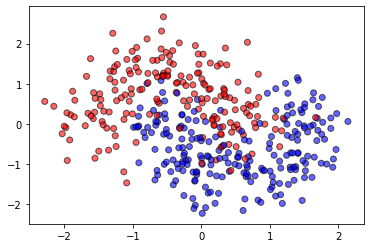

In [5]:
# Generate moon dataset
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import ListedColormap

h = .02  # step size in the mesh

X, y = make_moons(n_samples=1000, noise=0.3, random_state=0)
X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=.4, random_state=42)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

# just plot the dataset first
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
# Plot the testing points
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
           edgecolors='k')
plt.show()

In [6]:
results_fit2 = autonet_plain.fit(X_train=X_train,
                          Y_train=y_train,
                          refit=True)
print('Completed fitting the plain network!')
score = autonet_plain.score(X_test=X_test, Y_test=y_test)
print("Accuracy score", score)

with open(os.path.join(result_directory2, 'results_fit.json'), "w") as file:
    json.dump(results_fit2, file)

19:52:40 [AutoNet] Start bohb
19:52:40 WORKER: Connected to nameserver <Pyro4.core.Proxy at 0x20a42697dc8; connected IPv4; for PYRO:Pyro.NameServer@192.168.0.7:59581>
19:52:40 wait_for_workers trying to get the condition
19:52:40 DISPATCHER: started the 'discover_worker' thread
19:52:40 WORKER: No dispatcher found. Waiting for one to initiate contact.
19:52:40 DISPATCHER: started the 'job_runner' thread
19:52:40 WORKER: start listening for jobs
19:52:40 DISPATCHER: Pyro daemon running on 192.168.0.7:59587
19:52:40 DISPATCHER: Starting worker discovery
19:52:40 DISPATCHER: Found 1 potential workers, 0 currently in the pool.
19:52:40 DISPATCHER: discovered new worker, hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564
19:52:40 HBMASTER: number of workers changed to 1
19:52:40 Enough workers to start this run!
19:52:40 DISPATCHER: jobs to submit = 0, number of idle workers = 1 -> waiting!
19:52:40 adjust_queue_size: lock accquired
19:52:40 HBMASTER: starting run at 1593539560.8526483
1

19:52:42 Epoch: 6 : {'loss': 0.6929741899172465, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003875011502963778}
19:52:42 Perform learning rate scheduling
19:52:42 Budget used: 1.928840160369873/19.95412254333496
19:52:42 Epoch: 7 : {'loss': 0.6928642789522806, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00032166948252726084}
19:52:43 Perform learning rate scheduling
19:52:43 Budget used: 2.1432673931121826/19.95412254333496
19:52:43 Epoch: 8 : {'loss': 0.6935134132703146, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00026702180344552896}
19:52:43 Perform learning rate scheduling
19:52:43 Budget used: 2.340738534927368/19.95412254333496
19:52:43 Epoch: 9 : {'loss': 0.6937483350435892, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022165809126534135}
19:52:43 Perform learning rate scheduling
19:52:43 Budget used: 2.559154987335205/19.95412254333496
19:52:43 Epoch: 10 : {'l

19:52:49 Perform learning rate scheduling
19:52:49 Budget used: 9.051787853240967/19.95412254333496
19:52:49 Epoch: 40 : {'loss': 0.6931732098261515, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.901228137772844e-07}
19:52:50 Perform learning rate scheduling
19:52:50 Budget used: 9.25524377822876/19.95412254333496
19:52:50 Epoch: 41 : {'loss': 0.6930006345113119, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.728794565337614e-07}
19:52:50 Perform learning rate scheduling
19:52:50 Budget used: 9.464685678482056/19.95412254333496
19:52:50 Epoch: 42 : {'loss': 0.6933161020278931, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.75554300142773e-07}
19:52:50 Perform learning rate scheduling
19:52:50 Budget used: 9.667141914367676/19.95412254333496
19:52:50 Epoch: 43 : {'loss': 0.6930554707845052, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.9476348785943056e-07}
19:52:50 Perform learning

19:52:57 Perform learning rate scheduling
19:52:57 Budget used: 16.16276717185974/19.95412254333496
19:52:57 Epoch: 74 : {'loss': 0.693230668703715, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2290789272021636e-09}
19:52:57 Perform learning rate scheduling
19:52:57 Budget used: 16.387166738510132/19.95412254333496
19:52:57 Epoch: 75 : {'loss': 0.6930840015411377, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0202735713065483e-09}
19:52:57 Perform learning rate scheduling
19:52:57 Budget used: 16.59760355949402/19.95412254333496
19:52:57 Epoch: 76 : {'loss': 0.693144420782725, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.469416709276941e-10}
19:52:57 Perform learning rate scheduling
19:52:57 Budget used: 16.799064874649048/19.95412254333496
19:52:57 Epoch: 77 : {'loss': 0.6931441426277161, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.030567233406008e-10}
19:52:57 Perform learn

Wrapping up training!, Final models count:  0


19:53:00 [AutoNet] Done with current split!
19:53:00 Aggregate the results across the splits
19:53:00 Process 1 additional result(s)
19:53:00 Send additional results {} to master
19:53:01 Result: 0.5 info: {'loss': 0.6928282380104065, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.3056956789186215e-11, 'val_balanced_accuracy': 0.5}
19:53:01 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.16705560684204 seconds
19:53:01 WORKER: done with job (0, 0, 0), trying to register it.
19:53:01 WORKER: registered result for job (0, 0, 0) with dispatcher
19:53:01 DISPATCHER: job (0, 0, 0) finished
19:53:01 DISPATCHER: register_result: lock acquired
19:53:01 DISPATCHER: job (0, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:53:01 job_id: (0, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

19:53:01 Fit: NetworkSelector
19:53:01 Fit: InitializationSelector
19:53:01 Fit: OptimizerSelector
19:53:01 Fit: LearningrateSchedulerSelector
19:53:01 Fit: LogFunctionsSelector
19:53:01 Fit: MetricSelector
19:53:01 Fit: LossModuleSelector
19:53:01 Fit: CreateDataLoader
19:53:01 Fit: TrainNode
19:53:01 Start train. Budget: 29.952128171920776
19:53:04 Perform learning rate scheduling
19:53:04 Learning rate scheduler converged. Taking Snapshot of models parameters.
19:53:04 Budget used: 3.35502552986145/19.952128171920776
19:53:04 Epoch: 0 : {'loss': 7.907568116982778, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.04652414441110072}
19:53:09 Perform learning rate scheduling
19:53:09 Budget used: 8.78849196434021/19.952128171920776
19:53:09 Epoch: 1 : {'loss': 4.232163071632385, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04652414441110072}
19:53:10 Perform learning rate scheduling
19:53:10 Budget used: 9.57139849662780

19:53:21 Perform learning rate scheduling
19:53:21 Learning rate scheduler converged. Taking Snapshot of models parameters.
19:53:21 Budget used: 20.069319248199463/19.952128171920776
19:53:21 Budget exhausted!
19:53:21 Epoch: 31 : {'loss': 0.6946066617965698, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 4.829967918477527e-07}
19:53:21 Using logs where lr scheduler converged
19:53:21 Finished train with budget 29.952128171920776: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


19:53:21 [AutoNet] Done with current split!
19:53:21 Aggregate the results across the splits
19:53:21 Process 1 additional result(s)
19:53:21 Send additional results {} to master
19:53:21 Result: 0.5 info: {'loss': 0.6946066617965698, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 4.829967918477527e-07, 'val_balanced_accuracy': 0.5}
19:53:21 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.252827405929565 seconds
19:53:21 WORKER: done with job (0, 0, 1), trying to register it.
19:53:21 WORKER: registered result for job (0, 0, 1) with dispatcher
19:53:21 DISPATCHER: job (0, 0, 1) finished
19:53:21 DISPATCHER: register_result: lock acquired
19:53:21 DISPATCHER: job (0, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:53:21 job_id: (0, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

19:53:21 Fit: LogFunctionsSelector
19:53:21 Fit: MetricSelector
19:53:21 Fit: LossModuleSelector
19:53:21 Fit: CreateDataLoader
19:53:21 Fit: TrainNode
19:53:21 Start train. Budget: 29.944149255752563
19:53:21 Perform learning rate scheduling
19:53:21 Budget used: 0.3759949207305908/19.944149255752563
19:53:21 Epoch: 0 : {'loss': 0.7308505177497864, 'train_balanced_accuracy': 0.5986756404689535, 'lr_scheduler_converged': False, 'lr': 0.0044091890251371155}
19:53:22 Perform learning rate scheduling
19:53:22 Budget used: 0.647268533706665/19.944149255752563
19:53:22 Epoch: 1 : {'loss': 4.548219005266826, 'train_balanced_accuracy': 0.43902173913043474, 'lr_scheduler_converged': False, 'lr': 0.0044091890251371155}
19:53:22 Perform learning rate scheduling
19:53:22 Budget used: 0.9205381870269775/19.944149255752563
19:53:22 Epoch: 2 : {'loss': 1.3148414293924968, 'train_balanced_accuracy': 0.48604714538765503, 'lr_scheduler_converged': False, 'lr': 0.004180646619043102}
19:53:22 Perform lea

19:53:30 Budget used: 9.387889862060547/19.944149255752563
19:53:30 Epoch: 31 : {'loss': 0.6917884151140848, 'train_balanced_accuracy': 0.5285923753665689, 'lr_scheduler_converged': False, 'lr': 0.0019322895682573182}
19:53:31 Perform learning rate scheduling
19:53:31 Budget used: 9.694070100784302/19.944149255752563
19:53:31 Epoch: 32 : {'loss': 0.6992257038752238, 'train_balanced_accuracy': 0.4972067039106145, 'lr_scheduler_converged': False, 'lr': 0.0018815448716941953}
19:53:31 Perform learning rate scheduling
19:53:31 Budget used: 9.9932701587677/19.944149255752563
19:53:31 Epoch: 33 : {'loss': 0.6981854836146036, 'train_balanced_accuracy': 0.5026455026455027, 'lr_scheduler_converged': False, 'lr': 0.001832132803672666}
19:53:31 Perform learning rate scheduling
19:53:31 Budget used: 10.295461416244507/19.944149255752563
19:53:31 Epoch: 34 : {'loss': 0.6936094562212626, 'train_balanced_accuracy': 0.49546259708407137, 'lr_scheduler_converged': False, 'lr': 0.0017840183674551371}
19:

19:53:40 Perform learning rate scheduling
19:53:40 Budget used: 18.818663120269775/19.944149255752563
19:53:40 Epoch: 63 : {'loss': 0.6941830317179362, 'train_balanced_accuracy': 0.49722222222222223, 'lr_scheduler_converged': False, 'lr': 0.0008245710281540238}
19:53:40 Perform learning rate scheduling
19:53:40 Budget used: 19.10390019416809/19.944149255752563
19:53:40 Epoch: 64 : {'loss': 0.6933607061704, 'train_balanced_accuracy': 0.49731182795698925, 'lr_scheduler_converged': False, 'lr': 0.0008029166098381627}
19:53:40 Perform learning rate scheduling
19:53:40 Budget used: 19.402103424072266/19.944149255752563
19:53:40 Epoch: 65 : {'loss': 0.6935040752092997, 'train_balanced_accuracy': 0.49032608695652175, 'lr_scheduler_converged': False, 'lr': 0.0007818308676176142}
19:53:41 Perform learning rate scheduling
19:53:41 Budget used: 19.690332174301147/19.944149255752563
19:53:41 Epoch: 66 : {'loss': 0.6935303409894308, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, '

Wrapping up training!, Final models count:  0


19:53:41 [AutoNet] Done with current split!
19:53:41 Aggregate the results across the splits
19:53:41 Process 1 additional result(s)
19:53:41 Send additional results {} to master
19:53:41 Result: 0.5 info: {'loss': 0.6937474608421326, 'train_balanced_accuracy': 0.48499795612481267, 'lr_scheduler_converged': 0.0, 'lr': 0.0007413060666564343, 'val_balanced_accuracy': 0.5}
19:53:41 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.147109746932983 seconds
19:53:41 WORKER: done with job (0, 0, 2), trying to register it.
19:53:41 WORKER: registered result for job (0, 0, 2) with dispatcher
19:53:41 DISPATCHER: job (0, 0, 2) finished
19:53:41 DISPATCHER: register_result: lock acquired
19:53:41 DISPATCHER: job (0, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:53:41 job_id: (0, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default',

19:53:41 Fit: EmbeddingSelector
19:53:41 Fit: NetworkSelector
19:53:41 Fit: InitializationSelector
19:53:41 Fit: OptimizerSelector
19:53:41 Fit: LearningrateSchedulerSelector
19:53:41 Fit: LogFunctionsSelector
19:53:41 Fit: MetricSelector
19:53:41 Fit: LossModuleSelector
19:53:41 Fit: CreateDataLoader
19:53:41 Fit: TrainNode
19:53:41 Start train. Budget: 89.9531238079071
19:53:41 Perform learning rate scheduling
19:53:41 Budget used: 0.339092493057251/79.9531238079071
19:53:41 Epoch: 0 : {'loss': 0.6932109991709391, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011842729505689438}
19:53:42 Perform learning rate scheduling
19:53:42 Budget used: 0.5614988803863525/79.9531238079071
19:53:42 Epoch: 1 : {'loss': 0.6950705647468567, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011842729505689438}
19:53:42 Perform learning rate scheduling
19:53:42 Budget used: 0.7948727607727051/79.9531238079071
19:53:42 Epoch: 2 : {'loss': 0.6937408645

19:53:49 Budget used: 7.714364051818848/79.9531238079071
19:53:49 Epoch: 32 : {'loss': 0.6931161284446716, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.060775451221495e-06}
19:53:49 Perform learning rate scheduling
19:53:49 Budget used: 7.9417564868927/79.9531238079071
19:53:49 Epoch: 33 : {'loss': 0.6931726137797037, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.540787439659285e-06}
19:53:49 Perform learning rate scheduling
19:53:49 Budget used: 8.167154788970947/79.9531238079071
19:53:49 Epoch: 34 : {'loss': 0.6931716799736023, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.109138980108483e-06}
19:53:49 Perform learning rate scheduling
19:53:49 Budget used: 8.395542621612549/79.9531238079071
19:53:49 Epoch: 35 : {'loss': 0.6931444009145101, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7508222718582017e-06}
19:53:50 Perform learning rate scheduling
19:53:50 Budget used: 8.63290

19:53:57 Perform learning rate scheduling
19:53:57 Budget used: 15.50951361656189/79.9531238079071
19:53:57 Epoch: 66 : {'loss': 0.6933735211690267, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.451108893797677e-09}
19:53:57 Perform learning rate scheduling
19:53:57 Budget used: 15.736906051635742/79.9531238079071
19:53:57 Epoch: 67 : {'loss': 0.6932574113210043, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.525032701777864e-09}
19:53:57 Perform learning rate scheduling
19:53:57 Budget used: 15.957315921783447/79.9531238079071
19:53:57 Epoch: 68 : {'loss': 0.693086842695872, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7562854367955784e-09}
19:53:57 Perform learning rate scheduling
19:53:57 Budget used: 16.1847083568573/79.9531238079071
19:53:57 Epoch: 69 : {'loss': 0.6931707262992859, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1181388539222983e-09}
19:53:58 Perform learning 

19:54:05 Perform learning rate scheduling
19:54:05 Budget used: 23.57494020462036/79.9531238079071
19:54:05 Epoch: 100 : {'loss': 0.6930862863858541, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.70818952438397e-12}
19:54:05 Perform learning rate scheduling
19:54:05 Budget used: 23.824273586273193/79.9531238079071
19:54:05 Epoch: 101 : {'loss': 0.6933107972145081, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.058887820582446e-12}
19:54:05 Perform learning rate scheduling
19:54:05 Budget used: 24.05166506767273/79.9531238079071
19:54:05 Epoch: 102 : {'loss': 0.6931432882944742, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.689782141315704e-12}
19:54:05 Perform learning rate scheduling
19:54:05 Budget used: 24.28105092048645/79.9531238079071
19:54:05 Epoch: 103 : {'loss': 0.6930872996648153, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.5532706366710586e-12}
19:54:06 Perform learni

19:54:12 Perform learning rate scheduling
19:54:12 Budget used: 31.390034198760986/79.9531238079071
19:54:12 Epoch: 134 : {'loss': 0.6932305892308553, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7289866278143148e-14}
19:54:13 Perform learning rate scheduling
19:54:13 Budget used: 31.617427110671997/79.9531238079071
19:54:13 Epoch: 135 : {'loss': 0.6931718389193217, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4352531171590262e-14}
19:54:13 Perform learning rate scheduling
19:54:13 Budget used: 31.839831352233887/79.9531238079071
19:54:13 Epoch: 136 : {'loss': 0.6931993166605631, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1914213083988812e-14}
19:54:13 Perform learning rate scheduling
19:54:13 Budget used: 32.05824899673462/79.9531238079071
19:54:13 Epoch: 137 : {'loss': 0.6933713356653849, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.8901351764117e-15}
19:54:13 Perform lea

19:54:20 Perform learning rate scheduling
19:54:20 Budget used: 39.18319129943848/79.9531238079071
19:54:20 Epoch: 168 : {'loss': 0.6932567556699117, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.079250514889806e-17}
19:54:21 Perform learning rate scheduling
19:54:21 Budget used: 39.409583568573/79.9531238079071
19:54:21 Epoch: 169 : {'loss': 0.6932303110758463, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.556123817797256e-17}
19:54:21 Perform learning rate scheduling
19:54:21 Budget used: 39.63000702857971/79.9531238079071
19:54:21 Epoch: 170 : {'loss': 0.6932584245999655, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1218698966895318e-17}
19:54:21 Perform learning rate scheduling
19:54:21 Budget used: 39.861377239227295/79.9531238079071
19:54:21 Epoch: 171 : {'loss': 0.6933448712031046, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7613903626770064e-17}
19:54:21 Perform learni

19:54:28 Perform learning rate scheduling
19:54:28 Budget used: 46.906532764434814/79.9531238079071
19:54:28 Epoch: 202 : {'loss': 0.693000853061676, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.484012184313686e-20}
19:54:28 Perform learning rate scheduling
19:54:28 Budget used: 47.13192915916443/79.9531238079071
19:54:28 Epoch: 203 : {'loss': 0.6930858095486959, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.5523461289138444e-20}
19:54:28 Perform learning rate scheduling
19:54:28 Budget used: 47.3703088760376/79.9531238079071
19:54:28 Epoch: 204 : {'loss': 0.6933148503303528, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7789586494199976e-20}
19:54:29 Perform learning rate scheduling
19:54:29 Budget used: 47.60366749763489/79.9531238079071
19:54:29 Epoch: 205 : {'loss': 0.6930259664853414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.136960167269496e-20}
19:54:29 Perform learni

19:54:36 Perform learning rate scheduling
19:54:36 Budget used: 54.840309619903564/79.9531238079071
19:54:36 Epoch: 236 : {'loss': 0.6933738986651102, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.766788863808053e-23}
19:54:36 Perform learning rate scheduling
19:54:36 Budget used: 55.075679302215576/79.9531238079071
19:54:36 Epoch: 237 : {'loss': 0.6933431426684061, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.107531854734516e-23}
19:54:36 Perform learning rate scheduling
19:54:36 Budget used: 55.30706167221069/79.9531238079071
19:54:36 Epoch: 238 : {'loss': 0.6932018796602885, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.730162153818292e-23}
19:54:37 Perform learning rate scheduling
19:54:37 Budget used: 55.539438247680664/79.9531238079071
19:54:37 Epoch: 239 : {'loss': 0.6929979920387268, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.58679058291178e-23}
19:54:37 Perform learn

19:54:44 Perform learning rate scheduling
19:54:44 Budget used: 63.22089195251465/79.9531238079071
19:54:44 Epoch: 270 : {'loss': 0.69337397813797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7394229170944644e-25}
19:54:45 Perform learning rate scheduling
19:54:45 Budget used: 63.48319053649902/79.9531238079071
19:54:45 Epoch: 271 : {'loss': 0.6932879090309143, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4439164095639207e-25}
19:54:45 Perform learning rate scheduling
19:54:45 Budget used: 63.75845551490784/79.9531238079071
19:54:45 Epoch: 272 : {'loss': 0.6931730508804321, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1986128142375956e-25}
19:54:45 Perform learning rate scheduling
19:54:45 Budget used: 64.00679039955139/79.9531238079071
19:54:45 Epoch: 273 : {'loss': 0.6932587027549744, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.949832753050158e-26}
19:54:45 Perform learni

19:54:53 Perform learning rate scheduling
19:54:53 Budget used: 72.14901161193848/79.9531238079071
19:54:53 Epoch: 304 : {'loss': 0.693139374256134, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0978370953887335e-28}
19:54:54 Perform learning rate scheduling
19:54:54 Budget used: 72.42627000808716/79.9531238079071
19:54:54 Epoch: 305 : {'loss': 0.6931447188059489, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.57155276743126e-28}
19:54:54 Perform learning rate scheduling
19:54:54 Budget used: 72.69654583930969/79.9531238079071
19:54:54 Epoch: 306 : {'loss': 0.6931444009145101, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.13467765801079e-28}
19:54:54 Perform learning rate scheduling
19:54:54 Budget used: 72.96483016014099/79.9531238079071
19:54:54 Epoch: 307 : {'loss': 0.6930583318074545, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7720222432621119e-28}
19:54:54 Perform learning

Wrapping up training!, Final models count:  0


19:55:01 [AutoNet] Done with current split!
19:55:01 Aggregate the results across the splits
19:55:01 Process 1 additional result(s)
19:55:01 Send additional results {} to master
19:55:01 Result: 0.5 info: {'loss': 0.6938574910163879, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.3996764079401535e-30, 'val_balanced_accuracy': 0.5}
19:55:01 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21543574333191 seconds
19:55:01 WORKER: done with job (0, 0, 0), trying to register it.
19:55:01 WORKER: registered result for job (0, 0, 0) with dispatcher
19:55:01 DISPATCHER: job (0, 0, 0) finished
19:55:01 DISPATCHER: register_result: lock acquired
19:55:01 DISPATCHER: job (0, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:55:01 job_id: (0, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

19:55:01 Fit: EmbeddingSelector
19:55:01 Fit: NetworkSelector
19:55:01 Fit: InitializationSelector
19:55:01 Fit: OptimizerSelector
19:55:01 Fit: LearningrateSchedulerSelector
19:55:01 Fit: LogFunctionsSelector
19:55:01 Fit: MetricSelector
19:55:01 Fit: LossModuleSelector
19:55:01 Fit: CreateDataLoader
19:55:01 Fit: TrainNode
19:55:01 Start train. Budget: 89.94714164733887
19:55:02 Perform learning rate scheduling
19:55:02 Budget used: 0.3420846462249756/79.94714164733887
19:55:02 Epoch: 0 : {'loss': 0.693259040514628, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006135900098104484}
19:55:02 Perform learning rate scheduling
19:55:02 Budget used: 0.5704746246337891/79.94714164733887
19:55:02 Epoch: 1 : {'loss': 0.6931731502215067, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006135900098104484}
19:55:02 Perform learning rate scheduling
19:55:02 Budget used: 0.7978641986846924/79.94714164733887
19:55:02 Epoch: 2 : {'loss': 0.693215

19:55:09 Perform learning rate scheduling
19:55:09 Budget used: 7.834044456481934/79.94714164733887
19:55:09 Epoch: 32 : {'loss': 0.6932996114095052, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.083360668111238e-07}
19:55:09 Perform learning rate scheduling
19:55:09 Budget used: 8.061437129974365/79.94714164733887
19:55:09 Epoch: 33 : {'loss': 0.6929578185081482, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.733741894895079e-07}
19:55:10 Perform learning rate scheduling
19:55:10 Budget used: 8.289827108383179/79.94714164733887
19:55:10 Epoch: 34 : {'loss': 0.6933842698733012, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.6412709528231996e-07}
19:55:10 Perform learning rate scheduling
19:55:10 Budget used: 8.517216205596924/79.94714164733887
19:55:10 Epoch: 35 : {'loss': 0.6932993531227112, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.756952519383427e-07}
19:55:10 Perform learni

19:55:17 Perform learning rate scheduling
19:55:17 Budget used: 15.782808542251587/79.94714164733887
19:55:17 Epoch: 66 : {'loss': 0.6933418114980062, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.357941881653368e-10}
19:55:17 Perform learning rate scheduling
19:55:17 Budget used: 16.023139238357544/79.94714164733887
19:55:17 Epoch: 67 : {'loss': 0.6932141383488973, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.337073498961136e-10}
19:55:18 Perform learning rate scheduling
19:55:18 Budget used: 16.26648759841919/79.94714164733887
19:55:18 Epoch: 68 : {'loss': 0.6932106614112854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5107149257816297e-10}
19:55:18 Perform learning rate scheduling
19:55:18 Budget used: 16.49388027191162/79.94714164733887
19:55:18 Epoch: 69 : {'loss': 0.6931279102961222, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.8418054923574996e-10}
19:55:18 Perform lea

19:55:25 Perform learning rate scheduling
19:55:25 Budget used: 23.784379720687866/79.94714164733887
19:55:25 Epoch: 100 : {'loss': 0.692745566368103, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.052813706975906e-13}
19:55:25 Perform learning rate scheduling
19:55:25 Budget used: 24.017755031585693/79.94714164733887
19:55:25 Epoch: 101 : {'loss': 0.6929588715235392, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.2806161979733116e-13}
19:55:26 Perform learning rate scheduling
19:55:26 Budget used: 24.24614429473877/79.94714164733887
19:55:26 Epoch: 102 : {'loss': 0.69329700867335, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.655548321868338e-13}
19:55:26 Perform learning rate scheduling
19:55:26 Budget used: 24.470545530319214/79.94714164733887
19:55:26 Epoch: 103 : {'loss': 0.6934259533882141, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1495769283021495e-13}
19:55:26 Perform l

19:55:33 Epoch: 133 : {'loss': 0.6932087739308676, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.787184825755467e-16}
19:55:33 Perform learning rate scheduling
19:55:33 Budget used: 31.67726731300354/79.94714164733887
19:55:33 Epoch: 134 : {'loss': 0.6932559212048849, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.065598564944348e-16}
19:55:33 Perform learning rate scheduling
19:55:33 Budget used: 31.9096462726593/79.94714164733887
19:55:33 Epoch: 135 : {'loss': 0.6930409073829651, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.481498789675298e-16}
19:55:34 Perform learning rate scheduling
19:55:34 Budget used: 32.142024517059326/79.94714164733887
19:55:34 Epoch: 136 : {'loss': 0.6932553847630819, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0086896939396743e-16}
19:55:34 Perform learning rate scheduling
19:55:34 Budget used: 32.38038730621338/79.94714164733887
19:55:34 Epoch: 137

19:55:41 Perform learning rate scheduling
19:55:41 Budget used: 39.28990578651428/79.94714164733887
19:55:41 Epoch: 167 : {'loss': 0.6931701302528381, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.86467358394275e-19}
19:55:41 Perform learning rate scheduling
19:55:41 Budget used: 39.51832389831543/79.94714164733887
19:55:41 Epoch: 168 : {'loss': 0.6933411558469137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3188567846611644e-19}
19:55:41 Perform learning rate scheduling
19:55:41 Budget used: 39.7566556930542/79.94714164733887
19:55:41 Epoch: 169 : {'loss': 0.6933826804161072, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8770364686256605e-19}
19:55:41 Perform learning rate scheduling
19:55:41 Budget used: 39.982053995132446/79.94714164733887
19:55:41 Epoch: 170 : {'loss': 0.6931698322296143, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5193978032004753e-19}
19:55:42 Perform l

19:55:48 Epoch: 200 : {'loss': 0.6930837829907736, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6769175965765677e-22}
19:55:49 Perform learning rate scheduling
19:55:49 Budget used: 47.17281889915466/79.94714164733887
19:55:49 Epoch: 201 : {'loss': 0.693214217821757, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1668746364662567e-22}
19:55:49 Perform learning rate scheduling
19:55:49 Budget used: 47.401207447052/79.94714164733887
19:55:49 Epoch: 202 : {'loss': 0.6932136416435242, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7540120383853096e-22}
19:55:49 Perform learning rate scheduling
19:55:49 Budget used: 47.635581731796265/79.94714164733887
19:55:49 Epoch: 203 : {'loss': 0.6932555238405863, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.419813670355128e-22}
19:55:49 Perform learning rate scheduling
19:55:49 Budget used: 47.86097836494446/79.94714164733887
19:55:49 Epoch: 204

19:55:56 Perform learning rate scheduling
19:55:56 Budget used: 55.01783585548401/79.94714164733887
19:55:56 Epoch: 234 : {'loss': 0.693213939666748, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0248536784245012e-25}
19:55:57 Perform learning rate scheduling
19:55:57 Budget used: 55.25120973587036/79.94714164733887
19:55:57 Epoch: 235 : {'loss': 0.6933812697728475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6390508560833665e-25}
19:55:57 Perform learning rate scheduling
19:55:57 Budget used: 55.49655556678772/79.94714164733887
19:55:57 Epoch: 236 : {'loss': 0.6931714415550232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3267564651476054e-25}
19:55:57 Perform learning rate scheduling
19:55:57 Budget used: 55.74090003967285/79.94714164733887
19:55:57 Epoch: 237 : {'loss': 0.6932563384373983, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.073964673687609e-25}
19:55:57 Perform l

19:56:05 Epoch: 267 : {'loss': 0.6932111183802286, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.892141035771028e-28}
19:56:05 Perform learning rate scheduling
19:56:05 Budget used: 63.50014591217041/79.94714164733887
19:56:05 Epoch: 268 : {'loss': 0.693297823270162, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5316244415863394e-28}
19:56:05 Perform learning rate scheduling
19:56:05 Budget used: 63.74050188064575/79.94714164733887
19:56:05 Epoch: 269 : {'loss': 0.6931288242340088, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2397984007089338e-28}
19:56:05 Perform learning rate scheduling
19:56:05 Budget used: 63.9978141784668/79.94714164733887
19:56:05 Epoch: 270 : {'loss': 0.6934244632720947, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0035750492519036e-28}
19:56:06 Perform learning rate scheduling
19:56:06 Budget used: 64.26011276245117/79.94714164733887
19:56:06 Epoch: 271

19:56:13 Perform learning rate scheduling
19:56:13 Budget used: 72.02334761619568/79.94714164733887
19:56:13 Epoch: 301 : {'loss': 0.693170964717865, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.431238952322873e-31}
19:56:14 Perform learning rate scheduling
19:56:14 Budget used: 72.29362440109253/79.94714164733887
19:56:14 Epoch: 302 : {'loss': 0.6932142575581869, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1585397281101044e-31}
19:56:14 Perform learning rate scheduling
19:56:14 Budget used: 72.56190776824951/79.94714164733887
19:56:14 Epoch: 303 : {'loss': 0.6929570833841959, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.37798890556358e-32}
19:56:14 Perform learning rate scheduling
19:56:14 Budget used: 72.84816002845764/79.94714164733887
19:56:14 Epoch: 304 : {'loss': 0.6932567556699117, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.591166170567037e-32}
19:56:14 Perform lear

Wrapping up training!, Final models count:  0


19:56:21 [AutoNet] Done with current split!
19:56:21 Aggregate the results across the splits
19:56:21 Process 1 additional result(s)
19:56:21 Send additional results {} to master
19:56:21 Result: 0.5 info: {'loss': 0.6930424968401591, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 3.1151349987117703e-34, 'val_balanced_accuracy': 0.5}
19:56:21 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.13365364074707 seconds
19:56:21 WORKER: done with job (1, 0, 0), trying to register it.
19:56:21 WORKER: registered result for job (1, 0, 0) with dispatcher
19:56:21 DISPATCHER: job (1, 0, 0) finished
19:56:21 DISPATCHER: register_result: lock acquired
19:56:21 DISPATCHER: job (1, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:56:21 job_id: (1, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

19:56:22 Fit: LogFunctionsSelector
19:56:22 Fit: MetricSelector
19:56:22 Fit: LossModuleSelector
19:56:22 Fit: CreateDataLoader
19:56:22 Fit: TrainNode
19:56:22 Start train. Budget: 89.94315242767334
19:56:22 Perform learning rate scheduling
19:56:22 Budget used: 0.46575379371643066/79.94315242767334
19:56:22 Epoch: 0 : {'loss': 0.6931615670522054, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.00016004944502808068}
19:56:22 Perform learning rate scheduling
19:56:22 Budget used: 0.8257894515991211/79.94315242767334
19:56:22 Epoch: 1 : {'loss': 0.6931639313697815, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00016004944502808068}
19:56:23 Perform learning rate scheduling
19:56:23 Budget used: 1.1977975368499756/79.94315242767334
19:56:23 Epoch: 2 : {'loss': 0.6931567192077637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010277819121599357}
19:56:23 Perform learning rate scheduling
19:56:2

19:56:34 Perform learning rate scheduling
19:56:34 Budget used: 12.433741569519043/79.94315242767334
19:56:34 Epoch: 33 : {'loss': 0.6930030783017477, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0725717036322214e-07}
19:56:34 Perform learning rate scheduling
19:56:34 Budget used: 12.802754640579224/79.94315242767334
19:56:34 Epoch: 34 : {'loss': 0.6930214365323385, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.595076257100461e-08}
19:56:35 Perform learning rate scheduling
19:56:35 Budget used: 13.17179799079895/79.94315242767334
19:56:35 Epoch: 35 : {'loss': 0.6930130322774252, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.887682717639875e-08}
19:56:35 Perform learning rate scheduling
19:56:35 Budget used: 13.521833181381226/79.94315242767334
19:56:35 Epoch: 36 : {'loss': 0.6930164893468221, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.519459257814529e-08}
19:56:35 Perform lea

19:56:46 Perform learning rate scheduling
19:56:46 Budget used: 24.945274353027344/79.94315242767334
19:56:46 Epoch: 67 : {'loss': 0.6930239796638489, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.7599922213473803e-11}
19:56:47 Perform learning rate scheduling
19:56:47 Budget used: 25.332240104675293/79.94315242767334
19:56:47 Epoch: 68 : {'loss': 0.6929976542790731, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.6157820698728854e-11}
19:56:47 Perform learning rate scheduling
19:56:47 Budget used: 25.707237005233765/79.94315242767334
19:56:47 Epoch: 69 : {'loss': 0.69300377368927, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.698866820965296e-11}
19:56:48 Perform learning rate scheduling
19:56:48 Budget used: 26.137088537216187/79.94315242767334
19:56:48 Epoch: 70 : {'loss': 0.6930182178815206, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.964094827729744e-11}
19:56:48 Perform lea

19:57:01 Perform learning rate scheduling
19:57:01 Budget used: 39.01564025878906/79.94315242767334
19:57:01 Epoch: 101 : {'loss': 0.6930147409439087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0932673571033077e-14}
19:57:01 Perform learning rate scheduling
19:57:01 Budget used: 39.468427419662476/79.94315242767334
19:57:01 Epoch: 102 : {'loss': 0.6930083235104879, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.47879640380845e-14}
19:57:01 Perform learning rate scheduling
19:57:01 Budget used: 39.94216012954712/79.94315242767334
19:57:01 Epoch: 103 : {'loss': 0.6930154164632162, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9863887928806976e-14}
19:57:02 Perform learning rate scheduling
19:57:02 Budget used: 40.367024660110474/79.94315242767334
19:57:02 Epoch: 104 : {'loss': 0.6930049856503805, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5917969020851234e-14}
19:57:02 Perform

19:57:15 Epoch: 134 : {'loss': 0.6930291851361593, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0729537915087016e-17}
19:57:16 Perform learning rate scheduling
19:57:16 Budget used: 54.12194466590881/79.94315242767334
19:57:16 Epoch: 135 : {'loss': 0.6930137674013773, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6611659486378014e-17}
19:57:16 Perform learning rate scheduling
19:57:16 Budget used: 54.5298535823822/79.94315242767334
19:57:16 Epoch: 136 : {'loss': 0.6930163701375326, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3311788811777495e-17}
19:57:16 Perform learning rate scheduling
19:57:16 Budget used: 54.92579460144043/79.94315242767334
19:57:16 Epoch: 137 : {'loss': 0.6930185357729594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0667430398189661e-17}
19:57:17 Perform learning rate scheduling
19:57:17 Budget used: 55.30079174041748/79.94315242767334
19:57:17 Epoch: 1

19:57:27 Perform learning rate scheduling
19:57:27 Budget used: 65.73587918281555/79.94315242767334
19:57:27 Epoch: 168 : {'loss': 0.6930160721143087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1132307214396645e-20}
19:57:28 Perform learning rate scheduling
19:57:28 Budget used: 66.07596921920776/79.94315242767334
19:57:28 Epoch: 169 : {'loss': 0.693007747332255, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.920898164773694e-21}
19:57:28 Perform learning rate scheduling
19:57:28 Budget used: 66.41905236244202/79.94315242767334
19:57:28 Epoch: 170 : {'loss': 0.693020780881246, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.148780799306742e-21}
19:57:28 Perform learning rate scheduling
19:57:28 Budget used: 66.75016593933105/79.94315242767334
19:57:28 Epoch: 171 : {'loss': 0.6930176019668579, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.7286907632616365e-21}
19:57:29 Perform lea

19:57:39 Perform learning rate scheduling
19:57:39 Budget used: 77.85446572303772/79.94315242767334
19:57:39 Epoch: 202 : {'loss': 0.6930246154467264, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.978341843573478e-24}
19:57:40 Perform learning rate scheduling
19:57:40 Budget used: 78.21350502967834/79.94315242767334
19:57:40 Epoch: 203 : {'loss': 0.6930140455563863, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.7907570060367714e-24}
19:57:40 Perform learning rate scheduling
19:57:40 Budget used: 78.5775318145752/79.94315242767334
19:57:40 Epoch: 204 : {'loss': 0.6930116415023804, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.839083359805255e-24}
19:57:40 Perform learning rate scheduling
19:57:40 Budget used: 78.93459701538086/79.94315242767334
19:57:40 Epoch: 205 : {'loss': 0.6930135687192281, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.076457650630523e-24}
19:57:41 Perform lea

Wrapping up training!, Final models count:  0


19:57:42 [AutoNet] Done with current split!
19:57:42 Aggregate the results across the splits
19:57:42 Process 1 additional result(s)
19:57:42 Send additional results {} to master
19:57:42 Result: 0.5 info: {'loss': 0.6930140852928162, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.5831466188734596e-24, 'val_balanced_accuracy': 0.5}
19:57:42 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.25105404853821 seconds
19:57:42 WORKER: done with job (1, 0, 1), trying to register it.
19:57:42 WORKER: registered result for job (1, 0, 1) with dispatcher
19:57:42 DISPATCHER: job (1, 0, 1) finished
19:57:42 DISPATCHER: register_result: lock acquired
19:57:42 DISPATCHER: job (1, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:57:42 job_id: (1, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

19:57:42 Fit: LearningrateSchedulerSelector
19:57:42 Fit: LogFunctionsSelector
19:57:42 Fit: MetricSelector
19:57:42 Fit: LossModuleSelector
19:57:42 Fit: CreateDataLoader
19:57:42 Fit: TrainNode
19:57:42 Start train. Budget: 29.95711398124695
19:57:42 Perform learning rate scheduling
19:57:42 Budget used: 0.39394664764404297/19.95711398124695
19:57:42 Epoch: 0 : {'loss': 0.6913504600524902, 'train_balanced_accuracy': 0.45310464611376466, 'lr_scheduler_converged': False}
19:57:42 Perform learning rate scheduling
19:57:43 Budget used: 0.6861646175384521/19.95711398124695
19:57:43 Epoch: 1 : {'loss': 0.5913159151872, 'train_balanced_accuracy': 0.8627173913043478, 'lr_scheduler_converged': False}
19:57:43 Perform learning rate scheduling
19:57:43 Budget used: 0.9803788661956787/19.95711398124695
19:57:43 Epoch: 2 : {'loss': 0.3888033628463745, 'train_balanced_accuracy': 0.8751328518871782, 'lr_scheduler_converged': False}
19:57:43 Perform learning rate scheduling
19:57:43 Budget used: 1.2

19:57:53 Perform learning rate scheduling
19:57:53 Budget used: 10.787145853042603/19.95711398124695
19:57:53 Epoch: 35 : {'loss': 0.23682588835557303, 'train_balanced_accuracy': 0.9171261713975283, 'lr_scheduler_converged': False}
19:57:53 Perform learning rate scheduling
19:57:53 Budget used: 11.075375080108643/19.95711398124695
19:57:53 Epoch: 36 : {'loss': 0.2199502239624659, 'train_balanced_accuracy': 0.9145087585681646, 'lr_scheduler_converged': False}
19:57:53 Perform learning rate scheduling
19:57:53 Budget used: 11.361607789993286/19.95711398124695
19:57:53 Epoch: 37 : {'loss': 0.22105790177981058, 'train_balanced_accuracy': 0.9194304401144571, 'lr_scheduler_converged': False}
19:57:53 Perform learning rate scheduling
19:57:53 Budget used: 11.65582275390625/19.95711398124695
19:57:53 Epoch: 38 : {'loss': 0.2232802758614222, 'train_balanced_accuracy': 0.9149066630331109, 'lr_scheduler_converged': False}
19:57:54 Perform learning rate scheduling
19:57:54 Budget used: 11.94306778

Wrapping up training!, Final models count:  0


19:58:02 [AutoNet] Done with current split!
19:58:02 Aggregate the results across the splits
19:58:02 Process 1 additional result(s)
19:58:02 Send additional results {} to master
19:58:02 Result: 0.05915317559153177 info: {'loss': 0.23030062019824982, 'train_balanced_accuracy': 0.9215686274509804, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9408468244084682}
19:58:02 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.05915317559153177 took 20.158078908920288 seconds
19:58:02 WORKER: done with job (2, 0, 0), trying to register it.
19:58:02 WORKER: registered result for job (2, 0, 0) with dispatcher
19:58:02 DISPATCHER: job (2, 0, 0) finished
19:58:02 DISPATCHER: register_result: lock acquired
19:58:02 DISPATCHER: job (2, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:58:02 job_id: (2, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_m

19:58:02 Fit: OneHotEncoding
19:58:02 Fit: PreprocessorSelector
19:58:02 Fit: ResamplingStrategySelector
19:58:02 Distribution before resample: [236 214]
19:58:02 Distribution after resample: [225 214]
19:58:02 Fit: EmbeddingSelector
19:58:02 Fit: NetworkSelector
19:58:02 Fit: InitializationSelector
19:58:02 Fit: OptimizerSelector
19:58:02 Fit: LearningrateSchedulerSelector
19:58:02 Fit: LogFunctionsSelector
19:58:02 Fit: MetricSelector
19:58:02 Fit: LossModuleSelector
19:58:02 Fit: CreateDataLoader
19:58:02 Fit: TrainNode
19:58:02 Start train. Budget: 29.958113193511963
19:58:02 Perform learning rate scheduling
19:58:02 Learning rate scheduler converged. Taking Snapshot of models parameters.
19:58:02 Budget used: 0.30518460273742676/19.958113193511963
19:58:02 Epoch: 0 : {'loss': 0.6931609710057577, 'train_balanced_accuracy': 0.40651200651200653, 'lr_scheduler_converged': True, 'lr': 0.006861941183128952}
19:58:03 Perform learning rate scheduling
19:58:03 Budget used: 0.50165796279907

19:58:08 Epoch: 29 : {'loss': 0.6931602557500204, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005625740904429429}
19:58:08 Perform learning rate scheduling
19:58:08 Budget used: 6.181464195251465/19.958113193511963
19:58:08 Epoch: 30 : {'loss': 0.6931462287902832, 'train_balanced_accuracy': 0.49826370048833424, 'lr_scheduler_converged': False, 'lr': 0.005132059534351961}
19:58:08 Perform learning rate scheduling
19:58:08 Budget used: 6.376943111419678/19.958113193511963
19:58:08 Epoch: 31 : {'loss': 0.6931745409965515, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0045862139431377185}
19:58:09 Perform learning rate scheduling
19:58:09 Budget used: 6.585385084152222/19.958113193511963
19:58:09 Epoch: 32 : {'loss': 0.6931391954421997, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004004942591316564}
19:58:09 Perform learning rate scheduling
19:58:09 Budget used: 6.784852504730225/19.958113193511963
19:58:0

19:58:14 Epoch: 62 : {'loss': 0.69310063123703, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0019195454509974218}
19:58:15 Perform learning rate scheduling
19:58:15 Budget used: 12.549433946609497/19.958113193511963
19:58:15 Epoch: 63 : {'loss': 0.6931641300519308, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0016156682159802868}
19:58:15 Perform learning rate scheduling
19:58:15 Budget used: 12.750893831253052/19.958113193511963
19:58:15 Epoch: 64 : {'loss': 0.6931680838267008, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013304210976474782}
19:58:15 Perform learning rate scheduling
19:58:15 Budget used: 12.946368932723999/19.958113193511963
19:58:15 Epoch: 65 : {'loss': 0.6931538383165995, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010667315350691368}
19:58:15 Perform learning rate scheduling
19:58:15 Budget used: 13.1358642578125/19.958113193511963
19:58:15 Epoch: 66 :

19:58:21 Perform learning rate scheduling
19:58:21 Budget used: 18.88348913192749/19.958113193511963
19:58:21 Epoch: 96 : {'loss': 0.6931347250938416, 'train_balanced_accuracy': 0.6165032679738562, 'lr_scheduler_converged': False, 'lr': 0.004191177765817528}
19:58:21 Perform learning rate scheduling
19:58:21 Budget used: 19.07298231124878/19.958113193511963
19:58:21 Epoch: 97 : {'loss': 0.6931752959887186, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0039939908807880955}
19:58:21 Perform learning rate scheduling
19:58:21 Budget used: 19.264471292495728/19.958113193511963
19:58:21 Epoch: 98 : {'loss': 0.6931314865748087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0037948723924595648}
19:58:21 Perform learning rate scheduling
19:58:21 Budget used: 19.453963041305542/19.958113193511963
19:58:21 Epoch: 99 : {'loss': 0.6931063930193583, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0035945054341689213}
19:5

Wrapping up training!, Final models count:  0


19:58:22 [AutoNet] Done with current split!
19:58:22 Aggregate the results across the splits
19:58:22 Process 1 additional result(s)
19:58:22 Send additional results {} to master
19:58:22 Result: 0.5 info: {'loss': 0.6931292613347372, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.752793354720619e-05, 'val_balanced_accuracy': 0.5}
19:58:22 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.180023193359375 seconds
19:58:22 WORKER: done with job (2, 0, 1), trying to register it.
19:58:22 WORKER: registered result for job (2, 0, 1) with dispatcher
19:58:22 DISPATCHER: job (2, 0, 1) finished
19:58:22 DISPATCHER: register_result: lock acquired
19:58:22 DISPATCHER: job (2, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:58:22 job_id: (2, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

19:58:22 Fit: PreprocessorSelector
19:58:22 Fit: ResamplingStrategySelector
19:58:22 Distribution before resample: [236 214]
19:58:22 Distribution after resample: [236 214]
19:58:22 Fit: EmbeddingSelector
19:58:22 Fit: NetworkSelector
19:58:22 Fit: InitializationSelector
19:58:22 Fit: OptimizerSelector
19:58:22 Fit: LearningrateSchedulerSelector
19:58:22 Fit: LogFunctionsSelector
19:58:22 Fit: MetricSelector
19:58:22 Fit: LossModuleSelector
19:58:22 Fit: CreateDataLoader
19:58:22 Fit: TrainNode
19:58:22 Start train. Budget: 29.95711588859558
19:58:23 Perform learning rate scheduling
19:58:23 Budget used: 0.3311135768890381/19.95711588859558
19:58:23 Epoch: 0 : {'loss': 0.6928948760032654, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:23 Perform learning rate scheduling
19:58:23 Budget used: 0.5445425510406494/19.95711588859558
19:58:23 Epoch: 1 : {'loss': 0.6931872169176737, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:23 Perform learn

19:58:30 Perform learning rate scheduling
19:58:30 Budget used: 8.157180309295654/19.95711588859558
19:58:30 Epoch: 36 : {'loss': 0.6931039094924927, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:31 Perform learning rate scheduling
19:58:31 Budget used: 8.372603416442871/19.95711588859558
19:58:31 Epoch: 37 : {'loss': 0.693216602007548, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:31 Perform learning rate scheduling
19:58:31 Budget used: 8.5880286693573/19.95711588859558
19:58:31 Epoch: 38 : {'loss': 0.6931046446164449, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:31 Perform learning rate scheduling
19:58:31 Budget used: 8.804450035095215/19.95711588859558
19:58:31 Epoch: 39 : {'loss': 0.6931226452191671, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:31 Perform learning rate scheduling
19:58:31 Budget used: 9.025855779647827/19.95711588859558
19:58:31 Epoch: 40 : {'loss': 0.69316095113

19:58:39 Budget used: 16.40611457824707/19.95711588859558
19:58:39 Epoch: 74 : {'loss': 0.6931979258855184, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:39 Perform learning rate scheduling
19:58:39 Budget used: 16.617548942565918/19.95711588859558
19:58:39 Epoch: 75 : {'loss': 0.6931027770042419, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:39 Perform learning rate scheduling
19:58:39 Budget used: 16.83696150779724/19.95711588859558
19:58:39 Epoch: 76 : {'loss': 0.6931419173876444, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:39 Perform learning rate scheduling
19:58:39 Budget used: 17.055378198623657/19.95711588859558
19:58:39 Epoch: 77 : {'loss': 0.6931418975194296, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
19:58:40 Perform learning rate scheduling
19:58:40 Budget used: 17.28576111793518/19.95711588859558
19:58:40 Epoch: 78 : {'loss': 0.6930480798085531, 'train_balanced_accuracy': 0.5

Wrapping up training!, Final models count:  0


19:58:42 [AutoNet] Done with current split!
19:58:42 Aggregate the results across the splits
19:58:42 Process 1 additional result(s)
19:58:42 Send additional results {} to master
19:58:42 Result: 0.5 info: {'loss': 0.6934390068054199, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
19:58:42 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.129157066345215 seconds
19:58:42 WORKER: done with job (2, 0, 2), trying to register it.
19:58:42 WORKER: registered result for job (2, 0, 2) with dispatcher
19:58:42 DISPATCHER: job (2, 0, 2) finished
19:58:42 DISPATCHER: register_result: lock acquired
19:58:42 DISPATCHER: job (2, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
19:58:42 job_id: (2, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initiali

19:58:42 Fit: LearningrateSchedulerSelector
19:58:42 Fit: LogFunctionsSelector
19:58:42 Fit: MetricSelector
19:58:42 Fit: LossModuleSelector
19:58:42 Fit: CreateDataLoader
19:58:42 Fit: TrainNode
19:58:42 Start train. Budget: 89.953125
19:58:43 Perform learning rate scheduling
19:58:43 Budget used: 0.39693665504455566/79.953125
19:58:43 Epoch: 0 : {'loss': 0.6913504600524902, 'train_balanced_accuracy': 0.45310464611376466, 'lr_scheduler_converged': False}
19:58:43 Perform learning rate scheduling
19:58:43 Budget used: 0.6741955280303955/79.953125
19:58:43 Epoch: 1 : {'loss': 0.5913159151872, 'train_balanced_accuracy': 0.8627173913043478, 'lr_scheduler_converged': False}
19:58:43 Perform learning rate scheduling
19:58:43 Budget used: 0.9714016914367676/79.953125
19:58:43 Epoch: 2 : {'loss': 0.3888033628463745, 'train_balanced_accuracy': 0.8751328518871782, 'lr_scheduler_converged': False}
19:58:44 Perform learning rate scheduling
19:58:44 Budget used: 1.2446696758270264/79.953125
19:58:

19:58:52 Perform learning rate scheduling
19:58:52 Budget used: 9.972325325012207/79.953125
19:58:52 Epoch: 36 : {'loss': 0.2199502239624659, 'train_balanced_accuracy': 0.9145087585681646, 'lr_scheduler_converged': False}
19:58:53 Perform learning rate scheduling
19:58:53 Budget used: 10.230634212493896/79.953125
19:58:53 Epoch: 37 : {'loss': 0.22105790177981058, 'train_balanced_accuracy': 0.9194304401144571, 'lr_scheduler_converged': False}
19:58:53 Perform learning rate scheduling
19:58:53 Budget used: 10.49492883682251/79.953125
19:58:53 Epoch: 38 : {'loss': 0.2232802758614222, 'train_balanced_accuracy': 0.9149066630331109, 'lr_scheduler_converged': False}
19:58:53 Perform learning rate scheduling
19:58:53 Budget used: 10.761214971542358/79.953125
19:58:53 Epoch: 39 : {'loss': 0.20907453695933023, 'train_balanced_accuracy': 0.9223414369143013, 'lr_scheduler_converged': False}
19:58:53 Perform learning rate scheduling
19:58:53 Budget used: 11.024511098861694/79.953125
19:58:53 Epoch:

19:59:03 Perform learning rate scheduling
19:59:03 Budget used: 20.37848973274231/79.953125
19:59:03 Epoch: 73 : {'loss': 0.21086686849594116, 'train_balanced_accuracy': 0.9244097486671745, 'lr_scheduler_converged': False}
19:59:03 Perform learning rate scheduling
19:59:03 Budget used: 20.672703981399536/79.953125
19:59:03 Epoch: 74 : {'loss': 0.20626899103323618, 'train_balanced_accuracy': 0.9298843678411695, 'lr_scheduler_converged': False}
19:59:03 Perform learning rate scheduling
19:59:03 Budget used: 20.946969985961914/79.953125
19:59:03 Epoch: 75 : {'loss': 0.2087912013133367, 'train_balanced_accuracy': 0.9242200933431589, 'lr_scheduler_converged': False}
19:59:04 Perform learning rate scheduling
19:59:04 Budget used: 21.24018406867981/79.953125
19:59:04 Epoch: 76 : {'loss': 0.22141780704259872, 'train_balanced_accuracy': 0.9145424836601308, 'lr_scheduler_converged': False}
19:59:04 Perform learning rate scheduling
19:59:04 Budget used: 21.532403230667114/79.953125
19:59:04 Epoch

19:59:13 Perform learning rate scheduling
19:59:13 Budget used: 31.081860542297363/79.953125
19:59:13 Epoch: 110 : {'loss': 0.212881068388621, 'train_balanced_accuracy': 0.9221512970256689, 'lr_scheduler_converged': False}
19:59:14 Perform learning rate scheduling
19:59:14 Budget used: 31.36211109161377/79.953125
19:59:14 Epoch: 111 : {'loss': 0.2061137706041336, 'train_balanced_accuracy': 0.9247177594442032, 'lr_scheduler_converged': False}
19:59:14 Perform learning rate scheduling
19:59:14 Budget used: 31.63637661933899/79.953125
19:59:14 Epoch: 112 : {'loss': 0.21728389461835226, 'train_balanced_accuracy': 0.9222237362038426, 'lr_scheduler_converged': False}
19:59:14 Perform learning rate scheduling
19:59:14 Budget used: 31.921612977981567/79.953125
19:59:14 Epoch: 113 : {'loss': 0.20686846474806467, 'train_balanced_accuracy': 0.9271425849821735, 'lr_scheduler_converged': False}
19:59:15 Perform learning rate scheduling
19:59:15 Budget used: 32.21084117889404/79.953125
19:59:15 Epoc

19:59:24 Perform learning rate scheduling
19:59:24 Budget used: 41.51595115661621/79.953125
19:59:24 Epoch: 147 : {'loss': 0.19727100183566412, 'train_balanced_accuracy': 0.9271695757213823, 'lr_scheduler_converged': False}
19:59:24 Perform learning rate scheduling
19:59:24 Budget used: 41.80018997192383/79.953125
19:59:24 Epoch: 148 : {'loss': 0.21621686716874441, 'train_balanced_accuracy': 0.9221244705115672, 'lr_scheduler_converged': False}
19:59:24 Perform learning rate scheduling
19:59:24 Budget used: 42.093406438827515/79.953125
19:59:24 Epoch: 149 : {'loss': 0.2345268279314041, 'train_balanced_accuracy': 0.9169360315088959, 'lr_scheduler_converged': False}
19:59:25 Perform learning rate scheduling
19:59:25 Budget used: 42.36467957496643/79.953125
19:59:25 Epoch: 150 : {'loss': 0.21698932349681854, 'train_balanced_accuracy': 0.9197047549139548, 'lr_scheduler_converged': False}
19:59:25 Perform learning rate scheduling
19:59:25 Budget used: 42.64293599128723/79.953125
19:59:25 Epo

19:59:34 Perform learning rate scheduling
19:59:34 Budget used: 51.953031063079834/79.953125
19:59:34 Epoch: 184 : {'loss': 0.21562551458676657, 'train_balanced_accuracy': 0.9244957789299384, 'lr_scheduler_converged': False}
19:59:35 Perform learning rate scheduling
19:59:35 Budget used: 52.24924087524414/79.953125
19:59:35 Epoch: 185 : {'loss': 0.19663543502489725, 'train_balanced_accuracy': 0.9296720288636302, 'lr_scheduler_converged': False}
19:59:35 Perform learning rate scheduling
19:59:35 Budget used: 52.533480405807495/79.953125
19:59:35 Epoch: 186 : {'loss': 0.20587646464506784, 'train_balanced_accuracy': 0.9254482928027512, 'lr_scheduler_converged': False}
19:59:35 Perform learning rate scheduling
19:59:35 Budget used: 52.8127326965332/79.953125
19:59:35 Epoch: 187 : {'loss': 0.1931238720814387, 'train_balanced_accuracy': 0.931653209363021, 'lr_scheduler_converged': False}
19:59:35 Perform learning rate scheduling
19:59:35 Budget used: 53.0889937877655/79.953125
19:59:35 Epoch

19:59:45 Perform learning rate scheduling
19:59:45 Budget used: 62.433000564575195/79.953125
19:59:45 Epoch: 221 : {'loss': 0.2075259486834208, 'train_balanced_accuracy': 0.9246315046553923, 'lr_scheduler_converged': False}
19:59:45 Perform learning rate scheduling
19:59:45 Budget used: 62.715243339538574/79.953125
19:59:45 Epoch: 222 : {'loss': 0.22060551246007284, 'train_balanced_accuracy': 0.9219207813347803, 'lr_scheduler_converged': False}
19:59:45 Perform learning rate scheduling
19:59:45 Budget used: 62.98751735687256/79.953125
19:59:45 Epoch: 223 : {'loss': 0.2032123456398646, 'train_balanced_accuracy': 0.9298996819182774, 'lr_scheduler_converged': False}
19:59:46 Perform learning rate scheduling
19:59:46 Budget used: 63.273749589920044/79.953125
19:59:46 Epoch: 224 : {'loss': 0.20918700595696768, 'train_balanced_accuracy': 0.9246497230368198, 'lr_scheduler_converged': False}
19:59:46 Perform learning rate scheduling
19:59:46 Budget used: 63.55001091957092/79.953125
19:59:46 Ep

19:59:55 Perform learning rate scheduling
19:59:55 Budget used: 72.87706470489502/79.953125
19:59:55 Epoch: 258 : {'loss': 0.201840470234553, 'train_balanced_accuracy': 0.9274475524475525, 'lr_scheduler_converged': False}
19:59:56 Perform learning rate scheduling
19:59:56 Budget used: 73.153324842453/79.953125
19:59:56 Epoch: 259 : {'loss': 0.21043111383914948, 'train_balanced_accuracy': 0.921869464504701, 'lr_scheduler_converged': False}
19:59:56 Perform learning rate scheduling
19:59:56 Budget used: 73.44554352760315/79.953125
19:59:56 Epoch: 260 : {'loss': 0.22002111872037253, 'train_balanced_accuracy': 0.9194540456685627, 'lr_scheduler_converged': False}
19:59:56 Perform learning rate scheduling
19:59:56 Budget used: 73.72379922866821/79.953125
19:59:56 Epoch: 261 : {'loss': 0.20709768931070963, 'train_balanced_accuracy': 0.9271739130434783, 'lr_scheduler_converged': False}
19:59:56 Perform learning rate scheduling
19:59:56 Budget used: 74.02400040626526/79.953125
19:59:56 Epoch: 2

Wrapping up training!, Final models count:  0


20:00:02 [AutoNet] Done with current split!
20:00:02 Aggregate the results across the splits
20:00:02 Process 1 additional result(s)
20:00:02 Send additional results {} to master
20:00:03 Result: 0.05915317559153177 info: {'loss': 0.16351521015167236, 'train_balanced_accuracy': 0.9414529914529914, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9408468244084682}
20:00:03 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.05915317559153177 took 80.16856050491333 seconds
20:00:03 WORKER: done with job (2, 0, 0), trying to register it.
20:00:03 WORKER: registered result for job (2, 0, 0) with dispatcher
20:00:03 DISPATCHER: job (2, 0, 0) finished
20:00:03 DISPATCHER: register_result: lock acquired
20:00:03 DISPATCHER: job (2, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:00:03 job_id: (2, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_me

20:00:03 Distribution before resample: [236 214]
20:00:03 Distribution after resample: [225 214]
20:00:03 Fit: EmbeddingSelector
20:00:03 Fit: NetworkSelector
20:00:03 Fit: InitializationSelector
20:00:03 Fit: OptimizerSelector
20:00:03 Fit: LearningrateSchedulerSelector
20:00:03 Fit: LogFunctionsSelector
20:00:03 Fit: MetricSelector
20:00:03 Fit: LossModuleSelector
20:00:03 Fit: CreateDataLoader
20:00:03 Fit: TrainNode
20:00:03 Start train. Budget: 89.9511308670044
20:00:07 Perform learning rate scheduling
20:00:07 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:00:07 Budget used: 4.5209059715271/79.9511308670044
20:00:07 Epoch: 0 : {'loss': 8.668553551038107, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': True, 'lr': 0.05650194604161004}
20:00:10 Perform learning rate scheduling
20:00:10 Budget used: 7.585708379745483/79.9511308670044
20:00:10 Epoch: 1 : {'loss': 5.262075424194336, 'train_balanced_accuracy': 0.5, 'lr_scheduler_co

20:00:33 Budget used: 30.895195960998535/79.9511308670044
20:00:33 Epoch: 30 : {'loss': 0.7110284368197123, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.014042780868834733}
20:00:34 Perform learning rate scheduling
20:00:34 Budget used: 31.762875080108643/79.9511308670044
20:00:34 Epoch: 31 : {'loss': 0.7194770574569702, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.01001238825661709}
20:00:35 Perform learning rate scheduling
20:00:35 Budget used: 32.62955665588379/79.9511308670044
20:00:35 Epoch: 32 : {'loss': 0.6985341111818949, 'train_balanced_accuracy': 0.5017362995116658, 'lr_scheduler_converged': False, 'lr': 0.006537953344264384}
20:00:36 Perform learning rate scheduling
20:00:36 Budget used: 33.50720953941345/79.9511308670044
20:00:36 Epoch: 33 : {'loss': 0.7140385111172994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0037253856015724653}
20:00:37 Perform learning rate scheduling
20:00:37 Budget

20:01:02 Epoch: 62 : {'loss': 0.7175158659617106, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04119013098623375}
20:01:03 Perform learning rate scheduling
20:01:03 Budget used: 60.36636519432068/79.9511308670044
20:01:03 Epoch: 63 : {'loss': 0.7715534369150797, 'train_balanced_accuracy': 0.47739130434782606, 'lr_scheduler_converged': False, 'lr': 0.03711948456054132}
20:01:04 Perform learning rate scheduling
20:01:04 Budget used: 61.23504161834717/79.9511308670044
20:01:04 Epoch: 64 : {'loss': 0.7758196393648783, 'train_balanced_accuracy': 0.4756521739130435, 'lr_scheduler_converged': False, 'lr': 0.03283225142371118}
20:01:05 Perform learning rate scheduling
20:01:05 Budget used: 62.10571360588074/79.9511308670044
20:01:05 Epoch: 65 : {'loss': 0.752872904141744, 'train_balanced_accuracy': 0.536493971977843, 'lr_scheduler_converged': False, 'lr': 0.028433134345855992}
20:01:06 Perform learning rate scheduling
20:01:06 Budget used: 62.97339057922363/79.95113

Wrapping up training!, Final models count:  0


20:01:23 [AutoNet] Done with current split!
20:01:23 Aggregate the results across the splits
20:01:23 Process 1 additional result(s)
20:01:23 Send additional results {} to master
20:01:23 Result: 0.5 info: {'loss': 0.6930699348449707, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 2.3491402097816015e-06, 'val_balanced_accuracy': 0.5}
20:01:23 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.28508615493774 seconds
20:01:23 WORKER: done with job (3, 0, 0), trying to register it.
20:01:23 WORKER: registered result for job (3, 0, 0) with dispatcher
20:01:23 DISPATCHER: job (3, 0, 0) finished
20:01:23 DISPATCHER: register_result: lock acquired
20:01:23 DISPATCHER: job (3, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:01:23 job_id: (3, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

20:01:23 Fit: InitializationSelector
20:01:23 Fit: OptimizerSelector
20:01:23 Fit: LearningrateSchedulerSelector
20:01:23 Fit: LogFunctionsSelector
20:01:23 Fit: MetricSelector
20:01:23 Fit: LossModuleSelector
20:01:23 Fit: CreateDataLoader
20:01:23 Fit: TrainNode
20:01:23 Start train. Budget: 89.95212650299072
20:01:27 Perform learning rate scheduling
20:01:27 Budget used: 3.935471534729004/79.95212650299072
20:01:27 Epoch: 0 : {'loss': 9.9550013144811, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': False, 'lr': 0.06492592826339086}
20:01:28 Perform learning rate scheduling
20:01:28 Budget used: 5.2110583782196045/79.95212650299072
20:01:28 Epoch: 1 : {'loss': 8.271716435750326, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.06492592826339086}
20:01:28 Perform learning rate scheduling
20:01:28 Budget used: 5.572094917297363/79.95212650299072
20:01:28 Epoch: 2 : {'loss': 3.7371264696121216, 'train_balanced_accuracy': 0.484313725490196

20:01:42 Perform learning rate scheduling
20:01:42 Budget used: 19.258484840393066/79.95212650299072
20:01:42 Epoch: 32 : {'loss': 0.6935211618741354, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006290473263091662}
20:01:43 Perform learning rate scheduling
20:01:43 Budget used: 19.62251114845276/79.95212650299072
20:01:43 Epoch: 33 : {'loss': 0.6934283177057902, 'train_balanced_accuracy': 0.473900986868934, 'lr_scheduler_converged': False, 'lr': 0.0005441944481501798}
20:01:43 Perform learning rate scheduling
20:01:43 Budget used: 19.997509717941284/79.95212650299072
20:01:43 Epoch: 34 : {'loss': 0.693282941977183, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00047078746703380347}
20:01:43 Perform learning rate scheduling
20:01:43 Budget used: 20.3625328540802/79.95212650299072
20:01:43 Epoch: 35 : {'loss': 0.6931829253832499, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004072824334564674}
20:01:44 

20:01:55 Epoch: 65 : {'loss': 0.6931471824645996, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.2725324343831634e-06}
20:01:55 Perform learning rate scheduling
20:01:55 Budget used: 32.29062628746033/79.95212650299072
20:01:55 Epoch: 66 : {'loss': 0.6931385000546774, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.561314798551208e-06}
20:01:56 Perform learning rate scheduling
20:01:56 Budget used: 32.65465331077576/79.95212650299072
20:01:56 Epoch: 67 : {'loss': 0.6931432882944742, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.946034083319262e-06}
20:01:56 Perform learning rate scheduling
20:01:56 Budget used: 33.03363919258118/79.95212650299072
20:01:56 Epoch: 68 : {'loss': 0.6931513945261637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.413749253102001e-06}
20:01:56 Perform learning rate scheduling
20:01:56 Budget used: 33.39766502380371/79.95212650299072
20:01:56 Epoch: 69 : {'

20:02:09 Perform learning rate scheduling
20:02:09 Budget used: 46.435789346694946/79.95212650299072
20:02:09 Epoch: 99 : {'loss': 0.6931392550468445, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.8231909131385665e-08}
20:02:10 Perform learning rate scheduling
20:02:10 Budget used: 46.81477618217468/79.95212650299072
20:02:10 Epoch: 100 : {'loss': 0.6931512554486593, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.307476531782705e-08}
20:02:10 Perform learning rate scheduling
20:02:10 Budget used: 47.1917667388916/79.95212650299072
20:02:10 Epoch: 101 : {'loss': 0.6931399703025818, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.861327424351112e-08}
20:02:10 Perform learning rate scheduling
20:02:10 Budget used: 47.560778856277466/79.95212650299072
20:02:10 Epoch: 102 : {'loss': 0.6931481758753458, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4753598553671165e-08}
20:02:11 Perform l

20:02:23 Epoch: 132 : {'loss': 0.6931451360384623, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.2045121645513214e-10}
20:02:23 Perform learning rate scheduling
20:02:23 Budget used: 60.330626249313354/79.95212650299072
20:02:23 Epoch: 133 : {'loss': 0.6931482354799906, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.772252032626013e-10}
20:02:24 Perform learning rate scheduling
20:02:24 Budget used: 60.773439168930054/79.95212650299072
20:02:24 Epoch: 134 : {'loss': 0.6931437055269877, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3982999401330486e-10}
20:02:24 Perform learning rate scheduling
20:02:24 Budget used: 61.21425771713257/79.95212650299072
20:02:24 Epoch: 135 : {'loss': 0.6931467254956564, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0747906522026273e-10}
20:02:25 Perform learning rate scheduling
20:02:25 Budget used: 61.667048931121826/79.95212650299072
20:02:25 Epoch

20:02:38 Perform learning rate scheduling
20:02:38 Budget used: 75.28462338447571/79.95212650299072
20:02:38 Epoch: 166 : {'loss': 0.6931494871775309, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3236389611679866e-12}
20:02:39 Perform learning rate scheduling
20:02:39 Budget used: 75.74639916419983/79.95212650299072
20:02:39 Epoch: 167 : {'loss': 0.6931496659914652, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0102007739105843e-12}
20:02:39 Perform learning rate scheduling
20:02:39 Budget used: 76.19917464256287/79.95212650299072
20:02:39 Epoch: 168 : {'loss': 0.6931423942248026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.739042604708063e-12}
20:02:40 Perform learning rate scheduling
20:02:40 Budget used: 76.65196561813354/79.95212650299072
20:02:40 Epoch: 169 : {'loss': 0.6931436657905579, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5044612559304114e-12}
20:02:40 Perform 

Wrapping up training!, Final models count:  0


20:02:43 [AutoNet] Done with current split!
20:02:43 Aggregate the results across the splits
20:02:43 Process 1 additional result(s)
20:02:43 Send additional results {} to master
20:02:43 Result: 0.5 info: {'loss': 0.6931824684143066, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.720057575669244e-13, 'val_balanced_accuracy': 0.5}
20:02:43 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.13066220283508 seconds
20:02:43 WORKER: done with job (3, 0, 1), trying to register it.
20:02:43 WORKER: registered result for job (3, 0, 1) with dispatcher
20:02:43 DISPATCHER: job (3, 0, 1) finished
20:02:43 DISPATCHER: register_result: lock acquired
20:02:43 DISPATCHER: job (3, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:02:43 job_id: (3, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationS

20:02:43 Fit: LearningrateSchedulerSelector
20:02:43 Fit: LogFunctionsSelector
20:02:43 Fit: MetricSelector
20:02:43 Fit: LossModuleSelector
20:02:43 Fit: CreateDataLoader
20:02:43 Fit: TrainNode
20:02:43 Start train. Budget: 29.95611810684204
20:02:43 Perform learning rate scheduling
20:02:43 Budget used: 0.34009242057800293/19.95611810684204
20:02:43 Epoch: 0 : {'loss': 0.6937763889630636, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0018037420204724255}
20:02:44 Perform learning rate scheduling
20:02:44 Budget used: 0.5505259037017822/19.95611810684204
20:02:44 Epoch: 1 : {'loss': 0.6934197346369425, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0018037420204724255}
20:02:44 Perform learning rate scheduling
20:02:44 Budget used: 0.7679445743560791/19.95611810684204
20:02:44 Epoch: 2 : {'loss': 0.6929822564125061, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00173205774127995}
20:02:44 Perform learning

20:02:50 Perform learning rate scheduling
20:02:50 Budget used: 7.135912179946899/19.95611810684204
20:02:50 Epoch: 33 : {'loss': 0.6937606930732727, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009237947367467512}
20:02:50 Perform learning rate scheduling
20:02:50 Budget used: 7.343356370925903/19.95611810684204
20:02:50 Epoch: 34 : {'loss': 0.6929871241251627, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009052519210076907}
20:02:51 Perform learning rate scheduling
20:02:51 Budget used: 7.550801038742065/19.95611810684204
20:02:51 Epoch: 35 : {'loss': 0.6934468547503153, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008870813048513466}
20:02:51 Perform learning rate scheduling
20:02:51 Budget used: 7.745282411575317/19.95611810684204
20:02:51 Epoch: 36 : {'loss': 0.6932164629300436, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008692754173233978}
20:02:51 Perform learnin

20:02:57 Perform learning rate scheduling
20:02:57 Budget used: 14.05839467048645/19.95611810684204
20:02:57 Epoch: 67 : {'loss': 0.6929908792177836, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00046362891730922825}
20:02:57 Perform learning rate scheduling
20:02:57 Budget used: 14.258858680725098/19.95611810684204
20:02:57 Epoch: 68 : {'loss': 0.6936371326446533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004543227530251143}
20:02:58 Perform learning rate scheduling
20:02:58 Budget used: 14.467302560806274/19.95611810684204
20:02:58 Epoch: 69 : {'loss': 0.6934136549631754, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00044520338617845415}
20:02:58 Perform learning rate scheduling
20:02:58 Budget used: 14.671756029129028/19.95611810684204
20:02:58 Epoch: 70 : {'loss': 0.6931349635124207, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00043626706728862715}
20:02:58 Perform l

Wrapping up training!, Final models count:  0


20:03:03 [AutoNet] Done with current split!
20:03:03 Aggregate the results across the splits
20:03:03 Process 1 additional result(s)
20:03:03 Send additional results {} to master
20:03:03 Result: 0.5 info: {'loss': 0.6920121014118195, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 0.000262785694127649, 'val_balanced_accuracy': 0.5}
20:03:03 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.143118619918823 seconds
20:03:03 WORKER: done with job (4, 0, 0), trying to register it.
20:03:03 WORKER: registered result for job (4, 0, 0) with dispatcher
20:03:03 DISPATCHER: job (4, 0, 0) finished
20:03:03 DISPATCHER: register_result: lock acquired
20:03:03 DISPATCHER: job (4, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:03:03 job_id: (4, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationS

20:03:03 Fit: LogFunctionsSelector
20:03:03 Fit: MetricSelector
20:03:03 Fit: LossModuleSelector
20:03:03 Fit: CreateDataLoader
20:03:03 Fit: TrainNode
20:03:03 Start train. Budget: 29.9561185836792
20:03:04 Perform learning rate scheduling
20:03:04 Budget used: 0.4478316307067871/19.9561185836792
20:03:04 Epoch: 0 : {'loss': 0.7059558431307474, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.00022960691133871113}
20:03:04 Perform learning rate scheduling
20:03:04 Budget used: 0.7908849716186523/19.9561185836792
20:03:04 Epoch: 1 : {'loss': 0.7013495961825053, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False, 'lr': 0.00022960691133871113}
20:03:04 Perform learning rate scheduling
20:03:04 Budget used: 1.1449401378631592/19.9561185836792
20:03:04 Epoch: 2 : {'loss': 0.6946179072062174, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001599328581777149}
20:03:05 Perform learning rate scheduli

20:03:15 Perform learning rate scheduling
20:03:15 Budget used: 11.502233028411865/19.9561185836792
20:03:15 Epoch: 33 : {'loss': 0.6933531761169434, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.884440849054172e-07}
20:03:15 Perform learning rate scheduling
20:03:15 Budget used: 11.836339712142944/19.9561185836792
20:03:15 Epoch: 34 : {'loss': 0.6930569807688395, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.911131610677725e-07}
20:03:15 Perform learning rate scheduling
20:03:15 Budget used: 12.19039249420166/19.9561185836792
20:03:15 Epoch: 35 : {'loss': 0.6932284434636434, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.0988114786258335e-07}
20:03:16 Perform learning rate scheduling
20:03:16 Budget used: 12.533476114273071/19.9561185836792
20:03:16 Epoch: 36 : {'loss': 0.6931463479995728, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.4208522330755644e-07}
20:03:16 Perform learni

Wrapping up training!, Final models count:  0


20:03:23 [AutoNet] Done with current split!
20:03:23 Aggregate the results across the splits
20:03:23 Process 1 additional result(s)
20:03:23 Send additional results {} to master
20:03:23 Result: 0.5 info: {'loss': 0.6932114958763123, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 5.346761956936443e-09, 'val_balanced_accuracy': 0.5}
20:03:23 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.215925693511963 seconds
20:03:23 WORKER: done with job (4, 0, 1), trying to register it.
20:03:23 WORKER: registered result for job (4, 0, 1) with dispatcher
20:03:23 DISPATCHER: job (4, 0, 1) finished
20:03:23 DISPATCHER: register_result: lock acquired
20:03:23 DISPATCHER: job (4, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:03:23 job_id: (4, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

20:03:24 Fit: EmbeddingSelector
20:03:24 Fit: NetworkSelector
20:03:24 Fit: InitializationSelector
20:03:24 Fit: OptimizerSelector
20:03:24 Fit: LearningrateSchedulerSelector
20:03:24 Fit: LogFunctionsSelector
20:03:24 Fit: MetricSelector
20:03:24 Fit: LossModuleSelector
20:03:24 Fit: CreateDataLoader
20:03:24 Fit: TrainNode
20:03:24 Start train. Budget: 29.954123497009277
20:03:26 Perform learning rate scheduling
20:03:26 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:03:26 Budget used: 2.3876144886016846/19.954123497009277
20:03:26 Epoch: 0 : {'loss': 12.127614895502726, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.08384659183520607}
20:03:27 Perform learning rate scheduling
20:03:27 Budget used: 2.997982978820801/19.954123497009277
20:03:27 Epoch: 1 : {'loss': 10.346071720123291, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.08384659183520607}
20:03:27 Perform learning rate scheduling
2

20:03:39 Epoch: 30 : {'loss': 0.7159367601076762, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.009379647349253912}
20:03:39 Perform learning rate scheduling
20:03:39 Budget used: 15.598277807235718/19.954123497009277
20:03:39 Epoch: 31 : {'loss': 0.6905082861582438, 'train_balanced_accuracy': 0.5312805474095796, 'lr_scheduler_converged': False, 'lr': 0.005502085637760173}
20:03:40 Perform learning rate scheduling
20:03:40 Budget used: 16.00620698928833/19.954123497009277
20:03:40 Epoch: 32 : {'loss': 0.7058761914571127, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0026015330028889704}
20:03:40 Perform learning rate scheduling
20:03:40 Budget used: 16.409109354019165/19.954123497009277
20:03:40 Epoch: 33 : {'loss': 0.6962029337882996, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007557975742910365}
20:03:40 Perform learning rate scheduling
20:03:40 Learning rate scheduler converged. Taking Snapshot of m

Wrapping up training!, Final models count:  0


20:03:44 [AutoNet] Done with current split!
20:03:44 Aggregate the results across the splits
20:03:44 Process 1 additional result(s)
20:03:44 Send additional results {} to master
20:03:44 Result: 0.5 info: {'loss': 0.6993896762530009, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.439171723177796e-05, 'val_balanced_accuracy': 0.5}
20:03:44 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.166058778762817 seconds
20:03:44 WORKER: done with job (4, 0, 2), trying to register it.
20:03:44 WORKER: registered result for job (4, 0, 2) with dispatcher
20:03:44 DISPATCHER: job (4, 0, 2) finished
20:03:44 DISPATCHER: register_result: lock acquired
20:03:44 DISPATCHER: job (4, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:03:44 job_id: (4, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

20:03:44 Fit: OptimizerSelector
20:03:44 Fit: LearningrateSchedulerSelector
20:03:44 Fit: LogFunctionsSelector
20:03:44 Fit: MetricSelector
20:03:44 Fit: LossModuleSelector
20:03:44 Fit: CreateDataLoader
20:03:44 Fit: TrainNode
20:03:44 Start train. Budget: 89.95113110542297
20:03:44 Perform learning rate scheduling
20:03:44 Budget used: 0.30717992782592773/79.95113110542297
20:03:44 Epoch: 0 : {'loss': 0.6937763889630636, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0018037420204724255}
20:03:44 Perform learning rate scheduling
20:03:44 Budget used: 0.5186135768890381/79.95113110542297
20:03:44 Epoch: 1 : {'loss': 0.6934197346369425, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0018037420204724255}
20:03:44 Perform learning rate scheduling
20:03:44 Budget used: 0.7330398559570312/79.95113110542297
20:03:44 Epoch: 2 : {'loss': 0.6929822564125061, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001732057741

20:03:51 Perform learning rate scheduling
20:03:51 Budget used: 7.34734845161438/79.95113110542297
20:03:51 Epoch: 33 : {'loss': 0.6937606930732727, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009237947367467512}
20:03:51 Perform learning rate scheduling
20:03:51 Budget used: 7.563767671585083/79.95113110542297
20:03:51 Epoch: 34 : {'loss': 0.6929871241251627, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009052519210076907}
20:03:51 Perform learning rate scheduling
20:03:51 Budget used: 7.777198076248169/79.95113110542297
20:03:51 Epoch: 35 : {'loss': 0.6934468547503153, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008870813048513466}
20:03:52 Perform learning rate scheduling
20:03:52 Budget used: 7.978659629821777/79.95113110542297
20:03:52 Epoch: 36 : {'loss': 0.6932164629300436, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008692754173233978}
20:03:52 Perform learning

20:03:58 Perform learning rate scheduling
20:03:58 Budget used: 14.591969966888428/79.95113110542297
20:03:58 Epoch: 67 : {'loss': 0.6929908792177836, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00046362891730922825}
20:03:59 Perform learning rate scheduling
20:03:59 Budget used: 14.838309526443481/79.95113110542297
20:03:59 Epoch: 68 : {'loss': 0.6936371326446533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004543227530251143}
20:03:59 Perform learning rate scheduling
20:03:59 Budget used: 15.070689916610718/79.95113110542297
20:03:59 Epoch: 69 : {'loss': 0.6934136549631754, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00044520338617845415}
20:03:59 Perform learning rate scheduling
20:03:59 Budget used: 15.327001810073853/79.95113110542297
20:03:59 Epoch: 70 : {'loss': 0.6931349635124207, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00043626706728862715}
20:03:59 Perform 

20:04:06 Perform learning rate scheduling
20:04:06 Budget used: 22.310324668884277/79.95113110542297
20:04:06 Epoch: 101 : {'loss': 0.6931999524434408, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002326834787155255}
20:04:06 Perform learning rate scheduling
20:04:06 Budget used: 22.5317325592041/79.95113110542297
20:04:06 Epoch: 102 : {'loss': 0.6931984821955363, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022801295321920155}
20:04:06 Perform learning rate scheduling
20:04:06 Budget used: 22.74416422843933/79.95113110542297
20:04:06 Epoch: 103 : {'loss': 0.6931303143501282, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022343617657231128}
20:04:07 Perform learning rate scheduling
20:04:07 Budget used: 22.954598903656006/79.95113110542297
20:04:07 Epoch: 104 : {'loss': 0.6936015486717224, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021895126700656616}
20:04:07 Perform

20:04:13 Epoch: 134 : {'loss': 0.6926556626955668, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001191699092917003}
20:04:13 Perform learning rate scheduling
20:04:13 Budget used: 29.63273787498474/79.95113110542297
20:04:13 Epoch: 135 : {'loss': 0.6931948860486349, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011677787826820863}
20:04:14 Perform learning rate scheduling
20:04:14 Budget used: 29.844170331954956/79.95113110542297
20:04:14 Epoch: 136 : {'loss': 0.6931945482889811, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011443386114731498}
20:04:14 Perform learning rate scheduling
20:04:14 Budget used: 30.061591386795044/79.95113110542297
20:04:14 Epoch: 137 : {'loss': 0.6932593584060669, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011213689417277202}
20:04:14 Perform learning rate scheduling
20:04:14 Budget used: 30.275020599365234/79.95113110542297
20:04:14 Epoch

20:04:20 Perform learning rate scheduling
20:04:20 Budget used: 36.715794801712036/79.95113110542297
20:04:20 Epoch: 168 : {'loss': 0.693128784497579, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.9808325186308484e-05}
20:04:21 Perform learning rate scheduling
20:04:21 Budget used: 36.9292209148407/79.95113110542297
20:04:21 Epoch: 169 : {'loss': 0.6934639811515808, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.860782608247397e-05}
20:04:21 Perform learning rate scheduling
20:04:21 Budget used: 37.1476354598999/79.95113110542297
20:04:21 Epoch: 170 : {'loss': 0.6931279897689819, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.743142392657801e-05}
20:04:21 Perform learning rate scheduling
20:04:21 Budget used: 37.36904501914978/79.95113110542297
20:04:21 Epoch: 171 : {'loss': 0.6931964755058289, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.6278635034044696e-05}
20:04:21 Perform lea

20:04:27 Epoch: 201 : {'loss': 0.6933167576789856, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0631107660439725e-05}
20:04:28 Perform learning rate scheduling
20:04:28 Budget used: 43.96639585494995/79.95113110542297
20:04:28 Epoch: 202 : {'loss': 0.6929268638292948, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0016266546242555e-05}
20:04:28 Perform learning rate scheduling
20:04:28 Budget used: 44.18082356452942/79.95113110542297
20:04:28 Epoch: 203 : {'loss': 0.6932608683904012, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9413766794293776e-05}
20:04:28 Perform learning rate scheduling
20:04:28 Budget used: 44.39425325393677/79.95113110542297
20:04:28 Epoch: 204 : {'loss': 0.6932636102040609, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.8823360683322607e-05}
20:04:28 Perform learning rate scheduling
20:04:28 Budget used: 44.60069942474365/79.95113110542297
20:04:28 Epoch: 

20:04:35 Perform learning rate scheduling
20:04:35 Budget used: 51.0584282875061/79.95113110542297
20:04:35 Epoch: 235 : {'loss': 0.6929301420847574, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.537296838321916e-05}
20:04:35 Perform learning rate scheduling
20:04:35 Budget used: 51.2858202457428/79.95113110542297
20:04:35 Epoch: 236 : {'loss': 0.6935945749282837, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5064395375868742e-05}
20:04:35 Perform learning rate scheduling
20:04:35 Budget used: 51.49625611305237/79.95113110542297
20:04:35 Epoch: 237 : {'loss': 0.6928600470225016, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4762016182132694e-05}
20:04:35 Perform learning rate scheduling
20:04:35 Budget used: 51.70769000053406/79.95113110542297
20:04:35 Epoch: 238 : {'loss': 0.6929928064346313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4465706477050065e-05}
20:04:36 Perform le

20:04:42 Epoch: 268 : {'loss': 0.6930635571479797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.873336164155288e-06}
20:04:42 Perform learning rate scheduling
20:04:42 Budget used: 58.37784671783447/79.95113110542297
20:04:42 Epoch: 269 : {'loss': 0.6935225526491801, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.715299085206616e-06}
20:04:42 Perform learning rate scheduling
20:04:42 Budget used: 58.62718081474304/79.95113110542297
20:04:42 Epoch: 270 : {'loss': 0.6930626630783081, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.560434196267606e-06}
20:04:43 Perform learning rate scheduling
20:04:43 Budget used: 58.879507541656494/79.95113110542297
20:04:43 Epoch: 271 : {'loss': 0.6929308374722799, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.408677823740109e-06}
20:04:43 Perform learning rate scheduling
20:04:43 Budget used: 59.132829666137695/79.95113110542297
20:04:43 Epoch: 27

20:04:49 Perform learning rate scheduling
20:04:49 Budget used: 65.7461793422699/79.95113110542297
20:04:49 Epoch: 302 : {'loss': 0.6931300163269043, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.951425761802756e-06}
20:04:50 Perform learning rate scheduling
20:04:50 Budget used: 65.93866467475891/79.95113110542297
20:04:50 Epoch: 303 : {'loss': 0.6934606830279032, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.872110999666618e-06}
20:04:50 Perform learning rate scheduling
20:04:50 Budget used: 66.14511203765869/79.95113110542297
20:04:50 Epoch: 304 : {'loss': 0.6934603254000345, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7943882784473364e-06}
20:04:50 Perform learning rate scheduling
20:04:50 Budget used: 66.35455298423767/79.95113110542297
20:04:50 Epoch: 305 : {'loss': 0.6933290362358093, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7182256419968675e-06}
20:04:50 Perform le

20:04:57 Epoch: 335 : {'loss': 0.693127453327179, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0237408010502747e-06}
20:04:57 Perform learning rate scheduling
20:04:57 Budget used: 73.0566246509552/79.95113110542297
20:04:57 Epoch: 336 : {'loss': 0.6925983230272929, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.983119382368409e-06}
20:04:57 Perform learning rate scheduling
20:04:57 Budget used: 73.25908303260803/79.95113110542297
20:04:57 Epoch: 337 : {'loss': 0.6930613915125529, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.943313334733503e-06}
20:04:57 Perform learning rate scheduling
20:04:57 Budget used: 73.46553111076355/79.95113110542297
20:04:57 Epoch: 338 : {'loss': 0.6933937072753906, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9043062916579792e-06}
20:04:57 Perform learning rate scheduling
20:04:57 Budget used: 73.66798949241638/79.95113110542297
20:04:57 Epoch: 339 

Wrapping up training!, Final models count:  0


20:05:04 [AutoNet] Done with current split!
20:05:04 Aggregate the results across the splits
20:05:04 Process 1 additional result(s)
20:05:04 Send additional results {} to master
20:05:04 Result: 0.5 info: {'loss': 0.6928625702857971, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.1240355896224078e-06, 'val_balanced_accuracy': 0.5}
20:05:04 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15663266181946 seconds
20:05:04 WORKER: done with job (4, 0, 0), trying to register it.
20:05:04 WORKER: registered result for job (4, 0, 0) with dispatcher
20:05:04 DISPATCHER: job (4, 0, 0) finished
20:05:04 DISPATCHER: register_result: lock acquired
20:05:04 DISPATCHER: job (4, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:05:04 job_id: (4, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

20:05:04 Fit: EmbeddingSelector
20:05:04 Fit: NetworkSelector
20:05:04 Fit: InitializationSelector
20:05:04 Fit: OptimizerSelector
20:05:04 Fit: LearningrateSchedulerSelector
20:05:04 Fit: LogFunctionsSelector
20:05:04 Fit: MetricSelector
20:05:04 Fit: LossModuleSelector
20:05:04 Fit: CreateDataLoader
20:05:04 Fit: TrainNode
20:05:04 Start train. Budget: 89.95312571525574
20:05:04 Perform learning rate scheduling
20:05:04 Budget used: 0.3540518283843994/79.95312571525574
20:05:04 Epoch: 0 : {'loss': 0.6964349945386251, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014974084887095702}
20:05:05 Perform learning rate scheduling
20:05:05 Budget used: 0.6003930568695068/79.95312571525574
20:05:05 Epoch: 1 : {'loss': 0.6955233812332153, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014974084887095702}
20:05:05 Perform learning rate scheduling
20:05:05 Budget used: 0.855710506439209/79.95312571525574
20:05:05 Epoch: 2 : {'loss': 0.6957

20:05:13 Perform learning rate scheduling
20:05:13 Budget used: 8.804448366165161/79.95312571525574
20:05:13 Epoch: 32 : {'loss': 0.6953557729721069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.5259218267723014e-06}
20:05:13 Perform learning rate scheduling
20:05:13 Budget used: 9.053781747817993/79.95312571525574
20:05:13 Epoch: 33 : {'loss': 0.6931180357933044, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2233925374815125e-06}
20:05:13 Perform learning rate scheduling
20:05:13 Budget used: 9.297130823135376/79.95312571525574
20:05:13 Epoch: 34 : {'loss': 0.6959062019983927, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.957097137105545e-06}
20:05:13 Perform learning rate scheduling
20:05:13 Budget used: 9.542474269866943/79.95312571525574
20:05:13 Epoch: 35 : {'loss': 0.6953496336936951, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7226958980465538e-06}
20:05:14 Perform lear

20:05:21 Perform learning rate scheduling
20:05:21 Budget used: 17.207970142364502/79.95312571525574
20:05:21 Epoch: 66 : {'loss': 0.6956132253011068, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.301353246627207e-08}
20:05:21 Perform learning rate scheduling
20:05:21 Budget used: 17.46428418159485/79.95312571525574
20:05:21 Epoch: 67 : {'loss': 0.6947814623514811, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.905950649122356e-08}
20:05:22 Perform learning rate scheduling
20:05:22 Budget used: 17.70962929725647/79.95312571525574
20:05:22 Epoch: 68 : {'loss': 0.6947588324546814, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.557905363130082e-08}
20:05:22 Perform learning rate scheduling
20:05:22 Budget used: 17.945995807647705/79.95312571525574
20:05:22 Epoch: 69 : {'loss': 0.694220244884491, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2515454103481392e-08}
20:05:22 Perform learn

20:05:29 Perform learning rate scheduling
20:05:29 Budget used: 25.54267644882202/79.95312571525574
20:05:29 Epoch: 100 : {'loss': 0.6917303999265035, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.314833952301282e-10}
20:05:30 Perform learning rate scheduling
20:05:30 Budget used: 25.789018630981445/79.95312571525574
20:05:30 Epoch: 101 : {'loss': 0.693119486172994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7980469182917993e-10}
20:05:30 Perform learning rate scheduling
20:05:30 Budget used: 26.03835153579712/79.95312571525574
20:05:30 Epoch: 102 : {'loss': 0.6953213016192118, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.343155392075352e-10}
20:05:30 Perform learning rate scheduling
20:05:30 Budget used: 26.274718284606934/79.95312571525574
20:05:30 Epoch: 103 : {'loss': 0.6961616476376852, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.942746157698679e-10}
20:05:30 Perform l

20:05:38 Epoch: 133 : {'loss': 0.6947468717892965, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.406781905107292e-12}
20:05:38 Perform learning rate scheduling
20:05:38 Budget used: 33.98210334777832/79.95312571525574
20:05:38 Epoch: 134 : {'loss': 0.6950538555781046, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.63944256948346e-12}
20:05:38 Perform learning rate scheduling
20:05:38 Budget used: 34.241408824920654/79.95312571525574
20:05:38 Epoch: 135 : {'loss': 0.6936536232630411, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.9640073543239506e-12}
20:05:38 Perform learning rate scheduling
20:05:38 Budget used: 34.48276495933533/79.95312571525574
20:05:38 Epoch: 136 : {'loss': 0.6950503786404928, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.36946891650663e-12}
20:05:39 Perform learning rate scheduling
20:05:39 Budget used: 34.73508906364441/79.95312571525574
20:05:39 Epoch: 137 

20:05:47 Perform learning rate scheduling
20:05:47 Budget used: 43.36500430107117/79.95312571525574
20:05:47 Epoch: 167 : {'loss': 0.6944949428240458, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.373596529662144e-14}
20:05:48 Perform learning rate scheduling
20:05:48 Budget used: 43.61234402656555/79.95312571525574
20:05:48 Epoch: 168 : {'loss': 0.695608655611674, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.370692092922873e-14}
20:05:48 Perform learning rate scheduling
20:05:48 Budget used: 43.850706338882446/79.95312571525574
20:05:48 Epoch: 169 : {'loss': 0.6958793004353842, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.487905374498351e-14}
20:05:48 Perform learning rate scheduling
20:05:48 Budget used: 44.115997314453125/79.95312571525574
20:05:48 Epoch: 170 : {'loss': 0.6944932738939921, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.710849892761224e-14}
20:05:48 Perform le

20:05:56 Epoch: 200 : {'loss': 0.6939329703648885, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.243334212161189e-15}
20:05:56 Perform learning rate scheduling
20:05:56 Budget used: 51.96400547027588/79.95312571525574
20:05:56 Epoch: 201 : {'loss': 0.6947823365529379, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0944202546628697e-15}
20:05:56 Perform learning rate scheduling
20:05:56 Budget used: 52.21832275390625/79.95312571525574
20:05:56 Epoch: 202 : {'loss': 0.6947790582974752, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.633417001647347e-16}
20:05:56 Perform learning rate scheduling
20:05:56 Budget used: 52.4676570892334/79.95312571525574
20:05:56 Epoch: 203 : {'loss': 0.6950513124465942, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.479624050471867e-16}
20:05:57 Perform learning rate scheduling
20:05:57 Budget used: 52.718982458114624/79.95312571525574
20:05:57 Epoch: 204

20:06:05 Perform learning rate scheduling
20:06:05 Budget used: 60.77742958068848/79.95312571525574
20:06:05 Epoch: 234 : {'loss': 0.6947807470957438, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.625024731349708e-17}
20:06:05 Perform learning rate scheduling
20:06:05 Budget used: 61.016788959503174/79.95312571525574
20:06:05 Epoch: 235 : {'loss': 0.6958702802658081, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4303957559615875e-17}
20:06:05 Perform learning rate scheduling
20:06:05 Budget used: 61.276094913482666/79.95312571525574
20:06:05 Epoch: 236 : {'loss': 0.6945036252339681, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2590774646078985e-17}
20:06:05 Perform learning rate scheduling
20:06:05 Budget used: 61.525429010391235/79.95312571525574
20:06:05 Epoch: 237 : {'loss': 0.6950568954149882, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1082779400570492e-17}
20:06:06 Perfo

20:06:13 Epoch: 267 : {'loss': 0.6947620113690695, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.412880578778803e-19}
20:06:13 Perform learning rate scheduling
20:06:13 Budget used: 69.33355784416199/79.95312571525574
20:06:13 Epoch: 268 : {'loss': 0.6953268845876058, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1238902232956833e-19}
20:06:13 Perform learning rate scheduling
20:06:13 Budget used: 69.58586764335632/79.95312571525574
20:06:13 Epoch: 269 : {'loss': 0.6942262252171835, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8695122005971922e-19}
20:06:14 Perform learning rate scheduling
20:06:14 Budget used: 69.82522630691528/79.95312571525574
20:06:14 Epoch: 270 : {'loss': 0.6961515148480734, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6456009966270188e-19}
20:06:14 Perform learning rate scheduling
20:06:14 Budget used: 70.08253979682922/79.95312571525574
20:06:14 Epoch: 2

20:06:22 Perform learning rate scheduling
20:06:22 Budget used: 77.6163878440857/79.95312571525574
20:06:22 Epoch: 301 : {'loss': 0.6945005655288696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1536095250635835e-21}
20:06:22 Perform learning rate scheduling
20:06:22 Budget used: 77.89763402938843/79.95312571525574
20:06:22 Epoch: 302 : {'loss': 0.6947823166847229, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.775902171571463e-21}
20:06:22 Perform learning rate scheduling
20:06:22 Budget used: 78.15893507003784/79.95312571525574
20:06:22 Epoch: 303 : {'loss': 0.6931077639261881, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.443432772793836e-21}
20:06:22 Perform learning rate scheduling
20:06:22 Budget used: 78.39430522918701/79.95312571525574
20:06:22 Epoch: 304 : {'loss': 0.6950588623682658, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1507831854834777e-21}
20:06:23 Perform le

Wrapping up training!, Final models count:  0


20:06:24 [AutoNet] Done with current split!
20:06:24 Aggregate the results across the splits
20:06:24 Process 1 additional result(s)
20:06:24 Send additional results {} to master
20:06:24 Result: 0.5 info: {'loss': 0.6929793357849121, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 8.805830027401715e-22, 'val_balanced_accuracy': 0.5}
20:06:24 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.18152666091919 seconds
20:06:24 WORKER: done with job (5, 0, 0), trying to register it.
20:06:24 WORKER: registered result for job (5, 0, 0) with dispatcher
20:06:24 DISPATCHER: job (5, 0, 0) finished
20:06:24 DISPATCHER: register_result: lock acquired
20:06:24 DISPATCHER: job (5, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:06:24 job_id: (5, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationS

20:06:24 Fit: PreprocessorSelector
20:06:24 Fit: ResamplingStrategySelector
20:06:24 Distribution before resample: [236 214]
20:06:24 Distribution after resample: [236 214]
20:06:24 Fit: EmbeddingSelector
20:06:24 Fit: NetworkSelector
20:06:24 Fit: InitializationSelector
20:06:24 Fit: OptimizerSelector
20:06:24 Fit: LearningrateSchedulerSelector
20:06:24 Fit: LogFunctionsSelector
20:06:24 Fit: MetricSelector
20:06:24 Fit: LossModuleSelector
20:06:24 Fit: CreateDataLoader
20:06:24 Fit: TrainNode
20:06:24 Start train. Budget: 89.95212841033936
20:06:24 Perform learning rate scheduling
20:06:24 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:06:24 Budget used: 0.3181483745574951/79.95212841033936
20:06:24 Epoch: 0 : {'loss': 0.698449452718099, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0012498481799067993}
20:06:25 Perform learning rate scheduling
20:06:25 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:0

20:06:31 Perform learning rate scheduling
20:06:31 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:06:31 Budget used: 7.0820558071136475/79.95212841033936
20:06:31 Epoch: 29 : {'loss': 0.6928821007410685, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 5.269719885769013e-06}
20:06:31 Perform learning rate scheduling
20:06:31 Budget used: 7.309448480606079/79.95212841033936
20:06:31 Epoch: 30 : {'loss': 0.6940733591715494, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012498481799067993}
20:06:32 Perform learning rate scheduling
20:06:32 Budget used: 7.5358664989471436/79.95212841033936
20:06:32 Epoch: 31 : {'loss': 0.6933027903238932, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012281438615987436}
20:06:32 Perform learning rate scheduling
20:06:32 Budget used: 7.762234926223755/79.95212841033936
20:06:32 Epoch: 32 : {'loss': 0.6933043003082275, 'train_balanced_accuracy': 0.5, 'lr

20:06:39 Epoch: 61 : {'loss': 0.6934970021247864, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001228743207256201}
20:06:39 Perform learning rate scheduling
20:06:39 Budget used: 14.710649013519287/79.95212841033936
20:06:39 Epoch: 62 : {'loss': 0.6932859420776367, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012026974241545092}
20:06:39 Perform learning rate scheduling
20:06:39 Budget used: 14.934051990509033/79.95212841033936
20:06:39 Epoch: 63 : {'loss': 0.6933086514472961, 'train_balanced_accuracy': 0.47385620915032683, 'lr_scheduler_converged': False, 'lr': 0.001166853806027935}
20:06:39 Perform learning rate scheduling
20:06:39 Budget used: 15.17440915107727/79.95212841033936
20:06:39 Epoch: 64 : {'loss': 0.6932543714841207, 'train_balanced_accuracy': 0.47914630172694694, 'lr_scheduler_converged': False, 'lr': 0.0011218201861500315}
20:06:40 Perform learning rate scheduling
20:06:40 Budget used: 15.400803804397583/79.952128

20:06:47 Epoch: 94 : {'loss': 0.6946890552838644, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010059972764560657}
20:06:47 Perform learning rate scheduling
20:06:47 Budget used: 22.654979944229126/79.95212841033936
20:06:47 Epoch: 95 : {'loss': 0.6932721138000488, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009591472766708228}
20:06:47 Perform learning rate scheduling
20:06:47 Budget used: 22.88237166404724/79.95212841033936
20:06:47 Epoch: 96 : {'loss': 0.6941060622533163, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009095010330495192}
20:06:47 Perform learning rate scheduling
20:06:47 Budget used: 23.113752603530884/79.95212841033936
20:06:47 Epoch: 97 : {'loss': 0.6931991775830587, 'train_balanced_accuracy': 0.48782608695652174, 'lr_scheduler_converged': False, 'lr': 0.000857473905771301}
20:06:47 Perform learning rate scheduling
20:06:47 Budget used: 23.357101678848267/79.95212841033936
20:06:

20:06:54 Perform learning rate scheduling
20:06:54 Budget used: 30.20378828048706/79.95212841033936
20:06:54 Epoch: 127 : {'loss': 0.6938181519508362, 'train_balanced_accuracy': 0.45307917888563054, 'lr_scheduler_converged': False, 'lr': 0.0011691077026022268}
20:06:55 Perform learning rate scheduling
20:06:55 Budget used: 30.443147897720337/79.95212841033936
20:06:55 Epoch: 128 : {'loss': 0.6937006711959839, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011482597838144975}
20:06:55 Perform learning rate scheduling
20:06:55 Budget used: 30.678518295288086/79.95212841033936
20:06:55 Epoch: 129 : {'loss': 0.6928115487098694, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011252524971824506}
20:06:55 Perform learning rate scheduling
20:06:55 Budget used: 30.918875217437744/79.95212841033936
20:06:55 Epoch: 130 : {'loss': 0.6932483911514282, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011001807744975168}
2

20:07:02 Budget used: 38.256248235702515/79.95212841033936
20:07:02 Epoch: 160 : {'loss': 0.6931451161702474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.876286484756549e-05}
20:07:03 Perform learning rate scheduling
20:07:03 Budget used: 38.49062156677246/79.95212841033936
20:07:03 Epoch: 161 : {'loss': 0.6931382417678833, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.039101210017534e-05}
20:07:03 Perform learning rate scheduling
20:07:03 Budget used: 38.719011068344116/79.95212841033936
20:07:03 Epoch: 162 : {'loss': 0.6931084791819254, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.4348514276727604e-05}
20:07:03 Perform learning rate scheduling
20:07:03 Budget used: 38.95637631416321/79.95212841033936
20:07:03 Epoch: 163 : {'loss': 0.6931133071581522, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0701565321852484e-05}
20:07:03 Perform learning rate scheduling
20:07:03 Budget 

20:07:11 Perform learning rate scheduling
20:07:11 Budget used: 46.5979368686676/79.95212841033936
20:07:11 Epoch: 193 : {'loss': 0.6935447454452515, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008928220168258746}
20:07:11 Perform learning rate scheduling
20:07:11 Budget used: 46.86123490333557/79.95212841033936
20:07:11 Epoch: 194 : {'loss': 0.6934059262275696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008670893874639153}
20:07:11 Perform learning rate scheduling
20:07:11 Budget used: 47.12452936172485/79.95212841033936
20:07:11 Epoch: 195 : {'loss': 0.6933598319689432, 'train_balanced_accuracy': 0.47739130434782606, 'lr_scheduler_converged': False, 'lr': 0.000840864051824759}
20:07:12 Perform learning rate scheduling
20:07:12 Budget used: 47.38283658027649/79.95212841033936
20:07:12 Epoch: 196 : {'loss': 0.6933733622233073, 'train_balanced_accuracy': 0.4616797757395966, 'lr_scheduler_converged': False, 'lr': 0.000814199367

20:07:19 Perform learning rate scheduling
20:07:19 Budget used: 55.19793343544006/79.95212841033936
20:07:19 Epoch: 226 : {'loss': 0.6931416392326355, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.422498714763722e-05}
20:07:20 Perform learning rate scheduling
20:07:20 Budget used: 55.43928813934326/79.95212841033936
20:07:20 Epoch: 227 : {'loss': 0.6931343873341879, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.064552413724699e-05}
20:07:20 Perform learning rate scheduling
20:07:20 Budget used: 55.67166590690613/79.95212841033936
20:07:20 Epoch: 228 : {'loss': 0.693151036898295, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.819378888760818e-05}
20:07:20 Perform learning rate scheduling
20:07:20 Budget used: 55.90504050254822/79.95212841033936
20:07:20 Epoch: 229 : {'loss': 0.6931600769360861, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.689511553281259e-05}
20:07:20 Perform lear

20:07:27 Epoch: 258 : {'loss': 0.6928840478261312, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011285961459407002}
20:07:27 Perform learning rate scheduling
20:07:27 Budget used: 62.970144510269165/79.95212841033936
20:07:27 Epoch: 259 : {'loss': 0.6933905680974325, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011166284915633481}
20:07:27 Perform learning rate scheduling
20:07:27 Budget used: 63.20551371574402/79.95212841033936
20:07:27 Epoch: 260 : {'loss': 0.6934181650479635, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011041675818454554}
20:07:28 Perform learning rate scheduling
20:07:28 Budget used: 63.43490171432495/79.95212841033936
20:07:28 Epoch: 261 : {'loss': 0.6934580604235331, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010912259170010648}
20:07:28 Perform learning rate scheduling
20:07:28 Budget used: 63.67027235031128/79.95212841033936
20:07:28 Epoch: 262

20:07:35 Perform learning rate scheduling
20:07:35 Budget used: 70.74036049842834/79.95212841033936
20:07:35 Epoch: 292 : {'loss': 0.6933340032895406, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005379701820964578}
20:07:35 Perform learning rate scheduling
20:07:35 Budget used: 70.97074341773987/79.95212841033936
20:07:35 Epoch: 293 : {'loss': 0.6933694879213969, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005184158178726248}
20:07:35 Perform learning rate scheduling
20:07:35 Budget used: 71.20411992073059/79.95212841033936
20:07:35 Epoch: 294 : {'loss': 0.6932881474494934, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004989682978703274}
20:07:36 Perform learning rate scheduling
20:07:36 Budget used: 71.44846558570862/79.95212841033936
20:07:36 Epoch: 295 : {'loss': 0.6932823061943054, 'train_balanced_accuracy': 0.46692416494396694, 'lr_scheduler_converged': False, 'lr': 0.00047964713095112964}
20:

20:07:43 Budget used: 78.5724081993103/79.95212841033936
20:07:43 Epoch: 325 : {'loss': 0.6931132872899374, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.5971095387317766e-05}
20:07:43 Perform learning rate scheduling
20:07:43 Budget used: 78.80478954315186/79.95212841033936
20:07:43 Epoch: 326 : {'loss': 0.6930841604868571, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.8811371522093605e-05}
20:07:43 Perform learning rate scheduling
20:07:43 Budget used: 79.04317784309387/79.95212841033936
20:07:43 Epoch: 327 : {'loss': 0.693262775739034, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.2239609097887044e-05}
20:07:43 Perform learning rate scheduling
20:07:43 Budget used: 79.27652716636658/79.95212841033936
20:07:43 Epoch: 328 : {'loss': 0.6930777231852213, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.626240060584084e-05}
20:07:44 Perform learning rate scheduling
20:07:44 Budget use

Wrapping up training!, Final models count:  0


20:07:44 [AutoNet] Done with current split!
20:07:44 Aggregate the results across the splits
20:07:44 Process 1 additional result(s)
20:07:44 Send additional results {} to master
20:07:44 Result: 0.5 info: {'loss': 0.6932097872098287, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 2.62538837200598e-07, 'val_balanced_accuracy': 0.5}
20:07:44 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.19506931304932 seconds
20:07:44 WORKER: done with job (5, 0, 1), trying to register it.
20:07:44 WORKER: registered result for job (5, 0, 1) with dispatcher
20:07:44 DISPATCHER: job (5, 0, 1) finished
20:07:44 DISPATCHER: register_result: lock acquired
20:07:44 DISPATCHER: job (5, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:07:44 job_id: (5, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSe

20:07:44 Distribution before resample: [236 214]
20:07:44 Distribution after resample: [236 214]
20:07:44 Fit: EmbeddingSelector
20:07:44 Fit: NetworkSelector
20:07:44 Fit: InitializationSelector
20:07:44 Fit: OptimizerSelector
20:07:44 Fit: LearningrateSchedulerSelector
20:07:44 Fit: LogFunctionsSelector
20:07:44 Fit: MetricSelector
20:07:44 Fit: LossModuleSelector
20:07:44 Fit: CreateDataLoader
20:07:44 Fit: TrainNode
20:07:44 Start train. Budget: 29.956116676330566
20:07:45 Perform learning rate scheduling
20:07:45 Budget used: 0.3969383239746094/19.956116676330566
20:07:45 Epoch: 0 : {'loss': 0.7143028577168783, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:07:45 Perform learning rate scheduling
20:07:45 Budget used: 0.6901543140411377/19.956116676330566
20:07:45 Epoch: 1 : {'loss': 0.5556839307149252, 'train_balanced_accuracy': 0.7127173913043479, 'lr_scheduler_converged': False}
20:07:45 Perform learning rate scheduling
20:07:45 Budget used: 0

20:07:54 Epoch: 33 : {'loss': 0.4551972846190135, 'train_balanced_accuracy': 0.8301587301587301, 'lr_scheduler_converged': False}
20:07:55 Perform learning rate scheduling
20:07:55 Budget used: 10.323385953903198/19.956116676330566
20:07:55 Epoch: 34 : {'loss': 0.4393010437488556, 'train_balanced_accuracy': 0.8384657310260253, 'lr_scheduler_converged': False}
20:07:55 Perform learning rate scheduling
20:07:55 Budget used: 10.61759877204895/19.956116676330566
20:07:55 Epoch: 35 : {'loss': 0.4635152717431386, 'train_balanced_accuracy': 0.8236724161347277, 'lr_scheduler_converged': False}
20:07:55 Perform learning rate scheduling
20:07:55 Budget used: 10.911812782287598/19.956116676330566
20:07:55 Epoch: 36 : {'loss': 0.44702176253000897, 'train_balanced_accuracy': 0.8334512022630834, 'lr_scheduler_converged': False}
20:07:56 Perform learning rate scheduling
20:07:56 Budget used: 11.199044227600098/19.956116676330566
20:07:56 Epoch: 37 : {'loss': 0.44402365883191425, 'train_balanced_accur

Wrapping up training!, Final models count:  0


20:08:04 [AutoNet] Done with current split!
20:08:04 Aggregate the results across the splits
20:08:04 Process 1 additional result(s)
20:08:04 Send additional results {} to master
20:08:04 Result: 0.19978651485500798 info: {'loss': 0.4333972632884979, 'train_balanced_accuracy': 0.8426197458455522, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.800213485144992}
20:08:04 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.19978651485500798 took 20.134143590927124 seconds
20:08:04 WORKER: done with job (6, 0, 0), trying to register it.
20:08:04 WORKER: registered result for job (6, 0, 0) with dispatcher
20:08:04 DISPATCHER: job (6, 0, 0) finished
20:08:04 DISPATCHER: register_result: lock acquired
20:08:04 DISPATCHER: job (6, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:08:04 job_id: (6, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_met

20:08:05 Fit: InitializationSelector
20:08:05 Fit: OptimizerSelector
20:08:05 Fit: LearningrateSchedulerSelector
20:08:05 Fit: LogFunctionsSelector
20:08:05 Fit: MetricSelector
20:08:05 Fit: LossModuleSelector
20:08:05 Fit: CreateDataLoader
20:08:05 Fit: TrainNode
20:08:05 Start train. Budget: 29.950134992599487
20:08:05 Perform learning rate scheduling
20:08:05 Budget used: 0.32812070846557617/19.950134992599487
20:08:05 Epoch: 0 : {'loss': 0.693631649017334, 'train_balanced_accuracy': 0.4756838905775076, 'lr_scheduler_converged': False, 'lr': 0.06865302967641207}
20:08:05 Perform learning rate scheduling
20:08:05 Budget used: 0.5585048198699951/19.950134992599487
20:08:05 Epoch: 1 : {'loss': 0.6933465401331583, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.06865302967641207}
20:08:05 Perform learning rate scheduling
20:08:05 Budget used: 0.8048462867736816/19.950134992599487
20:08:05 Epoch: 2 : {'loss': 0.6933794418970743, 'train_balanced_accuracy': 0.5, 'l

20:08:13 Epoch: 32 : {'loss': 0.693045993645986, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014784535061560067}
20:08:13 Perform learning rate scheduling
20:08:13 Budget used: 8.223074436187744/19.950134992599487
20:08:13 Epoch: 33 : {'loss': 0.6933765610059103, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00012203054346819724}
20:08:13 Perform learning rate scheduling
20:08:13 Budget used: 8.47938847541809/19.950134992599487
20:08:13 Epoch: 34 : {'loss': 0.6930477221806844, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010072317781477953}
20:08:13 Perform learning rate scheduling
20:08:13 Budget used: 8.718748092651367/19.950134992599487
20:08:13 Epoch: 35 : {'loss': 0.6932423909505209, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.313622361070332e-05}
20:08:13 Perform learning rate scheduling
20:08:13 Budget used: 8.958107948303223/19.950134992599487
20:08:13 Epoch: 36 

20:08:21 Perform learning rate scheduling
20:08:21 Budget used: 16.28949737548828/19.950134992599487
20:08:21 Epoch: 66 : {'loss': 0.6932748754819235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1690890568606625e-07}
20:08:21 Perform learning rate scheduling
20:08:21 Budget used: 16.523870706558228/19.950134992599487
20:08:21 Epoch: 67 : {'loss': 0.6930503447850546, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7903513051812893e-07}
20:08:21 Perform learning rate scheduling
20:08:21 Budget used: 16.754254579544067/19.950134992599487
20:08:21 Epoch: 68 : {'loss': 0.6933384736378988, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4777437495367214e-07}
20:08:22 Perform learning rate scheduling
20:08:22 Budget used: 16.995609045028687/19.950134992599487
20:08:22 Epoch: 69 : {'loss': 0.6932377219200134, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2197196064119525e-07}
20:08:22 Perf

Wrapping up training!, Final models count:  0


20:08:25 [AutoNet] Done with current split!
20:08:25 Aggregate the results across the splits
20:08:25 Process 1 additional result(s)
20:08:25 Send additional results {} to master
20:08:25 Result: 0.5 info: {'loss': 0.6927408576011658, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.0065871115296132e-08, 'val_balanced_accuracy': 0.5}
20:08:25 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.15116858482361 seconds
20:08:25 WORKER: done with job (6, 0, 1), trying to register it.
20:08:25 WORKER: registered result for job (6, 0, 1) with dispatcher
20:08:25 DISPATCHER: job (6, 0, 1) finished
20:08:25 DISPATCHER: register_result: lock acquired
20:08:25 DISPATCHER: job (6, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:08:25 job_id: (6, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

20:08:25 Fit: ResamplingStrategySelector
20:08:25 Fit: EmbeddingSelector
20:08:25 Fit: NetworkSelector
20:08:25 Fit: InitializationSelector
20:08:25 Fit: OptimizerSelector
20:08:25 Fit: LearningrateSchedulerSelector
20:08:25 Fit: LogFunctionsSelector
20:08:25 Fit: MetricSelector
20:08:25 Fit: LossModuleSelector
20:08:25 Fit: CreateDataLoader
20:08:25 Fit: TrainNode
20:08:25 Start train. Budget: 29.952127695083618
20:08:25 Perform learning rate scheduling
20:08:25 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:08:25 Budget used: 0.3011937141418457/19.952127695083618
20:08:25 Epoch: 0 : {'loss': 0.693773885567983, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.00021697926237167371}
20:08:25 Perform learning rate scheduling
20:08:25 Budget used: 0.5036530494689941/19.952127695083618
20:08:25 Epoch: 1 : {'loss': 0.6934148867925009, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021697926237167371}
20:08:25 Pe

20:08:32 Budget used: 6.832723140716553/19.952127695083618
20:08:32 Epoch: 31 : {'loss': 0.6935727198918661, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.06781496364259e-05}
20:08:32 Perform learning rate scheduling
20:08:32 Budget used: 7.039170742034912/19.952127695083618
20:08:32 Epoch: 32 : {'loss': 0.6929789582888285, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.812285202087156e-05}
20:08:32 Perform learning rate scheduling
20:08:32 Budget used: 7.256590843200684/19.952127695083618
20:08:32 Epoch: 33 : {'loss': 0.6938284436861674, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.616765621882006e-05}
20:08:32 Perform learning rate scheduling
20:08:32 Budget used: 7.469021558761597/19.952127695083618
20:08:32 Epoch: 34 : {'loss': 0.6929813027381897, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.499029091782101e-05}
20:08:32 Perform learning rate scheduling
20:08:32 Budget used:

20:08:39 Budget used: 13.849952936172485/19.952127695083618
20:08:39 Epoch: 64 : {'loss': 0.6935545007387797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010927894111925403}
20:08:39 Perform learning rate scheduling
20:08:39 Budget used: 14.080337047576904/19.952127695083618
20:08:39 Epoch: 65 : {'loss': 0.6933911442756653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010157337789330654}
20:08:39 Perform learning rate scheduling
20:08:39 Budget used: 14.286784410476685/19.952127695083618
20:08:39 Epoch: 66 : {'loss': 0.6935522754987081, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.390273272387475e-05}
20:08:39 Perform learning rate scheduling
20:08:39 Budget used: 14.526144981384277/19.952127695083618
20:08:39 Epoch: 67 : {'loss': 0.6929836670557658, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.630573236230937e-05}
20:08:39 Perform learning rate scheduling
20:08:39 Budge

Wrapping up training!, Final models count:  0


20:08:45 [AutoNet] Done with current split!
20:08:45 Aggregate the results across the splits
20:08:45 Process 1 additional result(s)
20:08:45 Send additional results {} to master
20:08:45 Result: 0.5 info: {'loss': 0.6936292052268982, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.1485156031614681e-08, 'val_balanced_accuracy': 0.5}
20:08:45 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.17902421951294 seconds
20:08:45 WORKER: done with job (6, 0, 2), trying to register it.
20:08:45 WORKER: registered result for job (6, 0, 2) with dispatcher
20:08:45 DISPATCHER: job (6, 0, 2) finished
20:08:45 DISPATCHER: register_result: lock acquired
20:08:45 DISPATCHER: job (6, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:08:45 job_id: (6, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initialization

20:08:45 Distribution after resample: [236 214]
20:08:45 Fit: EmbeddingSelector
20:08:45 Fit: NetworkSelector
20:08:45 Fit: InitializationSelector
20:08:45 Fit: OptimizerSelector
20:08:45 Fit: LearningrateSchedulerSelector
20:08:45 Fit: LogFunctionsSelector
20:08:45 Fit: MetricSelector
20:08:45 Fit: LossModuleSelector
20:08:45 Fit: CreateDataLoader
20:08:45 Fit: TrainNode
20:08:45 Start train. Budget: 89.95113253593445
20:08:45 Perform learning rate scheduling
20:08:45 Budget used: 0.397935152053833/79.95113253593445
20:08:45 Epoch: 0 : {'loss': 0.7143028577168783, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:08:46 Perform learning rate scheduling
20:08:46 Budget used: 0.6791820526123047/79.95113253593445
20:08:46 Epoch: 1 : {'loss': 0.5556839307149252, 'train_balanced_accuracy': 0.7127173913043479, 'lr_scheduler_converged': False}
20:08:46 Perform learning rate scheduling
20:08:46 Budget used: 0.9594333171844482/79.95113253593445
20:08:46 Epoch: 2

20:08:55 Perform learning rate scheduling
20:08:55 Budget used: 10.115942001342773/79.95113253593445
20:08:55 Epoch: 34 : {'loss': 0.4393010437488556, 'train_balanced_accuracy': 0.8384657310260253, 'lr_scheduler_converged': False}
20:08:55 Perform learning rate scheduling
20:08:55 Budget used: 10.394198656082153/79.95113253593445
20:08:55 Epoch: 35 : {'loss': 0.4635152717431386, 'train_balanced_accuracy': 0.8236724161347277, 'lr_scheduler_converged': False}
20:08:56 Perform learning rate scheduling
20:08:56 Budget used: 10.687413692474365/79.95113253593445
20:08:56 Epoch: 36 : {'loss': 0.44702176253000897, 'train_balanced_accuracy': 0.8334512022630834, 'lr_scheduler_converged': False}
20:08:56 Perform learning rate scheduling
20:08:56 Budget used: 10.98062801361084/79.95113253593445
20:08:56 Epoch: 37 : {'loss': 0.44402365883191425, 'train_balanced_accuracy': 0.8353181632374983, 'lr_scheduler_converged': False}
20:08:56 Perform learning rate scheduling
20:08:56 Budget used: 11.25688958

20:09:06 Perform learning rate scheduling
20:09:06 Budget used: 21.280078411102295/79.95113253593445
20:09:06 Epoch: 70 : {'loss': 0.45185451706250507, 'train_balanced_accuracy': 0.8312875921944316, 'lr_scheduler_converged': False}
20:09:06 Perform learning rate scheduling
20:09:06 Budget used: 21.567310094833374/79.95113253593445
20:09:06 Epoch: 71 : {'loss': 0.46074777841567993, 'train_balanced_accuracy': 0.8248535222782396, 'lr_scheduler_converged': False}
20:09:07 Perform learning rate scheduling
20:09:07 Budget used: 21.853545904159546/79.95113253593445
20:09:07 Epoch: 72 : {'loss': 0.44322624802589417, 'train_balanced_accuracy': 0.8359477124183006, 'lr_scheduler_converged': False}
20:09:07 Perform learning rate scheduling
20:09:07 Budget used: 22.135788440704346/79.95113253593445
20:09:07 Epoch: 73 : {'loss': 0.4339659810066223, 'train_balanced_accuracy': 0.8414209552823414, 'lr_scheduler_converged': False}
20:09:07 Perform learning rate scheduling
20:09:07 Budget used: 22.431000

20:09:17 Perform learning rate scheduling
20:09:17 Budget used: 31.88172173500061/79.95113253593445
20:09:17 Epoch: 106 : {'loss': 0.42287885149319965, 'train_balanced_accuracy': 0.8496274461639237, 'lr_scheduler_converged': False}
20:09:17 Perform learning rate scheduling
20:09:17 Budget used: 32.18092155456543/79.95113253593445
20:09:17 Epoch: 107 : {'loss': 0.4383299946784973, 'train_balanced_accuracy': 0.8389457077575889, 'lr_scheduler_converged': False}
20:09:17 Perform learning rate scheduling
20:09:17 Budget used: 32.474138259887695/79.95113253593445
20:09:17 Epoch: 108 : {'loss': 0.4423669179280599, 'train_balanced_accuracy': 0.8369565217391304, 'lr_scheduler_converged': False}
20:09:18 Perform learning rate scheduling
20:09:18 Budget used: 32.76934742927551/79.95113253593445
20:09:18 Epoch: 109 : {'loss': 0.42418625950813293, 'train_balanced_accuracy': 0.847507331378299, 'lr_scheduler_converged': False}
20:09:18 Perform learning rate scheduling
20:09:18 Budget used: 33.0675487

20:09:27 Epoch: 141 : {'loss': 0.4606905182202657, 'train_balanced_accuracy': 0.8245336533216974, 'lr_scheduler_converged': False}
20:09:27 Perform learning rate scheduling
20:09:27 Budget used: 42.445465087890625/79.95113253593445
20:09:27 Epoch: 142 : {'loss': 0.43923625349998474, 'train_balanced_accuracy': 0.8378149885458711, 'lr_scheduler_converged': False}
20:09:28 Perform learning rate scheduling
20:09:28 Budget used: 42.73668932914734/79.95113253593445
20:09:28 Epoch: 143 : {'loss': 0.45606542627016705, 'train_balanced_accuracy': 0.8285251612552051, 'lr_scheduler_converged': False}
20:09:28 Perform learning rate scheduling
20:09:28 Budget used: 43.03787851333618/79.95113253593445
20:09:28 Epoch: 144 : {'loss': 0.41783087452252704, 'train_balanced_accuracy': 0.8522875816993464, 'lr_scheduler_converged': False}
20:09:28 Perform learning rate scheduling
20:09:28 Budget used: 43.324114084243774/79.95113253593445
20:09:28 Epoch: 145 : {'loss': 0.4523070653279622, 'train_balanced_accu

20:09:38 Perform learning rate scheduling
20:09:38 Budget used: 52.598305463790894/79.95113253593445
20:09:38 Epoch: 177 : {'loss': 0.4595521589120229, 'train_balanced_accuracy': 0.8254814492438255, 'lr_scheduler_converged': False}
20:09:38 Perform learning rate scheduling
20:09:38 Budget used: 52.888530254364014/79.95113253593445
20:09:38 Epoch: 178 : {'loss': 0.4299323558807373, 'train_balanced_accuracy': 0.8444402132520945, 'lr_scheduler_converged': False}
20:09:38 Perform learning rate scheduling
20:09:38 Budget used: 53.18176460266113/79.95113253593445
20:09:38 Epoch: 179 : {'loss': 0.42216406265894574, 'train_balanced_accuracy': 0.8486691393040253, 'lr_scheduler_converged': False}
20:09:38 Perform learning rate scheduling
20:09:38 Budget used: 53.47895264625549/79.95113253593445
20:09:38 Epoch: 180 : {'loss': 0.4390309154987335, 'train_balanced_accuracy': 0.8392755082600768, 'lr_scheduler_converged': False}
20:09:39 Perform learning rate scheduling
20:09:39 Budget used: 53.778152

20:09:48 Epoch: 212 : {'loss': 0.4433731138706207, 'train_balanced_accuracy': 0.8359477124183006, 'lr_scheduler_converged': False}
20:09:48 Perform learning rate scheduling
20:09:48 Budget used: 63.11317992210388/79.95113253593445
20:09:48 Epoch: 213 : {'loss': 0.43929598728815716, 'train_balanced_accuracy': 0.8384657310260253, 'lr_scheduler_converged': False}
20:09:48 Perform learning rate scheduling
20:09:48 Budget used: 63.40340304374695/79.95113253593445
20:09:48 Epoch: 214 : {'loss': 0.44682519634564716, 'train_balanced_accuracy': 0.8344565217391304, 'lr_scheduler_converged': False}
20:09:49 Perform learning rate scheduling
20:09:49 Budget used: 63.69263243675232/79.95113253593445
20:09:49 Epoch: 215 : {'loss': 0.44431476791699726, 'train_balanced_accuracy': 0.8344771018455229, 'lr_scheduler_converged': False}
20:09:49 Perform learning rate scheduling
20:09:49 Budget used: 63.987842082977295/79.95113253593445
20:09:49 Epoch: 216 : {'loss': 0.4253730873266856, 'train_balanced_accur

20:09:58 Perform learning rate scheduling
20:09:58 Budget used: 73.21815347671509/79.95113253593445
20:09:58 Epoch: 248 : {'loss': 0.4346199532349904, 'train_balanced_accuracy': 0.8409047554162692, 'lr_scheduler_converged': False}
20:09:58 Perform learning rate scheduling
20:09:58 Budget used: 73.52632737159729/79.95113253593445
20:09:58 Epoch: 249 : {'loss': 0.44641075531641644, 'train_balanced_accuracy': 0.8334964521654025, 'lr_scheduler_converged': False}
20:09:59 Perform learning rate scheduling
20:09:59 Budget used: 73.81256222724915/79.95113253593445
20:09:59 Epoch: 250 : {'loss': 0.44328076640764874, 'train_balanced_accuracy': 0.8365130773208502, 'lr_scheduler_converged': False}
20:09:59 Perform learning rate scheduling
20:09:59 Budget used: 74.09979391098022/79.95113253593445
20:09:59 Epoch: 251 : {'loss': 0.43849027156829834, 'train_balanced_accuracy': 0.8383773780039736, 'lr_scheduler_converged': False}
20:09:59 Perform learning rate scheduling
20:09:59 Budget used: 74.377052

Wrapping up training!, Final models count:  0


20:10:05 [AutoNet] Done with current split!
20:10:05 Aggregate the results across the splits
20:10:05 Process 1 additional result(s)
20:10:05 Send additional results {} to master
20:10:05 Result: 0.19978651485500798 info: {'loss': 0.4138686756292979, 'train_balanced_accuracy': 0.8546689211301408, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.800213485144992}
20:10:05 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.19978651485500798 took 80.21835589408875 seconds
20:10:05 WORKER: done with job (6, 0, 0), trying to register it.
20:10:05 WORKER: registered result for job (6, 0, 0) with dispatcher
20:10:05 DISPATCHER: job (6, 0, 0) finished
20:10:05 DISPATCHER: register_result: lock acquired
20:10:05 DISPATCHER: job (6, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:10:05 job_id: (6, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_meth

20:10:05 Fit: ResamplingStrategySelector
20:10:05 Fit: EmbeddingSelector
20:10:05 Fit: NetworkSelector
20:10:05 Fit: InitializationSelector
20:10:05 Fit: OptimizerSelector
20:10:05 Fit: LearningrateSchedulerSelector
20:10:05 Fit: LogFunctionsSelector
20:10:05 Fit: MetricSelector
20:10:05 Fit: LossModuleSelector
20:10:05 Fit: CreateDataLoader
20:10:05 Fit: TrainNode
20:10:05 Start train. Budget: 89.95611810684204
20:10:05 Perform learning rate scheduling
20:10:05 Budget used: 0.29720497131347656/79.95611810684204
20:10:05 Epoch: 0 : {'loss': 0.6937767465909322, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:06 Perform learning rate scheduling
20:10:06 Budget used: 0.5465381145477295/79.95611810684204
20:10:06 Epoch: 1 : {'loss': 0.6934200326601664, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:06 Perform learning rate scheduling
20:10:06 Budget used: 0.7719354629516602/79.95611810684204
20:10:06 Epoch: 2 : {'loss': 0.6929828325907389, 'tr

20:10:13 Budget used: 7.981649875640869/79.95611810684204
20:10:13 Epoch: 36 : {'loss': 0.6932147939999899, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:13 Perform learning rate scheduling
20:10:13 Budget used: 8.188098192214966/79.95611810684204
20:10:13 Epoch: 37 : {'loss': 0.6929850578308105, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:14 Perform learning rate scheduling
20:10:14 Budget used: 8.399532556533813/79.95611810684204
20:10:14 Epoch: 38 : {'loss': 0.6929861307144165, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:14 Perform learning rate scheduling
20:10:14 Budget used: 8.603986024856567/79.95611810684204
20:10:14 Epoch: 39 : {'loss': 0.6934490203857422, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:14 Perform learning rate scheduling
20:10:14 Budget used: 8.815420627593994/79.95611810684204
20:10:14 Epoch: 40 : {'loss': 0.6929851571718851, 'train_balanced_accuracy': 0.5, 

20:10:21 Epoch: 74 : {'loss': 0.6929053068161011, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:21 Perform learning rate scheduling
20:10:21 Budget used: 16.10392475128174/79.95611810684204
20:10:21 Epoch: 75 : {'loss': 0.6928271849950155, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:21 Perform learning rate scheduling
20:10:21 Budget used: 16.31535840034485/79.95611810684204
20:10:21 Epoch: 76 : {'loss': 0.6930624842643738, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:22 Perform learning rate scheduling
20:10:22 Budget used: 16.525795459747314/79.95611810684204
20:10:22 Epoch: 77 : {'loss': 0.6931405663490295, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:22 Perform learning rate scheduling
20:10:22 Budget used: 16.73822784423828/79.95611810684204
20:10:22 Epoch: 78 : {'loss': 0.693211019039154, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:22 Perform learning

20:10:29 Epoch: 112 : {'loss': 0.6929812431335449, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:30 Perform learning rate scheduling
20:10:30 Budget used: 24.541356563568115/79.95611810684204
20:10:30 Epoch: 113 : {'loss': 0.6931406259536743, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:30 Perform learning rate scheduling
20:10:30 Budget used: 24.77173900604248/79.95611810684204
20:10:30 Epoch: 114 : {'loss': 0.6936028202374777, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:30 Perform learning rate scheduling
20:10:30 Budget used: 24.984171867370605/79.95611810684204
20:10:30 Epoch: 115 : {'loss': 0.6926709612210592, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:30 Perform learning rate scheduling
20:10:30 Budget used: 25.203583478927612/79.95611810684204
20:10:30 Epoch: 116 : {'loss': 0.6934462984402975, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:31 Perform 

20:10:38 Epoch: 150 : {'loss': 0.6932857632637024, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:38 Perform learning rate scheduling
20:10:38 Budget used: 32.682578325271606/79.95611810684204
20:10:38 Epoch: 151 : {'loss': 0.693215548992157, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:38 Perform learning rate scheduling
20:10:38 Budget used: 32.897040605545044/79.95611810684204
20:10:38 Epoch: 152 : {'loss': 0.6932966311772665, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:38 Perform learning rate scheduling
20:10:38 Budget used: 33.107444524765015/79.95611810684204
20:10:38 Epoch: 153 : {'loss': 0.6930636366208395, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:38 Perform learning rate scheduling
20:10:39 Budget used: 33.323864698410034/79.95611810684204
20:10:39 Epoch: 154 : {'loss': 0.6933734019597372, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:39 Perform 

20:10:46 Epoch: 188 : {'loss': 0.6935280561447144, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:47 Perform learning rate scheduling
20:10:47 Budget used: 41.35139322280884/79.95611810684204
20:10:47 Epoch: 189 : {'loss': 0.6930641333262125, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:47 Perform learning rate scheduling
20:10:47 Budget used: 41.58077788352966/79.95611810684204
20:10:47 Epoch: 190 : {'loss': 0.6934415499369303, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:47 Perform learning rate scheduling
20:10:47 Budget used: 41.80517864227295/79.95611810684204
20:10:47 Epoch: 191 : {'loss': 0.6936072111129761, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:47 Perform learning rate scheduling
20:10:47 Budget used: 42.03157353401184/79.95611810684204
20:10:47 Epoch: 192 : {'loss': 0.693528433640798, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:47 Perform lear

20:10:55 Epoch: 226 : {'loss': 0.6934493978818258, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:55 Perform learning rate scheduling
20:10:55 Budget used: 49.95438027381897/79.95611810684204
20:10:55 Epoch: 227 : {'loss': 0.6935245196024576, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:55 Perform learning rate scheduling
20:10:55 Budget used: 50.180774211883545/79.95611810684204
20:10:55 Epoch: 228 : {'loss': 0.693295419216156, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:56 Perform learning rate scheduling
20:10:56 Budget used: 50.409164905548096/79.95611810684204
20:10:56 Epoch: 229 : {'loss': 0.6932195425033569, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:56 Perform learning rate scheduling
20:10:56 Budget used: 50.627578258514404/79.95611810684204
20:10:56 Epoch: 230 : {'loss': 0.6930645108222961, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:10:56 Perform l

20:11:04 Epoch: 264 : {'loss': 0.6933691700299581, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:04 Perform learning rate scheduling
20:11:04 Budget used: 58.99419856071472/79.95611810684204
20:11:04 Epoch: 265 : {'loss': 0.6930646300315857, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:04 Perform learning rate scheduling
20:11:04 Budget used: 59.2166051864624/79.95611810684204
20:11:04 Epoch: 266 : {'loss': 0.6936808029810587, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:05 Perform learning rate scheduling
20:11:05 Budget used: 59.44200277328491/79.95611810684204
20:11:05 Epoch: 267 : {'loss': 0.6932177742322286, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:05 Perform learning rate scheduling
20:11:05 Budget used: 59.67238521575928/79.95611810684204
20:11:05 Epoch: 268 : {'loss': 0.6930644710858663, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:05 Perform lear

20:11:13 Epoch: 302 : {'loss': 0.6931420763333639, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:13 Perform learning rate scheduling
20:11:13 Budget used: 67.59718942642212/79.95611810684204
20:11:13 Epoch: 303 : {'loss': 0.6935283541679382, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:13 Perform learning rate scheduling
20:11:13 Budget used: 67.80961918830872/79.95611810684204
20:11:13 Epoch: 304 : {'loss': 0.6935278574625651, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:13 Perform learning rate scheduling
20:11:13 Budget used: 68.03800940513611/79.95611810684204
20:11:13 Epoch: 305 : {'loss': 0.6933744748433431, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:13 Perform learning rate scheduling
20:11:13 Budget used: 68.25244474411011/79.95611810684204
20:11:13 Epoch: 306 : {'loss': 0.6938373446464539, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:14 Perform lea

20:11:21 Epoch: 340 : {'loss': 0.6935294071833292, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:21 Perform learning rate scheduling
20:11:21 Budget used: 75.91194701194763/79.95611810684204
20:11:21 Epoch: 341 : {'loss': 0.6932043631871542, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:21 Perform learning rate scheduling
20:11:21 Budget used: 76.13735342025757/79.95611810684204
20:11:21 Epoch: 342 : {'loss': 0.693209151426951, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:22 Perform learning rate scheduling
20:11:22 Budget used: 76.34877872467041/79.95611810684204
20:11:22 Epoch: 343 : {'loss': 0.6928287744522095, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:22 Perform learning rate scheduling
20:11:22 Budget used: 76.56719303131104/79.95611810684204
20:11:22 Epoch: 344 : {'loss': 0.6933702826499939, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:11:22 Perform lear

Wrapping up training!, Final models count:  0


20:11:25 [AutoNet] Done with current split!
20:11:25 Aggregate the results across the splits
20:11:25 Process 1 additional result(s)
20:11:25 Send additional results {} to master
20:11:25 Result: 0.5 info: {'loss': 0.6935303211212158, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:11:25 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15559601783752 seconds
20:11:25 WORKER: done with job (7, 0, 0), trying to register it.
20:11:25 WORKER: registered result for job (7, 0, 0) with dispatcher
20:11:25 DISPATCHER: job (7, 0, 0) finished
20:11:25 DISPATCHER: register_result: lock acquired
20:11:25 DISPATCHER: job (7, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:11:25 job_id: (7, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initializ

20:11:25 Fit: EmbeddingSelector
20:11:25 Fit: NetworkSelector
20:11:25 Fit: InitializationSelector
20:11:25 Fit: OptimizerSelector
20:11:25 Fit: LearningrateSchedulerSelector
20:11:25 Fit: LogFunctionsSelector
20:11:25 Fit: MetricSelector
20:11:25 Fit: LossModuleSelector
20:11:25 Fit: CreateDataLoader
20:11:25 Fit: TrainNode
20:11:25 Start train. Budget: 89.95412397384644
20:11:26 Perform learning rate scheduling
20:11:26 Budget used: 0.3470723628997803/79.95412397384644
20:11:26 Epoch: 0 : {'loss': 0.6974185109138489, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002120975230150588}
20:11:26 Perform learning rate scheduling
20:11:26 Budget used: 0.5854346752166748/79.95412397384644
20:11:26 Epoch: 1 : {'loss': 0.696215291817983, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002120975230150588}
20:11:26 Perform learning rate scheduling
20:11:26 Budget used: 0.8377597332000732/79.95412397384644
20:11:26 Epoch: 2 : {'loss': 0.696251

20:11:34 Budget used: 8.39354944229126/79.95412397384644
20:11:34 Epoch: 32 : {'loss': 0.6957711378733317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.994510585691963e-07}
20:11:34 Perform learning rate scheduling
20:11:34 Budget used: 8.633903741836548/79.95412397384644
20:11:34 Epoch: 33 : {'loss': 0.6932888428370158, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4392527212753705e-07}
20:11:34 Perform learning rate scheduling
20:11:34 Budget used: 8.894210815429688/79.95412397384644
20:11:34 Epoch: 34 : {'loss': 0.6963859796524048, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9869536834094723e-07}
20:11:35 Perform learning rate scheduling
20:11:35 Budget used: 9.13456654548645/79.95412397384644
20:11:35 Epoch: 35 : {'loss': 0.6957703232765198, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6185223062701977e-07}
20:11:35 Perform learning rate scheduling
20:11:35 Budget used: 9

20:11:42 Perform learning rate scheduling
20:11:42 Budget used: 16.66841435432434/79.95412397384644
20:11:42 Epoch: 66 : {'loss': 0.6960781613985697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.805291525175831e-10}
20:11:42 Perform learning rate scheduling
20:11:42 Budget used: 16.909778594970703/79.95412397384644
20:11:42 Epoch: 67 : {'loss': 0.6951508124669393, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2851196517559352e-10}
20:11:43 Perform learning rate scheduling
20:11:43 Budget used: 17.150126218795776/79.95412397384644
20:11:43 Epoch: 68 : {'loss': 0.6951256195704142, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8614007763467203e-10}
20:11:43 Perform learning rate scheduling
20:11:43 Budget used: 17.385497093200684/79.95412397384644
20:11:43 Epoch: 69 : {'loss': 0.6945251822471619, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5162500779868294e-10}
20:11:43 Perform l

20:11:50 Perform learning rate scheduling
20:11:50 Budget used: 24.83058214187622/79.95412397384644
20:11:50 Epoch: 100 : {'loss': 0.6917489171028137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.628028960333376e-13}
20:11:50 Perform learning rate scheduling
20:11:50 Budget used: 25.068944692611694/79.95412397384644
20:11:50 Epoch: 101 : {'loss': 0.6932977239290873, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.140726041748945e-13}
20:11:51 Perform learning rate scheduling
20:11:51 Budget used: 25.30232048034668/79.95412397384644
20:11:51 Epoch: 102 : {'loss': 0.695752759774526, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.743781387112557e-13}
20:11:51 Perform learning rate scheduling
20:11:51 Budget used: 25.54167890548706/79.95412397384644
20:11:51 Epoch: 103 : {'loss': 0.6966897050539652, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.42044029303064e-13}
20:11:51 Perform lear

20:11:58 Epoch: 133 : {'loss': 0.6951122681299845, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0223958780643256e-16}
20:11:58 Perform learning rate scheduling
20:11:58 Budget used: 33.02765679359436/79.95412397384644
20:11:58 Epoch: 134 : {'loss': 0.6954545577367147, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4619673764273164e-16}
20:11:59 Perform learning rate scheduling
20:11:59 Budget used: 33.27100491523743/79.95412397384644
20:11:59 Epoch: 135 : {'loss': 0.693893313407898, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0054564680237438e-16}
20:11:59 Perform learning rate scheduling
20:11:59 Budget used: 33.508371353149414/79.95412397384644
20:11:59 Epoch: 136 : {'loss': 0.6954506834348043, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6335942074807607e-16}
20:11:59 Perform learning rate scheduling
20:11:59 Budget used: 33.743741035461426/79.95412397384644
20:11:59 Epoch:

20:12:07 Perform learning rate scheduling
20:12:07 Budget used: 41.1938374042511/79.95412397384644
20:12:07 Epoch: 167 : {'loss': 0.6948313514391581, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.831414783762062e-19}
20:12:07 Perform learning rate scheduling
20:12:07 Budget used: 41.4291832447052/79.95412397384644
20:12:07 Epoch: 168 : {'loss': 0.6960731546084086, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.306398998671425e-19}
20:12:07 Perform learning rate scheduling
20:12:07 Budget used: 41.66754603385925/79.95412397384644
20:12:07 Epoch: 169 : {'loss': 0.6963748733202616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8787343951085245e-19}
20:12:07 Perform learning rate scheduling
20:12:07 Budget used: 41.910892724990845/79.95412397384644
20:12:07 Epoch: 170 : {'loss': 0.6948294043540955, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5303696062116762e-19}
20:12:08 Perform le

20:12:15 Epoch: 200 : {'loss': 0.6942048271497091, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.25630215674917e-22}
20:12:15 Perform learning rate scheduling
20:12:15 Budget used: 49.39986276626587/79.95412397384644
20:12:15 Epoch: 201 : {'loss': 0.6951518257459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.652501525657435e-22}
20:12:15 Perform learning rate scheduling
20:12:15 Budget used: 49.64720106124878/79.95412397384644
20:12:15 Epoch: 202 : {'loss': 0.6951481501261393, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.160660775607802e-22}
20:12:15 Perform learning rate scheduling
20:12:15 Budget used: 49.88655972480774/79.95412397384644
20:12:15 Epoch: 203 : {'loss': 0.6954516172409058, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7600197180256138e-22}
20:12:16 Perform learning rate scheduling
20:12:16 Budget used: 50.14686441421509/79.95412397384644
20:12:16 Epoch: 204 

20:12:24 Perform learning rate scheduling
20:12:24 Budget used: 58.66807246208191/79.95412397384644
20:12:24 Epoch: 234 : {'loss': 0.6951501568158468, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.050540842095358e-25}
20:12:24 Perform learning rate scheduling
20:12:24 Budget used: 58.97026443481445/79.95412397384644
20:12:24 Epoch: 235 : {'loss': 0.6963647802670797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4848935535565356e-25}
20:12:25 Perform learning rate scheduling
20:12:25 Budget used: 59.2674674987793/79.95412397384644
20:12:25 Epoch: 236 : {'loss': 0.6948411067326864, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0241315531004476e-25}
20:12:25 Perform learning rate scheduling
20:12:25 Budget used: 59.56168174743652/79.95412397384644
20:12:25 Epoch: 237 : {'loss': 0.6954579949378967, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6488064602979844e-25}
20:12:25 Perform l

20:12:33 Epoch: 267 : {'loss': 0.6951290766398112, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5083106792880626e-28}
20:12:33 Perform learning rate scheduling
20:12:33 Budget used: 67.96819424629211/79.95412397384644
20:12:33 Epoch: 268 : {'loss': 0.6957590579986572, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.8577813057072137e-28}
20:12:34 Perform learning rate scheduling
20:12:34 Budget used: 68.2275013923645/79.95412397384644
20:12:34 Epoch: 269 : {'loss': 0.694531778494517, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.327876501777468e-28}
20:12:34 Perform learning rate scheduling
20:12:34 Budget used: 68.50575494766235/79.95412397384644
20:12:34 Epoch: 270 : {'loss': 0.696678360303243, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8962294269003421e-28}
20:12:34 Perform learning rate scheduling
20:12:34 Budget used: 68.76705574989319/79.95412397384644
20:12:34 Epoch: 271 

20:12:43 Perform learning rate scheduling
20:12:43 Budget used: 77.98041296005249/79.95412397384644
20:12:43 Epoch: 301 : {'loss': 0.6948376695315043, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.28662528805736e-31}
20:12:44 Perform learning rate scheduling
20:12:44 Budget used: 78.31152606010437/79.95412397384644
20:12:44 Epoch: 302 : {'loss': 0.6951518257459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6772019828588587e-31}
20:12:44 Perform learning rate scheduling
20:12:44 Budget used: 78.63266777992249/79.95412397384644
20:12:44 Epoch: 303 : {'loss': 0.6932846506436666, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1807811444364187e-31}
20:12:44 Perform learning rate scheduling
20:12:44 Budget used: 78.92388772964478/79.95412397384644
20:12:44 Epoch: 304 : {'loss': 0.6954600811004639, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7764092624983463e-31}
20:12:45 Perform l

Wrapping up training!, Final models count:  0


20:12:45 [AutoNet] Done with current split!
20:12:45 Aggregate the results across the splits
20:12:45 Process 1 additional result(s)
20:12:45 Send additional results {} to master
20:12:46 Result: 0.5 info: {'loss': 0.6951396663983663, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 7.821081490935156e-32, 'val_balanced_accuracy': 0.5}
20:12:46 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21942234039307 seconds
20:12:46 WORKER: done with job (7, 0, 1), trying to register it.
20:12:46 WORKER: registered result for job (7, 0, 1) with dispatcher
20:12:46 DISPATCHER: job (7, 0, 1) finished
20:12:46 DISPATCHER: register_result: lock acquired
20:12:46 DISPATCHER: job (7, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:12:46 job_id: (7, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationS

20:12:46 Distribution after resample: [236 214]
20:12:46 Fit: EmbeddingSelector
20:12:46 Fit: NetworkSelector
20:12:46 Fit: InitializationSelector
20:12:46 Fit: OptimizerSelector
20:12:46 Fit: LearningrateSchedulerSelector
20:12:46 Fit: LogFunctionsSelector
20:12:46 Fit: MetricSelector
20:12:46 Fit: LossModuleSelector
20:12:46 Fit: CreateDataLoader
20:12:46 Fit: TrainNode
20:12:46 Start train. Budget: 29.954122066497803
20:12:46 Perform learning rate scheduling
20:12:46 Budget used: 0.4497959613800049/19.954122066497803
20:12:46 Epoch: 0 : {'loss': 0.6970510284105936, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': False}
20:12:46 Perform learning rate scheduling
20:12:46 Budget used: 0.782902717590332/19.954122066497803
20:12:46 Epoch: 1 : {'loss': 0.7040167252222697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:12:47 Perform learning rate scheduling
20:12:47 Budget used: 1.120004415512085/19.954122066497803
20:12:47 Epoch: 2 : {'loss': 

20:12:58 Epoch: 35 : {'loss': 0.6931519905726115, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:12:58 Perform learning rate scheduling
20:12:58 Budget used: 12.473654747009277/19.954122066497803
20:12:58 Epoch: 36 : {'loss': 0.6931591629981995, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:12:58 Perform learning rate scheduling
20:12:58 Budget used: 12.821702003479004/19.954122066497803
20:12:58 Epoch: 37 : {'loss': 0.6932478745778402, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:12:59 Perform learning rate scheduling
20:12:59 Budget used: 13.159797430038452/19.954122066497803
20:12:59 Epoch: 38 : {'loss': 0.6930998762448629, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:12:59 Perform learning rate scheduling
20:12:59 Budget used: 13.491910219192505/19.954122066497803
20:12:59 Epoch: 39 : {'loss': 0.6931302547454834, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:12:59 Perform 

Wrapping up training!, Final models count:  0


20:13:06 [AutoNet] Done with current split!
20:13:06 Aggregate the results across the splits
20:13:06 Process 1 additional result(s)
20:13:06 Send additional results {} to master
20:13:06 Result: 0.5 info: {'loss': 0.6930859982967377, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:13:06 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.147107124328613 seconds
20:13:06 WORKER: done with job (8, 0, 0), trying to register it.
20:13:06 WORKER: registered result for job (8, 0, 0) with dispatcher
20:13:06 DISPATCHER: job (8, 0, 0) finished
20:13:06 DISPATCHER: register_result: lock acquired
20:13:06 DISPATCHER: job (8, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:13:06 job_id: (8, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initiali

20:13:06 Fit: EmbeddingSelector
20:13:06 Fit: NetworkSelector
20:13:06 Fit: InitializationSelector
20:13:06 Fit: OptimizerSelector
20:13:06 Fit: LearningrateSchedulerSelector
20:13:06 Fit: LogFunctionsSelector
20:13:06 Fit: MetricSelector
20:13:06 Fit: LossModuleSelector
20:13:06 Fit: CreateDataLoader
20:13:06 Fit: TrainNode
20:13:06 Start train. Budget: 29.955120086669922
20:13:06 Perform learning rate scheduling
20:13:06 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:13:06 Budget used: 0.3680155277252197/19.955120086669922
20:13:06 Epoch: 0 : {'loss': 0.6931626399358114, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0077352549762624645}
20:13:06 Perform learning rate scheduling
20:13:06 Budget used: 0.6163523197174072/19.955120086669922
20:13:06 Epoch: 1 : {'loss': 0.6931781768798828, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0077352549762624645}
20:13:07 Perform learning rate schedul

20:13:14 Perform learning rate scheduling
20:13:14 Budget used: 8.20604944229126/19.955120086669922
20:13:14 Epoch: 31 : {'loss': 0.6931893626848856, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004905667520455596}
20:13:14 Perform learning rate scheduling
20:13:14 Budget used: 8.484306335449219/19.955120086669922
20:13:14 Epoch: 32 : {'loss': 0.6931153734525045, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00452880167677859}
20:13:15 Perform learning rate scheduling
20:13:15 Budget used: 8.746604681015015/19.955120086669922
20:13:15 Epoch: 33 : {'loss': 0.6932118535041809, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004145339009522449}
20:13:15 Perform learning rate scheduling
20:13:15 Budget used: 9.03283953666687/19.955120086669922
20:13:15 Epoch: 34 : {'loss': 0.6931196252504984, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003759105493155791}
20:13:15 Perform learning r

20:13:23 Budget used: 16.707310676574707/19.955120086669922
20:13:23 Epoch: 64 : {'loss': 0.6931996941566467, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006680338370825701}
20:13:23 Perform learning rate scheduling
20:13:23 Budget used: 16.96661639213562/19.955120086669922
20:13:23 Epoch: 65 : {'loss': 0.6931687990824381, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006532857063867484}
20:13:23 Perform learning rate scheduling
20:13:23 Budget used: 17.212958812713623/19.955120086669922
20:13:23 Epoch: 66 : {'loss': 0.6931888461112976, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006377595608950986}
20:13:23 Perform learning rate scheduling
20:13:23 Budget used: 17.468276023864746/19.955120086669922
20:13:23 Epoch: 67 : {'loss': 0.6931151151657104, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006215007234234288}
20:13:24 Perform learning rate scheduling
20:13:24 Budget used:

Wrapping up training!, Final models count:  0


20:13:26 [AutoNet] Done with current split!
20:13:26 Aggregate the results across the splits
20:13:26 Process 1 additional result(s)
20:13:26 Send additional results {} to master
20:13:26 Result: 0.5 info: {'loss': 0.693058451016744, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 3.7098551699597347e-06, 'val_balanced_accuracy': 0.5}
20:13:26 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.15209650993347 seconds
20:13:26 WORKER: done with job (8, 0, 1), trying to register it.
20:13:26 WORKER: registered result for job (8, 0, 1) with dispatcher
20:13:26 DISPATCHER: job (8, 0, 1) finished
20:13:26 DISPATCHER: register_result: lock acquired
20:13:26 DISPATCHER: job (8, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:13:26 job_id: (8, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationS

20:13:26 Fit: OneHotEncoding
20:13:26 Fit: PreprocessorSelector
20:13:26 Fit: ResamplingStrategySelector
20:13:26 Distribution before resample: [236 214]
20:13:26 Distribution after resample: [236 214]
20:13:26 Fit: EmbeddingSelector
20:13:26 Fit: NetworkSelector
20:13:26 Fit: InitializationSelector
20:13:26 Fit: OptimizerSelector
20:13:26 Fit: LearningrateSchedulerSelector
20:13:26 Fit: LogFunctionsSelector
20:13:26 Fit: MetricSelector
20:13:26 Fit: LossModuleSelector
20:13:26 Fit: CreateDataLoader
20:13:26 Fit: TrainNode
20:13:26 Start train. Budget: 29.953124523162842
20:13:26 Perform learning rate scheduling
20:13:26 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:13:26 Budget used: 0.3341057300567627/19.953124523162842
20:13:26 Epoch: 0 : {'loss': 0.6934172511100769, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0035845653118474906}
20:13:27 Perform learning rate scheduling
20:13:27 Budget used: 0.5724694728851318/19.9531245231

20:13:33 Budget used: 7.332386493682861/19.953124523162842
20:13:33 Epoch: 30 : {'loss': 0.693312923113505, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002766311255959842}
20:13:34 Perform learning rate scheduling
20:13:34 Budget used: 7.5727434158325195/19.953124523162842
20:13:34 Epoch: 31 : {'loss': 0.693302313486735, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002543062414375467}
20:13:34 Perform learning rate scheduling
20:13:34 Budget used: 7.798140048980713/19.953124523162842
20:13:34 Epoch: 32 : {'loss': 0.6930397550264994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0023046319976648246}
20:13:34 Perform learning rate scheduling
20:13:34 Budget used: 8.03251338005066/19.953124523162842
20:13:34 Epoch: 33 : {'loss': 0.6934073766072592, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002055841325586381}
20:13:34 Perform learning rate scheduling
20:13:34 Budget used: 8.2

20:13:41 Epoch: 63 : {'loss': 0.6930830081303915, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0019966190596310725}
20:13:41 Perform learning rate scheduling
20:13:41 Budget used: 15.259183883666992/19.953124523162842
20:13:41 Epoch: 64 : {'loss': 0.6932787895202637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0018434968104446}
20:13:42 Perform learning rate scheduling
20:13:42 Budget used: 15.492560148239136/19.953124523162842
20:13:42 Epoch: 65 : {'loss': 0.693211555480957, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0016899988357969005}
20:13:42 Perform learning rate scheduling
20:13:42 Budget used: 15.717956304550171/19.953124523162842
20:13:42 Epoch: 66 : {'loss': 0.6932740012804667, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015372512520489968}
20:13:42 Perform learning rate scheduling
20:13:42 Budget used: 15.96329927444458/19.953124523162842
20:13:42 Epoch: 67 : 

Wrapping up training!, Final models count:  0


20:13:46 [AutoNet] Done with current split!
20:13:46 Aggregate the results across the splits
20:13:46 Process 1 additional result(s)
20:13:46 Send additional results {} to master
20:13:46 Result: 0.5 info: {'loss': 0.6930182973543803, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 2.926870507413407e-06, 'val_balanced_accuracy': 0.5}
20:13:46 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.1710467338562 seconds
20:13:46 WORKER: done with job (8, 0, 2), trying to register it.
20:13:46 WORKER: registered result for job (8, 0, 2) with dispatcher
20:13:46 DISPATCHER: job (8, 0, 2) finished
20:13:46 DISPATCHER: register_result: lock acquired
20:13:46 DISPATCHER: job (8, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:13:46 job_id: (8, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSe

20:13:46 Distribution after resample: [236 214]
20:13:46 Fit: EmbeddingSelector
20:13:46 Fit: NetworkSelector
20:13:46 Fit: InitializationSelector
20:13:46 Fit: OptimizerSelector
20:13:46 Fit: LearningrateSchedulerSelector
20:13:46 Fit: LogFunctionsSelector
20:13:46 Fit: MetricSelector
20:13:46 Fit: LossModuleSelector
20:13:46 Fit: CreateDataLoader
20:13:46 Fit: TrainNode
20:13:46 Start train. Budget: 89.94913649559021
20:13:47 Perform learning rate scheduling
20:13:47 Budget used: 0.45777463912963867/79.94913649559021
20:13:47 Epoch: 0 : {'loss': 0.6970510284105936, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': False}
20:13:47 Perform learning rate scheduling
20:13:47 Budget used: 0.790884256362915/79.94913649559021
20:13:47 Epoch: 1 : {'loss': 0.7040167252222697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:13:47 Perform learning rate scheduling
20:13:47 Budget used: 1.133965015411377/79.94913649559021
20:13:47 Epoch: 2 : {'loss': 0.6

20:13:59 Perform learning rate scheduling
20:13:59 Budget used: 12.636726379394531/79.94913649559021
20:13:59 Epoch: 36 : {'loss': 0.6931591629981995, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:13:59 Perform learning rate scheduling
20:13:59 Budget used: 12.972827911376953/79.94913649559021
20:13:59 Epoch: 37 : {'loss': 0.6932478745778402, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:00 Perform learning rate scheduling
20:14:00 Budget used: 13.310924053192139/79.94913649559021
20:14:00 Epoch: 38 : {'loss': 0.6930998762448629, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:00 Perform learning rate scheduling
20:14:00 Budget used: 13.70885944366455/79.94913649559021
20:14:00 Epoch: 39 : {'loss': 0.6931302547454834, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:00 Perform learning rate scheduling
20:14:00 Budget used: 14.096820831298828/79.94913649559021
20:14:00 Epoch: 40 : {'loss': 0.6931

20:14:12 Budget used: 25.806499481201172/79.94913649559021
20:14:12 Epoch: 74 : {'loss': 0.6931713024775187, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:12 Perform learning rate scheduling
20:14:12 Budget used: 26.14858388900757/79.94913649559021
20:14:12 Epoch: 75 : {'loss': 0.6931232412656149, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:13 Perform learning rate scheduling
20:14:13 Budget used: 26.48967218399048/79.94913649559021
20:14:13 Epoch: 76 : {'loss': 0.6931431094805399, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:13 Perform learning rate scheduling
20:14:13 Budget used: 26.832754373550415/79.94913649559021
20:14:13 Epoch: 77 : {'loss': 0.6931431293487549, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:13 Perform learning rate scheduling
20:14:13 Budget used: 27.172844648361206/79.94913649559021
20:14:13 Epoch: 78 : {'loss': 0.6930952866872152, 'train_balanced_accuracy': 0.

20:14:25 Epoch: 112 : {'loss': 0.6931228240331014, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:25 Perform learning rate scheduling
20:14:25 Budget used: 38.60426902770996/79.94913649559021
20:14:25 Epoch: 113 : {'loss': 0.6931606332461039, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:25 Perform learning rate scheduling
20:14:25 Budget used: 38.93039560317993/79.94913649559021
20:14:25 Epoch: 114 : {'loss': 0.6931526859601339, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:25 Perform learning rate scheduling
20:14:25 Budget used: 39.24655055999756/79.94913649559021
20:14:25 Epoch: 115 : {'loss': 0.6931615273157755, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:26 Perform learning rate scheduling
20:14:26 Budget used: 39.5597128868103/79.94913649559021
20:14:26 Epoch: 116 : {'loss': 0.6931505004564921, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:26 Perform lear

20:14:37 Epoch: 150 : {'loss': 0.693181057771047, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:37 Perform learning rate scheduling
20:14:37 Budget used: 50.776708364486694/79.94913649559021
20:14:37 Epoch: 151 : {'loss': 0.6931238969167074, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:37 Perform learning rate scheduling
20:14:37 Budget used: 51.08385419845581/79.94913649559021
20:14:37 Epoch: 152 : {'loss': 0.693161129951477, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:38 Perform learning rate scheduling
20:14:38 Budget used: 51.4000084400177/79.94913649559021
20:14:38 Epoch: 153 : {'loss': 0.6931804617245992, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:38 Perform learning rate scheduling
20:14:38 Budget used: 51.725138664245605/79.94913649559021
20:14:38 Epoch: 154 : {'loss': 0.6932648022969564, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:38 Perform lear

20:14:50 Epoch: 188 : {'loss': 0.6931701898574829, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:50 Perform learning rate scheduling
20:14:50 Budget used: 64.19977045059204/79.94913649559021
20:14:50 Epoch: 189 : {'loss': 0.6931607524553934, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:51 Perform learning rate scheduling
20:14:51 Budget used: 64.55182838439941/79.94913649559021
20:14:51 Epoch: 190 : {'loss': 0.6931247512499491, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:51 Perform learning rate scheduling
20:14:51 Budget used: 64.88792967796326/79.94913649559021
20:14:51 Epoch: 191 : {'loss': 0.6931976278622946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:51 Perform learning rate scheduling
20:14:51 Budget used: 65.22801971435547/79.94913649559021
20:14:51 Epoch: 192 : {'loss': 0.6931705673535665, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:14:52 Perform lea

20:15:04 Epoch: 226 : {'loss': 0.6930784185727438, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:15:04 Perform learning rate scheduling
20:15:04 Budget used: 77.74653697013855/79.94913649559021
20:15:04 Epoch: 227 : {'loss': 0.6931611696879069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:15:04 Perform learning rate scheduling
20:15:04 Budget used: 78.0786485671997/79.94913649559021
20:15:04 Epoch: 228 : {'loss': 0.6931617259979248, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:15:05 Perform learning rate scheduling
20:15:05 Budget used: 78.42272686958313/79.94913649559021
20:15:05 Epoch: 229 : {'loss': 0.6931431293487549, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:15:05 Perform learning rate scheduling
20:15:05 Budget used: 78.76780486106873/79.94913649559021
20:15:05 Epoch: 230 : {'loss': 0.6931426525115967, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:15:05 Perform lear

Wrapping up training!, Final models count:  0


20:15:06 [AutoNet] Done with current split!
20:15:06 Aggregate the results across the splits
20:15:06 Process 1 additional result(s)
20:15:06 Send additional results {} to master
20:15:06 Result: 0.5 info: {'loss': 0.6931109428405762, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:15:06 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.2019693851471 seconds
20:15:06 WORKER: done with job (8, 0, 0), trying to register it.
20:15:06 WORKER: registered result for job (8, 0, 0) with dispatcher
20:15:06 DISPATCHER: job (8, 0, 0) finished
20:15:06 DISPATCHER: register_result: lock acquired
20:15:06 DISPATCHER: job (8, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:15:06 job_id: (8, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initialize

20:15:07 Fit: NetworkSelector
20:15:07 Fit: InitializationSelector
20:15:07 Fit: OptimizerSelector
20:15:07 Fit: LearningrateSchedulerSelector
20:15:07 Fit: LogFunctionsSelector
20:15:07 Fit: MetricSelector
20:15:07 Fit: LossModuleSelector
20:15:07 Fit: CreateDataLoader
20:15:07 Fit: TrainNode
20:15:07 Start train. Budget: 89.95013093948364
20:15:07 Perform learning rate scheduling
20:15:07 Budget used: 0.3251302242279053/79.95013093948364
20:15:07 Epoch: 0 : {'loss': 0.6931719183921814, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': False, 'lr': 0.006034394816325302}
20:15:07 Perform learning rate scheduling
20:15:07 Budget used: 0.5355663299560547/79.95013093948364
20:15:07 Epoch: 1 : {'loss': 0.6931835810343424, 'train_balanced_accuracy': 0.3656521739130435, 'lr_scheduler_converged': False, 'lr': 0.006034394816325302}
20:15:07 Perform learning rate scheduling
20:15:07 Budget used: 0.7549788951873779/79.95013093948364
20:15:07 Epoch: 2 : {'loss': 0.693172037

20:15:14 Perform learning rate scheduling
20:15:14 Budget used: 7.058119535446167/79.95013093948364
20:15:14 Epoch: 32 : {'loss': 0.6931537588437399, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011656974326186909}
20:15:14 Perform learning rate scheduling
20:15:14 Budget used: 7.271547317504883/79.95013093948364
20:15:14 Epoch: 33 : {'loss': 0.6931662559509277, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010304379469600503}
20:15:14 Perform learning rate scheduling
20:15:14 Budget used: 7.480989456176758/79.95013093948364
20:15:14 Epoch: 34 : {'loss': 0.693153440952301, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.108730385979734e-05}
20:15:14 Perform learning rate scheduling
20:15:14 Budget used: 7.698428153991699/79.95013093948364
20:15:14 Epoch: 35 : {'loss': 0.6931614279747009, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.05181617090497e-05}
20:15:14 Perform learnin

20:15:21 Perform learning rate scheduling
20:15:21 Budget used: 14.277823686599731/79.95013093948364
20:15:21 Epoch: 66 : {'loss': 0.6931623220443726, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.75958384370653e-06}
20:15:21 Perform learning rate scheduling
20:15:21 Budget used: 14.49821949005127/79.95013093948364
20:15:21 Epoch: 67 : {'loss': 0.693152904510498, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5554138772870781e-06}
20:15:21 Perform learning rate scheduling
20:15:21 Budget used: 14.713643074035645/79.95013093948364
20:15:21 Epoch: 68 : {'loss': 0.6931655009587606, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.374934384803731e-06}
20:15:21 Perform learning rate scheduling
20:15:21 Budget used: 14.932056427001953/79.95013093948364
20:15:21 Epoch: 69 : {'loss': 0.6931615273157755, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.215396487147774e-06}
20:15:22 Perform learn

20:15:28 Perform learning rate scheduling
20:15:28 Budget used: 21.510462999343872/79.95013093948364
20:15:28 Epoch: 100 : {'loss': 0.6931672692298889, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6560368208735834e-08}
20:15:28 Perform learning rate scheduling
20:15:28 Budget used: 21.73186993598938/79.95013093948364
20:15:28 Epoch: 101 : {'loss': 0.6931572159131368, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3478486373629422e-08}
20:15:28 Perform learning rate scheduling
20:15:28 Budget used: 21.938316583633423/79.95013093948364
20:15:28 Epoch: 102 : {'loss': 0.6931577126185099, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0754204838749078e-08}
20:15:29 Perform learning rate scheduling
20:15:29 Budget used: 22.15074872970581/79.95013093948364
20:15:29 Epoch: 103 : {'loss': 0.6931562225023905, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8346030133039207e-08}
20:15:29 Perfo

20:15:35 Epoch: 133 : {'loss': 0.6931634545326233, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.535469110087036e-10}
20:15:35 Perform learning rate scheduling
20:15:35 Budget used: 28.725162744522095/79.95013093948364
20:15:35 Epoch: 134 : {'loss': 0.6931467056274414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.0092045736087305e-10}
20:15:35 Perform learning rate scheduling
20:15:35 Budget used: 28.934602975845337/79.95013093948364
20:15:35 Epoch: 135 : {'loss': 0.6931571761767069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.544004142216881e-10}
20:15:36 Perform learning rate scheduling
20:15:36 Budget used: 29.14803171157837/79.95013093948364
20:15:36 Epoch: 136 : {'loss': 0.6931570569674174, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1327823585577327e-10}
20:15:36 Perform learning rate scheduling
20:15:36 Budget used: 29.361461400985718/79.95013093948364
20:15:36 Epoch:

20:15:42 Perform learning rate scheduling
20:15:42 Budget used: 35.65363121032715/79.95013093948364
20:15:42 Epoch: 167 : {'loss': 0.693159798781077, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.8461488774245924e-12}
20:15:42 Perform learning rate scheduling
20:15:42 Budget used: 35.848111391067505/79.95013093948364
20:15:42 Epoch: 168 : {'loss': 0.6931560635566711, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.051769006635398e-12}
20:15:43 Perform learning rate scheduling
20:15:43 Budget used: 36.053560972213745/79.95013093948364
20:15:43 Epoch: 169 : {'loss': 0.6931625008583069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.34956349407495e-12}
20:15:43 Perform learning rate scheduling
20:15:43 Budget used: 36.259011030197144/79.95013093948364
20:15:43 Epoch: 170 : {'loss': 0.6931558648745219, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.728837063305236e-12}
20:15:43 Perform l

20:15:49 Epoch: 200 : {'loss': 0.6931560834248861, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1690537010854998e-13}
20:15:49 Perform learning rate scheduling
20:15:49 Budget used: 42.64293551445007/79.95013093948364
20:15:49 Epoch: 201 : {'loss': 0.693159262339274, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0334047771954193e-13}
20:15:49 Perform learning rate scheduling
20:15:49 Budget used: 42.852374792099/79.95013093948364
20:15:49 Epoch: 202 : {'loss': 0.6931519309679667, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.134956183267844e-14}
20:15:50 Perform learning rate scheduling
20:15:50 Budget used: 43.05084490776062/79.95013093948364
20:15:50 Epoch: 203 : {'loss': 0.6931583484013876, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.074998907658746e-14}
20:15:50 Perform learning rate scheduling
20:15:50 Budget used: 43.24931263923645/79.95013093948364
20:15:50 Epoch: 204 :

20:15:56 Perform learning rate scheduling
20:15:56 Budget used: 49.422799587249756/79.95013093948364
20:15:56 Epoch: 234 : {'loss': 0.6931477189064026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7646500260657653e-15}
20:15:56 Perform learning rate scheduling
20:15:56 Budget used: 49.61927342414856/79.95013093948364
20:15:56 Epoch: 235 : {'loss': 0.6931520700454712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5598922148068308e-15}
20:15:56 Perform learning rate scheduling
20:15:56 Budget used: 49.83469867706299/79.95013093948364
20:15:56 Epoch: 236 : {'loss': 0.6931647459665934, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3788930869424852e-15}
20:15:56 Perform learning rate scheduling
20:15:56 Budget used: 50.04114556312561/79.95013093948364
20:15:56 Epoch: 237 : {'loss': 0.6931514541308085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2188958488091623e-15}
20:15:57 Perfor

20:16:03 Epoch: 267 : {'loss': 0.6931572755177816, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0133300940847525e-17}
20:16:03 Perform learning rate scheduling
20:16:03 Budget used: 56.80704736709595/79.95013093948364
20:16:03 Epoch: 268 : {'loss': 0.6931547323862711, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6636840648145393e-17}
20:16:03 Perform learning rate scheduling
20:16:03 Budget used: 57.01050353050232/79.95013093948364
20:16:03 Epoch: 269 : {'loss': 0.6931636134783427, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3546085478902558e-17}
20:16:04 Perform learning rate scheduling
20:16:04 Budget used: 57.20897459983826/79.95013093948364
20:16:04 Epoch: 270 : {'loss': 0.6931547522544861, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0813960210344526e-17}
20:16:04 Perform learning rate scheduling
20:16:04 Budget used: 57.41741418838501/79.95013093948364
20:16:04 Epoch: 

20:16:10 Perform learning rate scheduling
20:16:10 Budget used: 63.66171312332153/79.95013093948364
20:16:10 Epoch: 301 : {'loss': 0.6931456526120504, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.548527603252089e-19}
20:16:10 Perform learning rate scheduling
20:16:10 Budget used: 63.868159532547/79.95013093948364
20:16:10 Epoch: 302 : {'loss': 0.6931560039520264, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.0207478493429503e-19}
20:16:11 Perform learning rate scheduling
20:16:11 Budget used: 64.06862330436707/79.95013093948364
20:16:11 Epoch: 303 : {'loss': 0.6931623617808024, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5542080158944976e-19}
20:16:11 Perform learning rate scheduling
20:16:11 Budget used: 64.2770676612854/79.95013093948364
20:16:11 Epoch: 304 : {'loss': 0.6931625604629517, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.141802245150245e-19}
20:16:11 Perform lear

20:16:17 Perform learning rate scheduling
20:16:17 Budget used: 70.6929063796997/79.95013093948364
20:16:17 Epoch: 335 : {'loss': 0.6931562423706055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.865860264748111e-21}
20:16:17 Perform learning rate scheduling
20:16:17 Budget used: 70.89137315750122/79.95013093948364
20:16:17 Epoch: 336 : {'loss': 0.6931456724802653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.069193220601241e-21}
20:16:18 Perform learning rate scheduling
20:16:18 Budget used: 71.09283685684204/79.95013093948364
20:16:18 Epoch: 337 : {'loss': 0.6931546131769816, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.3649659224958665e-21}
20:16:18 Perform learning rate scheduling
20:16:18 Budget used: 71.30028104782104/79.95013093948364
20:16:18 Epoch: 338 : {'loss': 0.6931615273157755, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.742452300223615e-21}
20:16:18 Perform lea

20:16:24 Epoch: 368 : {'loss': 0.6931571761767069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1724196328986507e-22}
20:16:24 Perform learning rate scheduling
20:16:24 Budget used: 77.71711564064026/79.95013093948364
20:16:24 Epoch: 369 : {'loss': 0.6931651830673218, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0363801495091074e-22}
20:16:24 Perform learning rate scheduling
20:16:24 Budget used: 77.91259455680847/79.95013093948364
20:16:24 Epoch: 370 : {'loss': 0.6931690375010172, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.161257489700944e-23}
20:16:25 Perform learning rate scheduling
20:16:25 Budget used: 78.12801575660706/79.95013093948364
20:16:25 Epoch: 371 : {'loss': 0.693153977394104, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.098248391997413e-23}
20:16:25 Perform learning rate scheduling
20:16:25 Budget used: 78.32648634910583/79.95013093948364
20:16:25 Epoch: 372

Wrapping up training!, Final models count:  0


20:16:26 [AutoNet] Done with current split!
20:16:26 Aggregate the results across the splits
20:16:26 Process 1 additional result(s)
20:16:26 Send additional results {} to master
20:16:27 Result: 0.5 info: {'loss': 0.6931624809900919, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 2.668794455696298e-23, 'val_balanced_accuracy': 0.5}
20:16:27 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.1316602230072 seconds
20:16:27 WORKER: done with job (9, 0, 0), trying to register it.
20:16:27 WORKER: registered result for job (9, 0, 0) with dispatcher
20:16:27 DISPATCHER: job (9, 0, 0) finished
20:16:27 DISPATCHER: register_result: lock acquired
20:16:27 DISPATCHER: job (9, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:16:27 job_id: (9, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSe

20:16:27 Distribution before resample: [236 214]
20:16:27 Distribution after resample: [225 214]
20:16:27 Fit: EmbeddingSelector
20:16:27 Fit: NetworkSelector
20:16:27 Fit: InitializationSelector
20:16:27 Fit: OptimizerSelector
20:16:27 Fit: LearningrateSchedulerSelector
20:16:27 Fit: LogFunctionsSelector
20:16:27 Fit: MetricSelector
20:16:27 Fit: LossModuleSelector
20:16:27 Fit: CreateDataLoader
20:16:27 Fit: TrainNode
20:16:27 Start train. Budget: 89.95312547683716
20:16:27 Perform learning rate scheduling
20:16:27 Budget used: 0.3031895160675049/79.95312547683716
20:16:27 Epoch: 0 : {'loss': 0.6931743423144022, 'train_balanced_accuracy': 0.40651200651200653, 'lr_scheduler_converged': False}
20:16:27 Perform learning rate scheduling
20:16:27 Budget used: 0.5016584396362305/79.95312547683716
20:16:27 Epoch: 1 : {'loss': 0.6933247049649557, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:27 Perform learning rate scheduling
20:16:27 Budget used: 0.7190775871276855

20:16:34 Perform learning rate scheduling
20:16:34 Budget used: 7.662504196166992/79.95312547683716
20:16:34 Epoch: 36 : {'loss': 0.6932055950164795, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:34 Perform learning rate scheduling
20:16:34 Budget used: 7.868952751159668/79.95312547683716
20:16:34 Epoch: 37 : {'loss': 0.6931577722231547, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:35 Perform learning rate scheduling
20:16:35 Budget used: 8.089388608932495/79.95312547683716
20:16:35 Epoch: 38 : {'loss': 0.6931892037391663, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:35 Perform learning rate scheduling
20:16:35 Budget used: 8.285835981369019/79.95312547683716
20:16:35 Epoch: 39 : {'loss': 0.6930489341417948, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:35 Perform learning rate scheduling
20:16:35 Budget used: 8.488295793533325/79.95312547683716
20:16:35 Epoch: 40 : {'loss': 0.69311112

20:16:42 Budget used: 15.687040328979492/79.95312547683716
20:16:42 Epoch: 74 : {'loss': 0.6931421558062235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:43 Perform learning rate scheduling
20:16:43 Budget used: 15.927396774291992/79.95312547683716
20:16:43 Epoch: 75 : {'loss': 0.6930942535400391, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:43 Perform learning rate scheduling
20:16:43 Budget used: 16.15678334236145/79.95312547683716
20:16:43 Epoch: 76 : {'loss': 0.6932194232940674, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:43 Perform learning rate scheduling
20:16:43 Budget used: 16.394147872924805/79.95312547683716
20:16:43 Epoch: 77 : {'loss': 0.6932031313578287, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:43 Perform learning rate scheduling
20:16:43 Budget used: 16.656445741653442/79.95312547683716
20:16:43 Epoch: 78 : {'loss': 0.6931883295377096, 'train_balanced_accuracy': 0

20:16:51 Budget used: 23.87713050842285/79.95312547683716
20:16:51 Epoch: 112 : {'loss': 0.6931730707486471, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:51 Perform learning rate scheduling
20:16:51 Budget used: 24.08856773376465/79.95312547683716
20:16:51 Epoch: 113 : {'loss': 0.6931111216545105, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:51 Perform learning rate scheduling
20:16:51 Budget used: 24.296011686325073/79.95312547683716
20:16:51 Epoch: 114 : {'loss': 0.6931397716204325, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:51 Perform learning rate scheduling
20:16:51 Budget used: 24.507445096969604/79.95312547683716
20:16:51 Epoch: 115 : {'loss': 0.6931263407071432, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:51 Perform learning rate scheduling
20:16:51 Budget used: 24.710901021957397/79.95312547683716
20:16:51 Epoch: 116 : {'loss': 0.6931887269020081, 'train_balanced_accuracy

20:16:59 Budget used: 31.920615434646606/79.95312547683716
20:16:59 Epoch: 150 : {'loss': 0.6932041247685751, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:59 Perform learning rate scheduling
20:16:59 Budget used: 32.13005542755127/79.95312547683716
20:16:59 Epoch: 151 : {'loss': 0.693095862865448, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:59 Perform learning rate scheduling
20:16:59 Budget used: 32.33550548553467/79.95312547683716
20:16:59 Epoch: 152 : {'loss': 0.6930798292160034, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:59 Perform learning rate scheduling
20:16:59 Budget used: 32.53397583961487/79.95312547683716
20:16:59 Epoch: 153 : {'loss': 0.6931423346201578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:16:59 Perform learning rate scheduling
20:16:59 Budget used: 32.739426136016846/79.95312547683716
20:16:59 Epoch: 154 : {'loss': 0.6931728521982828, 'train_balanced_accuracy':

20:17:07 Budget used: 39.94914221763611/79.95312547683716
20:17:07 Epoch: 188 : {'loss': 0.6931111812591553, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:07 Perform learning rate scheduling
20:17:07 Budget used: 40.15060257911682/79.95312547683716
20:17:07 Epoch: 189 : {'loss': 0.6931886871655782, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:07 Perform learning rate scheduling
20:17:07 Budget used: 40.36602473258972/79.95312547683716
20:17:07 Epoch: 190 : {'loss': 0.6931419372558594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:07 Perform learning rate scheduling
20:17:07 Budget used: 40.575467348098755/79.95312547683716
20:17:07 Epoch: 191 : {'loss': 0.6931252876917521, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:07 Perform learning rate scheduling
20:17:07 Budget used: 40.7799174785614/79.95312547683716
20:17:07 Epoch: 192 : {'loss': 0.6932351191838583, 'train_balanced_accuracy': 

20:17:14 Budget used: 47.69941020011902/79.95312547683716
20:17:14 Epoch: 226 : {'loss': 0.693157414595286, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:15 Perform learning rate scheduling
20:17:15 Budget used: 47.898876667022705/79.95312547683716
20:17:15 Epoch: 227 : {'loss': 0.693156917889913, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:15 Perform learning rate scheduling
20:17:15 Budget used: 48.112305879592896/79.95312547683716
20:17:15 Epoch: 228 : {'loss': 0.69314177831014, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:15 Perform learning rate scheduling
20:17:15 Budget used: 48.30977749824524/79.95312547683716
20:17:15 Epoch: 229 : {'loss': 0.6930801073710123, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:15 Perform learning rate scheduling
20:17:15 Budget used: 48.51323199272156/79.95312547683716
20:17:15 Epoch: 230 : {'loss': 0.6930643717447916, 'train_balanced_accuracy': 0.

20:17:22 Budget used: 55.50662612915039/79.95312547683716
20:17:22 Epoch: 264 : {'loss': 0.6932350794474283, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:22 Perform learning rate scheduling
20:17:22 Budget used: 55.70010852813721/79.95312547683716
20:17:22 Epoch: 265 : {'loss': 0.693187415599823, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:23 Perform learning rate scheduling
20:17:23 Budget used: 55.892592668533325/79.95312547683716
20:17:23 Epoch: 266 : {'loss': 0.6931265791257223, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:23 Perform learning rate scheduling
20:17:23 Budget used: 56.08707332611084/79.95312547683716
20:17:23 Epoch: 267 : {'loss': 0.6931565602620443, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:23 Perform learning rate scheduling
20:17:23 Budget used: 56.295515060424805/79.95312547683716
20:17:23 Epoch: 268 : {'loss': 0.6931882898012797, 'train_balanced_accuracy':

20:17:30 Budget used: 63.43043112754822/79.95312547683716
20:17:30 Epoch: 302 : {'loss': 0.6931577523549398, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:30 Perform learning rate scheduling
20:17:30 Budget used: 63.66679787635803/79.95312547683716
20:17:30 Epoch: 303 : {'loss': 0.6930638154347738, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:30 Perform learning rate scheduling
20:17:31 Budget used: 63.87623834609985/79.95312547683716
20:17:31 Epoch: 304 : {'loss': 0.693173348903656, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:31 Perform learning rate scheduling
20:17:31 Budget used: 64.09964060783386/79.95312547683716
20:17:31 Epoch: 305 : {'loss': 0.6931413610776266, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:31 Perform learning rate scheduling
20:17:31 Budget used: 64.31406712532043/79.95312547683716
20:17:31 Epoch: 306 : {'loss': 0.693157692750295, 'train_balanced_accuracy': 0.

20:17:38 Budget used: 71.45503354072571/79.95312547683716
20:17:38 Epoch: 340 : {'loss': 0.6932037075360616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:38 Perform learning rate scheduling
20:17:38 Budget used: 71.67837047576904/79.95312547683716
20:17:38 Epoch: 341 : {'loss': 0.6931573947270712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:38 Perform learning rate scheduling
20:17:39 Budget used: 71.87584018707275/79.95312547683716
20:17:39 Epoch: 342 : {'loss': 0.6930798888206482, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:39 Perform learning rate scheduling
20:17:39 Budget used: 72.06832504272461/79.95312547683716
20:17:39 Epoch: 343 : {'loss': 0.6931725740432739, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:39 Perform learning rate scheduling
20:17:39 Budget used: 72.26280474662781/79.95312547683716
20:17:39 Epoch: 344 : {'loss': 0.6930799881617228, 'train_balanced_accuracy': 

20:17:46 Budget used: 79.3199291229248/79.95312547683716
20:17:46 Epoch: 378 : {'loss': 0.693111260732015, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:46 Perform learning rate scheduling
20:17:46 Budget used: 79.55230736732483/79.95312547683716
20:17:46 Epoch: 379 : {'loss': 0.6932036280632019, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:46 Perform learning rate scheduling
20:17:46 Budget used: 79.76773023605347/79.95312547683716
20:17:46 Epoch: 380 : {'loss': 0.6932351191838583, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:47 Perform learning rate scheduling
20:17:47 Budget used: 79.97018933296204/79.95312547683716
20:17:47 Budget exhausted!
20:17:47 Epoch: 381 : {'loss': 0.693173348903656, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:17:47 Finished train with budget 89.95312547683716: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 79


Wrapping up training!, Final models count:  0


20:17:47 [AutoNet] Done with current split!
20:17:47 Aggregate the results across the splits
20:17:47 Process 1 additional result(s)
20:17:47 Send additional results {} to master
20:17:47 Result: 0.5 info: {'loss': 0.693173348903656, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:17:47 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.13574719429016 seconds
20:17:47 WORKER: done with job (9, 0, 1), trying to register it.
20:17:47 WORKER: registered result for job (9, 0, 1) with dispatcher
20:17:47 DISPATCHER: job (9, 0, 1) finished
20:17:47 DISPATCHER: register_result: lock acquired
20:17:47 DISPATCHER: job (9, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:17:47 job_id: (9, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initialize

20:17:47 Fit: ResamplingStrategySelector
20:17:47 Fit: EmbeddingSelector
20:17:47 Fit: NetworkSelector
20:17:47 Fit: InitializationSelector
20:17:47 Fit: OptimizerSelector
20:17:47 Fit: LearningrateSchedulerSelector
20:17:47 Fit: LogFunctionsSelector
20:17:47 Fit: MetricSelector
20:17:47 Fit: LossModuleSelector
20:17:47 Fit: CreateDataLoader
20:17:47 Fit: TrainNode
20:17:47 Start train. Budget: 29.958112001419067
20:17:47 Perform learning rate scheduling
20:17:47 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:17:47 Budget used: 0.34407877922058105/19.958112001419067
20:17:47 Epoch: 0 : {'loss': 0.6931605339050293, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.008159262686073275}
20:17:47 Perform learning rate scheduling
20:17:47 Budget used: 0.5934121608734131/19.958112001419067
20:17:47 Epoch: 1 : {'loss': 0.6931739648183187, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.00

20:17:55 Epoch: 30 : {'loss': 0.693199098110199, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00808322959128644}
20:17:55 Perform learning rate scheduling
20:17:55 Budget used: 7.989628076553345/19.958112001419067
20:17:55 Epoch: 31 : {'loss': 0.6931749780972799, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007857964401978534}
20:17:55 Perform learning rate scheduling
20:17:55 Budget used: 8.233974695205688/19.958112001419067
20:17:55 Epoch: 32 : {'loss': 0.6931383609771729, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007491863763851409}
20:17:55 Perform learning rate scheduling
20:17:55 Budget used: 8.476327419281006/19.958112001419067
20:17:55 Epoch: 33 : {'loss': 0.6931796073913574, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0069985738925454795}
20:17:55 Perform learning rate scheduling
20:17:55 Budget used: 8.71369194984436/19.958112001419067
20:17:55 Epoch: 34 : {'los

20:18:03 Perform learning rate scheduling
20:18:03 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:18:03 Budget used: 16.248536825180054/19.958112001419067
20:18:03 Epoch: 64 : {'loss': 0.6931644876797994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 1.6143029266884705e-06}
20:18:03 Perform learning rate scheduling
20:18:03 Budget used: 16.500861644744873/19.958112001419067
20:18:03 Epoch: 65 : {'loss': 0.6931581894556681, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008159262686073275}
20:18:04 Perform learning rate scheduling
20:18:04 Budget used: 16.762163400650024/19.958112001419067
20:18:04 Epoch: 66 : {'loss': 0.6931659976641337, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00811052756182333}
20:18:04 Perform learning rate scheduling
20:18:04 Budget used: 17.019690990447998/19.958112001419067
20:18:04 Epoch: 67 : {'loss': 0.6931365927060446, 'train_balanced_accuracy': 0.5,

Wrapping up training!, Final models count:  0


20:18:07 [AutoNet] Done with current split!
20:18:07 Aggregate the results across the splits
20:18:07 Process 1 additional result(s)
20:18:07 Send additional results {} to master
20:18:07 Result: 0.5 info: {'loss': 0.6931644876797994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.6143029266884705e-06, 'val_balanced_accuracy': 0.5}
20:18:07 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.20196270942688 seconds
20:18:07 WORKER: done with job (10, 0, 0), trying to register it.
20:18:07 WORKER: registered result for job (10, 0, 0) with dispatcher
20:18:07 DISPATCHER: job (10, 0, 0) finished
20:18:07 DISPATCHER: register_result: lock acquired
20:18:07 DISPATCHER: job (10, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:18:07 job_id: (10, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:18:07 Fit: EmbeddingSelector
20:18:07 Fit: NetworkSelector
20:18:07 Fit: InitializationSelector
20:18:07 Fit: OptimizerSelector
20:18:07 Fit: LearningrateSchedulerSelector
20:18:07 Fit: LogFunctionsSelector
20:18:07 Fit: MetricSelector
20:18:07 Fit: LossModuleSelector
20:18:07 Fit: CreateDataLoader
20:18:07 Fit: TrainNode
20:18:07 Start train. Budget: 29.958112001419067
20:18:07 Perform learning rate scheduling
20:18:07 Budget used: 0.42685842514038086/19.958112001419067
20:18:07 Epoch: 0 : {'loss': 0.7524089614550272, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.0007094327721709566}
20:18:08 Perform learning rate scheduling
20:18:08 Budget used: 0.7479989528656006/19.958112001419067
20:18:08 Epoch: 1 : {'loss': 0.7521132628122965, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007094327721709566}
20:18:08 Perform learning rate scheduling
20:18:08 Budget used: 1.0890870094299316/19.958112001419067
20:18:08 Epoch: 

20:18:18 Perform learning rate scheduling
20:18:18 Budget used: 10.75423550605774/19.958112001419067
20:18:18 Epoch: 32 : {'loss': 0.6930168867111206, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2263605183463604e-06}
20:18:18 Perform learning rate scheduling
20:18:18 Budget used: 11.068395137786865/19.958112001419067
20:18:18 Epoch: 33 : {'loss': 0.69347083568573, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8593745161355499e-06}
20:18:18 Perform learning rate scheduling
20:18:18 Budget used: 11.403498411178589/19.958112001419067
20:18:18 Epoch: 34 : {'loss': 0.6930227875709534, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5528812888858706e-06}
20:18:19 Perform learning rate scheduling
20:18:19 Budget used: 11.729624032974243/19.958112001419067
20:18:19 Epoch: 35 : {'loss': 0.6932780941327413, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2969094049883422e-06}
20:18:19 Perfor

Wrapping up training!, Final models count:  0


20:18:27 [AutoNet] Done with current split!
20:18:27 Aggregate the results across the splits
20:18:27 Process 1 additional result(s)
20:18:27 Send additional results {} to master
20:18:27 Result: 0.5 info: {'loss': 0.6927226185798645, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.1994042647196549e-08, 'val_balanced_accuracy': 0.5}
20:18:27 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.160073280334473 seconds
20:18:27 WORKER: done with job (10, 0, 1), trying to register it.
20:18:27 WORKER: registered result for job (10, 0, 1) with dispatcher
20:18:27 DISPATCHER: job (10, 0, 1) finished
20:18:27 DISPATCHER: register_result: lock acquired
20:18:27 DISPATCHER: job (10, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:18:27 job_id: (10, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

20:18:27 Fit: EmbeddingSelector
20:18:27 Fit: NetworkSelector
20:18:27 Fit: InitializationSelector
20:18:27 Fit: OptimizerSelector
20:18:27 Fit: LearningrateSchedulerSelector
20:18:27 Fit: LogFunctionsSelector
20:18:27 Fit: MetricSelector
20:18:27 Fit: LossModuleSelector
20:18:27 Fit: CreateDataLoader
20:18:27 Fit: TrainNode
20:18:27 Start train. Budget: 29.956117153167725
20:18:28 Perform learning rate scheduling
20:18:28 Budget used: 0.28324460983276367/19.956117153167725
20:18:28 Epoch: 0 : {'loss': 0.6937737663586935, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002725962061785895}
20:18:28 Perform learning rate scheduling
20:18:28 Budget used: 0.4777240753173828/19.956117153167725
20:18:28 Epoch: 1 : {'loss': 0.6934162179629008, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002725962061785895}
20:18:28 Perform learning rate scheduling
20:18:28 Budget used: 0.674199104309082/19.956117153167725
20:18:28 Epoch: 2 : {'loss': 0.6

20:18:34 Perform learning rate scheduling
20:18:34 Budget used: 6.6252806186676025/19.956117153167725
20:18:34 Epoch: 32 : {'loss': 0.6929774483044943, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6493792322251126e-06}
20:18:34 Perform learning rate scheduling
20:18:34 Budget used: 6.818763256072998/19.956117153167725
20:18:34 Epoch: 33 : {'loss': 0.6938594381014506, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.292225754023221e-06}
20:18:34 Perform learning rate scheduling
20:18:34 Budget used: 7.023216009140015/19.956117153167725
20:18:34 Epoch: 34 : {'loss': 0.6929799119631449, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9832188776517424e-06}
20:18:34 Perform learning rate scheduling
20:18:34 Budget used: 7.226672410964966/19.956117153167725
20:18:34 Epoch: 35 : {'loss': 0.693504254023234, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7158681293807649e-06}
20:18:35 Perform 

20:18:40 Epoch: 65 : {'loss': 0.6934203108151754, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2278282568254095e-08}
20:18:41 Perform learning rate scheduling
20:18:41 Budget used: 13.364254713058472/19.956117153167725
20:18:41 Epoch: 66 : {'loss': 0.6935953497886658, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9275025801221184e-08}
20:18:41 Perform learning rate scheduling
20:18:41 Budget used: 13.563719987869263/19.956117153167725
20:18:41 Epoch: 67 : {'loss': 0.6929803490638733, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.667662749583565e-08}
20:18:41 Perform learning rate scheduling
20:18:41 Budget used: 13.767176628112793/19.956117153167725
20:18:41 Epoch: 68 : {'loss': 0.6937696933746338, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4428510109555437e-08}
20:18:41 Perform learning rate scheduling
20:18:41 Budget used: 13.963650703430176/19.956117153167725
20:18:41 Epoc

20:18:47 Finished train with budget 29.956117153167725: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


20:18:47 [AutoNet] Done with current split!
20:18:47 Aggregate the results across the splits
20:18:47 Process 1 additional result(s)
20:18:47 Send additional results {} to master
20:18:47 Result: 0.5 info: {'loss': 0.6931902170181274, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.8733515691301484e-10, 'val_balanced_accuracy': 0.5}
20:18:47 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.17104434967041 seconds
20:18:47 WORKER: done with job (10, 0, 2), trying to register it.
20:18:47 WORKER: registered result for job (10, 0, 2) with dispatcher
20:18:47 DISPATCHER: job (10, 0, 2) finished
20:18:47 DISPATCHER: register_result: lock acquired
20:18:47 DISPATCHER: job (10, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:18:47 job_id: (10, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:18:47 Fit: ResamplingStrategySelector
20:18:47 Fit: EmbeddingSelector
20:18:47 Fit: NetworkSelector
20:18:48 Fit: InitializationSelector
20:18:48 Fit: OptimizerSelector
20:18:48 Fit: LearningrateSchedulerSelector
20:18:48 Fit: LogFunctionsSelector
20:18:48 Fit: MetricSelector
20:18:48 Fit: LossModuleSelector
20:18:48 Fit: CreateDataLoader
20:18:48 Fit: TrainNode
20:18:48 Start train. Budget: 89.95511794090271
20:18:48 Perform learning rate scheduling
20:18:48 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:18:48 Budget used: 0.3480703830718994/79.95511794090271
20:18:48 Epoch: 0 : {'loss': 0.6931605339050293, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.008159262686073275}
20:18:48 Perform learning rate scheduling
20:18:48 Budget used: 0.5924172401428223/79.95511794090271
20:18:48 Epoch: 1 : {'loss': 0.6931739648183187, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.008159

20:18:55 Perform learning rate scheduling
20:18:55 Budget used: 8.010574102401733/79.95511794090271
20:18:55 Epoch: 31 : {'loss': 0.6931749780972799, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007857964401978534}
20:18:56 Perform learning rate scheduling
20:18:56 Budget used: 8.241954326629639/79.95511794090271
20:18:56 Epoch: 32 : {'loss': 0.6931383609771729, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007491863763851409}
20:18:56 Perform learning rate scheduling
20:18:56 Budget used: 8.486300945281982/79.95511794090271
20:18:56 Epoch: 33 : {'loss': 0.6931796073913574, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0069985738925454795}
20:18:56 Perform learning rate scheduling
20:18:56 Budget used: 8.725661754608154/79.95511794090271
20:18:56 Epoch: 34 : {'loss': 0.6931381424268087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006396481917871585}
20:18:56 Perform learning r

20:19:04 Budget used: 16.11788821220398/79.95511794090271
20:19:04 Epoch: 64 : {'loss': 0.6931644876797994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 1.6143029266884705e-06}
20:19:04 Perform learning rate scheduling
20:19:04 Budget used: 16.352261543273926/79.95511794090271
20:19:04 Epoch: 65 : {'loss': 0.6931581894556681, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008159262686073275}
20:19:04 Perform learning rate scheduling
20:19:04 Budget used: 16.591619968414307/79.95511794090271
20:19:04 Epoch: 66 : {'loss': 0.6931659976641337, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00811052756182333}
20:19:04 Perform learning rate scheduling
20:19:04 Budget used: 16.825993537902832/79.95511794090271
20:19:04 Epoch: 67 : {'loss': 0.6931365927060446, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007965486565035903}
20:19:04 Perform learning rate scheduling
20:19:04 Budget used: 17.

20:19:12 Perform learning rate scheduling
20:19:12 Budget used: 24.670011520385742/79.95511794090271
20:19:12 Epoch: 98 : {'loss': 0.6931366125742594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003712776301072481}
20:19:12 Perform learning rate scheduling
20:19:12 Budget used: 24.917349815368652/79.95511794090271
20:19:12 Epoch: 99 : {'loss': 0.6931534012158712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0031557303941293874}
20:19:13 Perform learning rate scheduling
20:19:13 Budget used: 25.173665523529053/79.95511794090271
20:19:13 Epoch: 100 : {'loss': 0.6932052373886108, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002616354055725989}
20:19:13 Perform learning rate scheduling
20:19:13 Budget used: 25.433969736099243/79.95511794090271
20:19:13 Epoch: 101 : {'loss': 0.6931457916895548, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002104962836670387}
20:19:13 Perform lear

20:19:20 Budget used: 33.0386278629303/79.95511794090271
20:19:20 Epoch: 131 : {'loss': 0.6931453744570414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00035108387378775865}
20:19:21 Perform learning rate scheduling
20:19:21 Budget used: 33.2919499874115/79.95511794090271
20:19:21 Epoch: 132 : {'loss': 0.6931553284327189, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001751633840698711}
20:19:21 Perform learning rate scheduling
20:19:21 Budget used: 33.554248094558716/79.95511794090271
20:19:21 Epoch: 133 : {'loss': 0.6931626995404562, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.9012053988108055e-05}
20:19:21 Perform learning rate scheduling
20:19:21 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:19:21 Budget used: 33.81255578994751/79.95511794090271
20:19:21 Epoch: 134 : {'loss': 0.6931167046229044, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 4.4

20:19:29 Budget used: 41.33543634414673/79.95511794090271
20:19:29 Epoch: 164 : {'loss': 0.6931431293487549, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008159262686073275}
20:19:29 Perform learning rate scheduling
20:19:29 Budget used: 41.59075093269348/79.95511794090271
20:19:29 Epoch: 165 : {'loss': 0.6931243141492208, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00813926138922691}
20:19:29 Perform learning rate scheduling
20:19:29 Budget used: 41.82711863517761/79.95511794090271
20:19:29 Epoch: 166 : {'loss': 0.6931437253952026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00807945362026935}
20:19:29 Perform learning rate scheduling
20:19:29 Budget used: 42.07345986366272/79.95511794090271
20:19:29 Epoch: 167 : {'loss': 0.6931696136792501, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007980425820886155}
20:19:30 Perform learning rate scheduling
20:19:30 Budget used: 42.3

20:19:37 Epoch: 197 : {'loss': 0.693215529123942, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008143255856745827}
20:19:37 Perform learning rate scheduling
20:19:37 Budget used: 49.780843019485474/79.95511794090271
20:19:37 Epoch: 198 : {'loss': 0.6931637525558472, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008095360977458766}
20:19:37 Perform learning rate scheduling
20:19:37 Budget used: 50.03017616271973/79.95511794090271
20:19:37 Epoch: 199 : {'loss': 0.6931647857030233, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008015953888622139}
20:19:38 Perform learning rate scheduling
20:19:38 Budget used: 50.27252817153931/79.95511794090271
20:19:38 Epoch: 200 : {'loss': 0.6931484738985697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007905657713068144}
20:19:38 Perform learning rate scheduling
20:19:38 Budget used: 50.515878438949585/79.95511794090271
20:19:38 Epoch: 201 : {

20:19:45 Perform learning rate scheduling
20:19:45 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:19:45 Budget used: 57.9699387550354/79.95511794090271
20:19:45 Epoch: 231 : {'loss': 0.6931591431299845, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 3.2835947664671637e-06}
20:19:46 Perform learning rate scheduling
20:19:46 Budget used: 58.22126579284668/79.95511794090271
20:19:46 Epoch: 232 : {'loss': 0.6931504408518473, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008159262686073275}
20:19:46 Perform learning rate scheduling
20:19:46 Budget used: 58.468605041503906/79.95511794090271
20:19:46 Epoch: 233 : {'loss': 0.6931873162587484, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00814645300593109}
20:19:46 Perform learning rate scheduling
20:19:46 Budget used: 58.714946269989014/79.95511794090271
20:19:46 Epoch: 234 : {'loss': 0.693097730477651, 'train_balanced_accuracy': 0.5, 'lr

20:19:54 Epoch: 264 : {'loss': 0.693168024222056, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007243071908746102}
20:19:54 Perform learning rate scheduling
20:19:54 Budget used: 66.51508116722107/79.95511794090271
20:19:54 Epoch: 265 : {'loss': 0.6931171417236328, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005510901827315043}
20:19:54 Perform learning rate scheduling
20:19:54 Budget used: 66.7773814201355/79.95511794090271
20:19:54 Epoch: 266 : {'loss': 0.6932172377904257, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004000317863998272}
20:19:54 Perform learning rate scheduling
20:19:54 Budget used: 67.01873469352722/79.95511794090271
20:19:54 Epoch: 267 : {'loss': 0.6931420763333639, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00027208062178029675}
20:19:55 Perform learning rate scheduling
20:19:55 Budget used: 67.28701663017273/79.95511794090271
20:19:55 Epoch: 268 :

20:20:02 Perform learning rate scheduling
20:20:02 Budget used: 75.07219314575195/79.95511794090271
20:20:02 Epoch: 298 : {'loss': 0.6932030518849691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0029807443643900698}
20:20:03 Perform learning rate scheduling
20:20:03 Budget used: 75.3155632019043/79.95511794090271
20:20:03 Epoch: 299 : {'loss': 0.6931490898132324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0027051648808483356}
20:20:03 Perform learning rate scheduling
20:20:03 Budget used: 75.56686973571777/79.95511794090271
20:20:03 Epoch: 300 : {'loss': 0.6931241353352865, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0024364926147519505}
20:20:03 Perform learning rate scheduling
20:20:03 Budget used: 75.81420803070068/79.95511794090271
20:20:03 Epoch: 301 : {'loss': 0.6930683255195618, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0021760777465633075}
20:20:03 Perform lear

Wrapping up training!, Final models count:  0


20:20:07 [AutoNet] Done with current split!
20:20:07 Aggregate the results across the splits
20:20:07 Process 1 additional result(s)
20:20:07 Send additional results {} to master
20:20:08 Result: 0.5 info: {'loss': 0.6931669116020203, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 9.678213817116648e-07, 'val_balanced_accuracy': 0.5}
20:20:08 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15263247489929 seconds
20:20:08 WORKER: done with job (10, 0, 0), trying to register it.
20:20:08 WORKER: registered result for job (10, 0, 0) with dispatcher
20:20:08 DISPATCHER: job (10, 0, 0) finished
20:20:08 DISPATCHER: register_result: lock acquired
20:20:08 DISPATCHER: job (10, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:20:08 job_id: (10, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

20:20:08 Fit: ResamplingStrategySelector
20:20:08 Fit: EmbeddingSelector
20:20:08 Fit: NetworkSelector
20:20:08 Fit: InitializationSelector
20:20:08 Fit: OptimizerSelector
20:20:08 Fit: LearningrateSchedulerSelector
20:20:08 Fit: LogFunctionsSelector
20:20:08 Fit: MetricSelector
20:20:08 Fit: LossModuleSelector
20:20:08 Fit: CreateDataLoader
20:20:08 Fit: TrainNode
20:20:08 Start train. Budget: 89.95611667633057
20:20:08 Perform learning rate scheduling
20:20:08 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:20:08 Budget used: 0.44580602645874023/79.95611667633057
20:20:08 Epoch: 0 : {'loss': 0.6948745250701904, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0009584046456959605}
20:20:08 Perform learning rate scheduling
20:20:08 Budget used: 0.7888979911804199/79.95611667633057
20:20:08 Epoch: 1 : {'loss': 0.6943557858467102, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009584046456959605}

20:20:18 Perform learning rate scheduling
20:20:18 Budget used: 10.743261575698853/79.95611667633057
20:20:18 Epoch: 30 : {'loss': 0.3037846088409424, 'train_balanced_accuracy': 0.8930433365917236, 'lr_scheduler_converged': False, 'lr': 0.0009511193943604747}
20:20:19 Perform learning rate scheduling
20:20:19 Budget used: 11.091332912445068/79.95611667633057
20:20:19 Epoch: 31 : {'loss': 0.32769431670506793, 'train_balanced_accuracy': 0.8823721081785598, 'lr_scheduler_converged': False, 'lr': 0.00094206483983593}
20:20:19 Perform learning rate scheduling
20:20:19 Budget used: 11.430424451828003/79.95611667633057
20:20:19 Epoch: 32 : {'loss': 0.2977217733860016, 'train_balanced_accuracy': 0.906881046464096, 'lr_scheduler_converged': False, 'lr': 0.0009294851538337754}
20:20:19 Perform learning rate scheduling
20:20:19 Budget used: 11.757549524307251/79.95611667633057
20:20:19 Epoch: 33 : {'loss': 0.2699347287416458, 'train_balanced_accuracy': 0.8964590964590964, 'lr_scheduler_converged'

20:20:30 Perform learning rate scheduling
20:20:30 Budget used: 22.06895089149475/79.95611667633057
20:20:30 Epoch: 62 : {'loss': 0.1957823932170868, 'train_balanced_accuracy': 0.9197047549139548, 'lr_scheduler_converged': False, 'lr': 7.193878339147799e-06}
20:20:30 Perform learning rate scheduling
20:20:30 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:20:30 Budget used: 22.42300319671631/79.95611667633057
20:20:30 Epoch: 63 : {'loss': 0.18126761416594186, 'train_balanced_accuracy': 0.9256535947712419, 'lr_scheduler_converged': True, 'lr': 1.7790718738173482e-06}
20:20:30 Perform learning rate scheduling
20:20:30 Budget used: 22.772069215774536/79.95611667633057
20:20:30 Epoch: 64 : {'loss': 0.19384784499804178, 'train_balanced_accuracy': 0.9251384815900945, 'lr_scheduler_converged': False, 'lr': 0.0009584046456959605}
20:20:31 Perform learning rate scheduling
20:20:31 Budget used: 23.122133255004883/79.95611667633057
20:20:31 Epoch: 65 : {'loss': 0.20496

20:20:41 Epoch: 93 : {'loss': 0.18925697108109793, 'train_balanced_accuracy': 0.9221872863978127, 'lr_scheduler_converged': False, 'lr': 0.0006229971417507041}
20:20:42 Perform learning rate scheduling
20:20:42 Budget used: 34.11871886253357/79.95611667633057
20:20:42 Epoch: 94 : {'loss': 0.20358956356843314, 'train_balanced_accuracy': 0.9250386818317544, 'lr_scheduler_converged': False, 'lr': 0.0006029104025080158}
20:20:42 Perform learning rate scheduling
20:20:42 Budget used: 34.509674072265625/79.95611667633057
20:20:42 Epoch: 95 : {'loss': 0.23076837261517844, 'train_balanced_accuracy': 0.9121304679829825, 'lr_scheduler_converged': False, 'lr': 0.0005825879302454464}
20:20:43 Perform learning rate scheduling
20:20:43 Budget used: 34.90262246131897/79.95611667633057
20:20:43 Epoch: 96 : {'loss': 0.2220574269692103, 'train_balanced_accuracy': 0.9240664350846721, 'lr_scheduler_converged': False, 'lr': 0.0005620684506288628}
20:20:43 Perform learning rate scheduling
20:20:43 Budget us

20:20:53 Perform learning rate scheduling
20:20:53 Budget used: 45.82740044593811/79.95611667633057
20:20:53 Epoch: 125 : {'loss': 0.18400631348292032, 'train_balanced_accuracy': 0.9222164766077892, 'lr_scheduler_converged': False, 'lr': 5.3835426189172375e-05}
20:20:54 Perform learning rate scheduling
20:20:54 Budget used: 46.20538926124573/79.95611667633057
20:20:54 Epoch: 126 : {'loss': 0.18328592677911124, 'train_balanced_accuracy': 0.9220934335894025, 'lr_scheduler_converged': False, 'lr': 4.4609899857825975e-05}
20:20:54 Perform learning rate scheduling
20:20:54 Budget used: 46.60546517372131/79.95611667633057
20:20:54 Epoch: 127 : {'loss': 0.168974240620931, 'train_balanced_accuracy': 0.9297002280873248, 'lr_scheduler_converged': False, 'lr': 3.621251494270992e-05}
20:20:55 Perform learning rate scheduling
20:20:55 Budget used: 47.004252433776855/79.95611667633057
20:20:55 Epoch: 128 : {'loss': 0.1760229915380478, 'train_balanced_accuracy': 0.9308823529411765, 'lr_scheduler_conv

20:21:05 Budget used: 57.45529770851135/79.95611667633057
20:21:05 Epoch: 156 : {'loss': 0.40228772163391113, 'train_balanced_accuracy': 0.8424545751278425, 'lr_scheduler_converged': False, 'lr': 0.000913445144253269}
20:21:05 Perform learning rate scheduling
20:21:05 Budget used: 57.81433725357056/79.95611667633057
20:21:05 Epoch: 157 : {'loss': 0.3609299461046855, 'train_balanced_accuracy': 0.8724567511696224, 'lr_scheduler_converged': False, 'lr': 0.0009089177211002598}
20:21:06 Perform learning rate scheduling
20:21:06 Budget used: 58.17636847496033/79.95611667633057
20:21:06 Epoch: 158 : {'loss': 0.3448181947072347, 'train_balanced_accuracy': 0.8524182366854254, 'lr_scheduler_converged': False, 'lr': 0.0009041854898141557}
20:21:06 Perform learning rate scheduling
20:21:06 Budget used: 58.53640675544739/79.95611667633057
20:21:06 Epoch: 159 : {'loss': 0.35331382354100543, 'train_balanced_accuracy': 0.8586956521739131, 'lr_scheduler_converged': False, 'lr': 0.0008992507058399768}
2

20:21:18 Perform learning rate scheduling
20:21:18 Budget used: 70.51536345481873/79.95611667633057
20:21:18 Epoch: 188 : {'loss': 0.2326179494460424, 'train_balanced_accuracy': 0.9246497230368198, 'lr_scheduler_converged': False, 'lr': 0.0006813764677168867}
20:21:19 Perform learning rate scheduling
20:21:19 Budget used: 70.90631771087646/79.95611667633057
20:21:19 Epoch: 189 : {'loss': 0.20163878301779428, 'train_balanced_accuracy': 0.9284313725490196, 'lr_scheduler_converged': False, 'lr': 0.0006718438240072089}
20:21:19 Perform learning rate scheduling
20:21:19 Budget used: 71.30425333976746/79.95611667633057
20:21:19 Epoch: 190 : {'loss': 0.2208754022916158, 'train_balanced_accuracy': 0.9250441396170039, 'lr_scheduler_converged': False, 'lr': 0.0006622193647694642}
20:21:19 Perform learning rate scheduling
20:21:19 Budget used: 71.69121789932251/79.95611667633057
20:21:19 Epoch: 191 : {'loss': 0.21845006942749023, 'train_balanced_accuracy': 0.9195553625234127, 'lr_scheduler_conver

Wrapping up training!, Final models count:  0


20:21:28 [AutoNet] Done with current split!
20:21:28 Aggregate the results across the splits
20:21:28 Process 1 additional result(s)
20:21:28 Send additional results {} to master
20:21:28 Result: 0.0724959971535315 info: {'loss': 0.17621499796708426, 'train_balanced_accuracy': 0.9277010118594278, 'lr_scheduler_converged': 1.0, 'lr': 4.2268173302693163e-07, 'val_balanced_accuracy': 0.9275040028464685}
20:21:28 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0724959971535315 took 80.23237228393555 seconds
20:21:28 WORKER: done with job (11, 0, 0), trying to register it.
20:21:28 WORKER: registered result for job (11, 0, 0) with dispatcher
20:21:28 DISPATCHER: job (11, 0, 0) finished
20:21:28 DISPATCHER: register_result: lock acquired
20:21:28 DISPATCHER: job (11, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:21:28 job_id: (11, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

20:21:28 Distribution after resample: [236 214]
20:21:28 Fit: EmbeddingSelector
20:21:28 Fit: NetworkSelector
20:21:28 Fit: InitializationSelector
20:21:28 Fit: OptimizerSelector
20:21:28 Fit: LearningrateSchedulerSelector
20:21:28 Fit: LogFunctionsSelector
20:21:28 Fit: MetricSelector
20:21:28 Fit: LossModuleSelector
20:21:28 Fit: CreateDataLoader
20:21:28 Fit: TrainNode
20:21:28 Start train. Budget: 89.94514608383179
20:21:28 Perform learning rate scheduling
20:21:28 Budget used: 0.48171162605285645/79.94514608383179
20:21:28 Epoch: 0 : {'loss': 168.62202872832617, 'train_balanced_accuracy': 0.5100412505427703, 'lr_scheduler_converged': False, 'lr': 0.014987108883038315}
20:21:29 Perform learning rate scheduling
20:21:29 Budget used: 0.8517224788665771/79.94514608383179
20:21:29 Epoch: 1 : {'loss': 2601.585662206014, 'train_balanced_accuracy': 0.5380434782608696, 'lr_scheduler_converged': False, 'lr': 0.014987108883038315}
20:21:29 Perform learning rate scheduling
20:21:29 Budget use

20:21:40 Perform learning rate scheduling
20:21:40 Budget used: 12.373902320861816/79.94514608383179
20:21:40 Epoch: 32 : {'loss': 0.49765745798746747, 'train_balanced_accuracy': 0.8796566289685244, 'lr_scheduler_converged': False, 'lr': 0.00037563376233845766}
20:21:41 Perform learning rate scheduling
20:21:41 Budget used: 12.745937824249268/79.94514608383179
20:21:41 Epoch: 33 : {'loss': 0.5189702014128367, 'train_balanced_accuracy': 0.8776149776149775, 'lr_scheduler_converged': False, 'lr': 0.00033476098060030227}
20:21:41 Perform learning rate scheduling
20:21:41 Budget used: 13.12888240814209/79.94514608383179
20:21:41 Epoch: 34 : {'loss': 0.4965977470080058, 'train_balanced_accuracy': 0.8747785801880366, 'lr_scheduler_converged': False, 'lr': 0.00029833557408373205}
20:21:41 Perform learning rate scheduling
20:21:41 Budget used: 13.516843795776367/79.94514608383179
20:21:41 Epoch: 35 : {'loss': 0.5135266184806824, 'train_balanced_accuracy': 0.872130924894744, 'lr_scheduler_conver

20:21:52 Perform learning rate scheduling
20:21:52 Budget used: 24.364826679229736/79.94514608383179
20:21:52 Epoch: 64 : {'loss': 0.478463480869929, 'train_balanced_accuracy': 0.8752036493971977, 'lr_scheduler_converged': False, 'lr': 9.414806051635206e-06}
20:21:53 Perform learning rate scheduling
20:21:53 Budget used: 24.7348370552063/79.94514608383179
20:21:53 Epoch: 65 : {'loss': 0.48106008768081665, 'train_balanced_accuracy': 0.8747826086956522, 'lr_scheduler_converged': False, 'lr': 8.390379199107437e-06}
20:21:53 Perform learning rate scheduling
20:21:53 Budget used: 25.113823413848877/79.94514608383179
20:21:53 Epoch: 66 : {'loss': 0.4867410659790039, 'train_balanced_accuracy': 0.8671391332681655, 'lr_scheduler_converged': False, 'lr': 7.4774204289197894e-06}
20:21:53 Perform learning rate scheduling
20:21:53 Budget used: 25.48582911491394/79.94514608383179
20:21:53 Epoch: 67 : {'loss': 0.4847587049007416, 'train_balanced_accuracy': 0.8597901621474315, 'lr_scheduler_converged'

20:22:05 Perform learning rate scheduling
20:22:05 Budget used: 36.775630474090576/79.94514608383179
20:22:05 Epoch: 96 : {'loss': 0.48935842514038086, 'train_balanced_accuracy': 0.8699522362136344, 'lr_scheduler_converged': False, 'lr': 2.3597072967589318e-07}
20:22:05 Perform learning rate scheduling
20:22:05 Budget used: 37.158605098724365/79.94514608383179
20:22:05 Epoch: 97 : {'loss': 0.47514741619427997, 'train_balanced_accuracy': 0.8777173913043479, 'lr_scheduler_converged': False, 'lr': 2.102947093134163e-07}
20:22:05 Perform learning rate scheduling
20:22:05 Budget used: 37.53061103820801/79.94514608383179
20:22:05 Epoch: 98 : {'loss': 0.45886434117952984, 'train_balanced_accuracy': 0.878921568627451, 'lr_scheduler_converged': False, 'lr': 1.8741250165203082e-07}
20:22:06 Perform learning rate scheduling
20:22:06 Budget used: 37.9086012840271/79.94514608383179
20:22:06 Epoch: 99 : {'loss': 0.4775351087252299, 'train_balanced_accuracy': 0.8655085229589756, 'lr_scheduler_converg

20:22:18 Perform learning rate scheduling
20:22:18 Budget used: 49.741947174072266/79.94514608383179
20:22:18 Epoch: 128 : {'loss': 0.4698637127876282, 'train_balanced_accuracy': 0.8764705882352941, 'lr_scheduler_converged': False, 'lr': 5.914321012922228e-09}
20:22:18 Perform learning rate scheduling
20:22:18 Budget used: 50.13090538978577/79.94514608383179
20:22:18 Epoch: 129 : {'loss': 0.49612074096997577, 'train_balanced_accuracy': 0.8647152971814557, 'lr_scheduler_converged': False, 'lr': 5.270782608957502e-09}
20:22:18 Perform learning rate scheduling
20:22:18 Budget used: 50.51188921928406/79.94514608383179
20:22:18 Epoch: 130 : {'loss': 0.4844210942586263, 'train_balanced_accuracy': 0.8677514068999266, 'lr_scheduler_converged': False, 'lr': 4.697267742178635e-09}
20:22:19 Perform learning rate scheduling
20:22:19 Budget used: 50.90882635116577/79.94514608383179
20:22:19 Epoch: 131 : {'loss': 0.47037572662035626, 'train_balanced_accuracy': 0.8867370253508867, 'lr_scheduler_conve

20:22:31 Perform learning rate scheduling
20:22:31 Budget used: 62.689314126968384/79.94514608383179
20:22:31 Epoch: 160 : {'loss': 0.4673643906911214, 'train_balanced_accuracy': 0.8859210096833859, 'lr_scheduler_converged': False, 'lr': 1.4823530482758386e-10}
20:22:31 Perform learning rate scheduling
20:22:31 Budget used: 63.120169162750244/79.94514608383179
20:22:31 Epoch: 161 : {'loss': 0.48234618703524273, 'train_balanced_accuracy': 0.8705603788476717, 'lr_scheduler_converged': False, 'lr': 1.3210579287320416e-10}
20:22:31 Perform learning rate scheduling
20:22:31 Budget used: 63.553003787994385/79.94514608383179
20:22:31 Epoch: 162 : {'loss': 0.4776165584723155, 'train_balanced_accuracy': 0.868214197985753, 'lr_scheduler_converged': False, 'lr': 1.1773133620871696e-10}
20:22:32 Perform learning rate scheduling
20:22:32 Budget used: 63.99482226371765/79.94514608383179
20:22:32 Epoch: 163 : {'loss': 0.4674147069454193, 'train_balanced_accuracy': 0.8866603079438615, 'lr_scheduler_co

20:22:47 Perform learning rate scheduling
20:22:47 Budget used: 79.17421984672546/79.94514608383179
20:22:47 Epoch: 192 : {'loss': 0.48238160212834674, 'train_balanced_accuracy': 0.875366568914956, 'lr_scheduler_converged': False, 'lr': 3.7153386752792504e-12}
20:22:48 Perform learning rate scheduling
20:22:48 Budget used: 79.6539363861084/79.94514608383179
20:22:48 Epoch: 193 : {'loss': 0.46808382868766785, 'train_balanced_accuracy': 0.8866013071895424, 'lr_scheduler_converged': False, 'lr': 3.311071961305895e-12}
20:22:48 Perform learning rate scheduling
20:22:48 Budget used: 79.97408032417297/79.94514608383179
20:22:48 Budget exhausted!
20:22:48 Epoch: 194 : {'loss': 0.4848807007074356, 'train_balanced_accuracy': 0.8904761904761904, 'lr_scheduler_converged': False, 'lr': 2.9507935860307708e-12}
20:22:48 Finished train with budget 89.94514608383179: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


20:22:48 [AutoNet] Done with current split!
20:22:48 Aggregate the results across the splits
20:22:48 Process 1 additional result(s)
20:22:48 Send additional results {} to master
20:22:48 Result: 0.15219711795054258 info: {'loss': 0.4848807007074356, 'train_balanced_accuracy': 0.8904761904761904, 'lr_scheduler_converged': 0.0, 'lr': 2.9507935860307708e-12, 'val_balanced_accuracy': 0.8478028820494574}
20:22:48 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.15219711795054258 took 80.15060710906982 seconds
20:22:48 WORKER: done with job (11, 0, 1), trying to register it.
20:22:48 WORKER: registered result for job (11, 0, 1) with dispatcher
20:22:48 DISPATCHER: job (11, 0, 1) finished
20:22:48 DISPATCHER: register_result: lock acquired
20:22:48 DISPATCHER: job (11, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:22:48 job_id: (11, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

20:22:48 Fit: OneHotEncoding
20:22:48 Fit: PreprocessorSelector
20:22:48 Fit: ResamplingStrategySelector
20:22:48 Distribution before resample: [236 214]
20:22:48 Distribution after resample: [236 214]
20:22:48 Fit: EmbeddingSelector
20:22:48 Fit: NetworkSelector
20:22:48 Fit: InitializationSelector
20:22:48 Fit: OptimizerSelector
20:22:48 Fit: LearningrateSchedulerSelector
20:22:48 Fit: LogFunctionsSelector
20:22:48 Fit: MetricSelector
20:22:48 Fit: LossModuleSelector
20:22:48 Fit: CreateDataLoader
20:22:48 Fit: TrainNode
20:22:48 Start train. Budget: 29.955119609832764
20:22:48 Perform learning rate scheduling
20:22:48 Budget used: 0.35504889488220215/19.955119609832764
20:22:48 Epoch: 0 : {'loss': 0.6931477189064026, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:22:49 Perform learning rate scheduling
20:22:49 Budget used: 0.6113631725311279/19.955119609832764
20:22:49 Epoch: 1 : {'loss': 0.6931473612785339, 'train_balanced_accuracy': 0.4808695652

20:22:57 Perform learning rate scheduling
20:22:57 Budget used: 9.381904125213623/19.955119609832764
20:22:57 Epoch: 35 : {'loss': 0.6931476593017578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:22:58 Perform learning rate scheduling
20:22:58 Budget used: 9.64021110534668/19.955119609832764
20:22:58 Epoch: 36 : {'loss': 0.6931476593017578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:22:58 Perform learning rate scheduling
20:22:58 Budget used: 9.894532918930054/19.955119609832764
20:22:58 Epoch: 37 : {'loss': 0.6931475798288981, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:22:58 Perform learning rate scheduling
20:22:58 Budget used: 10.141871452331543/19.955119609832764
20:22:58 Epoch: 38 : {'loss': 0.6931478381156921, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:22:58 Perform learning rate scheduling
20:22:58 Budget used: 10.399182081222534/19.955119609832764
20:22:58 Epoch: 39 : {'loss': 0.69

20:23:07 Perform learning rate scheduling
20:23:07 Budget used: 19.304363250732422/19.955119609832764
20:23:07 Epoch: 73 : {'loss': 0.6931476593017578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:23:08 Perform learning rate scheduling
20:23:08 Budget used: 19.547712326049805/19.955119609832764
20:23:08 Epoch: 74 : {'loss': 0.6931475798288981, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:23:08 Perform learning rate scheduling
20:23:08 Budget used: 19.80203080177307/19.955119609832764
20:23:08 Epoch: 75 : {'loss': 0.6931476593017578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:23:08 Perform learning rate scheduling
20:23:08 Budget used: 19.98254895210266/19.955119609832764
20:23:08 Budget exhausted!
20:23:08 Epoch: 76 : {'loss': 0.6931476294994354, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:23:08 Finished train with budget 29.955119609832764: Preprocessing took 0s, Training took 19s, Wrap up t

Wrapping up training!, Final models count:  0


20:23:08 [AutoNet] Done with current split!
20:23:08 Aggregate the results across the splits
20:23:08 Process 1 additional result(s)
20:23:08 Send additional results {} to master
20:23:08 Result: 0.5 info: {'loss': 0.6931476294994354, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:23:08 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.16007399559021 seconds
20:23:08 WORKER: done with job (12, 0, 0), trying to register it.
20:23:08 WORKER: registered result for job (12, 0, 0) with dispatcher
20:23:08 DISPATCHER: job (12, 0, 0) finished
20:23:08 DISPATCHER: register_result: lock acquired
20:23:08 DISPATCHER: job (12, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:23:08 job_id: (12, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

20:23:08 Fit: InitializationSelector
20:23:08 Fit: OptimizerSelector
20:23:08 Fit: LearningrateSchedulerSelector
20:23:08 Fit: LogFunctionsSelector
20:23:08 Fit: MetricSelector
20:23:08 Fit: LossModuleSelector
20:23:08 Fit: CreateDataLoader
20:23:08 Fit: TrainNode
20:23:08 Start train. Budget: 29.955119609832764
20:23:09 Perform learning rate scheduling
20:23:09 Budget used: 0.3809807300567627/19.955119609832764
20:23:09 Epoch: 0 : {'loss': 0.5693916976451874, 'train_balanced_accuracy': 0.5161202778983934, 'lr_scheduler_converged': False, 'lr': 0.0013729900781243758}
20:23:09 Perform learning rate scheduling
20:23:09 Budget used: 0.6702077388763428/19.955119609832764
20:23:09 Epoch: 1 : {'loss': 0.6907711823781332, 'train_balanced_accuracy': 0.5146739130434783, 'lr_scheduler_converged': False, 'lr': 0.0013729900781243758}
20:23:09 Perform learning rate scheduling
20:23:09 Budget used: 0.962425947189331/19.955119609832764
20:23:09 Epoch: 2 : {'loss': 0.5739737153053284, 'train_balanced_

20:23:17 Epoch: 30 : {'loss': 0.3722235957781474, 'train_balanced_accuracy': 0.8774030628869338, 'lr_scheduler_converged': False, 'lr': 1.9915052198897305e-06}
20:23:18 Perform learning rate scheduling
20:23:18 Budget used: 9.261227369308472/19.955119609832764
20:23:18 Epoch: 31 : {'loss': 0.37265199422836304, 'train_balanced_accuracy': 0.8772401433691757, 'lr_scheduler_converged': False, 'lr': 1.6016412694742359e-06}
20:23:18 Perform learning rate scheduling
20:23:18 Budget used: 9.541476964950562/19.955119609832764
20:23:18 Epoch: 32 : {'loss': 0.3568491041660309, 'train_balanced_accuracy': 0.8848889494481538, 'lr_scheduler_converged': False, 'lr': 1.2880984345223458e-06}
20:23:18 Perform learning rate scheduling
20:23:18 Budget used: 9.838683843612671/19.955119609832764
20:23:18 Epoch: 33 : {'loss': 0.36678185562292737, 'train_balanced_accuracy': 0.8801790801790801, 'lr_scheduler_converged': False, 'lr': 1.0359358294779554e-06}
20:23:18 Perform learning rate scheduling
20:23:18 Budg

20:23:27 Perform learning rate scheduling
20:23:27 Budget used: 18.79073739051819/19.955119609832764
20:23:27 Epoch: 62 : {'loss': 0.37800251444180805, 'train_balanced_accuracy': 0.8744800587227795, 'lr_scheduler_converged': False, 'lr': 1.8683709350524974e-09}
20:23:27 Perform learning rate scheduling
20:23:27 Budget used: 19.078967332839966/19.955119609832764
20:23:27 Epoch: 63 : {'loss': 0.3454740146795909, 'train_balanced_accuracy': 0.8908496732026143, 'lr_scheduler_converged': False, 'lr': 1.5026121781553449e-09}
20:23:28 Perform learning rate scheduling
20:23:28 Budget used: 19.357221603393555/19.955119609832764
20:23:28 Epoch: 64 : {'loss': 0.35177011291186017, 'train_balanced_accuracy': 0.8876669925057021, 'lr_scheduler_converged': False, 'lr': 1.208455620659347e-09}
20:23:28 Perform learning rate scheduling
20:23:28 Budget used: 19.643458127975464/19.955119609832764
20:23:28 Epoch: 65 : {'loss': 0.37282779812812805, 'train_balanced_accuracy': 0.8770652173913043, 'lr_scheduler_

Wrapping up training!, Final models count:  0


20:23:28 [AutoNet] Done with current split!
20:23:28 Aggregate the results across the splits
20:23:28 Process 1 additional result(s)
20:23:28 Send additional results {} to master
20:23:28 Result: 0.14570361145703603 info: {'loss': 0.36365821957588196, 'train_balanced_accuracy': 0.8819648093841642, 'lr_scheduler_converged': 0.0, 'lr': 6.28611194824965e-10, 'val_balanced_accuracy': 0.854296388542964}
20:23:28 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.14570361145703603 took 20.186004877090454 seconds
20:23:28 WORKER: done with job (12, 0, 1), trying to register it.
20:23:28 WORKER: registered result for job (12, 0, 1) with dispatcher
20:23:28 DISPATCHER: job (12, 0, 1) finished
20:23:28 DISPATCHER: register_result: lock acquired
20:23:28 DISPATCHER: job (12, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:23:28 job_id: (12, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

20:23:29 Fit: NormalizationStrategySelector
20:23:29 Fit: OneHotEncoding
20:23:29 Fit: PreprocessorSelector
20:23:29 Fit: ResamplingStrategySelector
20:23:29 Distribution before resample: [236 214]
20:23:29 Distribution after resample: [236 214]
20:23:29 Fit: EmbeddingSelector
20:23:29 Fit: NetworkSelector
20:23:29 Fit: InitializationSelector
20:23:29 Fit: OptimizerSelector
20:23:29 Fit: LearningrateSchedulerSelector
20:23:29 Fit: LogFunctionsSelector
20:23:29 Fit: MetricSelector
20:23:29 Fit: LossModuleSelector
20:23:29 Fit: CreateDataLoader
20:23:29 Fit: TrainNode
20:23:29 Start train. Budget: 29.949135780334473
20:23:29 Perform learning rate scheduling
20:23:29 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:23:29 Budget used: 0.3281252384185791/19.949135780334473
20:23:29 Epoch: 0 : {'loss': 1.2723397612571716, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': True, 'lr': 0.09242438756955275}
20:23:29 Perform learning rate schedul

20:23:36 Perform learning rate scheduling
20:23:36 Budget used: 7.07008957862854/19.949135780334473
20:23:36 Epoch: 29 : {'loss': 0.6977105736732483, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.02420313436813022}
20:23:36 Perform learning rate scheduling
20:23:36 Budget used: 7.2984771728515625/19.949135780334473
20:23:36 Epoch: 30 : {'loss': 0.6948158144950867, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.018829547158431006}
20:23:36 Perform learning rate scheduling
20:23:36 Budget used: 7.533848762512207/19.949135780334473
20:23:36 Epoch: 31 : {'loss': 0.6989790201187134, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.013975199539281483}
20:23:36 Perform learning rate scheduling
20:23:36 Budget used: 7.766227722167969/19.949135780334473
20:23:36 Epoch: 32 : {'loss': 0.6935190359751383, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.009732141395579444}
20:23:36 Perform learning

20:23:43 Epoch: 61 : {'loss': 0.6950067480405172, 'train_balanced_accuracy': 0.48081482490802563, 'lr_scheduler_converged': False, 'lr': 0.031877765315832064}
20:23:43 Perform learning rate scheduling
20:23:43 Budget used: 14.767546653747559/19.949135780334473
20:23:43 Epoch: 62 : {'loss': 0.69381316502889, 'train_balanced_accuracy': 0.48954248366013076, 'lr_scheduler_converged': False, 'lr': 0.02847283767790347}
20:23:43 Perform learning rate scheduling
20:23:43 Budget used: 14.997930765151978/19.949135780334473
20:23:44 Epoch: 63 : {'loss': 0.6976178884506226, 'train_balanced_accuracy': 0.4808695652173913, 'lr_scheduler_converged': False, 'lr': 0.025177421848152696}
20:23:44 Perform learning rate scheduling
20:23:44 Budget used: 15.22332763671875/19.949135780334473
20:23:44 Epoch: 64 : {'loss': 0.6939643224080404, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.022011861684837014}
20:23:44 Perform learning rate scheduling
20:23:44 Budget used: 15.455706357955

Wrapping up training!, Final models count:  0


20:23:49 [AutoNet] Done with current split!
20:23:49 Aggregate the results across the splits
20:23:49 Process 1 additional result(s)
20:23:49 Send additional results {} to master
20:23:49 Result: 0.5 info: {'loss': 0.6931536595026652, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 0.00013529826201150972, 'val_balanced_accuracy': 0.5}
20:23:49 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.18605399131775 seconds
20:23:49 WORKER: done with job (12, 0, 2), trying to register it.
20:23:49 WORKER: registered result for job (12, 0, 2) with dispatcher
20:23:49 DISPATCHER: job (12, 0, 2) finished
20:23:49 DISPATCHER: register_result: lock acquired
20:23:49 DISPATCHER: job (12, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:23:49 job_id: (12, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:23:49 Fit: EmbeddingSelector
20:23:49 Fit: NetworkSelector
20:23:49 Fit: InitializationSelector
20:23:49 Fit: OptimizerSelector
20:23:49 Fit: LearningrateSchedulerSelector
20:23:49 Fit: LogFunctionsSelector
20:23:49 Fit: MetricSelector
20:23:49 Fit: LossModuleSelector
20:23:49 Fit: CreateDataLoader
20:23:49 Fit: TrainNode
20:23:49 Start train. Budget: 89.95512056350708
20:23:49 Perform learning rate scheduling
20:23:49 Budget used: 0.3889594078063965/79.95512056350708
20:23:49 Epoch: 0 : {'loss': 0.5693916976451874, 'train_balanced_accuracy': 0.5161202778983934, 'lr_scheduler_converged': False, 'lr': 0.0013729900781243758}
20:23:49 Perform learning rate scheduling
20:23:49 Budget used: 0.6692097187042236/79.95512056350708
20:23:49 Epoch: 1 : {'loss': 0.6907711823781332, 'train_balanced_accuracy': 0.5146739130434783, 'lr_scheduler_converged': False, 'lr': 0.0013729900781243758}
20:23:50 Perform learning rate scheduling
20:23:50 Budget used: 0.9674115180969238/79.95512056350708
20:23:

20:23:58 Epoch: 30 : {'loss': 0.3722235957781474, 'train_balanced_accuracy': 0.8774030628869338, 'lr_scheduler_converged': False, 'lr': 1.9915052198897305e-06}
20:23:58 Perform learning rate scheduling
20:23:58 Budget used: 9.373925685882568/79.95512056350708
20:23:58 Epoch: 31 : {'loss': 0.37265199422836304, 'train_balanced_accuracy': 0.8772401433691757, 'lr_scheduler_converged': False, 'lr': 1.6016412694742359e-06}
20:23:58 Perform learning rate scheduling
20:23:58 Budget used: 9.680106401443481/79.95512056350708
20:23:58 Epoch: 32 : {'loss': 0.3568491041660309, 'train_balanced_accuracy': 0.8848889494481538, 'lr_scheduler_converged': False, 'lr': 1.2880984345223458e-06}
20:23:59 Perform learning rate scheduling
20:23:59 Budget used: 9.967338562011719/79.95512056350708
20:23:59 Epoch: 33 : {'loss': 0.36678185562292737, 'train_balanced_accuracy': 0.8801790801790801, 'lr_scheduler_converged': False, 'lr': 1.0359358294779554e-06}
20:23:59 Perform learning rate scheduling
20:23:59 Budget 

20:24:08 Perform learning rate scheduling
20:24:08 Budget used: 18.961281061172485/79.95512056350708
20:24:08 Epoch: 62 : {'loss': 0.37800251444180805, 'train_balanced_accuracy': 0.8744800587227795, 'lr_scheduler_converged': False, 'lr': 1.8683709350524974e-09}
20:24:08 Perform learning rate scheduling
20:24:08 Budget used: 19.277435541152954/79.95512056350708
20:24:08 Epoch: 63 : {'loss': 0.3454740146795909, 'train_balanced_accuracy': 0.8908496732026143, 'lr_scheduler_converged': False, 'lr': 1.5026121781553449e-09}
20:24:08 Perform learning rate scheduling
20:24:08 Budget used: 19.60156798362732/79.95512056350708
20:24:08 Epoch: 64 : {'loss': 0.35177011291186017, 'train_balanced_accuracy': 0.8876669925057021, 'lr_scheduler_converged': False, 'lr': 1.208455620659347e-09}
20:24:09 Perform learning rate scheduling
20:24:09 Budget used: 19.89478635787964/79.95512056350708
20:24:09 Epoch: 65 : {'loss': 0.37282779812812805, 'train_balanced_accuracy': 0.8770652173913043, 'lr_scheduler_conve

20:24:17 Perform learning rate scheduling
20:24:17 Budget used: 28.223507165908813/79.95512056350708
20:24:17 Epoch: 94 : {'loss': 0.36802272001902264, 'train_balanced_accuracy': 0.879719862102663, 'lr_scheduler_converged': False, 'lr': 1.7528500131886323e-12}
20:24:17 Perform learning rate scheduling
20:24:17 Budget used: 28.50675082206726/79.95512056350708
20:24:17 Epoch: 95 : {'loss': 0.3454618602991104, 'train_balanced_accuracy': 0.8908039707646995, 'lr_scheduler_converged': False, 'lr': 1.4097060315397111e-12}
20:24:18 Perform learning rate scheduling
20:24:18 Budget used: 28.8129301071167/79.95512056350708
20:24:18 Epoch: 96 : {'loss': 0.36215996742248535, 'train_balanced_accuracy': 0.8825987841945289, 'lr_scheduler_converged': False, 'lr': 1.1337371026653736e-12}
20:24:18 Perform learning rate scheduling
20:24:18 Budget used: 29.098166704177856/79.95512056350708
20:24:18 Epoch: 97 : {'loss': 0.36286814014116925, 'train_balanced_accuracy': 0.8820652173913044, 'lr_scheduler_conver

20:24:26 Perform learning rate scheduling
20:24:26 Budget used: 37.47974705696106/79.95512056350708
20:24:26 Epoch: 126 : {'loss': 0.36647383371988934, 'train_balanced_accuracy': 0.880262765004479, 'lr_scheduler_converged': False, 'lr': 1.6444717219116117e-15}
20:24:26 Perform learning rate scheduling
20:24:26 Budget used: 37.77196741104126/79.95512056350708
20:24:26 Epoch: 127 : {'loss': 0.37842902541160583, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_converged': False, 'lr': 1.3225442494410497e-15}
20:24:27 Perform learning rate scheduling
20:24:27 Budget used: 38.061192989349365/79.95512056350708
20:24:27 Epoch: 128 : {'loss': 0.3718536893526713, 'train_balanced_accuracy': 0.8776143790849673, 'lr_scheduler_converged': False, 'lr': 1.0636384125209073e-15}
20:24:27 Perform learning rate scheduling
20:24:27 Budget used: 38.3593955039978/79.95512056350708
20:24:27 Epoch: 129 : {'loss': 0.38248499234517414, 'train_balanced_accuracy': 0.8723788080188808, 'lr_scheduler_con

20:24:36 Perform learning rate scheduling
20:24:36 Budget used: 46.80779695510864/79.95512056350708
20:24:36 Epoch: 158 : {'loss': 0.3671026627222697, 'train_balanced_accuracy': 0.8799445395970964, 'lr_scheduler_converged': False, 'lr': 1.5427944341042258e-18}
20:24:36 Perform learning rate scheduling
20:24:36 Budget used: 47.09702253341675/79.95512056350708
20:24:36 Epoch: 159 : {'loss': 0.3784255385398865, 'train_balanced_accuracy': 0.8743478260869566, 'lr_scheduler_converged': False, 'lr': 1.2407716591941934e-18}
20:24:36 Perform learning rate scheduling
20:24:36 Budget used: 47.37627553939819/79.95512056350708
20:24:36 Epoch: 160 : {'loss': 0.35168378551801044, 'train_balanced_accuracy': 0.8875802415406375, 'lr_scheduler_converged': False, 'lr': 9.978739073902487e-19}
20:24:36 Perform learning rate scheduling
20:24:36 Budget used: 47.673481702804565/79.95512056350708
20:24:36 Epoch: 161 : {'loss': 0.37823014458020526, 'train_balanced_accuracy': 0.8742889802139183, 'lr_scheduler_con

20:24:45 Perform learning rate scheduling
20:24:45 Budget used: 56.480921268463135/79.95512056350708
20:24:45 Epoch: 190 : {'loss': 0.38303502400716144, 'train_balanced_accuracy': 0.872130924894744, 'lr_scheduler_converged': False, 'lr': 1.4474038283468349e-21}
20:24:45 Perform learning rate scheduling
20:24:45 Budget used: 56.78311491012573/79.95512056350708
20:24:45 Epoch: 191 : {'loss': 0.36768709619839984, 'train_balanced_accuracy': 0.8798555878281169, 'lr_scheduler_converged': False, 'lr': 1.164055048373739e-21}
20:24:46 Perform learning rate scheduling
20:24:46 Budget used: 57.07034635543823/79.95512056350708
20:24:46 Epoch: 192 : {'loss': 0.35717175404230755, 'train_balanced_accuracy': 0.8849788204626914, 'lr_scheduler_converged': False, 'lr': 9.361756056649653e-22}
20:24:46 Perform learning rate scheduling
20:24:46 Budget used: 57.36854648590088/79.95512056350708
20:24:46 Epoch: 193 : {'loss': 0.3462531715631485, 'train_balanced_accuracy': 0.8901960784313725, 'lr_scheduler_conv

20:24:55 Perform learning rate scheduling
20:24:55 Budget used: 65.9256591796875/79.95512056350708
20:24:55 Epoch: 222 : {'loss': 0.38706842064857483, 'train_balanced_accuracy': 0.8698317959848074, 'lr_scheduler_converged': False, 'lr': 1.3579112006127089e-24}
20:24:55 Perform learning rate scheduling
20:24:55 Budget used: 66.22884774208069/79.95512056350708
20:24:55 Epoch: 223 : {'loss': 0.3573864797751109, 'train_balanced_accuracy': 0.8846749857271021, 'lr_scheduler_converged': False, 'lr': 1.0920818069977474e-24}
20:24:55 Perform learning rate scheduling
20:24:55 Budget used: 66.51508140563965/79.95512056350708
20:24:55 Epoch: 224 : {'loss': 0.3414590060710907, 'train_balanced_accuracy': 0.8928804170739655, 'lr_scheduler_converged': False, 'lr': 8.782920949744929e-25}
20:24:56 Perform learning rate scheduling
20:24:56 Budget used: 66.80829858779907/79.95512056350708
20:24:56 Epoch: 225 : {'loss': 0.3676233987013499, 'train_balanced_accuracy': 0.8796104885213796, 'lr_scheduler_conver

20:25:04 Perform learning rate scheduling
20:25:04 Budget used: 75.53994250297546/79.95512056350708
20:25:04 Epoch: 254 : {'loss': 0.3509734471638997, 'train_balanced_accuracy': 0.8879347826086956, 'lr_scheduler_converged': False, 'lr': 1.2739518803508356e-27}
20:25:05 Perform learning rate scheduling
20:25:05 Budget used: 75.83315801620483/79.95512056350708
20:25:05 Epoch: 255 : {'loss': 0.37344643473625183, 'train_balanced_accuracy': 0.8767229426637305, 'lr_scheduler_converged': False, 'lr': 1.0245586536836594e-27}
20:25:05 Perform learning rate scheduling
20:25:05 Budget used: 76.11739730834961/79.95512056350708
20:25:05 Epoch: 256 : {'loss': 0.3663891851902008, 'train_balanced_accuracy': 0.8804265041888804, 'lr_scheduler_converged': False, 'lr': 8.239875077141756e-28}
20:25:05 Perform learning rate scheduling
20:25:05 Budget used: 76.3956561088562/79.95512056350708
20:25:05 Epoch: 257 : {'loss': 0.37344008684158325, 'train_balanced_accuracy': 0.8762384344550889, 'lr_scheduler_conve

Wrapping up training!, Final models count:  0


20:25:09 [AutoNet] Done with current split!
20:25:09 Aggregate the results across the splits
20:25:09 Process 1 additional result(s)
20:25:09 Send additional results {} to master
20:25:09 Result: 0.14570361145703603 info: {'loss': 0.3470458388328552, 'train_balanced_accuracy': 0.8903540903540903, 'lr_scheduler_converged': 0.0, 'lr': 3.9020591726330936e-29, 'val_balanced_accuracy': 0.854296388542964}
20:25:09 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.14570361145703603 took 80.16058158874512 seconds
20:25:09 WORKER: done with job (12, 0, 1), trying to register it.
20:25:09 WORKER: registered result for job (12, 0, 1) with dispatcher
20:25:09 DISPATCHER: job (12, 0, 1) finished
20:25:09 DISPATCHER: register_result: lock acquired
20:25:09 DISPATCHER: job (12, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:25:09 job_id: (12, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

20:25:09 Fit: EmbeddingSelector
20:25:09 Fit: NetworkSelector
20:25:09 Fit: InitializationSelector
20:25:09 Fit: OptimizerSelector
20:25:09 Fit: LearningrateSchedulerSelector
20:25:09 Fit: LogFunctionsSelector
20:25:09 Fit: MetricSelector
20:25:09 Fit: LossModuleSelector
20:25:09 Fit: CreateDataLoader
20:25:09 Fit: TrainNode
20:25:09 Start train. Budget: 89.9551203250885
20:25:09 Perform learning rate scheduling
20:25:09 Budget used: 0.4448084831237793/79.9551203250885
20:25:09 Epoch: 0 : {'loss': 6.14215346177419, 'train_balanced_accuracy': 0.3567629179331307, 'lr_scheduler_converged': False, 'lr': 0.019750514515033724}
20:25:11 Perform learning rate scheduling
20:25:11 Budget used: 2.0385468006134033/79.9551203250885
20:25:11 Epoch: 1 : {'loss': 2.3992050091425576, 'train_balanced_accuracy': 0.6078260869565217, 'lr_scheduler_converged': False, 'lr': 0.019750514515033724}
20:25:11 Perform learning rate scheduling
20:25:11 Budget used: 2.318795919418335/79.9551203250885
20:25:11 Epoch:

20:25:20 Perform learning rate scheduling
20:25:20 Budget used: 10.670457363128662/79.9551203250885
20:25:20 Epoch: 31 : {'loss': 0.373370220263799, 'train_balanced_accuracy': 0.8703975236233301, 'lr_scheduler_converged': False, 'lr': 0.0006256834575113996}
20:25:20 Perform learning rate scheduling
20:25:20 Budget used: 10.957689046859741/79.9551203250885
20:25:20 Epoch: 32 : {'loss': 0.36961837609608966, 'train_balanced_accuracy': 0.8632102466276059, 'lr_scheduler_converged': False, 'lr': 0.0005597480852223959}
20:25:20 Perform learning rate scheduling
20:25:20 Budget used: 11.227966070175171/79.9551203250885
20:25:20 Epoch: 33 : {'loss': 0.3347417712211609, 'train_balanced_accuracy': 0.8714285714285714, 'lr_scheduler_converged': False, 'lr': 0.0005007610719905123}
20:25:20 Perform learning rate scheduling
20:25:20 Budget used: 11.515195608139038/79.9551203250885
20:25:20 Epoch: 34 : {'loss': 0.33272146185239154, 'train_balanced_accuracy': 0.8656492710178498, 'lr_scheduler_converged':

20:25:29 Perform learning rate scheduling
20:25:29 Budget used: 19.78906559944153/79.9551203250885
20:25:29 Epoch: 63 : {'loss': 0.29890411098798114, 'train_balanced_accuracy': 0.8799019607843137, 'lr_scheduler_converged': False, 'lr': 1.7732455376326998e-05}
20:25:29 Perform learning rate scheduling
20:25:29 Budget used: 20.164062023162842/79.9551203250885
20:25:29 Epoch: 64 : {'loss': 0.31533196568489075, 'train_balanced_accuracy': 0.8655099380905833, 'lr_scheduler_converged': False, 'lr': 1.5863785152110686e-05}
20:25:29 Perform learning rate scheduling
20:25:29 Budget used: 20.548034191131592/79.9551203250885
20:25:29 Epoch: 65 : {'loss': 0.3122189740339915, 'train_balanced_accuracy': 0.8613043478260869, 'lr_scheduler_converged': False, 'lr': 1.4192037933353298e-05}
20:25:30 Perform learning rate scheduling
20:25:30 Budget used: 20.822184562683105/79.9551203250885
20:25:30 Epoch: 66 : {'loss': 0.324901004632314, 'train_balanced_accuracy': 0.8545943304007819, 'lr_scheduler_converged

20:25:38 Perform learning rate scheduling
20:25:38 Budget used: 29.014272451400757/79.9551203250885
20:25:38 Epoch: 95 : {'loss': 0.3075847923755646, 'train_balanced_accuracy': 0.8737045925602706, 'lr_scheduler_converged': False, 'lr': 5.02554398551762e-07}
20:25:38 Perform learning rate scheduling
20:25:38 Budget used: 29.29851222038269/79.9551203250885
20:25:38 Epoch: 96 : {'loss': 0.30904553333918255, 'train_balanced_accuracy': 0.8657729049066435, 'lr_scheduler_converged': False, 'lr': 4.49594533677305e-07}
20:25:38 Perform learning rate scheduling
20:25:38 Budget used: 29.58075714111328/79.9551203250885
20:25:38 Epoch: 97 : {'loss': 0.3107712467511495, 'train_balanced_accuracy': 0.856304347826087, 'lr_scheduler_converged': False, 'lr': 4.0221565127082233e-07}
20:25:39 Perform learning rate scheduling
20:25:39 Budget used: 29.883946180343628/79.9551203250885
20:25:39 Epoch: 98 : {'loss': 0.3020782470703125, 'train_balanced_accuracy': 0.863562091503268, 'lr_scheduler_converged': Fals

20:25:47 Perform learning rate scheduling
20:25:47 Budget used: 38.293452739715576/79.9551203250885
20:25:47 Epoch: 127 : {'loss': 0.32081712285677594, 'train_balanced_accuracy': 0.862495927012056, 'lr_scheduler_converged': False, 'lr': 1.4242862488231294e-08}
20:25:47 Perform learning rate scheduling
20:25:47 Budget used: 38.57769179344177/79.9551203250885
20:25:47 Epoch: 128 : {'loss': 0.3115442593892415, 'train_balanced_accuracy': 0.8632352941176471, 'lr_scheduler_converged': False, 'lr': 1.2741930300639447e-08}
20:25:48 Perform learning rate scheduling
20:25:48 Budget used: 38.85594725608826/79.9551203250885
20:25:48 Epoch: 129 : {'loss': 0.32509977618853253, 'train_balanced_accuracy': 0.8564549819602312, 'lr_scheduler_converged': False, 'lr': 1.139916838490206e-08}
20:25:48 Perform learning rate scheduling
20:25:48 Budget used: 39.141183853149414/79.9551203250885
20:25:48 Epoch: 130 : {'loss': 0.31282665332158405, 'train_balanced_accuracy': 0.8613489927412119, 'lr_scheduler_conver

20:25:56 Perform learning rate scheduling
20:25:56 Budget used: 47.51578378677368/79.9551203250885
20:25:56 Epoch: 159 : {'loss': 0.32313937942186993, 'train_balanced_accuracy': 0.856304347826087, 'lr_scheduler_converged': False, 'lr': 4.036560667725847e-10}
20:25:57 Perform learning rate scheduling
20:25:57 Budget used: 47.816978216171265/79.9551203250885
20:25:57 Epoch: 160 : {'loss': 0.3052229086558024, 'train_balanced_accuracy': 0.8722119464693723, 'lr_scheduler_converged': False, 'lr': 3.611182423825569e-10}
20:25:57 Perform learning rate scheduling
20:25:57 Budget used: 48.11119055747986/79.9551203250885
20:25:57 Epoch: 161 : {'loss': 0.32772696018218994, 'train_balanced_accuracy': 0.8611436191927714, 'lr_scheduler_converged': False, 'lr': 3.2306311168348333e-10}
20:25:57 Perform learning rate scheduling
20:25:57 Budget used: 48.409393310546875/79.9551203250885
20:25:57 Epoch: 162 : {'loss': 0.32951487104098004, 'train_balanced_accuracy': 0.8568328829935314, 'lr_scheduler_converg

20:26:09 Perform learning rate scheduling
20:26:09 Budget used: 60.10211753845215/79.9551203250885
20:26:09 Epoch: 191 : {'loss': 0.3080545663833618, 'train_balanced_accuracy': 0.8708841173756074, 'lr_scheduler_converged': False, 'lr': 1.1439991109718796e-11}
20:26:09 Perform learning rate scheduling
20:26:09 Budget used: 60.53196883201599/79.9551203250885
20:26:09 Epoch: 192 : {'loss': 0.30723289648691815, 'train_balanced_accuracy': 0.8623330074942979, 'lr_scheduler_converged': False, 'lr': 1.0234429313659233e-11}
20:26:10 Perform learning rate scheduling
20:26:10 Budget used: 60.96880030632019/79.9551203250885
20:26:10 Epoch: 193 : {'loss': 0.30879737933476764, 'train_balanced_accuracy': 0.8709150326797386, 'lr_scheduler_converged': False, 'lr': 9.15591125654835e-12}
20:26:10 Perform learning rate scheduling
20:26:10 Budget used: 61.39765191078186/79.9551203250885
20:26:10 Epoch: 194 : {'loss': 0.3154650032520294, 'train_balanced_accuracy': 0.865359477124183, 'lr_scheduler_converged'

20:26:22 Perform learning rate scheduling
20:26:22 Budget used: 73.11929941177368/79.9551203250885
20:26:22 Epoch: 223 : {'loss': 0.29072218139966327, 'train_balanced_accuracy': 0.8690563575564799, 'lr_scheduler_converged': False, 'lr': 3.24220065950793e-13}
20:26:22 Perform learning rate scheduling
20:26:22 Budget used: 73.47534608840942/79.9551203250885
20:26:22 Epoch: 224 : {'loss': 0.29739392797152203, 'train_balanced_accuracy': 0.8702346041055719, 'lr_scheduler_converged': False, 'lr': 2.900533151834669e-13}
20:26:23 Perform learning rate scheduling
20:26:23 Budget used: 73.80446672439575/79.9551203250885
20:26:23 Epoch: 225 : {'loss': 0.31118730703989667, 'train_balanced_accuracy': 0.8661734305298662, 'lr_scheduler_converged': False, 'lr': 2.594871030027123e-13}
20:26:23 Perform learning rate scheduling
20:26:23 Budget used: 74.12460994720459/79.9551203250885
20:26:23 Epoch: 226 : {'loss': 0.31992923219998676, 'train_balanced_accuracy': 0.8679071030829825, 'lr_scheduler_converged

Wrapping up training!, Final models count:  0


20:26:29 [AutoNet] Done with current split!
20:26:29 Aggregate the results across the splits
20:26:29 Process 1 additional result(s)
20:26:29 Send additional results {} to master
20:26:29 Result: 0.14098914783846295 info: {'loss': 0.34483516216278076, 'train_balanced_accuracy': 0.8460152671755725, 'lr_scheduler_converged': 0.0, 'lr': 2.7981735962278036e-14, 'val_balanced_accuracy': 0.859010852161537}
20:26:29 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.14098914783846295 took 80.18539953231812 seconds
20:26:29 WORKER: done with job (13, 0, 0), trying to register it.
20:26:29 WORKER: registered result for job (13, 0, 0) with dispatcher
20:26:29 DISPATCHER: job (13, 0, 0) finished
20:26:29 DISPATCHER: register_result: lock acquired
20:26:29 DISPATCHER: job (13, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:26:29 job_id: (13, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

20:26:29 Fit: NetworkSelector
20:26:29 Fit: InitializationSelector
20:26:29 Fit: OptimizerSelector
20:26:29 Fit: LearningrateSchedulerSelector
20:26:29 Fit: LogFunctionsSelector
20:26:29 Fit: MetricSelector
20:26:29 Fit: LossModuleSelector
20:26:29 Fit: CreateDataLoader
20:26:29 Fit: TrainNode
20:26:29 Start train. Budget: 89.94614505767822
20:26:30 Perform learning rate scheduling
20:26:30 Budget used: 0.4637594223022461/79.94614505767822
20:26:30 Epoch: 0 : {'loss': 0.693838894367218, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:26:30 Perform learning rate scheduling
20:26:30 Budget used: 0.8218019008636475/79.94614505767822
20:26:30 Epoch: 1 : {'loss': 0.6934307416280111, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:26:30 Perform learning rate scheduling
20:26:30 Budget used: 1.168874740600586/79.94614505767822
20:26:30 Epoch: 2 : {'loss': 0.693386971950531, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}


20:26:42 Epoch: 34 : {'loss': 0.23888028661410013, 'train_balanced_accuracy': 0.9048371712767407, 'lr_scheduler_converged': False}
20:26:42 Perform learning rate scheduling
20:26:42 Budget used: 12.740919589996338/79.94614505767822
20:26:42 Epoch: 35 : {'loss': 0.24606827398141226, 'train_balanced_accuracy': 0.8989678120331387, 'lr_scheduler_converged': False}
20:26:42 Perform learning rate scheduling
20:26:42 Budget used: 13.101954936981201/79.94614505767822
20:26:42 Epoch: 36 : {'loss': 0.23667433361212412, 'train_balanced_accuracy': 0.9098574692634098, 'lr_scheduler_converged': False}
20:26:43 Perform learning rate scheduling
20:26:43 Budget used: 13.51784348487854/79.94614505767822
20:26:43 Epoch: 37 : {'loss': 0.23264063894748688, 'train_balanced_accuracy': 0.9274560566834719, 'lr_scheduler_converged': False}
20:26:43 Perform learning rate scheduling
20:26:43 Budget used: 13.904807567596436/79.94614505767822
20:26:43 Epoch: 38 : {'loss': 0.2393644650777181, 'train_balanced_accurac

20:26:54 Perform learning rate scheduling
20:26:54 Budget used: 25.2315092086792/79.94614505767822
20:26:54 Epoch: 70 : {'loss': 0.2141860028107961, 'train_balanced_accuracy': 0.9200527991726315, 'lr_scheduler_converged': False}
20:26:55 Perform learning rate scheduling
20:26:55 Budget used: 25.584564685821533/79.94614505767822
20:26:55 Epoch: 71 : {'loss': 0.2131842722495397, 'train_balanced_accuracy': 0.9201389835127401, 'lr_scheduler_converged': False}
20:26:55 Perform learning rate scheduling
20:26:55 Budget used: 25.91667938232422/79.94614505767822
20:26:55 Epoch: 72 : {'loss': 0.19088957210381827, 'train_balanced_accuracy': 0.925, 'lr_scheduler_converged': False}
20:26:55 Perform learning rate scheduling
20:26:55 Budget used: 26.26673913002014/79.94614505767822
20:26:55 Epoch: 73 : {'loss': 0.19534214834372202, 'train_balanced_accuracy': 0.9244097486671745, 'lr_scheduler_converged': False}
20:26:56 Perform learning rate scheduling
20:26:56 Budget used: 26.62777352333069/79.946145

20:27:07 Perform learning rate scheduling
20:27:07 Budget used: 38.022294998168945/79.94614505767822
20:27:07 Epoch: 106 : {'loss': 0.18346830209096274, 'train_balanced_accuracy': 0.9315074101367395, 'lr_scheduler_converged': False}
20:27:08 Perform learning rate scheduling
20:27:08 Budget used: 38.37834334373474/79.94614505767822
20:27:08 Epoch: 107 : {'loss': 0.2022537887096405, 'train_balanced_accuracy': 0.9252257643346753, 'lr_scheduler_converged': False}
20:27:08 Perform learning rate scheduling
20:27:08 Budget used: 38.71244955062866/79.94614505767822
20:27:08 Epoch: 108 : {'loss': 0.20156403382619223, 'train_balanced_accuracy': 0.9223913043478261, 'lr_scheduler_converged': False}
20:27:08 Perform learning rate scheduling
20:27:08 Budget used: 39.05752730369568/79.94614505767822
20:27:08 Epoch: 109 : {'loss': 0.19492744902769724, 'train_balanced_accuracy': 0.9275008145975888, 'lr_scheduler_converged': False}
20:27:09 Perform learning rate scheduling
20:27:09 Budget used: 39.40659

20:27:19 Epoch: 141 : {'loss': 0.20448139806588492, 'train_balanced_accuracy': 0.9278389876731755, 'lr_scheduler_converged': False}
20:27:20 Perform learning rate scheduling
20:27:20 Budget used: 50.57568645477295/79.94614505767822
20:27:20 Epoch: 142 : {'loss': 0.19948182503382364, 'train_balanced_accuracy': 0.9254118032071561, 'lr_scheduler_converged': False}
20:27:20 Perform learning rate scheduling
20:27:20 Budget used: 50.939711809158325/79.94614505767822
20:27:20 Epoch: 143 : {'loss': 0.20329644779364267, 'train_balanced_accuracy': 0.9255776610510846, 'lr_scheduler_converged': False}
20:27:20 Perform learning rate scheduling
20:27:20 Budget used: 51.308725357055664/79.94614505767822
20:27:20 Epoch: 144 : {'loss': 0.1796103815237681, 'train_balanced_accuracy': 0.9361111111111111, 'lr_scheduler_converged': False}
20:27:21 Perform learning rate scheduling
20:27:21 Budget used: 51.66975951194763/79.94614505767822
20:27:21 Epoch: 145 : {'loss': 0.20696725447972616, 'train_balanced_acc

20:27:33 Perform learning rate scheduling
20:27:33 Budget used: 64.16533613204956/79.94614505767822
20:27:33 Epoch: 177 : {'loss': 0.19391885648171106, 'train_balanced_accuracy': 0.9301762593841802, 'lr_scheduler_converged': False}
20:27:34 Perform learning rate scheduling
20:27:34 Budget used: 64.58421540260315/79.94614505767822
20:27:34 Epoch: 178 : {'loss': 0.19155769546826681, 'train_balanced_accuracy': 0.9277010118594278, 'lr_scheduler_converged': False}
20:27:34 Perform learning rate scheduling
20:27:34 Budget used: 65.00508975982666/79.94614505767822
20:27:34 Epoch: 179 : {'loss': 0.1723931630452474, 'train_balanced_accuracy': 0.9422657357914258, 'lr_scheduler_converged': False}
20:27:35 Perform learning rate scheduling
20:27:35 Budget used: 65.42297148704529/79.94614505767822
20:27:35 Epoch: 180 : {'loss': 0.19097870588302612, 'train_balanced_accuracy': 0.9302043926734345, 'lr_scheduler_converged': False}
20:27:35 Perform learning rate scheduling
20:27:35 Budget used: 65.844843

20:27:49 Budget exhausted!
20:27:49 Epoch: 212 : {'loss': 0.17373305559158325, 'train_balanced_accuracy': 0.9295482295482296, 'lr_scheduler_converged': False}
20:27:49 Finished train with budget 89.94614505767822: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 79


Wrapping up training!, Final models count:  0


20:27:49 [AutoNet] Done with current split!
20:27:49 Aggregate the results across the splits
20:27:49 Process 1 additional result(s)
20:27:49 Send additional results {} to master
20:27:49 Result: 0.0595089841665184 info: {'loss': 0.17373305559158325, 'train_balanced_accuracy': 0.9295482295482296, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9404910158334816}
20:27:49 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0595089841665184 took 80.14957928657532 seconds
20:27:49 WORKER: done with job (13, 0, 1), trying to register it.
20:27:49 WORKER: registered result for job (13, 0, 1) with dispatcher
20:27:49 DISPATCHER: job (13, 0, 1) finished
20:27:49 DISPATCHER: register_result: lock acquired
20:27:49 DISPATCHER: job (13, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:27:49 job_id: (13, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization

20:27:49 Fit: NetworkSelector
20:27:49 Fit: InitializationSelector
20:27:49 Fit: OptimizerSelector
20:27:49 Fit: LearningrateSchedulerSelector
20:27:49 Fit: LogFunctionsSelector
20:27:49 Fit: MetricSelector
20:27:49 Fit: LossModuleSelector
20:27:49 Fit: CreateDataLoader
20:27:49 Fit: TrainNode
20:27:49 Start train. Budget: 29.9521267414093
20:27:50 Perform learning rate scheduling
20:27:50 Budget used: 0.4258604049682617/19.9521267414093
20:27:50 Epoch: 0 : {'loss': 1.1085198720296223, 'train_balanced_accuracy': 0.6013352149370387, 'lr_scheduler_converged': False}
20:27:50 Perform learning rate scheduling
20:27:50 Budget used: 0.7440097332000732/19.9521267414093
20:27:50 Epoch: 1 : {'loss': 2.290965567032496, 'train_balanced_accuracy': 0.6072826086956522, 'lr_scheduler_converged': False}
20:27:50 Perform learning rate scheduling
20:27:50 Budget used: 1.0711333751678467/19.9521267414093
20:27:50 Epoch: 2 : {'loss': 1.0800336400667827, 'train_balanced_accuracy': 0.36901485215969476, 'lr_

20:28:01 Epoch: 34 : {'loss': 0.6564619739850363, 'train_balanced_accuracy': 0.6232592996321025, 'lr_scheduler_converged': False}
20:28:01 Perform learning rate scheduling
20:28:01 Budget used: 12.136535167694092/19.9521267414093
20:28:01 Epoch: 35 : {'loss': 0.6592898368835449, 'train_balanced_accuracy': 0.6272171669156594, 'lr_scheduler_converged': False}
20:28:02 Perform learning rate scheduling
20:28:02 Budget used: 12.456678628921509/19.9521267414093
20:28:02 Epoch: 36 : {'loss': 0.655948797861735, 'train_balanced_accuracy': 0.6293928843433794, 'lr_scheduler_converged': False}
20:28:02 Perform learning rate scheduling
20:28:02 Budget used: 12.752888441085815/19.9521267414093
20:28:02 Epoch: 37 : {'loss': 0.6551638841629028, 'train_balanced_accuracy': 0.626052595721488, 'lr_scheduler_converged': False}
20:28:02 Perform learning rate scheduling
20:28:02 Budget used: 13.045105218887329/19.9521267414093
20:28:02 Epoch: 38 : {'loss': 0.6600757638613383, 'train_balanced_accuracy': 0.614

Wrapping up training!, Final models count:  0


20:28:09 [AutoNet] Done with current split!
20:28:09 Aggregate the results across the splits
20:28:09 Process 1 additional result(s)
20:28:09 Send additional results {} to master
20:28:09 Result: 0.363013698630137 info: {'loss': 0.6444271802902222, 'train_balanced_accuracy': 0.6359649122807017, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.636986301369863}
20:28:09 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.363013698630137 took 20.183024644851685 seconds
20:28:09 WORKER: done with job (14, 0, 0), trying to register it.
20:28:09 WORKER: registered result for job (14, 0, 0) with dispatcher
20:28:09 DISPATCHER: job (14, 0, 0) finished
20:28:09 DISPATCHER: register_result: lock acquired
20:28:09 DISPATCHER: job (14, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:28:09 job_id: (14, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_me

20:28:10 Fit: OneHotEncoding
20:28:10 Fit: PreprocessorSelector
20:28:10 Fit: ResamplingStrategySelector
20:28:10 Distribution before resample: [236 214]
20:28:10 Distribution after resample: [225 214]
20:28:10 Fit: EmbeddingSelector
20:28:10 Fit: NetworkSelector
20:28:10 Fit: InitializationSelector
20:28:10 Fit: OptimizerSelector
20:28:10 Fit: LearningrateSchedulerSelector
20:28:10 Fit: LogFunctionsSelector
20:28:10 Fit: MetricSelector
20:28:10 Fit: LossModuleSelector
20:28:10 Fit: CreateDataLoader
20:28:10 Fit: TrainNode
20:28:10 Start train. Budget: 29.95512056350708
20:28:10 Perform learning rate scheduling
20:28:10 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:28:10 Budget used: 0.34108757972717285/19.95512056350708
20:28:10 Epoch: 0 : {'loss': 0.6932591001192728, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0002638274006611525}
20:28:10 Perform learning rate scheduling
20:28:10 Budget used: 0.5824413299560547/19.95512056350

20:28:17 Epoch: 30 : {'loss': 0.6932998895645142, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.532027714636772e-05}
20:28:17 Perform learning rate scheduling
20:28:17 Budget used: 7.748274326324463/19.95512056350708
20:28:17 Epoch: 31 : {'loss': 0.6931692361831665, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.614132836351013e-05}
20:28:18 Perform learning rate scheduling
20:28:18 Budget used: 7.983645439147949/19.95512056350708
20:28:18 Epoch: 32 : {'loss': 0.6932999491691589, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.866323055027012e-05}
20:28:18 Perform learning rate scheduling
20:28:18 Budget used: 8.224000692367554/19.95512056350708
20:28:18 Epoch: 33 : {'loss': 0.692957599957784, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.3337961318578766e-05}
20:28:18 Perform learning rate scheduling
20:28:18 Budget used: 8.458375930786133/19.95512056350708
20:28:18 Epoch: 34 : {'l

20:28:25 Perform learning rate scheduling
20:28:25 Budget used: 15.64116096496582/19.95512056350708
20:28:25 Epoch: 64 : {'loss': 0.6930440465609232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.1992255417226974e-05}
20:28:25 Perform learning rate scheduling
20:28:25 Budget used: 15.879523992538452/19.95512056350708
20:28:25 Epoch: 65 : {'loss': 0.6931248108545939, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.374638133856036e-05}
20:28:26 Perform learning rate scheduling
20:28:26 Budget used: 16.12087869644165/19.95512056350708
20:28:26 Epoch: 66 : {'loss': 0.6933401425679525, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6282173285641716e-05}
20:28:26 Perform learning rate scheduling
20:28:26 Budget used: 16.370213270187378/19.95512056350708
20:28:26 Epoch: 67 : {'loss': 0.6932138403256735, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9659065680272462e-05}
20:28:26 Perform le

Wrapping up training!, Final models count:  0


20:28:30 [AutoNet] Done with current split!
20:28:30 Aggregate the results across the splits
20:28:30 Process 1 additional result(s)
20:28:30 Send additional results {} to master
20:28:30 Result: 0.5 info: {'loss': 0.6933805743853251, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.994245371938194e-08, 'val_balanced_accuracy': 0.5}
20:28:30 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.184008359909058 seconds
20:28:30 WORKER: done with job (14, 0, 1), trying to register it.
20:28:30 WORKER: registered result for job (14, 0, 1) with dispatcher
20:28:30 DISPATCHER: job (14, 0, 1) finished
20:28:30 DISPATCHER: register_result: lock acquired
20:28:30 DISPATCHER: job (14, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:28:30 job_id: (14, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:28:30 Fit: OptimizerSelector
20:28:30 Fit: LearningrateSchedulerSelector
20:28:30 Fit: LogFunctionsSelector
20:28:30 Fit: MetricSelector
20:28:30 Fit: LossModuleSelector
20:28:30 Fit: CreateDataLoader
20:28:30 Fit: TrainNode
20:28:30 Start train. Budget: 29.952128648757935
20:28:30 Perform learning rate scheduling
20:28:30 Budget used: 0.4667510986328125/19.952128648757935
20:28:30 Epoch: 0 : {'loss': 1.3312634428342183, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.0029537175769489194}
20:28:31 Perform learning rate scheduling
20:28:31 Budget used: 0.8058459758758545/19.952128648757935
20:28:31 Epoch: 1 : {'loss': 1.0298609336217244, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0029537175769489194}
20:28:31 Perform learning rate scheduling
20:28:31 Budget used: 1.1608948707580566/19.952128648757935
20:28:31 Epoch: 2 : {'loss': 0.8031697273254395, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'l

20:28:41 Budget used: 11.458351850509644/19.952128648757935
20:28:41 Epoch: 32 : {'loss': 0.6929935216903687, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.972547805494275e-06}
20:28:42 Perform learning rate scheduling
20:28:42 Budget used: 11.786472797393799/19.952128648757935
20:28:42 Epoch: 33 : {'loss': 0.6935766736666361, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.771629635863293e-06}
20:28:42 Perform learning rate scheduling
20:28:42 Budget used: 12.12157654762268/19.952128648757935
20:28:42 Epoch: 34 : {'loss': 0.6930001576741537, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.777551848024086e-06}
20:28:42 Perform learning rate scheduling
20:28:42 Budget used: 12.490591287612915/19.952128648757935
20:28:42 Epoch: 35 : {'loss': 0.6933290958404541, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.954689247336692e-06}
20:28:43 Perform learning rate scheduling
20:28:43 Budget u

Wrapping up training!, Final models count:  0


20:28:50 [AutoNet] Done with current split!
20:28:50 Aggregate the results across the splits
20:28:50 Process 1 additional result(s)
20:28:50 Send additional results {} to master
20:28:50 Result: 0.5 info: {'loss': 0.6923016905784607, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 9.020932772425325e-08, 'val_balanced_accuracy': 0.5}
20:28:50 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.2249014377594 seconds
20:28:50 WORKER: done with job (14, 0, 2), trying to register it.
20:28:50 WORKER: registered result for job (14, 0, 2) with dispatcher
20:28:50 DISPATCHER: job (14, 0, 2) finished
20:28:50 DISPATCHER: register_result: lock acquired
20:28:50 DISPATCHER: job (14, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:28:50 job_id: (14, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

20:28:50 Fit: LearningrateSchedulerSelector
20:28:50 Fit: LogFunctionsSelector
20:28:50 Fit: MetricSelector
20:28:50 Fit: LossModuleSelector
20:28:50 Fit: CreateDataLoader
20:28:50 Fit: TrainNode
20:28:50 Start train. Budget: 89.9471390247345
20:28:50 Perform learning rate scheduling
20:28:50 Budget used: 0.40790748596191406/79.9471390247345
20:28:50 Epoch: 0 : {'loss': 1.1085198720296223, 'train_balanced_accuracy': 0.6013352149370387, 'lr_scheduler_converged': False}
20:28:51 Perform learning rate scheduling
20:28:51 Budget used: 0.72206711769104/79.9471390247345
20:28:51 Epoch: 1 : {'loss': 2.290965567032496, 'train_balanced_accuracy': 0.6072826086956522, 'lr_scheduler_converged': False}
20:28:51 Perform learning rate scheduling
20:28:51 Budget used: 1.0422101020812988/79.9471390247345
20:28:51 Epoch: 2 : {'loss': 1.0800336400667827, 'train_balanced_accuracy': 0.36901485215969476, 'lr_scheduler_converged': False}
20:28:51 Perform learning rate scheduling
20:28:51 Budget used: 1.35739

20:29:02 Perform learning rate scheduling
20:29:02 Budget used: 12.27616286277771/79.9471390247345
20:29:02 Epoch: 35 : {'loss': 0.6592898368835449, 'train_balanced_accuracy': 0.6272171669156594, 'lr_scheduler_converged': False}
20:29:03 Perform learning rate scheduling
20:29:03 Budget used: 12.604283571243286/79.9471390247345
20:29:03 Epoch: 36 : {'loss': 0.655948797861735, 'train_balanced_accuracy': 0.6293928843433794, 'lr_scheduler_converged': False}
20:29:03 Perform learning rate scheduling
20:29:03 Budget used: 12.944372415542603/79.9471390247345
20:29:03 Epoch: 37 : {'loss': 0.6551638841629028, 'train_balanced_accuracy': 0.626052595721488, 'lr_scheduler_converged': False}
20:29:03 Perform learning rate scheduling
20:29:03 Budget used: 13.281471729278564/79.9471390247345
20:29:03 Epoch: 38 : {'loss': 0.6600757638613383, 'train_balanced_accuracy': 0.6148794113639461, 'lr_scheduler_converged': False}
20:29:04 Perform learning rate scheduling
20:29:04 Budget used: 13.614581823348999/

20:29:15 Perform learning rate scheduling
20:29:15 Budget used: 24.698932886123657/79.9471390247345
20:29:15 Epoch: 71 : {'loss': 0.6624898711840311, 'train_balanced_accuracy': 0.6092928191851751, 'lr_scheduler_converged': False}
20:29:15 Perform learning rate scheduling
20:29:15 Budget used: 25.02608633041382/79.9471390247345
20:29:15 Epoch: 72 : {'loss': 0.6536379853884379, 'train_balanced_accuracy': 0.6308823529411764, 'lr_scheduler_converged': False}
20:29:15 Perform learning rate scheduling
20:29:15 Budget used: 25.34619927406311/79.9471390247345
20:29:15 Epoch: 73 : {'loss': 0.6620779633522034, 'train_balanced_accuracy': 0.6156566206071157, 'lr_scheduler_converged': False}
20:29:16 Perform learning rate scheduling
20:29:16 Budget used: 25.677316427230835/79.9471390247345
20:29:16 Epoch: 74 : {'loss': 0.6551544864972433, 'train_balanced_accuracy': 0.6239773099160031, 'lr_scheduler_converged': False}
20:29:16 Perform learning rate scheduling
20:29:16 Budget used: 26.01640772819519/

20:29:27 Perform learning rate scheduling
20:29:27 Budget used: 36.61306190490723/79.9471390247345
20:29:27 Epoch: 107 : {'loss': 0.6608399351437887, 'train_balanced_accuracy': 0.6184038733543684, 'lr_scheduler_converged': False}
20:29:27 Perform learning rate scheduling
20:29:27 Budget used: 36.9252290725708/79.9471390247345
20:29:27 Epoch: 108 : {'loss': 0.6543878515561422, 'train_balanced_accuracy': 0.6360869565217391, 'lr_scheduler_converged': False}
20:29:27 Perform learning rate scheduling
20:29:27 Budget used: 37.26033091545105/79.9471390247345
20:29:27 Epoch: 109 : {'loss': 0.663976232210795, 'train_balanced_accuracy': 0.6184424894102314, 'lr_scheduler_converged': False}
20:29:28 Perform learning rate scheduling
20:29:28 Budget used: 37.600422859191895/79.9471390247345
20:29:28 Epoch: 110 : {'loss': 0.6579822500546774, 'train_balanced_accuracy': 0.6299198696183621, 'lr_scheduler_converged': False}
20:29:28 Perform learning rate scheduling
20:29:28 Budget used: 37.92754697799682

20:29:39 Perform learning rate scheduling
20:29:39 Budget used: 48.715691328048706/79.9471390247345
20:29:39 Epoch: 143 : {'loss': 0.6585252285003662, 'train_balanced_accuracy': 0.6218463380780013, 'lr_scheduler_converged': False}
20:29:39 Perform learning rate scheduling
20:29:39 Budget used: 49.10365414619446/79.9471390247345
20:29:39 Epoch: 144 : {'loss': 0.6574041247367859, 'train_balanced_accuracy': 0.6225490196078431, 'lr_scheduler_converged': False}
20:29:40 Perform learning rate scheduling
20:29:40 Budget used: 49.48064398765564/79.9471390247345
20:29:40 Epoch: 145 : {'loss': 0.6527448296546936, 'train_balanced_accuracy': 0.6295952874440929, 'lr_scheduler_converged': False}
20:29:40 Perform learning rate scheduling
20:29:40 Budget used: 49.80178475379944/79.9471390247345
20:29:40 Epoch: 146 : {'loss': 0.6539627909660339, 'train_balanced_accuracy': 0.626786298680048, 'lr_scheduler_converged': False}
20:29:40 Perform learning rate scheduling
20:29:40 Budget used: 50.1368892192840

20:29:51 Perform learning rate scheduling
20:29:51 Budget used: 60.70362567901611/79.9471390247345
20:29:51 Epoch: 179 : {'loss': 0.6564373175303141, 'train_balanced_accuracy': 0.6211683211519581, 'lr_scheduler_converged': False}
20:29:51 Perform learning rate scheduling
20:29:51 Budget used: 61.0526909828186/79.9471390247345
20:29:51 Epoch: 180 : {'loss': 0.6546714107195536, 'train_balanced_accuracy': 0.6301336308956809, 'lr_scheduler_converged': False}
20:29:51 Perform learning rate scheduling
20:29:51 Budget used: 61.387794733047485/79.9471390247345
20:29:51 Epoch: 181 : {'loss': 0.6607185006141663, 'train_balanced_accuracy': 0.6204632574830764, 'lr_scheduler_converged': False}
20:29:52 Perform learning rate scheduling
20:29:52 Budget used: 61.713921785354614/79.9471390247345
20:29:52 Epoch: 182 : {'loss': 0.6617467006047567, 'train_balanced_accuracy': 0.6216216216216216, 'lr_scheduler_converged': False}
20:29:52 Perform learning rate scheduling
20:29:52 Budget used: 62.065979719161

20:30:03 Perform learning rate scheduling
20:30:03 Budget used: 73.42659330368042/79.9471390247345
20:30:03 Epoch: 215 : {'loss': 0.6519372661908468, 'train_balanced_accuracy': 0.6257142857142857, 'lr_scheduler_converged': False}
20:30:04 Perform learning rate scheduling
20:30:04 Budget used: 73.77466154098511/79.9471390247345
20:30:04 Epoch: 216 : {'loss': 0.6582624514897665, 'train_balanced_accuracy': 0.6259277383573933, 'lr_scheduler_converged': False}
20:30:04 Perform learning rate scheduling
20:30:04 Budget used: 74.12372779846191/79.9471390247345
20:30:04 Epoch: 217 : {'loss': 0.662042478720347, 'train_balanced_accuracy': 0.6156566206071157, 'lr_scheduler_converged': False}
20:30:05 Perform learning rate scheduling
20:30:05 Budget used: 74.45883226394653/79.9471390247345
20:30:05 Epoch: 218 : {'loss': 0.6591739257176717, 'train_balanced_accuracy': 0.6272171669156594, 'lr_scheduler_converged': False}
20:30:05 Perform learning rate scheduling
20:30:05 Budget used: 74.79991817474365

Wrapping up training!, Final models count:  0


20:30:10 [AutoNet] Done with current split!
20:30:10 Aggregate the results across the splits
20:30:10 Process 1 additional result(s)
20:30:10 Send additional results {} to master
20:30:10 Result: 0.363013698630137 info: {'loss': 0.6576711734135946, 'train_balanced_accuracy': 0.6183593323879132, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.636986301369863}
20:30:10 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.363013698630137 took 80.17055559158325 seconds
20:30:10 WORKER: done with job (14, 0, 0), trying to register it.
20:30:10 WORKER: registered result for job (14, 0, 0) with dispatcher
20:30:10 DISPATCHER: job (14, 0, 0) finished
20:30:10 DISPATCHER: register_result: lock acquired
20:30:10 DISPATCHER: job (14, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:30:10 job_id: (14, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_met

20:30:10 Fit: OneHotEncoding
20:30:10 Fit: PreprocessorSelector
20:30:10 Fit: ResamplingStrategySelector
20:30:10 Fit: EmbeddingSelector
20:30:10 Fit: NetworkSelector
20:30:10 Fit: InitializationSelector
20:30:10 Fit: OptimizerSelector
20:30:10 Fit: LearningrateSchedulerSelector
20:30:10 Fit: LogFunctionsSelector
20:30:10 Fit: MetricSelector
20:30:10 Fit: LossModuleSelector
20:30:10 Fit: CreateDataLoader
20:30:10 Fit: TrainNode
20:30:10 Start train. Budget: 89.95112919807434
20:30:11 Perform learning rate scheduling
20:30:11 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:30:11 Budget used: 0.298201322555542/79.95112919807434
20:30:11 Epoch: 0 : {'loss': 0.6937748988469442, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.000714104226482521}
20:30:11 Perform learning rate scheduling
20:30:11 Budget used: 0.5036513805389404/79.95112919807434
20:30:11 Epoch: 1 : {'loss': 0.6934162576993307, 'train_balanced_accuracy': 0.5, 'lr_scheduler_c

20:30:17 Perform learning rate scheduling
20:30:17 Budget used: 6.64322829246521/79.95112919807434
20:30:17 Epoch: 31 : {'loss': 0.6935615738232931, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003735050723044272}
20:30:17 Perform learning rate scheduling
20:30:17 Budget used: 6.840701103210449/79.95112919807434
20:30:17 Epoch: 32 : {'loss': 0.6929802497227987, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00032406732902107236}
20:30:17 Perform learning rate scheduling
20:30:17 Budget used: 7.039170980453491/79.95112919807434
20:30:17 Epoch: 33 : {'loss': 0.6938090523084005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00027526229129531607}
20:30:17 Perform learning rate scheduling
20:30:18 Budget used: 7.239634037017822/79.95112919807434
20:30:18 Epoch: 34 : {'loss': 0.69298255443573, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022802612467554453}
20:30:18 Perform learnin

20:30:24 Epoch: 64 : {'loss': 0.6935375134150187, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.430874653989587e-05}
20:30:24 Perform learning rate scheduling
20:30:24 Budget used: 13.542775392532349/79.95112919807434
20:30:24 Epoch: 65 : {'loss': 0.693379819393158, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.943345750524658e-05}
20:30:24 Perform learning rate scheduling
20:30:24 Budget used: 13.743239164352417/79.95112919807434
20:30:24 Epoch: 66 : {'loss': 0.6935365398724874, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.857187668780827e-05}
20:30:24 Perform learning rate scheduling
20:30:24 Budget used: 13.942704200744629/79.95112919807434
20:30:24 Epoch: 67 : {'loss': 0.6929850578308105, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2005344980489403e-05}
20:30:24 Perform learning rate scheduling
20:30:24 Budget used: 14.156134605407715/79.95112919807434
20:30:24 Epoch: 68 :

20:30:31 Perform learning rate scheduling
20:30:31 Budget used: 20.31565761566162/79.95112919807434
20:30:31 Epoch: 98 : {'loss': 0.6930580735206604, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.5724767549315425e-05}
20:30:31 Perform learning rate scheduling
20:30:31 Budget used: 20.521108388900757/79.95112919807434
20:30:31 Epoch: 99 : {'loss': 0.6932870745658875, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0199173134640136e-05}
20:30:31 Perform learning rate scheduling
20:30:31 Budget used: 20.722570419311523/79.95112919807434
20:30:31 Epoch: 100 : {'loss': 0.6938093900680542, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7772240785075125e-05}
20:30:31 Perform learning rate scheduling
20:30:31 Budget used: 20.92502760887146/79.95112919807434
20:30:31 Epoch: 101 : {'loss': 0.693211038907369, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.5617814765436e-06}
20:30:31 Perform lea

20:30:37 Budget used: 26.9818274974823/79.95112919807434
20:30:37 Epoch: 131 : {'loss': 0.6931992173194885, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001455833149416478}
20:30:37 Perform learning rate scheduling
20:30:37 Budget used: 27.181293725967407/79.95112919807434
20:30:37 Epoch: 132 : {'loss': 0.6934021910031637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00012282269020758002}
20:30:38 Perform learning rate scheduling
20:30:38 Budget used: 27.38275456428528/79.95112919807434
20:30:38 Epoch: 133 : {'loss': 0.6935367584228516, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010162289778919715}
20:30:38 Perform learning rate scheduling
20:30:38 Budget used: 27.583218097686768/79.95112919807434
20:30:38 Epoch: 134 : {'loss': 0.6926499605178833, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.21252065359199e-05}
20:30:38 Perform learning rate scheduling
20:30:38 Budget us

20:30:44 Epoch: 164 : {'loss': 0.6931938529014587, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00040452266799969743}
20:30:45 Perform learning rate scheduling
20:30:45 Budget used: 34.3750524520874/79.95112919807434
20:30:45 Epoch: 165 : {'loss': 0.6930631399154663, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003802071599868472}
20:30:45 Perform learning rate scheduling
20:30:45 Budget used: 34.59845232963562/79.95112919807434
20:30:45 Epoch: 166 : {'loss': 0.6931935350100199, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003557832035883164}
20:30:45 Perform learning rate scheduling
20:30:45 Budget used: 34.81188368797302/79.95112919807434
20:30:45 Epoch: 167 : {'loss': 0.6933226585388184, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003313651902226348}
20:30:45 Perform learning rate scheduling
20:30:45 Budget used: 35.009352684020996/79.95112919807434
20:30:45 Epoch: 168

20:30:51 Perform learning rate scheduling
20:30:51 Budget used: 41.19580674171448/79.95112919807434
20:30:51 Epoch: 198 : {'loss': 0.6933625737826029, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006675401713988848}
20:30:52 Perform learning rate scheduling
20:30:52 Budget used: 41.401256799697876/79.95112919807434
20:30:52 Epoch: 199 : {'loss': 0.693362295627594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00065691814273404}
20:30:52 Perform learning rate scheduling
20:30:52 Budget used: 41.59872913360596/79.95112919807434
20:30:52 Epoch: 200 : {'loss': 0.6931246717770895, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006453090485018181}
20:30:52 Perform learning rate scheduling
20:30:52 Budget used: 41.808168172836304/79.95112919807434
20:30:52 Epoch: 201 : {'loss': 0.6932996312777201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006327511022244524}
20:30:52 Perform lear

20:30:58 Epoch: 231 : {'loss': 0.6932882070541382, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.136399274056265e-05}
20:30:58 Perform learning rate scheduling
20:30:58 Budget used: 48.12626838684082/79.95112919807434
20:30:58 Epoch: 232 : {'loss': 0.6931775212287903, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.812173079532811e-05}
20:30:59 Perform learning rate scheduling
20:30:59 Budget used: 48.33471179008484/79.95112919807434
20:30:59 Epoch: 233 : {'loss': 0.6934001644452413, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.579762078838879e-05}
20:30:59 Perform learning rate scheduling
20:30:59 Budget used: 48.53018760681152/79.95112919807434
20:30:59 Epoch: 234 : {'loss': 0.692784587542216, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.443222985119669e-05}
20:30:59 Perform learning rate scheduling
20:30:59 Budget used: 48.732645988464355/79.95112919807434
20:30:59 Epoch: 235 

20:31:05 Perform learning rate scheduling
20:31:05 Budget used: 55.11258339881897/79.95112919807434
20:31:05 Epoch: 265 : {'loss': 0.6930684645970663, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005469102827022338}
20:31:06 Perform learning rate scheduling
20:31:06 Budget used: 55.30606293678284/79.95112919807434
20:31:06 Epoch: 266 : {'loss': 0.6934915979703268, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005321506494331059}
20:31:06 Perform learning rate scheduling
20:31:06 Budget used: 55.51250982284546/79.95112919807434
20:31:06 Epoch: 267 : {'loss': 0.693173865477244, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005169859485088756}
20:31:06 Perform learning rate scheduling
20:31:06 Budget used: 55.707988023757935/79.95112919807434
20:31:06 Epoch: 268 : {'loss': 0.6930688420931498, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005014512614897737}
20:31:06 Perform lea

20:31:12 Epoch: 298 : {'loss': 0.6935227711995443, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.1556407230670394e-05}
20:31:12 Perform learning rate scheduling
20:31:12 Budget used: 62.01412010192871/79.95112919807434
20:31:12 Epoch: 299 : {'loss': 0.6931667327880859, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.3022940143881245e-05}
20:31:12 Perform learning rate scheduling
20:31:12 Budget used: 62.22056770324707/79.95112919807434
20:31:12 Epoch: 300 : {'loss': 0.6930168469746908, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.521593864353719e-05}
20:31:13 Perform learning rate scheduling
20:31:13 Budget used: 62.42202877998352/79.95112919807434
20:31:13 Epoch: 301 : {'loss': 0.6927157243092855, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.8153463210667207e-05}
20:31:13 Perform learning rate scheduling
20:31:13 Budget used: 62.621495723724365/79.95112919807434
20:31:13 Epoch: 

20:31:19 Perform learning rate scheduling
20:31:19 Budget used: 68.75010371208191/79.95112919807434
20:31:19 Epoch: 332 : {'loss': 0.6930740475654602, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005825830587459486}
20:31:19 Perform learning rate scheduling
20:31:19 Budget used: 68.95056700706482/79.95112919807434
20:31:19 Epoch: 333 : {'loss': 0.6932983795801798, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005712408912611168}
20:31:19 Perform learning rate scheduling
20:31:19 Budget used: 69.14803886413574/79.95112919807434
20:31:19 Epoch: 334 : {'loss': 0.6934287945429484, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005595505006982626}
20:31:20 Perform learning rate scheduling
20:31:20 Budget used: 69.35249280929565/79.95112919807434
20:31:20 Epoch: 335 : {'loss': 0.6931188702583313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005475308930194289}
20:31:20 Perform lea

20:31:26 Perform learning rate scheduling
20:31:26 Budget used: 75.7384090423584/79.95112919807434
20:31:26 Epoch: 366 : {'loss': 0.6929003000259399, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013051175125311778}
20:31:26 Perform learning rate scheduling
20:31:26 Budget used: 75.95882058143616/79.95112919807434
20:31:26 Epoch: 367 : {'loss': 0.6929919918378195, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001195703454924873}
20:31:26 Perform learning rate scheduling
20:31:26 Budget used: 76.15283703804016/79.95112919807434
20:31:26 Epoch: 368 : {'loss': 0.6931600570678711, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010901503200477692}
20:31:27 Perform learning rate scheduling
20:31:27 Budget used: 76.33734393119812/79.95112919807434
20:31:27 Epoch: 369 : {'loss': 0.6934102574984232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.886297137041581e-05}
20:31:27 Perform le

Wrapping up training!, Final models count:  0


20:31:30 [AutoNet] Done with current split!
20:31:30 Aggregate the results across the splits
20:31:30 Process 1 additional result(s)
20:31:30 Send additional results {} to master
20:31:30 Result: 0.5 info: {'loss': 0.6938154697418213, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 2.4005556255951575e-07, 'val_balanced_accuracy': 0.5}
20:31:30 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.13917517662048 seconds
20:31:30 WORKER: done with job (15, 0, 0), trying to register it.
20:31:30 WORKER: registered result for job (15, 0, 0) with dispatcher
20:31:30 DISPATCHER: job (15, 0, 0) finished
20:31:30 DISPATCHER: register_result: lock acquired
20:31:30 DISPATCHER: job (15, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:31:30 job_id: (15, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:31:30 Fit: ResamplingStrategySelector
20:31:30 Distribution before resample: [236 214]
20:31:30 Distribution after resample: [236 214]
20:31:30 Fit: EmbeddingSelector
20:31:31 Fit: NetworkSelector
20:31:31 Fit: InitializationSelector
20:31:31 Fit: OptimizerSelector
20:31:31 Fit: LearningrateSchedulerSelector
20:31:31 Fit: LogFunctionsSelector
20:31:31 Fit: MetricSelector
20:31:31 Fit: LossModuleSelector
20:31:31 Fit: CreateDataLoader
20:31:31 Fit: TrainNode
20:31:31 Start train. Budget: 89.95013308525085
20:31:31 Perform learning rate scheduling
20:31:31 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:31:31 Budget used: 0.48968935012817383/79.95013308525085
20:31:31 Epoch: 0 : {'loss': 0.6931844353675842, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0004205787683099423}
20:31:31 Perform learning rate scheduling
20:31:31 Budget used: 0.8427450656890869/79.95013308525085
20:31:31 Epoch: 1 : {'loss': 0.69320420424143

20:31:41 Epoch: 29 : {'loss': 0.2957911392052968, 'train_balanced_accuracy': 0.8744771018455229, 'lr_scheduler_converged': False, 'lr': 0.00018179425572339335}
20:31:41 Perform learning rate scheduling
20:31:41 Budget used: 10.986611366271973/79.95013308525085
20:31:41 Epoch: 30 : {'loss': 0.2852365771929423, 'train_balanced_accuracy': 0.8747148908439231, 'lr_scheduler_converged': False, 'lr': 0.00015666899010746335}
20:31:42 Perform learning rate scheduling
20:31:42 Budget used: 11.323709964752197/79.95013308525085
20:31:42 Epoch: 31 : {'loss': 0.2927531898021698, 'train_balanced_accuracy': 0.8772401433691757, 'lr_scheduler_converged': False, 'lr': 0.0001323396271577139}
20:31:42 Perform learning rate scheduling
20:31:42 Budget used: 11.66579556465149/79.95013308525085
20:31:42 Epoch: 32 : {'loss': 0.282845934232076, 'train_balanced_accuracy': 0.8848889494481538, 'lr_scheduler_converged': False, 'lr': 0.00010916729448579635}
20:31:42 Perform learning rate scheduling
20:31:42 Budget us

20:31:52 Perform learning rate scheduling
20:31:52 Budget used: 21.87049889564514/79.95013308525085
20:31:52 Epoch: 61 : {'loss': 0.2718362907568614, 'train_balanced_accuracy': 0.8770514111531449, 'lr_scheduler_converged': False, 'lr': 0.0002615458447035154}
20:31:53 Perform learning rate scheduling
20:31:53 Budget used: 22.210588932037354/79.95013308525085
20:31:53 Epoch: 62 : {'loss': 0.275929053624471, 'train_balanced_accuracy': 0.8744800587227795, 'lr_scheduler_converged': False, 'lr': 0.0002479362038161559}
20:31:53 Perform learning rate scheduling
20:31:53 Budget used: 22.561650276184082/79.95013308525085
20:31:53 Epoch: 63 : {'loss': 0.2551140934228897, 'train_balanced_accuracy': 0.8908496732026143, 'lr_scheduler_converged': False, 'lr': 0.00023416149540184776}
20:31:53 Perform learning rate scheduling
20:31:53 Budget used: 22.90174102783203/79.95013308525085
20:31:53 Epoch: 64 : {'loss': 0.26114247739315033, 'train_balanced_accuracy': 0.887504072987944, 'lr_scheduler_converged'

20:32:03 Epoch: 92 : {'loss': 0.2495474567015966, 'train_balanced_accuracy': 0.8865821678321678, 'lr_scheduler_converged': False, 'lr': 0.0004193549287832906}
20:32:04 Perform learning rate scheduling
20:32:04 Budget used: 33.34979462623596/79.95013308525085
20:32:04 Epoch: 93 : {'loss': 0.26552826662858325, 'train_balanced_accuracy': 0.878796992481203, 'lr_scheduler_converged': False, 'lr': 0.0004184046964091619}
20:32:04 Perform learning rate scheduling
20:32:04 Budget used: 33.68390226364136/79.95013308525085
20:32:04 Epoch: 94 : {'loss': 0.2625339726607005, 'train_balanced_accuracy': 0.879584136377209, 'lr_scheduler_converged': False, 'lr': 0.0004171850789810598}
20:32:04 Perform learning rate scheduling
20:32:04 Budget used: 34.021000146865845/79.95013308525085
20:32:04 Epoch: 95 : {'loss': 0.2510255128145218, 'train_balanced_accuracy': 0.8904221664666739, 'lr_scheduler_converged': False, 'lr': 0.0004156976551752633}
20:32:05 Perform learning rate scheduling
20:32:05 Budget used: 

20:32:14 Perform learning rate scheduling
20:32:14 Budget used: 43.94744658470154/79.95013308525085
20:32:14 Epoch: 124 : {'loss': 0.2423431078592936, 'train_balanced_accuracy': 0.9048550016291952, 'lr_scheduler_converged': False, 'lr': 0.00027474131053228983}
20:32:15 Perform learning rate scheduling
20:32:15 Budget used: 44.28953194618225/79.95013308525085
20:32:15 Epoch: 125 : {'loss': 0.24167941510677338, 'train_balanced_accuracy': 0.8989195220858395, 'lr_scheduler_converged': False, 'lr': 0.00026749912499068033}
20:32:15 Perform learning rate scheduling
20:32:15 Budget used: 44.6366024017334/79.95013308525085
20:32:15 Epoch: 126 : {'loss': 0.24240916967391968, 'train_balanced_accuracy': 0.9004316078069436, 'lr_scheduler_converged': False, 'lr': 0.00026018288699730316}
20:32:15 Perform learning rate scheduling
20:32:15 Budget used: 44.98567032814026/79.95013308525085
20:32:15 Epoch: 127 : {'loss': 0.23495694001515707, 'train_balanced_accuracy': 0.8972792440534376, 'lr_scheduler_con

20:32:25 Epoch: 155 : {'loss': 0.18699994186560312, 'train_balanced_accuracy': 0.9302084752691102, 'lr_scheduler_converged': False, 'lr': 5.88715512427913e-05}
20:32:25 Perform learning rate scheduling
20:32:25 Budget used: 55.04376673698425/79.95013308525085
20:32:25 Epoch: 156 : {'loss': 0.20518280069033304, 'train_balanced_accuracy': 0.9172832118376673, 'lr_scheduler_converged': False, 'lr': 5.372031696457546e-05}
20:32:26 Perform learning rate scheduling
20:32:26 Budget used: 55.391836166381836/79.95013308525085
20:32:26 Epoch: 157 : {'loss': 0.18133307993412018, 'train_balanced_accuracy': 0.9277282123816777, 'lr_scheduler_converged': False, 'lr': 4.8771746133651335e-05}
20:32:26 Perform learning rate scheduling
20:32:26 Budget used: 55.75686025619507/79.95013308525085
20:32:26 Epoch: 158 : {'loss': 0.2028567095597585, 'train_balanced_accuracy': 0.9227224533072342, 'lr_scheduler_converged': False, 'lr': 4.403224419422171e-05}
20:32:27 Perform learning rate scheduling
20:32:27 Budge

20:32:38 Perform learning rate scheduling
20:32:38 Budget used: 67.1134819984436/79.95013308525085
20:32:38 Epoch: 187 : {'loss': 0.227176104982694, 'train_balanced_accuracy': 0.8946252344833211, 'lr_scheduler_converged': False, 'lr': 0.0004165743015839769}
20:32:38 Perform learning rate scheduling
20:32:38 Budget used: 67.51141786575317/79.95013308525085
20:32:38 Epoch: 188 : {'loss': 0.2474819223086039, 'train_balanced_accuracy': 0.8930433365917236, 'lr_scheduler_converged': False, 'lr': 0.00041573660449771197}
20:32:38 Perform learning rate scheduling
20:32:38 Budget used: 67.91134762763977/79.95013308525085
20:32:38 Epoch: 189 : {'loss': 0.22486750284830728, 'train_balanced_accuracy': 0.9003267973856208, 'lr_scheduler_converged': False, 'lr': 0.00041482041512712266}
20:32:39 Perform learning rate scheduling
20:32:39 Budget used: 68.31227445602417/79.95013308525085
20:32:39 Epoch: 190 : {'loss': 0.24905060728391012, 'train_balanced_accuracy': 0.8829417357055549, 'lr_scheduler_conver

Wrapping up training!, Final models count:  0


20:32:51 [AutoNet] Done with current split!
20:32:51 Aggregate the results across the splits
20:32:51 Process 1 additional result(s)
20:32:51 Send additional results {} to master
20:32:51 Result: 0.12657890055150334 info: {'loss': 0.2038686747352282, 'train_balanced_accuracy': 0.912060711565662, 'lr_scheduler_converged': 1.0, 'lr': 1.3555107809206705e-08, 'val_balanced_accuracy': 0.8734210994484967}
20:32:51 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.12657890055150334 took 80.28425240516663 seconds
20:32:51 WORKER: done with job (15, 0, 1), trying to register it.
20:32:51 WORKER: registered result for job (15, 0, 1) with dispatcher
20:32:51 DISPATCHER: job (15, 0, 1) finished
20:32:51 DISPATCHER: register_result: lock acquired
20:32:51 DISPATCHER: job (15, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:32:51 job_id: (15, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

20:32:51 Fit: PreprocessorSelector
20:32:51 Fit: ResamplingStrategySelector
20:32:51 Distribution before resample: [236 214]
20:32:51 Distribution after resample: [236 214]
20:32:51 Fit: EmbeddingSelector
20:32:51 Fit: NetworkSelector
20:32:51 Fit: InitializationSelector
20:32:51 Fit: OptimizerSelector
20:32:51 Fit: LearningrateSchedulerSelector
20:32:51 Fit: LogFunctionsSelector
20:32:51 Fit: MetricSelector
20:32:51 Fit: LossModuleSelector
20:32:51 Fit: CreateDataLoader
20:32:51 Fit: TrainNode
20:32:51 Start train. Budget: 29.95213007926941
20:32:51 Perform learning rate scheduling
20:32:51 Budget used: 0.3111703395843506/19.95213007926941
20:32:51 Epoch: 0 : {'loss': 0.6931091944376627, 'train_balanced_accuracy': 0.3887674825174825, 'lr_scheduler_converged': False, 'lr': 0.0838385297412197}
20:32:51 Perform learning rate scheduling
20:32:51 Budget used: 0.5186140537261963/19.95213007926941
20:32:51 Epoch: 1 : {'loss': 0.6936211983362833, 'train_balanced_accuracy': 0.5, 'lr_scheduler_

20:32:58 Budget used: 7.3104472160339355/19.95213007926941
20:32:58 Epoch: 31 : {'loss': 0.6932137211163839, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0057809424026596425}
20:32:58 Perform learning rate scheduling
20:32:58 Budget used: 7.576735258102417/19.95213007926941
20:32:58 Epoch: 32 : {'loss': 0.6931792298952738, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005303134894303384}
20:32:59 Perform learning rate scheduling
20:32:59 Budget used: 7.819088459014893/19.95213007926941
20:32:59 Epoch: 33 : {'loss': 0.6931469241778055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004864819219482186}
20:32:59 Perform learning rate scheduling
20:32:59 Budget used: 8.06542706489563/19.95213007926941
20:32:59 Epoch: 34 : {'loss': 0.6931593418121338, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004462731291950679}
20:32:59 Perform learning rate scheduling
20:32:59 Budget used: 8.313

20:33:07 Perform learning rate scheduling
20:33:07 Budget used: 15.783782958984375/19.95213007926941
20:33:07 Epoch: 65 : {'loss': 0.6931365331013998, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000307720002210745}
20:33:07 Perform learning rate scheduling
20:33:07 Budget used: 16.009180307388306/19.95213007926941
20:33:07 Epoch: 66 : {'loss': 0.6930452783902487, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002822862723296007}
20:33:07 Perform learning rate scheduling
20:33:07 Budget used: 16.222606897354126/19.95213007926941
20:33:07 Epoch: 67 : {'loss': 0.6930987437566122, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000258954695740474}
20:33:07 Perform learning rate scheduling
20:33:07 Budget used: 16.42406940460205/19.95213007926941
20:33:07 Epoch: 68 : {'loss': 0.6931761304537455, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023755152488515047}
20:33:07 Perform learn

Wrapping up training!, Final models count:  0


20:33:11 [AutoNet] Done with current split!
20:33:11 Aggregate the results across the splits
20:33:11 Process 1 additional result(s)
20:33:11 Send additional results {} to master
20:33:11 Result: 0.5 info: {'loss': 0.6931109229723612, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 5.4807042189651626e-05, 'val_balanced_accuracy': 0.5}
20:33:11 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.170048236846924 seconds
20:33:11 WORKER: done with job (16, 0, 0), trying to register it.
20:33:11 WORKER: registered result for job (16, 0, 0) with dispatcher
20:33:11 DISPATCHER: job (16, 0, 0) finished
20:33:11 DISPATCHER: register_result: lock acquired
20:33:11 DISPATCHER: job (16, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:33:11 job_id: (16, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

20:33:11 Fit: ResamplingStrategySelector
20:33:11 Fit: EmbeddingSelector
20:33:11 Fit: NetworkSelector
20:33:11 Fit: InitializationSelector
20:33:11 Fit: OptimizerSelector
20:33:11 Fit: LearningrateSchedulerSelector
20:33:11 Fit: LogFunctionsSelector
20:33:11 Fit: MetricSelector
20:33:11 Fit: LossModuleSelector
20:33:11 Fit: CreateDataLoader
20:33:11 Fit: TrainNode
20:33:11 Start train. Budget: 29.950133562088013
20:33:11 Perform learning rate scheduling
20:33:11 Budget used: 0.3181478977203369/19.950133562088013
20:33:11 Epoch: 0 : {'loss': 1.2721589803695679, 'train_balanced_accuracy': 0.4861050803300043, 'lr_scheduler_converged': False}
20:33:12 Perform learning rate scheduling
20:33:12 Budget used: 0.5555140972137451/19.950133562088013
20:33:12 Epoch: 1 : {'loss': 1.4817601442337036, 'train_balanced_accuracy': 0.4808695652173913, 'lr_scheduler_converged': False}
20:33:12 Perform learning rate scheduling
20:33:12 Budget used: 0.7829055786132812/19.950133562088013
20:33:12 Epoch: 2 :

20:33:20 Perform learning rate scheduling
20:33:20 Budget used: 8.748127460479736/19.950133562088013
20:33:20 Epoch: 35 : {'loss': 0.6932724912961324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:20 Perform learning rate scheduling
20:33:20 Budget used: 9.004441738128662/19.950133562088013
20:33:20 Epoch: 36 : {'loss': 0.6931658387184143, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:20 Perform learning rate scheduling
20:33:20 Budget used: 9.239812135696411/19.950133562088013
20:33:20 Epoch: 37 : {'loss': 0.6930453578631083, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:20 Perform learning rate scheduling
20:33:20 Budget used: 9.477176904678345/19.950133562088013
20:33:20 Epoch: 38 : {'loss': 0.6930415829022726, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:21 Perform learning rate scheduling
20:33:21 Budget used: 9.717534065246582/19.950133562088013
20:33:21 Epoch: 39 : {'loss': 0.693

20:33:29 Perform learning rate scheduling
20:33:29 Budget used: 18.10210680961609/19.950133562088013
20:33:29 Epoch: 73 : {'loss': 0.6931482354799906, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:29 Perform learning rate scheduling
20:33:29 Budget used: 18.35542941093445/19.950133562088013
20:33:29 Epoch: 74 : {'loss': 0.693002462387085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:30 Perform learning rate scheduling
20:33:30 Budget used: 18.605759382247925/19.950133562088013
20:33:30 Epoch: 75 : {'loss': 0.6929659446080526, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:30 Perform learning rate scheduling
20:33:30 Budget used: 18.847113609313965/19.950133562088013
20:33:30 Epoch: 76 : {'loss': 0.6930760741233826, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:30 Perform learning rate scheduling
20:33:30 Budget used: 19.089465379714966/19.950133562088013
20:33:30 Epoch: 77 : {'loss': 0.6

Wrapping up training!, Final models count:  0


20:33:31 [AutoNet] Done with current split!
20:33:31 Aggregate the results across the splits
20:33:31 Process 1 additional result(s)
20:33:31 Send additional results {} to master
20:33:31 Result: 0.5 info: {'loss': 0.6931316256523132, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:33:31 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.1935133934021 seconds
20:33:31 WORKER: done with job (16, 0, 1), trying to register it.
20:33:31 WORKER: registered result for job (16, 0, 1) with dispatcher
20:33:31 DISPATCHER: job (16, 0, 1) finished
20:33:31 DISPATCHER: register_result: lock acquired
20:33:31 DISPATCHER: job (16, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:33:31 job_id: (16, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initi

20:33:31 Distribution before resample: [236 214]
20:33:31 Distribution after resample: [236 214]
20:33:31 Fit: EmbeddingSelector
20:33:31 Fit: NetworkSelector
20:33:31 Fit: InitializationSelector
20:33:31 Fit: OptimizerSelector
20:33:31 Fit: LearningrateSchedulerSelector
20:33:31 Fit: LogFunctionsSelector
20:33:31 Fit: MetricSelector
20:33:31 Fit: LossModuleSelector
20:33:31 Fit: CreateDataLoader
20:33:31 Fit: TrainNode
20:33:31 Start train. Budget: 29.948137760162354
20:33:32 Perform learning rate scheduling
20:33:32 Budget used: 0.3702106475830078/19.948137760162354
20:33:32 Epoch: 0 : {'loss': 0.6938359141349792, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:32 Perform learning rate scheduling
20:33:32 Budget used: 0.6083731651306152/19.948137760162354
20:33:32 Epoch: 1 : {'loss': 0.6935138901074728, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:32 Perform learning rate scheduling
20:33:32 Budget used: 0.8247940540313721/19.948137760

20:33:39 Perform learning rate scheduling
20:33:39 Budget used: 8.257910966873169/19.948137760162354
20:33:39 Epoch: 36 : {'loss': 0.6931588252385458, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:40 Perform learning rate scheduling
20:33:40 Budget used: 8.481315612792969/19.948137760162354
20:33:40 Epoch: 37 : {'loss': 0.6930581529935201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:40 Perform learning rate scheduling
20:33:40 Budget used: 8.703720331192017/19.948137760162354
20:33:40 Epoch: 38 : {'loss': 0.6930548151334127, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:40 Perform learning rate scheduling
20:33:40 Budget used: 8.919143199920654/19.948137760162354
20:33:40 Epoch: 39 : {'loss': 0.6932523449261984, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:40 Perform learning rate scheduling
20:33:40 Budget used: 9.138556480407715/19.948137760162354
20:33:40 Epoch: 40 : {'loss': 0.693

20:33:48 Perform learning rate scheduling
20:33:48 Budget used: 16.565691471099854/19.948137760162354
20:33:48 Epoch: 74 : {'loss': 0.6930210590362549, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:48 Perform learning rate scheduling
20:33:48 Budget used: 16.777124881744385/19.948137760162354
20:33:48 Epoch: 75 : {'loss': 0.6929897467295328, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:48 Perform learning rate scheduling
20:33:48 Budget used: 16.99354386329651/19.948137760162354
20:33:48 Epoch: 76 : {'loss': 0.6930846770604452, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:48 Perform learning rate scheduling
20:33:48 Budget used: 17.20697593688965/19.948137760162354
20:33:48 Epoch: 77 : {'loss': 0.6931166052818298, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:33:49 Perform learning rate scheduling
20:33:49 Budget used: 17.437357902526855/19.948137760162354
20:33:49 Epoch: 78 : {'loss': 0.

Wrapping up training!, Final models count:  0


20:33:51 [AutoNet] Done with current split!
20:33:51 Aggregate the results across the splits
20:33:51 Process 1 additional result(s)
20:33:51 Send additional results {} to master
20:33:51 Result: 0.5 info: {'loss': 0.6932729184627533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:33:51 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.161073446273804 seconds
20:33:51 WORKER: done with job (16, 0, 2), trying to register it.
20:33:51 WORKER: registered result for job (16, 0, 2) with dispatcher
20:33:51 DISPATCHER: job (16, 0, 2) finished
20:33:51 DISPATCHER: register_result: lock acquired
20:33:51 DISPATCHER: job (16, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:33:51 job_id: (16, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

20:33:51 Fit: EmbeddingSelector
20:33:51 Fit: NetworkSelector
20:33:52 Fit: InitializationSelector
20:33:52 Fit: OptimizerSelector
20:33:52 Fit: LearningrateSchedulerSelector
20:33:52 Fit: LogFunctionsSelector
20:33:52 Fit: MetricSelector
20:33:52 Fit: LossModuleSelector
20:33:52 Fit: CreateDataLoader
20:33:52 Fit: TrainNode
20:33:52 Start train. Budget: 89.94215512275696
20:33:52 Perform learning rate scheduling
20:33:52 Budget used: 0.32512950897216797/79.94215512275696
20:33:52 Epoch: 0 : {'loss': 0.6931091944376627, 'train_balanced_accuracy': 0.3887674825174825, 'lr_scheduler_converged': False, 'lr': 0.0838385297412197}
20:33:52 Perform learning rate scheduling
20:33:52 Budget used: 0.5475339889526367/79.94215512275696
20:33:52 Epoch: 1 : {'loss': 0.6936211983362833, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0838385297412197}
20:33:52 Perform learning rate scheduling
20:33:52 Budget used: 0.7639555931091309/79.94215512275696
20:33:52 Epoch: 2 : {'loss

20:33:59 Perform learning rate scheduling
20:33:59 Budget used: 7.421146869659424/79.94215512275696
20:33:59 Epoch: 32 : {'loss': 0.6931792298952738, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005303134894303384}
20:33:59 Perform learning rate scheduling
20:33:59 Budget used: 7.642557621002197/79.94215512275696
20:33:59 Epoch: 33 : {'loss': 0.6931469241778055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004864819219482186}
20:33:59 Perform learning rate scheduling
20:33:59 Budget used: 7.877925634384155/79.94215512275696
20:33:59 Epoch: 34 : {'loss': 0.6931593418121338, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004462731291950679}
20:34:00 Perform learning rate scheduling
20:34:00 Budget used: 8.104320526123047/79.94215512275696
20:34:00 Epoch: 35 : {'loss': 0.6931557655334473, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004093876809316595}
20:34:00 Perform learning ra

20:34:07 Perform learning rate scheduling
20:34:07 Budget used: 15.372878313064575/79.94215512275696
20:34:07 Epoch: 66 : {'loss': 0.6930452783902487, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002822862723296007}
20:34:07 Perform learning rate scheduling
20:34:07 Budget used: 15.592291116714478/79.94215512275696
20:34:07 Epoch: 67 : {'loss': 0.6930987437566122, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000258954695740474}
20:34:07 Perform learning rate scheduling
20:34:07 Budget used: 15.81369948387146/79.94215512275696
20:34:07 Epoch: 68 : {'loss': 0.6931761304537455, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023755152488515047}
20:34:07 Perform learning rate scheduling
20:34:07 Budget used: 16.034109115600586/79.94215512275696
20:34:07 Epoch: 69 : {'loss': 0.6931382815043131, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021791737282036188}
20:34:08 Perform lea

20:34:14 Perform learning rate scheduling
20:34:14 Budget used: 23.025409936904907/79.94215512275696
20:34:14 Epoch: 100 : {'loss': 0.6931755940119425, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5026119669582517e-05}
20:34:15 Perform learning rate scheduling
20:34:15 Budget used: 23.2518048286438/79.94215512275696
20:34:15 Epoch: 101 : {'loss': 0.6930742859840393, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3784178079525663e-05}
20:34:15 Perform learning rate scheduling
20:34:15 Budget used: 23.471216917037964/79.94215512275696
20:34:15 Epoch: 102 : {'loss': 0.6931501030921936, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2644885672826192e-05}
20:34:15 Perform learning rate scheduling
20:34:15 Budget used: 23.698623657226562/79.94215512275696
20:34:15 Epoch: 103 : {'loss': 0.6931752959887186, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1599758270414573e-05}
20:34:15 Perfo

20:34:22 Epoch: 133 : {'loss': 0.6931488712628683, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.719064610085191e-07}
20:34:22 Perform learning rate scheduling
20:34:22 Budget used: 30.657005310058594/79.94215512275696
20:34:22 Epoch: 134 : {'loss': 0.6931103666623434, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.998414887883257e-07}
20:34:22 Perform learning rate scheduling
20:34:22 Budget used: 30.87840485572815/79.94215512275696
20:34:22 Epoch: 135 : {'loss': 0.6931368112564087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.337328438272403e-07}
20:34:23 Perform learning rate scheduling
20:34:23 Budget used: 31.09382915496826/79.94215512275696
20:34:23 Epoch: 136 : {'loss': 0.693124254544576, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.730882226756866e-07}
20:34:23 Perform learning rate scheduling
20:34:23 Budget used: 31.319225311279297/79.94215512275696
20:34:23 Epoch: 137

20:34:30 Perform learning rate scheduling
20:34:30 Budget used: 38.1689031124115/79.94215512275696
20:34:30 Epoch: 167 : {'loss': 0.6931623419125875, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.641164699818941e-08}
20:34:30 Perform learning rate scheduling
20:34:30 Budget used: 38.39130926132202/79.94215512275696
20:34:30 Epoch: 168 : {'loss': 0.6930983861287435, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.257562306535923e-08}
20:34:30 Perform learning rate scheduling
20:34:30 Budget used: 38.61969780921936/79.94215512275696
20:34:30 Epoch: 169 : {'loss': 0.6931104063987732, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.905665488394034e-08}
20:34:30 Perform learning rate scheduling
20:34:30 Budget used: 38.8341224193573/79.94215512275696
20:34:30 Epoch: 170 : {'loss': 0.6930973331133524, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5828537104001866e-08}
20:34:30 Perform lear

20:34:37 Epoch: 200 : {'loss': 0.6930852929751078, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.693084826529423e-09}
20:34:37 Perform learning rate scheduling
20:34:37 Budget used: 45.685795545578/79.94215512275696
20:34:37 Epoch: 201 : {'loss': 0.6931886672973633, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.470495487088147e-09}
20:34:37 Perform learning rate scheduling
20:34:37 Budget used: 45.88626050949097/79.94215512275696
20:34:37 Epoch: 202 : {'loss': 0.6932140390078226, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2663036424249147e-09}
20:34:38 Perform learning rate scheduling
20:34:38 Budget used: 46.09569811820984/79.94215512275696
20:34:38 Epoch: 203 : {'loss': 0.6931753357251486, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.078988699437838e-09}
20:34:38 Perform learning rate scheduling
20:34:38 Budget used: 46.31212019920349/79.94215512275696
20:34:38 Epoch: 204 :

20:34:44 Perform learning rate scheduling
20:34:44 Budget used: 52.96133494377136/79.94215512275696
20:34:44 Epoch: 234 : {'loss': 0.6931360960006714, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4335310941553227e-10}
20:34:45 Perform learning rate scheduling
20:34:45 Budget used: 53.18872594833374/79.94215512275696
20:34:45 Epoch: 235 : {'loss': 0.693097194035848, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.315046620078146e-10}
20:34:45 Perform learning rate scheduling
20:34:45 Budget used: 53.416118144989014/79.94215512275696
20:34:45 Epoch: 236 : {'loss': 0.6930457353591919, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2063551464141326e-10}
20:34:45 Perform learning rate scheduling
20:34:45 Budget used: 53.64749765396118/79.94215512275696
20:34:45 Epoch: 237 : {'loss': 0.6930591662724813, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1066472603027435e-10}
20:34:45 Perform 

20:34:51 Epoch: 267 : {'loss': 0.6931498448053995, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.318215550890556e-12}
20:34:52 Perform learning rate scheduling
20:34:52 Budget used: 60.14910864830017/79.94215512275696
20:34:52 Epoch: 268 : {'loss': 0.6931758522987366, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.630696878413772e-12}
20:34:52 Perform learning rate scheduling
20:34:52 Budget used: 60.35455942153931/79.94215512275696
20:34:52 Epoch: 269 : {'loss': 0.69313645362854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.000003124949052e-12}
20:34:52 Perform learning rate scheduling
20:34:52 Budget used: 60.573973417282104/79.94215512275696
20:34:52 Epoch: 270 : {'loss': 0.6930454969406128, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.421437586901283e-12}
20:34:52 Perform learning rate scheduling
20:34:52 Budget used: 60.77643060684204/79.94215512275696
20:34:52 Epoch: 271 :

20:34:58 Perform learning rate scheduling
20:34:58 Budget used: 67.06364846229553/79.94215512275696
20:34:58 Epoch: 301 : {'loss': 0.6931363940238953, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.4277924418203165e-13}
20:34:59 Perform learning rate scheduling
20:34:59 Budget used: 67.27608013153076/79.94215512275696
20:34:59 Epoch: 302 : {'loss': 0.693188468615214, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.061825731414847e-13}
20:34:59 Perform learning rate scheduling
20:34:59 Budget used: 67.53738164901733/79.94215512275696
20:34:59 Epoch: 303 : {'loss': 0.6932023763656616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.726106968465094e-13}
20:34:59 Perform learning rate scheduling
20:34:59 Budget used: 67.80167531967163/79.94215512275696
20:34:59 Epoch: 304 : {'loss': 0.6931516925493876, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.4181360940879147e-13}
20:34:59 Perform le

20:35:06 Perform learning rate scheduling
20:35:06 Budget used: 74.61744379997253/79.94215512275696
20:35:06 Epoch: 335 : {'loss': 0.6932274699211121, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3569172724481943e-14}
20:35:06 Perform learning rate scheduling
20:35:06 Budget used: 74.82389068603516/79.94215512275696
20:35:06 Epoch: 336 : {'loss': 0.6931372086207072, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1621129151461406e-14}
20:35:06 Perform learning rate scheduling
20:35:06 Budget used: 75.02834415435791/79.94215512275696
20:35:06 Epoch: 337 : {'loss': 0.6930728952089945, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.983409563198614e-14}
20:35:07 Perform learning rate scheduling
20:35:07 Budget used: 75.24576234817505/79.94215512275696
20:35:07 Epoch: 338 : {'loss': 0.6931888262430826, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8194764333674118e-14}
20:35:07 Perform 

Wrapping up training!, Final models count:  0


20:35:11 [AutoNet] Done with current split!
20:35:11 Aggregate the results across the splits
20:35:11 Process 1 additional result(s)
20:35:11 Send additional results {} to master
20:35:11 Result: 0.5 info: {'loss': 0.6932919323444366, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 2.5016650916013423e-15, 'val_balanced_accuracy': 0.5}
20:35:11 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.13667893409729 seconds
20:35:11 WORKER: done with job (16, 0, 0), trying to register it.
20:35:11 WORKER: registered result for job (16, 0, 0) with dispatcher
20:35:11 DISPATCHER: job (16, 0, 0) finished
20:35:12 DISPATCHER: register_result: lock acquired
20:35:12 DISPATCHER: job (16, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:35:12 job_id: (16, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:35:12 Distribution after resample: [236 214]
20:35:12 Fit: EmbeddingSelector
20:35:12 Fit: NetworkSelector
20:35:12 Fit: InitializationSelector
20:35:12 Fit: OptimizerSelector
20:35:12 Fit: LearningrateSchedulerSelector
20:35:12 Fit: LogFunctionsSelector
20:35:12 Fit: MetricSelector
20:35:12 Fit: LossModuleSelector
20:35:12 Fit: CreateDataLoader
20:35:12 Fit: TrainNode
20:35:12 Start train. Budget: 89.95312523841858
20:35:12 Perform learning rate scheduling
20:35:12 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:35:12 Budget used: 0.4647557735443115/79.95312523841858
20:35:12 Epoch: 0 : {'loss': 0.6936925649642944, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0002178313956516097}
20:35:12 Perform learning rate scheduling
20:35:12 Budget used: 0.8247931003570557/79.95312523841858
20:35:12 Epoch: 1 : {'loss': 0.6932993332544962, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021783139565

20:35:23 Perform learning rate scheduling
20:35:23 Budget used: 11.316729068756104/79.95312523841858
20:35:23 Epoch: 30 : {'loss': 0.22852971653143564, 'train_balanced_accuracy': 0.9224503095470837, 'lr_scheduler_converged': False, 'lr': 3.7980966292313294e-05}
20:35:23 Perform learning rate scheduling
20:35:23 Budget used: 11.672776699066162/79.95312523841858
20:35:23 Epoch: 31 : {'loss': 0.24492100874582926, 'train_balanced_accuracy': 0.9115347018572825, 'lr_scheduler_converged': False, 'lr': 2.628414524990529e-05}
20:35:24 Perform learning rate scheduling
20:35:24 Budget used: 12.011871099472046/79.95312523841858
20:35:24 Epoch: 32 : {'loss': 0.23154138525327048, 'train_balanced_accuracy': 0.9152609347322523, 'lr_scheduler_converged': False, 'lr': 1.649288373963524e-05}
20:35:24 Perform learning rate scheduling
20:35:24 Budget used: 12.358940362930298/79.95312523841858
20:35:24 Epoch: 33 : {'loss': 0.23637276887893677, 'train_balanced_accuracy': 0.9115995115995116, 'lr_scheduler_con

20:35:34 Budget used: 22.17268967628479/79.95312523841858
20:35:34 Epoch: 61 : {'loss': 0.2075972855091095, 'train_balanced_accuracy': 0.9200527991726315, 'lr_scheduler_converged': False, 'lr': 1.7070395250616867e-05}
20:35:34 Perform learning rate scheduling
20:35:34 Budget used: 22.506797075271606/79.95312523841858
20:35:34 Epoch: 62 : {'loss': 0.20936810970306396, 'train_balanced_accuracy': 0.9174618709730038, 'lr_scheduler_converged': False, 'lr': 1.1539762639915137e-05}
20:35:34 Perform learning rate scheduling
20:35:34 Budget used: 22.84888219833374/79.95312523841858
20:35:34 Epoch: 63 : {'loss': 0.19742454588413239, 'train_balanced_accuracy': 0.9207516339869282, 'lr_scheduler_converged': False, 'lr': 7.04058482845862e-06}
20:35:35 Perform learning rate scheduling
20:35:35 Budget used: 23.2049298286438/79.95312523841858
20:35:35 Epoch: 64 : {'loss': 0.19763104120890299, 'train_balanced_accuracy': 0.9224503095470837, 'lr_scheduler_converged': False, 'lr': 3.620519366723422e-06}
20

20:35:45 Epoch: 92 : {'loss': 0.180366779367129, 'train_balanced_accuracy': 0.9294143356643356, 'lr_scheduler_converged': False, 'lr': 9.018003381452841e-05}
20:35:45 Perform learning rate scheduling
20:35:45 Budget used: 33.78961658477783/79.95312523841858
20:35:45 Epoch: 93 : {'loss': 0.1823389232158661, 'train_balanced_accuracy': 0.9293643198906356, 'lr_scheduler_converged': False, 'lr': 8.274834265129654e-05}
20:35:46 Perform learning rate scheduling
20:35:46 Budget used: 34.144668102264404/79.95312523841858
20:35:46 Epoch: 94 : {'loss': 0.18621833125750223, 'train_balanced_accuracy': 0.9244957789299384, 'lr_scheduler_converged': False, 'lr': 7.544389491550709e-05}
20:35:46 Perform learning rate scheduling
20:35:46 Budget used: 34.51667356491089/79.95312523841858
20:35:46 Epoch: 95 : {'loss': 0.18549412985642752, 'train_balanced_accuracy': 0.9254118032071561, 'lr_scheduler_converged': False, 'lr': 6.830220978589533e-05}
20:35:46 Perform learning rate scheduling
20:35:46 Budget used

20:35:56 Perform learning rate scheduling
20:35:56 Budget used: 44.82410216331482/79.95312523841858
20:35:56 Epoch: 124 : {'loss': 0.19814205169677734, 'train_balanced_accuracy': 0.9156076898012382, 'lr_scheduler_converged': False, 'lr': 0.00020345103341677895}
20:35:57 Perform learning rate scheduling
20:35:57 Budget used: 45.18314266204834/79.95312523841858
20:35:57 Epoch: 125 : {'loss': 0.19984113176663718, 'train_balanced_accuracy': 0.9271425849821735, 'lr_scheduler_converged': False, 'lr': 0.00020079099907904566}
20:35:57 Perform learning rate scheduling
20:35:57 Budget used: 45.53021454811096/79.95312523841858
20:35:57 Epoch: 126 : {'loss': 0.2108692874511083, 'train_balanced_accuracy': 0.9162029371046989, 'lr_scheduler_converged': False, 'lr': 0.00019792592460027753}
20:35:57 Perform learning rate scheduling
20:35:57 Budget used: 45.899226903915405/79.95312523841858
20:35:57 Epoch: 127 : {'loss': 0.18629565834999084, 'train_balanced_accuracy': 0.9271749755620723, 'lr_scheduler_c

20:36:08 Epoch: 155 : {'loss': 0.1626929764946302, 'train_balanced_accuracy': 0.9375664259435891, 'lr_scheduler_converged': False, 'lr': 6.515007643731705e-05}
20:36:08 Perform learning rate scheduling
20:36:08 Budget used: 56.66542887687683/79.95312523841858
20:36:08 Epoch: 156 : {'loss': 0.16434923311074576, 'train_balanced_accuracy': 0.9345827439886846, 'lr_scheduler_converged': False, 'lr': 6.048860498777103e-05}
20:36:09 Perform learning rate scheduling
20:36:09 Budget used: 57.03345489501953/79.95312523841858
20:36:09 Epoch: 157 : {'loss': 0.15403817842404047, 'train_balanced_accuracy': 0.942008486562942, 'lr_scheduler_converged': False, 'lr': 5.593520935196355e-05}
20:36:09 Perform learning rate scheduling
20:36:09 Budget used: 57.38949108123779/79.95312523841858
20:36:09 Epoch: 158 : {'loss': 0.17111948132514954, 'train_balanced_accuracy': 0.9291656471739662, 'lr_scheduler_converged': False, 'lr': 5.150005144360385e-05}
20:36:09 Perform learning rate scheduling
20:36:09 Budget 

20:36:20 Perform learning rate scheduling
20:36:20 Budget used: 68.19259524345398/79.95312523841858
20:36:20 Epoch: 187 : {'loss': 0.16684912145137787, 'train_balanced_accuracy': 0.9338960933039719, 'lr_scheduler_converged': False, 'lr': 0.00021510976176973852}
20:36:20 Perform learning rate scheduling
20:36:20 Budget used: 68.58554458618164/79.95312523841858
20:36:20 Epoch: 188 : {'loss': 0.19415816167990366, 'train_balanced_accuracy': 0.929863147605083, 'lr_scheduler_converged': False, 'lr': 0.00021428116109153738}
20:36:21 Perform learning rate scheduling
20:36:21 Budget used: 68.97450232505798/79.95312523841858
20:36:21 Epoch: 189 : {'loss': 0.18126502633094788, 'train_balanced_accuracy': 0.9297385620915033, 'lr_scheduler_converged': False, 'lr': 0.00021334465296550957}
20:36:21 Perform learning rate scheduling
20:36:21 Budget used: 69.36745238304138/79.95312523841858
20:36:21 Epoch: 190 : {'loss': 0.1762032558520635, 'train_balanced_accuracy': 0.9293087056906153, 'lr_scheduler_con

Wrapping up training!, Final models count:  0


20:36:32 [AutoNet] Done with current split!
20:36:32 Aggregate the results across the splits
20:36:32 Process 1 additional result(s)
20:36:32 Send additional results {} to master
20:36:32 Result: 0.08041273794698456 info: {'loss': 0.14233351250489554, 'train_balanced_accuracy': 0.9504472564634013, 'lr_scheduler_converged': 1.0, 'lr': 2.979119961888527e-08, 'val_balanced_accuracy': 0.9195872620530154}
20:36:32 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.08041273794698456 took 80.15459895133972 seconds
20:36:32 WORKER: done with job (17, 0, 0), trying to register it.
20:36:32 WORKER: registered result for job (17, 0, 0) with dispatcher
20:36:32 DISPATCHER: job (17, 0, 0) finished
20:36:32 DISPATCHER: register_result: lock acquired
20:36:32 DISPATCHER: job (17, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:36:32 job_id: (17, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

20:36:32 Fit: NetworkSelector
20:36:32 Fit: InitializationSelector
20:36:32 Fit: OptimizerSelector
20:36:32 Fit: LearningrateSchedulerSelector
20:36:32 Fit: LogFunctionsSelector
20:36:32 Fit: MetricSelector
20:36:32 Fit: LossModuleSelector
20:36:32 Fit: CreateDataLoader
20:36:32 Fit: TrainNode
20:36:32 Start train. Budget: 89.95011186599731
20:36:32 Perform learning rate scheduling
20:36:32 Budget used: 0.3849468231201172/79.95011186599731
20:36:32 Epoch: 0 : {'loss': 0.7053799629211426, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.0008969293078520536}
20:36:32 Perform learning rate scheduling
20:36:32 Budget used: 0.6781635284423828/79.95011186599731
20:36:32 Epoch: 1 : {'loss': 0.5435882906119028, 'train_balanced_accuracy': 0.7072826086956522, 'lr_scheduler_converged': False, 'lr': 0.0008969293078520536}
20:36:33 Perform learning rate scheduling
20:36:33 Budget used: 0.9644091129302979/79.95011186599731
20:36:33 Epoch: 2 : {'loss': 0.4033071

20:36:41 Epoch: 30 : {'loss': 0.2244700789451599, 'train_balanced_accuracy': 0.9194362984685565, 'lr_scheduler_converged': False, 'lr': 5.517223874192039e-05}
20:36:41 Perform learning rate scheduling
20:36:41 Budget used: 9.567451238632202/79.95011186599731
20:36:41 Epoch: 31 : {'loss': 0.24141021072864532, 'train_balanced_accuracy': 0.9115347018572825, 'lr_scheduler_converged': False, 'lr': 5.0275070300015174e-05}
20:36:42 Perform learning rate scheduling
20:36:42 Budget used: 9.855678796768188/79.95011186599731
20:36:42 Epoch: 32 : {'loss': 0.22196643551190695, 'train_balanced_accuracy': 0.9135304537402915, 'lr_scheduler_converged': False, 'lr': 4.581258167707787e-05}
20:36:42 Perform learning rate scheduling
20:36:42 Budget used: 10.139918804168701/79.95011186599731
20:36:42 Epoch: 33 : {'loss': 0.23756522436936697, 'train_balanced_accuracy': 0.9087912087912088, 'lr_scheduler_converged': False, 'lr': 4.174619005790425e-05}
20:36:42 Perform learning rate scheduling
20:36:42 Budget u

20:36:51 Perform learning rate scheduling
20:36:51 Budget used: 19.473952770233154/79.95011186599731
20:36:51 Epoch: 62 : {'loss': 0.21987981100877127, 'train_balanced_accuracy': 0.9119973900986869, 'lr_scheduler_converged': False, 'lr': 2.8180400300715634e-06}
20:36:52 Perform learning rate scheduling
20:36:52 Budget used: 19.77414870262146/79.95011186599731
20:36:52 Epoch: 63 : {'loss': 0.21116859217484793, 'train_balanced_accuracy': 0.9151960784313726, 'lr_scheduler_converged': False, 'lr': 2.567906683700639e-06}
20:36:52 Perform learning rate scheduling
20:36:52 Budget used: 20.070356845855713/79.95011186599731
20:36:52 Epoch: 64 : {'loss': 0.20684986809889475, 'train_balanced_accuracy': 0.9170739654610622, 'lr_scheduler_converged': False, 'lr': 2.3399755382562677e-06}
20:36:52 Perform learning rate scheduling
20:36:52 Budget used: 20.39050030708313/79.95011186599731
20:36:52 Epoch: 65 : {'loss': 0.20381193856398264, 'train_balanced_accuracy': 0.9167391304347826, 'lr_scheduler_conv

20:37:02 Perform learning rate scheduling
20:37:02 Budget used: 29.74846863746643/79.95011186599731
20:37:02 Epoch: 94 : {'loss': 0.21622627476851145, 'train_balanced_accuracy': 0.9168815657319689, 'lr_scheduler_converged': False, 'lr': 1.4393741838595766e-07}
20:37:02 Perform learning rate scheduling
20:37:02 Budget used: 30.08257555961609/79.95011186599731
20:37:02 Epoch: 95 : {'loss': 0.21203038096427917, 'train_balanced_accuracy': 0.9149394567470275, 'lr_scheduler_converged': False, 'lr': 1.3116132303433946e-07}
20:37:02 Perform learning rate scheduling
20:37:02 Budget used: 30.389753341674805/79.95011186599731
20:37:02 Epoch: 96 : {'loss': 0.20002861320972443, 'train_balanced_accuracy': 0.9246092053842814, 'lr_scheduler_converged': False, 'lr': 1.1951925255453014e-07}
20:37:02 Perform learning rate scheduling
20:37:02 Budget used: 30.713886499404907/79.95011186599731
20:37:02 Epoch: 97 : {'loss': 0.2047686775525411, 'train_balanced_accuracy': 0.9196739130434783, 'lr_scheduler_conv

20:37:11 Epoch: 125 : {'loss': 0.22723996142546335, 'train_balanced_accuracy': 0.9148273140462129, 'lr_scheduler_converged': False, 'lr': 8.068042558991011e-09}
20:37:12 Perform learning rate scheduling
20:37:12 Budget used: 39.763681411743164/79.95011186599731
20:37:12 Epoch: 126 : {'loss': 0.22215630610783896, 'train_balanced_accuracy': 0.9118054235999892, 'lr_scheduler_converged': False, 'lr': 7.35191132508082e-09}
20:37:12 Perform learning rate scheduling
20:37:12 Budget used: 40.073851585388184/79.95011186599731
20:37:12 Epoch: 127 : {'loss': 0.21036860346794128, 'train_balanced_accuracy': 0.9221244705115672, 'lr_scheduler_converged': False, 'lr': 6.699344944780659e-09}
20:37:12 Perform learning rate scheduling
20:37:12 Budget used: 40.3800311088562/79.95011186599731
20:37:12 Epoch: 128 : {'loss': 0.2208921561638514, 'train_balanced_accuracy': 0.9127450980392158, 'lr_scheduler_converged': False, 'lr': 6.104701308902795e-09}
20:37:12 Perform learning rate scheduling
20:37:12 Budget

20:37:21 Perform learning rate scheduling
20:37:21 Budget used: 49.35701847076416/79.95011186599731
20:37:21 Epoch: 157 : {'loss': 0.1987412472565969, 'train_balanced_accuracy': 0.9197312588401698, 'lr_scheduler_converged': False, 'lr': 4.1209251997024003e-10}
20:37:21 Perform learning rate scheduling
20:37:21 Budget used: 49.6741726398468/79.95011186599731
20:37:21 Epoch: 158 : {'loss': 0.2169205149014791, 'train_balanced_accuracy': 0.9119973900986869, 'lr_scheduler_converged': False, 'lr': 3.755145863941988e-10}
20:37:22 Perform learning rate scheduling
20:37:22 Budget used: 49.98234796524048/79.95011186599731
20:37:22 Epoch: 159 : {'loss': 0.22965689500172934, 'train_balanced_accuracy': 0.9117391304347826, 'lr_scheduler_converged': False, 'lr': 3.4218336359269405e-10}
20:37:22 Perform learning rate scheduling
20:37:22 Budget used: 50.285537242889404/79.95011186599731
20:37:22 Epoch: 160 : {'loss': 0.19170546531677246, 'train_balanced_accuracy': 0.927973017081928, 'lr_scheduler_conve

20:37:31 Epoch: 188 : {'loss': 0.21587577958901724, 'train_balanced_accuracy': 0.924812642554578, 'lr_scheduler_converged': False, 'lr': 2.3098788533545846e-11}
20:37:31 Perform learning rate scheduling
20:37:31 Budget used: 59.357271671295166/79.95011186599731
20:37:31 Epoch: 189 : {'loss': 0.19647611677646637, 'train_balanced_accuracy': 0.9246732026143791, 'lr_scheduler_converged': False, 'lr': 2.1048506347574403e-11}
20:37:31 Perform learning rate scheduling
20:37:31 Budget used: 59.662453174591064/79.95011186599731
20:37:31 Epoch: 190 : {'loss': 0.2190899501244227, 'train_balanced_accuracy': 0.9144234686948255, 'lr_scheduler_converged': False, 'lr': 1.918021020108754e-11}
20:37:32 Perform learning rate scheduling
20:37:32 Budget used: 59.971627950668335/79.95011186599731
20:37:32 Epoch: 191 : {'loss': 0.22497746845086417, 'train_balanced_accuracy': 0.9116696978745351, 'lr_scheduler_converged': False, 'lr': 1.7477746747587935e-11}
20:37:32 Perform learning rate scheduling
20:37:32 B

20:37:41 Perform learning rate scheduling
20:37:41 Budget used: 69.10120677947998/79.95011186599731
20:37:41 Epoch: 220 : {'loss': 0.1985550820827484, 'train_balanced_accuracy': 0.9228152301118581, 'lr_scheduler_converged': False, 'lr': 1.1798200003842096e-12}
20:37:41 Perform learning rate scheduling
20:37:41 Budget used: 69.40938258171082/79.95011186599731
20:37:41 Epoch: 221 : {'loss': 0.20750883221626282, 'train_balanced_accuracy': 0.9195553625234127, 'lr_scheduler_converged': False, 'lr': 1.0750974550469267e-12}
20:37:42 Perform learning rate scheduling
20:37:42 Budget used: 69.72852969169617/79.95011186599731
20:37:42 Epoch: 222 : {'loss': 0.21974784632523855, 'train_balanced_accuracy': 0.9167661421595226, 'lr_scheduler_converged': False, 'lr': 9.79670235690173e-13}
20:37:42 Perform learning rate scheduling
20:37:42 Budget used: 70.0466787815094/79.95011186599731
20:37:42 Epoch: 223 : {'loss': 0.20374668637911478, 'train_balanced_accuracy': 0.9276567979773265, 'lr_scheduler_conve

20:37:51 Perform learning rate scheduling
20:37:51 Budget used: 79.26003217697144/79.95011186599731
20:37:51 Epoch: 252 : {'loss': 0.2013509819904963, 'train_balanced_accuracy': 0.9225158533598237, 'lr_scheduler_converged': False, 'lr': 6.026182850607348e-14}
20:37:51 Perform learning rate scheduling
20:37:51 Budget used: 79.58416628837585/79.95011186599731
20:37:51 Epoch: 253 : {'loss': 0.19870209197203317, 'train_balanced_accuracy': 0.9278389876731755, 'lr_scheduler_converged': False, 'lr': 5.491290064777328e-14}
20:37:52 Perform learning rate scheduling
20:37:52 Budget used: 79.89832758903503/79.95011186599731
20:37:52 Epoch: 254 : {'loss': 0.20849346617857614, 'train_balanced_accuracy': 0.9201086956521739, 'lr_scheduler_converged': False, 'lr': 5.0038751433642776e-14}
20:37:52 Perform learning rate scheduling
20:37:52 Budget used: 80.00902819633484/79.95011186599731
20:37:52 Budget exhausted!
20:37:52 Epoch: 255 : {'loss': 0.23276779055595398, 'train_balanced_accuracy': 0.914240274

Wrapping up training!, Final models count:  0


20:37:52 [AutoNet] Done with current split!
20:37:52 Aggregate the results across the splits
20:37:52 Process 1 additional result(s)
20:37:52 Send additional results {} to master
20:37:52 Result: 0.06600249066002495 info: {'loss': 0.23276779055595398, 'train_balanced_accuracy': 0.9142402740396378, 'lr_scheduler_converged': 0.0, 'lr': 4.5597238818223294e-14, 'val_balanced_accuracy': 0.933997509339975}
20:37:52 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06600249066002495 took 80.18458271026611 seconds
20:37:52 WORKER: done with job (17, 0, 1), trying to register it.
20:37:52 WORKER: registered result for job (17, 0, 1) with dispatcher
20:37:52 DISPATCHER: job (17, 0, 1) finished
20:37:52 DISPATCHER: register_result: lock acquired
20:37:52 DISPATCHER: job (17, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:37:52 job_id: (17, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

20:37:52 Fit: OptimizerSelector
20:37:52 Fit: LearningrateSchedulerSelector
20:37:52 Fit: LogFunctionsSelector
20:37:52 Fit: MetricSelector
20:37:52 Fit: LossModuleSelector
20:37:52 Fit: CreateDataLoader
20:37:52 Fit: TrainNode
20:37:52 Start train. Budget: 29.948137044906616
20:37:52 Perform learning rate scheduling
20:37:52 Budget used: 0.45179200172424316/19.948137044906616
20:37:52 Epoch: 0 : {'loss': 0.8806819121042887, 'train_balanced_accuracy': 0.5161202778983934, 'lr_scheduler_converged': False, 'lr': 0.01544197336131018}
20:37:53 Perform learning rate scheduling
20:37:53 Budget used: 0.7888896465301514/19.948137044906616
20:37:53 Epoch: 1 : {'loss': 4.348759154478709, 'train_balanced_accuracy': 0.39, 'lr_scheduler_converged': False, 'lr': 0.01544197336131018}
20:37:53 Perform learning rate scheduling
20:37:53 Budget used: 1.28855299949646/19.948137044906616
20:37:53 Epoch: 2 : {'loss': 2.903993844985962, 'train_balanced_accuracy': 0.8681700504155879, 'lr_scheduler_converged': 

20:38:03 Perform learning rate scheduling
20:38:03 Budget used: 11.050440549850464/19.948137044906616
20:38:03 Epoch: 31 : {'loss': 0.41875141859054565, 'train_balanced_accuracy': 0.8523134571521669, 'lr_scheduler_converged': False, 'lr': 0.0006900753740840676}
20:38:03 Perform learning rate scheduling
20:38:03 Budget used: 11.414466381072998/19.948137044906616
20:38:03 Epoch: 32 : {'loss': 0.41056621074676514, 'train_balanced_accuracy': 0.85632920016351, 'lr_scheduler_converged': False, 'lr': 0.0006242440216057463}
20:38:04 Perform learning rate scheduling
20:38:04 Budget used: 11.716119289398193/19.948137044906616
20:38:04 Epoch: 33 : {'loss': 0.41732056935628253, 'train_balanced_accuracy': 0.852055352055352, 'lr_scheduler_converged': False, 'lr': 0.0005646928047935864}
20:38:04 Perform learning rate scheduling
20:38:04 Budget used: 11.994375228881836/19.948137044906616
20:38:04 Epoch: 34 : {'loss': 0.40971187750498456, 'train_balanced_accuracy': 0.85632920016351, 'lr_scheduler_conve

Wrapping up training!, Final models count:  0


20:38:12 [AutoNet] Done with current split!
20:38:12 Aggregate the results across the splits
20:38:12 Process 1 additional result(s)
20:38:12 Send additional results {} to master
20:38:12 Result: 0.197651663405088 info: {'loss': 0.41410452127456665, 'train_balanced_accuracy': 0.8541666666666667, 'lr_scheduler_converged': 0.0, 'lr': 5.0909748166275904e-05, 'val_balanced_accuracy': 0.802348336594912}
20:38:12 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.197651663405088 took 20.138592958450317 seconds
20:38:12 WORKER: done with job (18, 0, 0), trying to register it.
20:38:12 WORKER: registered result for job (18, 0, 0) with dispatcher
20:38:12 DISPATCHER: job (18, 0, 0) finished
20:38:12 DISPATCHER: register_result: lock acquired
20:38:12 DISPATCHER: job (18, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:38:12 job_id: (18, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializ

20:38:12 Fit: PreprocessorSelector
20:38:12 Fit: ResamplingStrategySelector
20:38:12 Fit: EmbeddingSelector
20:38:12 Fit: NetworkSelector
20:38:12 Fit: InitializationSelector
20:38:12 Fit: OptimizerSelector
20:38:12 Fit: LearningrateSchedulerSelector
20:38:12 Fit: LogFunctionsSelector
20:38:12 Fit: MetricSelector
20:38:12 Fit: LossModuleSelector
20:38:12 Fit: CreateDataLoader
20:38:12 Fit: TrainNode
20:38:12 Start train. Budget: 29.950133800506592
20:38:13 Perform learning rate scheduling
20:38:13 Budget used: 0.4278557300567627/19.950133800506592
20:38:13 Epoch: 0 : {'loss': 0.693153977394104, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:38:13 Perform learning rate scheduling
20:38:13 Budget used: 0.7400202751159668/19.950133800506592
20:38:13 Epoch: 1 : {'loss': 0.6931607921918234, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False}
20:38:13 Perform learning rate scheduling
20:38:13 Budget used: 1.0701370239257812/19.

20:38:22 Epoch: 35 : {'loss': 0.6931479771931967, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:38:23 Perform learning rate scheduling
20:38:23 Budget used: 10.442068099975586/19.950133800506592
20:38:23 Epoch: 36 : {'loss': 0.693146824836731, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:38:23 Perform learning rate scheduling
20:38:23 Budget used: 10.695390462875366/19.950133800506592
20:38:23 Epoch: 37 : {'loss': 0.6931450963020325, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:38:23 Perform learning rate scheduling
20:38:23 Budget used: 10.96666407585144/19.950133800506592
20:38:23 Epoch: 38 : {'loss': 0.6931451161702474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:38:23 Perform learning rate scheduling
20:38:23 Budget used: 11.235944032669067/19.950133800506592
20:38:23 Epoch: 39 : {'loss': 0.6931480765342712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:38:24 Perform le

Wrapping up training!, Final models count:  0


20:38:32 [AutoNet] Done with current split!
20:38:32 Aggregate the results across the splits
20:38:32 Process 1 additional result(s)
20:38:32 Send additional results {} to master
20:38:32 Result: 0.5 info: {'loss': 0.6931493282318115, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:38:32 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.148107528686523 seconds
20:38:32 WORKER: done with job (18, 0, 1), trying to register it.
20:38:32 WORKER: registered result for job (18, 0, 1) with dispatcher
20:38:32 DISPATCHER: job (18, 0, 1) finished
20:38:32 DISPATCHER: register_result: lock acquired
20:38:32 DISPATCHER: job (18, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:38:32 job_id: (18, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

20:38:32 Fit: InitializationSelector
20:38:32 Fit: OptimizerSelector
20:38:32 Fit: LearningrateSchedulerSelector
20:38:32 Fit: LogFunctionsSelector
20:38:32 Fit: MetricSelector
20:38:32 Fit: LossModuleSelector
20:38:32 Fit: CreateDataLoader
20:38:32 Fit: TrainNode
20:38:32 Start train. Budget: 29.950133800506592
20:38:33 Perform learning rate scheduling
20:38:33 Budget used: 0.4009280204772949/19.950133800506592
20:38:33 Epoch: 0 : {'loss': 0.6926310857137045, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': False, 'lr': 0.00012691772849907676}
20:38:33 Perform learning rate scheduling
20:38:33 Budget used: 0.7021210193634033/19.950133800506592
20:38:33 Epoch: 1 : {'loss': 0.679395834604899, 'train_balanced_accuracy': 0.8210869565217391, 'lr_scheduler_converged': False, 'lr': 0.00012691772849907676}
20:38:33 Perform learning rate scheduling
20:38:33 Budget used: 1.0073049068450928/19.950133800506592
20:38:33 Epoch: 2 : {'loss': 0.5856997768084208, 'train_balance

20:38:42 Epoch: 30 : {'loss': 0.3015773991743724, 'train_balanced_accuracy': 0.8747148908439231, 'lr_scheduler_converged': False, 'lr': 2.6054333573922854e-06}
20:38:42 Perform learning rate scheduling
20:38:42 Budget used: 9.61827278137207/19.950133800506592
20:38:42 Epoch: 31 : {'loss': 0.311661034822464, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_converged': False, 'lr': 2.2888915985824885e-06}
20:38:42 Perform learning rate scheduling
20:38:42 Budget used: 9.928441286087036/19.950133800506592
20:38:42 Epoch: 32 : {'loss': 0.302713543176651, 'train_balanced_accuracy': 0.8820956533587683, 'lr_scheduler_converged': False, 'lr': 2.010807428713169e-06}
20:38:43 Perform learning rate scheduling
20:38:43 Budget used: 10.272521734237671/19.950133800506592
20:38:43 Epoch: 33 : {'loss': 0.30539629856745404, 'train_balanced_accuracy': 0.8775335775335775, 'lr_scheduler_converged': False, 'lr': 1.766508522235003e-06}
20:38:43 Perform learning rate scheduling
20:38:43 Budget us

20:38:52 Perform learning rate scheduling
20:38:52 Budget used: 19.390134811401367/19.950133800506592
20:38:52 Epoch: 62 : {'loss': 0.3142289121945699, 'train_balanced_accuracy': 0.8717478182856211, 'lr_scheduler_converged': False, 'lr': 4.1278904153249255e-08}
20:38:52 Perform learning rate scheduling
20:38:52 Budget used: 19.69232487678528/19.950133800506592
20:38:52 Epoch: 63 : {'loss': 0.28699299693107605, 'train_balanced_accuracy': 0.8880718954248366, 'lr_scheduler_converged': False, 'lr': 3.626380872379314e-08}
20:38:52 Perform learning rate scheduling
20:38:52 Budget used: 19.984544038772583/19.950133800506592
20:38:52 Budget exhausted!
20:38:52 Epoch: 64 : {'loss': 0.29613760113716125, 'train_balanced_accuracy': 0.8824535679374389, 'lr_scheduler_converged': False, 'lr': 3.1858011982916e-08}
20:38:52 Finished train with budget 29.950133800506592: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


20:38:52 [AutoNet] Done with current split!
20:38:52 Aggregate the results across the splits
20:38:52 Process 1 additional result(s)
20:38:52 Send additional results {} to master
20:38:52 Result: 0.13271659847002315 info: {'loss': 0.29613760113716125, 'train_balanced_accuracy': 0.8824535679374389, 'lr_scheduler_converged': 0.0, 'lr': 3.1858011982916e-08, 'val_balanced_accuracy': 0.8672834015299768}
20:38:52 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.13271659847002315 took 20.159077644348145 seconds
20:38:52 WORKER: done with job (18, 0, 2), trying to register it.
20:38:52 WORKER: registered result for job (18, 0, 2) with dispatcher
20:38:52 DISPATCHER: job (18, 0, 2) finished
20:38:52 DISPATCHER: register_result: lock acquired
20:38:52 DISPATCHER: job (18, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:38:52 job_id: (18, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

20:38:53 Fit: NetworkSelector
20:38:53 Fit: InitializationSelector
20:38:53 Fit: OptimizerSelector
20:38:53 Fit: LearningrateSchedulerSelector
20:38:53 Fit: LogFunctionsSelector
20:38:53 Fit: MetricSelector
20:38:53 Fit: LossModuleSelector
20:38:53 Fit: CreateDataLoader
20:38:53 Fit: TrainNode
20:38:53 Start train. Budget: 89.94913744926453
20:38:53 Perform learning rate scheduling
20:38:53 Budget used: 0.4089052677154541/79.94913744926453
20:38:53 Epoch: 0 : {'loss': 0.6926310857137045, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': False, 'lr': 0.00012691772849907676}
20:38:53 Perform learning rate scheduling
20:38:53 Budget used: 0.6981329917907715/79.94913744926453
20:38:53 Epoch: 1 : {'loss': 0.679395834604899, 'train_balanced_accuracy': 0.8210869565217391, 'lr_scheduler_converged': False, 'lr': 0.00012691772849907676}
20:38:54 Perform learning rate scheduling
20:38:54 Budget used: 1.013289451599121/79.94913744926453
20:38:54 Epoch: 2 : {'loss': 0.5856997

20:39:03 Epoch: 30 : {'loss': 0.3015773991743724, 'train_balanced_accuracy': 0.8747148908439231, 'lr_scheduler_converged': False, 'lr': 2.6054333573922854e-06}
20:39:03 Perform learning rate scheduling
20:39:03 Budget used: 10.731293678283691/79.94913744926453
20:39:03 Epoch: 31 : {'loss': 0.311661034822464, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_converged': False, 'lr': 2.2888915985824885e-06}
20:39:04 Perform learning rate scheduling
20:39:04 Budget used: 11.055428504943848/79.94913744926453
20:39:04 Epoch: 32 : {'loss': 0.302713543176651, 'train_balanced_accuracy': 0.8820956533587683, 'lr_scheduler_converged': False, 'lr': 2.010807428713169e-06}
20:39:04 Perform learning rate scheduling
20:39:04 Budget used: 11.357619524002075/79.94913744926453
20:39:04 Epoch: 33 : {'loss': 0.30539629856745404, 'train_balanced_accuracy': 0.8775335775335775, 'lr_scheduler_converged': False, 'lr': 1.766508522235003e-06}
20:39:04 Perform learning rate scheduling
20:39:04 Budget us

20:39:13 Perform learning rate scheduling
20:39:13 Budget used: 20.338602304458618/79.94913744926453
20:39:13 Epoch: 62 : {'loss': 0.3142289121945699, 'train_balanced_accuracy': 0.8717478182856211, 'lr_scheduler_converged': False, 'lr': 4.1278904153249255e-08}
20:39:13 Perform learning rate scheduling
20:39:13 Budget used: 20.64577603340149/79.94913744926453
20:39:13 Epoch: 63 : {'loss': 0.28699299693107605, 'train_balanced_accuracy': 0.8880718954248366, 'lr_scheduler_converged': False, 'lr': 3.626380872379314e-08}
20:39:14 Perform learning rate scheduling
20:39:14 Budget used: 20.941983699798584/79.94913744926453
20:39:14 Epoch: 64 : {'loss': 0.29613760113716125, 'train_balanced_accuracy': 0.8824535679374389, 'lr_scheduler_converged': False, 'lr': 3.1858011982916e-08}
20:39:14 Perform learning rate scheduling
20:39:14 Budget used: 21.255146503448486/79.94913744926453
20:39:14 Epoch: 65 : {'loss': 0.29939894874890643, 'train_balanced_accuracy': 0.8743478260869566, 'lr_scheduler_converg

20:39:23 Perform learning rate scheduling
20:39:23 Budget used: 30.012720584869385/79.94913744926453
20:39:23 Epoch: 94 : {'loss': 0.3035431702931722, 'train_balanced_accuracy': 0.8770460653112191, 'lr_scheduler_converged': False, 'lr': 6.539978937701859e-10}
20:39:23 Perform learning rate scheduling
20:39:23 Budget used: 30.309924840927124/79.94913744926453
20:39:23 Epoch: 95 : {'loss': 0.2897375027338664, 'train_balanced_accuracy': 0.8879949820006545, 'lr_scheduler_converged': False, 'lr': 5.745417668404546e-10}
20:39:23 Perform learning rate scheduling
20:39:23 Budget used: 30.618101358413696/79.94913744926453
20:39:23 Epoch: 96 : {'loss': 0.30012210210164386, 'train_balanced_accuracy': 0.8799392097264438, 'lr_scheduler_converged': False, 'lr': 5.047389983799359e-10}
20:39:23 Perform learning rate scheduling
20:39:23 Budget used: 30.909321308135986/79.94913744926453
20:39:23 Epoch: 97 : {'loss': 0.2963481346766154, 'train_balanced_accuracy': 0.8818478260869566, 'lr_scheduler_converg

20:39:32 Perform learning rate scheduling
20:39:32 Budget used: 39.3208212852478/79.94913744926453
20:39:32 Epoch: 126 : {'loss': 0.3150082329909007, 'train_balanced_accuracy': 0.8775889682130351, 'lr_scheduler_converged': False, 'lr': 1.0361545535897468e-11}
20:39:32 Perform learning rate scheduling
20:39:32 Budget used: 39.617029666900635/79.94913744926453
20:39:32 Epoch: 127 : {'loss': 0.3109598259131114, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_converged': False, 'lr': 9.102690904818546e-12}
20:39:32 Perform learning rate scheduling
20:39:32 Budget used: 39.905258893966675/79.94913744926453
20:39:32 Epoch: 128 : {'loss': 0.30590881903966266, 'train_balanced_accuracy': 0.8748366013071895, 'lr_scheduler_converged': False, 'lr': 7.996778224020943e-12}
20:39:33 Perform learning rate scheduling
20:39:33 Budget used: 40.19049572944641/79.94913744926453
20:39:33 Epoch: 129 : {'loss': 0.3181193768978119, 'train_balanced_accuracy': 0.8697610069717603, 'lr_scheduler_conve

20:39:41 Perform learning rate scheduling
20:39:41 Budget used: 48.52420449256897/79.94913744926453
20:39:41 Epoch: 158 : {'loss': 0.2987655997276306, 'train_balanced_accuracy': 0.8799445395970964, 'lr_scheduler_converged': False, 'lr': 1.6416203617041545e-13}
20:39:41 Perform learning rate scheduling
20:39:41 Budget used: 48.815425395965576/79.94913744926453
20:39:41 Epoch: 159 : {'loss': 0.3167535960674286, 'train_balanced_accuracy': 0.8741304347826087, 'lr_scheduler_converged': False, 'lr': 1.442175077441768e-13}
20:39:42 Perform learning rate scheduling
20:39:42 Budget used: 49.1056489944458/79.94913744926453
20:39:42 Epoch: 160 : {'loss': 0.2909092903137207, 'train_balanced_accuracy': 0.8875802415406375, 'lr_scheduler_converged': False, 'lr': 1.2669609871523965e-13}
20:39:42 Perform learning rate scheduling
20:39:42 Budget used: 49.38988757133484/79.94913744926453
20:39:42 Epoch: 161 : {'loss': 0.3179439107577006, 'train_balanced_accuracy': 0.8715265492746918, 'lr_scheduler_conver

20:39:51 Perform learning rate scheduling
20:39:51 Budget used: 57.95198464393616/79.94913744926453
20:39:51 Epoch: 190 : {'loss': 0.32075241208076477, 'train_balanced_accuracy': 0.8694282221920413, 'lr_scheduler_converged': False, 'lr': 2.6008836255413486e-15}
20:39:51 Perform learning rate scheduling
20:39:51 Budget used: 58.24021530151367/79.94913744926453
20:39:51 Epoch: 191 : {'loss': 0.3097558220227559, 'train_balanced_accuracy': 0.8798555878281169, 'lr_scheduler_converged': False, 'lr': 2.2848946270307637e-15}
20:39:51 Perform learning rate scheduling
20:39:51 Budget used: 58.529441833496094/79.94913744926453
20:39:51 Epoch: 192 : {'loss': 0.3005080322424571, 'train_balanced_accuracy': 0.8822906484196806, 'lr_scheduler_converged': False, 'lr': 2.0072960609867372e-15}
20:39:51 Perform learning rate scheduling
20:39:51 Budget used: 58.820661783218384/79.94913744926453
20:39:51 Epoch: 193 : {'loss': 0.2888207733631134, 'train_balanced_accuracy': 0.8874183006535947, 'lr_scheduler_co

20:40:00 Perform learning rate scheduling
20:40:00 Budget used: 67.37877082824707/79.94913744926453
20:40:00 Epoch: 222 : {'loss': 0.32300569613774616, 'train_balanced_accuracy': 0.8698317959848074, 'lr_scheduler_converged': False, 'lr': 4.120682096429915e-17}
20:40:00 Perform learning rate scheduling
20:40:00 Budget used: 67.72584319114685/79.94913744926453
20:40:00 Epoch: 223 : {'loss': 0.28651012976964313, 'train_balanced_accuracy': 0.8819427452899438, 'lr_scheduler_converged': False, 'lr': 3.6200483133399977e-17}
20:40:01 Perform learning rate scheduling
20:40:01 Budget used: 68.04797911643982/79.94913744926453
20:40:01 Epoch: 224 : {'loss': 0.28447408477465314, 'train_balanced_accuracy': 0.8876669925057021, 'lr_scheduler_converged': False, 'lr': 3.1802380004682916e-17}
20:40:01 Perform learning rate scheduling
20:40:01 Budget used: 68.37011957168579/79.94913744926453
20:40:01 Epoch: 225 : {'loss': 0.2964427371819814, 'train_balanced_accuracy': 0.8768632357741268, 'lr_scheduler_con

20:40:09 Perform learning rate scheduling
20:40:09 Budget used: 76.87536692619324/79.94913744926453
20:40:09 Epoch: 254 : {'loss': 0.292749285697937, 'train_balanced_accuracy': 0.8852173913043478, 'lr_scheduler_converged': False, 'lr': 6.52855851491772e-19}
20:40:10 Perform learning rate scheduling
20:40:10 Budget used: 77.16160154342651/79.94913744926453
20:40:10 Epoch: 255 : {'loss': 0.3120669623215993, 'train_balanced_accuracy': 0.8715031400375173, 'lr_scheduler_converged': False, 'lr': 5.735384746361574e-19}
20:40:10 Perform learning rate scheduling
20:40:10 Budget used: 77.45082879066467/79.94913744926453
20:40:10 Epoch: 256 : {'loss': 0.2978295385837555, 'train_balanced_accuracy': 0.8776792514416276, 'lr_scheduler_converged': False, 'lr': 5.038575990953126e-19}
20:40:10 Perform learning rate scheduling
20:40:10 Budget used: 77.72908616065979/79.94913744926453
20:40:10 Epoch: 257 : {'loss': 0.315509299437205, 'train_balanced_accuracy': 0.8734135756980267, 'lr_scheduler_converged':

Wrapping up training!, Final models count:  0


20:40:13 [AutoNet] Done with current split!
20:40:13 Aggregate the results across the splits
20:40:13 Process 1 additional result(s)
20:40:13 Send additional results {} to master
20:40:13 Result: 0.13271659847002315 info: {'loss': 0.35340920090675354, 'train_balanced_accuracy': 0.8670796785867632, 'lr_scheduler_converged': 0.0, 'lr': 1.5704174646434417e-19, 'val_balanced_accuracy': 0.8672834015299768}
20:40:13 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.13271659847002315 took 80.14961171150208 seconds
20:40:13 WORKER: done with job (18, 0, 2), trying to register it.
20:40:13 WORKER: registered result for job (18, 0, 2) with dispatcher
20:40:13 DISPATCHER: job (18, 0, 2) finished
20:40:13 DISPATCHER: register_result: lock acquired
20:40:13 DISPATCHER: job (18, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:40:13 job_id: (18, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

20:40:13 Distribution before resample: [236 214]
20:40:13 Distribution after resample: [225 214]
20:40:13 Fit: EmbeddingSelector
20:40:13 Fit: NetworkSelector
20:40:13 Fit: InitializationSelector
20:40:13 Fit: OptimizerSelector
20:40:13 Fit: LearningrateSchedulerSelector
20:40:13 Fit: LogFunctionsSelector
20:40:13 Fit: MetricSelector
20:40:13 Fit: LossModuleSelector
20:40:13 Fit: CreateDataLoader
20:40:13 Fit: TrainNode
20:40:13 Start train. Budget: 89.94813895225525
20:40:13 Perform learning rate scheduling
20:40:13 Budget used: 0.39594292640686035/79.94813895225525
20:40:13 Epoch: 0 : {'loss': 0.6935103933016459, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False}
20:40:13 Perform learning rate scheduling
20:40:13 Budget used: 0.6841704845428467/79.94813895225525
20:40:13 Epoch: 1 : {'loss': 0.688784678777059, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:40:14 Perform learning rate scheduling
20:40:14 Budget used: 0.9773857593536377

20:40:23 Perform learning rate scheduling
20:40:23 Budget used: 10.232630014419556/79.94813895225525
20:40:23 Epoch: 34 : {'loss': 0.262552410364151, 'train_balanced_accuracy': 0.8932291666666666, 'lr_scheduler_converged': False}
20:40:23 Perform learning rate scheduling
20:40:23 Budget used: 10.515872716903687/79.94813895225525
20:40:23 Epoch: 35 : {'loss': 0.2658375948667526, 'train_balanced_accuracy': 0.9034454693434617, 'lr_scheduler_converged': False}
20:40:24 Perform learning rate scheduling
20:40:24 Budget used: 10.807093143463135/79.94813895225525
20:40:24 Epoch: 36 : {'loss': 0.27147673567136127, 'train_balanced_accuracy': 0.898556818490085, 'lr_scheduler_converged': False}
20:40:24 Perform learning rate scheduling
20:40:24 Budget used: 11.09332823753357/79.94813895225525
20:40:24 Epoch: 37 : {'loss': 0.2648444324731827, 'train_balanced_accuracy': 0.9011072514112028, 'lr_scheduler_converged': False}
20:40:24 Perform learning rate scheduling
20:40:24 Budget used: 11.37557268142

20:40:33 Epoch: 69 : {'loss': 0.21272631486256918, 'train_balanced_accuracy': 0.9148745519713262, 'lr_scheduler_converged': False}
20:40:33 Perform learning rate scheduling
20:40:33 Budget used: 20.621843576431274/79.94813895225525
20:40:33 Epoch: 70 : {'loss': 0.21147864560286203, 'train_balanced_accuracy': 0.9144051237516283, 'lr_scheduler_converged': False}
20:40:34 Perform learning rate scheduling
20:40:34 Budget used: 20.911067724227905/79.94813895225525
20:40:34 Epoch: 71 : {'loss': 0.21812817951043448, 'train_balanced_accuracy': 0.9167118827997829, 'lr_scheduler_converged': False}
20:40:34 Perform learning rate scheduling
20:40:34 Budget used: 21.186331510543823/79.94813895225525
20:40:34 Epoch: 72 : {'loss': 0.20097861190636954, 'train_balanced_accuracy': 0.922058184976118, 'lr_scheduler_converged': False}
20:40:34 Perform learning rate scheduling
20:40:34 Budget used: 21.473560571670532/79.94813895225525
20:40:34 Epoch: 73 : {'loss': 0.21499444047609964, 'train_balanced_accura

20:40:44 Perform learning rate scheduling
20:40:44 Budget used: 30.995092630386353/79.94813895225525
20:40:44 Epoch: 105 : {'loss': 0.2214533587296804, 'train_balanced_accuracy': 0.9115217391304348, 'lr_scheduler_converged': False}
20:40:44 Perform learning rate scheduling
20:40:44 Budget used: 31.379066705703735/79.94813895225525
20:40:44 Epoch: 106 : {'loss': 0.21550389130910239, 'train_balanced_accuracy': 0.9165852069077876, 'lr_scheduler_converged': False}
20:40:44 Perform learning rate scheduling
20:40:44 Budget used: 31.708184957504272/79.94813895225525
20:40:44 Epoch: 107 : {'loss': 0.20760485529899597, 'train_balanced_accuracy': 0.9141880156317846, 'lr_scheduler_converged': False}
20:40:45 Perform learning rate scheduling
20:40:45 Budget used: 32.04029726982117/79.94813895225525
20:40:45 Epoch: 108 : {'loss': 0.21883001923561096, 'train_balanced_accuracy': 0.914000814000814, 'lr_scheduler_converged': False}
20:40:45 Perform learning rate scheduling
20:40:45 Budget used: 32.3584

20:40:54 Epoch: 140 : {'loss': 0.20173201461633047, 'train_balanced_accuracy': 0.9168091168091168, 'lr_scheduler_converged': False}
20:40:54 Perform learning rate scheduling
20:40:54 Budget used: 41.69447326660156/79.94813895225525
20:40:54 Epoch: 141 : {'loss': 0.19539975623289743, 'train_balanced_accuracy': 0.9220934335894025, 'lr_scheduler_converged': False}
20:40:55 Perform learning rate scheduling
20:40:55 Budget used: 41.98669171333313/79.94813895225525
20:40:55 Epoch: 142 : {'loss': 0.20174076656500498, 'train_balanced_accuracy': 0.9215151928055594, 'lr_scheduler_converged': False}
20:40:55 Perform learning rate scheduling
20:40:55 Budget used: 42.272926807403564/79.94813895225525
20:40:55 Epoch: 143 : {'loss': 0.1999564121166865, 'train_balanced_accuracy': 0.916603364080304, 'lr_scheduler_converged': False}
20:40:55 Perform learning rate scheduling
20:40:55 Budget used: 42.55118227005005/79.94813895225525
20:40:55 Epoch: 144 : {'loss': 0.2113751322031021, 'train_balanced_accura

20:41:05 Perform learning rate scheduling
20:41:05 Budget used: 52.25821805000305/79.94813895225525
20:41:05 Epoch: 176 : {'loss': 0.21686231096585593, 'train_balanced_accuracy': 0.9134122395549253, 'lr_scheduler_converged': False}
20:41:05 Perform learning rate scheduling
20:41:05 Budget used: 52.54345488548279/79.94813895225525
20:41:05 Epoch: 177 : {'loss': 0.21917164822419485, 'train_balanced_accuracy': 0.9136298070380753, 'lr_scheduler_converged': False}
20:41:06 Perform learning rate scheduling
20:41:06 Budget used: 52.84065818786621/79.94813895225525
20:41:06 Epoch: 178 : {'loss': 0.20777713259061178, 'train_balanced_accuracy': 0.9219373219373219, 'lr_scheduler_converged': False}
20:41:06 Perform learning rate scheduling
20:41:06 Budget used: 53.11791777610779/79.94813895225525
20:41:06 Epoch: 179 : {'loss': 0.1936024377743403, 'train_balanced_accuracy': 0.9219496309161963, 'lr_scheduler_converged': False}
20:41:06 Perform learning rate scheduling
20:41:06 Budget used: 53.398168

20:41:15 Epoch: 211 : {'loss': 0.19975494841734567, 'train_balanced_accuracy': 0.9246739130434782, 'lr_scheduler_converged': False}
20:41:16 Perform learning rate scheduling
20:41:16 Budget used: 63.04340314865112/79.94813895225525
20:41:16 Epoch: 212 : {'loss': 0.20863719781239828, 'train_balanced_accuracy': 0.9195071645679549, 'lr_scheduler_converged': False}
20:41:16 Perform learning rate scheduling
20:41:16 Budget used: 63.3515784740448/79.94813895225525
20:41:16 Epoch: 213 : {'loss': 0.21031958858172098, 'train_balanced_accuracy': 0.9142391304347826, 'lr_scheduler_converged': False}
20:41:16 Perform learning rate scheduling
20:41:16 Budget used: 63.666735887527466/79.94813895225525
20:41:16 Epoch: 214 : {'loss': 0.19290713469187418, 'train_balanced_accuracy': 0.9296550036701737, 'lr_scheduler_converged': False}
20:41:17 Perform learning rate scheduling
20:41:17 Budget used: 63.977903604507446/79.94813895225525
20:41:17 Epoch: 215 : {'loss': 0.21965564290682474, 'train_balanced_acc

20:41:27 Perform learning rate scheduling
20:41:27 Budget used: 73.85647988319397/79.94813895225525
20:41:27 Epoch: 247 : {'loss': 0.20641730229059854, 'train_balanced_accuracy': 0.9195992179863147, 'lr_scheduler_converged': False}
20:41:27 Perform learning rate scheduling
20:41:27 Budget used: 74.1716365814209/79.94813895225525
20:41:27 Epoch: 248 : {'loss': 0.20642991364002228, 'train_balanced_accuracy': 0.9245828245828245, 'lr_scheduler_converged': False}
20:41:27 Perform learning rate scheduling
20:41:27 Budget used: 74.48479962348938/79.94813895225525
20:41:27 Epoch: 249 : {'loss': 0.19755238791306814, 'train_balanced_accuracy': 0.9244635542413802, 'lr_scheduler_converged': False}
20:41:28 Perform learning rate scheduling
20:41:28 Budget used: 74.7949697971344/79.94813895225525
20:41:28 Epoch: 250 : {'loss': 0.20081347227096558, 'train_balanced_accuracy': 0.9219207813347803, 'lr_scheduler_converged': False}
20:41:28 Perform learning rate scheduling
20:41:28 Budget used: 75.1091287

Wrapping up training!, Final models count:  0


20:41:33 [AutoNet] Done with current split!
20:41:33 Aggregate the results across the splits
20:41:33 Process 1 additional result(s)
20:41:33 Send additional results {} to master
20:41:33 Result: 0.0595089841665184 info: {'loss': 0.23022212088108063, 'train_balanced_accuracy': 0.9015319990116135, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9404910158334816}
20:41:33 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0595089841665184 took 80.23242473602295 seconds
20:41:33 WORKER: done with job (19, 0, 0), trying to register it.
20:41:33 WORKER: registered result for job (19, 0, 0) with dispatcher
20:41:33 DISPATCHER: job (19, 0, 0) finished
20:41:33 DISPATCHER: register_result: lock acquired
20:41:33 DISPATCHER: job (19, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:41:33 job_id: (19, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization

20:41:33 Fit: NetworkSelector
20:41:33 Fit: InitializationSelector
20:41:33 Fit: OptimizerSelector
20:41:33 Fit: LearningrateSchedulerSelector
20:41:33 Fit: LogFunctionsSelector
20:41:33 Fit: MetricSelector
20:41:33 Fit: LossModuleSelector
20:41:33 Fit: CreateDataLoader
20:41:33 Fit: TrainNode
20:41:33 Start train. Budget: 89.95312523841858
20:41:33 Perform learning rate scheduling
20:41:33 Budget used: 0.3370978832244873/79.95312523841858
20:41:33 Epoch: 0 : {'loss': 0.6990078886349996, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001336187615924564}
20:41:34 Perform learning rate scheduling
20:41:34 Budget used: 0.5954067707061768/79.95312523841858
20:41:34 Epoch: 1 : {'loss': 0.6967500448226929, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001336187615924564}
20:41:34 Perform learning rate scheduling
20:41:34 Budget used: 0.8327715396881104/79.95312523841858
20:41:34 Epoch: 2 : {'loss': 0.6944953799247742, 'train_balanced_acc

20:41:41 Budget used: 7.838034629821777/79.95312523841858
20:41:41 Epoch: 32 : {'loss': 0.6935828725496928, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.824125325083124e-07}
20:41:41 Perform learning rate scheduling
20:41:41 Budget used: 8.081382751464844/79.95312523841858
20:41:41 Epoch: 33 : {'loss': 0.6964269280433655, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.786655193444874e-07}
20:41:41 Perform learning rate scheduling
20:41:41 Budget used: 8.309773445129395/79.95312523841858
20:41:41 Epoch: 34 : {'loss': 0.6935895085334778, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.906911396357547e-07}
20:41:42 Perform learning rate scheduling
20:41:42 Budget used: 8.555115461349487/79.95312523841858
20:41:42 Epoch: 35 : {'loss': 0.695278545220693, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.1609148371202235e-07}
20:41:42 Perform learning rate scheduling
20:41:42 Budget used: 8.

20:41:49 Perform learning rate scheduling
20:41:49 Budget used: 15.813700437545776/79.95312523841858
20:41:49 Epoch: 66 : {'loss': 0.6955688993136088, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.5060386676801073e-09}
20:41:49 Perform learning rate scheduling
20:41:49 Budget used: 16.07001519203186/79.95312523841858
20:41:49 Epoch: 67 : {'loss': 0.6935904423395792, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1250462118569197e-09}
20:41:49 Perform learning rate scheduling
20:41:49 Budget used: 16.320345401763916/79.95312523841858
20:41:49 Epoch: 68 : {'loss': 0.6961279312769572, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8019759474453105e-09}
20:41:50 Perform learning rate scheduling
20:41:50 Budget used: 16.552722930908203/79.95312523841858
20:41:50 Epoch: 69 : {'loss': 0.6952416698137919, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5280219776180825e-09}
20:41:50 Perform 

20:41:57 Perform learning rate scheduling
20:41:57 Budget used: 23.930989503860474/79.95312523841858
20:41:57 Epoch: 100 : {'loss': 0.6966973543167114, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.202981341541216e-12}
20:41:57 Perform learning rate scheduling
20:41:57 Budget used: 24.17034673690796/79.95312523841858
20:41:57 Epoch: 101 : {'loss': 0.694431742032369, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.803854301951447e-12}
20:41:57 Perform learning rate scheduling
20:41:57 Budget used: 24.40372347831726/79.95312523841858
20:41:57 Epoch: 102 : {'loss': 0.6944238940874735, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.617436209632388e-12}
20:41:58 Perform learning rate scheduling
20:41:58 Budget used: 24.660038709640503/79.95312523841858
20:41:58 Epoch: 103 : {'loss': 0.6941437323888143, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.611388974497326e-12}
20:41:58 Perform le

20:42:05 Epoch: 133 : {'loss': 0.6958317756652832, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.985554059963109e-14}
20:42:05 Perform learning rate scheduling
20:42:05 Budget used: 32.28663897514343/79.95312523841858
20:42:05 Epoch: 134 : {'loss': 0.6921616991360983, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.3796312349465684e-14}
20:42:06 Perform learning rate scheduling
20:42:06 Budget used: 32.526997089385986/79.95312523841858
20:42:06 Epoch: 135 : {'loss': 0.694422980149587, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.865826711263374e-14}
20:42:06 Perform learning rate scheduling
20:42:06 Budget used: 32.7523934841156/79.95312523841858
20:42:06 Epoch: 136 : {'loss': 0.6944238742192587, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.430135765720751e-14}
20:42:06 Perform learning rate scheduling
20:42:06 Budget used: 32.98876070976257/79.95312523841858
20:42:06 Epoch: 137 

20:42:13 Perform learning rate scheduling
20:42:13 Budget used: 40.199472188949585/79.95312523841858
20:42:13 Epoch: 167 : {'loss': 0.6950063904126486, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4636238507643953e-16}
20:42:13 Perform learning rate scheduling
20:42:13 Budget used: 40.42985701560974/79.95312523841858
20:42:13 Epoch: 168 : {'loss': 0.6941489775975546, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2411094688054265e-16}
20:42:14 Perform learning rate scheduling
20:42:14 Budget used: 40.68218111991882/79.95312523841858
20:42:14 Epoch: 169 : {'loss': 0.6955628196398417, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0524238948101452e-16}
20:42:14 Perform learning rate scheduling
20:42:14 Budget used: 40.91458702087402/79.95312523841858
20:42:14 Epoch: 170 : {'loss': 0.6941467920939127, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.924241432413063e-17}
20:42:14 Perform

20:42:21 Epoch: 200 : {'loss': 0.6941524744033813, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.338545917008206e-19}
20:42:21 Perform learning rate scheduling
20:42:21 Budget used: 48.350669145584106/79.95312523841858
20:42:21 Epoch: 201 : {'loss': 0.6949502229690552, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.374898305974114e-19}
20:42:22 Perform learning rate scheduling
20:42:22 Budget used: 48.58504271507263/79.95312523841858
20:42:22 Epoch: 202 : {'loss': 0.6932933131853739, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.557753809441403e-19}
20:42:22 Perform learning rate scheduling
20:42:22 Budget used: 48.832380056381226/79.95312523841858
20:42:22 Epoch: 203 : {'loss': 0.6947127978006998, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.864839594153554e-19}
20:42:22 Perform learning rate scheduling
20:42:22 Budget used: 49.0627658367157/79.95312523841858
20:42:22 Epoch: 204

20:42:29 Perform learning rate scheduling
20:42:29 Budget used: 56.16576552391052/79.95312523841858
20:42:29 Epoch: 234 : {'loss': 0.692446748415629, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3277182654459734e-21}
20:42:29 Perform learning rate scheduling
20:42:29 Budget used: 56.40811777114868/79.95312523841858
20:42:29 Epoch: 235 : {'loss': 0.6933055917421976, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9738358174797093e-21}
20:42:30 Perform learning rate scheduling
20:42:30 Budget used: 56.643486976623535/79.95312523841858
20:42:30 Epoch: 236 : {'loss': 0.6961373885472616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6737540329518108e-21}
20:42:30 Perform learning rate scheduling
20:42:30 Budget used: 56.87786102294922/79.95312523841858
20:42:30 Epoch: 237 : {'loss': 0.6930045088132223, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.419293609941421e-21}
20:42:30 Perform 

20:42:37 Epoch: 267 : {'loss': 0.6944343249003092, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0080697372950268e-23}
20:42:37 Perform learning rate scheduling
20:42:37 Budget used: 64.35685586929321/79.95312523841858
20:42:37 Epoch: 268 : {'loss': 0.6938748359680176, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.548131376238787e-24}
20:42:38 Perform learning rate scheduling
20:42:38 Budget used: 64.59920692443848/79.95312523841858
20:42:38 Epoch: 269 : {'loss': 0.6958322525024414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.248561019350672e-24}
20:42:38 Perform learning rate scheduling
20:42:38 Budget used: 64.83956503868103/79.95312523841858
20:42:38 Epoch: 270 : {'loss': 0.6938709219296774, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.1465640312103596e-24}
20:42:38 Perform learning rate scheduling
20:42:38 Budget used: 65.09388399124146/79.95312523841858
20:42:38 Epoch: 27

20:42:46 Perform learning rate scheduling
20:42:46 Budget used: 73.20518732070923/79.95312523841858
20:42:46 Epoch: 301 : {'loss': 0.6918816367785136, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7019568384739366e-26}
20:42:47 Perform learning rate scheduling
20:42:47 Budget used: 73.53430581092834/79.95312523841858
20:42:47 Epoch: 302 : {'loss': 0.6941580971082052, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1391492308214655e-26}
20:42:47 Perform learning rate scheduling
20:42:47 Budget used: 73.8065779209137/79.95312523841858
20:42:47 Epoch: 303 : {'loss': 0.695568839708964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.661905128377789e-26}
20:42:47 Perform learning rate scheduling
20:42:47 Budget used: 74.06189584732056/79.95312523841858
20:42:47 Epoch: 304 : {'loss': 0.6955663164456686, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2572163320282002e-26}
20:42:47 Perform le

Wrapping up training!, Final models count:  0


20:42:53 [AutoNet] Done with current split!
20:42:53 Aggregate the results across the splits
20:42:53 Process 1 additional result(s)
20:42:53 Send additional results {} to master
20:42:53 Result: 0.5 info: {'loss': 0.6976894438266754, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 5.085424801509344e-28, 'val_balanced_accuracy': 0.5}
20:42:53 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.14662098884583 seconds
20:42:53 WORKER: done with job (19, 0, 1), trying to register it.
20:42:53 WORKER: registered result for job (19, 0, 1) with dispatcher
20:42:53 DISPATCHER: job (19, 0, 1) finished
20:42:53 DISPATCHER: register_result: lock acquired
20:42:53 DISPATCHER: job (19, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:42:53 job_id: (19, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

20:42:53 Distribution before resample: [236 214]
20:42:53 Distribution after resample: [236 214]
20:42:53 Fit: EmbeddingSelector
20:42:53 Fit: NetworkSelector
20:42:53 Fit: InitializationSelector
20:42:53 Fit: OptimizerSelector
20:42:53 Fit: LearningrateSchedulerSelector
20:42:53 Fit: LogFunctionsSelector
20:42:53 Fit: MetricSelector
20:42:53 Fit: LossModuleSelector
20:42:53 Fit: CreateDataLoader
20:42:53 Fit: TrainNode
20:42:53 Start train. Budget: 29.95412302017212
20:42:54 Perform learning rate scheduling
20:42:54 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:42:54 Budget used: 0.4637594223022461/19.95412302017212
20:42:54 Epoch: 0 : {'loss': 0.829387346903483, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': True, 'lr': 0.001196020029605344}
20:42:54 Perform learning rate scheduling
20:42:54 Budget used: 0.797865629196167/19.95412302017212
20:42:54 Epoch: 1 : {'loss': 0.8325767318407694, 'train_balanced_accuracy': 0.5, 'lr_sched

20:43:04 Budget used: 10.783156156539917/19.95412302017212
20:43:04 Epoch: 30 : {'loss': 0.6931202212969462, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010555523795697979}
20:43:04 Perform learning rate scheduling
20:43:04 Budget used: 11.105294942855835/19.95412302017212
20:43:04 Epoch: 31 : {'loss': 0.6959465543429056, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000997380124410477}
20:43:05 Perform learning rate scheduling
20:43:05 Budget used: 11.45535945892334/19.95412302017212
20:43:05 Epoch: 32 : {'loss': 0.6947821180025736, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009314021961949865}
20:43:05 Perform learning rate scheduling
20:43:05 Budget used: 11.787469863891602/19.95412302017212
20:43:05 Epoch: 33 : {'loss': 0.694815476735433, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008589081309306139}
20:43:05 Perform learning rate scheduling
20:43:05 Budget used: 1

Wrapping up training!, Final models count:  0


20:43:13 [AutoNet] Done with current split!
20:43:13 Aggregate the results across the splits
20:43:13 Process 1 additional result(s)
20:43:13 Send additional results {} to master
20:43:13 Result: 0.5 info: {'loss': 0.6931855082511902, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.2018430239514045e-06, 'val_balanced_accuracy': 0.5}
20:43:13 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.188000440597534 seconds
20:43:13 WORKER: done with job (20, 0, 0), trying to register it.
20:43:13 WORKER: registered result for job (20, 0, 0) with dispatcher
20:43:13 DISPATCHER: job (20, 0, 0) finished
20:43:13 DISPATCHER: register_result: lock acquired
20:43:13 DISPATCHER: job (20, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:43:13 job_id: (20, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

20:43:14 Fit: NetworkSelector
20:43:14 Fit: InitializationSelector
20:43:14 Fit: OptimizerSelector
20:43:14 Fit: LearningrateSchedulerSelector
20:43:14 Fit: LogFunctionsSelector
20:43:14 Fit: MetricSelector
20:43:14 Fit: LossModuleSelector
20:43:14 Fit: CreateDataLoader
20:43:14 Fit: TrainNode
20:43:14 Start train. Budget: 29.945149183273315
20:43:14 Perform learning rate scheduling
20:43:14 Budget used: 0.46079349517822266/19.945149183273315
20:43:14 Epoch: 0 : {'loss': 1586833072469.5647, 'train_balanced_accuracy': 0.4861050803300043, 'lr_scheduler_converged': False, 'lr': 0.07569674037962434}
20:43:14 Perform learning rate scheduling
20:43:14 Budget used: 0.7639830112457275/19.945149183273315
20:43:14 Epoch: 1 : {'loss': 7336135136597.333, 'train_balanced_accuracy': 0.5191304347826087, 'lr_scheduler_converged': False, 'lr': 0.07569674037962434}
20:43:15 Perform learning rate scheduling
20:43:15 Budget used: 1.0801365375518799/19.945149183273315
20:43:15 Epoch: 2 : {'loss': 705094331

20:43:25 Perform learning rate scheduling
20:43:25 Budget used: 11.991949081420898/19.945149183273315
20:43:25 Epoch: 31 : {'loss': 16556.582682291668, 'train_balanced_accuracy': 0.7878787878787878, 'lr_scheduler_converged': False, 'lr': 7.861771715038703e-05}
20:43:26 Perform learning rate scheduling
20:43:26 Budget used: 12.335031747817993/19.945149183273315
20:43:26 Epoch: 32 : {'loss': 16246.417317708334, 'train_balanced_accuracy': 0.8144297588227278, 'lr_scheduler_converged': False, 'lr': 6.29907330999348e-05}
20:43:26 Perform learning rate scheduling
20:43:26 Budget used: 12.675121545791626/19.945149183273315
20:43:26 Epoch: 33 : {'loss': 16473.499186197918, 'train_balanced_accuracy': 0.8428164428164429, 'lr_scheduler_converged': False, 'lr': 5.046995257922837e-05}
20:43:26 Perform learning rate scheduling
20:43:26 Budget used: 13.005239009857178/19.945149183273315
20:43:26 Epoch: 34 : {'loss': 15465.7841796875, 'train_balanced_accuracy': 0.7987327973838398, 'lr_scheduler_converg

Wrapping up training!, Final models count:  0


20:43:34 [AutoNet] Done with current split!
20:43:34 Aggregate the results across the splits
20:43:34 Process 1 additional result(s)
20:43:34 Send additional results {} to master
20:43:34 Result: 0.2524461839530332 info: {'loss': 10222.06298828125, 'train_balanced_accuracy': 0.8068146966815923, 'lr_scheduler_converged': 0.0, 'lr': 3.851855993679376e-07, 'val_balanced_accuracy': 0.7475538160469668}
20:43:34 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.2524461839530332 took 20.197996616363525 seconds
20:43:34 WORKER: done with job (20, 0, 1), trying to register it.
20:43:34 WORKER: registered result for job (20, 0, 1) with dispatcher
20:43:34 DISPATCHER: job (20, 0, 1) finished
20:43:34 DISPATCHER: register_result: lock acquired
20:43:34 DISPATCHER: job (20, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:43:34 job_id: (20, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializ

20:43:34 Fit: PreprocessorSelector
20:43:34 Fit: ResamplingStrategySelector
20:43:34 Fit: EmbeddingSelector
20:43:34 Fit: NetworkSelector
20:43:34 Fit: InitializationSelector
20:43:34 Fit: OptimizerSelector
20:43:34 Fit: LearningrateSchedulerSelector
20:43:34 Fit: LogFunctionsSelector
20:43:34 Fit: MetricSelector
20:43:34 Fit: LossModuleSelector
20:43:34 Fit: CreateDataLoader
20:43:34 Fit: TrainNode
20:43:34 Start train. Budget: 29.952129364013672
20:43:34 Perform learning rate scheduling
20:43:34 Budget used: 0.31615567207336426/19.952129364013672
20:43:34 Epoch: 0 : {'loss': 0.6940794388453165, 'train_balanced_accuracy': 0.4756838905775076, 'lr_scheduler_converged': False}
20:43:34 Perform learning rate scheduling
20:43:34 Budget used: 0.5415511131286621/19.952129364013672
20:43:34 Epoch: 1 : {'loss': 0.6939405798912048, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False}
20:43:34 Perform learning rate scheduling
20:43:34 Budget used: 0.7529852390289307/1

20:43:41 Epoch: 35 : {'loss': 0.693210224310557, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:42 Perform learning rate scheduling
20:43:42 Budget used: 7.887902498245239/19.952129364013672
20:43:42 Epoch: 36 : {'loss': 0.6931326190630595, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:42 Perform learning rate scheduling
20:43:42 Budget used: 8.096344232559204/19.952129364013672
20:43:42 Epoch: 37 : {'loss': 0.6930422981580099, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:42 Perform learning rate scheduling
20:43:42 Budget used: 8.301795482635498/19.952129364013672
20:43:42 Epoch: 38 : {'loss': 0.6930381655693054, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:42 Perform learning rate scheduling
20:43:42 Budget used: 8.507269620895386/19.952129364013672
20:43:42 Epoch: 39 : {'loss': 0.6932124296824137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:42 Perform learn

20:43:49 Epoch: 73 : {'loss': 0.693116823832194, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:49 Perform learning rate scheduling
20:43:49 Budget used: 15.812704086303711/19.952129364013672
20:43:49 Epoch: 74 : {'loss': 0.6930032968521118, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:50 Perform learning rate scheduling
20:43:50 Budget used: 16.018153190612793/19.952129364013672
20:43:50 Epoch: 75 : {'loss': 0.6929745276769003, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:50 Perform learning rate scheduling
20:43:50 Budget used: 16.226596355438232/19.952129364013672
20:43:50 Epoch: 76 : {'loss': 0.6930608153343201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:50 Perform learning rate scheduling
20:43:50 Budget used: 16.434041738510132/19.952129364013672
20:43:50 Epoch: 77 : {'loss': 0.6930892864863077, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:43:50 Perform l

Wrapping up training!, Final models count:  0


20:43:54 [AutoNet] Done with current split!
20:43:54 Aggregate the results across the splits
20:43:54 Process 1 additional result(s)
20:43:54 Send additional results {} to master
20:43:54 Result: 0.5 info: {'loss': 0.6932568550109863, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:43:54 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.143120050430298 seconds
20:43:54 WORKER: done with job (20, 0, 2), trying to register it.
20:43:54 WORKER: registered result for job (20, 0, 2) with dispatcher
20:43:54 DISPATCHER: job (20, 0, 2) finished
20:43:54 DISPATCHER: register_result: lock acquired
20:43:54 DISPATCHER: job (20, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:43:54 job_id: (20, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

20:43:54 Fit: OptimizerSelector
20:43:54 Fit: LearningrateSchedulerSelector
20:43:54 Fit: LogFunctionsSelector
20:43:54 Fit: MetricSelector
20:43:54 Fit: LossModuleSelector
20:43:54 Fit: CreateDataLoader
20:43:54 Fit: TrainNode
20:43:54 Start train. Budget: 89.9561173915863
20:43:54 Perform learning rate scheduling
20:43:54 Budget used: 0.44284486770629883/79.9561173915863
20:43:54 Epoch: 0 : {'loss': 1586833072469.5647, 'train_balanced_accuracy': 0.4861050803300043, 'lr_scheduler_converged': False, 'lr': 0.07569674037962434}
20:43:55 Perform learning rate scheduling
20:43:55 Budget used: 0.7918806076049805/79.9561173915863
20:43:55 Epoch: 1 : {'loss': 7336135136597.333, 'train_balanced_accuracy': 0.5191304347826087, 'lr_scheduler_converged': False, 'lr': 0.07569674037962434}
20:43:55 Perform learning rate scheduling
20:43:55 Budget used: 1.1329691410064697/79.9561173915863
20:43:55 Epoch: 2 : {'loss': 7050943317.333333, 'train_balanced_accuracy': 0.513952854612345, 'lr_scheduler_conve

20:44:05 Perform learning rate scheduling
20:44:05 Budget used: 11.411476135253906/79.9561173915863
20:44:05 Epoch: 31 : {'loss': 16556.582682291668, 'train_balanced_accuracy': 0.7878787878787878, 'lr_scheduler_converged': False, 'lr': 7.861771715038703e-05}
20:44:06 Perform learning rate scheduling
20:44:06 Budget used: 11.768519639968872/79.9561173915863
20:44:06 Epoch: 32 : {'loss': 16246.417317708334, 'train_balanced_accuracy': 0.8144297588227278, 'lr_scheduler_converged': False, 'lr': 6.29907330999348e-05}
20:44:06 Perform learning rate scheduling
20:44:06 Budget used: 12.10063123703003/79.9561173915863
20:44:06 Epoch: 33 : {'loss': 16473.499186197918, 'train_balanced_accuracy': 0.8428164428164429, 'lr_scheduler_converged': False, 'lr': 5.046995257922837e-05}
20:44:06 Perform learning rate scheduling
20:44:06 Budget used: 12.432744026184082/79.9561173915863
20:44:06 Epoch: 34 : {'loss': 15465.7841796875, 'train_balanced_accuracy': 0.7987327973838398, 'lr_scheduler_converged': Fals

20:44:17 Perform learning rate scheduling
20:44:17 Budget used: 22.80400323867798/79.9561173915863
20:44:17 Epoch: 63 : {'loss': 13245.634114583334, 'train_balanced_accuracy': 0.8050653594771242, 'lr_scheduler_converged': False, 'lr': 6.54214119803658e-08}
20:44:17 Perform learning rate scheduling
20:44:17 Budget used: 23.159051418304443/79.9561173915863
20:44:17 Epoch: 64 : {'loss': 14681.119140625, 'train_balanced_accuracy': 0.7968393613554904, 'lr_scheduler_converged': False, 'lr': 5.241748107736567e-08}
20:44:17 Perform learning rate scheduling
20:44:17 Budget used: 23.506139516830444/79.9561173915863
20:44:17 Epoch: 65 : {'loss': 13423.3349609375, 'train_balanced_accuracy': 0.7990217391304348, 'lr_scheduler_converged': False, 'lr': 4.199836474517843e-08}
20:44:18 Perform learning rate scheduling
20:44:18 Budget used: 23.864166021347046/79.9561173915863
20:44:18 Epoch: 66 : {'loss': 14715.743489583334, 'train_balanced_accuracy': 0.7835614206581949, 'lr_scheduler_converged': False, 

20:44:28 Perform learning rate scheduling
20:44:28 Budget used: 33.862422943115234/79.9561173915863
20:44:28 Epoch: 95 : {'loss': 13883.484049479166, 'train_balanced_accuracy': 0.7969346569215665, 'lr_scheduler_converged': False, 'lr': 5.4440160572427405e-11}
20:44:28 Perform learning rate scheduling
20:44:28 Budget used: 34.19852137565613/79.9561173915863
20:44:28 Epoch: 96 : {'loss': 13740.0654296875, 'train_balanced_accuracy': 0.8017802865827182, 'lr_scheduler_converged': False, 'lr': 4.36189926244696e-11}
20:44:28 Perform learning rate scheduling
20:44:28 Budget used: 34.55058193206787/79.9561173915863
20:44:28 Epoch: 97 : {'loss': 14019.148111979166, 'train_balanced_accuracy': 0.8015217391304348, 'lr_scheduler_converged': False, 'lr': 3.49487675563022e-11}
20:44:29 Perform learning rate scheduling
20:44:29 Budget used: 34.877705812454224/79.9561173915863
20:44:29 Epoch: 98 : {'loss': 13595.1796875, 'train_balanced_accuracy': 0.8044117647058824, 'lr_scheduler_converged': False, 'lr

20:44:39 Perform learning rate scheduling
20:44:39 Budget used: 45.52114224433899/79.9561173915863
20:44:39 Epoch: 127 : {'loss': 13407.064127604166, 'train_balanced_accuracy': 0.8018898664059955, 'lr_scheduler_converged': False, 'lr': 4.530215709867515e-14}
20:44:40 Perform learning rate scheduling
20:44:40 Budget used: 45.94201683998108/79.9561173915863
20:44:40 Epoch: 128 : {'loss': 14787.8359375, 'train_balanced_accuracy': 0.7942810457516339, 'lr_scheduler_converged': False, 'lr': 3.6297366421811886e-14}
20:44:40 Perform learning rate scheduling
20:44:40 Budget used: 46.3997917175293/79.9561173915863
20:44:40 Epoch: 129 : {'loss': 14335.1376953125, 'train_balanced_accuracy': 0.7994601633073813, 'lr_scheduler_converged': False, 'lr': 2.9082474070485426e-14}
20:44:41 Perform learning rate scheduling
20:44:41 Budget used: 46.81168985366821/79.9561173915863
20:44:41 Epoch: 130 : {'loss': 13958.872395833334, 'train_balanced_accuracy': 0.7862327705733627, 'lr_scheduler_converged': False,

20:44:53 Perform learning rate scheduling
20:44:53 Budget used: 59.09184193611145/79.9561173915863
20:44:53 Epoch: 159 : {'loss': 14506.432291666666, 'train_balanced_accuracy': 0.7890217391304348, 'lr_scheduler_converged': False, 'lr': 3.769800485916411e-17}
20:44:53 Perform learning rate scheduling
20:44:53 Budget used: 59.51770281791687/79.9561173915863
20:44:53 Epoch: 160 : {'loss': 12247.1015625, 'train_balanced_accuracy': 0.8202317484495703, 'lr_scheduler_converged': False, 'lr': 3.020470510408304e-17}
20:44:54 Perform learning rate scheduling
20:44:54 Budget used: 59.96849822998047/79.9561173915863
20:44:54 Epoch: 161 : {'loss': 14621.371419270834, 'train_balanced_accuracy': 0.8060582968184415, 'lr_scheduler_converged': False, 'lr': 2.420086192446974e-17}
20:44:54 Perform learning rate scheduling
20:44:54 Budget used: 60.40532946586609/79.9561173915863
20:44:54 Epoch: 162 : {'loss': 14673.235677083334, 'train_balanced_accuracy': 0.7859657741750594, 'lr_scheduler_converged': False

20:45:08 Perform learning rate scheduling
20:45:08 Budget used: 73.86034083366394/79.9561173915863
20:45:08 Epoch: 191 : {'loss': 14132.08984375, 'train_balanced_accuracy': 0.7994109503515296, 'lr_scheduler_converged': False, 'lr': 3.1370240654680036e-20}
20:45:08 Perform learning rate scheduling
20:45:08 Budget used: 74.3390588760376/79.9561173915863
20:45:08 Epoch: 192 : {'loss': 13950.8779296875, 'train_balanced_accuracy': 0.7963506028022157, 'lr_scheduler_converged': False, 'lr': 2.5134721892009888e-20}
20:45:09 Perform learning rate scheduling
20:45:09 Budget used: 74.81877660751343/79.9561173915863
20:45:09 Epoch: 193 : {'loss': 13077.044596354166, 'train_balanced_accuracy': 0.8022875816993464, 'lr_scheduler_converged': False, 'lr': 2.0138648330529514e-20}
20:45:09 Perform learning rate scheduling
20:45:09 Budget used: 75.29851007461548/79.9561173915863
20:45:09 Epoch: 194 : {'loss': 13798.841796875, 'train_balanced_accuracy': 0.7967320261437909, 'lr_scheduler_converged': False, 

Wrapping up training!, Final models count:  0


20:45:14 [AutoNet] Done with current split!
20:45:14 Aggregate the results across the splits
20:45:14 Process 1 additional result(s)
20:45:14 Send additional results {} to master
20:45:14 Result: 0.2524461839530332 info: {'loss': 13380.0185546875, 'train_balanced_accuracy': 0.7911764705882353, 'lr_scheduler_converged': 0.0, 'lr': 1.7593364108946907e-21, 'val_balanced_accuracy': 0.7475538160469668}
20:45:14 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.2524461839530332 took 80.16049027442932 seconds
20:45:14 WORKER: done with job (20, 0, 1), trying to register it.
20:45:14 WORKER: registered result for job (20, 0, 1) with dispatcher
20:45:14 DISPATCHER: job (20, 0, 1) finished
20:45:14 DISPATCHER: register_result: lock acquired
20:45:14 DISPATCHER: job (20, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:45:14 job_id: (20, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializa

20:45:14 Fit: NormalizationStrategySelector
20:45:14 Fit: OneHotEncoding
20:45:14 Fit: PreprocessorSelector
20:45:14 Fit: ResamplingStrategySelector
20:45:14 Distribution before resample: [236 214]
20:45:14 Distribution after resample: [225 214]
20:45:14 Fit: EmbeddingSelector
20:45:14 Fit: NetworkSelector
20:45:14 Fit: InitializationSelector
20:45:14 Fit: OptimizerSelector
20:45:14 Fit: LearningrateSchedulerSelector
20:45:14 Fit: LogFunctionsSelector
20:45:14 Fit: MetricSelector
20:45:14 Fit: LossModuleSelector
20:45:14 Fit: CreateDataLoader
20:45:14 Fit: TrainNode
20:45:14 Start train. Budget: 89.95511841773987
20:45:14 Perform learning rate scheduling
20:45:14 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:45:14 Budget used: 0.353055477142334/79.95511841773987
20:45:14 Epoch: 0 : {'loss': 0.6972020069758097, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0005916908083262846}
20:45:15 Perform learning rate scheduling
20:45:15 Budg

20:45:22 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:45:22 Budget used: 7.6784608364105225/79.95511841773987
20:45:22 Epoch: 30 : {'loss': 0.6932700673739115, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 6.779524969151648e-06}
20:45:22 Perform learning rate scheduling
20:45:22 Budget used: 7.913830757141113/79.95511841773987
20:45:22 Epoch: 31 : {'loss': 0.6935387452443441, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005916908083262846}
20:45:22 Perform learning rate scheduling
20:45:22 Budget used: 8.146209716796875/79.95511841773987
20:45:22 Epoch: 32 : {'loss': 0.6932449142138163, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005811265794957132}
20:45:22 Perform learning rate scheduling
20:45:22 Budget used: 8.391554117202759/79.95511841773987
20:45:22 Epoch: 33 : {'loss': 0.6931796868642172, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00055

20:45:30 Epoch: 62 : {'loss': 0.6930421789487203, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00036104117525910913}
20:45:30 Perform learning rate scheduling
20:45:30 Budget used: 15.720947980880737/79.95511841773987
20:45:30 Epoch: 63 : {'loss': 0.6932933529218038, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000295084484541864}
20:45:30 Perform learning rate scheduling
20:45:30 Budget used: 15.957314252853394/79.95511841773987
20:45:30 Epoch: 64 : {'loss': 0.6932825247446696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022916607403930983}
20:45:30 Perform learning rate scheduling
20:45:30 Budget used: 16.205652236938477/79.95511841773987
20:45:30 Epoch: 65 : {'loss': 0.6932989756266276, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00016660215591834883}
20:45:30 Perform learning rate scheduling
20:45:30 Budget used: 16.442019939422607/79.95511841773987
20:45:30 Epoch: 66

20:45:38 Budget used: 23.503132104873657/79.95511841773987
20:45:38 Epoch: 95 : {'loss': 0.6931813557942709, 'train_balanced_accuracy': 0.47912078949514725, 'lr_scheduler_converged': False, 'lr': 0.00025881057181043954}
20:45:38 Perform learning rate scheduling
20:45:38 Budget used: 23.755457639694214/79.95511841773987
20:45:38 Epoch: 96 : {'loss': 0.6931226253509521, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020447146976781207}
20:45:38 Perform learning rate scheduling
20:45:38 Budget used: 23.991825103759766/79.95511841773987
20:45:38 Epoch: 97 : {'loss': 0.6932336886723837, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015336875900035923}
20:45:38 Perform learning rate scheduling
20:45:38 Budget used: 24.23617172241211/79.95511841773987
20:45:38 Epoch: 98 : {'loss': 0.6931618849436442, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010731245642767657}
20:45:39 Perform learning rate scheduling
2

20:45:46 Epoch: 127 : {'loss': 0.6933838327725729, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005040230743381603}
20:45:46 Perform learning rate scheduling
20:45:46 Budget used: 31.80193305015564/79.95511841773987
20:45:46 Epoch: 128 : {'loss': 0.6931859254837036, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00046834363708683015}
20:45:46 Perform learning rate scheduling
20:45:46 Budget used: 32.04627871513367/79.95511841773987
20:45:46 Epoch: 129 : {'loss': 0.6934441526730856, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004283642323797671}
20:45:46 Perform learning rate scheduling
20:45:46 Budget used: 32.28962826728821/79.95511841773987
20:45:46 Epoch: 130 : {'loss': 0.6931708852450053, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False, 'lr': 0.000385081450942721}
20:45:47 Perform learning rate scheduling
20:45:47 Budget used: 32.53497123718262/79.95511841773987
20:4

20:45:54 Perform learning rate scheduling
20:45:54 Budget used: 39.73670983314514/79.95511841773987
20:45:54 Epoch: 160 : {'loss': 0.6931358774503072, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.1559339214532304e-05}
20:45:54 Perform learning rate scheduling
20:45:54 Budget used: 39.984047651290894/79.95511841773987
20:45:54 Epoch: 161 : {'loss': 0.6930618683497111, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2410323692389984e-05}
20:45:54 Perform learning rate scheduling
20:45:54 Budget used: 40.232383489608765/79.95511841773987
20:45:54 Epoch: 162 : {'loss': 0.6930943330128988, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.978868601894643e-06}
20:45:55 Perform learning rate scheduling
20:45:55 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:45:55 Budget used: 40.48470854759216/79.95511841773987
20:45:55 Epoch: 163 : {'loss': 0.6932024161020914, 'train_balanced_accuracy': 0

20:46:02 Epoch: 192 : {'loss': 0.6931248704592387, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005575098872984842}
20:46:02 Perform learning rate scheduling
20:46:02 Budget used: 47.81709551811218/79.95511841773987
20:46:02 Epoch: 193 : {'loss': 0.6932058930397034, 'train_balanced_accuracy': 0.48263135041250543, 'lr_scheduler_converged': False, 'lr': 0.0005388728138562752}
20:46:02 Perform learning rate scheduling
20:46:02 Budget used: 48.052488565444946/79.95511841773987
20:46:02 Epoch: 194 : {'loss': 0.6932105422019958, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005166605688788018}
20:46:02 Perform learning rate scheduling
20:46:02 Budget used: 48.291826009750366/79.95511841773987
20:46:02 Epoch: 195 : {'loss': 0.693405032157898, 'train_balanced_accuracy': 0.46177963571215286, 'lr_scheduler_converged': False, 'lr': 0.0004911999162733865}
20:46:03 Perform learning rate scheduling
20:46:03 Budget used: 48.532182455062866/79.9

20:46:10 Budget used: 55.456661224365234/79.95511841773987
20:46:10 Epoch: 225 : {'loss': 0.6933195392290751, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00039681950957857456}
20:46:10 Perform learning rate scheduling
20:46:10 Budget used: 55.69602108001709/79.95511841773987
20:46:10 Epoch: 226 : {'loss': 0.6931851903597513, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003653555813753088}
20:46:10 Perform learning rate scheduling
20:46:10 Budget used: 55.92740249633789/79.95511841773987
20:46:10 Epoch: 227 : {'loss': 0.6932482520739237, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003330340110452452}
20:46:10 Perform learning rate scheduling
20:46:10 Budget used: 56.158782720565796/79.95511841773987
20:46:10 Epoch: 228 : {'loss': 0.693212886651357, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003002535940084373}
20:46:10 Perform learning rate scheduling
20:46:10 Budget us

20:46:17 Perform learning rate scheduling
20:46:17 Budget used: 63.125147104263306/79.95511841773987
20:46:17 Epoch: 258 : {'loss': 0.6931724150975546, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003089336945273282}
20:46:17 Perform learning rate scheduling
20:46:17 Budget used: 63.36251354217529/79.95511841773987
20:46:17 Epoch: 259 : {'loss': 0.693272610505422, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002788393264603098}
20:46:18 Perform learning rate scheduling
20:46:18 Budget used: 63.59489154815674/79.95511841773987
20:46:18 Epoch: 260 : {'loss': 0.6931750575701395, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002489209386924729}
20:46:18 Perform learning rate scheduling
20:46:18 Budget used: 63.830262660980225/79.95511841773987
20:46:18 Epoch: 261 : {'loss': 0.6932008266448975, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002194881291759383}
20:46:18 Perform le

20:46:25 Budget used: 70.8295407295227/79.95511841773987
20:46:25 Epoch: 291 : {'loss': 0.6932628353436788, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002918571309952472}
20:46:25 Perform learning rate scheduling
20:46:25 Budget used: 71.06391382217407/79.95511841773987
20:46:25 Epoch: 292 : {'loss': 0.6931193272272745, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00026434616702522286}
20:46:25 Perform learning rate scheduling
20:46:25 Budget used: 71.29329776763916/79.95511841773987
20:46:25 Epoch: 293 : {'loss': 0.693200945854187, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023710857280575414}
20:46:26 Perform learning rate scheduling
20:46:26 Budget used: 71.53365588188171/79.95511841773987
20:46:26 Epoch: 294 : {'loss': 0.693182369073232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021038073292942405}
20:46:26 Perform learning rate scheduling
20:46:26 Budget used

20:46:33 Epoch: 324 : {'loss': 0.6933249632517496, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00035617780662076655}
20:46:33 Perform learning rate scheduling
20:46:33 Budget used: 78.7343955039978/79.95511841773987
20:46:33 Epoch: 325 : {'loss': 0.6932381987571716, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003312716642661118}
20:46:33 Perform learning rate scheduling
20:46:33 Budget used: 78.96777081489563/79.95511841773987
20:46:33 Epoch: 326 : {'loss': 0.6931284268697103, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003061076782365677}
20:46:33 Perform learning rate scheduling
20:46:33 Budget used: 79.1971583366394/79.95511841773987
20:46:33 Epoch: 327 : {'loss': 0.6931220491727194, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00028086900008733264}
20:46:33 Perform learning rate scheduling
20:46:33 Budget used: 79.43751525878906/79.95511841773987
20:46:33 Epoch: 328 

Wrapping up training!, Final models count:  0


20:46:34 [AutoNet] Done with current split!
20:46:34 Aggregate the results across the splits
20:46:34 Process 1 additional result(s)
20:46:34 Send additional results {} to master
20:46:34 Result: 0.5 info: {'loss': 0.6931533018747965, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 6.486151402042572e-07, 'val_balanced_accuracy': 0.5}
20:46:34 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15459847450256 seconds
20:46:34 WORKER: done with job (21, 0, 0), trying to register it.
20:46:34 WORKER: registered result for job (21, 0, 0) with dispatcher
20:46:34 DISPATCHER: job (21, 0, 0) finished
20:46:34 DISPATCHER: register_result: lock acquired
20:46:34 DISPATCHER: job (21, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:46:34 job_id: (21, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

20:46:34 Fit: NormalizationStrategySelector
20:46:34 Fit: OneHotEncoding
20:46:34 Fit: PreprocessorSelector
20:46:34 Fit: ResamplingStrategySelector
20:46:34 Fit: EmbeddingSelector
20:46:34 Fit: NetworkSelector
20:46:34 Fit: InitializationSelector
20:46:34 Fit: OptimizerSelector
20:46:34 Fit: LearningrateSchedulerSelector
20:46:34 Fit: LogFunctionsSelector
20:46:34 Fit: MetricSelector
20:46:34 Fit: LossModuleSelector
20:46:34 Fit: CreateDataLoader
20:46:34 Fit: TrainNode
20:46:34 Start train. Budget: 89.95512080192566
20:46:35 Perform learning rate scheduling
20:46:35 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:46:35 Budget used: 0.32712435722351074/79.95512080192566
20:46:35 Epoch: 0 : {'loss': 0.6989738941192627, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.000197485196122476}
20:46:35 Perform learning rate scheduling
20:46:35 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:46:35 Budget used: 0.566

20:46:42 Perform learning rate scheduling
20:46:42 Budget used: 7.386241674423218/79.95512080192566
20:46:42 Epoch: 30 : {'loss': 0.6943659583727518, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4974030079388578e-05}
20:46:42 Perform learning rate scheduling
20:46:42 Budget used: 7.603196859359741/79.95512080192566
20:46:42 Epoch: 31 : {'loss': 0.6943690578142802, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.397467549188843e-06}
20:46:42 Perform learning rate scheduling
20:46:42 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:46:42 Budget used: 7.819617986679077/79.95512080192566
20:46:42 Epoch: 32 : {'loss': 0.6930895845095316, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 8.378234926460208e-08}
20:46:42 Perform learning rate scheduling
20:46:42 Budget used: 8.077927112579346/79.95512080192566
20:46:42 Epoch: 33 : {'loss': 0.694859782854716, 'train_balanced_accuracy': 0.5, 'lr_s

20:46:50 Perform learning rate scheduling
20:46:50 Budget used: 15.599807500839233/79.95512080192566
20:46:50 Epoch: 63 : {'loss': 0.693077564239502, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000163459053632297}
20:46:50 Perform learning rate scheduling
20:46:50 Budget used: 15.828196287155151/79.95512080192566
20:46:50 Epoch: 64 : {'loss': 0.6935052673021952, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015608336325868307}
20:46:50 Perform learning rate scheduling
20:46:50 Budget used: 16.046611785888672/79.95512080192566
20:46:50 Epoch: 65 : {'loss': 0.6933307647705078, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014818925926280208}
20:46:51 Perform learning rate scheduling
20:46:51 Budget used: 16.274003744125366/79.95512080192566
20:46:51 Epoch: 66 : {'loss': 0.6934376358985901, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013984811165572664}
20:46:51 Perform le

20:46:57 Budget used: 22.939176321029663/79.95512080192566
20:46:57 Epoch: 96 : {'loss': 0.6935381491978964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018714568132783866}
20:46:57 Perform learning rate scheduling
20:46:57 Budget used: 23.162577152252197/79.95512080192566
20:46:57 Epoch: 97 : {'loss': 0.6932448347409567, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018446110257176846}
20:46:58 Perform learning rate scheduling
20:46:58 Budget used: 23.37999653816223/79.95512080192566
20:46:58 Epoch: 98 : {'loss': 0.6931281089782715, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018149107463432193}
20:46:58 Perform learning rate scheduling
20:46:58 Budget used: 23.60140371322632/79.95512080192566
20:46:58 Epoch: 99 : {'loss': 0.6931995550791422, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001782454879358727}
20:46:58 Perform learning rate scheduling
20:46:58 Budget use

20:47:05 Perform learning rate scheduling
20:47:05 Budget used: 31.041502475738525/79.95512080192566
20:47:05 Epoch: 130 : {'loss': 0.6931544343630472, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4349349810054062e-05}
20:47:06 Perform learning rate scheduling
20:47:06 Budget used: 31.260915756225586/79.95512080192566
20:47:06 Epoch: 131 : {'loss': 0.6931468645731608, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.072794479961616e-05}
20:47:06 Perform learning rate scheduling
20:47:06 Budget used: 31.478334188461304/79.95512080192566
20:47:06 Epoch: 132 : {'loss': 0.6931775212287903, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7366334556201467e-05}
20:47:06 Perform learning rate scheduling
20:47:06 Budget used: 31.699759244918823/79.95512080192566
20:47:06 Epoch: 133 : {'loss': 0.693195124467214, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4275713499236239e-05}
20:47:06 Perfo

20:47:13 Budget used: 38.29709482192993/79.95512080192566
20:47:13 Epoch: 163 : {'loss': 0.6931351820627848, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001742408391050362}
20:47:13 Perform learning rate scheduling
20:47:13 Budget used: 38.51451587677002/79.95512080192566
20:47:13 Epoch: 164 : {'loss': 0.693143904209137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017196637445563028}
20:47:13 Perform learning rate scheduling
20:47:13 Budget used: 38.72893953323364/79.95512080192566
20:47:13 Epoch: 165 : {'loss': 0.6931139628092448, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00016960212209705242}
20:47:13 Perform learning rate scheduling
20:47:13 Budget used: 38.952343463897705/79.95512080192566
20:47:13 Epoch: 166 : {'loss': 0.6931473215421041, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001671509810986165}
20:47:13 Perform learning rate scheduling
20:47:13 Budget us

20:47:20 Epoch: 196 : {'loss': 0.6931717793146769, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.096007994860531e-05}
20:47:20 Perform learning rate scheduling
20:47:20 Budget used: 45.79803228378296/79.95512080192566
20:47:20 Epoch: 197 : {'loss': 0.6931314667065939, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.765961128718694e-05}
20:47:20 Perform learning rate scheduling
20:47:20 Budget used: 46.01245927810669/79.95512080192566
20:47:20 Epoch: 198 : {'loss': 0.6931397716204325, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.439725688747539e-05}
20:47:20 Perform learning rate scheduling
20:47:20 Budget used: 46.22688579559326/79.95512080192566
20:47:20 Epoch: 199 : {'loss': 0.6931424538294474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.117701708027148e-05}
20:47:21 Perform learning rate scheduling
20:47:21 Budget used: 46.44629907608032/79.95512080192566
20:47:21 Epoch: 200 

20:47:27 Perform learning rate scheduling
20:47:27 Budget used: 53.05162954330444/79.95512080192566
20:47:27 Epoch: 230 : {'loss': 0.693149983882904, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.446210643900327e-07}
20:47:28 Perform learning rate scheduling
20:47:28 Budget used: 53.27004623413086/79.95512080192566
20:47:28 Epoch: 231 : {'loss': 0.6931451956431071, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7717881622689103e-07}
20:47:28 Perform learning rate scheduling
20:47:28 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:47:28 Budget used: 53.49743700027466/79.95512080192566
20:47:28 Epoch: 232 : {'loss': 0.693147599697113, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 3.059844699646026e-08}
20:47:28 Perform learning rate scheduling
20:47:28 Budget used: 53.70986795425415/79.95512080192566
20:47:28 Epoch: 233 : {'loss': 0.6931782166163126, 'train_balanced_accuracy': 0.48435

20:47:35 Perform learning rate scheduling
20:47:35 Budget used: 60.3860125541687/79.95512080192566
20:47:35 Epoch: 263 : {'loss': 0.6934682130813599, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017809399734012644}
20:47:35 Perform learning rate scheduling
20:47:35 Budget used: 60.605427503585815/79.95512080192566
20:47:35 Epoch: 264 : {'loss': 0.693222721417745, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017682750594035022}
20:47:35 Perform learning rate scheduling
20:47:35 Budget used: 60.823840856552124/79.95512080192566
20:47:35 Epoch: 265 : {'loss': 0.6931089758872986, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017552576168580153}
20:47:35 Perform learning rate scheduling
20:47:35 Budget used: 61.0372679233551/79.95512080192566
20:47:35 Epoch: 266 : {'loss': 0.6932730476061503, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017418935227264855}
20:47:36 Perform 

20:47:42 Epoch: 296 : {'loss': 0.6931953231493632, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00012146139237157205}
20:47:42 Perform learning rate scheduling
20:47:42 Budget used: 67.92484593391418/79.95512080192566
20:47:42 Epoch: 297 : {'loss': 0.6932185292243958, 'train_balanced_accuracy': 0.46005210594876245, 'lr_scheduler_converged': False, 'lr': 0.00011941460589360111}
20:47:42 Perform learning rate scheduling
20:47:42 Budget used: 68.14824843406677/79.95512080192566
20:47:42 Epoch: 298 : {'loss': 0.6931515534718832, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011735848666094345}
20:47:43 Perform learning rate scheduling
20:47:43 Budget used: 68.36569333076477/79.95512080192566
20:47:43 Epoch: 299 : {'loss': 0.6931865811347961, 'train_balanced_accuracy': 0.46692416494396694, 'lr_scheduler_converged': False, 'lr': 0.00011529396294609974}
20:47:43 Perform learning rate scheduling
20:47:43 Budget used: 68.58208751678467/79

20:47:49 Epoch: 329 : {'loss': 0.6931715607643127, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.410892596324356e-05}
20:47:50 Perform learning rate scheduling
20:47:50 Budget used: 75.26022577285767/79.95512080192566
20:47:50 Epoch: 330 : {'loss': 0.6931365529696146, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.224762045755564e-05}
20:47:50 Perform learning rate scheduling
20:47:50 Budget used: 75.48961210250854/79.95512080192566
20:47:50 Epoch: 331 : {'loss': 0.6931729515393575, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.0407305956885634e-05}
20:47:50 Perform learning rate scheduling
20:47:50 Budget used: 75.71401023864746/79.95512080192566
20:47:50 Epoch: 332 : {'loss': 0.6931834022204081, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.8588813304754865e-05}
20:47:50 Perform learning rate scheduling
20:47:50 Budget used: 75.93442106246948/79.95512080192566
20:47:50 Epoch: 33

Wrapping up training!, Final models count:  0


20:47:54 [AutoNet] Done with current split!
20:47:54 Aggregate the results across the splits
20:47:54 Process 1 additional result(s)
20:47:54 Send additional results {} to master
20:47:54 Result: 0.5 info: {'loss': 0.693147599697113, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 3.059844699646026e-08, 'val_balanced_accuracy': 0.5}
20:47:54 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.18205738067627 seconds
20:47:54 WORKER: done with job (21, 0, 1), trying to register it.
20:47:54 WORKER: registered result for job (21, 0, 1) with dispatcher
20:47:54 DISPATCHER: job (21, 0, 1) finished
20:47:54 DISPATCHER: register_result: lock acquired
20:47:54 DISPATCHER: job (21, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:47:54 job_id: (21, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

20:47:55 Distribution before resample: [236 214]
20:47:55 Distribution after resample: [225 214]
20:47:55 Fit: EmbeddingSelector
20:47:55 Fit: NetworkSelector
20:47:55 Fit: InitializationSelector
20:47:55 Fit: OptimizerSelector
20:47:55 Fit: LearningrateSchedulerSelector
20:47:55 Fit: LogFunctionsSelector
20:47:55 Fit: MetricSelector
20:47:55 Fit: LossModuleSelector
20:47:55 Fit: CreateDataLoader
20:47:55 Fit: TrainNode
20:47:55 Start train. Budget: 29.95811152458191
20:47:55 Perform learning rate scheduling
20:47:55 Budget used: 0.4278554916381836/19.95811152458191
20:47:55 Epoch: 0 : {'loss': 57980.78675522407, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:47:55 Perform learning rate scheduling
20:47:55 Budget used: 0.827784538269043/19.95811152458191
20:47:55 Epoch: 1 : {'loss': 154926.4619216919, 'train_balanced_accuracy': 0.529533917858791, 'lr_scheduler_converged': False}
20:47:56 Perform learning rate scheduling
20:47:56 Budget used: 1.1678764820098877/19.9

20:48:07 Budget used: 12.495575904846191/19.95811152458191
20:48:07 Epoch: 35 : {'loss': 0.6932002305984497, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:07 Perform learning rate scheduling
20:48:07 Budget used: 12.852620363235474/19.95811152458191
20:48:07 Epoch: 36 : {'loss': 0.6931960781415304, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:08 Perform learning rate scheduling
20:48:08 Budget used: 13.204693078994751/19.95811152458191
20:48:08 Epoch: 37 : {'loss': 0.6931463877360026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:08 Perform learning rate scheduling
20:48:08 Budget used: 13.556737422943115/19.95811152458191
20:48:08 Epoch: 38 : {'loss': 0.6931399901707967, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:08 Perform learning rate scheduling
20:48:08 Budget used: 13.905802965164185/19.95811152458191
20:48:08 Epoch: 39 : {'loss': 0.6932094494501749, 'train_balanced_accuracy': 

Wrapping up training!, Final models count:  0


20:48:15 [AutoNet] Done with current split!
20:48:15 Aggregate the results across the splits
20:48:15 Process 1 additional result(s)
20:48:15 Send additional results {} to master
20:48:15 Result: 0.5 info: {'loss': 0.6931516528129578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:48:15 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.19398307800293 seconds
20:48:15 WORKER: done with job (22, 0, 0), trying to register it.
20:48:15 WORKER: registered result for job (22, 0, 0) with dispatcher
20:48:15 DISPATCHER: job (22, 0, 0) finished
20:48:15 DISPATCHER: register_result: lock acquired
20:48:15 DISPATCHER: job (22, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:48:15 job_id: (22, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

20:48:15 Fit: LearningrateSchedulerSelector
20:48:15 Fit: LogFunctionsSelector
20:48:15 Fit: MetricSelector
20:48:15 Fit: LossModuleSelector
20:48:15 Fit: CreateDataLoader
20:48:15 Fit: TrainNode
20:48:15 Start train. Budget: 29.950134992599487
20:48:15 Perform learning rate scheduling
20:48:15 Budget used: 0.4637587070465088/19.950134992599487
20:48:15 Epoch: 0 : {'loss': 0.8414287169774374, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False, 'lr': 0.0013181388237008807}
20:48:15 Perform learning rate scheduling
20:48:15 Budget used: 0.7948744297027588/19.950134992599487
20:48:15 Epoch: 1 : {'loss': 0.7819623152414957, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013181388237008807}
20:48:16 Perform learning rate scheduling
20:48:16 Budget used: 1.1369578838348389/19.950134992599487
20:48:16 Epoch: 2 : {'loss': 0.7047439217567444, 'train_balanced_accuracy': 0.5121580547112462, 'lr_scheduler_converged': False, 'lr': 0.0010734758

20:48:27 Perform learning rate scheduling
20:48:27 Budget used: 12.1714186668396/19.950134992599487
20:48:27 Epoch: 32 : {'loss': 0.6930933793385824, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.934685778552142e-05}
20:48:27 Perform learning rate scheduling
20:48:27 Budget used: 12.525472164154053/19.950134992599487
20:48:27 Epoch: 33 : {'loss': 0.693366547425588, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.453229498646969e-05}
20:48:28 Perform learning rate scheduling
20:48:28 Budget used: 12.877529859542847/19.950134992599487
20:48:28 Epoch: 34 : {'loss': 0.693005899588267, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.0187468579687584e-05}
20:48:28 Perform learning rate scheduling
20:48:28 Budget used: 13.263497829437256/19.950134992599487
20:48:28 Epoch: 35 : {'loss': 0.6930692990620931, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.6266548385482364e-05}
20:48:28 Perform l

Wrapping up training!, Final models count:  0


20:48:35 [AutoNet] Done with current split!
20:48:35 Aggregate the results across the splits
20:48:35 Process 1 additional result(s)
20:48:35 Send additional results {} to master
20:48:35 Result: 0.5 info: {'loss': 0.6931734681129456, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 6.332438399098064e-06, 'val_balanced_accuracy': 0.5}
20:48:35 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.159051656723022 seconds
20:48:35 WORKER: done with job (22, 0, 1), trying to register it.
20:48:35 WORKER: registered result for job (22, 0, 1) with dispatcher
20:48:35 DISPATCHER: job (22, 0, 1) finished
20:48:35 DISPATCHER: register_result: lock acquired
20:48:35 DISPATCHER: job (22, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:48:35 job_id: (22, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:48:35 Fit: LearningrateSchedulerSelector
20:48:35 Fit: LogFunctionsSelector
20:48:35 Fit: MetricSelector
20:48:35 Fit: LossModuleSelector
20:48:35 Fit: CreateDataLoader
20:48:35 Fit: TrainNode
20:48:35 Start train. Budget: 29.952128648757935
20:48:35 Perform learning rate scheduling
20:48:35 Budget used: 0.4009284973144531/19.952128648757935
20:48:35 Epoch: 0 : {'loss': 4.324171821276347, 'train_balanced_accuracy': 0.5459726443768997, 'lr_scheduler_converged': False}
20:48:36 Perform learning rate scheduling
20:48:36 Budget used: 0.7021217346191406/19.952128648757935
20:48:36 Epoch: 1 : {'loss': 13.661460081736246, 'train_balanced_accuracy': 0.3809782608695652, 'lr_scheduler_converged': False}
20:48:36 Perform learning rate scheduling
20:48:36 Budget used: 0.9913475513458252/19.952128648757935
20:48:36 Epoch: 2 : {'loss': 8.540554443995157, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:36 Perform learning rate scheduling
20:48:36 Budget used: 1.2925422191619

20:48:46 Budget used: 11.276836156845093/19.952128648757935
20:48:46 Epoch: 35 : {'loss': 0.7319684425989786, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:46 Perform learning rate scheduling
20:48:46 Budget used: 11.599971532821655/19.952128648757935
20:48:46 Epoch: 36 : {'loss': 0.7181807160377502, 'train_balanced_accuracy': 0.45996083124795994, 'lr_scheduler_converged': False}
20:48:47 Perform learning rate scheduling
20:48:47 Budget used: 11.897176027297974/19.952128648757935
20:48:47 Epoch: 37 : {'loss': 0.6921522816022238, 'train_balanced_accuracy': 0.5226733887450606, 'lr_scheduler_converged': False}
20:48:47 Perform learning rate scheduling
20:48:47 Budget used: 12.228291034698486/19.952128648757935
20:48:47 Epoch: 38 : {'loss': 0.6989785234133402, 'train_balanced_accuracy': 0.4912794658672844, 'lr_scheduler_converged': False}
20:48:47 Perform learning rate scheduling
20:48:47 Budget used: 12.521506309509277/19.952128648757935
20:48:47 Epoch: 39 : {'los

Wrapping up training!, Final models count:  0


20:48:55 [AutoNet] Done with current split!
20:48:55 Aggregate the results across the splits
20:48:55 Process 1 additional result(s)
20:48:55 Send additional results {} to master
20:48:55 Result: 0.5 info: {'loss': 0.6936424970626831, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:48:55 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.151100397109985 seconds
20:48:55 WORKER: done with job (22, 0, 2), trying to register it.
20:48:55 WORKER: registered result for job (22, 0, 2) with dispatcher
20:48:55 DISPATCHER: job (22, 0, 2) finished
20:48:55 DISPATCHER: register_result: lock acquired
20:48:55 DISPATCHER: job (22, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:48:55 job_id: (22, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

20:48:55 Fit: InitializationSelector
20:48:55 Fit: OptimizerSelector
20:48:55 Fit: LearningrateSchedulerSelector
20:48:55 Fit: LogFunctionsSelector
20:48:55 Fit: MetricSelector
20:48:55 Fit: LossModuleSelector
20:48:55 Fit: CreateDataLoader
20:48:55 Fit: TrainNode
20:48:55 Start train. Budget: 89.95013451576233
20:48:56 Perform learning rate scheduling
20:48:56 Budget used: 0.4617650508880615/79.95013451576233
20:48:56 Epoch: 0 : {'loss': 57980.78675522407, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:48:56 Perform learning rate scheduling
20:48:56 Budget used: 0.8965997695922852/79.95013451576233
20:48:56 Epoch: 1 : {'loss': 154926.4619216919, 'train_balanced_accuracy': 0.529533917858791, 'lr_scheduler_converged': False}
20:48:56 Perform learning rate scheduling
20:48:56 Budget used: 1.262622594833374/79.95013451576233
20:48:56 Epoch: 2 : {'loss': 69783.2170308431, 'train_balanced_accuracy': 0.4878419452887538, 'lr_scheduler_converged': False}
20:48:57 Perform l

20:49:09 Perform learning rate scheduling
20:49:09 Budget used: 13.561726570129395/79.95013451576233
20:49:09 Epoch: 36 : {'loss': 0.6931960781415304, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:09 Perform learning rate scheduling
20:49:09 Budget used: 13.918768644332886/79.95013451576233
20:49:09 Epoch: 37 : {'loss': 0.6931463877360026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:09 Perform learning rate scheduling
20:49:09 Budget used: 14.25586748123169/79.95013451576233
20:49:09 Epoch: 38 : {'loss': 0.6931399901707967, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:10 Perform learning rate scheduling
20:49:10 Budget used: 14.612911462783813/79.95013451576233
20:49:10 Epoch: 39 : {'loss': 0.6932094494501749, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:10 Perform learning rate scheduling
20:49:10 Budget used: 14.961977481842041/79.95013451576233
20:49:10 Epoch: 40 : {'loss': 0.6931

20:49:22 Perform learning rate scheduling
20:49:22 Budget used: 26.917997360229492/79.95013451576233
20:49:22 Epoch: 74 : {'loss': 0.6931474407513937, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:22 Perform learning rate scheduling
20:49:22 Budget used: 27.26507043838501/79.95013451576233
20:49:22 Epoch: 75 : {'loss': 0.6931513349215189, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:23 Perform learning rate scheduling
20:49:23 Budget used: 27.61014461517334/79.95013451576233
20:49:23 Epoch: 76 : {'loss': 0.693140963713328, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:23 Perform learning rate scheduling
20:49:23 Budget used: 27.956220149993896/79.95013451576233
20:49:23 Epoch: 77 : {'loss': 0.6931419968605042, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:23 Perform learning rate scheduling
20:49:23 Budget used: 28.307281970977783/79.95013451576233
20:49:23 Epoch: 78 : {'loss': 0.693143

20:49:36 Budget used: 40.53557252883911/79.95013451576233
20:49:36 Epoch: 112 : {'loss': 0.6931438644727071, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:36 Perform learning rate scheduling
20:49:36 Budget used: 40.88264489173889/79.95013451576233
20:49:36 Epoch: 113 : {'loss': 0.693149467309316, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:36 Perform learning rate scheduling
20:49:36 Budget used: 41.242682218551636/79.95013451576233
20:49:36 Epoch: 114 : {'loss': 0.6931467851003011, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:37 Perform learning rate scheduling
20:49:37 Budget used: 41.60072469711304/79.95013451576233
20:49:37 Epoch: 115 : {'loss': 0.6931480367978414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:37 Perform learning rate scheduling
20:49:37 Budget used: 41.95776915550232/79.95013451576233
20:49:37 Epoch: 116 : {'loss': 0.6931424538294474, 'train_balanced_accuracy': 

20:49:49 Budget used: 54.3725860118866/79.95013451576233
20:49:49 Epoch: 150 : {'loss': 0.6931411226590475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:50 Perform learning rate scheduling
20:49:50 Budget used: 54.79044532775879/79.95013451576233
20:49:50 Epoch: 151 : {'loss': 0.6931508382161459, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:50 Perform learning rate scheduling
20:49:50 Budget used: 55.24123764038086/79.95013451576233
20:49:50 Epoch: 152 : {'loss': 0.6931522687276205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:51 Perform learning rate scheduling
20:49:51 Budget used: 55.63119387626648/79.95013451576233
20:49:51 Epoch: 153 : {'loss': 0.6931466460227966, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:49:51 Perform learning rate scheduling
20:49:51 Budget used: 56.02214860916138/79.95013451576233
20:49:51 Epoch: 154 : {'loss': 0.693143884340922, 'train_balanced_accuracy': 0.

20:50:06 Budget used: 70.81857109069824/79.95013451576233
20:50:06 Epoch: 188 : {'loss': 0.6931494077046713, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:50:06 Perform learning rate scheduling
20:50:06 Budget used: 71.22647905349731/79.95013451576233
20:50:06 Epoch: 189 : {'loss': 0.6931424935658773, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:50:07 Perform learning rate scheduling
20:50:07 Budget used: 71.63937449455261/79.95013451576233
20:50:07 Epoch: 190 : {'loss': 0.6931466261545817, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:50:07 Perform learning rate scheduling
20:50:07 Budget used: 72.05426502227783/79.95013451576233
20:50:07 Epoch: 191 : {'loss': 0.693148156007131, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:50:08 Perform learning rate scheduling
20:50:08 Budget used: 72.47015309333801/79.95013451576233
20:50:08 Epoch: 192 : {'loss': 0.6931383013725281, 'train_balanced_accuracy': 0

Wrapping up training!, Final models count:  0


20:50:15 [AutoNet] Done with current split!
20:50:15 Aggregate the results across the splits
20:50:15 Process 1 additional result(s)
20:50:15 Send additional results {} to master
20:50:15 Result: 0.5 info: {'loss': 0.6931493878364563, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:50:15 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.2583179473877 seconds
20:50:15 WORKER: done with job (22, 0, 0), trying to register it.
20:50:15 WORKER: registered result for job (22, 0, 0) with dispatcher
20:50:15 DISPATCHER: job (22, 0, 0) finished
20:50:15 DISPATCHER: register_result: lock acquired
20:50:15 DISPATCHER: job (22, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:50:15 job_id: (22, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initi

20:50:15 Fit: EmbeddingSelector
20:50:15 Fit: NetworkSelector
20:50:15 Fit: InitializationSelector
20:50:15 Fit: OptimizerSelector
20:50:15 Fit: LearningrateSchedulerSelector
20:50:15 Fit: LogFunctionsSelector
20:50:15 Fit: MetricSelector
20:50:15 Fit: LossModuleSelector
20:50:15 Fit: CreateDataLoader
20:50:15 Fit: TrainNode
20:50:15 Start train. Budget: 89.94913530349731
20:50:16 Perform learning rate scheduling
20:50:16 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:50:16 Budget used: 0.32814908027648926/79.94913530349731
20:50:16 Epoch: 0 : {'loss': 0.6974926193555196, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0008636375996425519}
20:50:16 Perform learning rate scheduling
20:50:16 Budget used: 0.5674810409545898/79.94913530349731
20:50:16 Epoch: 1 : {'loss': 0.6941307385762533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008636375996425519}
20:50:16 Perform learning rate scheduling
20:50:16 Budg

20:50:23 Budget used: 7.533847808837891/79.94913530349731
20:50:23 Epoch: 31 : {'loss': 0.6933128237724304, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.5128266447683536e-05}
20:50:23 Perform learning rate scheduling
20:50:23 Budget used: 7.765227556228638/79.94913530349731
20:50:23 Epoch: 32 : {'loss': 0.6930345296859741, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7125145676972038e-05}
20:50:23 Perform learning rate scheduling
20:50:23 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:50:23 Budget used: 8.001595735549927/79.94913530349731
20:50:23 Epoch: 33 : {'loss': 0.693415105342865, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 2.327879462308905e-06}
20:50:24 Perform learning rate scheduling
20:50:24 Budget used: 8.24095606803894/79.94913530349731
20:50:24 Epoch: 34 : {'loss': 0.6930994391441345, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000863

20:50:31 Perform learning rate scheduling
20:50:31 Budget used: 15.172414064407349/79.94913530349731
20:50:31 Epoch: 64 : {'loss': 0.6932524045308431, 'train_balanced_accuracy': 0.47914630172694694, 'lr_scheduler_converged': False, 'lr': 0.0006000451098138377}
20:50:31 Perform learning rate scheduling
20:50:31 Budget used: 15.397812366485596/79.94913530349731
20:50:31 Epoch: 65 : {'loss': 0.6931715806325277, 'train_balanced_accuracy': 0.4808695652173913, 'lr_scheduler_converged': False, 'lr': 0.000547040859612877}
20:50:31 Perform learning rate scheduling
20:50:31 Budget used: 15.633183002471924/79.94913530349731
20:50:31 Epoch: 66 : {'loss': 0.6931324005126953, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000492090022420476}
20:50:31 Perform learning rate scheduling
20:50:31 Budget used: 15.862568140029907/79.94913530349731
20:50:31 Epoch: 67 : {'loss': 0.6932565768559774, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000436120949

20:50:38 Perform learning rate scheduling
20:50:38 Budget used: 22.846887588500977/79.94913530349731
20:50:38 Epoch: 97 : {'loss': 0.6932771603266398, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002977341570481579}
20:50:38 Perform learning rate scheduling
20:50:38 Budget used: 23.075276851654053/79.94913530349731
20:50:38 Epoch: 98 : {'loss': 0.6931314865748087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000253101176414926}
20:50:39 Perform learning rate scheduling
20:50:39 Budget used: 23.324609518051147/79.94913530349731
20:50:39 Epoch: 99 : {'loss': 0.6931843757629395, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002106668147734293}
20:50:39 Perform learning rate scheduling
20:50:39 Budget used: 23.593889236450195/79.94913530349731
20:50:39 Epoch: 100 : {'loss': 0.693360169728597, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001709531079007161}
20:50:39 Perform lear

20:50:47 Perform learning rate scheduling
20:50:47 Budget used: 31.22946524620056/79.94913530349731
20:50:47 Epoch: 130 : {'loss': 0.6931698322296143, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002567422787704095}
20:50:47 Perform learning rate scheduling
20:50:47 Budget used: 31.45486092567444/79.94913530349731
20:50:47 Epoch: 131 : {'loss': 0.6932510137557983, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002202091456533059}
20:50:47 Perform learning rate scheduling
20:50:47 Budget used: 31.72015070915222/79.94913530349731
20:50:47 Epoch: 132 : {'loss': 0.6931360960006714, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018557148350084948}
20:50:47 Perform learning rate scheduling
20:50:47 Budget used: 31.953526973724365/79.94913530349731
20:50:47 Epoch: 133 : {'loss': 0.6930474241574606, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001531395554867665}
20:50:48 Perform l

20:50:54 Perform learning rate scheduling
20:50:54 Budget used: 38.97873640060425/79.94913530349731
20:50:54 Epoch: 163 : {'loss': 0.693127433458964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00041249731475495946}
20:50:55 Perform learning rate scheduling
20:50:55 Budget used: 39.201141357421875/79.94913530349731
20:50:55 Epoch: 164 : {'loss': 0.6931431492169698, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00037775176946838203}
20:50:55 Perform learning rate scheduling
20:50:55 Budget used: 39.44049954414368/79.94913530349731
20:50:55 Epoch: 165 : {'loss': 0.6930889288584391, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00034335882249772774}
20:50:55 Perform learning rate scheduling
20:50:55 Budget used: 39.67188262939453/79.94913530349731
20:50:55 Epoch: 166 : {'loss': 0.69317493836085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00030954276755956137}
20:50:55 Perform l

20:51:02 Perform learning rate scheduling
20:51:02 Budget used: 46.974350690841675/79.94913530349731
20:51:02 Epoch: 196 : {'loss': 0.693330446879069, 'train_balanced_accuracy': 0.4616797757395966, 'lr_scheduler_converged': False, 'lr': 0.0006777576953182144}
20:51:03 Perform learning rate scheduling
20:51:03 Budget used: 47.202738523483276/79.94913530349731
20:51:03 Epoch: 197 : {'loss': 0.6932326555252075, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006527316568341152}
20:51:03 Perform learning rate scheduling
20:51:03 Budget used: 47.42813563346863/79.94913530349731
20:51:03 Epoch: 198 : {'loss': 0.6931359966595968, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006266567747202886}
20:51:03 Perform learning rate scheduling
20:51:03 Budget used: 47.68046236038208/79.94913530349731
20:51:03 Epoch: 199 : {'loss': 0.693219264348348, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000599656846542756}
20:51:

20:51:10 Perform learning rate scheduling
20:51:10 Budget used: 54.714645862579346/79.94913530349731
20:51:10 Epoch: 229 : {'loss': 0.6932131052017212, 'train_balanced_accuracy': 0.4982591665759982, 'lr_scheduler_converged': False, 'lr': 0.0008628913470507979}
20:51:10 Perform learning rate scheduling
20:51:10 Budget used: 54.962979316711426/79.94913530349731
20:51:10 Epoch: 230 : {'loss': 0.6932048002878824, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008606551685654185}
20:51:11 Perform learning rate scheduling
20:51:11 Budget used: 55.242233753204346/79.94913530349731
20:51:11 Epoch: 231 : {'loss': 0.6933591564496359, 'train_balanced_accuracy': 0.45999999999999996, 'lr_scheduler_converged': False, 'lr': 0.000856936793141202}
20:51:11 Perform learning rate scheduling
20:51:11 Budget used: 55.47361493110657/79.94913530349731
20:51:11 Epoch: 232 : {'loss': 0.6932762066523234, 'train_balanced_accuracy': 0.47736916548797736, 'lr_scheduler_converged': False, 

20:51:18 Perform learning rate scheduling
20:51:18 Budget used: 62.582197427749634/79.94913530349731
20:51:18 Epoch: 262 : {'loss': 0.6932079195976257, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00025244671301353924}
20:51:18 Perform learning rate scheduling
20:51:18 Budget used: 62.818564891815186/79.94913530349731
20:51:18 Epoch: 263 : {'loss': 0.6937578320503235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022967367138210446}
20:51:18 Perform learning rate scheduling
20:51:18 Budget used: 63.064905881881714/79.94913530349731
20:51:18 Epoch: 264 : {'loss': 0.6932387749354044, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020759930857646667}
20:51:19 Perform learning rate scheduling
20:51:19 Budget used: 63.29329586029053/79.94913530349731
20:51:19 Epoch: 265 : {'loss': 0.6931013067563375, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018629992072112045}
20:51:19 Perf

20:51:26 Perform learning rate scheduling
20:51:26 Budget used: 70.35241365432739/79.94913530349731
20:51:26 Epoch: 295 : {'loss': 0.6933749119440714, 'train_balanced_accuracy': 0.45473833097595473, 'lr_scheduler_converged': False, 'lr': 0.0007750183410207915}
20:51:26 Perform learning rate scheduling
20:51:26 Budget used: 70.59675979614258/79.94913530349731
20:51:26 Epoch: 296 : {'loss': 0.6935659646987915, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007614450341321346}
20:51:26 Perform learning rate scheduling
20:51:26 Budget used: 70.82614779472351/79.94913530349731
20:51:26 Epoch: 297 : {'loss': 0.6937497854232788, 'train_balanced_accuracy': 0.46005210594876245, 'lr_scheduler_converged': False, 'lr': 0.0007470423580620738}
20:51:26 Perform learning rate scheduling
20:51:26 Budget used: 71.06849789619446/79.94913530349731
20:51:26 Epoch: 298 : {'loss': 0.6929217378298441, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000731846

20:51:34 Perform learning rate scheduling
20:51:34 Budget used: 78.4148473739624/79.94913530349731
20:51:34 Epoch: 328 : {'loss': 0.6929998397827148, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000141659315117034}
20:51:34 Perform learning rate scheduling
20:51:34 Budget used: 78.65919423103333/79.94913530349731
20:51:34 Epoch: 329 : {'loss': 0.6932658155759176, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001259877942437229}
20:51:34 Perform learning rate scheduling
20:51:34 Budget used: 78.90653204917908/79.94913530349731
20:51:34 Epoch: 330 : {'loss': 0.6931145787239075, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011108577162128424}
20:51:35 Perform learning rate scheduling
20:51:35 Budget used: 79.1528730392456/79.94913530349731
20:51:35 Epoch: 331 : {'loss': 0.6932350198427836, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.69907420757273e-05}
20:51:35 Perform learni

Wrapping up training!, Final models count:  0


20:51:35 [AutoNet] Done with current split!
20:51:35 Aggregate the results across the splits
20:51:35 Process 1 additional result(s)
20:51:35 Send additional results {} to master
20:51:36 Result: 0.5 info: {'loss': 0.6930656433105469, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.3761863536524435e-07, 'val_balanced_accuracy': 0.5}
20:51:36 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.19807863235474 seconds
20:51:36 WORKER: done with job (23, 0, 0), trying to register it.
20:51:36 WORKER: registered result for job (23, 0, 0) with dispatcher
20:51:36 DISPATCHER: job (23, 0, 0) finished
20:51:36 DISPATCHER: register_result: lock acquired
20:51:36 DISPATCHER: job (23, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:51:36 job_id: (23, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

20:51:36 Fit: OneHotEncoding
20:51:36 Fit: PreprocessorSelector
20:51:36 Fit: ResamplingStrategySelector
20:51:36 Distribution before resample: [236 214]
20:51:36 Distribution after resample: [236 214]
20:51:36 Fit: EmbeddingSelector
20:51:36 Fit: NetworkSelector
20:51:36 Fit: InitializationSelector
20:51:36 Fit: OptimizerSelector
20:51:36 Fit: LearningrateSchedulerSelector
20:51:36 Fit: LogFunctionsSelector
20:51:36 Fit: MetricSelector
20:51:36 Fit: LossModuleSelector
20:51:36 Fit: CreateDataLoader
20:51:36 Fit: TrainNode
20:51:36 Start train. Budget: 89.94514751434326
20:51:36 Perform learning rate scheduling
20:51:36 Budget used: 0.3291189670562744/79.94514751434326
20:51:36 Epoch: 0 : {'loss': 0.6938459873199463, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:36 Perform learning rate scheduling
20:51:36 Budget used: 0.5405540466308594/79.94514751434326
20:51:36 Epoch: 1 : {'loss': 0.6935050090154012, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 

20:51:43 Epoch: 35 : {'loss': 0.6932514111200968, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:43 Perform learning rate scheduling
20:51:43 Budget used: 7.824073314666748/79.94514751434326
20:51:43 Epoch: 36 : {'loss': 0.6931631366411845, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:44 Perform learning rate scheduling
20:51:44 Budget used: 8.032515048980713/79.94514751434326
20:51:44 Epoch: 37 : {'loss': 0.6930586298306783, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:44 Perform learning rate scheduling
20:51:44 Budget used: 8.231981039047241/79.94514751434326
20:51:44 Epoch: 38 : {'loss': 0.6930533846219381, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:44 Perform learning rate scheduling
20:51:44 Budget used: 8.445408821105957/79.94514751434326
20:51:44 Epoch: 39 : {'loss': 0.6932534774144491, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:44 Perform learning

20:51:51 Perform learning rate scheduling
20:51:51 Budget used: 15.727930784225464/79.94514751434326
20:51:51 Epoch: 74 : {'loss': 0.6930218935012817, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:52 Perform learning rate scheduling
20:51:52 Budget used: 15.931386947631836/79.94514751434326
20:51:52 Epoch: 75 : {'loss': 0.6929917732874552, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:52 Perform learning rate scheduling
20:51:52 Budget used: 16.13286066055298/79.94514751434326
20:51:52 Epoch: 76 : {'loss': 0.693082332611084, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:52 Perform learning rate scheduling
20:51:52 Budget used: 16.332313537597656/79.94514751434326
20:51:52 Epoch: 77 : {'loss': 0.6931125919024149, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:51:52 Perform learning rate scheduling
20:51:52 Budget used: 16.534772634506226/79.94514751434326
20:51:52 Epoch: 78 : {'loss': 0.69313

20:51:59 Perform learning rate scheduling
20:51:59 Budget used: 23.777400016784668/79.94514751434326
20:51:59 Epoch: 112 : {'loss': 0.6930509408315023, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:00 Perform learning rate scheduling
20:52:00 Budget used: 24.025736331939697/79.94514751434326
20:52:00 Epoch: 113 : {'loss': 0.6931125720342001, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:00 Perform learning rate scheduling
20:52:00 Budget used: 24.267089366912842/79.94514751434326
20:52:00 Epoch: 114 : {'loss': 0.6932902733484904, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:00 Perform learning rate scheduling
20:52:00 Budget used: 24.514427423477173/79.94514751434326
20:52:00 Epoch: 115 : {'loss': 0.6929318110148112, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:00 Perform learning rate scheduling
20:52:00 Budget used: 24.748802423477173/79.94514751434326
20:52:00 Epoch: 116 : {'loss': 

20:52:08 Perform learning rate scheduling
20:52:08 Budget used: 31.938568115234375/79.94514751434326
20:52:08 Epoch: 150 : {'loss': 0.6931684811909994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:08 Perform learning rate scheduling
20:52:08 Budget used: 32.146015644073486/79.94514751434326
20:52:08 Epoch: 151 : {'loss': 0.693141241868337, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:08 Perform learning rate scheduling
20:52:08 Budget used: 32.35545372962952/79.94514751434326
20:52:08 Epoch: 152 : {'loss': 0.6931725343068441, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:08 Perform learning rate scheduling
20:52:08 Budget used: 32.57187604904175/79.94514751434326
20:52:08 Epoch: 153 : {'loss': 0.6930829286575317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:08 Perform learning rate scheduling
20:52:08 Budget used: 32.77732563018799/79.94514751434326
20:52:08 Epoch: 154 : {'loss': 0.69

20:52:16 Perform learning rate scheduling
20:52:16 Budget used: 39.93418312072754/79.94514751434326
20:52:16 Epoch: 188 : {'loss': 0.6932617425918579, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:16 Perform learning rate scheduling
20:52:16 Budget used: 40.13963174819946/79.94514751434326
20:52:16 Epoch: 189 : {'loss': 0.6930828889211019, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:16 Perform learning rate scheduling
20:52:16 Budget used: 40.34409832954407/79.94514751434326
20:52:16 Epoch: 190 : {'loss': 0.6932281851768494, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:16 Perform learning rate scheduling
20:52:16 Budget used: 40.55053377151489/79.94514751434326
20:52:16 Epoch: 191 : {'loss': 0.693291982014974, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:16 Perform learning rate scheduling
20:52:16 Budget used: 40.76097106933594/79.94514751434326
20:52:16 Epoch: 192 : {'loss': 0.6932

20:52:24 Perform learning rate scheduling
20:52:24 Budget used: 47.93976807594299/79.94514751434326
20:52:24 Epoch: 226 : {'loss': 0.6932315230369568, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:24 Perform learning rate scheduling
20:52:24 Budget used: 48.167160987854004/79.94514751434326
20:52:24 Epoch: 227 : {'loss': 0.6932603518168131, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:24 Perform learning rate scheduling
20:52:24 Budget used: 48.367624044418335/79.94514751434326
20:52:24 Epoch: 228 : {'loss': 0.6931717991828918, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:24 Perform learning rate scheduling
20:52:24 Budget used: 48.59102654457092/79.94514751434326
20:52:24 Epoch: 229 : {'loss': 0.6931429704030355, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:24 Perform learning rate scheduling
20:52:24 Budget used: 48.79448080062866/79.94514751434326
20:52:24 Epoch: 230 : {'loss': 0.6

20:52:31 Perform learning rate scheduling
20:52:31 Budget used: 55.848612546920776/79.94514751434326
20:52:31 Epoch: 264 : {'loss': 0.693200429280599, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:32 Perform learning rate scheduling
20:52:32 Budget used: 56.06104588508606/79.94514751434326
20:52:32 Epoch: 265 : {'loss': 0.6930835247039795, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:32 Perform learning rate scheduling
20:52:32 Budget used: 56.26649522781372/79.94514751434326
20:52:32 Epoch: 266 : {'loss': 0.6933204531669617, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:32 Perform learning rate scheduling
20:52:32 Budget used: 56.471946001052856/79.94514751434326
20:52:32 Epoch: 267 : {'loss': 0.6931420564651489, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:32 Perform learning rate scheduling
20:52:32 Budget used: 56.68836688995361/79.94514751434326
20:52:32 Epoch: 268 : {'loss': 0.69

20:52:39 Perform learning rate scheduling
20:52:39 Budget used: 63.79336166381836/79.94514751434326
20:52:39 Epoch: 302 : {'loss': 0.6931129495302836, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:40 Perform learning rate scheduling
20:52:40 Budget used: 64.00280022621155/79.94514751434326
20:52:40 Epoch: 303 : {'loss': 0.6932617028554281, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:40 Perform learning rate scheduling
20:52:40 Budget used: 64.20625734329224/79.94514751434326
20:52:40 Epoch: 304 : {'loss': 0.6932612856229147, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:40 Perform learning rate scheduling
20:52:40 Budget used: 64.41569638252258/79.94514751434326
20:52:40 Epoch: 305 : {'loss': 0.6932026147842407, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:40 Perform learning rate scheduling
20:52:40 Budget used: 64.63012290000916/79.94514751434326
20:52:40 Epoch: 306 : {'loss': 0.693

20:52:48 Budget used: 72.40831756591797/79.94514751434326
20:52:48 Epoch: 340 : {'loss': 0.6932620803515116, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:48 Perform learning rate scheduling
20:52:48 Budget used: 72.6267340183258/79.94514751434326
20:52:48 Epoch: 341 : {'loss': 0.6931368112564087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:48 Perform learning rate scheduling
20:52:48 Budget used: 72.83218359947205/79.94514751434326
20:52:48 Epoch: 342 : {'loss': 0.6931387384732565, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:49 Perform learning rate scheduling
20:52:49 Budget used: 73.03963017463684/79.94514751434326
20:52:49 Epoch: 343 : {'loss': 0.6929925481478373, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:52:49 Perform learning rate scheduling
20:52:49 Budget used: 73.2550528049469/79.94514751434326
20:52:49 Epoch: 344 : {'loss': 0.693200925985972, 'train_balanced_accuracy': 0.5

Wrapping up training!, Final models count:  0


20:52:56 [AutoNet] Done with current split!
20:52:56 Aggregate the results across the splits
20:52:56 Process 1 additional result(s)
20:52:56 Send additional results {} to master
20:52:56 Result: 0.5 info: {'loss': 0.6934841871261597, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:52:56 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.18950319290161 seconds
20:52:56 WORKER: done with job (23, 0, 1), trying to register it.
20:52:56 WORKER: registered result for job (23, 0, 1) with dispatcher
20:52:56 DISPATCHER: job (23, 0, 1) finished
20:52:56 DISPATCHER: register_result: lock acquired
20:52:56 DISPATCHER: job (23, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:52:56 job_id: (23, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

20:52:56 Fit: OptimizerSelector
20:52:56 Fit: LearningrateSchedulerSelector
20:52:56 Fit: LogFunctionsSelector
20:52:56 Fit: MetricSelector
20:52:56 Fit: LossModuleSelector
20:52:56 Fit: CreateDataLoader
20:52:56 Fit: TrainNode
20:52:56 Start train. Budget: 29.956119298934937
20:52:59 Perform learning rate scheduling
20:52:59 Budget used: 3.221384286880493/19.956119298934937
20:52:59 Epoch: 0 : {'loss': 9.832086384296417, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:53:00 Perform learning rate scheduling
20:53:00 Budget used: 3.9165256023406982/19.956119298934937
20:53:00 Epoch: 1 : {'loss': 6.858359972635905, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:53:00 Perform learning rate scheduling
20:53:00 Budget used: 4.396240949630737/19.956119298934937
20:53:00 Epoch: 2 : {'loss': 5.038008530934651, 'train_balanced_accuracy': 0.513952854612345, 'lr_scheduler_converged': False}
20:53:01 Perform learning rate scheduling
20:53:01 

20:53:15 Perform learning rate scheduling
20:53:15 Budget used: 18.837612628936768/19.956119298934937
20:53:15 Epoch: 35 : {'loss': 0.8244540691375732, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:53:15 Perform learning rate scheduling
20:53:15 Budget used: 19.248514652252197/19.956119298934937
20:53:15 Epoch: 36 : {'loss': 0.7295121153195699, 'train_balanced_accuracy': 0.4878141660319878, 'lr_scheduler_converged': False}
20:53:16 Perform learning rate scheduling
20:53:16 Budget used: 19.656421422958374/19.956119298934937
20:53:16 Epoch: 37 : {'loss': 0.8099028865496317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:53:16 Perform learning rate scheduling
20:53:16 Budget used: 20.06732439994812/19.956119298934937
20:53:16 Budget exhausted!
20:53:16 Epoch: 38 : {'loss': 0.7181880871454874, 'train_balanced_accuracy': 0.5087205341327157, 'lr_scheduler_converged': False}
20:53:16 Finished train with budget 29.956119298934937: Preprocessing took 0

Wrapping up training!, Final models count:  0


20:53:16 [AutoNet] Done with current split!
20:53:16 Aggregate the results across the splits
20:53:16 Process 1 additional result(s)
20:53:16 Send additional results {} to master
20:53:16 Result: 0.5 info: {'loss': 0.7181880871454874, 'train_balanced_accuracy': 0.5087205341327157, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:53:16 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.290725231170654 seconds
20:53:16 WORKER: done with job (24, 0, 0), trying to register it.
20:53:16 WORKER: registered result for job (24, 0, 0) with dispatcher
20:53:16 DISPATCHER: job (24, 0, 0) finished
20:53:16 DISPATCHER: register_result: lock acquired
20:53:16 DISPATCHER: job (24, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:53:16 job_id: (24, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:

20:53:16 Distribution after resample: [236 214]
20:53:16 Fit: EmbeddingSelector
20:53:16 Fit: NetworkSelector
20:53:16 Fit: InitializationSelector
20:53:16 Fit: OptimizerSelector
20:53:16 Fit: LearningrateSchedulerSelector
20:53:16 Fit: LogFunctionsSelector
20:53:16 Fit: MetricSelector
20:53:16 Fit: LossModuleSelector
20:53:16 Fit: CreateDataLoader
20:53:16 Fit: TrainNode
20:53:16 Start train. Budget: 29.940159559249878
20:53:17 Perform learning rate scheduling
20:53:17 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:53:17 Budget used: 0.5245959758758545/19.940159559249878
20:53:17 Epoch: 0 : {'loss': 0.700001080830892, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.00011800502031065434}
20:53:17 Perform learning rate scheduling
20:53:17 Budget used: 0.8786497116088867/19.940159559249878
20:53:17 Epoch: 1 : {'loss': 0.6961977481842041, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011800502

20:53:28 Budget used: 11.365597248077393/19.940159559249878
20:53:28 Epoch: 30 : {'loss': 0.6938271323839823, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.682058651596947e-05}
20:53:28 Perform learning rate scheduling
20:53:28 Budget used: 11.722641944885254/19.940159559249878
20:53:28 Epoch: 31 : {'loss': 0.6937078634897867, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.679787772671852e-05}
20:53:28 Perform learning rate scheduling
20:53:28 Budget used: 12.082680940628052/19.940159559249878
20:53:28 Epoch: 32 : {'loss': 0.6929880976676941, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7475867502061915e-05}
20:53:29 Perform learning rate scheduling
20:53:29 Budget used: 12.437732458114624/19.940159559249878
20:53:29 Epoch: 33 : {'loss': 0.6934792200724283, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.914872505216575e-05}
20:53:30 Perform learning rate scheduling
20:53:30 Budget

Wrapping up training!, Final models count:  0


20:53:36 [AutoNet] Done with current split!
20:53:36 Aggregate the results across the splits
20:53:36 Process 1 additional result(s)
20:53:36 Send additional results {} to master
20:53:36 Result: 0.5 info: {'loss': 0.6931507786115011, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 4.0826307562417716e-07, 'val_balanced_accuracy': 0.5}
20:53:36 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.218918800354004 seconds
20:53:36 WORKER: done with job (24, 0, 1), trying to register it.
20:53:36 WORKER: registered result for job (24, 0, 1) with dispatcher
20:53:36 DISPATCHER: job (24, 0, 1) finished
20:53:36 DISPATCHER: register_result: lock acquired
20:53:36 DISPATCHER: job (24, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:53:36 job_id: (24, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

20:53:37 Fit: OneHotEncoding
20:53:37 Fit: PreprocessorSelector
20:53:37 Fit: ResamplingStrategySelector
20:53:37 Distribution before resample: [236 214]
20:53:37 Distribution after resample: [225 214]
20:53:37 Fit: EmbeddingSelector
20:53:37 Fit: NetworkSelector
20:53:37 Fit: InitializationSelector
20:53:37 Fit: OptimizerSelector
20:53:37 Fit: LearningrateSchedulerSelector
20:53:37 Fit: LogFunctionsSelector
20:53:37 Fit: MetricSelector
20:53:37 Fit: LossModuleSelector
20:53:37 Fit: CreateDataLoader
20:53:37 Fit: TrainNode
20:53:37 Start train. Budget: 29.950132131576538
20:53:37 Perform learning rate scheduling
20:53:37 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:53:37 Budget used: 0.3809797763824463/19.950132131576538
20:53:37 Epoch: 0 : {'loss': 0.6934597690900167, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0043709550000506515}
20:53:37 Perform learning rate scheduling
20:53:37 Budget used: 0.6452763080596924/19.9501321315

20:53:45 Budget used: 8.10930848121643/19.950132131576538
20:53:45 Epoch: 30 : {'loss': 0.6934050917625427, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0016574886268062728}
20:53:45 Perform learning rate scheduling
20:53:45 Budget used: 8.374599695205688/19.950132131576538
20:53:45 Epoch: 31 : {'loss': 0.6932234366734823, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012833966178502115}
20:53:45 Perform learning rate scheduling
20:53:45 Budget used: 8.644874334335327/19.950132131576538
20:53:45 Epoch: 32 : {'loss': 0.693399985631307, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009389331845641214}
20:53:45 Perform learning rate scheduling
20:53:45 Budget used: 8.891215801239014/19.950132131576538
20:53:45 Epoch: 33 : {'loss': 0.6929067969322205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006354121249680287}
20:53:46 Perform learning rate scheduling
20:53:46 Budget used: 

20:53:52 Epoch: 63 : {'loss': 0.69304358959198, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.150959690170175e-05}
20:53:52 Perform learning rate scheduling
20:53:52 Budget used: 15.897475719451904/19.950132131576538
20:53:52 Epoch: 64 : {'loss': 0.693043053150177, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1723638199644463e-05}
20:53:53 Perform learning rate scheduling
20:53:53 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:53:53 Budget used: 16.126861810684204/19.950132131576538
20:53:53 Epoch: 65 : {'loss': 0.693135400613149, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 7.222895201584356e-07}
20:53:53 Perform learning rate scheduling
20:53:53 Budget used: 16.352259159088135/19.950132131576538
20:53:53 Epoch: 66 : {'loss': 0.6933790445327759, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0043709550000506515}
20:53:53 Perform learning rate schedulin

Wrapping up training!, Final models count:  0


20:53:57 [AutoNet] Done with current split!
20:53:57 Aggregate the results across the splits
20:53:57 Process 1 additional result(s)
20:53:57 Send additional results {} to master
20:53:57 Result: 0.5 info: {'loss': 0.693135400613149, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 7.222895201584356e-07, 'val_balanced_accuracy': 0.5}
20:53:57 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.193984985351562 seconds
20:53:57 WORKER: done with job (24, 0, 2), trying to register it.
20:53:57 WORKER: registered result for job (24, 0, 2) with dispatcher
20:53:57 DISPATCHER: job (24, 0, 2) finished
20:53:57 DISPATCHER: register_result: lock acquired
20:53:57 DISPATCHER: job (24, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:53:57 job_id: (24, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

20:53:57 Fit: LearningrateSchedulerSelector
20:53:57 Fit: LogFunctionsSelector
20:53:57 Fit: MetricSelector
20:53:57 Fit: LossModuleSelector
20:53:57 Fit: CreateDataLoader
20:53:57 Fit: TrainNode
20:53:57 Start train. Budget: 89.94714021682739
20:54:00 Perform learning rate scheduling
20:54:00 Budget used: 3.5804216861724854/79.94714021682739
20:54:00 Epoch: 0 : {'loss': 9.832086384296417, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:54:01 Perform learning rate scheduling
20:54:01 Budget used: 4.4012274742126465/79.94714021682739
20:54:01 Epoch: 1 : {'loss': 6.858359972635905, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:02 Perform learning rate scheduling
20:54:02 Budget used: 4.872966527938843/79.94714021682739
20:54:02 Epoch: 2 : {'loss': 5.038008530934651, 'train_balanced_accuracy': 0.513952854612345, 'lr_scheduler_converged': False}
20:54:02 Perform learning rate scheduling
20:54:02 Budget used: 5.404541730880737/79.9

20:54:17 Epoch: 35 : {'loss': 0.8244540691375732, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:18 Perform learning rate scheduling
20:54:18 Budget used: 21.004812955856323/79.94714021682739
20:54:18 Epoch: 36 : {'loss': 0.7295121153195699, 'train_balanced_accuracy': 0.4878141660319878, 'lr_scheduler_converged': False}
20:54:18 Perform learning rate scheduling
20:54:18 Budget used: 21.455607652664185/79.94714021682739
20:54:18 Epoch: 37 : {'loss': 0.8099028865496317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:19 Perform learning rate scheduling
20:54:19 Budget used: 21.905404329299927/79.94714021682739
20:54:19 Epoch: 38 : {'loss': 0.7181880871454874, 'train_balanced_accuracy': 0.5087205341327157, 'lr_scheduler_converged': False}
20:54:19 Perform learning rate scheduling
20:54:19 Budget used: 22.343233823776245/79.94714021682739
20:54:19 Epoch: 39 : {'loss': 0.7479334076245626, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged'

20:54:34 Perform learning rate scheduling
20:54:34 Budget used: 37.577483892440796/79.94714021682739
20:54:34 Epoch: 73 : {'loss': 0.6931528449058533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:35 Perform learning rate scheduling
20:54:35 Budget used: 38.03326463699341/79.94714021682739
20:54:35 Epoch: 74 : {'loss': 0.6929991443951925, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:35 Perform learning rate scheduling
20:54:35 Budget used: 38.4770770072937/79.94714021682739
20:54:35 Epoch: 75 : {'loss': 0.6929616332054138, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:36 Perform learning rate scheduling
20:54:36 Budget used: 38.92587637901306/79.94714021682739
20:54:36 Epoch: 76 : {'loss': 0.6930743257204691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:36 Perform learning rate scheduling
20:54:36 Budget used: 39.36270785331726/79.94714021682739
20:54:36 Epoch: 77 : {'loss': 0.69311235

20:54:52 Budget used: 55.35930252075195/79.94714021682739
20:54:52 Epoch: 111 : {'loss': 0.6933720906575521, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:53 Perform learning rate scheduling
20:54:53 Budget used: 55.84799528121948/79.94714021682739
20:54:53 Epoch: 112 : {'loss': 0.6930349866549174, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:53 Perform learning rate scheduling
20:54:53 Budget used: 56.34666061401367/79.94714021682739
20:54:53 Epoch: 113 : {'loss': 0.6931113799413046, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:54 Perform learning rate scheduling
20:54:54 Budget used: 56.827375650405884/79.94714021682739
20:54:54 Epoch: 114 : {'loss': 0.6933328708012899, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:54:54 Perform learning rate scheduling
20:54:54 Budget used: 57.316067695617676/79.94714021682739
20:54:54 Epoch: 115 : {'loss': 0.6928865512212118, 'train_balanced_accuracy'

20:55:12 Budget used: 75.00275826454163/79.94714021682739
20:55:12 Epoch: 149 : {'loss': 0.6932618021965027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:55:12 Perform learning rate scheduling
20:55:12 Budget used: 75.48945832252502/79.94714021682739
20:55:12 Epoch: 150 : {'loss': 0.6931818326314291, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:55:13 Perform learning rate scheduling
20:55:13 Budget used: 75.98612952232361/79.94714021682739
20:55:13 Epoch: 151 : {'loss': 0.6931480964024862, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:55:13 Perform learning rate scheduling
20:55:13 Budget used: 76.49576544761658/79.94714021682739
20:55:13 Epoch: 152 : {'loss': 0.6931871771812439, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:55:14 Perform learning rate scheduling
20:55:14 Budget used: 76.98346066474915/79.94714021682739
20:55:14 Epoch: 153 : {'loss': 0.6930753588676453, 'train_balanced_accuracy': 

Wrapping up training!, Final models count:  0


20:55:17 [AutoNet] Done with current split!
20:55:17 Aggregate the results across the splits
20:55:17 Process 1 additional result(s)
20:55:17 Send additional results {} to master
20:55:17 Result: 0.5 info: {'loss': 0.6932238141695658, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:55:17 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.2168140411377 seconds
20:55:17 WORKER: done with job (24, 0, 0), trying to register it.
20:55:17 WORKER: registered result for job (24, 0, 0) with dispatcher
20:55:17 DISPATCHER: job (24, 0, 0) finished
20:55:17 DISPATCHER: register_result: lock acquired
20:55:17 DISPATCHER: job (24, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:55:17 job_id: (24, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initi

20:55:17 Fit: NetworkSelector
20:55:17 Fit: InitializationSelector
20:55:17 Fit: OptimizerSelector
20:55:17 Fit: LearningrateSchedulerSelector
20:55:17 Fit: LogFunctionsSelector
20:55:17 Fit: MetricSelector
20:55:17 Fit: LossModuleSelector
20:55:17 Fit: CreateDataLoader
20:55:17 Fit: TrainNode
20:55:17 Start train. Budget: 89.9481406211853
20:55:17 Perform learning rate scheduling
20:55:17 Budget used: 0.4617645740509033/79.9481406211853
20:55:17 Epoch: 0 : {'loss': 0.6938878297805786, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:55:18 Perform learning rate scheduling
20:55:18 Budget used: 0.7968695163726807/79.9481406211853
20:55:18 Epoch: 1 : {'loss': 0.6934794783592224, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:55:18 Perform learning rate scheduling
20:55:18 Budget used: 1.1439390182495117/79.9481406211853
20:55:18 Epoch: 2 : {'loss': 0.6934002836545309, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
2

20:55:30 Perform learning rate scheduling
20:55:30 Budget used: 13.136861324310303/79.9481406211853
20:55:30 Epoch: 35 : {'loss': 0.23489067951838175, 'train_balanced_accuracy': 0.9092082031780524, 'lr_scheduler_converged': False}
20:55:30 Perform learning rate scheduling
20:55:30 Budget used: 13.507868528366089/79.9481406211853
20:55:30 Epoch: 36 : {'loss': 0.23266475896040598, 'train_balanced_accuracy': 0.918099227505168, 'lr_scheduler_converged': False}
20:55:31 Perform learning rate scheduling
20:55:31 Budget used: 13.868903160095215/79.9481406211853
20:55:31 Epoch: 37 : {'loss': 0.2186352660258611, 'train_balanced_accuracy': 0.9215151928055594, 'lr_scheduler_converged': False}
20:55:31 Perform learning rate scheduling
20:55:31 Budget used: 14.2538743019104/79.9481406211853
20:55:31 Epoch: 38 : {'loss': 0.21553213894367218, 'train_balanced_accuracy': 0.9184085025207793, 'lr_scheduler_converged': False}
20:55:32 Perform learning rate scheduling
20:55:32 Budget used: 14.6368496417999

20:55:44 Perform learning rate scheduling
20:55:44 Budget used: 26.973849534988403/79.9481406211853
20:55:44 Epoch: 71 : {'loss': 0.21307488282521567, 'train_balanced_accuracy': 0.9222237362038426, 'lr_scheduler_converged': False}
20:55:44 Perform learning rate scheduling
20:55:44 Budget used: 27.371784448623657/79.9481406211853
20:55:44 Epoch: 72 : {'loss': 0.19146295388539633, 'train_balanced_accuracy': 0.9299019607843138, 'lr_scheduler_converged': False}
20:55:45 Perform learning rate scheduling
20:55:45 Budget used: 27.74478769302368/79.9481406211853
20:55:45 Epoch: 73 : {'loss': 0.19628964364528656, 'train_balanced_accuracy': 0.9293602437166795, 'lr_scheduler_converged': False}
20:55:45 Perform learning rate scheduling
20:55:45 Budget used: 28.155689001083374/79.9481406211853
20:55:45 Epoch: 74 : {'loss': 0.19775018592675528, 'train_balanced_accuracy': 0.926693574779099, 'lr_scheduler_converged': False}
20:55:45 Perform learning rate scheduling
20:55:45 Budget used: 28.54464793205

20:55:58 Perform learning rate scheduling
20:55:58 Budget used: 40.96941256523132/79.9481406211853
20:55:58 Epoch: 107 : {'loss': 0.20638207097848257, 'train_balanced_accuracy': 0.926884996191927, 'lr_scheduler_converged': False}
20:55:58 Perform learning rate scheduling
20:55:58 Budget used: 41.34939694404602/79.9481406211853
20:55:58 Epoch: 108 : {'loss': 0.2050651808579763, 'train_balanced_accuracy': 0.9269565217391305, 'lr_scheduler_converged': False}
20:55:59 Perform learning rate scheduling
20:55:59 Budget used: 41.75431442260742/79.9481406211853
20:55:59 Epoch: 109 : {'loss': 0.19994551440080008, 'train_balanced_accuracy': 0.927012056044314, 'lr_scheduler_converged': False}
20:55:59 Perform learning rate scheduling
20:55:59 Budget used: 42.15324687957764/79.9481406211853
20:55:59 Epoch: 110 : {'loss': 0.19623779753843942, 'train_balanced_accuracy': 0.92968898546788, 'lr_scheduler_converged': False}
20:55:59 Perform learning rate scheduling
20:55:59 Budget used: 42.5342276096344/

20:56:12 Perform learning rate scheduling
20:56:12 Budget used: 55.154470443725586/79.9481406211853
20:56:12 Epoch: 143 : {'loss': 0.20716414352258047, 'train_balanced_accuracy': 0.9246795307949813, 'lr_scheduler_converged': False}
20:56:12 Perform learning rate scheduling
20:56:12 Budget used: 55.53445243835449/79.9481406211853
20:56:12 Epoch: 144 : {'loss': 0.18336492280165353, 'train_balanced_accuracy': 0.9375816993464052, 'lr_scheduler_converged': False}
20:56:13 Perform learning rate scheduling
20:56:13 Budget used: 55.93737745285034/79.9481406211853
20:56:13 Epoch: 145 : {'loss': 0.20951534310976663, 'train_balanced_accuracy': 0.9242663903130796, 'lr_scheduler_converged': False}
20:56:13 Perform learning rate scheduling
20:56:13 Budget used: 56.3482768535614/79.9481406211853
20:56:13 Epoch: 146 : {'loss': 0.19200639923413595, 'train_balanced_accuracy': 0.9343569324751828, 'lr_scheduler_converged': False}
20:56:14 Perform learning rate scheduling
20:56:14 Budget used: 56.770148038

20:56:28 Perform learning rate scheduling
20:56:28 Budget used: 70.76371788978577/79.9481406211853
20:56:28 Epoch: 179 : {'loss': 0.17062047123908997, 'train_balanced_accuracy': 0.9435475073633686, 'lr_scheduler_converged': False}
20:56:28 Perform learning rate scheduling
20:56:28 Budget used: 71.23346209526062/79.9481406211853
20:56:28 Epoch: 180 : {'loss': 0.19706814487775168, 'train_balanced_accuracy': 0.9293062624173312, 'lr_scheduler_converged': False}
20:56:29 Perform learning rate scheduling
20:56:29 Budget used: 71.68026614189148/79.9481406211853
20:56:29 Epoch: 181 : {'loss': 0.2045813947916031, 'train_balanced_accuracy': 0.9269227632330153, 'lr_scheduler_converged': False}
20:56:29 Perform learning rate scheduling
20:56:29 Budget used: 72.15100598335266/79.9481406211853
20:56:29 Epoch: 182 : {'loss': 0.1869693621993065, 'train_balanced_accuracy': 0.9323916881705827, 'lr_scheduler_converged': False}
20:56:30 Perform learning rate scheduling
20:56:30 Budget used: 72.62074828147

Wrapping up training!, Final models count:  0


20:56:37 [AutoNet] Done with current split!
20:56:37 Aggregate the results across the splits
20:56:37 Process 1 additional result(s)
20:56:37 Send additional results {} to master
20:56:37 Result: 0.06635829923501158 info: {'loss': 0.1529344916343689, 'train_balanced_accuracy': 0.953125, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9336417007649884}
20:56:37 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06635829923501158 took 80.19548678398132 seconds
20:56:37 WORKER: done with job (25, 0, 0), trying to register it.
20:56:37 WORKER: registered result for job (25, 0, 0) with dispatcher
20:56:37 DISPATCHER: job (25, 0, 0) finished
20:56:37 DISPATCHER: register_result: lock acquired
20:56:37 DISPATCHER: job (25, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:56:37 job_id: (25, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method':

20:56:37 Fit: ResamplingStrategySelector
20:56:37 Distribution before resample: [236 214]
20:56:37 Distribution after resample: [236 214]
20:56:37 Fit: EmbeddingSelector
20:56:37 Fit: NetworkSelector
20:56:37 Fit: InitializationSelector
20:56:37 Fit: OptimizerSelector
20:56:37 Fit: LearningrateSchedulerSelector
20:56:37 Fit: LogFunctionsSelector
20:56:37 Fit: MetricSelector
20:56:37 Fit: LossModuleSelector
20:56:37 Fit: CreateDataLoader
20:56:37 Fit: TrainNode
20:56:37 Start train. Budget: 89.94614386558533
20:56:38 Perform learning rate scheduling
20:56:38 Budget used: 0.34108662605285645/79.94614386558533
20:56:38 Epoch: 0 : {'loss': 0.6937760909398397, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:38 Perform learning rate scheduling
20:56:38 Budget used: 0.5764575004577637/79.94614386558533
20:56:38 Epoch: 1 : {'loss': 0.6934187809626261, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:38 Perform learning rate scheduling
20:56:38 Budge

20:56:46 Perform learning rate scheduling
20:56:46 Budget used: 8.624011039733887/79.94614386558533
20:56:46 Epoch: 36 : {'loss': 0.6932231187820435, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:46 Perform learning rate scheduling
20:56:46 Budget used: 8.825471639633179/79.94614386558533
20:56:46 Epoch: 37 : {'loss': 0.6929824153582255, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:46 Perform learning rate scheduling
20:56:46 Budget used: 9.02793025970459/79.94614386558533
20:56:46 Epoch: 38 : {'loss': 0.692983865737915, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:46 Perform learning rate scheduling
20:56:46 Budget used: 9.236372232437134/79.94614386558533
20:56:46 Epoch: 39 : {'loss': 0.6934679945309957, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:47 Perform learning rate scheduling
20:56:47 Budget used: 9.43683648109436/79.94614386558533
20:56:47 Epoch: 40 : {'loss': 0.69298275311

20:56:54 Budget used: 16.40619468688965/79.94614386558533
20:56:54 Epoch: 74 : {'loss': 0.6928992668787638, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:54 Perform learning rate scheduling
20:56:54 Budget used: 16.644556760787964/79.94614386558533
20:56:54 Epoch: 75 : {'loss': 0.6928174297014872, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:54 Perform learning rate scheduling
20:56:54 Budget used: 16.85599136352539/79.94614386558533
20:56:54 Epoch: 76 : {'loss': 0.6930635174115499, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:54 Perform learning rate scheduling
20:56:54 Budget used: 17.061441898345947/79.94614386558533
20:56:54 Epoch: 77 : {'loss': 0.6931452751159668, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:56:54 Perform learning rate scheduling
20:56:54 Budget used: 17.28085494041443/79.94614386558533
20:56:54 Epoch: 78 : {'loss': 0.6932191451390585, 'train_balanced_accuracy': 0.5

20:57:02 Budget used: 25.07700252532959/79.94614386558533
20:57:02 Epoch: 112 : {'loss': 0.69297856092453, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:02 Perform learning rate scheduling
20:57:02 Budget used: 25.295416831970215/79.94614386558533
20:57:02 Epoch: 113 : {'loss': 0.6931452949841818, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:03 Perform learning rate scheduling
20:57:03 Budget used: 25.519817113876343/79.94614386558533
20:57:03 Epoch: 114 : {'loss': 0.6936288873354594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:03 Perform learning rate scheduling
20:57:03 Budget used: 25.735240936279297/79.94614386558533
20:57:03 Epoch: 115 : {'loss': 0.6926538745562235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:03 Perform learning rate scheduling
20:57:03 Budget used: 25.950664520263672/79.94614386558533
20:57:03 Epoch: 116 : {'loss': 0.6934650540351868, 'train_balanced_accuracy'

20:57:11 Budget used: 33.72486925125122/79.94614386558533
20:57:11 Epoch: 150 : {'loss': 0.69329700867335, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:11 Perform learning rate scheduling
20:57:11 Budget used: 33.95525336265564/79.94614386558533
20:57:11 Epoch: 151 : {'loss': 0.6932236154874166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:11 Perform learning rate scheduling
20:57:11 Budget used: 34.176660776138306/79.94614386558533
20:57:11 Epoch: 152 : {'loss': 0.6933086713155111, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:12 Perform learning rate scheduling
20:57:12 Budget used: 34.39707159996033/79.94614386558533
20:57:12 Epoch: 153 : {'loss': 0.693064828713735, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:12 Perform learning rate scheduling
20:57:12 Budget used: 34.63443946838379/79.94614386558533
20:57:12 Epoch: 154 : {'loss': 0.693388839562734, 'train_balanced_accuracy': 0.5

20:57:19 Budget used: 42.05458998680115/79.94614386558533
20:57:19 Epoch: 188 : {'loss': 0.6935506661732992, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:19 Perform learning rate scheduling
20:57:19 Budget used: 42.2789888381958/79.94614386558533
20:57:19 Epoch: 189 : {'loss': 0.6930654048919678, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:20 Perform learning rate scheduling
20:57:20 Budget used: 42.49540901184082/79.94614386558533
20:57:20 Epoch: 190 : {'loss': 0.6934602657953898, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:20 Perform learning rate scheduling
20:57:20 Budget used: 42.696871280670166/79.94614386558533
20:57:20 Epoch: 191 : {'loss': 0.6936334570248922, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:20 Perform learning rate scheduling
20:57:20 Budget used: 42.91330289840698/79.94614386558533
20:57:20 Epoch: 192 : {'loss': 0.6935510635375977, 'train_balanced_accuracy': 

20:57:27 Budget used: 50.108047008514404/79.94614386558533
20:57:27 Epoch: 226 : {'loss': 0.6934683521588644, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:28 Perform learning rate scheduling
20:57:28 Budget used: 50.31449484825134/79.94614386558533
20:57:28 Epoch: 227 : {'loss': 0.6935468713442484, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:28 Perform learning rate scheduling
20:57:28 Budget used: 50.51794981956482/79.94614386558533
20:57:28 Epoch: 228 : {'loss': 0.6933072010676066, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:28 Perform learning rate scheduling
20:57:28 Budget used: 50.733375549316406/79.94614386558533
20:57:28 Epoch: 229 : {'loss': 0.6932278275489807, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:28 Perform learning rate scheduling
20:57:28 Budget used: 50.94680380821228/79.94614386558533
20:57:28 Epoch: 230 : {'loss': 0.6930657625198364, 'train_balanced_accuracy'

20:57:35 Budget used: 58.28716993331909/79.94614386558533
20:57:35 Epoch: 264 : {'loss': 0.6933842897415161, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:36 Perform learning rate scheduling
20:57:36 Budget used: 58.50558638572693/79.94614386558533
20:57:36 Epoch: 265 : {'loss': 0.6930657625198364, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:36 Perform learning rate scheduling
20:57:36 Budget used: 58.71003866195679/79.94614386558533
20:57:36 Epoch: 266 : {'loss': 0.6937105655670166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:36 Perform learning rate scheduling
20:57:36 Budget used: 58.91050148010254/79.94614386558533
20:57:36 Epoch: 267 : {'loss': 0.6932260394096375, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:36 Perform learning rate scheduling
20:57:36 Budget used: 59.12193751335144/79.94614386558533
20:57:36 Epoch: 268 : {'loss': 0.6930657029151917, 'train_balanced_accuracy': 

20:57:44 Budget used: 66.40046715736389/79.94614386558533
20:57:44 Epoch: 302 : {'loss': 0.6931470235188802, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:44 Perform learning rate scheduling
20:57:44 Budget used: 66.61190176010132/79.94614386558533
20:57:44 Epoch: 303 : {'loss': 0.6935509443283081, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:44 Perform learning rate scheduling
20:57:44 Budget used: 66.84228467941284/79.94614386558533
20:57:44 Epoch: 304 : {'loss': 0.6935505270957947, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:44 Perform learning rate scheduling
20:57:44 Budget used: 67.06967854499817/79.94614386558533
20:57:44 Epoch: 305 : {'loss': 0.6933899919191996, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:44 Perform learning rate scheduling
20:57:44 Budget used: 67.27313303947449/79.94614386558533
20:57:44 Epoch: 306 : {'loss': 0.693874180316925, 'train_balanced_accuracy': 0

20:57:52 Budget used: 74.5765974521637/79.94614386558533
20:57:52 Epoch: 340 : {'loss': 0.6935520172119141, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:52 Perform learning rate scheduling
20:57:52 Budget used: 74.79600977897644/79.94614386558533
20:57:52 Epoch: 341 : {'loss': 0.6932120521863302, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:52 Perform learning rate scheduling
20:57:52 Budget used: 74.99946713447571/79.94614386558533
20:57:52 Epoch: 342 : {'loss': 0.6932169795036316, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:52 Perform learning rate scheduling
20:57:52 Budget used: 75.21189761161804/79.94614386558533
20:57:52 Epoch: 343 : {'loss': 0.692819078763326, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:57:53 Perform learning rate scheduling
20:57:53 Budget used: 75.43829274177551/79.94614386558533
20:57:53 Epoch: 344 : {'loss': 0.6933857003847758, 'train_balanced_accuracy': 0.

Wrapping up training!, Final models count:  0


20:57:57 [AutoNet] Done with current split!
20:57:57 Aggregate the results across the splits
20:57:57 Process 1 additional result(s)
20:57:57 Send additional results {} to master
20:57:57 Result: 0.5 info: {'loss': 0.6920896768569946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:57:57 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.18858933448792 seconds
20:57:57 WORKER: done with job (25, 0, 1), trying to register it.
20:57:57 WORKER: registered result for job (25, 0, 1) with dispatcher
20:57:57 DISPATCHER: job (25, 0, 1) finished
20:57:57 DISPATCHER: register_result: lock acquired
20:57:57 DISPATCHER: job (25, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:57:57 job_id: (25, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

20:57:58 Fit: LearningrateSchedulerSelector
20:57:58 Fit: LogFunctionsSelector
20:57:58 Fit: MetricSelector
20:57:58 Fit: LossModuleSelector
20:57:58 Fit: CreateDataLoader
20:57:58 Fit: TrainNode
20:57:58 Start train. Budget: 29.94813823699951
20:57:58 Perform learning rate scheduling
20:57:58 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:57:58 Budget used: 0.4109015464782715/19.94813823699951
20:57:58 Epoch: 0 : {'loss': 3.4886666536331177, 'train_balanced_accuracy': 0.35122666087711685, 'lr_scheduler_converged': True, 'lr': 0.00950069938797577}
20:57:58 Perform learning rate scheduling
20:57:58 Budget used: 0.7190773487091064/19.94813823699951
20:57:58 Epoch: 1 : {'loss': 1.2247575521469116, 'train_balanced_accuracy': 0.6334782608695653, 'lr_scheduler_converged': False, 'lr': 0.00950069938797577}
20:57:59 Perform learning rate scheduling
20:57:59 Budget used: 1.1588988304138184/19.94813823699951
20:57:59 Epoch: 2 : {'loss': 1.47959037621816, 'train_balan

20:58:08 Perform learning rate scheduling
20:58:08 Budget used: 10.182761907577515/19.94813823699951
20:58:08 Epoch: 30 : {'loss': 0.71955273548762, 'train_balanced_accuracy': 0.6274030628869338, 'lr_scheduler_converged': False, 'lr': 0.005631750984858272}
20:58:08 Perform learning rate scheduling
20:58:08 Budget used: 10.476974964141846/19.94813823699951
20:58:08 Epoch: 31 : {'loss': 0.8504745960235596, 'train_balanced_accuracy': 0.4767839687194526, 'lr_scheduler_converged': False, 'lr': 0.004906272123623006}
20:58:08 Perform learning rate scheduling
20:58:08 Budget used: 10.763210535049438/19.94813823699951
20:58:08 Epoch: 32 : {'loss': 0.7593660155932108, 'train_balanced_accuracy': 0.4996593541354408, 'lr_scheduler_converged': False, 'lr': 0.004177112426512566}
20:58:08 Perform learning rate scheduling
20:58:08 Budget used: 11.053431987762451/19.94813823699951
20:58:08 Epoch: 33 : {'loss': 0.7734414537747701, 'train_balanced_accuracy': 0.4947089947089947, 'lr_scheduler_converged': F

20:58:17 Perform learning rate scheduling
20:58:17 Budget used: 19.51480007171631/19.94813823699951
20:58:17 Epoch: 62 : {'loss': 0.6196261843045553, 'train_balanced_accuracy': 0.6557377049180328, 'lr_scheduler_converged': False, 'lr': 0.004503103234132121}
20:58:17 Perform learning rate scheduling
20:58:17 Budget used: 19.823974132537842/19.94813823699951
20:58:17 Epoch: 63 : {'loss': 0.595052977403005, 'train_balanced_accuracy': 0.5919934640522876, 'lr_scheduler_converged': False, 'lr': 0.004119401990289636}
20:58:17 Perform learning rate scheduling
20:58:17 Budget used: 20.031418800354004/19.94813823699951
20:58:17 Budget exhausted!
20:58:17 Epoch: 64 : {'loss': 0.5910992622375488, 'train_balanced_accuracy': 0.6796875, 'lr_scheduler_converged': False, 'lr': 0.003739852785341012}
20:58:17 Using logs where lr scheduler converged
20:58:17 Finished train with budget 29.94813823699951: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


20:58:18 [AutoNet] Done with current split!
20:58:18 Aggregate the results across the splits
20:58:18 Process 1 additional result(s)
20:58:18 Send additional results {} to master
20:58:18 Result: 0.31506849315068497 info: {'loss': 0.6079546411832174, 'train_balanced_accuracy': 0.6648648648648648, 'lr_scheduler_converged': 1.0, 'lr': 1.0235795522206787e-05, 'val_balanced_accuracy': 0.684931506849315}
20:58:18 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.31506849315068497 took 20.203956604003906 seconds
20:58:18 WORKER: done with job (26, 0, 0), trying to register it.
20:58:18 WORKER: registered result for job (26, 0, 0) with dispatcher
20:58:18 DISPATCHER: job (26, 0, 0) finished
20:58:18 DISPATCHER: register_result: lock acquired
20:58:18 DISPATCHER: job (26, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:58:18 job_id: (26, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

20:58:18 Distribution after resample: [236 214]
20:58:18 Fit: EmbeddingSelector
20:58:18 Fit: NetworkSelector
20:58:18 Fit: InitializationSelector
20:58:18 Fit: OptimizerSelector
20:58:18 Fit: LearningrateSchedulerSelector
20:58:18 Fit: LogFunctionsSelector
20:58:18 Fit: MetricSelector
20:58:18 Fit: LossModuleSelector
20:58:18 Fit: CreateDataLoader
20:58:18 Fit: TrainNode
20:58:18 Start train. Budget: 29.949135541915894
20:58:18 Perform learning rate scheduling
20:58:18 Budget used: 0.4697432518005371/19.949135541915894
20:58:18 Epoch: 0 : {'loss': 0.7020013133684794, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
20:58:19 Perform learning rate scheduling
20:58:19 Budget used: 0.8317737579345703/19.949135541915894
20:58:19 Epoch: 1 : {'loss': 0.6982986529668173, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:58:19 Perform learning rate scheduling
20:58:19 Budget used: 1.1768505573272705/19.949135541915894
20:58:19 Epoch: 2 : {'loss'

20:58:31 Perform learning rate scheduling
20:58:31 Budget used: 13.00321626663208/19.949135541915894
20:58:31 Epoch: 36 : {'loss': 0.693144420782725, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:58:31 Perform learning rate scheduling
20:58:31 Budget used: 13.344305992126465/19.949135541915894
20:58:31 Epoch: 37 : {'loss': 0.6930764118830363, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:58:31 Perform learning rate scheduling
20:58:31 Budget used: 13.702347993850708/19.949135541915894
20:58:31 Epoch: 38 : {'loss': 0.6930764516194662, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:58:32 Perform learning rate scheduling
20:58:32 Budget used: 14.049419164657593/19.949135541915894
20:58:32 Epoch: 39 : {'loss': 0.6932085156440735, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
20:58:32 Perform learning rate scheduling
20:58:32 Budget used: 14.400479793548584/19.949135541915894
20:58:32 Epoch: 40 : {'loss': 0.

Wrapping up training!, Final models count:  0


20:58:38 [AutoNet] Done with current split!
20:58:38 Aggregate the results across the splits
20:58:38 Process 1 additional result(s)
20:58:38 Send additional results {} to master
20:58:38 Result: 0.5 info: {'loss': 0.6933622360229492, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
20:58:38 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.185009002685547 seconds
20:58:38 WORKER: done with job (26, 0, 1), trying to register it.
20:58:38 WORKER: registered result for job (26, 0, 1) with dispatcher
20:58:38 DISPATCHER: job (26, 0, 1) finished
20:58:38 DISPATCHER: register_result: lock acquired
20:58:38 DISPATCHER: job (26, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:58:38 job_id: (26, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

20:58:38 Fit: OptimizerSelector
20:58:38 Fit: LearningrateSchedulerSelector
20:58:38 Fit: LogFunctionsSelector
20:58:38 Fit: MetricSelector
20:58:38 Fit: LossModuleSelector
20:58:38 Fit: CreateDataLoader
20:58:38 Fit: TrainNode
20:58:38 Start train. Budget: 29.947139978408813
20:58:38 Perform learning rate scheduling
20:58:38 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:58:38 Budget used: 0.40192365646362305/19.947139978408813
20:58:38 Epoch: 0 : {'loss': 4.0905284484227495, 'train_balanced_accuracy': 0.5982414242292662, 'lr_scheduler_converged': True, 'lr': 0.06276056038400887}
20:58:39 Perform learning rate scheduling
20:58:39 Budget used: 0.7021214962005615/19.947139978408813
20:58:39 Epoch: 1 : {'loss': 22.136767705281574, 'train_balanced_accuracy': 0.3002173913043478, 'lr_scheduler_converged': False, 'lr': 0.06276056038400887}
20:58:39 Perform learning rate scheduling
20:58:39 Budget used: 0.9793803691864014/19.947139978408813
20:58:39 Epoch: 2 : {'l

20:58:48 Budget used: 9.936419486999512/19.947139978408813
20:58:48 Epoch: 30 : {'loss': 0.42986513177553815, 'train_balanced_accuracy': 0.8175301401107853, 'lr_scheduler_converged': False, 'lr': 0.02947599058484491}
20:58:48 Perform learning rate scheduling
20:58:48 Budget used: 10.263546705245972/19.947139978408813
20:58:48 Epoch: 31 : {'loss': 0.4792793393135071, 'train_balanced_accuracy': 0.8069403714565004, 'lr_scheduler_converged': False, 'lr': 0.024868173577509433}
20:58:49 Perform learning rate scheduling
20:58:49 Budget used: 10.59565782546997/19.947139978408813
20:58:49 Epoch: 32 : {'loss': 0.4444640080134074, 'train_balanced_accuracy': 0.8153018122359994, 'lr_scheduler_converged': False, 'lr': 0.020403352447213162}
20:58:49 Perform learning rate scheduling
20:58:49 Budget used: 10.906825304031372/19.947139978408813
20:58:49 Epoch: 33 : {'loss': 0.4550696512063344, 'train_balanced_accuracy': 0.8097680097680098, 'lr_scheduler_converged': False, 'lr': 0.01617956782061428}
20:58

20:58:58 Perform learning rate scheduling
20:58:58 Budget used: 20.0413920879364/19.947139978408813
20:58:58 Budget exhausted!
20:58:58 Epoch: 62 : {'loss': 0.4698485831419627, 'train_balanced_accuracy': 0.8042574015170052, 'lr_scheduler_converged': False, 'lr': 0.003761788827116892}
20:58:58 Using logs where lr scheduler converged
20:58:58 Finished train with budget 29.947139978408813: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


20:58:58 [AutoNet] Done with current split!
20:58:58 Aggregate the results across the splits
20:58:58 Process 1 additional result(s)
20:58:58 Send additional results {} to master
20:58:58 Result: 0.18181818181818188 info: {'loss': 0.44901228944460553, 'train_balanced_accuracy': 0.8055457146750238, 'lr_scheduler_converged': 1.0, 'lr': 1.1333150853198576e-05, 'val_balanced_accuracy': 0.8181818181818181}
20:58:58 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.18181818181818188 took 20.219913721084595 seconds
20:58:58 WORKER: done with job (26, 0, 2), trying to register it.
20:58:58 WORKER: registered result for job (26, 0, 2) with dispatcher
20:58:58 DISPATCHER: job (26, 0, 2) finished
20:58:58 DISPATCHER: register_result: lock acquired
20:58:58 DISPATCHER: job (26, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
20:58:58 job_id: (26, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Init

20:58:58 Distribution before resample: [236 214]
20:58:58 Distribution after resample: [236 214]
20:58:58 Fit: EmbeddingSelector
20:58:58 Fit: NetworkSelector
20:58:58 Fit: InitializationSelector
20:58:58 Fit: OptimizerSelector
20:58:58 Fit: LearningrateSchedulerSelector
20:58:58 Fit: LogFunctionsSelector
20:58:58 Fit: MetricSelector
20:58:58 Fit: LossModuleSelector
20:58:58 Fit: CreateDataLoader
20:58:58 Fit: TrainNode
20:58:58 Start train. Budget: 89.95511937141418
20:58:59 Perform learning rate scheduling
20:58:59 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:58:59 Budget used: 0.39893293380737305/79.95511937141418
20:58:59 Epoch: 0 : {'loss': 4.0905284484227495, 'train_balanced_accuracy': 0.5982414242292662, 'lr_scheduler_converged': True, 'lr': 0.06276056038400887}
20:58:59 Perform learning rate scheduling
20:58:59 Budget used: 0.6732003688812256/79.95511937141418
20:58:59 Epoch: 1 : {'loss': 22.136767705281574, 'train_balanced_accuracy': 0.3002173913

20:59:07 Perform learning rate scheduling
20:59:07 Budget used: 9.112624168395996/79.95511937141418
20:59:07 Epoch: 30 : {'loss': 0.42986513177553815, 'train_balanced_accuracy': 0.8175301401107853, 'lr_scheduler_converged': False, 'lr': 0.02947599058484491}
20:59:08 Perform learning rate scheduling
20:59:08 Budget used: 9.408832788467407/79.95511937141418
20:59:08 Epoch: 31 : {'loss': 0.4792793393135071, 'train_balanced_accuracy': 0.8069403714565004, 'lr_scheduler_converged': False, 'lr': 0.024868173577509433}
20:59:08 Perform learning rate scheduling
20:59:08 Budget used: 9.685094833374023/79.95511937141418
20:59:08 Epoch: 32 : {'loss': 0.4444640080134074, 'train_balanced_accuracy': 0.8153018122359994, 'lr_scheduler_converged': False, 'lr': 0.020403352447213162}
20:59:08 Perform learning rate scheduling
20:59:08 Budget used: 9.97132921218872/79.95511937141418
20:59:08 Epoch: 33 : {'loss': 0.4550696512063344, 'train_balanced_accuracy': 0.8097680097680098, 'lr_scheduler_converged': Fals

20:59:17 Perform learning rate scheduling
20:59:17 Budget used: 18.62418484687805/79.95511937141418
20:59:17 Epoch: 62 : {'loss': 0.4698485831419627, 'train_balanced_accuracy': 0.8042574015170052, 'lr_scheduler_converged': False, 'lr': 0.003761788827116892}
20:59:17 Perform learning rate scheduling
20:59:17 Budget used: 18.912412405014038/79.95511937141418
20:59:17 Epoch: 63 : {'loss': 0.45065659284591675, 'train_balanced_accuracy': 0.809640522875817, 'lr_scheduler_converged': False, 'lr': 0.0021080959627567102}
20:59:17 Perform learning rate scheduling
20:59:17 Budget used: 19.217596530914307/79.95511937141418
20:59:17 Epoch: 64 : {'loss': 0.4358407457669576, 'train_balanced_accuracy': 0.8150048875855327, 'lr_scheduler_converged': False, 'lr': 0.0009188349447038043}
20:59:18 Perform learning rate scheduling
20:59:18 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:59:18 Budget used: 19.517791509628296/79.95511937141418
20:59:18 Epoch: 65 : {'loss': 0.4522097

20:59:26 Perform learning rate scheduling
20:59:26 Budget used: 28.105822324752808/79.95511937141418
20:59:26 Epoch: 94 : {'loss': 0.46665098269780475, 'train_balanced_accuracy': 0.8086945899725834, 'lr_scheduler_converged': False, 'lr': 0.00031773389636250435}
20:59:27 Perform learning rate scheduling
20:59:27 Learning rate scheduler converged. Taking Snapshot of models parameters.
20:59:27 Budget used: 28.399048566818237/79.95511937141418
20:59:27 Epoch: 95 : {'loss': 0.4458981553713481, 'train_balanced_accuracy': 0.8136249590923967, 'lr_scheduler_converged': True, 'lr': 1.956216698484037e-05}
20:59:27 Perform learning rate scheduling
20:59:27 Budget used: 28.685272693634033/79.95511937141418
20:59:27 Epoch: 96 : {'loss': 1.0133579572041829, 'train_balanced_accuracy': 0.6574576639166305, 'lr_scheduler_converged': False, 'lr': 0.06276056038400887}
20:59:27 Perform learning rate scheduling
20:59:27 Budget used: 28.994444608688354/79.95511937141418
20:59:27 Epoch: 97 : {'loss': 1.660199

20:59:35 Epoch: 125 : {'loss': 0.46359742681185406, 'train_balanced_accuracy': 0.8131752986963503, 'lr_scheduler_converged': False, 'lr': 0.0038692859452339793}
20:59:36 Perform learning rate scheduling
20:59:36 Budget used: 37.55753993988037/79.95511937141418
20:59:36 Epoch: 126 : {'loss': 0.46733641624450684, 'train_balanced_accuracy': 0.8086945899725834, 'lr_scheduler_converged': False, 'lr': 0.0026110187276023504}
20:59:36 Perform learning rate scheduling
20:59:36 Budget used: 37.85374736785889/79.95511937141418
20:59:36 Epoch: 127 : {'loss': 0.47353511055310565, 'train_balanced_accuracy': 0.8044151189312481, 'lr_scheduler_converged': False, 'lr': 0.001590960366204235}
20:59:36 Perform learning rate scheduling
20:59:36 Budget used: 38.144967794418335/79.95511937141418
20:59:36 Epoch: 128 : {'loss': 0.4589311083157857, 'train_balanced_accuracy': 0.8022875816993464, 'lr_scheduler_converged': False, 'lr': 0.0008175569219807771}
20:59:37 Perform learning rate scheduling
20:59:37 Budget

20:59:45 Perform learning rate scheduling
20:59:45 Budget used: 46.70407319068909/79.95511937141418
20:59:45 Epoch: 157 : {'loss': 0.9287564555803934, 'train_balanced_accuracy': 0.8204221521053204, 'lr_scheduler_converged': False, 'lr': 0.018002139511204558}
20:59:45 Perform learning rate scheduling
20:59:45 Budget used: 47.018232107162476/79.95511937141418
20:59:45 Epoch: 158 : {'loss': 0.7389580607414246, 'train_balanced_accuracy': 0.7213930348258706, 'lr_scheduler_converged': False, 'lr': 0.01584856980014847}
20:59:45 Perform learning rate scheduling
20:59:45 Budget used: 47.31244516372681/79.95511937141418
20:59:45 Epoch: 159 : {'loss': 0.691560705502828, 'train_balanced_accuracy': 0.616195652173913, 'lr_scheduler_converged': False, 'lr': 0.013787891461961832}
20:59:46 Perform learning rate scheduling
20:59:46 Budget used: 47.603667974472046/79.95511937141418
20:59:46 Epoch: 160 : {'loss': 0.7576301296552023, 'train_balanced_accuracy': 0.8151996518333152, 'lr_scheduler_converged': 

20:59:54 Epoch: 188 : {'loss': 1.649118334054947, 'train_balanced_accuracy': 0.5828445747800586, 'lr_scheduler_converged': False, 'lr': 0.04694551157122071}
20:59:54 Perform learning rate scheduling
20:59:54 Budget used: 56.30638837814331/79.95511937141418
20:59:54 Epoch: 189 : {'loss': 1.4033893545468648, 'train_balanced_accuracy': 0.8163398692810457, 'lr_scheduler_converged': False, 'lr': 0.04512199733277193}
20:59:55 Perform learning rate scheduling
20:59:55 Budget used: 56.60957741737366/79.95511937141418
20:59:55 Epoch: 190 : {'loss': 1.1940768361091614, 'train_balanced_accuracy': 0.5543528453076192, 'lr_scheduler_converged': False, 'lr': 0.043239122142111557}
20:59:55 Perform learning rate scheduling
20:59:55 Budget used: 56.913763999938965/79.95511937141418
20:59:55 Epoch: 191 : {'loss': 1.2515080372492473, 'train_balanced_accuracy': 0.8112326610385732, 'lr_scheduler_converged': False, 'lr': 0.04130501957258186}
20:59:55 Perform learning rate scheduling
20:59:55 Budget used: 57.

21:00:05 Perform learning rate scheduling
21:00:05 Budget used: 66.36448526382446/79.95511937141418
21:00:05 Epoch: 220 : {'loss': 0.5583413541316986, 'train_balanced_accuracy': 0.8110116212611926, 'lr_scheduler_converged': False, 'lr': 0.06276056038400887}
21:00:05 Perform learning rate scheduling
21:00:05 Budget used: 66.68263339996338/79.95511937141418
21:00:05 Epoch: 221 : {'loss': 1.6741761167844136, 'train_balanced_accuracy': 0.6570618094953717, 'lr_scheduler_converged': False, 'lr': 0.06271160801495994}
21:00:05 Perform learning rate scheduling
21:00:05 Budget used: 66.98881602287292/79.95511937141418
21:00:05 Epoch: 222 : {'loss': 3.238478183746338, 'train_balanced_accuracy': 0.7934346174715139, 'lr_scheduler_converged': False, 'lr': 0.06256490363649626}
21:00:05 Perform learning rate scheduling
21:00:05 Budget used: 67.30496883392334/79.95511937141418
21:00:05 Epoch: 223 : {'loss': 2.289387136697769, 'train_balanced_accuracy': 0.617894135877987, 'lr_scheduler_converged': False

21:00:17 Perform learning rate scheduling
21:00:17 Budget used: 79.07648277282715/79.95511937141418
21:00:17 Epoch: 252 : {'loss': 0.5343774755795797, 'train_balanced_accuracy': 0.8091473205780693, 'lr_scheduler_converged': False, 'lr': 0.02462888746070668}
21:00:18 Perform learning rate scheduling
21:00:18 Budget used: 79.58213019371033/79.95511937141418
21:00:18 Epoch: 253 : {'loss': 0.4748714665571849, 'train_balanced_accuracy': 0.8136249590923967, 'lr_scheduler_converged': False, 'lr': 0.022928343306923043}
21:00:18 Perform learning rate scheduling
21:00:18 Budget used: 80.08379054069519/79.95511937141418
21:00:18 Budget exhausted!
21:00:18 Epoch: 254 : {'loss': 0.4896909495194753, 'train_balanced_accuracy': 0.813695652173913, 'lr_scheduler_converged': False, 'lr': 0.0212541687286209}
21:00:18 Using logs where lr scheduler converged
21:00:18 Finished train with budget 89.95511937141418: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


21:00:18 [AutoNet] Done with current split!
21:00:18 Aggregate the results across the splits
21:00:18 Process 1 additional result(s)
21:00:18 Send additional results {} to master
21:00:18 Result: 0.18181818181818188 info: {'loss': 0.47454042236010235, 'train_balanced_accuracy': 0.8086945899725834, 'lr_scheduler_converged': 1.0, 'lr': 4.236135547176681e-05, 'val_balanced_accuracy': 0.8181818181818181}
21:00:18 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.18181818181818188 took 80.27726936340332 seconds
21:00:18 WORKER: done with job (26, 0, 2), trying to register it.
21:00:18 WORKER: registered result for job (26, 0, 2) with dispatcher
21:00:18 DISPATCHER: job (26, 0, 2) finished
21:00:18 DISPATCHER: register_result: lock acquired
21:00:18 DISPATCHER: job (26, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:00:18 job_id: (26, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

21:00:19 Fit: OneHotEncoding
21:00:19 Fit: PreprocessorSelector
21:00:19 Fit: ResamplingStrategySelector
21:00:19 Fit: EmbeddingSelector
21:00:19 Fit: NetworkSelector
21:00:19 Fit: InitializationSelector
21:00:19 Fit: OptimizerSelector
21:00:19 Fit: LearningrateSchedulerSelector
21:00:19 Fit: LogFunctionsSelector
21:00:19 Fit: MetricSelector
21:00:19 Fit: LossModuleSelector
21:00:19 Fit: CreateDataLoader
21:00:19 Fit: TrainNode
21:00:19 Start train. Budget: 89.94415187835693
21:00:19 Perform learning rate scheduling
21:00:19 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:00:19 Budget used: 0.3111684322357178/79.94415187835693
21:00:19 Epoch: 0 : {'loss': 0.6931603749593099, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': True, 'lr': 0.00033802591524971206}
21:00:19 Perform learning rate scheduling
21:00:19 Budget used: 0.5335748195648193/79.94415187835693
21:00:19 Epoch: 1 : {'loss': 0.6931606928507487, 'train_balanced_accuracy': 0.

21:00:25 Epoch: 29 : {'loss': 0.6931544343630472, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00033356259464432524}
21:00:25 Perform learning rate scheduling
21:00:25 Budget used: 6.950409412384033/79.94415187835693
21:00:25 Epoch: 30 : {'loss': 0.6931636929512024, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00032040836896468866}
21:00:26 Perform learning rate scheduling
21:00:26 Budget used: 7.168824911117554/79.94415187835693
21:00:26 Epoch: 31 : {'loss': 0.693162202835083, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002992579959068854}
21:00:26 Perform learning rate scheduling
21:00:26 Budget used: 7.3882386684417725/79.94415187835693
21:00:26 Epoch: 32 : {'loss': 0.6931562225023905, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00027122856018687035}
21:00:26 Perform learning rate scheduling
21:00:26 Budget used: 7.618622541427612/79.94415187835693
21:00:26 Epoch: 33 : 

21:00:33 Epoch: 62 : {'loss': 0.6931591232617696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003307110805623065}
21:00:33 Perform learning rate scheduling
21:00:33 Budget used: 14.227943658828735/79.94415187835693
21:00:33 Epoch: 63 : {'loss': 0.6931562622388204, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003217166932091789}
21:00:33 Perform learning rate scheduling
21:00:33 Budget used: 14.454338312149048/79.94415187835693
21:00:33 Epoch: 64 : {'loss': 0.6931634744008383, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00030939974459863104}
21:00:33 Perform learning rate scheduling
21:00:33 Budget used: 14.662779569625854/79.94415187835693
21:00:33 Epoch: 65 : {'loss': 0.6931604941685995, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002940282295908178}
21:00:33 Perform learning rate scheduling
21:00:33 Budget used: 14.8861825466156/79.94415187835693
21:00:33 Epoch: 66 : 

21:00:40 Perform learning rate scheduling
21:00:40 Budget used: 21.415584564208984/79.94415187835693
21:00:40 Epoch: 96 : {'loss': 0.693165640036265, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015481937717173535}
21:00:40 Perform learning rate scheduling
21:00:40 Budget used: 21.622032165527344/79.94415187835693
21:00:40 Epoch: 97 : {'loss': 0.6931602954864502, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013505709012672805}
21:00:40 Perform learning rate scheduling
21:00:40 Budget used: 21.832469940185547/79.94415187835693
21:00:40 Epoch: 98 : {'loss': 0.6931562622388204, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011576869924966016}
21:00:41 Perform learning rate scheduling
21:00:41 Budget used: 22.03891658782959/79.94415187835693
21:00:41 Epoch: 99 : {'loss': 0.6931585073471069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.72233979140441e-05}
21:00:41 Perform lea

21:00:47 Budget used: 28.88460636138916/79.94415187835693
21:00:47 Epoch: 129 : {'loss': 0.693163275718689, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011553054133314266}
21:00:48 Perform learning rate scheduling
21:00:48 Budget used: 29.09604048728943/79.94415187835693
21:00:48 Epoch: 130 : {'loss': 0.6931585073471069, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010061932102776235}
21:00:48 Perform learning rate scheduling
21:00:48 Budget used: 29.29849886894226/79.94415187835693
21:00:48 Epoch: 131 : {'loss': 0.6931584278742472, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.632020776323638e-05}
21:00:48 Perform learning rate scheduling
21:00:48 Budget used: 29.49796485900879/79.94415187835693
21:00:48 Epoch: 132 : {'loss': 0.6931596000989279, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.276117525675051e-05}
21:00:48 Perform learning rate scheduling
21:00:48 Budget use

21:00:55 Epoch: 162 : {'loss': 0.6931522091229757, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00019111741665825356}
21:00:55 Perform learning rate scheduling
21:00:55 Budget used: 36.282817125320435/79.94415187835693
21:00:55 Epoch: 163 : {'loss': 0.6931539376576742, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017836997958561586}
21:00:55 Perform learning rate scheduling
21:00:55 Budget used: 36.509212493896484/79.94415187835693
21:00:55 Epoch: 164 : {'loss': 0.6931570569674174, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00016556884830408146}
21:00:55 Perform learning rate scheduling
21:00:55 Budget used: 36.73859763145447/79.94415187835693
21:00:55 Epoch: 165 : {'loss': 0.6931547323862711, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015278748065312406}
21:00:55 Perform learning rate scheduling
21:00:55 Budget used: 36.95202660560608/79.94415187835693
21:00:55 Epoch

21:01:02 Perform learning rate scheduling
21:01:02 Budget used: 43.99119806289673/79.94415187835693
21:01:02 Epoch: 196 : {'loss': 0.6931574543317159, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00030177167326637065}
21:01:03 Perform learning rate scheduling
21:01:03 Budget used: 44.207619428634644/79.94415187835693
21:01:03 Epoch: 197 : {'loss': 0.6931640903155009, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002951861129884839}
21:01:03 Perform learning rate scheduling
21:01:03 Budget used: 44.4250373840332/79.94415187835693
21:01:03 Epoch: 198 : {'loss': 0.6931590040524801, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002881363655743218}
21:01:03 Perform learning rate scheduling
21:01:03 Budget used: 44.64345359802246/79.94415187835693
21:01:03 Epoch: 199 : {'loss': 0.6931595007578532, 'train_balanced_accuracy': 0.49748743718592964, 'lr_scheduler_converged': False, 'lr': 0.0002806483668265851}
21:

21:01:10 Epoch: 229 : {'loss': 0.6931573549906412, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8509359206674352e-05}
21:01:10 Perform learning rate scheduling
21:01:10 Budget used: 51.82923245429993/79.94415187835693
21:01:10 Epoch: 230 : {'loss': 0.6931559443473816, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.412385009530019e-05}
21:01:11 Perform learning rate scheduling
21:01:11 Budget used: 52.04964327812195/79.94415187835693
21:01:11 Epoch: 231 : {'loss': 0.6931589444478353, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0308173220087449e-05}
21:01:11 Perform learning rate scheduling
21:01:11 Budget used: 52.28002667427063/79.94415187835693
21:01:11 Epoch: 232 : {'loss': 0.6931572755177816, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.0763663382479555e-06}
21:01:11 Perform learning rate scheduling
21:01:11 Budget used: 52.5183892250061/79.94415187835693
21:01:11 Epoch: 23

21:01:18 Perform learning rate scheduling
21:01:18 Budget used: 59.36108684539795/79.94415187835693
21:01:18 Epoch: 263 : {'loss': 0.6931741635004679, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022024953571259885}
21:01:18 Perform learning rate scheduling
21:01:18 Budget used: 59.58847999572754/79.94415187835693
21:01:18 Epoch: 264 : {'loss': 0.6931607524553934, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021236966199475032}
21:01:18 Perform learning rate scheduling
21:01:18 Budget used: 59.80888819694519/79.94415187835693
21:01:18 Epoch: 265 : {'loss': 0.6931523482004801, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020438753153380899}
21:01:19 Perform learning rate scheduling
21:01:19 Budget used: 60.057225704193115/79.94415187835693
21:01:19 Epoch: 266 : {'loss': 0.6931676864624023, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00019632197017633636}
21:01:19 Perfor

21:01:25 Epoch: 296 : {'loss': 0.6931622624397278, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.397184998415125e-06}
21:01:26 Perform learning rate scheduling
21:01:26 Budget used: 67.10437393188477/79.94415187835693
21:01:26 Epoch: 297 : {'loss': 0.6931676268577576, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.352751319571254e-06}
21:01:26 Perform learning rate scheduling
21:01:26 Budget used: 67.33475875854492/79.94415187835693
21:01:26 Epoch: 298 : {'loss': 0.6931698123613993, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6966685695735935e-06}
21:01:26 Perform learning rate scheduling
21:01:26 Budget used: 67.56414604187012/79.94415187835693
21:01:26 Epoch: 299 : {'loss': 0.6931561430295309, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.432842617901094e-06}
21:01:26 Perform learning rate scheduling
21:01:26 Budget used: 67.805499792099/79.94415187835693
21:01:26 Epoch: 300 :

21:01:33 Perform learning rate scheduling
21:01:33 Budget used: 74.69806337356567/79.94415187835693
21:01:33 Epoch: 330 : {'loss': 0.6931593815485636, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000247358245831529}
21:01:33 Perform learning rate scheduling
21:01:33 Budget used: 74.93842053413391/79.94415187835693
21:01:33 Epoch: 331 : {'loss': 0.6931557456652323, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00024147703115159384}
21:01:34 Perform learning rate scheduling
21:01:34 Budget used: 75.18077039718628/79.94415187835693
21:01:34 Epoch: 332 : {'loss': 0.6931555271148682, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023548625677352088}
21:01:34 Perform learning rate scheduling
21:01:34 Budget used: 75.40517139434814/79.94415187835693
21:01:34 Epoch: 333 : {'loss': 0.6931593219439188, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022939498025370365}
21:01:34 Perform l

Wrapping up training!, Final models count:  0


21:01:39 [AutoNet] Done with current split!
21:01:39 Aggregate the results across the splits
21:01:39 Process 1 additional result(s)
21:01:39 Send additional results {} to master
21:01:39 Result: 0.5 info: {'loss': 0.6931389371554056, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 9.295187109705372e-08, 'val_balanced_accuracy': 0.5}
21:01:39 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.14548969268799 seconds
21:01:39 WORKER: done with job (27, 0, 0), trying to register it.
21:01:39 WORKER: registered result for job (27, 0, 0) with dispatcher
21:01:39 DISPATCHER: job (27, 0, 0) finished
21:01:39 DISPATCHER: register_result: lock acquired
21:01:39 DISPATCHER: job (27, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:01:39 job_id: (27, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:01:39 Fit: OptimizerSelector
21:01:39 Fit: LearningrateSchedulerSelector
21:01:39 Fit: LogFunctionsSelector
21:01:39 Fit: MetricSelector
21:01:39 Fit: LossModuleSelector
21:01:39 Fit: CreateDataLoader
21:01:39 Fit: TrainNode
21:01:39 Start train. Budget: 89.93517470359802
21:01:39 Perform learning rate scheduling
21:01:39 Budget used: 0.516615629196167/79.93517470359802
21:01:39 Epoch: 0 : {'loss': 2.042349378267924, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': False, 'lr': 0.005626946819332245}
21:01:40 Perform learning rate scheduling
21:01:40 Budget used: 0.8896210193634033/79.93517470359802
21:01:40 Epoch: 1 : {'loss': 1.1977654298146565, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005626946819332245}
21:01:40 Perform learning rate scheduling
21:01:40 Budget used: 1.2686049938201904/79.93517470359802
21:01:40 Epoch: 2 : {'loss': 0.8122206727663676, 'train_balanced_accuracy': 0.47385620915032683, 'lr_scheduler_converged': F

21:01:52 Perform learning rate scheduling
21:01:52 Budget used: 13.239585638046265/79.93517470359802
21:01:52 Epoch: 32 : {'loss': 0.6938194831212362, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010995027704976037}
21:01:52 Perform learning rate scheduling
21:01:52 Budget used: 13.639513492584229/79.93517470359802
21:01:52 Epoch: 33 : {'loss': 0.6939128438631693, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001044810883651164}
21:01:53 Perform learning rate scheduling
21:01:53 Budget used: 14.049419164657593/79.93517470359802
21:01:53 Epoch: 34 : {'loss': 0.6938668290774027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000992839501533848}
21:01:53 Perform learning rate scheduling
21:01:53 Budget used: 14.449349641799927/79.93517470359802
21:01:53 Epoch: 35 : {'loss': 0.693149467309316, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009434532997601222}
21:01:54 Perform learni

21:02:06 Perform learning rate scheduling
21:02:06 Budget used: 27.443591356277466/79.93517470359802
21:02:06 Epoch: 65 : {'loss': 0.6932017803192139, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020415555684189497}
21:02:07 Perform learning rate scheduling
21:02:07 Budget used: 27.848507404327393/79.93517470359802
21:02:07 Epoch: 66 : {'loss': 0.6934870481491089, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00019400037314116125}
21:02:07 Perform learning rate scheduling
21:02:07 Budget used: 28.27237558364868/79.93517470359802
21:02:07 Epoch: 67 : {'loss': 0.6932069857915243, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018435033246759237}
21:02:07 Perform learning rate scheduling
21:02:07 Budget used: 28.682278394699097/79.93517470359802
21:02:07 Epoch: 68 : {'loss': 0.6932051777839661, 'train_balanced_accuracy': 0.48954248366013076, 'lr_scheduler_converged': False, 'lr': 0.00017518030780375442}
2

21:02:19 Epoch: 98 : {'loss': 0.6932099461555481, 'train_balanced_accuracy': 0.4755645249263663, 'lr_scheduler_converged': False, 'lr': 3.790758196139992e-05}
21:02:20 Perform learning rate scheduling
21:02:20 Budget used: 41.08111333847046/79.93517470359802
21:02:20 Epoch: 99 : {'loss': 0.6932095487912496, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.602196853787326e-05}
21:02:20 Perform learning rate scheduling
21:02:20 Budget used: 41.47107005119324/79.93517470359802
21:02:20 Epoch: 100 : {'loss': 0.6931238174438477, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.4230150017609076e-05}
21:02:21 Perform learning rate scheduling
21:02:21 Budget used: 41.84207725524902/79.93517470359802
21:02:21 Epoch: 101 : {'loss': 0.6933326323827108, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.25274608186974e-05}
21:02:21 Perform learning rate scheduling
21:02:21 Budget used: 42.2200653553009/79.93517470359802
21:02:21

21:02:32 Perform learning rate scheduling
21:02:32 Budget used: 53.173765659332275/79.93517470359802
21:02:32 Epoch: 132 : {'loss': 0.6931621432304382, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.688555265815735e-06}
21:02:32 Perform learning rate scheduling
21:02:32 Budget used: 53.54078483581543/79.93517470359802
21:02:32 Epoch: 133 : {'loss': 0.6931449770927429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.355850594595489e-06}
21:02:33 Perform learning rate scheduling
21:02:33 Budget used: 53.9257538318634/79.93517470359802
21:02:33 Epoch: 134 : {'loss': 0.6931567589441935, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.039695446232221e-06}
21:02:33 Perform learning rate scheduling
21:02:33 Budget used: 54.278809547424316/79.93517470359802
21:02:33 Epoch: 135 : {'loss': 0.6931506991386414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.739266608037664e-06}
21:02:33 Perform le

21:02:44 Epoch: 165 : {'loss': 0.6932687163352966, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.24193022646265e-06}
21:02:45 Perform learning rate scheduling
21:02:45 Budget used: 65.92964673042297/79.93517470359802
21:02:45 Epoch: 166 : {'loss': 0.6931767662366232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1801536586909031e-06}
21:02:45 Perform learning rate scheduling
21:02:45 Budget used: 66.35251426696777/79.93517470359802
21:02:45 Epoch: 167 : {'loss': 0.6931762099266052, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.121450004553384e-06}
21:02:46 Perform learning rate scheduling
21:02:46 Budget used: 66.83622074127197/79.93517470359802
21:02:46 Epoch: 168 : {'loss': 0.6931068102518717, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0656664100061733e-06}
21:02:46 Perform learning rate scheduling
21:02:46 Budget used: 67.24213552474976/79.93517470359802
21:02:46 Epoch: 169

21:02:57 Perform learning rate scheduling
21:02:57 Budget used: 78.22475910186768/79.93517470359802
21:02:57 Epoch: 199 : {'loss': 0.6931348045667013, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.191308051365806e-07}
21:02:57 Perform learning rate scheduling
21:02:57 Budget used: 78.58678936958313/79.93517470359802
21:02:57 Epoch: 200 : {'loss': 0.6930961807568868, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0823071691426972e-07}
21:02:58 Perform learning rate scheduling
21:02:58 Budget used: 78.93587756156921/79.93517470359802
21:02:58 Epoch: 201 : {'loss': 0.6931972106297811, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9787282504440728e-07}
21:02:58 Perform learning rate scheduling
21:02:58 Budget used: 79.29688882827759/79.93517470359802
21:02:58 Epoch: 202 : {'loss': 0.693221648534139, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8803015938889794e-07}
21:02:58 Perform l

Wrapping up training!, Final models count:  0


21:02:59 [AutoNet] Done with current split!
21:02:59 Aggregate the results across the splits
21:02:59 Process 1 additional result(s)
21:02:59 Send additional results {} to master
21:02:59 Result: 0.5 info: {'loss': 0.6930846373240153, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.6978926723078255e-07, 'val_balanced_accuracy': 0.5}
21:02:59 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21044754981995 seconds
21:02:59 WORKER: done with job (27, 0, 1), trying to register it.
21:02:59 WORKER: registered result for job (27, 0, 1) with dispatcher
21:02:59 DISPATCHER: job (27, 0, 1) finished
21:02:59 DISPATCHER: register_result: lock acquired
21:02:59 DISPATCHER: job (27, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:02:59 job_id: (27, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:02:59 Distribution after resample: [225 214]
21:02:59 Fit: EmbeddingSelector
21:02:59 Fit: NetworkSelector
21:02:59 Fit: InitializationSelector
21:02:59 Fit: OptimizerSelector
21:02:59 Fit: LearningrateSchedulerSelector
21:02:59 Fit: LogFunctionsSelector
21:02:59 Fit: MetricSelector
21:02:59 Fit: LossModuleSelector
21:02:59 Fit: CreateDataLoader
21:02:59 Fit: TrainNode
21:02:59 Start train. Budget: 29.956117630004883
21:02:59 Perform learning rate scheduling
21:02:59 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:02:59 Budget used: 0.31615233421325684/19.956117630004883
21:02:59 Epoch: 0 : {'loss': 0.6934614181518555, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0001386174729778325}
21:02:59 Perform learning rate scheduling
21:02:59 Budget used: 0.522601842880249/19.956117630004883
21:02:59 Epoch: 1 : {'loss': 0.6932826042175293, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001386174729778325}
21:03

21:03:06 Perform learning rate scheduling
21:03:06 Budget used: 6.8407018184661865/19.956117630004883
21:03:06 Epoch: 31 : {'loss': 0.6932757496833801, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.782857657378956e-05}
21:03:06 Perform learning rate scheduling
21:03:06 Budget used: 7.042163372039795/19.956117630004883
21:03:06 Epoch: 32 : {'loss': 0.6935434937477112, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.997475560802652e-05}
21:03:06 Perform learning rate scheduling
21:03:06 Budget used: 7.233651161193848/19.956117630004883
21:03:06 Epoch: 33 : {'loss': 0.6928416093190511, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.224152507283886e-05}
21:03:06 Perform learning rate scheduling
21:03:06 Budget used: 7.432119607925415/19.956117630004883
21:03:06 Epoch: 34 : {'loss': 0.6937176585197449, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.472879449363467e-05}
21:03:07 Perform le

21:03:12 Perform learning rate scheduling
21:03:12 Budget used: 13.505873680114746/19.956117630004883
21:03:12 Epoch: 64 : {'loss': 0.693017582098643, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.106333422387975e-05}
21:03:13 Perform learning rate scheduling
21:03:13 Budget used: 13.703344345092773/19.956117630004883
21:03:13 Epoch: 65 : {'loss': 0.6931833624839783, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.668467999711368e-05}
21:03:13 Perform learning rate scheduling
21:03:13 Budget used: 13.909793376922607/19.956117630004883
21:03:13 Epoch: 66 : {'loss': 0.6936232248942057, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.223066250340521e-05}
21:03:13 Perform learning rate scheduling
21:03:13 Budget used: 14.127211809158325/19.956117630004883
21:03:13 Epoch: 67 : {'loss': 0.6933632095654806, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.772059979067417e-05}
21:03:13 Perform 

21:03:19 Using logs where lr scheduler converged
21:03:19 Finished train with budget 29.956117630004883: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


21:03:19 [AutoNet] Done with current split!
21:03:19 Aggregate the results across the splits
21:03:19 Process 1 additional result(s)
21:03:19 Send additional results {} to master
21:03:19 Result: 0.5 info: {'loss': 0.6932735244433085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 7.244984741554039e-08, 'val_balanced_accuracy': 0.5}
21:03:19 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.178027391433716 seconds
21:03:19 WORKER: done with job (28, 0, 0), trying to register it.
21:03:19 WORKER: registered result for job (28, 0, 0) with dispatcher
21:03:19 DISPATCHER: job (28, 0, 0) finished
21:03:19 DISPATCHER: register_result: lock acquired
21:03:19 DISPATCHER: job (28, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:03:19 job_id: (28, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:03:19 Fit: OptimizerSelector
21:03:19 Fit: LearningrateSchedulerSelector
21:03:19 Fit: LogFunctionsSelector
21:03:19 Fit: MetricSelector
21:03:19 Fit: LossModuleSelector
21:03:19 Fit: CreateDataLoader
21:03:19 Fit: TrainNode
21:03:19 Start train. Budget: 29.949135065078735
21:03:20 Perform learning rate scheduling
21:03:20 Budget used: 0.46575164794921875/19.949135065078735
21:03:20 Epoch: 0 : {'loss': 0.6932950218518575, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': False, 'lr': 0.00036961619607803247}
21:03:20 Perform learning rate scheduling
21:03:20 Budget used: 0.7958695888519287/19.949135065078735
21:03:20 Epoch: 1 : {'loss': 0.6943409045537313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00036961619607803247}
21:03:20 Perform learning rate scheduling
21:03:20 Budget used: 1.1379542350769043/19.949135065078735
21:03:20 Epoch: 2 : {'loss': 0.6934237678845724, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False

21:03:30 Perform learning rate scheduling
21:03:30 Budget used: 11.0235116481781/19.949135065078735
21:03:30 Epoch: 31 : {'loss': 0.267503947019577, 'train_balanced_accuracy': 0.9026765313894027, 'lr_scheduler_converged': False, 'lr': 7.731225996538796e-06}
21:03:31 Perform learning rate scheduling
21:03:31 Budget used: 11.355624437332153/19.949135065078735
21:03:31 Epoch: 32 : {'loss': 0.28777740399042767, 'train_balanced_accuracy': 0.8914623193533462, 'lr_scheduler_converged': False, 'lr': 6.824500416159904e-06}
21:03:31 Perform learning rate scheduling
21:03:31 Budget used: 11.680763483047485/19.949135065078735
21:03:31 Epoch: 33 : {'loss': 0.28191010157267254, 'train_balanced_accuracy': 0.8883859391566756, 'lr_scheduler_converged': False, 'lr': 6.0241164791997285e-06}
21:03:31 Perform learning rate scheduling
21:03:31 Budget used: 12.022838592529297/19.949135065078735
21:03:31 Epoch: 34 : {'loss': 0.2650505155324936, 'train_balanced_accuracy': 0.898825544409102, 'lr_scheduler_conve

Wrapping up training!, Final models count:  0


21:03:39 [AutoNet] Done with current split!
21:03:39 Aggregate the results across the splits
21:03:39 Process 1 additional result(s)
21:03:39 Send additional results {} to master
21:03:39 Result: 0.1392101049635296 info: {'loss': 0.24574372917413712, 'train_balanced_accuracy': 0.9148480958493795, 'lr_scheduler_converged': 0.0, 'lr': 3.017402627204624e-07, 'val_balanced_accuracy': 0.8607898950364704}
21:03:39 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.1392101049635296 took 20.229915618896484 seconds
21:03:39 WORKER: done with job (28, 0, 1), trying to register it.
21:03:39 WORKER: registered result for job (28, 0, 1) with dispatcher
21:03:39 DISPATCHER: job (28, 0, 1) finished
21:03:39 DISPATCHER: register_result: lock acquired
21:03:39 DISPATCHER: job (28, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:03:39 job_id: (28, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

21:03:40 Fit: MetricSelector
21:03:40 Fit: LossModuleSelector
21:03:40 Fit: CreateDataLoader
21:03:40 Fit: TrainNode
21:03:40 Start train. Budget: 29.950133562088013
21:03:41 Perform learning rate scheduling
21:03:41 Budget used: 1.4291765689849854/19.950133562088013
21:03:41 Epoch: 0 : {'loss': 12.296659608681997, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.08511766048888607}
21:03:41 Perform learning rate scheduling
21:03:41 Budget used: 2.0634801387786865/19.950133562088013
21:03:41 Epoch: 1 : {'loss': 10.389356136322021, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.08511766048888607}
21:03:42 Perform learning rate scheduling
21:03:42 Budget used: 2.7835540771484375/19.950133562088013
21:03:42 Epoch: 2 : {'loss': 5.525716384251912, 'train_balanced_accuracy': 0.513952854612345, 'lr_scheduler_converged': False, 'lr': 0.06675815545041662}
21:03:43 Perform learning rate scheduling
21:03:43 Budget used: 3.20043921470

21:03:55 Budget used: 15.749871015548706/19.950133562088013
21:03:55 Epoch: 32 : {'loss': 0.6934662659962972, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001744914218911137}
21:03:56 Perform learning rate scheduling
21:03:56 Budget used: 16.21861743927002/19.950133562088013
21:03:56 Epoch: 33 : {'loss': 0.692572017510732, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015453128171073643}
21:03:56 Perform learning rate scheduling
21:03:56 Budget used: 16.70431923866272/19.950133562088013
21:03:56 Epoch: 34 : {'loss': 0.6951945821444193, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013685438956457443}
21:03:57 Perform learning rate scheduling
21:03:57 Budget used: 17.20797085762024/19.950133562088013
21:03:57 Epoch: 35 : {'loss': 0.693963348865509, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012119956384074337}
21:03:57 Perform learning rate scheduling
21:03:57 Budget used: 

Wrapping up training!, Final models count:  0


21:04:00 [AutoNet] Done with current split!
21:04:00 Aggregate the results across the splits
21:04:00 Process 1 additional result(s)
21:04:00 Send additional results {} to master
21:04:00 Result: 0.5 info: {'loss': 0.694597601890564, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 0.0005847295036792066, 'val_balanced_accuracy': 0.5}
21:04:00 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.256815195083618 seconds
21:04:00 WORKER: done with job (28, 0, 2), trying to register it.
21:04:00 WORKER: registered result for job (28, 0, 2) with dispatcher
21:04:00 DISPATCHER: job (28, 0, 2) finished
21:04:00 DISPATCHER: register_result: lock acquired
21:04:00 DISPATCHER: job (28, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:04:00 job_id: (28, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:04:00 Fit: MetricSelector
21:04:00 Fit: LossModuleSelector
21:04:00 Fit: CreateDataLoader
21:04:00 Fit: TrainNode
21:04:00 Start train. Budget: 89.93218326568604
21:04:00 Perform learning rate scheduling
21:04:00 Budget used: 0.6572420597076416/79.93218326568604
21:04:00 Epoch: 0 : {'loss': 0.6932950218518575, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': False, 'lr': 0.00036961619607803247}
21:04:01 Perform learning rate scheduling
21:04:01 Budget used: 1.1279828548431396/79.93218326568604
21:04:01 Epoch: 1 : {'loss': 0.6943409045537313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00036961619607803247}
21:04:01 Perform learning rate scheduling
21:04:01 Budget used: 1.5897479057312012/79.93218326568604
21:04:01 Epoch: 2 : {'loss': 0.6934237678845724, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00028800231926600365}
21:04:02 Perform learning rate scheduling
21:04:02 Budget used: 2.049518585205078/79

21:04:13 Epoch: 31 : {'loss': 0.267503947019577, 'train_balanced_accuracy': 0.9026765313894027, 'lr_scheduler_converged': False, 'lr': 7.731225996538796e-06}
21:04:13 Perform learning rate scheduling
21:04:13 Budget used: 13.345304727554321/79.93218326568604
21:04:13 Epoch: 32 : {'loss': 0.28777740399042767, 'train_balanced_accuracy': 0.8914623193533462, 'lr_scheduler_converged': False, 'lr': 6.824500416159904e-06}
21:04:13 Perform learning rate scheduling
21:04:13 Budget used: 13.72229528427124/79.93218326568604
21:04:13 Epoch: 33 : {'loss': 0.28191010157267254, 'train_balanced_accuracy': 0.8883859391566756, 'lr_scheduler_converged': False, 'lr': 6.0241164791997285e-06}
21:04:14 Perform learning rate scheduling
21:04:14 Budget used: 14.085324048995972/79.93218326568604
21:04:14 Epoch: 34 : {'loss': 0.2650505155324936, 'train_balanced_accuracy': 0.898825544409102, 'lr_scheduler_converged': False, 'lr': 5.3176023359942644e-06}
21:04:14 Perform learning rate scheduling
21:04:14 Budget us

21:04:25 Perform learning rate scheduling
21:04:25 Budget used: 24.91735053062439/79.93218326568604
21:04:25 Epoch: 63 : {'loss': 0.2536838452021281, 'train_balanced_accuracy': 0.9092391304347827, 'lr_scheduler_converged': False, 'lr': 1.4274741093776728e-07}
21:04:25 Perform learning rate scheduling
21:04:25 Budget used: 25.28636407852173/79.93218326568604
21:04:25 Epoch: 64 : {'loss': 0.2733229746421178, 'train_balanced_accuracy': 0.8967320261437908, 'lr_scheduler_converged': False, 'lr': 1.2600585803424627e-07}
21:04:25 Perform learning rate scheduling
21:04:25 Budget used: 25.67532229423523/79.93218326568604
21:04:25 Epoch: 65 : {'loss': 0.2958426773548126, 'train_balanced_accuracy': 0.8863877334638284, 'lr_scheduler_converged': False, 'lr': 1.1122777046981704e-07}
21:04:26 Perform learning rate scheduling
21:04:26 Budget used: 26.04433560371399/79.93218326568604
21:04:26 Epoch: 66 : {'loss': 0.26660533746083576, 'train_balanced_accuracy': 0.9011394465545307, 'lr_scheduler_converge

21:04:37 Perform learning rate scheduling
21:04:37 Budget used: 36.97110962867737/79.93218326568604
21:04:37 Epoch: 95 : {'loss': 0.26173962155977887, 'train_balanced_accuracy': 0.9000655039711782, 'lr_scheduler_converged': False, 'lr': 2.6356522676427177e-09}
21:04:37 Perform learning rate scheduling
21:04:37 Budget used: 37.34012293815613/79.93218326568604
21:04:37 Epoch: 96 : {'loss': 0.2671448141336441, 'train_balanced_accuracy': 0.9016139128541492, 'lr_scheduler_converged': False, 'lr': 2.3265404484920186e-09}
21:04:37 Perform learning rate scheduling
21:04:37 Budget used: 37.711129903793335/79.93218326568604
21:04:37 Epoch: 97 : {'loss': 0.26729244490464527, 'train_balanced_accuracy': 0.8997496121710258, 'lr_scheduler_converged': False, 'lr': 2.053681559180244e-09}
21:04:38 Perform learning rate scheduling
21:04:38 Budget used: 38.0911123752594/79.93218326568604
21:04:38 Epoch: 98 : {'loss': 0.2737832913796107, 'train_balanced_accuracy': 0.8971855568888405, 'lr_scheduler_converge

21:04:50 Perform learning rate scheduling
21:04:50 Budget used: 49.9025182723999/79.93218326568604
21:04:50 Epoch: 127 : {'loss': 0.25185807049274445, 'train_balanced_accuracy': 0.9072669439686811, 'lr_scheduler_converged': False, 'lr': 4.86640201058266e-11}
21:04:50 Perform learning rate scheduling
21:04:50 Budget used: 50.291478872299194/79.93218326568604
21:04:50 Epoch: 128 : {'loss': 0.26524820427099866, 'train_balanced_accuracy': 0.9023572693827497, 'lr_scheduler_converged': False, 'lr': 4.295665727698419e-11}
21:04:50 Perform learning rate scheduling
21:04:50 Budget used: 50.67744541168213/79.93218326568604
21:04:50 Epoch: 129 : {'loss': 0.26869117716948193, 'train_balanced_accuracy': 0.8967320261437908, 'lr_scheduler_converged': False, 'lr': 3.7918659420234406e-11}
21:04:51 Perform learning rate scheduling
21:04:51 Budget used: 51.10230875015259/79.93218326568604
21:04:51 Epoch: 130 : {'loss': 0.24492906033992767, 'train_balanced_accuracy': 0.9099991844058397, 'lr_scheduler_conv

21:05:04 Perform learning rate scheduling
21:05:04 Budget used: 64.30100512504578/79.93218326568604
21:05:04 Epoch: 159 : {'loss': 0.27148336668809253, 'train_balanced_accuracy': 0.8986161986161986, 'lr_scheduler_converged': False, 'lr': 8.985202190493671e-13}
21:05:04 Perform learning rate scheduling
21:05:04 Budget used: 64.73185133934021/79.93218326568604
21:05:04 Epoch: 160 : {'loss': 0.2850733200709025, 'train_balanced_accuracy': 0.8934065934065933, 'lr_scheduler_converged': False, 'lr': 7.931409082564288e-13}
21:05:05 Perform learning rate scheduling
21:05:05 Budget used: 65.16070461273193/79.93218326568604
21:05:05 Epoch: 161 : {'loss': 0.24363270898660025, 'train_balanced_accuracy': 0.9092082031780524, 'lr_scheduler_converged': False, 'lr': 7.001205838366001e-13}
21:05:05 Perform learning rate scheduling
21:05:05 Budget used: 65.59853339195251/79.93218326568604
21:05:05 Epoch: 162 : {'loss': 0.2827797830104828, 'train_balanced_accuracy': 0.8940065681444991, 'lr_scheduler_conver

21:05:18 Perform learning rate scheduling
21:05:18 Budget used: 77.9624605178833/79.93218326568604
21:05:18 Epoch: 191 : {'loss': 0.2574853450059891, 'train_balanced_accuracy': 0.903658271819366, 'lr_scheduler_converged': False, 'lr': 1.6590051177129508e-14}
21:05:18 Perform learning rate scheduling
21:05:18 Budget used: 78.3544135093689/79.93218326568604
21:05:18 Epoch: 192 : {'loss': 0.27444395422935486, 'train_balanced_accuracy': 0.8989678120331387, 'lr_scheduler_converged': False, 'lr': 1.4644354105431863e-14}
21:05:19 Perform learning rate scheduling
21:05:19 Budget used: 78.74337244033813/79.93218326568604
21:05:19 Epoch: 193 : {'loss': 0.2681402216355006, 'train_balanced_accuracy': 0.8963831867057673, 'lr_scheduler_converged': False, 'lr': 1.2926850247509928e-14}
21:05:19 Perform learning rate scheduling
21:05:19 Budget used: 79.1413094997406/79.93218326568604
21:05:19 Epoch: 194 : {'loss': 0.2706327239672343, 'train_balanced_accuracy': 0.8959390174429644, 'lr_scheduler_converge

Wrapping up training!, Final models count:  0


21:05:20 [AutoNet] Done with current split!
21:05:20 Aggregate the results across the splits
21:05:20 Process 1 additional result(s)
21:05:20 Send additional results {} to master
21:05:20 Result: 0.1392101049635296 info: {'loss': 0.27006320158640545, 'train_balanced_accuracy': 0.8964219482927893, 'lr_scheduler_converged': 0.0, 'lr': 8.891196442062497e-15, 'val_balanced_accuracy': 0.8607898950364704}
21:05:20 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.1392101049635296 took 80.12469840049744 seconds
21:05:20 WORKER: done with job (28, 0, 1), trying to register it.
21:05:20 WORKER: registered result for job (28, 0, 1) with dispatcher
21:05:20 DISPATCHER: job (28, 0, 1) finished
21:05:20 DISPATCHER: register_result: lock acquired
21:05:20 DISPATCHER: job (28, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:05:20 job_id: (28, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

21:05:20 Fit: EmbeddingSelector
21:05:20 Fit: NetworkSelector
21:05:20 Fit: InitializationSelector
21:05:20 Fit: OptimizerSelector
21:05:20 Fit: LearningrateSchedulerSelector
21:05:20 Fit: LogFunctionsSelector
21:05:20 Fit: MetricSelector
21:05:20 Fit: LossModuleSelector
21:05:20 Fit: CreateDataLoader
21:05:20 Fit: TrainNode
21:05:20 Start train. Budget: 89.9551215171814
21:05:20 Perform learning rate scheduling
21:05:20 Budget used: 0.3959391117095947/79.9551215171814
21:05:20 Epoch: 0 : {'loss': 0.6944220066070557, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:05:21 Perform learning rate scheduling
21:05:21 Budget used: 0.6781835556030273/79.9551215171814
21:05:21 Epoch: 1 : {'loss': 0.6907646457354227, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:05:21 Perform learning rate scheduling
21:05:21 Budget used: 0.9674127101898193/79.9551215171814
21:05:21 Epoch: 2 : {'loss': 0.6651562054951986, 'train_balanced_accuracy': 0.75290

21:05:30 Budget used: 10.194730520248413/79.9551215171814
21:05:30 Epoch: 34 : {'loss': 0.2888625313838323, 'train_balanced_accuracy': 0.9062133805695598, 'lr_scheduler_converged': False}
21:05:30 Perform learning rate scheduling
21:05:30 Budget used: 10.493930578231812/79.9551215171814
21:05:30 Epoch: 35 : {'loss': 0.3034603993097941, 'train_balanced_accuracy': 0.8887681651500747, 'lr_scheduler_converged': False}
21:05:31 Perform learning rate scheduling
21:05:31 Budget used: 10.773182153701782/79.9551215171814
21:05:31 Epoch: 36 : {'loss': 0.28138577938079834, 'train_balanced_accuracy': 0.8930475465128931, 'lr_scheduler_converged': False}
21:05:31 Perform learning rate scheduling
21:05:31 Budget used: 11.060413599014282/79.9551215171814
21:05:31 Epoch: 37 : {'loss': 0.2589329828818639, 'train_balanced_accuracy': 0.895040196212018, 'lr_scheduler_converged': False}
21:05:31 Perform learning rate scheduling
21:05:31 Budget used: 11.349639654159546/79.9551215171814
21:05:31 Epoch: 38 : {

21:05:41 Perform learning rate scheduling
21:05:41 Budget used: 20.804349184036255/79.9551215171814
21:05:41 Epoch: 70 : {'loss': 0.24424095948537192, 'train_balanced_accuracy': 0.9154260675502817, 'lr_scheduler_converged': False}
21:05:41 Perform learning rate scheduling
21:05:41 Budget used: 21.080612421035767/79.9551215171814
21:05:41 Epoch: 71 : {'loss': 0.22989546259244284, 'train_balanced_accuracy': 0.9215151928055594, 'lr_scheduler_converged': False}
21:05:41 Perform learning rate scheduling
21:05:41 Budget used: 21.361860275268555/79.9551215171814
21:05:41 Epoch: 72 : {'loss': 0.2142568031946818, 'train_balanced_accuracy': 0.9236928104575164, 'lr_scheduler_converged': False}
21:05:42 Perform learning rate scheduling
21:05:42 Budget used: 21.643107891082764/79.9551215171814
21:05:42 Epoch: 73 : {'loss': 0.20818180839220682, 'train_balanced_accuracy': 0.9230225220324231, 'lr_scheduler_converged': False}
21:05:42 Perform learning rate scheduling
21:05:42 Budget used: 21.9213621616

21:05:51 Perform learning rate scheduling
21:05:51 Budget used: 31.06390619277954/79.9551215171814
21:05:51 Epoch: 106 : {'loss': 0.19200830161571503, 'train_balanced_accuracy': 0.9197985752886269, 'lr_scheduler_converged': False}
21:05:51 Perform learning rate scheduling
21:05:51 Budget used: 31.363107681274414/79.9551215171814
21:05:51 Epoch: 107 : {'loss': 0.21600664655367532, 'train_balanced_accuracy': 0.9142367533456642, 'lr_scheduler_converged': False}
21:05:52 Perform learning rate scheduling
21:05:52 Budget used: 31.64734697341919/79.9551215171814
21:05:52 Epoch: 108 : {'loss': 0.2134996304909388, 'train_balanced_accuracy': 0.9142391304347826, 'lr_scheduler_converged': False}
21:05:52 Perform learning rate scheduling
21:05:52 Budget used: 31.91662621498108/79.9551215171814
21:05:52 Epoch: 109 : {'loss': 0.20994073152542114, 'train_balanced_accuracy': 0.9142228739002932, 'lr_scheduler_converged': False}
21:05:52 Perform learning rate scheduling
21:05:52 Budget used: 32.229787826

21:06:02 Perform learning rate scheduling
21:06:02 Budget used: 41.751319885253906/79.9551215171814
21:06:02 Epoch: 142 : {'loss': 0.21020346879959106, 'train_balanced_accuracy': 0.911748663684957, 'lr_scheduler_converged': False}
21:06:02 Perform learning rate scheduling
21:06:02 Budget used: 42.057501792907715/79.9551215171814
21:06:02 Epoch: 143 : {'loss': 0.2140017698208491, 'train_balanced_accuracy': 0.9145279372941785, 'lr_scheduler_converged': False}
21:06:02 Perform learning rate scheduling
21:06:02 Budget used: 42.337751388549805/79.9551215171814
21:06:02 Epoch: 144 : {'loss': 0.19676221907138824, 'train_balanced_accuracy': 0.9225490196078432, 'lr_scheduler_converged': False}
21:06:03 Perform learning rate scheduling
21:06:03 Budget used: 42.62498378753662/79.9551215171814
21:06:03 Epoch: 145 : {'loss': 0.2142574042081833, 'train_balanced_accuracy': 0.911748663684957, 'lr_scheduler_converged': False}
21:06:03 Perform learning rate scheduling
21:06:03 Budget used: 42.9112174510

21:06:12 Perform learning rate scheduling
21:06:12 Budget used: 52.077696800231934/79.9551215171814
21:06:12 Epoch: 178 : {'loss': 0.20130001505215964, 'train_balanced_accuracy': 0.9197312588401698, 'lr_scheduler_converged': False}
21:06:12 Perform learning rate scheduling
21:06:12 Budget used: 52.36492967605591/79.9551215171814
21:06:12 Epoch: 179 : {'loss': 0.17374825974305472, 'train_balanced_accuracy': 0.9342205737973165, 'lr_scheduler_converged': False}
21:06:13 Perform learning rate scheduling
21:06:13 Budget used: 52.64318561553955/79.9551215171814
21:06:13 Epoch: 180 : {'loss': 0.20519734919071198, 'train_balanced_accuracy': 0.9166916147293362, 'lr_scheduler_converged': False}
21:06:13 Perform learning rate scheduling
21:06:13 Budget used: 52.94039034843445/79.9551215171814
21:06:13 Epoch: 181 : {'loss': 0.21092676122983298, 'train_balanced_accuracy': 0.9139955957915342, 'lr_scheduler_converged': False}
21:06:13 Perform learning rate scheduling
21:06:13 Budget used: 53.22762227

21:06:23 Perform learning rate scheduling
21:06:23 Budget used: 62.663384199142456/79.9551215171814
21:06:23 Epoch: 214 : {'loss': 0.20939666032791138, 'train_balanced_accuracy': 0.9144565217391305, 'lr_scheduler_converged': False}
21:06:23 Perform learning rate scheduling
21:06:23 Budget used: 62.96457815170288/79.9551215171814
21:06:23 Epoch: 215 : {'loss': 0.19718596835931143, 'train_balanced_accuracy': 0.9202597402597402, 'lr_scheduler_converged': False}
21:06:23 Perform learning rate scheduling
21:06:23 Budget used: 63.26876425743103/79.9551215171814
21:06:23 Epoch: 216 : {'loss': 0.20846499999364218, 'train_balanced_accuracy': 0.9115080336024795, 'lr_scheduler_converged': False}
21:06:23 Perform learning rate scheduling
21:06:23 Budget used: 63.569958448410034/79.9551215171814
21:06:23 Epoch: 217 : {'loss': 0.21013998488585153, 'train_balanced_accuracy': 0.9194592536176696, 'lr_scheduler_converged': False}
21:06:24 Perform learning rate scheduling
21:06:24 Budget used: 63.8621773

21:06:33 Perform learning rate scheduling
21:06:33 Budget used: 73.48643398284912/79.9551215171814
21:06:33 Epoch: 250 : {'loss': 0.22097628315289816, 'train_balanced_accuracy': 0.9090030754157254, 'lr_scheduler_converged': False}
21:06:34 Perform learning rate scheduling
21:06:34 Budget used: 73.78463673591614/79.9551215171814
21:06:34 Epoch: 251 : {'loss': 0.1983423779408137, 'train_balanced_accuracy': 0.9194540456685627, 'lr_scheduler_converged': False}
21:06:34 Perform learning rate scheduling
21:06:34 Budget used: 74.07585740089417/79.9551215171814
21:06:34 Epoch: 252 : {'loss': 0.19197244942188263, 'train_balanced_accuracy': 0.9222164766077892, 'lr_scheduler_converged': False}
21:06:34 Perform learning rate scheduling
21:06:34 Budget used: 74.3700704574585/79.9551215171814
21:06:34 Epoch: 253 : {'loss': 0.18762009839216867, 'train_balanced_accuracy': 0.9302661721391949, 'lr_scheduler_converged': False}
21:06:35 Perform learning rate scheduling
21:06:35 Budget used: 74.67525696754

Wrapping up training!, Final models count:  0


21:06:40 [AutoNet] Done with current split!
21:06:40 Aggregate the results across the splits
21:06:40 Process 1 additional result(s)
21:06:40 Send additional results {} to master
21:06:40 Result: 0.0595089841665184 info: {'loss': 0.189180888235569, 'train_balanced_accuracy': 0.9255672385168788, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9404910158334816}
21:06:40 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0595089841665184 took 80.15758728981018 seconds
21:06:40 WORKER: done with job (29, 0, 0), trying to register it.
21:06:40 WORKER: registered result for job (29, 0, 0) with dispatcher
21:06:40 DISPATCHER: job (29, 0, 0) finished
21:06:40 DISPATCHER: register_result: lock acquired
21:06:40 DISPATCHER: job (29, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:06:40 job_id: (29, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_m

21:06:40 Distribution after resample: [225 214]
21:06:40 Fit: EmbeddingSelector
21:06:40 Fit: NetworkSelector
21:06:40 Fit: InitializationSelector
21:06:40 Fit: OptimizerSelector
21:06:40 Fit: LearningrateSchedulerSelector
21:06:40 Fit: LogFunctionsSelector
21:06:40 Fit: MetricSelector
21:06:40 Fit: LossModuleSelector
21:06:40 Fit: CreateDataLoader
21:06:40 Fit: TrainNode
21:06:40 Start train. Budget: 89.9511330127716
21:06:40 Perform learning rate scheduling
21:06:40 Budget used: 0.37400054931640625/79.9511330127716
21:06:40 Epoch: 0 : {'loss': 0.6932587623596191, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:41 Perform learning rate scheduling
21:06:41 Budget used: 0.6253273487091064/79.9511330127716
21:06:41 Epoch: 1 : {'loss': 0.6931740840276083, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:41 Perform learning rate scheduling
21:06:41 Budget used: 0.8756575584411621/79.9511330127716
21:06:41 Epoch: 2 : {'loss': 0.6932163834571838, 

21:06:50 Epoch: 36 : {'loss': 0.6933346589406332, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:50 Perform learning rate scheduling
21:06:50 Budget used: 10.12691617012024/79.9511330127716
21:06:50 Epoch: 37 : {'loss': 0.6932118733723959, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:50 Perform learning rate scheduling
21:06:50 Budget used: 10.38223147392273/79.9511330127716
21:06:50 Epoch: 38 : {'loss': 0.6932945648829142, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:51 Perform learning rate scheduling
21:06:51 Budget used: 10.628570795059204/79.9511330127716
21:06:51 Epoch: 39 : {'loss': 0.6929200688997904, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:51 Perform learning rate scheduling
21:06:51 Budget used: 10.876905679702759/79.9511330127716
21:06:51 Epoch: 40 : {'loss': 0.6930866837501526, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:06:51 Perform learning r

21:07:00 Perform learning rate scheduling
21:07:00 Budget used: 19.46194553375244/79.9511330127716
21:07:00 Epoch: 75 : {'loss': 0.6930419206619263, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:00 Perform learning rate scheduling
21:07:00 Budget used: 19.760143995285034/79.9511330127716
21:07:00 Epoch: 76 : {'loss': 0.6933780113855997, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:00 Perform learning rate scheduling
21:07:00 Budget used: 20.066325426101685/79.9511330127716
21:07:00 Epoch: 77 : {'loss': 0.6933338840802511, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:00 Perform learning rate scheduling
21:07:00 Budget used: 20.338600397109985/79.9511330127716
21:07:00 Epoch: 78 : {'loss': 0.69329434633255, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:01 Perform learning rate scheduling
21:07:01 Budget used: 20.601895093917847/79.9511330127716
21:07:01 Epoch: 79 : {'loss': 0.69342013200

21:07:09 Budget used: 28.98649263381958/79.9511330127716
21:07:09 Epoch: 113 : {'loss': 0.6930864055951437, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:09 Perform learning rate scheduling
21:07:09 Budget used: 29.2397882938385/79.9511330127716
21:07:09 Epoch: 114 : {'loss': 0.6931638916333517, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:10 Perform learning rate scheduling
21:07:10 Budget used: 29.476158142089844/79.9511330127716
21:07:10 Epoch: 115 : {'loss': 0.6931281089782715, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:10 Perform learning rate scheduling
21:07:10 Budget used: 29.731475353240967/79.9511330127716
21:07:10 Epoch: 116 : {'loss': 0.6932952801386515, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:10 Perform learning rate scheduling
21:07:10 Budget used: 29.981802701950073/79.9511330127716
21:07:10 Epoch: 117 : {'loss': 0.6932935317357382, 'train_balanced_accuracy': 0.5

21:07:18 Epoch: 151 : {'loss': 0.6930450598398844, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:19 Perform learning rate scheduling
21:07:19 Budget used: 38.58379602432251/79.9511330127716
21:07:19 Epoch: 152 : {'loss': 0.693002720673879, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:19 Perform learning rate scheduling
21:07:19 Budget used: 38.82714486122131/79.9511330127716
21:07:19 Epoch: 153 : {'loss': 0.6931702097256979, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:19 Perform learning rate scheduling
21:07:19 Budget used: 39.075478076934814/79.9511330127716
21:07:19 Epoch: 154 : {'loss': 0.69325323899587, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:19 Perform learning rate scheduling
21:07:19 Budget used: 39.3148410320282/79.9511330127716
21:07:19 Epoch: 155 : {'loss': 0.6931260426839193, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:20 Perform learning r

21:07:28 Perform learning rate scheduling
21:07:28 Budget used: 47.91283988952637/79.9511330127716
21:07:28 Epoch: 190 : {'loss': 0.6931696136792501, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:28 Perform learning rate scheduling
21:07:28 Budget used: 48.16217517852783/79.9511330127716
21:07:28 Epoch: 191 : {'loss': 0.6931239167849222, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:29 Perform learning rate scheduling
21:07:29 Budget used: 48.42347455024719/79.9511330127716
21:07:29 Epoch: 192 : {'loss': 0.6934200723965963, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:29 Perform learning rate scheduling
21:07:29 Budget used: 48.67280912399292/79.9511330127716
21:07:29 Epoch: 193 : {'loss': 0.6932112375895182, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:29 Perform learning rate scheduling
21:07:29 Budget used: 48.92114281654358/79.9511330127716
21:07:29 Epoch: 194 : {'loss': 0.69317007

21:07:37 Budget used: 57.324666023254395/79.9511330127716
21:07:37 Epoch: 228 : {'loss': 0.6931692361831665, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:38 Perform learning rate scheduling
21:07:38 Budget used: 57.573001861572266/79.9511330127716
21:07:38 Epoch: 229 : {'loss': 0.6930031975110372, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:38 Perform learning rate scheduling
21:07:38 Budget used: 57.81734824180603/79.9511330127716
21:07:38 Epoch: 230 : {'loss': 0.692960798740387, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:38 Perform learning rate scheduling
21:07:38 Budget used: 58.059699296951294/79.9511330127716
21:07:38 Epoch: 231 : {'loss': 0.6931688189506531, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:38 Perform learning rate scheduling
21:07:38 Budget used: 58.30304789543152/79.9511330127716
21:07:38 Epoch: 232 : {'loss': 0.6930867830912272, 'train_balanced_accuracy': 0.5

21:07:47 Epoch: 266 : {'loss': 0.6931284268697103, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:47 Perform learning rate scheduling
21:07:47 Budget used: 66.88512563705444/79.9511330127716
21:07:47 Epoch: 267 : {'loss': 0.6932089924812317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:47 Perform learning rate scheduling
21:07:47 Budget used: 67.13146710395813/79.9511330127716
21:07:47 Epoch: 268 : {'loss': 0.6932939688364664, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:48 Perform learning rate scheduling
21:07:48 Budget used: 67.38778138160706/79.9511330127716
21:07:48 Epoch: 269 : {'loss': 0.6931283275286356, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:48 Perform learning rate scheduling
21:07:48 Budget used: 67.63611650466919/79.9511330127716
21:07:48 Epoch: 270 : {'loss': 0.6934179464975992, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:48 Perform learnin

21:07:57 Perform learning rate scheduling
21:07:57 Budget used: 76.40565967559814/79.9511330127716
21:07:57 Epoch: 305 : {'loss': 0.6931677858034769, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:57 Perform learning rate scheduling
21:07:57 Budget used: 76.66197371482849/79.9511330127716
21:07:57 Epoch: 306 : {'loss': 0.6932115157445272, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:57 Perform learning rate scheduling
21:07:57 Budget used: 76.93424606323242/79.9511330127716
21:07:57 Epoch: 307 : {'loss': 0.6931701103846232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:57 Perform learning rate scheduling
21:07:57 Budget used: 77.17958927154541/79.9511330127716
21:07:57 Epoch: 308 : {'loss': 0.6932103435198466, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:07:58 Perform learning rate scheduling
21:07:58 Budget used: 77.43789839744568/79.9511330127716
21:07:58 Epoch: 309 : {'loss': 0.69296069

Wrapping up training!, Final models count:  0


21:08:00 [AutoNet] Done with current split!
21:08:00 Aggregate the results across the splits
21:08:00 Process 1 additional result(s)
21:08:00 Send additional results {} to master
21:08:00 Result: 0.5 info: {'loss': 0.6928138434886932, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:08:00 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.25536370277405 seconds
21:08:00 WORKER: done with job (29, 0, 1), trying to register it.
21:08:00 WORKER: registered result for job (29, 0, 1) with dispatcher
21:08:00 DISPATCHER: job (29, 0, 1) finished
21:08:00 DISPATCHER: register_result: lock acquired
21:08:00 DISPATCHER: job (29, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:08:00 job_id: (29, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:08:01 Fit: EmbeddingSelector
21:08:01 Fit: NetworkSelector
21:08:01 Fit: InitializationSelector
21:08:01 Fit: OptimizerSelector
21:08:01 Fit: LearningrateSchedulerSelector
21:08:01 Fit: LogFunctionsSelector
21:08:01 Fit: MetricSelector
21:08:01 Fit: LossModuleSelector
21:08:01 Fit: CreateDataLoader
21:08:01 Fit: TrainNode
21:08:01 Start train. Budget: 29.941157341003418
21:08:01 Perform learning rate scheduling
21:08:01 Budget used: 0.39594054222106934/19.941157341003418
21:08:01 Epoch: 0 : {'loss': 0.6932699282964071, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:01 Perform learning rate scheduling
21:08:01 Budget used: 0.6831729412078857/19.941157341003418
21:08:01 Epoch: 1 : {'loss': 0.6972354253133138, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:01 Perform learning rate scheduling
21:08:01 Budget used: 0.9574387073516846/19.941157341003418
21:08:01 Epoch: 2 : {'loss': 0.6943235198656718, 'train_balanced_accuracy': 0.5, 'lr_sche

21:08:09 Perform learning rate scheduling
21:08:09 Budget used: 8.71169662475586/19.941157341003418
21:08:09 Epoch: 35 : {'loss': 0.6931921243667603, 'train_balanced_accuracy': 0.493036666303993, 'lr_scheduler_converged': False}
21:08:09 Perform learning rate scheduling
21:08:09 Budget used: 8.928117990493774/19.941157341003418
21:08:09 Epoch: 36 : {'loss': 0.6933765610059103, 'train_balanced_accuracy': 0.46339869281045754, 'lr_scheduler_converged': False}
21:08:10 Perform learning rate scheduling
21:08:10 Budget used: 9.145536422729492/19.941157341003418
21:08:10 Epoch: 37 : {'loss': 0.693291703859965, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:10 Perform learning rate scheduling
21:08:10 Budget used: 9.370933294296265/19.941157341003418
21:08:10 Epoch: 38 : {'loss': 0.6931991577148438, 'train_balanced_accuracy': 0.48954248366013076, 'lr_scheduler_converged': False}
21:08:10 Perform learning rate scheduling
21:08:10 Budget used: 9.592341184616089/19.9411573

21:08:17 Budget used: 16.970605611801147/19.941157341003418
21:08:17 Epoch: 72 : {'loss': 0.6931610504786173, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:18 Perform learning rate scheduling
21:08:18 Budget used: 17.19001841545105/19.941157341003418
21:08:18 Epoch: 73 : {'loss': 0.6931609908739725, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:18 Perform learning rate scheduling
21:08:18 Budget used: 17.41441822052002/19.941157341003418
21:08:18 Epoch: 74 : {'loss': 0.6931612292925516, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:18 Perform learning rate scheduling
21:08:18 Budget used: 17.635826587677002/19.941157341003418
21:08:18 Epoch: 75 : {'loss': 0.6931451559066772, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:18 Perform learning rate scheduling
21:08:18 Budget used: 17.862220287322998/19.941157341003418
21:08:18 Epoch: 76 : {'loss': 0.693146268526713, 'train_balanced_accuracy'

Wrapping up training!, Final models count:  0


21:08:20 [AutoNet] Done with current split!
21:08:20 Aggregate the results across the splits
21:08:20 Process 1 additional result(s)
21:08:20 Send additional results {} to master
21:08:21 Result: 0.5 info: {'loss': 0.6932066679000854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:08:21 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.1291561126709 seconds
21:08:21 WORKER: done with job (30, 0, 0), trying to register it.
21:08:21 WORKER: registered result for job (30, 0, 0) with dispatcher
21:08:21 DISPATCHER: job (30, 0, 0) finished
21:08:21 DISPATCHER: register_result: lock acquired
21:08:21 DISPATCHER: job (30, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:08:21 job_id: (30, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initi

21:08:21 Fit: InitializationSelector
21:08:21 Fit: OptimizerSelector
21:08:21 Fit: LearningrateSchedulerSelector
21:08:21 Fit: LogFunctionsSelector
21:08:21 Fit: MetricSelector
21:08:21 Fit: LossModuleSelector
21:08:21 Fit: CreateDataLoader
21:08:21 Fit: TrainNode
21:08:21 Start train. Budget: 29.957114458084106
21:08:21 Perform learning rate scheduling
21:08:21 Budget used: 0.4398231506347656/19.957114458084106
21:08:21 Epoch: 0 : {'loss': 0.6959224939346313, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:08:21 Perform learning rate scheduling
21:08:21 Budget used: 0.7819082736968994/19.957114458084106
21:08:21 Epoch: 1 : {'loss': 0.6948946714401245, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False}
21:08:22 Perform learning rate scheduling
21:08:22 Budget used: 1.1309747695922852/19.957114458084106
21:08:22 Epoch: 2 : {'loss': 0.6899892489115397, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:2

21:08:34 Epoch: 34 : {'loss': 0.22744191189606985, 'train_balanced_accuracy': 0.9110914293500476, 'lr_scheduler_converged': False}
21:08:34 Perform learning rate scheduling
21:08:34 Budget used: 13.857932090759277/19.957114458084106
21:08:34 Epoch: 35 : {'loss': 0.2575507511695226, 'train_balanced_accuracy': 0.9132826293630314, 'lr_scheduler_converged': False}
21:08:35 Perform learning rate scheduling
21:08:35 Budget used: 14.239909887313843/19.957114458084106
21:08:35 Epoch: 36 : {'loss': 0.2597622623046239, 'train_balanced_accuracy': 0.9087150473289087, 'lr_scheduler_converged': False}
21:08:35 Perform learning rate scheduling
21:08:35 Budget used: 14.626875400543213/19.957114458084106
21:08:35 Epoch: 37 : {'loss': 0.2317518095175425, 'train_balanced_accuracy': 0.9138029704319389, 'lr_scheduler_converged': False}
21:08:36 Perform learning rate scheduling
21:08:36 Budget used: 15.013840436935425/19.957114458084106
21:08:36 Epoch: 38 : {'loss': 0.2387547492980957, 'train_balanced_accur

Wrapping up training!, Final models count:  0


21:08:41 [AutoNet] Done with current split!
21:08:41 Aggregate the results across the splits
21:08:41 Process 1 additional result(s)
21:08:41 Send additional results {} to master
21:08:41 Result: 0.08041273794698456 info: {'loss': 0.1616537645459175, 'train_balanced_accuracy': 0.9229781771501926, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9195872620530154}
21:08:41 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.08041273794698456 took 20.257813930511475 seconds
21:08:41 WORKER: done with job (30, 0, 1), trying to register it.
21:08:41 WORKER: registered result for job (30, 0, 1) with dispatcher
21:08:41 DISPATCHER: job (30, 0, 1) finished
21:08:41 DISPATCHER: register_result: lock acquired
21:08:41 DISPATCHER: job (30, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:08:41 job_id: (30, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

21:08:41 Fit: NetworkSelector
21:08:41 Fit: InitializationSelector
21:08:41 Fit: OptimizerSelector
21:08:41 Fit: LearningrateSchedulerSelector
21:08:41 Fit: LogFunctionsSelector
21:08:41 Fit: MetricSelector
21:08:41 Fit: LossModuleSelector
21:08:41 Fit: CreateDataLoader
21:08:41 Fit: TrainNode
21:08:41 Start train. Budget: 29.946144580841064
21:08:41 Perform learning rate scheduling
21:08:41 Budget used: 0.39394569396972656/19.946144580841064
21:08:41 Epoch: 0 : {'loss': 0.6937771042188009, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:42 Perform learning rate scheduling
21:08:42 Budget used: 0.6754255294799805/19.946144580841064
21:08:42 Epoch: 1 : {'loss': 0.6934176286061605, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:42 Perform learning rate scheduling
21:08:42 Budget used: 0.9255242347717285/19.946144580841064
21:08:42 Epoch: 2 : {'loss': 0.6929817597071329, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:4

21:08:51 Epoch: 36 : {'loss': 0.6932141979535421, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:51 Perform learning rate scheduling
21:08:51 Budget used: 9.916476964950562/19.946144580841064
21:08:51 Epoch: 37 : {'loss': 0.6929850379625956, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:51 Perform learning rate scheduling
21:08:51 Budget used: 10.1538405418396/19.946144580841064
21:08:51 Epoch: 38 : {'loss': 0.6929863691329956, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:51 Perform learning rate scheduling
21:08:51 Budget used: 10.3832266330719/19.946144580841064
21:08:51 Epoch: 39 : {'loss': 0.6934476494789124, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:52 Perform learning rate scheduling
21:08:52 Budget used: 10.60862398147583/19.946144580841064
21:08:52 Epoch: 40 : {'loss': 0.6929853757222494, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:08:52 Perform learni

21:09:00 Epoch: 74 : {'loss': 0.6929056644439697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:09:00 Perform learning rate scheduling
21:09:00 Budget used: 18.971254110336304/19.946144580841064
21:09:00 Epoch: 75 : {'loss': 0.6928278009096781, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:09:00 Perform learning rate scheduling
21:09:00 Budget used: 19.301371097564697/19.946144580841064
21:09:00 Epoch: 76 : {'loss': 0.6930621663729349, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:09:00 Perform learning rate scheduling
21:09:00 Budget used: 19.588605642318726/19.946144580841064
21:09:00 Epoch: 77 : {'loss': 0.6931400299072266, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:09:01 Perform learning rate scheduling
21:09:01 Budget used: 19.882818460464478/19.946144580841064
21:09:01 Epoch: 78 : {'loss': 0.6932104031244913, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:09:01 Perform 

Wrapping up training!, Final models count:  0


21:09:01 [AutoNet] Done with current split!
21:09:01 Aggregate the results across the splits
21:09:01 Process 1 additional result(s)
21:09:01 Send additional results {} to master
21:09:01 Result: 0.5 info: {'loss': 0.6946803331375122, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:09:01 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.211936712265015 seconds
21:09:01 WORKER: done with job (30, 0, 2), trying to register it.
21:09:01 WORKER: registered result for job (30, 0, 2) with dispatcher
21:09:01 DISPATCHER: job (30, 0, 2) finished
21:09:01 DISPATCHER: register_result: lock acquired
21:09:01 DISPATCHER: job (30, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:09:01 job_id: (30, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

21:09:01 Fit: OptimizerSelector
21:09:01 Fit: LearningrateSchedulerSelector
21:09:01 Fit: LogFunctionsSelector
21:09:01 Fit: MetricSelector
21:09:01 Fit: LossModuleSelector
21:09:01 Fit: CreateDataLoader
21:09:01 Fit: TrainNode
21:09:01 Start train. Budget: 89.93717050552368
21:09:02 Perform learning rate scheduling
21:09:02 Budget used: 0.6801810264587402/79.93717050552368
21:09:02 Epoch: 0 : {'loss': 0.6959224939346313, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:09:02 Perform learning rate scheduling
21:09:02 Budget used: 1.1868267059326172/79.93717050552368
21:09:02 Epoch: 1 : {'loss': 0.6948946714401245, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False}
21:09:03 Perform learning rate scheduling
21:09:03 Budget used: 1.6356239318847656/79.93717050552368
21:09:03 Epoch: 2 : {'loss': 0.6899892489115397, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:09:03 Perform learning rate scheduling
21:09:

21:09:17 Perform learning rate scheduling
21:09:17 Budget used: 15.88550877571106/79.93717050552368
21:09:17 Epoch: 35 : {'loss': 0.2575507511695226, 'train_balanced_accuracy': 0.9132826293630314, 'lr_scheduler_converged': False}
21:09:17 Perform learning rate scheduling
21:09:17 Budget used: 16.295412302017212/79.93717050552368
21:09:17 Epoch: 36 : {'loss': 0.2597622623046239, 'train_balanced_accuracy': 0.9087150473289087, 'lr_scheduler_converged': False}
21:09:18 Perform learning rate scheduling
21:09:18 Budget used: 16.69434642791748/79.93717050552368
21:09:18 Epoch: 37 : {'loss': 0.2317518095175425, 'train_balanced_accuracy': 0.9138029704319389, 'lr_scheduler_converged': False}
21:09:18 Perform learning rate scheduling
21:09:18 Budget used: 17.085299730300903/79.93717050552368
21:09:18 Epoch: 38 : {'loss': 0.2387547492980957, 'train_balanced_accuracy': 0.9023163918790026, 'lr_scheduler_converged': False}
21:09:19 Perform learning rate scheduling
21:09:19 Budget used: 17.46827363967

21:09:32 Perform learning rate scheduling
21:09:32 Budget used: 30.787647485733032/79.93717050552368
21:09:32 Epoch: 71 : {'loss': 0.1787850260734558, 'train_balanced_accuracy': 0.9298950810737158, 'lr_scheduler_converged': False}
21:09:32 Perform learning rate scheduling
21:09:32 Budget used: 31.20552968978882/79.93717050552368
21:09:32 Epoch: 72 : {'loss': 0.16141973435878754, 'train_balanced_accuracy': 0.9366013071895425, 'lr_scheduler_converged': False}
21:09:33 Perform learning rate scheduling
21:09:33 Budget used: 31.611443996429443/79.93717050552368
21:09:33 Epoch: 73 : {'loss': 0.16762426992257437, 'train_balanced_accuracy': 0.9312914807964312, 'lr_scheduler_converged': False}
21:09:33 Perform learning rate scheduling
21:09:33 Budget used: 32.03431463241577/79.93717050552368
21:09:33 Epoch: 74 : {'loss': 0.16411714255809784, 'train_balanced_accuracy': 0.9347387367732083, 'lr_scheduler_converged': False}
21:09:34 Perform learning rate scheduling
21:09:34 Budget used: 32.43623948

21:09:47 Perform learning rate scheduling
21:09:47 Budget used: 46.05281591415405/79.93717050552368
21:09:47 Epoch: 107 : {'loss': 0.16651474436124167, 'train_balanced_accuracy': 0.9321074964639322, 'lr_scheduler_converged': False}
21:09:48 Perform learning rate scheduling
21:09:48 Budget used: 46.485658407211304/79.93717050552368
21:09:48 Epoch: 108 : {'loss': 0.16538920998573303, 'train_balanced_accuracy': 0.9319565217391304, 'lr_scheduler_converged': False}
21:09:48 Perform learning rate scheduling
21:09:48 Budget used: 46.91351389884949/79.93717050552368
21:09:48 Epoch: 109 : {'loss': 0.16473285853862762, 'train_balanced_accuracy': 0.93475073313783, 'lr_scheduler_converged': False}
21:09:49 Perform learning rate scheduling
21:09:49 Budget used: 47.3353853225708/79.93717050552368
21:09:49 Epoch: 110 : {'loss': 0.1554693877696991, 'train_balanced_accuracy': 0.937226673910091, 'lr_scheduler_converged': False}
21:09:49 Perform learning rate scheduling
21:09:49 Budget used: 47.771218776

21:10:02 Epoch: 142 : {'loss': 0.1653206298748652, 'train_balanced_accuracy': 0.9347387367732083, 'lr_scheduler_converged': False}
21:10:02 Perform learning rate scheduling
21:10:02 Budget used: 61.0137984752655/79.93717050552368
21:10:02 Epoch: 143 : {'loss': 0.16426744560400644, 'train_balanced_accuracy': 0.9323680701085921, 'lr_scheduler_converged': False}
21:10:03 Perform learning rate scheduling
21:10:03 Budget used: 61.40475082397461/79.93717050552368
21:10:03 Epoch: 144 : {'loss': 0.14840924739837646, 'train_balanced_accuracy': 0.9428104575163399, 'lr_scheduler_converged': False}
21:10:03 Perform learning rate scheduling
21:10:03 Budget used: 61.81565237045288/79.93717050552368
21:10:03 Epoch: 145 : {'loss': 0.16849968830744425, 'train_balanced_accuracy': 0.929502563543144, 'lr_scheduler_converged': False}
21:10:03 Perform learning rate scheduling
21:10:03 Budget used: 62.204612016677856/79.93717050552368
21:10:03 Epoch: 146 : {'loss': 0.15273380279541016, 'train_balanced_accura

21:10:18 Perform learning rate scheduling
21:10:18 Budget used: 77.05389142036438/79.93717050552368
21:10:18 Epoch: 178 : {'loss': 0.15973862508932749, 'train_balanced_accuracy': 0.9345827439886846, 'lr_scheduler_converged': False}
21:10:19 Perform learning rate scheduling
21:10:19 Budget used: 77.55654859542847/79.93717050552368
21:10:19 Epoch: 179 : {'loss': 0.13623355825742087, 'train_balanced_accuracy': 0.9512108650594524, 'lr_scheduler_converged': False}
21:10:19 Perform learning rate scheduling
21:10:19 Budget used: 78.0721685886383/79.93717050552368
21:10:19 Epoch: 180 : {'loss': 0.15916046500205994, 'train_balanced_accuracy': 0.9345317475437498, 'lr_scheduler_converged': False}
21:10:20 Perform learning rate scheduling
21:10:20 Budget used: 78.5758216381073/79.93717050552368
21:10:20 Epoch: 181 : {'loss': 0.16160116096337637, 'train_balanced_accuracy': 0.9371176902373379, 'lr_scheduler_converged': False}
21:10:20 Perform learning rate scheduling
21:10:20 Budget used: 79.1014146

Wrapping up training!, Final models count:  0


21:10:21 [AutoNet] Done with current split!
21:10:21 Aggregate the results across the splits
21:10:21 Process 1 additional result(s)
21:10:21 Send additional results {} to master
21:10:21 Result: 0.07356342287849138 info: {'loss': 0.18154258280992508, 'train_balanced_accuracy': 0.9220152671755726, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9264365771215086}
21:10:21 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.07356342287849138 took 80.16456913948059 seconds
21:10:21 WORKER: done with job (30, 0, 1), trying to register it.
21:10:21 WORKER: registered result for job (30, 0, 1) with dispatcher
21:10:21 DISPATCHER: job (30, 0, 1) finished
21:10:21 DISPATCHER: register_result: lock acquired
21:10:21 DISPATCHER: job (30, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:10:21 job_id: (30, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

21:10:21 Fit: OptimizerSelector
21:10:21 Fit: LearningrateSchedulerSelector
21:10:21 Fit: LogFunctionsSelector
21:10:21 Fit: MetricSelector
21:10:21 Fit: LossModuleSelector
21:10:21 Fit: CreateDataLoader
21:10:22 Fit: TrainNode
21:10:22 Start train. Budget: 89.94614577293396
21:10:22 Perform learning rate scheduling
21:10:22 Budget used: 0.4288520812988281/79.94614577293396
21:10:22 Epoch: 0 : {'loss': 1.3397673765818279, 'train_balanced_accuracy': 0.5996503496503496, 'lr_scheduler_converged': False, 'lr': 0.006714691744738278}
21:10:22 Perform learning rate scheduling
21:10:22 Budget used: 0.7400197982788086/79.94614577293396
21:10:22 Epoch: 1 : {'loss': 2.032529354095459, 'train_balanced_accuracy': 0.5151778914155152, 'lr_scheduler_converged': False, 'lr': 0.006714691744738278}
21:10:22 Perform learning rate scheduling
21:10:22 Budget used: 1.083103895187378/79.94614577293396
21:10:22 Epoch: 2 : {'loss': 2.040659705797831, 'train_balanced_accuracy': 0.7514705882352941, 'lr_scheduler_

21:10:33 Perform learning rate scheduling
21:10:33 Budget used: 11.126240015029907/79.94614577293396
21:10:33 Epoch: 32 : {'loss': 0.6948501269022623, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005135179324327988}
21:10:33 Perform learning rate scheduling
21:10:33 Budget used: 11.471317052841187/79.94614577293396
21:10:33 Epoch: 33 : {'loss': 0.694246510664622, 'train_balanced_accuracy': 0.473900986868934, 'lr_scheduler_converged': False, 'lr': 0.0004738773073168017}
21:10:33 Perform learning rate scheduling
21:10:33 Budget used: 11.810409784317017/79.94614577293396
21:10:33 Epoch: 34 : {'loss': 0.6938770214716593, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004372967100213377}
21:10:34 Perform learning rate scheduling
21:10:34 Budget used: 12.136537551879883/79.94614577293396
21:10:34 Epoch: 35 : {'loss': 0.6932567755381266, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00040353992403279143}
21:10:

21:10:44 Budget used: 22.498820304870605/79.94614577293396
21:10:44 Epoch: 65 : {'loss': 0.6931700110435486, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.6240605575205153e-05}
21:10:44 Perform learning rate scheduling
21:10:44 Budget used: 22.909719228744507/79.94614577293396
21:10:44 Epoch: 66 : {'loss': 0.6933059295018514, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.34430396698092e-05}
21:10:45 Perform learning rate scheduling
21:10:45 Budget used: 23.29668426513672/79.94614577293396
21:10:45 Epoch: 67 : {'loss': 0.6931679447491964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.086142973067856e-05}
21:10:45 Perform learning rate scheduling
21:10:45 Budget used: 23.65672254562378/79.94614577293396
21:10:45 Epoch: 68 : {'loss': 0.6931657791137695, 'train_balanced_accuracy': 0.48954248366013076, 'lr_scheduler_converged': False, 'lr': 2.8479105201714595e-05}
21:10:45 Perform learning rate scheduling
21:10

21:10:56 Perform learning rate scheduling
21:10:56 Budget used: 34.268335819244385/79.94614577293396
21:10:56 Epoch: 99 : {'loss': 0.6931407252947489, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3601824461468077e-06}
21:10:56 Perform learning rate scheduling
21:10:56 Budget used: 34.58648681640625/79.94614577293396
21:10:56 Epoch: 100 : {'loss': 0.6931508382161459, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1779899624105043e-06}
21:10:56 Perform learning rate scheduling
21:10:56 Budget used: 34.91759943962097/79.94614577293396
21:10:56 Epoch: 101 : {'loss': 0.6931561827659607, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0098616884916225e-06}
21:10:57 Perform learning rate scheduling
21:10:57 Budget used: 35.25569701194763/79.94614577293396
21:10:57 Epoch: 102 : {'loss': 0.6931509375572205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8547119484405725e-06}
21:10:57 Perform

21:11:07 Epoch: 132 : {'loss': 0.6931496063868204, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.665656362010741e-07}
21:11:07 Perform learning rate scheduling
21:11:07 Budget used: 45.99098062515259/79.94614577293396
21:11:07 Epoch: 133 : {'loss': 0.6931466460227966, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5370772895998978e-07}
21:11:08 Perform learning rate scheduling
21:11:08 Budget used: 46.31611180305481/79.94614577293396
21:11:08 Epoch: 134 : {'loss': 0.6931505600611368, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4184237806120374e-07}
21:11:08 Perform learning rate scheduling
21:11:08 Budget used: 46.63426113128662/79.94614577293396
21:11:08 Epoch: 135 : {'loss': 0.6931477586428324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3089296387492988e-07}
21:11:08 Perform learning rate scheduling
21:11:08 Budget used: 46.96936249732971/79.94614577293396
21:11:08 Epoch: 1

21:11:18 Perform learning rate scheduling
21:11:18 Budget used: 56.86190342903137/79.94614577293396
21:11:18 Epoch: 166 : {'loss': 0.6931461691856384, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.084764684401455e-08}
21:11:19 Perform learning rate scheduling
21:11:19 Budget used: 57.18503785133362/79.94614577293396
21:11:19 Epoch: 167 : {'loss': 0.6931461095809937, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0010271019771874e-08}
21:11:19 Perform learning rate scheduling
21:11:19 Budget used: 57.51515555381775/79.94614577293396
21:11:19 Epoch: 168 : {'loss': 0.6931489109992981, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.237535783585675e-09}
21:11:19 Perform learning rate scheduling
21:11:19 Budget used: 57.84926199913025/79.94614577293396
21:11:19 Epoch: 169 : {'loss': 0.6931483745574951, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.524451254564581e-09}
21:11:20 Perform le

21:11:29 Epoch: 199 : {'loss': 0.6931477586428324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.655531888255846e-10}
21:11:30 Perform learning rate scheduling
21:11:30 Budget used: 68.3890688419342/79.94614577293396
21:11:30 Epoch: 200 : {'loss': 0.6931494474411011, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.064568943284835e-10}
21:11:30 Perform learning rate scheduling
21:11:30 Budget used: 68.73813533782959/79.94614577293396
21:11:30 Epoch: 201 : {'loss': 0.6931448777516683, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.519224932102679e-10}
21:11:30 Perform learning rate scheduling
21:11:30 Budget used: 69.07822442054749/79.94614577293396
21:11:30 Epoch: 202 : {'loss': 0.6931438446044922, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.015978335910709e-10}
21:11:31 Perform learning rate scheduling
21:11:31 Budget used: 69.42928814888/79.94614577293396
21:11:31 Epoch: 203 : {'

21:11:41 Perform learning rate scheduling
21:11:41 Budget used: 79.78059911727905/79.94614577293396
21:11:41 Epoch: 233 : {'loss': 0.6931472023328146, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.9856926206940975e-11}
21:11:41 Perform learning rate scheduling
21:11:41 Budget used: 80.0049979686737/79.94614577293396
21:11:41 Budget exhausted!
21:11:41 Epoch: 234 : {'loss': 0.693144679069519, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.6008258816023885e-11}
21:11:41 Finished train with budget 89.94614577293396: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


21:11:41 [AutoNet] Done with current split!
21:11:41 Aggregate the results across the splits
21:11:41 Process 1 additional result(s)
21:11:41 Send additional results {} to master
21:11:42 Result: 0.5 info: {'loss': 0.693144679069519, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.6008258816023885e-11, 'val_balanced_accuracy': 0.5}
21:11:42 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.18850588798523 seconds
21:11:42 WORKER: done with job (31, 0, 0), trying to register it.
21:11:42 WORKER: registered result for job (31, 0, 0) with dispatcher
21:11:42 DISPATCHER: job (31, 0, 0) finished
21:11:42 DISPATCHER: register_result: lock acquired
21:11:42 DISPATCHER: job (31, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:11:42 job_id: (31, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:11:42 Fit: InitializationSelector
21:11:42 Fit: OptimizerSelector
21:11:42 Fit: LearningrateSchedulerSelector
21:11:42 Fit: LogFunctionsSelector
21:11:42 Fit: MetricSelector
21:11:42 Fit: LossModuleSelector
21:11:42 Fit: CreateDataLoader
21:11:42 Fit: TrainNode
21:11:42 Start train. Budget: 89.94913530349731
21:11:42 Perform learning rate scheduling
21:11:42 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:11:42 Budget used: 0.46276044845581055/79.94913530349731
21:11:42 Epoch: 0 : {'loss': 0.870940645535787, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': True, 'lr': 0.008123532302011705}
21:11:42 Perform learning rate scheduling
21:11:42 Budget used: 0.8237960338592529/79.94913530349731
21:11:42 Epoch: 1 : {'loss': 1.2298458615938823, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008123532302011705}
21:11:43 Perform learning rate scheduling
21:11:43 Budget used: 1.1768507957458496/79.94913530349731
21:1

21:11:53 Perform learning rate scheduling
21:11:53 Budget used: 11.215001106262207/79.94913530349731
21:11:53 Epoch: 30 : {'loss': 0.5431247353553772, 'train_balanced_accuracy': 0.5829145728643216, 'lr_scheduler_converged': False, 'lr': 0.007973080343334977}
21:11:53 Perform learning rate scheduling
21:11:53 Budget used: 11.578029870986938/79.94913530349731
21:11:53 Epoch: 31 : {'loss': 0.308252880970637, 'train_balanced_accuracy': 0.8933467522576434, 'lr_scheduler_converged': False, 'lr': 0.00778763907987624}
21:11:54 Perform learning rate scheduling
21:11:54 Budget used: 11.920113801956177/79.94913530349731
21:11:54 Epoch: 32 : {'loss': 0.30007733901341754, 'train_balanced_accuracy': 0.8976539749067849, 'lr_scheduler_converged': False, 'lr': 0.007532870255136063}
21:11:54 Perform learning rate scheduling
21:11:54 Budget used: 12.279155015945435/79.94913530349731
21:11:54 Epoch: 33 : {'loss': 0.27506715059280396, 'train_balanced_accuracy': 0.8958078460158225, 'lr_scheduler_converged':

21:12:04 Epoch: 61 : {'loss': 0.21328613658746085, 'train_balanced_accuracy': 0.9235999454966617, 'lr_scheduler_converged': False, 'lr': 0.0067441983715037426}
21:12:05 Perform learning rate scheduling
21:12:05 Budget used: 22.90971827507019/79.94913530349731
21:12:05 Epoch: 62 : {'loss': 0.20145903527736664, 'train_balanced_accuracy': 0.9200980392156863, 'lr_scheduler_converged': False, 'lr': 0.006444824256506132}
21:12:05 Perform learning rate scheduling
21:12:05 Budget used: 23.27274751663208/79.94913530349731
21:12:05 Epoch: 63 : {'loss': 0.22867495318253836, 'train_balanced_accuracy': 0.9055434782608696, 'lr_scheduler_converged': False, 'lr': 0.006124238039478401}
21:12:05 Perform learning rate scheduling
21:12:05 Budget used: 23.623809099197388/79.94913530349731
21:12:05 Epoch: 64 : {'loss': 0.2459068646033605, 'train_balanced_accuracy': 0.9035947712418301, 'lr_scheduler_converged': False, 'lr': 0.005785293325848525}
21:12:06 Perform learning rate scheduling
21:12:06 Budget used:

21:12:16 Perform learning rate scheduling
21:12:16 Budget used: 34.06787180900574/79.94913530349731
21:12:16 Epoch: 93 : {'loss': 0.1958751678466797, 'train_balanced_accuracy': 0.9178000217604179, 'lr_scheduler_converged': False, 'lr': 0.007707135287469802}
21:12:16 Perform learning rate scheduling
21:12:16 Budget used: 34.425915479660034/79.94913530349731
21:12:16 Epoch: 94 : {'loss': 0.18712935348351797, 'train_balanced_accuracy': 0.9203260869565217, 'lr_scheduler_converged': False, 'lr': 0.00758256535851912}
21:12:16 Perform learning rate scheduling
21:12:16 Budget used: 34.7949275970459/79.94913530349731
21:12:16 Epoch: 95 : {'loss': 0.20151203870773315, 'train_balanced_accuracy': 0.9125931384590191, 'lr_scheduler_converged': False, 'lr': 0.007443009707409686}
21:12:17 Perform learning rate scheduling
21:12:17 Budget used: 35.16992521286011/79.94913530349731
21:12:17 Epoch: 96 : {'loss': 0.19819914301236471, 'train_balanced_accuracy': 0.9119968429360694, 'lr_scheduler_converged': F

21:12:28 Perform learning rate scheduling
21:12:28 Budget used: 45.88808846473694/79.94913530349731
21:12:28 Epoch: 125 : {'loss': 0.17732415099938711, 'train_balanced_accuracy': 0.9178891217374738, 'lr_scheduler_converged': False, 'lr': 0.0007020241888612641}
21:12:28 Perform learning rate scheduling
21:12:28 Budget used: 46.280038595199585/79.94913530349731
21:12:28 Epoch: 126 : {'loss': 0.1685391366481781, 'train_balanced_accuracy': 0.922721716691566, 'lr_scheduler_converged': False, 'lr': 0.0005603378969018975}
21:12:28 Perform learning rate scheduling
21:12:28 Budget used: 46.65304112434387/79.94913530349731
21:12:28 Epoch: 127 : {'loss': 0.15335772931575775, 'train_balanced_accuracy': 0.9306337166625887, 'lr_scheduler_converged': False, 'lr': 0.0004335548777173131}
21:12:29 Perform learning rate scheduling
21:12:29 Budget used: 47.01906228065491/79.94913530349731
21:12:29 Epoch: 128 : {'loss': 0.16088465849558511, 'train_balanced_accuracy': 0.9260798473906526, 'lr_scheduler_conve

21:12:39 Epoch: 156 : {'loss': 0.7073043783505758, 'train_balanced_accuracy': 0.5247252747252747, 'lr_scheduler_converged': False, 'lr': 0.006433075941287823}
21:12:39 Perform learning rate scheduling
21:12:39 Budget used: 57.233739137649536/79.94913530349731
21:12:39 Epoch: 157 : {'loss': 0.41071372230847675, 'train_balanced_accuracy': 0.9215217391304348, 'lr_scheduler_converged': False, 'lr': 0.006281943497664296}
21:12:39 Perform learning rate scheduling
21:12:39 Budget used: 57.59876251220703/79.94913530349731
21:12:39 Epoch: 158 : {'loss': 0.3866080641746521, 'train_balanced_accuracy': 0.9140217391304348, 'lr_scheduler_converged': False, 'lr': 0.006126293289771534}
21:12:40 Perform learning rate scheduling
21:12:40 Budget used: 57.93785572052002/79.94913530349731
21:12:40 Epoch: 159 : {'loss': 0.396597941716512, 'train_balanced_accuracy': 0.8958078958078959, 'lr_scheduler_converged': False, 'lr': 0.005966442044986643}
21:12:40 Perform learning rate scheduling
21:12:40 Budget used:

21:12:51 Perform learning rate scheduling
21:12:51 Budget used: 69.30445265769958/79.94913530349731
21:12:51 Epoch: 188 : {'loss': 0.20440962413946787, 'train_balanced_accuracy': 0.9175064511747929, 'lr_scheduler_converged': False, 'lr': 0.001091442094667664}
21:12:51 Perform learning rate scheduling
21:12:51 Budget used: 69.70338702201843/79.94913530349731
21:12:51 Epoch: 189 : {'loss': 0.19421502947807312, 'train_balanced_accuracy': 0.9230434782608696, 'lr_scheduler_converged': False, 'lr': 0.0009695246267692019}
21:12:52 Perform learning rate scheduling
21:12:52 Budget used: 70.09633469581604/79.94913530349731
21:12:52 Epoch: 190 : {'loss': 0.19225952525933585, 'train_balanced_accuracy': 0.9235294117647059, 'lr_scheduler_converged': False, 'lr': 0.000853899457227474}
21:12:52 Perform learning rate scheduling
21:12:52 Budget used: 70.48629117012024/79.94913530349731
21:12:52 Epoch: 191 : {'loss': 0.18421638011932373, 'train_balanced_accuracy': 0.9274858879722101, 'lr_scheduler_conver

Wrapping up training!, Final models count:  0


21:13:02 [AutoNet] Done with current split!
21:13:02 Aggregate the results across the splits
21:13:02 Process 1 additional result(s)
21:13:02 Send additional results {} to master
21:13:02 Result: 0.06600249066002495 info: {'loss': 0.1814728925625483, 'train_balanced_accuracy': 0.9249348675640469, 'lr_scheduler_converged': 1.0, 'lr': 1.6812984997219533e-06, 'val_balanced_accuracy': 0.933997509339975}
21:13:02 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06600249066002495 took 80.17138671875 seconds
21:13:02 WORKER: done with job (31, 0, 1), trying to register it.
21:13:02 WORKER: registered result for job (31, 0, 1) with dispatcher
21:13:02 DISPATCHER: job (31, 0, 1) finished
21:13:02 DISPATCHER: register_result: lock acquired
21:13:02 DISPATCHER: job (31, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:13:02 job_id: (31, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializa

21:13:02 Distribution after resample: [225 214]
21:13:02 Fit: EmbeddingSelector
21:13:02 Fit: NetworkSelector
21:13:02 Fit: InitializationSelector
21:13:02 Fit: OptimizerSelector
21:13:02 Fit: LearningrateSchedulerSelector
21:13:02 Fit: LogFunctionsSelector
21:13:02 Fit: MetricSelector
21:13:02 Fit: LossModuleSelector
21:13:02 Fit: CreateDataLoader
21:13:02 Fit: TrainNode
21:13:02 Start train. Budget: 29.953125
21:13:02 Perform learning rate scheduling
21:13:02 Budget used: 0.48470258712768555/19.953125
21:13:02 Epoch: 0 : {'loss': 0.7124723593393961, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False}
21:13:03 Perform learning rate scheduling
21:13:03 Budget used: 0.8267881870269775/19.953125
21:13:03 Epoch: 1 : {'loss': 0.6974724928538004, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:13:03 Perform learning rate scheduling
21:13:03 Budget used: 1.1848313808441162/19.953125
21:13:03 Epoch: 2 : {'loss': 0.6943989594777426, 'train_balan

21:13:16 Perform learning rate scheduling
21:13:16 Budget used: 13.889846801757812/19.953125
21:13:16 Epoch: 37 : {'loss': 0.6934526761372884, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:13:16 Perform learning rate scheduling
21:13:16 Budget used: 14.245893001556396/19.953125
21:13:16 Epoch: 38 : {'loss': 0.6932045420010885, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:13:16 Perform learning rate scheduling
21:13:16 Budget used: 14.585984468460083/19.953125
21:13:16 Epoch: 39 : {'loss': 0.6940373778343201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:13:17 Perform learning rate scheduling
21:13:17 Budget used: 14.931061506271362/19.953125
21:13:17 Epoch: 40 : {'loss': 0.6933705806732178, 'train_balanced_accuracy': 0.49130789080537823, 'lr_scheduler_converged': False}
21:13:17 Perform learning rate scheduling
21:13:17 Budget used: 15.291098594665527/19.953125
21:13:17 Epoch: 41 : {'loss': 0.6934196352958679, 'train_ba

Wrapping up training!, Final models count:  0


21:13:22 [AutoNet] Done with current split!
21:13:22 Aggregate the results across the splits
21:13:22 Process 1 additional result(s)
21:13:22 Send additional results {} to master
21:13:22 Result: 0.5 info: {'loss': 0.692828357219696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:13:22 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.168052911758423 seconds
21:13:22 WORKER: done with job (32, 0, 0), trying to register it.
21:13:22 WORKER: registered result for job (32, 0, 0) with dispatcher
21:13:22 DISPATCHER: job (32, 0, 0) finished
21:13:22 DISPATCHER: register_result: lock acquired
21:13:22 DISPATCHER: job (32, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:13:22 job_id: (32, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:13:22 Fit: InitializationSelector
21:13:22 Fit: OptimizerSelector
21:13:22 Fit: LearningrateSchedulerSelector
21:13:22 Fit: LogFunctionsSelector
21:13:22 Fit: MetricSelector
21:13:22 Fit: LossModuleSelector
21:13:22 Fit: CreateDataLoader
21:13:22 Fit: TrainNode
21:13:22 Start train. Budget: 29.953125953674316
21:13:22 Perform learning rate scheduling
21:13:22 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:13:22 Budget used: 0.413893461227417/19.953125953674316
21:13:22 Epoch: 0 : {'loss': 1.462503433227539, 'train_balanced_accuracy': 0.4104020979020979, 'lr_scheduler_converged': True, 'lr': 0.05572083842273151}
21:13:23 Perform learning rate scheduling
21:13:23 Budget used: 0.6971344947814941/19.953125953674316
21:13:23 Epoch: 1 : {'loss': 15.109370231628418, 'train_balanced_accuracy': 0.621015123490371, 'lr_scheduler_converged': False, 'lr': 0.05572083842273151}
21:13:23 Perform learning rate scheduling
21:13:23 Budget used: 0.9953384399414062/19.953125

21:13:31 Perform learning rate scheduling
21:13:31 Budget used: 9.355974912643433/19.953125953674316
21:13:31 Epoch: 30 : {'loss': 0.6670108437538147, 'train_balanced_accuracy': 0.5533206573407579, 'lr_scheduler_converged': False, 'lr': 0.009266016532702018}
21:13:32 Perform learning rate scheduling
21:13:32 Budget used: 9.65617060661316/19.953125953674316
21:13:32 Epoch: 31 : {'loss': 0.6870124340057373, 'train_balanced_accuracy': 0.5418072026982919, 'lr_scheduler_converged': False, 'lr': 0.006635883701742146}
21:13:32 Perform learning rate scheduling
21:13:32 Budget used: 9.955371379852295/19.953125953674316
21:13:32 Epoch: 32 : {'loss': 0.6728420257568359, 'train_balanced_accuracy': 0.5174863239256458, 'lr_scheduler_converged': False, 'lr': 0.0043941770775416215}
21:13:32 Perform learning rate scheduling
21:13:32 Budget used: 10.25257682800293/19.953125953674316
21:13:32 Epoch: 33 : {'loss': 0.6796306173006693, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0

21:13:41 Epoch: 61 : {'loss': 0.7081784009933472, 'train_balanced_accuracy': 0.5062406322387246, 'lr_scheduler_converged': False, 'lr': 0.024816813114499573}
21:13:41 Perform learning rate scheduling
21:13:41 Budget used: 18.876508712768555/19.953125953674316
21:13:41 Epoch: 62 : {'loss': 0.6756667494773865, 'train_balanced_accuracy': 0.5444444444444445, 'lr_scheduler_converged': False, 'lr': 0.022886996171845454}
21:13:41 Perform learning rate scheduling
21:13:41 Budget used: 19.16174554824829/19.953125953674316
21:13:41 Epoch: 63 : {'loss': 0.7316144108772278, 'train_balanced_accuracy': 0.5133695652173913, 'lr_scheduler_converged': False, 'lr': 0.020981546578687883}
21:13:42 Perform learning rate scheduling
21:13:42 Budget used: 19.45994806289673/19.953125953674316
21:13:42 Epoch: 64 : {'loss': 0.7029098073641459, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.019109800109565953}
21:13:42 Perform learning rate scheduling
21:13:42 Budget used: 19.770117759704

Wrapping up training!, Final models count:  0


21:13:42 [AutoNet] Done with current split!
21:13:42 Aggregate the results across the splits
21:13:42 Process 1 additional result(s)
21:13:42 Send additional results {} to master
21:13:42 Result: 0.44805194805194803 info: {'loss': 0.6739576657613119, 'train_balanced_accuracy': 0.5388888888888889, 'lr_scheduler_converged': 1.0, 'lr': 1.0737207934910778e-05, 'val_balanced_accuracy': 0.551948051948052}
21:13:42 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.44805194805194803 took 20.137133359909058 seconds
21:13:42 WORKER: done with job (32, 0, 1), trying to register it.
21:13:42 WORKER: registered result for job (32, 0, 1) with dispatcher
21:13:42 DISPATCHER: job (32, 0, 1) finished
21:13:42 DISPATCHER: register_result: lock acquired
21:13:42 DISPATCHER: job (32, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:13:42 job_id: (32, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

21:13:42 Fit: OneHotEncoding
21:13:42 Fit: PreprocessorSelector
21:13:42 Fit: ResamplingStrategySelector
21:13:42 Distribution before resample: [236 214]
21:13:42 Distribution after resample: [236 214]
21:13:42 Fit: EmbeddingSelector
21:13:42 Fit: NetworkSelector
21:13:42 Fit: InitializationSelector
21:13:42 Fit: OptimizerSelector
21:13:42 Fit: LearningrateSchedulerSelector
21:13:42 Fit: LogFunctionsSelector
21:13:42 Fit: MetricSelector
21:13:42 Fit: LossModuleSelector
21:13:42 Fit: CreateDataLoader
21:13:42 Fit: TrainNode
21:13:42 Start train. Budget: 29.948136806488037
21:13:43 Perform learning rate scheduling
21:13:43 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:13:43 Budget used: 0.3291184902191162/19.948136806488037
21:13:43 Epoch: 0 : {'loss': 0.6927282015482584, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.06382905230434714}
21:13:43 Perform learning rate scheduling
21:13:43 Budget used: 0.5505275726318359/19.948136806488

21:13:49 Perform learning rate scheduling
21:13:49 Budget used: 6.790836572647095/19.948136806488037
21:13:49 Epoch: 30 : {'loss': 0.693464199701945, 'train_balanced_accuracy': 0.4617547195436643, 'lr_scheduler_converged': False, 'lr': 0.06382905230434714}
21:13:49 Perform learning rate scheduling
21:13:49 Budget used: 7.011245489120483/19.948136806488037
21:13:49 Epoch: 31 : {'loss': 0.6940443515777588, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.06210106814109207}
21:13:49 Perform learning rate scheduling
21:13:49 Budget used: 7.22068452835083/19.948136806488037
21:13:49 Epoch: 32 : {'loss': 0.6934200525283813, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.057104236039968864}
21:13:50 Perform learning rate scheduling
21:13:50 Budget used: 7.438103199005127/19.948136806488037
21:13:50 Epoch: 33 : {'loss': 0.6933216253916422, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04937965422665791}
21:13:50 Perfo

21:13:56 Perform learning rate scheduling
21:13:56 Budget used: 13.669434785842896/19.948136806488037
21:13:56 Epoch: 62 : {'loss': 0.6930141051610311, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.05777496532895301}
21:13:56 Perform learning rate scheduling
21:13:56 Budget used: 13.874886751174927/19.948136806488037
21:13:56 Epoch: 63 : {'loss': 0.6935336192448934, 'train_balanced_accuracy': 0.6045652173913043, 'lr_scheduler_converged': False, 'lr': 0.0507581812291659}
21:13:56 Perform learning rate scheduling
21:13:56 Budget used: 14.092304706573486/19.948136806488037
21:13:56 Epoch: 64 : {'loss': 0.6930548151334127, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04190958757947041}
21:13:57 Perform learning rate scheduling
21:13:57 Budget used: 14.296756029129028/19.948136806488037
21:13:57 Epoch: 65 : {'loss': 0.693154772122701, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.03208936454579206}
21:13:57 Pe

Wrapping up training!, Final models count:  0


21:14:02 [AutoNet] Done with current split!
21:14:02 Aggregate the results across the splits
21:14:02 Process 1 additional result(s)
21:14:02 Send additional results {} to master
21:14:02 Result: 0.5 info: {'loss': 0.6932257413864136, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 7.212288057285102e-05, 'val_balanced_accuracy': 0.5}
21:14:02 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.135141611099243 seconds
21:14:02 WORKER: done with job (32, 0, 2), trying to register it.
21:14:02 WORKER: registered result for job (32, 0, 2) with dispatcher
21:14:02 DISPATCHER: job (32, 0, 2) finished
21:14:02 DISPATCHER: register_result: lock acquired
21:14:02 DISPATCHER: job (32, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:14:02 job_id: (32, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:14:02 Distribution after resample: [236 214]
21:14:02 Fit: EmbeddingSelector
21:14:02 Fit: NetworkSelector
21:14:02 Fit: InitializationSelector
21:14:02 Fit: OptimizerSelector
21:14:03 Fit: LearningrateSchedulerSelector
21:14:03 Fit: LogFunctionsSelector
21:14:03 Fit: MetricSelector
21:14:03 Fit: LossModuleSelector
21:14:03 Fit: CreateDataLoader
21:14:03 Fit: TrainNode
21:14:03 Start train. Budget: 89.94913411140442
21:14:03 Perform learning rate scheduling
21:14:03 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:14:03 Budget used: 0.4059140682220459/79.94913411140442
21:14:03 Epoch: 0 : {'loss': 1.462503433227539, 'train_balanced_accuracy': 0.4104020979020979, 'lr_scheduler_converged': True, 'lr': 0.05572083842273151}
21:14:03 Perform learning rate scheduling
21:14:03 Budget used: 0.6991300582885742/79.94913411140442
21:14:03 Epoch: 1 : {'loss': 15.109370231628418, 'train_balanced_accuracy': 0.621015123490371, 'lr_scheduler_converged': False, 'lr': 0.055

21:14:12 Perform learning rate scheduling
21:14:12 Budget used: 9.393870830535889/79.94913411140442
21:14:12 Epoch: 30 : {'loss': 0.6670108437538147, 'train_balanced_accuracy': 0.5533206573407579, 'lr_scheduler_converged': False, 'lr': 0.009266016532702018}
21:14:12 Perform learning rate scheduling
21:14:12 Budget used: 9.683098316192627/79.94913411140442
21:14:12 Epoch: 31 : {'loss': 0.6870124340057373, 'train_balanced_accuracy': 0.5418072026982919, 'lr_scheduler_converged': False, 'lr': 0.006635883701742146}
21:14:12 Perform learning rate scheduling
21:14:12 Budget used: 9.971328735351562/79.94913411140442
21:14:12 Epoch: 32 : {'loss': 0.6728420257568359, 'train_balanced_accuracy': 0.5174863239256458, 'lr_scheduler_converged': False, 'lr': 0.0043941770775416215}
21:14:13 Perform learning rate scheduling
21:14:13 Budget used: 10.279503583908081/79.94913411140442
21:14:13 Epoch: 33 : {'loss': 0.6796306173006693, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0

21:14:22 Perform learning rate scheduling
21:14:22 Budget used: 19.474907875061035/79.94913411140442
21:14:22 Epoch: 62 : {'loss': 0.6756667494773865, 'train_balanced_accuracy': 0.5444444444444445, 'lr_scheduler_converged': False, 'lr': 0.022886996171845454}
21:14:22 Perform learning rate scheduling
21:14:22 Budget used: 19.816993236541748/79.94913411140442
21:14:22 Epoch: 63 : {'loss': 0.7316144108772278, 'train_balanced_accuracy': 0.5133695652173913, 'lr_scheduler_converged': False, 'lr': 0.020981546578687883}
21:14:23 Perform learning rate scheduling
21:14:23 Budget used: 20.149102687835693/79.94913411140442
21:14:23 Epoch: 64 : {'loss': 0.7029098073641459, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.019109800109565953}
21:14:23 Perform learning rate scheduling
21:14:23 Budget used: 20.46525812149048/79.94913411140442
21:14:23 Epoch: 65 : {'loss': 0.7113196055094401, 'train_balanced_accuracy': 0.5348258706467661, 'lr_scheduler_converged': False, 'lr': 0.

21:14:32 Perform learning rate scheduling
21:14:32 Budget used: 29.426318407058716/79.94913411140442
21:14:32 Epoch: 94 : {'loss': 1.575218637784322, 'train_balanced_accuracy': 0.500108695652174, 'lr_scheduler_converged': False, 'lr': 0.05313259543198815}
21:14:32 Perform learning rate scheduling
21:14:32 Budget used: 29.719504594802856/79.94913411140442
21:14:32 Epoch: 95 : {'loss': 2.1882330179214478, 'train_balanced_accuracy': 0.48427904691721935, 'lr_scheduler_converged': False, 'lr': 0.05269155976676189}
21:14:32 Perform learning rate scheduling
21:14:32 Budget used: 29.988784074783325/79.94913411140442
21:14:32 Epoch: 96 : {'loss': 1.8730871280034382, 'train_balanced_accuracy': 0.5577252810059059, 'lr_scheduler_converged': False, 'lr': 0.05221797971894646}
21:14:33 Perform learning rate scheduling
21:14:33 Budget used: 30.28299593925476/79.94913411140442
21:14:33 Epoch: 97 : {'loss': 1.4119479656219482, 'train_balanced_accuracy': 0.5285360476825518, 'lr_scheduler_converged': Fals

21:14:41 Perform learning rate scheduling
21:14:41 Budget used: 38.44316744804382/79.94913411140442
21:14:41 Epoch: 126 : {'loss': 0.6960638562838236, 'train_balanced_accuracy': 0.5438679885916067, 'lr_scheduler_converged': False, 'lr': 0.02724183529332388}
21:14:41 Perform learning rate scheduling
21:14:41 Budget used: 38.71344709396362/79.94913411140442
21:14:41 Epoch: 127 : {'loss': 0.6987070441246033, 'train_balanced_accuracy': 0.49106924394421336, 'lr_scheduler_converged': False, 'lr': 0.02623403508193842}
21:14:41 Perform learning rate scheduling
21:14:41 Budget used: 39.008655071258545/79.94913411140442
21:14:41 Epoch: 128 : {'loss': 0.6864115198453268, 'train_balanced_accuracy': 0.5425126038969886, 'lr_scheduler_converged': False, 'lr': 0.025228366454771868}
21:14:42 Perform learning rate scheduling
21:14:42 Budget used: 39.287926197052/79.94913411140442
21:14:42 Epoch: 129 : {'loss': 0.6946451862653097, 'train_balanced_accuracy': 0.501797385620915, 'lr_scheduler_converged': Fa

21:14:51 Perform learning rate scheduling
21:14:51 Budget used: 48.225003480911255/79.94913411140442
21:14:51 Epoch: 158 : {'loss': 0.6731254855791727, 'train_balanced_accuracy': 0.5397826086956522, 'lr_scheduler_converged': False, 'lr': 0.002092544610380797}
21:14:51 Perform learning rate scheduling
21:14:51 Budget used: 48.536170959472656/79.94913411140442
21:14:51 Epoch: 159 : {'loss': 0.6695261597633362, 'train_balanced_accuracy': 0.5435083435083434, 'lr_scheduler_converged': False, 'lr': 0.0017259858362071582}
21:14:51 Perform learning rate scheduling
21:14:51 Budget used: 48.85531759262085/79.94913411140442
21:14:51 Epoch: 160 : {'loss': 0.6711980899175009, 'train_balanced_accuracy': 0.5409442409442409, 'lr_scheduler_converged': False, 'lr': 0.0013936795763960794}
21:14:52 Perform learning rate scheduling
21:14:52 Budget used: 49.17147135734558/79.94913411140442
21:14:52 Epoch: 161 : {'loss': 0.6624871691068014, 'train_balanced_accuracy': 0.5452261306532663, 'lr_scheduler_converg

21:15:00 Perform learning rate scheduling
21:15:00 Budget used: 57.42439675331116/79.94913411140442
21:15:00 Epoch: 190 : {'loss': 5.239178975423177, 'train_balanced_accuracy': 0.4643790849673203, 'lr_scheduler_converged': False, 'lr': 0.053595060981698917}
21:15:00 Perform learning rate scheduling
21:15:00 Budget used: 57.74154710769653/79.94913411140442
21:15:00 Epoch: 191 : {'loss': 3.682267506917318, 'train_balanced_accuracy': 0.5499348675640469, 'lr_scheduler_converged': False, 'lr': 0.05339072218474271}
21:15:00 Perform learning rate scheduling
21:15:00 Budget used: 58.07565450668335/79.94913411140442
21:15:00 Epoch: 192 : {'loss': 2.5799348751703897, 'train_balanced_accuracy': 0.49016705147358414, 'lr_scheduler_converged': False, 'lr': 0.05317743455056971}
21:15:01 Perform learning rate scheduling
21:15:01 Budget used: 58.411754846572876/79.94913411140442
21:15:01 Epoch: 193 : {'loss': 2.0402814944585166, 'train_balanced_accuracy': 0.4917725643532095, 'lr_scheduler_converged': F

21:15:09 Perform learning rate scheduling
21:15:09 Budget used: 66.7045738697052/79.94913411140442
21:15:09 Epoch: 222 : {'loss': 1.929585377375285, 'train_balanced_accuracy': 0.5022861497428082, 'lr_scheduler_converged': False, 'lr': 0.04309382763538722}
21:15:09 Perform learning rate scheduling
21:15:09 Budget used: 66.98482346534729/79.94913411140442
21:15:09 Epoch: 223 : {'loss': 1.4439194202423096, 'train_balanced_accuracy': 0.5259782608695652, 'lr_scheduler_converged': False, 'lr': 0.04265444687163753}
21:15:10 Perform learning rate scheduling
21:15:10 Budget used: 67.2760443687439/79.94913411140442
21:15:10 Epoch: 224 : {'loss': 1.0494000514348347, 'train_balanced_accuracy': 0.5114590979528587, 'lr_scheduler_converged': False, 'lr': 0.04220988053114593}
21:15:10 Perform learning rate scheduling
21:15:10 Budget used: 67.55330300331116/79.94913411140442
21:15:10 Epoch: 225 : {'loss': 0.8063656091690063, 'train_balanced_accuracy': 0.5331107780351547, 'lr_scheduler_converged': False

21:15:21 Perform learning rate scheduling
21:15:21 Budget used: 78.14898109436035/79.94913411140442
21:15:21 Epoch: 254 : {'loss': 0.8002995451291403, 'train_balanced_accuracy': 0.4974825136760744, 'lr_scheduler_converged': False, 'lr': 0.027286306821417406}
21:15:21 Perform learning rate scheduling
21:15:21 Budget used: 78.62069821357727/79.94913411140442
21:15:21 Epoch: 255 : {'loss': 0.7090093493461609, 'train_balanced_accuracy': 0.5568172568172568, 'lr_scheduler_converged': False, 'lr': 0.02676493458196055}
21:15:22 Perform learning rate scheduling
21:15:22 Budget used: 79.10640096664429/79.94913411140442
21:15:22 Epoch: 256 : {'loss': 0.7198890844980875, 'train_balanced_accuracy': 0.534972158087736, 'lr_scheduler_converged': False, 'lr': 0.02624394632986305}
21:15:22 Perform learning rate scheduling
21:15:22 Budget used: 79.58910989761353/79.94913411140442
21:15:22 Epoch: 257 : {'loss': 0.7308661937713623, 'train_balanced_accuracy': 0.5262498979397436, 'lr_scheduler_converged': Fa

Wrapping up training!, Final models count:  0


21:15:23 [AutoNet] Done with current split!
21:15:23 Aggregate the results across the splits
21:15:23 Process 1 additional result(s)
21:15:23 Send additional results {} to master
21:15:23 Result: 0.44805194805194803 info: {'loss': 0.6681890885035197, 'train_balanced_accuracy': 0.5478168784620397, 'lr_scheduler_converged': 1.0, 'lr': 1.0920229184794429e-05, 'val_balanced_accuracy': 0.551948051948052}
21:15:23 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.44805194805194803 took 80.25532913208008 seconds
21:15:23 WORKER: done with job (32, 0, 1), trying to register it.
21:15:23 WORKER: registered result for job (32, 0, 1) with dispatcher
21:15:23 DISPATCHER: job (32, 0, 1) finished
21:15:23 DISPATCHER: register_result: lock acquired
21:15:23 DISPATCHER: job (32, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:15:23 job_id: (32, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

21:15:23 Distribution after resample: [236 214]
21:15:23 Fit: EmbeddingSelector
21:15:23 Fit: NetworkSelector
21:15:23 Fit: InitializationSelector
21:15:23 Fit: OptimizerSelector
21:15:23 Fit: LearningrateSchedulerSelector
21:15:23 Fit: LogFunctionsSelector
21:15:23 Fit: MetricSelector
21:15:23 Fit: LossModuleSelector
21:15:23 Fit: CreateDataLoader
21:15:23 Fit: TrainNode
21:15:23 Start train. Budget: 89.94714522361755
21:15:23 Perform learning rate scheduling
21:15:23 Budget used: 0.32512998580932617/79.94714522361755
21:15:23 Epoch: 0 : {'loss': 0.6988435784975687, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004093894509736925}
21:15:23 Perform learning rate scheduling
21:15:23 Budget used: 0.5515275001525879/79.94714522361755
21:15:23 Epoch: 1 : {'loss': 0.6961822509765625, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004093894509736925}
21:15:23 Perform learning rate scheduling
21:15:23 Budget used: 0.7858986854553223/79.94

21:15:30 Perform learning rate scheduling
21:15:30 Budget used: 7.707384824752808/79.94714522361755
21:15:30 Epoch: 32 : {'loss': 0.692975382010142, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.746380438943847e-05}
21:15:31 Perform learning rate scheduling
21:15:31 Budget used: 7.939763307571411/79.94714522361755
21:15:31 Epoch: 33 : {'loss': 0.693786104520162, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.4043837446931284e-05}
21:15:31 Perform learning rate scheduling
21:15:31 Budget used: 8.163167238235474/79.94714522361755
21:15:31 Epoch: 34 : {'loss': 0.692978580792745, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.082741035028213e-05}
21:15:31 Perform learning rate scheduling
21:15:31 Budget used: 8.389559745788574/79.94714522361755
21:15:31 Epoch: 35 : {'loss': 0.6934501528739929, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.7802409395017135e-05}
21:15:31 Perform learning

21:15:38 Perform learning rate scheduling
21:15:38 Budget used: 15.503531694412231/79.94714522361755
21:15:38 Epoch: 66 : {'loss': 0.6934507886568705, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.1343713401594705e-06}
21:15:38 Perform learning rate scheduling
21:15:38 Budget used: 15.731921195983887/79.94714522361755
21:15:38 Epoch: 67 : {'loss': 0.6929884155591329, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.709768159110766e-06}
21:15:39 Perform learning rate scheduling
21:15:39 Budget used: 15.971279621124268/79.94714522361755
21:15:39 Epoch: 68 : {'loss': 0.6935794353485107, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.310435300107376e-06}
21:15:39 Perform learning rate scheduling
21:15:39 Budget used: 16.234574794769287/79.94714522361755
21:15:39 Epoch: 69 : {'loss': 0.6933744152386984, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.934868796140156e-06}
21:15:39 Perform le

21:15:46 Perform learning rate scheduling
21:15:46 Budget used: 23.745484352111816/79.94714522361755
21:15:46 Epoch: 100 : {'loss': 0.693695863087972, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.857620020132854e-07}
21:15:47 Perform learning rate scheduling
21:15:47 Budget used: 23.968888759613037/79.94714522361755
21:15:47 Epoch: 101 : {'loss': 0.6931812763214111, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.330457435267315e-07}
21:15:47 Perform learning rate scheduling
21:15:47 Budget used: 24.20126461982727/79.94714522361755
21:15:47 Epoch: 102 : {'loss': 0.6931795080502828, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.834669010757543e-07}
21:15:47 Perform learning rate scheduling
21:15:47 Budget used: 24.429654836654663/79.94714522361755
21:15:47 Epoch: 103 : {'loss': 0.6931162476539612, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.368387508741279e-07}
21:15:47 Perform l

21:15:54 Epoch: 133 : {'loss': 0.6934973001480103, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1693016891280514e-07}
21:15:55 Perform learning rate scheduling
21:15:55 Budget used: 31.927600145339966/79.94714522361755
21:15:55 Epoch: 134 : {'loss': 0.6926670869191488, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0997105236087226e-07}
21:15:55 Perform learning rate scheduling
21:15:55 Budget used: 32.150004386901855/79.94714522361755
21:15:55 Epoch: 135 : {'loss': 0.6931784749031067, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0342610867496424e-07}
21:15:55 Perform learning rate scheduling
21:15:55 Budget used: 32.391358613967896/79.94714522361755
21:15:55 Epoch: 136 : {'loss': 0.6931788921356201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.727068829479979e-08}
21:15:55 Perform learning rate scheduling
21:15:55 Budget used: 32.61875128746033/79.94714522361755
21:15:55 Epoch

21:16:03 Perform learning rate scheduling
21:16:03 Budget used: 39.82746911048889/79.94714522361755
21:16:03 Epoch: 167 : {'loss': 0.6933106382687887, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4517368885601463e-08}
21:16:03 Perform learning rate scheduling
21:16:03 Budget used: 40.064834117889404/79.94714522361755
21:16:03 Epoch: 168 : {'loss': 0.6931166052818298, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3653365497582406e-08}
21:16:03 Perform learning rate scheduling
21:16:03 Budget used: 40.29621410369873/79.94714522361755
21:16:03 Epoch: 169 : {'loss': 0.6934363842010498, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2840783400872465e-08}
21:16:03 Perform learning rate scheduling
21:16:03 Budget used: 40.529589891433716/79.94714522361755
21:16:03 Epoch: 170 : {'loss': 0.6931160887082418, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2076562249601977e-08}
21:16:03 Perfo

21:16:10 Epoch: 200 : {'loss': 0.6931174397468567, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9164497823394097e-09}
21:16:11 Perform learning rate scheduling
21:16:11 Budget used: 47.811113357543945/79.94714522361755
21:16:11 Epoch: 201 : {'loss': 0.6932980020840963, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8023919859192951e-09}
21:16:11 Perform learning rate scheduling
21:16:11 Budget used: 48.041497468948364/79.94714522361755
21:16:11 Epoch: 202 : {'loss': 0.6929230888684591, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6951223563711206e-09}
21:16:11 Perform learning rate scheduling
21:16:11 Budget used: 48.27088403701782/79.94714522361755
21:16:11 Epoch: 203 : {'loss': 0.6932442386945089, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5942368949247216e-09}
21:16:11 Perform learning rate scheduling
21:16:11 Budget used: 48.50725221633911/79.94714522361755
21:16:11 Epoch

21:16:18 Perform learning rate scheduling
21:16:18 Budget used: 55.63652491569519/79.94714522361755
21:16:18 Epoch: 234 : {'loss': 0.692731777826945, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.379352454514846e-10}
21:16:19 Perform learning rate scheduling
21:16:19 Budget used: 55.88785266876221/79.94714522361755
21:16:19 Epoch: 235 : {'loss': 0.6929261287053426, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2377449360869564e-10}
21:16:19 Perform learning rate scheduling
21:16:19 Budget used: 56.13718581199646/79.94714522361755
21:16:19 Epoch: 236 : {'loss': 0.6935664614041647, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1045652103710093e-10}
21:16:19 Perform learning rate scheduling
21:16:19 Budget used: 56.364577293395996/79.94714522361755
21:16:19 Epoch: 237 : {'loss': 0.6928577423095703, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9793116960188968e-10}
21:16:19 Perform 

21:16:26 Epoch: 267 : {'loss': 0.6931812365849813, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1410027047575416e-11}
21:16:26 Perform learning rate scheduling
21:16:26 Budget used: 63.64609980583191/79.94714522361755
21:16:26 Epoch: 268 : {'loss': 0.6930546164512634, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9540654573766366e-11}
21:16:27 Perform learning rate scheduling
21:16:27 Budget used: 63.8734917640686/79.94714522361755
21:16:27 Epoch: 269 : {'loss': 0.69349737962087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.778253808329479e-11}
21:16:27 Perform learning rate scheduling
21:16:27 Budget used: 64.11185431480408/79.94714522361755
21:16:27 Epoch: 270 : {'loss': 0.6930537025133768, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6129056159614877e-11}
21:16:27 Perform learning rate scheduling
21:16:27 Budget used: 64.3581953048706/79.94714522361755
21:16:27 Epoch: 271 :

21:16:34 Perform learning rate scheduling
21:16:34 Budget used: 71.69457149505615/79.94714522361755
21:16:34 Epoch: 301 : {'loss': 0.6926039457321167, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.8996860570380635e-12}
21:16:35 Perform learning rate scheduling
21:16:35 Budget used: 71.94091320037842/79.94714522361755
21:16:35 Epoch: 302 : {'loss': 0.6931188106536865, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.667595656081639e-12}
21:16:35 Perform learning rate scheduling
21:16:35 Budget used: 72.19523215293884/79.94714522361755
21:16:35 Epoch: 303 : {'loss': 0.6934377749760946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.449318150170675e-12}
21:16:35 Perform learning rate scheduling
21:16:35 Budget used: 72.42960572242737/79.94714522361755
21:16:35 Epoch: 304 : {'loss': 0.6934371987978617, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.244031462783477e-12}
21:16:35 Perform le

21:16:43 Perform learning rate scheduling
21:16:43 Budget used: 79.95547699928284/79.94714522361755
21:16:43 Budget exhausted!
21:16:43 Epoch: 335 : {'loss': 0.6931162079175314, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.841623128952692e-13}
21:16:43 Finished train with budget 89.94714522361755: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


21:16:43 [AutoNet] Done with current split!
21:16:43 Aggregate the results across the splits
21:16:43 Process 1 additional result(s)
21:16:43 Send additional results {} to master
21:16:43 Result: 0.5 info: {'loss': 0.6931162079175314, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.841623128952692e-13, 'val_balanced_accuracy': 0.5}
21:16:43 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.14396619796753 seconds
21:16:43 WORKER: done with job (33, 0, 0), trying to register it.
21:16:43 WORKER: registered result for job (33, 0, 0) with dispatcher
21:16:43 DISPATCHER: job (33, 0, 0) finished
21:16:43 DISPATCHER: register_result: lock acquired
21:16:43 DISPATCHER: job (33, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:16:43 job_id: (33, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:16:43 Fit: NetworkSelector
21:16:43 Fit: InitializationSelector
21:16:43 Fit: OptimizerSelector
21:16:43 Fit: LearningrateSchedulerSelector
21:16:43 Fit: LogFunctionsSelector
21:16:43 Fit: MetricSelector
21:16:43 Fit: LossModuleSelector
21:16:43 Fit: CreateDataLoader
21:16:43 Fit: TrainNode
21:16:43 Start train. Budget: 89.95412111282349
21:16:43 Perform learning rate scheduling
21:16:43 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:16:43 Budget used: 0.4757270812988281/79.95412111282349
21:16:43 Epoch: 0 : {'loss': 2.480033536752065, 'train_balanced_accuracy': 0.34921841076856275, 'lr_scheduler_converged': True, 'lr': 0.003589757953662246}
21:16:44 Perform learning rate scheduling
21:16:44 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:16:44 Budget used: 0.8457369804382324/79.95412111282349
21:16:44 Epoch: 1 : {'loss': 1.3408731818199158, 'train_balanced_accuracy': 0.3807608695652174, 'lr_scheduler_converged': True, 'lr': 0

21:16:52 Perform learning rate scheduling
21:16:52 Budget used: 9.36993670463562/79.95412111282349
21:16:52 Epoch: 28 : {'loss': 0.7000693877538046, 'train_balanced_accuracy': 0.5081081081081081, 'lr_scheduler_converged': False, 'lr': 0.0017437935415048971}
21:16:53 Perform learning rate scheduling
21:16:53 Budget used: 9.658165693283081/79.95412111282349
21:16:53 Epoch: 29 : {'loss': 0.6926198204358419, 'train_balanced_accuracy': 0.5068215994531784, 'lr_scheduler_converged': False, 'lr': 0.0010494517965540407}
21:16:53 Perform learning rate scheduling
21:16:53 Budget used: 9.947392225265503/79.95412111282349
21:16:53 Epoch: 30 : {'loss': 0.6939052939414978, 'train_balanced_accuracy': 0.45055392636037794, 'lr_scheduler_converged': False, 'lr': 0.0004726895134925541}
21:16:53 Perform learning rate scheduling
21:16:53 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:16:53 Budget used: 10.255567789077759/79.95412111282349
21:16:53 Epoch: 31 : {'loss': 0.69268047

21:17:02 Perform learning rate scheduling
21:17:02 Budget used: 18.78176259994507/79.95412111282349
21:17:02 Epoch: 59 : {'loss': 0.7134336431821188, 'train_balanced_accuracy': 0.5056179775280899, 'lr_scheduler_converged': False, 'lr': 0.0035653042793146765}
21:17:02 Perform learning rate scheduling
21:17:02 Budget used: 19.079964876174927/79.95412111282349
21:17:02 Epoch: 60 : {'loss': 0.703564465045929, 'train_balanced_accuracy': 0.4972972972972973, 'lr_scheduler_converged': False, 'lr': 0.0034926095766164775}
21:17:02 Perform learning rate scheduling
21:17:02 Budget used: 19.365203857421875/79.95412111282349
21:17:02 Epoch: 61 : {'loss': 0.7220842440923055, 'train_balanced_accuracy': 0.5082872928176796, 'lr_scheduler_converged': False, 'lr': 0.003373654650523884}
21:17:03 Perform learning rate scheduling
21:17:03 Budget used: 19.667393684387207/79.95412111282349
21:17:03 Epoch: 62 : {'loss': 0.723786195119222, 'train_balanced_accuracy': 0.49453551912568305, 'lr_scheduler_converged':

21:17:11 Perform learning rate scheduling
21:17:11 Budget used: 28.489792585372925/79.95412111282349
21:17:11 Epoch: 91 : {'loss': 0.6934300065040588, 'train_balanced_accuracy': 0.4881640667612087, 'lr_scheduler_converged': False, 'lr': 0.0017418840460597968}
21:17:12 Perform learning rate scheduling
21:17:12 Budget used: 28.771040201187134/79.95412111282349
21:17:12 Epoch: 92 : {'loss': 0.6902970472971598, 'train_balanced_accuracy': 0.5113636363636364, 'lr_scheduler_converged': False, 'lr': 0.0015219855814268038}
21:17:12 Perform learning rate scheduling
21:17:12 Budget used: 29.081211805343628/79.95412111282349
21:17:12 Epoch: 93 : {'loss': 0.6913729111353556, 'train_balanced_accuracy': 0.5114285714285715, 'lr_scheduler_converged': False, 'lr': 0.0013062173527406864}
21:17:12 Perform learning rate scheduling
21:17:12 Budget used: 29.38140892982483/79.95412111282349
21:17:12 Epoch: 94 : {'loss': 0.6968919436136881, 'train_balanced_accuracy': 0.46980102608648444, 'lr_scheduler_converge

21:17:21 Perform learning rate scheduling
21:17:21 Budget used: 37.9993577003479/79.95412111282349
21:17:21 Epoch: 123 : {'loss': 0.7040372490882874, 'train_balanced_accuracy': 0.510989010989011, 'lr_scheduler_converged': False, 'lr': 0.001488577116111402}
21:17:21 Perform learning rate scheduling
21:17:21 Budget used: 38.29456806182861/79.95412111282349
21:17:21 Epoch: 124 : {'loss': 0.7044036388397217, 'train_balanced_accuracy': 0.510752688172043, 'lr_scheduler_converged': False, 'lr': 0.0013279161967658453}
21:17:21 Perform learning rate scheduling
21:17:21 Budget used: 38.58279776573181/79.95412111282349
21:17:21 Epoch: 125 : {'loss': 0.703089197476705, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011711791152952274}
21:17:22 Perform learning rate scheduling
21:17:22 Budget used: 38.89496326446533/79.95412111282349
21:17:22 Epoch: 126 : {'loss': 0.6978964805603027, 'train_balanced_accuracy': 0.48877548250495395, 'lr_scheduler_converged': False, 'lr': 0.

21:17:31 Perform learning rate scheduling
21:17:31 Budget used: 47.6804621219635/79.95412111282349
21:17:31 Epoch: 155 : {'loss': 0.6955409248669943, 'train_balanced_accuracy': 0.5083798882681564, 'lr_scheduler_converged': False, 'lr': 0.0026203355879981746}
21:17:31 Perform learning rate scheduling
21:17:31 Budget used: 47.974674463272095/79.95412111282349
21:17:31 Epoch: 156 : {'loss': 0.6930384039878845, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0025096265534950723}
21:17:31 Perform learning rate scheduling
21:17:31 Budget used: 48.28684091567993/79.95412111282349
21:17:31 Epoch: 157 : {'loss': 0.6936481595039368, 'train_balanced_accuracy': 0.5044880861712545, 'lr_scheduler_converged': False, 'lr': 0.002395583871020566}
21:17:31 Perform learning rate scheduling
21:17:31 Budget used: 48.591025590896606/79.95412111282349
21:17:31 Epoch: 158 : {'loss': 0.6956002513567606, 'train_balanced_accuracy': 0.4820977081804094, 'lr_scheduler_converged': False, 'lr'

21:17:40 Perform learning rate scheduling
21:17:40 Budget used: 57.292749881744385/79.95412111282349
21:17:40 Epoch: 187 : {'loss': 0.7014268835385641, 'train_balanced_accuracy': 0.5318081722534866, 'lr_scheduler_converged': False, 'lr': 0.003580471946134953}
21:17:40 Perform learning rate scheduling
21:17:40 Budget used: 57.57102060317993/79.95412111282349
21:17:40 Epoch: 188 : {'loss': 0.7075164715449015, 'train_balanced_accuracy': 0.4949494949494949, 'lr_scheduler_converged': False, 'lr': 0.003568886970117004}
21:17:41 Perform learning rate scheduling
21:17:41 Budget used: 57.88516664505005/79.95412111282349
21:17:41 Epoch: 189 : {'loss': 0.7017653783162435, 'train_balanced_accuracy': 0.5083333333333333, 'lr_scheduler_converged': False, 'lr': 0.0035527100079542073}
21:17:41 Perform learning rate scheduling
21:17:41 Budget used: 58.17439365386963/79.95412111282349
21:17:41 Epoch: 190 : {'loss': 0.6974203785260519, 'train_balanced_accuracy': 0.45247860926252886, 'lr_scheduler_converge

21:17:50 Perform learning rate scheduling
21:17:50 Budget used: 66.82525444030762/79.95412111282349
21:17:50 Epoch: 219 : {'loss': 0.6994043191274008, 'train_balanced_accuracy': 0.5080213903743316, 'lr_scheduler_converged': False, 'lr': 0.0015103179486050285}
21:17:50 Perform learning rate scheduling
21:17:50 Budget used: 67.11547422409058/79.95412111282349
21:17:50 Epoch: 220 : {'loss': 0.6894592841466268, 'train_balanced_accuracy': 0.511049723756906, 'lr_scheduler_converged': False, 'lr': 0.001420552098539237}
21:17:50 Perform learning rate scheduling
21:17:50 Budget used: 67.42365217208862/79.95412111282349
21:17:50 Epoch: 221 : {'loss': 0.694611648718516, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001331755186519534}
21:17:51 Perform learning rate scheduling
21:17:51 Budget used: 67.71188020706177/79.95412111282349
21:17:51 Epoch: 222 : {'loss': 0.6903277436892191, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001244157061673

21:17:59 Perform learning rate scheduling
21:17:59 Budget used: 76.51787567138672/79.95412111282349
21:17:59 Epoch: 251 : {'loss': 0.6916154026985168, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003569168985000907}
21:18:00 Perform learning rate scheduling
21:18:00 Budget used: 76.8380196094513/79.95412111282349
21:18:00 Epoch: 252 : {'loss': 0.6996368368466696, 'train_balanced_accuracy': 0.511049723756906, 'lr_scheduler_converged': False, 'lr': 0.003557622350768466}
21:18:00 Perform learning rate scheduling
21:18:00 Budget used: 77.2070324420929/79.95412111282349
21:18:00 Epoch: 253 : {'loss': 0.7136317491531372, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0035435436297964274}
21:18:00 Perform learning rate scheduling
21:18:00 Budget used: 77.56607174873352/79.95412111282349
21:18:00 Epoch: 254 : {'loss': 0.7147642572720846, 'train_balanced_accuracy': 0.5108695652173914, 'lr_scheduler_converged': False, 'lr': 0.0035269530454157

Wrapping up training!, Final models count:  0


21:18:03 [AutoNet] Done with current split!
21:18:03 Aggregate the results across the splits
21:18:03 Process 1 additional result(s)
21:18:03 Send additional results {} to master
21:18:03 Result: 0.5 info: {'loss': 0.6899424393971761, 'train_balanced_accuracy': 0.511049723756906, 'lr_scheduler_converged': 1.0, 'lr': 1.2790035689045283e-06, 'val_balanced_accuracy': 0.5}
21:18:03 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.17409682273865 seconds
21:18:03 WORKER: done with job (33, 0, 1), trying to register it.
21:18:03 WORKER: registered result for job (33, 0, 1) with dispatcher
21:18:03 DISPATCHER: job (33, 0, 1) finished
21:18:03 DISPATCHER: register_result: lock acquired
21:18:03 DISPATCHER: job (33, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:18:03 job_id: (33, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'defaul

21:18:03 Fit: EmbeddingSelector
21:18:03 Fit: NetworkSelector
21:18:03 Fit: InitializationSelector
21:18:03 Fit: OptimizerSelector
21:18:03 Fit: LearningrateSchedulerSelector
21:18:03 Fit: LogFunctionsSelector
21:18:03 Fit: MetricSelector
21:18:03 Fit: LossModuleSelector
21:18:03 Fit: CreateDataLoader
21:18:03 Fit: TrainNode
21:18:03 Start train. Budget: 29.952127695083618
21:18:04 Perform learning rate scheduling
21:18:04 Budget used: 0.471738338470459/19.952127695083618
21:18:04 Epoch: 0 : {'loss': 0.7054413358370463, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:18:04 Perform learning rate scheduling
21:18:04 Budget used: 0.8337697982788086/19.952127695083618
21:18:04 Epoch: 1 : {'loss': 0.7009641726811727, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False}
21:18:04 Perform learning rate scheduling
21:18:04 Budget used: 1.1918120384216309/19.952127695083618
21:18:04 Epoch: 2 : {'loss': 0.694511353969574, 'train_balan

21:18:16 Budget used: 13.187724828720093/19.952127695083618
21:18:16 Epoch: 36 : {'loss': 0.6931423942248026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:18:17 Perform learning rate scheduling
21:18:17 Budget used: 13.538785457611084/19.952127695083618
21:18:17 Epoch: 37 : {'loss': 0.6930810610453287, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:18:17 Perform learning rate scheduling
21:18:17 Budget used: 13.890844583511353/19.952127695083618
21:18:17 Epoch: 38 : {'loss': 0.6930816968282064, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:18:17 Perform learning rate scheduling
21:18:17 Budget used: 14.247888565063477/19.952127695083618
21:18:17 Epoch: 39 : {'loss': 0.6932018200556437, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:18:18 Perform learning rate scheduling
21:18:18 Budget used: 14.603936195373535/19.952127695083618
21:18:18 Epoch: 40 : {'loss': 0.6930803656578064, 'train_balanced_accura

Wrapping up training!, Final models count:  0


21:18:23 [AutoNet] Done with current split!
21:18:23 Aggregate the results across the splits
21:18:23 Process 1 additional result(s)
21:18:23 Send additional results {} to master
21:18:23 Result: 0.5 info: {'loss': 0.6934049725532532, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:18:23 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.151100158691406 seconds
21:18:23 WORKER: done with job (34, 0, 0), trying to register it.
21:18:23 WORKER: registered result for job (34, 0, 0) with dispatcher
21:18:23 DISPATCHER: job (34, 0, 0) finished
21:18:23 DISPATCHER: register_result: lock acquired
21:18:23 DISPATCHER: job (34, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:18:23 job_id: (34, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

21:18:23 Fit: LogFunctionsSelector
21:18:23 Fit: MetricSelector
21:18:23 Fit: LossModuleSelector
21:18:23 Fit: CreateDataLoader
21:18:23 Fit: TrainNode
21:18:23 Start train. Budget: 29.952126264572144
21:18:24 Perform learning rate scheduling
21:18:24 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:18:24 Budget used: 0.477719783782959/19.952126264572144
21:18:24 Epoch: 0 : {'loss': 0.694757878780365, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.000885203140651116}
21:18:24 Perform learning rate scheduling
21:18:24 Budget used: 0.8267860412597656/19.952126264572144
21:18:24 Epoch: 1 : {'loss': 0.6942679683367411, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000885203140651116}
21:18:24 Perform learning rate scheduling
21:18:24 Budget used: 1.1718635559082031/19.952126264572144
21:18:24 Epoch: 2 : {'loss': 0.6933008432388306, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, '

21:18:34 Epoch: 30 : {'loss': 0.20733836789925894, 'train_balanced_accuracy': 0.9204138155751059, 'lr_scheduler_converged': False, 'lr': 0.00010743668682552354}
21:18:35 Perform learning rate scheduling
21:18:35 Budget used: 11.424440145492554/19.952126264572144
21:18:35 Epoch: 31 : {'loss': 0.21778066456317902, 'train_balanced_accuracy': 0.9173998044965788, 'lr_scheduler_converged': False, 'lr': 5.955716043332438e-05}
21:18:35 Perform learning rate scheduling
21:18:35 Budget used: 11.766525268554688/19.952126264572144
21:18:35 Epoch: 32 : {'loss': 0.209546759724617, 'train_balanced_accuracy': 0.9212017986101648, 'lr_scheduler_converged': False, 'lr': 2.5021336018779915e-05}
21:18:35 Perform learning rate scheduling
21:18:35 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:18:35 Budget used: 12.133542776107788/19.952126264572144
21:18:35 Epoch: 33 : {'loss': 0.2145174890756607, 'train_balanced_accuracy': 0.9195360195360196, 'lr_scheduler_converged': True, 'lr

Wrapping up training!, Final models count:  0


21:18:43 [AutoNet] Done with current split!
21:18:43 Aggregate the results across the splits
21:18:43 Process 1 additional result(s)
21:18:43 Send additional results {} to master
21:18:44 Result: 0.06600249066002495 info: {'loss': 0.1902371495962143, 'train_balanced_accuracy': 0.925725575691511, 'lr_scheduler_converged': 1.0, 'lr': 3.010068661288608e-06, 'val_balanced_accuracy': 0.933997509339975}
21:18:44 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.06600249066002495 took 20.281750917434692 seconds
21:18:44 WORKER: done with job (34, 0, 1), trying to register it.
21:18:44 WORKER: registered result for job (34, 0, 1) with dispatcher
21:18:44 DISPATCHER: job (34, 0, 1) finished
21:18:44 DISPATCHER: register_result: lock acquired
21:18:44 DISPATCHER: job (34, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:18:44 job_id: (34, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

21:18:44 Distribution before resample: [236 214]
21:18:44 Distribution after resample: [236 214]
21:18:44 Fit: EmbeddingSelector
21:18:44 Fit: NetworkSelector
21:18:44 Fit: InitializationSelector
21:18:44 Fit: OptimizerSelector
21:18:44 Fit: LearningrateSchedulerSelector
21:18:44 Fit: LogFunctionsSelector
21:18:44 Fit: MetricSelector
21:18:44 Fit: LossModuleSelector
21:18:44 Fit: CreateDataLoader
21:18:44 Fit: TrainNode
21:18:44 Start train. Budget: 29.939165353775024
21:18:44 Perform learning rate scheduling
21:18:44 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:18:44 Budget used: 0.5844371318817139/19.939165353775024
21:18:44 Epoch: 0 : {'loss': 0.6951112747192383, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.001121452640834032}
21:18:45 Perform learning rate scheduling
21:18:45 Budget used: 1.0122957229614258/19.939165353775024
21:18:45 Epoch: 1 : {'loss': 0.694528857866923, 'train_balanced_accuracy': 0.5, 'lr_s

21:18:55 Perform learning rate scheduling
21:18:55 Budget used: 11.758547067642212/19.939165353775024
21:18:55 Epoch: 29 : {'loss': 0.23122131327788034, 'train_balanced_accuracy': 0.9188653451811346, 'lr_scheduler_converged': False, 'lr': 0.0008415685335157389}
21:18:56 Perform learning rate scheduling
21:18:56 Budget used: 12.169450759887695/19.939165353775024
21:18:56 Epoch: 30 : {'loss': 0.2278865178426107, 'train_balanced_accuracy': 0.9135711958292603, 'lr_scheduler_converged': False, 'lr': 0.0007346316476863101}
21:18:56 Perform learning rate scheduling
21:18:56 Budget used: 12.543449878692627/19.939165353775024
21:18:56 Epoch: 31 : {'loss': 0.22327597935994467, 'train_balanced_accuracy': 0.9120234604105572, 'lr_scheduler_converged': False, 'lr': 0.0006201085296973736}
21:18:57 Perform learning rate scheduling
21:18:57 Budget used: 12.912462949752808/19.939165353775024
21:18:57 Epoch: 32 : {'loss': 0.21121939520041147, 'train_balanced_accuracy': 0.9191170459190625, 'lr_scheduler_c

Wrapping up training!, Final models count:  0


21:19:04 [AutoNet] Done with current split!
21:19:04 Aggregate the results across the splits
21:19:04 Process 1 additional result(s)
21:19:04 Send additional results {} to master
21:19:04 Result: 0.06635829923501158 info: {'loss': 0.19765576223532358, 'train_balanced_accuracy': 0.9275567024310742, 'lr_scheduler_converged': 1.0, 'lr': 2.4570530015289425e-09, 'val_balanced_accuracy': 0.9336417007649884}
21:19:04 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.06635829923501158 took 20.20096254348755 seconds
21:19:04 WORKER: done with job (34, 0, 2), trying to register it.
21:19:04 WORKER: registered result for job (34, 0, 2) with dispatcher
21:19:04 DISPATCHER: job (34, 0, 2) finished
21:19:04 DISPATCHER: register_result: lock acquired
21:19:04 DISPATCHER: job (34, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:19:04 job_id: (34, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

21:19:04 Fit: EmbeddingSelector
21:19:04 Fit: NetworkSelector
21:19:04 Fit: InitializationSelector
21:19:04 Fit: OptimizerSelector
21:19:04 Fit: LearningrateSchedulerSelector
21:19:04 Fit: LogFunctionsSelector
21:19:04 Fit: MetricSelector
21:19:04 Fit: LossModuleSelector
21:19:04 Fit: CreateDataLoader
21:19:04 Fit: TrainNode
21:19:04 Start train. Budget: 89.9551203250885
21:19:04 Perform learning rate scheduling
21:19:04 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:19:04 Budget used: 0.48170995712280273/79.9551203250885
21:19:04 Epoch: 0 : {'loss': 0.694757878780365, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.000885203140651116}
21:19:05 Perform learning rate scheduling
21:19:05 Budget used: 0.8307762145996094/79.9551203250885
21:19:05 Epoch: 1 : {'loss': 0.6942679683367411, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000885203140651116}
21:19:05 Perform learning rate scheduling
21:1

21:19:15 Perform learning rate scheduling
21:19:15 Budget used: 11.266871690750122/79.9551203250885
21:19:15 Epoch: 30 : {'loss': 0.20733836789925894, 'train_balanced_accuracy': 0.9204138155751059, 'lr_scheduler_converged': False, 'lr': 0.00010743668682552354}
21:19:15 Perform learning rate scheduling
21:19:15 Budget used: 11.629891395568848/79.9551203250885
21:19:16 Epoch: 31 : {'loss': 0.21778066456317902, 'train_balanced_accuracy': 0.9173998044965788, 'lr_scheduler_converged': False, 'lr': 5.955716043332438e-05}
21:19:16 Perform learning rate scheduling
21:19:16 Budget used: 11.984940528869629/79.9551203250885
21:19:16 Epoch: 32 : {'loss': 0.209546759724617, 'train_balanced_accuracy': 0.9212017986101648, 'lr_scheduler_converged': False, 'lr': 2.5021336018779915e-05}
21:19:16 Perform learning rate scheduling
21:19:16 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:19:16 Budget used: 12.34597373008728/79.9551203250885
21:19:16 Epoch: 33 : {'loss': 0.2145174

21:19:26 Perform learning rate scheduling
21:19:26 Budget used: 22.382128715515137/79.9551203250885
21:19:26 Epoch: 61 : {'loss': 0.2018973926703135, 'train_balanced_accuracy': 0.9228152301118581, 'lr_scheduler_converged': False, 'lr': 0.0004630954656789367}
21:19:27 Perform learning rate scheduling
21:19:27 Budget used: 22.730199098587036/79.9551203250885
21:19:27 Epoch: 62 : {'loss': 0.20782986283302307, 'train_balanced_accuracy': 0.9229263518473207, 'lr_scheduler_converged': False, 'lr': 0.0003882695520452937}
21:19:27 Perform learning rate scheduling
21:19:27 Budget used: 23.115170001983643/79.9551203250885
21:19:27 Epoch: 63 : {'loss': 0.18615134060382843, 'train_balanced_accuracy': 0.9287581699346406, 'lr_scheduler_converged': False, 'lr': 0.0003149987933169432}
21:19:27 Perform learning rate scheduling
21:19:27 Budget used: 23.504127740859985/79.9551203250885
21:19:27 Epoch: 64 : {'loss': 0.18953585624694824, 'train_balanced_accuracy': 0.9276637341153471, 'lr_scheduler_converged

21:19:39 Perform learning rate scheduling
21:19:39 Budget used: 34.66328001022339/79.9551203250885
21:19:39 Epoch: 92 : {'loss': 0.2048733135064443, 'train_balanced_accuracy': 0.9219842657342657, 'lr_scheduler_converged': False, 'lr': 0.0008799989771365859}
21:19:39 Perform learning rate scheduling
21:19:39 Budget used: 35.01533770561218/79.9551203250885
21:19:39 Epoch: 93 : {'loss': 0.2132316678762436, 'train_balanced_accuracy': 0.9279015721120984, 'lr_scheduler_converged': False, 'lr': 0.0008645088689779755}
21:19:39 Perform learning rate scheduling
21:19:39 Budget used: 35.403300285339355/79.9551203250885
21:19:39 Epoch: 94 : {'loss': 0.18136659264564514, 'train_balanced_accuracy': 0.9246315046553923, 'lr_scheduler_converged': False, 'lr': 0.0008390970853560548}
21:19:40 Perform learning rate scheduling
21:19:40 Budget used: 35.94983768463135/79.9551203250885
21:19:40 Epoch: 95 : {'loss': 0.20157173772652945, 'train_balanced_accuracy': 0.9250299989091306, 'lr_scheduler_converged': F

21:19:51 Epoch: 123 : {'loss': 0.1901953915754954, 'train_balanced_accuracy': 0.9252257643346753, 'lr_scheduler_converged': False, 'lr': 0.0004264120655129738}
21:19:52 Perform learning rate scheduling
21:19:52 Budget used: 47.94774651527405/79.9551203250885
21:19:52 Epoch: 124 : {'loss': 0.1850611517826716, 'train_balanced_accuracy': 0.91911045943304, 'lr_scheduler_converged': False, 'lr': 0.0003621821926437949}
21:19:52 Perform learning rate scheduling
21:19:52 Budget used: 48.37859344482422/79.9551203250885
21:19:52 Epoch: 125 : {'loss': 0.18266670405864716, 'train_balanced_accuracy': 0.9216177231037204, 'lr_scheduler_converged': False, 'lr': 0.00029966643856121}
21:19:53 Perform learning rate scheduling
21:19:53 Budget used: 48.81143522262573/79.9551203250885
21:19:53 Epoch: 126 : {'loss': 0.17844108243783316, 'train_balanced_accuracy': 0.9243600532044844, 'lr_scheduler_converged': False, 'lr': 0.0002401973108227271}
21:19:53 Perform learning rate scheduling
21:19:53 Budget used: 4

21:20:05 Perform learning rate scheduling
21:20:05 Budget used: 61.203288316726685/79.9551203250885
21:20:05 Epoch: 155 : {'loss': 0.16683489084243774, 'train_balanced_accuracy': 0.9173865649271018, 'lr_scheduler_converged': False, 'lr': 1.0705345225614251e-05}
21:20:06 Perform learning rate scheduling
21:20:06 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:20:06 Budget used: 61.65009355545044/79.9551203250885
21:20:06 Epoch: 156 : {'loss': 0.17356543242931366, 'train_balanced_accuracy': 0.9161407899031662, 'lr_scheduler_converged': True, 'lr': 1.4613173866590345e-06}
21:20:06 Perform learning rate scheduling
21:20:06 Budget used: 62.06797552108765/79.9551203250885
21:20:06 Epoch: 157 : {'loss': 0.18960191309452057, 'train_balanced_accuracy': 0.9257697747796758, 'lr_scheduler_converged': False, 'lr': 0.000885203140651116}
21:20:06 Perform learning rate scheduling
21:20:06 Budget used: 62.39509892463684/79.9551203250885
21:20:06 Epoch: 158 : {'loss': 0.19086

21:20:19 Perform learning rate scheduling
21:20:19 Budget used: 74.84779095649719/79.9551203250885
21:20:19 Epoch: 186 : {'loss': 0.21464294691880545, 'train_balanced_accuracy': 0.9286825513796775, 'lr_scheduler_converged': False, 'lr': 0.0008001584815634413}
21:20:19 Perform learning rate scheduling
21:20:19 Budget used: 75.23774671554565/79.9551203250885
21:20:19 Epoch: 187 : {'loss': 0.1651983161767324, 'train_balanced_accuracy': 0.9286355109697415, 'lr_scheduler_converged': False, 'lr': 0.000764524171412852}
21:20:19 Perform learning rate scheduling
21:20:19 Budget used: 75.60376954078674/79.9551203250885
21:20:19 Epoch: 188 : {'loss': 0.2732060452302297, 'train_balanced_accuracy': 0.9005376344086022, 'lr_scheduler_converged': False, 'lr': 0.0007237809768542138}
21:20:20 Perform learning rate scheduling
21:20:20 Budget used: 75.96779441833496/79.9551203250885
21:20:20 Epoch: 189 : {'loss': 0.24565034608046213, 'train_balanced_accuracy': 0.9158496732026143, 'lr_scheduler_converged':

Wrapping up training!, Final models count:  0


21:20:24 [AutoNet] Done with current split!
21:20:24 Aggregate the results across the splits
21:20:24 Process 1 additional result(s)
21:20:24 Send additional results {} to master
21:20:24 Result: 0.07214018857854476 info: {'loss': 0.16131685177485147, 'train_balanced_accuracy': 0.9215496829328036, 'lr_scheduler_converged': 1.0, 'lr': 2.0335394085912674e-06, 'val_balanced_accuracy': 0.9278598114214552}
21:20:24 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.07214018857854476 took 80.20945191383362 seconds
21:20:24 WORKER: done with job (34, 0, 1), trying to register it.
21:20:24 WORKER: registered result for job (34, 0, 1) with dispatcher
21:20:24 DISPATCHER: job (34, 0, 1) finished
21:20:24 DISPATCHER: register_result: lock acquired
21:20:24 DISPATCHER: job (34, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:20:24 job_id: (34, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

21:20:24 Fit: NetworkSelector
21:20:24 Fit: InitializationSelector
21:20:24 Fit: OptimizerSelector
21:20:24 Fit: LearningrateSchedulerSelector
21:20:24 Fit: LogFunctionsSelector
21:20:24 Fit: MetricSelector
21:20:24 Fit: LossModuleSelector
21:20:24 Fit: CreateDataLoader
21:20:24 Fit: TrainNode
21:20:24 Start train. Budget: 89.95212817192078
21:20:25 Perform learning rate scheduling
21:20:25 Budget used: 0.4667515754699707/79.95212817192078
21:20:25 Epoch: 0 : {'loss': 0.693557063738505, 'train_balanced_accuracy': 0.4756838905775076, 'lr_scheduler_converged': False, 'lr': 0.00012040626286123893}
21:20:25 Perform learning rate scheduling
21:20:25 Budget used: 0.8028502464294434/79.95212817192078
21:20:25 Epoch: 1 : {'loss': 0.6932137409845988, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00012040626286123893}
21:20:25 Perform learning rate scheduling
21:20:25 Budget used: 1.1309740543365479/79.95212817192078
21:20:25 Epoch: 2 : {'loss': 0.6931976079940796, 'tr

21:20:36 Perform learning rate scheduling
21:20:36 Budget used: 11.516201972961426/79.95212817192078
21:20:36 Epoch: 32 : {'loss': 0.687006672223409, 'train_balanced_accuracy': 0.8904755416269247, 'lr_scheduler_converged': False, 'lr': 5.132816309112104e-06}
21:20:36 Perform learning rate scheduling
21:20:36 Budget used: 11.861271381378174/79.95212817192078
21:20:36 Epoch: 33 : {'loss': 0.6866860588391622, 'train_balanced_accuracy': 0.8828245828245829, 'lr_scheduler_converged': False, 'lr': 4.650868441623164e-06}
21:20:36 Perform learning rate scheduling
21:20:36 Budget used: 12.209341526031494/79.95212817192078
21:20:36 Epoch: 34 : {'loss': 0.6861585378646851, 'train_balanced_accuracy': 0.8880365172366808, 'lr_scheduler_converged': False, 'lr': 4.214173264468142e-06}
21:20:37 Perform learning rate scheduling
21:20:37 Budget used: 12.566387176513672/79.95212817192078
21:20:37 Epoch: 35 : {'loss': 0.6858598192532858, 'train_balanced_accuracy': 0.8829417357055549, 'lr_scheduler_converged

21:20:48 Perform learning rate scheduling
21:20:48 Budget used: 23.553995609283447/79.95212817192078
21:20:48 Epoch: 64 : {'loss': 0.6803443829218546, 'train_balanced_accuracy': 0.9015966112740306, 'lr_scheduler_converged': False, 'lr': 2.1880758223888383e-07}
21:20:48 Perform learning rate scheduling
21:20:48 Budget used: 23.90106701850891/79.95212817192078
21:20:48 Epoch: 65 : {'loss': 0.6805319984753927, 'train_balanced_accuracy': 0.893804347826087, 'lr_scheduler_converged': False, 'lr': 1.9826255562976233e-07}
21:20:48 Perform learning rate scheduling
21:20:48 Budget used: 24.247142553329468/79.95212817192078
21:20:48 Epoch: 66 : {'loss': 0.6805357138315836, 'train_balanced_accuracy': 0.8962202671880091, 'lr_scheduler_converged': False, 'lr': 1.7964661262026072e-07}
21:20:49 Perform learning rate scheduling
21:20:49 Budget used: 24.626129150390625/79.95212817192078
21:20:49 Epoch: 67 : {'loss': 0.6808363993962606, 'train_balanced_accuracy': 0.883867011854476, 'lr_scheduler_converge

21:20:59 Perform learning rate scheduling
21:20:59 Budget used: 34.828837394714355/79.95212817192078
21:20:59 Epoch: 96 : {'loss': 0.6802122394243876, 'train_balanced_accuracy': 0.8962223187147199, 'lr_scheduler_converged': False, 'lr': 9.327580642274696e-09}
21:20:59 Perform learning rate scheduling
21:20:59 Budget used: 35.17889904975891/79.95212817192078
21:20:59 Epoch: 97 : {'loss': 0.6801530321439108, 'train_balanced_accuracy': 0.9015217391304348, 'lr_scheduler_converged': False, 'lr': 8.451763677737143e-09}
21:21:00 Perform learning rate scheduling
21:21:00 Budget used: 35.592792987823486/79.95212817192078
21:21:00 Epoch: 98 : {'loss': 0.6800079345703125, 'train_balanced_accuracy': 0.9053921568627451, 'lr_scheduler_converged': False, 'lr': 7.658181902021791e-09}
21:21:00 Perform learning rate scheduling
21:21:00 Budget used: 36.0026957988739/79.95212817192078
21:21:00 Epoch: 99 : {'loss': 0.6804773807525635, 'train_balanced_accuracy': 0.8918522143381453, 'lr_scheduler_converged':

21:21:10 Perform learning rate scheduling
21:21:10 Budget used: 46.33306550979614/79.95212817192078
21:21:10 Epoch: 128 : {'loss': 0.6803891062736511, 'train_balanced_accuracy': 0.892483660130719, 'lr_scheduler_converged': False, 'lr': 3.976268086685909e-10}
21:21:11 Perform learning rate scheduling
21:21:11 Budget used: 46.68512320518494/79.95212817192078
21:21:11 Epoch: 129 : {'loss': 0.6803941329320272, 'train_balanced_accuracy': 0.8881669967175758, 'lr_scheduler_converged': False, 'lr': 3.6029147832488526e-10}
21:21:11 Perform learning rate scheduling
21:21:11 Budget used: 47.05613350868225/79.95212817192078
21:21:11 Epoch: 130 : {'loss': 0.6803633769353231, 'train_balanced_accuracy': 0.8913628578419379, 'lr_scheduler_converged': False, 'lr': 3.264617639544613e-10}
21:21:12 Perform learning rate scheduling
21:21:12 Budget used: 47.40320181846619/79.95212817192078
21:21:12 Epoch: 131 : {'loss': 0.6799767216046652, 'train_balanced_accuracy': 0.904879773691655, 'lr_scheduler_converged

21:21:22 Perform learning rate scheduling
21:21:22 Budget used: 58.12751650810242/79.95212817192078
21:21:22 Epoch: 160 : {'loss': 0.6799726486206055, 'train_balanced_accuracy': 0.9046077684691547, 'lr_scheduler_converged': False, 'lr': 1.6950491776548282e-11}
21:21:23 Perform learning rate scheduling
21:21:23 Budget used: 58.50949549674988/79.95212817192078
21:21:23 Epoch: 161 : {'loss': 0.6804406444231669, 'train_balanced_accuracy': 0.8889992651661541, 'lr_scheduler_converged': False, 'lr': 1.5358918481767855e-11}
21:21:23 Perform learning rate scheduling
21:21:23 Budget used: 58.88249754905701/79.95212817192078
21:21:23 Epoch: 162 : {'loss': 0.6804438432057699, 'train_balanced_accuracy': 0.8891754687627937, 'lr_scheduler_converged': False, 'lr': 1.3916786606507945e-11}
21:21:23 Perform learning rate scheduling
21:21:23 Budget used: 59.28541874885559/79.95212817192078
21:21:23 Epoch: 163 : {'loss': 0.6800305843353271, 'train_balanced_accuracy': 0.9051505654721352, 'lr_scheduler_conve

21:21:35 Perform learning rate scheduling
21:21:35 Budget used: 70.43061113357544/79.95212817192078
21:21:35 Epoch: 192 : {'loss': 0.6801864306131998, 'train_balanced_accuracy': 0.8989084392310198, 'lr_scheduler_converged': False, 'lr': 7.225850098711584e-13}
21:21:35 Perform learning rate scheduling
21:21:35 Budget used: 70.80560374259949/79.95212817192078
21:21:35 Epoch: 193 : {'loss': 0.6800787448883057, 'train_balanced_accuracy': 0.9022875816993464, 'lr_scheduler_converged': False, 'lr': 6.547375975317285e-13}
21:21:35 Perform learning rate scheduling
21:21:35 Budget used: 71.18858075141907/79.95212817192078
21:21:35 Epoch: 194 : {'loss': 0.6802871624628702, 'train_balanced_accuracy': 0.893954248366013, 'lr_scheduler_converged': False, 'lr': 5.932607454700123e-13}
21:21:36 Perform learning rate scheduling
21:21:36 Budget used: 71.55559825897217/79.95212817192078
21:21:36 Epoch: 195 : {'loss': 0.6802816589673361, 'train_balanced_accuracy': 0.8917391304347826, 'lr_scheduler_converged

Wrapping up training!, Final models count:  0


21:21:44 [AutoNet] Done with current split!
21:21:44 Aggregate the results across the splits
21:21:44 Process 1 additional result(s)
21:21:44 Send additional results {} to master
21:21:44 Result: 0.15219711795054258 info: {'loss': 0.6810023486614227, 'train_balanced_accuracy': 0.8740147783251231, 'lr_scheduler_converged': 0.0, 'lr': 5.565774375439255e-14, 'val_balanced_accuracy': 0.8478028820494574}
21:21:44 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.15219711795054258 took 80.24036622047424 seconds
21:21:44 WORKER: done with job (35, 0, 0), trying to register it.
21:21:44 WORKER: registered result for job (35, 0, 0) with dispatcher
21:21:44 DISPATCHER: job (35, 0, 0) finished
21:21:44 DISPATCHER: register_result: lock acquired
21:21:44 DISPATCHER: job (35, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:21:44 job_id: (35, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

21:21:44 Fit: EmbeddingSelector
21:21:44 Fit: NetworkSelector
21:21:45 Fit: InitializationSelector
21:21:45 Fit: OptimizerSelector
21:21:45 Fit: LearningrateSchedulerSelector
21:21:45 Fit: LogFunctionsSelector
21:21:45 Fit: MetricSelector
21:21:45 Fit: LossModuleSelector
21:21:45 Fit: CreateDataLoader
21:21:45 Fit: TrainNode
21:21:45 Start train. Budget: 89.95113015174866
21:21:45 Perform learning rate scheduling
21:21:45 Budget used: 0.3400886058807373/79.95113015174866
21:21:45 Epoch: 0 : {'loss': 0.6928838491439819, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.08648163822532333}
21:21:45 Perform learning rate scheduling
21:21:45 Budget used: 0.5784525871276855/79.95113015174866
21:21:45 Epoch: 1 : {'loss': 0.6940439939498901, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.08648163822532333}
21:21:45 Perform learning rate scheduling
21:21:45 Budget used: 0.8357639312744141/79.95113015174866
21:21:45 Epoch: 2 : {'loss': 0.693368534

21:21:52 Budget used: 8.019547462463379/79.95113015174866
21:21:52 Epoch: 32 : {'loss': 0.6932565371195475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0028756094204331934}
21:21:53 Perform learning rate scheduling
21:21:53 Budget used: 8.258907079696655/79.95113015174866
21:21:53 Epoch: 33 : {'loss': 0.6931760311126709, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0025854511399877747}
21:21:53 Perform learning rate scheduling
21:21:53 Budget used: 8.489293098449707/79.95113015174866
21:21:53 Epoch: 34 : {'loss': 0.6931676864624023, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0023245707674226135}
21:21:53 Perform learning rate scheduling
21:21:53 Budget used: 8.718677520751953/79.95113015174866
21:21:53 Epoch: 35 : {'loss': 0.693194846312205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0020900140672475863}
21:21:53 Perform learning rate scheduling
21:21:53 Budget used: 8.9

21:22:01 Perform learning rate scheduling
21:22:01 Budget used: 16.317355394363403/79.95113015174866
21:22:01 Epoch: 66 : {'loss': 0.693007250626882, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.729453019666238e-05}
21:22:01 Perform learning rate scheduling
21:22:01 Budget used: 16.590622663497925/79.95113015174866
21:22:01 Epoch: 67 : {'loss': 0.693088710308075, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.949526239264975e-05}
21:22:01 Perform learning rate scheduling
21:22:01 Budget used: 16.843945026397705/79.95113015174866
21:22:01 Epoch: 68 : {'loss': 0.6932069857915243, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.248296590632208e-05}
21:22:02 Perform learning rate scheduling
21:22:02 Budget used: 17.08729362487793/79.95113015174866
21:22:02 Epoch: 69 : {'loss': 0.693149209022522, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.617823278934093e-05}
21:22:02 Perform learnin

21:22:09 Perform learning rate scheduling
21:22:09 Budget used: 25.04700207710266/79.95113015174866
21:22:09 Epoch: 100 : {'loss': 0.6932065685590109, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0776272173370257e-06}
21:22:10 Perform learning rate scheduling
21:22:10 Budget used: 25.340218544006348/79.95113015174866
21:22:10 Epoch: 101 : {'loss': 0.6930519342422485, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.867987919139742e-06}
21:22:10 Perform learning rate scheduling
21:22:10 Budget used: 25.63742446899414/79.95113015174866
21:22:10 Epoch: 102 : {'loss': 0.6931673288345337, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6795019033898173e-06}
21:22:10 Perform learning rate scheduling
21:22:10 Budget used: 25.905704021453857/79.95113015174866
21:22:10 Epoch: 103 : {'loss': 0.693205734093984, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.510034735550666e-06}
21:22:11 Perform 

21:22:18 Epoch: 133 : {'loss': 0.6931668917338053, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.211264920234527e-08}
21:22:18 Perform learning rate scheduling
21:22:18 Budget used: 33.390684843063354/79.95113015174866
21:22:18 Epoch: 134 : {'loss': 0.6931076844533285, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.5845282237137937e-08}
21:22:18 Perform learning rate scheduling
21:22:18 Budget used: 33.634033203125/79.95113015174866
21:22:18 Epoch: 135 : {'loss': 0.6931482156117758, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.0210312846031964e-08}
21:22:18 Perform learning rate scheduling
21:22:18 Budget used: 33.89633131027222/79.95113015174866
21:22:18 Epoch: 136 : {'loss': 0.693129320939382, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.5143930070781343e-08}
21:22:19 Perform learning rate scheduling
21:22:19 Budget used: 34.13170099258423/79.95113015174866
21:22:19 Epoch: 137

21:22:26 Perform learning rate scheduling
21:22:26 Budget used: 41.35538077354431/79.95113015174866
21:22:26 Epoch: 167 : {'loss': 0.6931872963905334, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.669548028759113e-09}
21:22:26 Perform learning rate scheduling
21:22:26 Budget used: 41.578781843185425/79.95113015174866
21:22:26 Epoch: 168 : {'loss': 0.693089763323466, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5010852390271177e-09}
21:22:26 Perform learning rate scheduling
21:22:26 Budget used: 41.83011031150818/79.95113015174866
21:22:26 Epoch: 169 : {'loss': 0.6931078632672628, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3496208890137922e-09}
21:22:26 Perform learning rate scheduling
21:22:26 Budget used: 42.065481662750244/79.95113015174866
21:22:26 Epoch: 170 : {'loss': 0.6930884122848511, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2134397812364828e-09}
21:22:27 Perform

21:22:34 Epoch: 200 : {'loss': 0.6930692195892334, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.991273226084234e-11}
21:22:34 Perform learning rate scheduling
21:22:34 Budget used: 49.48363661766052/79.95113015174866
21:22:34 Epoch: 201 : {'loss': 0.6932276089986166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.487637632799911e-11}
21:22:34 Perform learning rate scheduling
21:22:34 Budget used: 49.70903468132019/79.95113015174866
21:22:34 Epoch: 202 : {'loss': 0.693266232808431, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.0348204979196064e-11}
21:22:34 Perform learning rate scheduling
21:22:34 Budget used: 49.95936584472656/79.95113015174866
21:22:34 Epoch: 203 : {'loss': 0.6932073831558228, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.627694074816598e-11}
21:22:35 Perform learning rate scheduling
21:22:35 Budget used: 50.19274163246155/79.95113015174866
21:22:35 Epoch: 204 

21:22:42 Perform learning rate scheduling
21:22:42 Budget used: 57.388492584228516/79.95113015174866
21:22:42 Epoch: 234 : {'loss': 0.6931475798288981, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3416221144359794e-12}
21:22:42 Perform learning rate scheduling
21:22:42 Budget used: 57.613890171051025/79.95113015174866
21:22:42 Epoch: 235 : {'loss': 0.6930879553159078, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2062481088543565e-12}
21:22:42 Perform learning rate scheduling
21:22:42 Budget used: 57.90112090110779/79.95113015174866
21:22:42 Epoch: 236 : {'loss': 0.6930086016654968, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0845337777742363e-12}
21:22:43 Perform learning rate scheduling
21:22:43 Budget used: 58.1634202003479/79.95113015174866
21:22:43 Epoch: 237 : {'loss': 0.693030039469401, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.751008159095682e-13}
21:22:43 Perform 

21:22:50 Epoch: 267 : {'loss': 0.6931678851445516, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.010907397664926e-14}
21:22:51 Perform learning rate scheduling
21:22:51 Budget used: 66.23283553123474/79.95113015174866
21:22:51 Epoch: 268 : {'loss': 0.6932077606519064, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.60619388363111e-14}
21:22:51 Perform learning rate scheduling
21:22:51 Budget used: 66.467209815979/79.95113015174866
21:22:51 Epoch: 269 : {'loss': 0.6931477586428324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.2423172706279575e-14}
21:22:51 Perform learning rate scheduling
21:22:51 Budget used: 66.71654176712036/79.95113015174866
21:22:51 Epoch: 270 : {'loss': 0.6930086215337118, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.915156983414068e-14}
21:22:51 Perform learning rate scheduling
21:22:51 Budget used: 66.96587538719177/79.95113015174866
21:22:51 Epoch: 271 : 

21:22:59 Perform learning rate scheduling
21:22:59 Budget used: 74.16062998771667/79.95113015174866
21:22:59 Epoch: 301 : {'loss': 0.6931474407513937, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0781060903539721e-15}
21:22:59 Perform learning rate scheduling
21:22:59 Budget used: 74.40399503707886/79.95113015174866
21:22:59 Epoch: 302 : {'loss': 0.6932267546653748, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.693217029152507e-16}
21:22:59 Perform learning rate scheduling
21:22:59 Budget used: 74.64433670043945/79.95113015174866
21:22:59 Epoch: 303 : {'loss': 0.6932483315467834, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.715140116071786e-16}
21:22:59 Perform learning rate scheduling
21:22:59 Budget used: 74.87172865867615/79.95113015174866
21:22:59 Epoch: 304 : {'loss': 0.6931705673535665, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.835754323289352e-16}
21:23:00 Perform le

Wrapping up training!, Final models count:  0


21:23:04 [AutoNet] Done with current split!
21:23:04 Aggregate the results across the splits
21:23:04 Process 1 additional result(s)
21:23:04 Send additional results {} to master
21:23:04 Result: 0.5 info: {'loss': 0.693444550037384, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 8.394908980470434e-17, 'val_balanced_accuracy': 0.5}
21:23:04 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.12104296684265 seconds
21:23:04 WORKER: done with job (35, 0, 1), trying to register it.
21:23:04 WORKER: registered result for job (35, 0, 1) with dispatcher
21:23:04 DISPATCHER: job (35, 0, 1) finished
21:23:04 DISPATCHER: register_result: lock acquired
21:23:04 DISPATCHER: job (35, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:23:04 job_id: (35, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

21:23:05 Distribution after resample: [236 214]
21:23:05 Fit: EmbeddingSelector
21:23:05 Fit: NetworkSelector
21:23:05 Fit: InitializationSelector
21:23:05 Fit: OptimizerSelector
21:23:05 Fit: LearningrateSchedulerSelector
21:23:05 Fit: LogFunctionsSelector
21:23:05 Fit: MetricSelector
21:23:05 Fit: LossModuleSelector
21:23:05 Fit: CreateDataLoader
21:23:05 Fit: TrainNode
21:23:05 Start train. Budget: 29.956117153167725
21:23:05 Perform learning rate scheduling
21:23:05 Budget used: 0.35505032539367676/19.956117153167725
21:23:05 Epoch: 0 : {'loss': 0.693144679069519, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': False}
21:23:05 Perform learning rate scheduling
21:23:05 Budget used: 0.6073756217956543/19.956117153167725
21:23:05 Epoch: 1 : {'loss': 0.6931746999422709, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:23:05 Perform learning rate scheduling
21:23:05 Budget used: 0.8736627101898193/19.956117153167725
21:23:05 Epoch: 2 : {'loss

21:23:15 Perform learning rate scheduling
21:23:15 Budget used: 10.49093770980835/19.956117153167725
21:23:15 Epoch: 36 : {'loss': 0.6931457916895548, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:23:15 Perform learning rate scheduling
21:23:15 Budget used: 10.80310320854187/19.956117153167725
21:23:15 Epoch: 37 : {'loss': 0.6931494077046713, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:23:16 Perform learning rate scheduling
21:23:16 Budget used: 11.104297637939453/19.956117153167725
21:23:16 Epoch: 38 : {'loss': 0.69314577182134, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:23:16 Perform learning rate scheduling
21:23:16 Budget used: 11.415464639663696/19.956117153167725
21:23:16 Epoch: 39 : {'loss': 0.6931463082631429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:23:16 Perform learning rate scheduling
21:23:16 Budget used: 11.72364068031311/19.956117153167725
21:23:16 Epoch: 40 : {'loss': 0.693

Wrapping up training!, Final models count:  0


21:23:25 [AutoNet] Done with current split!
21:23:25 Aggregate the results across the splits
21:23:25 Process 1 additional result(s)
21:23:25 Send additional results {} to master
21:23:25 Result: 0.5 info: {'loss': 0.6931310296058655, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:23:25 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.159077167510986 seconds
21:23:25 WORKER: done with job (36, 0, 0), trying to register it.
21:23:25 WORKER: registered result for job (36, 0, 0) with dispatcher
21:23:25 DISPATCHER: job (36, 0, 0) finished
21:23:25 DISPATCHER: register_result: lock acquired
21:23:25 DISPATCHER: job (36, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:23:25 job_id: (36, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

21:23:25 Distribution after resample: [236 214]
21:23:25 Fit: EmbeddingSelector
21:23:25 Fit: NetworkSelector
21:23:25 Fit: InitializationSelector
21:23:25 Fit: OptimizerSelector
21:23:25 Fit: LearningrateSchedulerSelector
21:23:25 Fit: LogFunctionsSelector
21:23:25 Fit: MetricSelector
21:23:25 Fit: LossModuleSelector
21:23:25 Fit: CreateDataLoader
21:23:25 Fit: TrainNode
21:23:25 Start train. Budget: 29.945147037506104
21:23:25 Perform learning rate scheduling
21:23:25 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:23:25 Budget used: 0.3610341548919678/19.945147037506104
21:23:25 Epoch: 0 : {'loss': 0.6931644082069397, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': True, 'lr': 0.0015018612426599752}
21:23:25 Perform learning rate scheduling
21:23:25 Budget used: 0.6133599281311035/19.945147037506104
21:23:25 Epoch: 1 : {'loss': 0.6931616067886353, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00150186124

21:23:32 Perform learning rate scheduling
21:23:32 Budget used: 7.3992087841033936/19.945147037506104
21:23:32 Epoch: 31 : {'loss': 0.6932075222333273, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014942661377447442}
21:23:32 Perform learning rate scheduling
21:23:32 Budget used: 7.609647512435913/19.945147037506104
21:23:32 Epoch: 32 : {'loss': 0.6931088964144388, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014716344606775125}
21:23:33 Perform learning rate scheduling
21:23:33 Budget used: 7.821080207824707/19.945147037506104
21:23:33 Epoch: 33 : {'loss': 0.6932431062062582, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014344240166318896}
21:23:33 Perform learning rate scheduling
21:23:33 Budget used: 8.063433170318604/19.945147037506104
21:23:33 Epoch: 34 : {'loss': 0.6931100686391195, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013833875175587298}
21:23:33 Perform le

21:23:40 Budget used: 15.37687063217163/19.945147037506104
21:23:40 Epoch: 64 : {'loss': 0.6932148337364197, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010545203919922453}
21:23:40 Perform learning rate scheduling
21:23:40 Budget used: 15.590298414230347/19.945147037506104
21:23:40 Epoch: 65 : {'loss': 0.6931772430737814, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009808901102500794}
21:23:41 Perform learning rate scheduling
21:23:41 Budget used: 15.820682764053345/19.945147037506104
21:23:41 Epoch: 66 : {'loss': 0.6932094693183899, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0009047286075275395}
21:23:41 Perform learning rate scheduling
21:23:41 Budget used: 16.036107778549194/19.945147037506104
21:23:41 Epoch: 67 : {'loss': 0.6930916905403137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008268742123254129}
21:23:41 Perform learning rate scheduling
21:23:41 Budget u

Wrapping up training!, Final models count:  0


21:23:45 [AutoNet] Done with current split!
21:23:45 Aggregate the results across the splits
21:23:45 Process 1 additional result(s)
21:23:45 Send additional results {} to master
21:23:45 Result: 0.5 info: {'loss': 0.6930830081303915, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 3.5772706509252654e-06, 'val_balanced_accuracy': 0.5}
21:23:45 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.153093338012695 seconds
21:23:45 WORKER: done with job (36, 0, 1), trying to register it.
21:23:45 WORKER: registered result for job (36, 0, 1) with dispatcher
21:23:45 DISPATCHER: job (36, 0, 1) finished
21:23:45 DISPATCHER: register_result: lock acquired
21:23:45 DISPATCHER: job (36, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:23:45 job_id: (36, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

21:23:45 Fit: OptimizerSelector
21:23:45 Fit: LearningrateSchedulerSelector
21:23:45 Fit: LogFunctionsSelector
21:23:45 Fit: MetricSelector
21:23:45 Fit: LossModuleSelector
21:23:45 Fit: CreateDataLoader
21:23:45 Fit: TrainNode
21:23:45 Start train. Budget: 29.951128244400024
21:23:45 Perform learning rate scheduling
21:23:45 Budget used: 0.49866533279418945/19.951128244400024
21:23:45 Epoch: 0 : {'loss': 3.842164715131124, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False, 'lr': 0.013732841009538728}
21:23:46 Perform learning rate scheduling
21:23:46 Budget used: 0.8975980281829834/19.951128244400024
21:23:46 Epoch: 1 : {'loss': 0.8959281841913859, 'train_balanced_accuracy': 0.529533917858791, 'lr_scheduler_converged': False, 'lr': 0.013732841009538728}
21:23:46 Perform learning rate scheduling
21:23:46 Budget used: 1.309495449066162/19.951128244400024
21:23:46 Epoch: 2 : {'loss': 0.732243279616038, 'train_balanced_accuracy': 0.5121580547112462, 'lr_sched

21:23:58 Budget used: 12.95634150505066/19.951128244400024
21:23:58 Epoch: 32 : {'loss': 0.6931912899017334, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.085968222345285e-05}
21:23:58 Perform learning rate scheduling
21:23:58 Budget used: 13.344303369522095/19.951128244400024
21:23:58 Epoch: 33 : {'loss': 0.6930846373240153, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.767214551897033e-05}
21:23:59 Perform learning rate scheduling
21:23:59 Budget used: 13.769167184829712/19.951128244400024
21:23:59 Epoch: 34 : {'loss': 0.6932063698768616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.63986714666592e-05}
21:23:59 Perform learning rate scheduling
21:23:59 Budget used: 14.231929063796997/19.951128244400024
21:23:59 Epoch: 35 : {'loss': 0.6931796272595724, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.676144959148271e-05}
21:24:00 Perform learning rate scheduling
21:24:00 Budget us

Wrapping up training!, Final models count:  0


21:24:05 [AutoNet] Done with current split!
21:24:05 Aggregate the results across the splits
21:24:05 Process 1 additional result(s)
21:24:05 Send additional results {} to master
21:24:05 Result: 0.5 info: {'loss': 0.6931466658910116, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 6.317870394105729e-06, 'val_balanced_accuracy': 0.5}
21:24:05 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.160076141357422 seconds
21:24:05 WORKER: done with job (36, 0, 2), trying to register it.
21:24:05 WORKER: registered result for job (36, 0, 2) with dispatcher
21:24:05 DISPATCHER: job (36, 0, 2) finished
21:24:05 DISPATCHER: register_result: lock acquired
21:24:05 DISPATCHER: job (36, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:24:05 job_id: (36, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:24:05 Fit: NetworkSelector
21:24:05 Fit: InitializationSelector
21:24:05 Fit: OptimizerSelector
21:24:05 Fit: LearningrateSchedulerSelector
21:24:05 Fit: LogFunctionsSelector
21:24:05 Fit: MetricSelector
21:24:05 Fit: LossModuleSelector
21:24:05 Fit: CreateDataLoader
21:24:05 Fit: TrainNode
21:24:05 Start train. Budget: 89.94813942909241
21:24:06 Perform learning rate scheduling
21:24:06 Budget used: 0.3540503978729248/79.94813942909241
21:24:06 Epoch: 0 : {'loss': 0.693144679069519, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': False}
21:24:06 Perform learning rate scheduling
21:24:06 Budget used: 0.6382906436920166/79.94813942909241
21:24:06 Epoch: 1 : {'loss': 0.6931746999422709, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:06 Perform learning rate scheduling
21:24:06 Budget used: 0.8826372623443604/79.94813942909241
21:24:06 Epoch: 2 : {'loss': 0.6931453347206116, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': Fals

21:24:15 Epoch: 36 : {'loss': 0.6931457916895548, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:15 Perform learning rate scheduling
21:24:15 Budget used: 10.180766105651855/79.94813942909241
21:24:15 Epoch: 37 : {'loss': 0.6931494077046713, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:16 Perform learning rate scheduling
21:24:16 Budget used: 10.445060014724731/79.94813942909241
21:24:16 Epoch: 38 : {'loss': 0.69314577182134, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:16 Perform learning rate scheduling
21:24:16 Budget used: 10.704366683959961/79.94813942909241
21:24:16 Epoch: 39 : {'loss': 0.6931463082631429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:16 Perform learning rate scheduling
21:24:16 Budget used: 10.965667009353638/79.94813942909241
21:24:16 Epoch: 40 : {'loss': 0.6931476394335429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:16 Perform learni

21:24:25 Epoch: 74 : {'loss': 0.6931487520535787, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:25 Perform learning rate scheduling
21:24:25 Budget used: 19.768121242523193/79.94813942909241
21:24:25 Epoch: 75 : {'loss': 0.6931456128756205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:25 Perform learning rate scheduling
21:24:25 Budget used: 20.010474920272827/79.94813942909241
21:24:25 Epoch: 76 : {'loss': 0.6931470036506653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:25 Perform learning rate scheduling
21:24:25 Budget used: 20.268781900405884/79.94813942909241
21:24:25 Epoch: 77 : {'loss': 0.6931470036506653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:26 Perform learning rate scheduling
21:24:26 Budget used: 20.518115997314453/79.94813942909241
21:24:26 Epoch: 78 : {'loss': 0.6931439638137817, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:26 Perform lear

21:24:34 Epoch: 112 : {'loss': 0.6931457122166952, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:34 Perform learning rate scheduling
21:24:34 Budget used: 29.216849088668823/79.94813942909241
21:24:34 Epoch: 113 : {'loss': 0.693148156007131, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:35 Perform learning rate scheduling
21:24:35 Budget used: 29.466208457946777/79.94813942909241
21:24:35 Epoch: 114 : {'loss': 0.693147619565328, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:35 Perform learning rate scheduling
21:24:35 Budget used: 29.712522506713867/79.94813942909241
21:24:35 Epoch: 115 : {'loss': 0.6931480964024862, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:35 Perform learning rate scheduling
21:24:35 Budget used: 29.95387554168701/79.94813942909241
21:24:35 Epoch: 116 : {'loss': 0.6931474804878235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:35 Perform le

21:24:45 Epoch: 150 : {'loss': 0.6931494474411011, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:46 Perform learning rate scheduling
21:24:46 Budget used: 40.3430871963501/79.94813942909241
21:24:46 Epoch: 151 : {'loss': 0.6931456724802653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:46 Perform learning rate scheduling
21:24:46 Budget used: 40.68118119239807/79.94813942909241
21:24:46 Epoch: 152 : {'loss': 0.6931481957435608, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:46 Perform learning rate scheduling
21:24:46 Budget used: 41.01827931404114/79.94813942909241
21:24:46 Epoch: 153 : {'loss': 0.6931494871775309, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:47 Perform learning rate scheduling
21:24:47 Budget used: 41.37133717536926/79.94813942909241
21:24:47 Epoch: 154 : {'loss': 0.6931549906730652, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:47 Perform lear

21:24:55 Epoch: 188 : {'loss': 0.6931487719217936, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:55 Perform learning rate scheduling
21:24:55 Budget used: 50.266541481018066/79.94813942909241
21:24:55 Epoch: 189 : {'loss': 0.6931480964024862, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:56 Perform learning rate scheduling
21:24:56 Budget used: 50.50989031791687/79.94813942909241
21:24:56 Epoch: 190 : {'loss': 0.693145751953125, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:56 Perform learning rate scheduling
21:24:56 Budget used: 50.752267599105835/79.94813942909241
21:24:56 Epoch: 191 : {'loss': 0.6931506395339966, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:56 Perform learning rate scheduling
21:24:56 Budget used: 50.99160408973694/79.94813942909241
21:24:56 Epoch: 192 : {'loss': 0.6931488513946533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:24:56 Perform le

21:25:05 Epoch: 226 : {'loss': 0.6931427518526713, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:05 Perform learning rate scheduling
21:25:05 Budget used: 59.85788655281067/79.94813942909241
21:25:05 Epoch: 227 : {'loss': 0.6931482553482056, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:05 Perform learning rate scheduling
21:25:05 Budget used: 60.09325861930847/79.94813942909241
21:25:05 Epoch: 228 : {'loss': 0.693148156007131, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:06 Perform learning rate scheduling
21:25:06 Budget used: 60.34957194328308/79.94813942909241
21:25:06 Epoch: 229 : {'loss': 0.6931469440460205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:06 Perform learning rate scheduling
21:25:06 Budget used: 60.61186861991882/79.94813942909241
21:25:06 Epoch: 230 : {'loss': 0.6931469241778055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:06 Perform lear

21:25:14 Epoch: 264 : {'loss': 0.6931468645731608, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:14 Perform learning rate scheduling
21:25:14 Budget used: 69.20787739753723/79.94813942909241
21:25:14 Epoch: 265 : {'loss': 0.6931488712628683, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:15 Perform learning rate scheduling
21:25:15 Budget used: 69.46020174026489/79.94813942909241
21:25:15 Epoch: 266 : {'loss': 0.6931506395339966, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:15 Perform learning rate scheduling
21:25:15 Budget used: 69.7105324268341/79.94813942909241
21:25:15 Epoch: 267 : {'loss': 0.6931469639142355, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:15 Perform learning rate scheduling
21:25:15 Budget used: 69.9558756351471/79.94813942909241
21:25:15 Epoch: 268 : {'loss': 0.693145751953125, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:15 Perform learni

21:25:23 Epoch: 302 : {'loss': 0.6931450565656027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:24 Perform learning rate scheduling
21:25:24 Budget used: 78.55287957191467/79.94813942909241
21:25:24 Epoch: 303 : {'loss': 0.6931444605191549, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:24 Perform learning rate scheduling
21:25:24 Budget used: 78.79523134231567/79.94813942909241
21:25:24 Epoch: 304 : {'loss': 0.6931469440460205, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:24 Perform learning rate scheduling
21:25:24 Budget used: 79.02661371231079/79.94813942909241
21:25:24 Epoch: 305 : {'loss': 0.6931469837824503, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:24 Perform learning rate scheduling
21:25:24 Budget used: 79.27295470237732/79.94813942909241
21:25:24 Epoch: 306 : {'loss': 0.6931470036506653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:25:25 Perform lea

Wrapping up training!, Final models count:  0


21:25:25 [AutoNet] Done with current split!
21:25:25 Aggregate the results across the splits
21:25:25 Process 1 additional result(s)
21:25:25 Send additional results {} to master
21:25:25 Result: 0.5 info: {'loss': 0.6931475400924683, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:25:25 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.17254781723022 seconds
21:25:25 WORKER: done with job (36, 0, 0), trying to register it.
21:25:25 WORKER: registered result for job (36, 0, 0) with dispatcher
21:25:25 DISPATCHER: job (36, 0, 0) finished
21:25:25 DISPATCHER: register_result: lock acquired
21:25:25 DISPATCHER: job (36, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:25:25 job_id: (36, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:25:25 Fit: LogFunctionsSelector
21:25:25 Fit: MetricSelector
21:25:25 Fit: LossModuleSelector
21:25:25 Fit: CreateDataLoader
21:25:25 Fit: TrainNode
21:25:25 Start train. Budget: 89.95611810684204
21:25:26 Perform learning rate scheduling
21:25:26 Budget used: 0.44580841064453125/79.95611810684204
21:25:26 Epoch: 0 : {'loss': 0.693288266658783, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False, 'lr': 0.00010117402919850213}
21:25:26 Perform learning rate scheduling
21:25:26 Budget used: 0.7988615036010742/79.95611810684204
21:25:26 Epoch: 1 : {'loss': 0.6933454871177673, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010117402919850213}
21:25:27 Perform learning rate scheduling
21:25:27 Budget used: 1.132969856262207/79.95611810684204
21:25:27 Epoch: 2 : {'loss': 0.6931836009025574, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.560211856568285e-05}
21:25:27 Perform learning rate scheduling
21:25:27 

21:25:37 Perform learning rate scheduling
21:25:37 Budget used: 11.853293895721436/79.95611810684204
21:25:37 Epoch: 33 : {'loss': 0.6932209134101868, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.95379801322141e-08}
21:25:38 Perform learning rate scheduling
21:25:38 Budget used: 12.216323375701904/79.95611810684204
21:25:38 Epoch: 34 : {'loss': 0.6930679480234782, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.404702586537231e-08}
21:25:38 Perform learning rate scheduling
21:25:38 Budget used: 12.560401201248169/79.95611810684204
21:25:38 Epoch: 35 : {'loss': 0.6930985450744629, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.157311658381287e-08}
21:25:38 Perform learning rate scheduling
21:25:38 Budget used: 12.88254165649414/79.95611810684204
21:25:38 Epoch: 36 : {'loss': 0.6930842796961466, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.152864739977871e-08}
21:25:39 Perform learn

21:25:49 Perform learning rate scheduling
21:25:49 Budget used: 23.625804662704468/79.95611810684204
21:25:49 Epoch: 67 : {'loss': 0.6931293805440267, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.0350580194969674e-11}
21:25:49 Perform learning rate scheduling
21:25:49 Budget used: 23.968913793563843/79.95611810684204
21:25:49 Epoch: 68 : {'loss': 0.6931301156679789, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.054421430772078e-11}
21:25:50 Perform learning rate scheduling
21:25:50 Budget used: 24.307979822158813/79.95611810684204
21:25:50 Epoch: 69 : {'loss': 0.6931598981221517, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.264775316322211e-11}
21:25:50 Perform learning rate scheduling
21:25:50 Budget used: 24.645077228546143/79.95611810684204
21:25:50 Epoch: 70 : {'loss': 0.6931291222572327, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.628922041791068e-11}
21:25:50 Perform le

21:26:01 Perform learning rate scheduling
21:26:01 Budget used: 35.53295612335205/79.95611810684204
21:26:01 Epoch: 101 : {'loss': 0.693220317363739, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1873840921732e-14}
21:26:01 Perform learning rate scheduling
21:26:01 Budget used: 35.90695309638977/79.95611810684204
21:26:01 Epoch: 102 : {'loss': 0.6930995583534241, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.5666036660090182e-14}
21:26:02 Perform learning rate scheduling
21:26:02 Budget used: 36.26399803161621/79.95611810684204
21:26:02 Epoch: 103 : {'loss': 0.6930530468622843, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0667275069066183e-14}
21:26:02 Perform learning rate scheduling
21:26:02 Budget used: 36.63700032234192/79.95611810684204
21:26:02 Epoch: 104 : {'loss': 0.6930680076281229, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6642080911722025e-14}
21:26:02 Perform lea

21:26:13 Perform learning rate scheduling
21:26:13 Budget used: 47.67647123336792/79.95611810684204
21:26:13 Epoch: 135 : {'loss': 0.6931909124056498, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.017735905266442e-17}
21:26:13 Perform learning rate scheduling
21:26:13 Budget used: 48.02653455734253/79.95611810684204
21:26:13 Epoch: 136 : {'loss': 0.6931143005688986, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6247581784107958e-17}
21:26:14 Perform learning rate scheduling
21:26:14 Budget used: 48.39953804016113/79.95611810684204
21:26:14 Epoch: 137 : {'loss': 0.6931292215983073, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3083174717873576e-17}
21:26:14 Perform learning rate scheduling
21:26:14 Budget used: 48.74162244796753/79.95611810684204
21:26:14 Epoch: 138 : {'loss': 0.6931900978088379, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0535073032580772e-17}
21:26:14 Perform 

21:26:24 Epoch: 168 : {'loss': 0.6930835644404093, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5862434225117655e-20}
21:26:25 Perform learning rate scheduling
21:26:25 Budget used: 59.41507291793823/79.95611810684204
21:26:25 Epoch: 169 : {'loss': 0.6930686235427856, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2773039162109742e-20}
21:26:25 Perform learning rate scheduling
21:26:25 Budget used: 59.74718499183655/79.95611810684204
21:26:25 Epoch: 170 : {'loss': 0.6931448578834534, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0285340012849073e-20}
21:26:26 Perform learning rate scheduling
21:26:26 Budget used: 60.11220622062683/79.95611810684204
21:26:26 Epoch: 171 : {'loss': 0.6930681665738424, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.282149442845749e-21}
21:26:26 Perform learning rate scheduling
21:26:26 Budget used: 60.44134330749512/79.95611810684204
21:26:26 Epoch: 1

21:26:36 Perform learning rate scheduling
21:26:36 Budget used: 70.69190883636475/79.95611810684204
21:26:36 Epoch: 202 : {'loss': 0.6931291619936625, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0041526893335571e-23}
21:26:36 Perform learning rate scheduling
21:26:36 Budget used: 71.03499221801758/79.95611810684204
21:26:36 Epoch: 203 : {'loss': 0.6931142807006836, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.085821787229639e-24}
21:26:37 Perform learning rate scheduling
21:26:37 Budget used: 71.3710925579071/79.95611810684204
21:26:37 Epoch: 204 : {'loss': 0.693144420782725, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.511013182490175e-24}
21:26:37 Perform learning rate scheduling
21:26:37 Budget used: 71.72913336753845/79.95611810684204
21:26:37 Epoch: 205 : {'loss': 0.6930986642837524, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.2429170192094484e-24}
21:26:37 Perform lea

Wrapping up training!, Final models count:  0


21:26:46 [AutoNet] Done with current split!
21:26:46 Aggregate the results across the splits
21:26:46 Process 1 additional result(s)
21:26:46 Send additional results {} to master
21:26:46 Result: 0.5 info: {'loss': 0.693297415971756, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 3.596121872598293e-26, 'val_balanced_accuracy': 0.5}
21:26:46 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.26729345321655 seconds
21:26:46 WORKER: done with job (37, 0, 0), trying to register it.
21:26:46 WORKER: registered result for job (37, 0, 0) with dispatcher
21:26:46 DISPATCHER: job (37, 0, 0) finished
21:26:46 DISPATCHER: register_result: lock acquired
21:26:46 DISPATCHER: job (37, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:26:46 job_id: (37, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

21:26:46 Fit: LogFunctionsSelector
21:26:46 Fit: MetricSelector
21:26:46 Fit: LossModuleSelector
21:26:46 Fit: CreateDataLoader
21:26:46 Fit: TrainNode
21:26:46 Start train. Budget: 89.93916344642639
21:26:46 Perform learning rate scheduling
21:26:46 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:26:46 Budget used: 0.5974020957946777/79.93916344642639
21:26:46 Epoch: 0 : {'loss': 0.693903923034668, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0003548335061857519}
21:26:47 Perform learning rate scheduling
21:26:47 Budget used: 1.0262565612792969/79.93916344642639
21:26:47 Epoch: 1 : {'loss': 0.6934945583343506, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003548335061857519}
21:26:47 Perform learning rate scheduling
21:26:47 Budget used: 1.4012534618377686/79.93916344642639
21:26:47 Epoch: 2 : {'loss': 0.6934033830960592, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'l

21:26:57 Perform learning rate scheduling
21:26:57 Budget used: 11.621914148330688/79.93916344642639
21:26:57 Epoch: 31 : {'loss': 0.22742953896522522, 'train_balanced_accuracy': 0.9172368849788204, 'lr_scheduler_converged': False, 'lr': 0.0002591353442291682}
21:26:58 Perform learning rate scheduling
21:26:58 Budget used: 11.964016675949097/79.93916344642639
21:26:58 Epoch: 32 : {'loss': 0.22238955895105997, 'train_balanced_accuracy': 0.9114457010491892, 'lr_scheduler_converged': False, 'lr': 0.0002444849742806631}
21:26:58 Perform learning rate scheduling
21:26:58 Budget used: 12.295114517211914/79.93916344642639
21:26:58 Epoch: 33 : {'loss': 0.23471664388974509, 'train_balanced_accuracy': 0.9241758241758242, 'lr_scheduler_converged': False, 'lr': 0.00022927947109867478}
21:26:58 Perform learning rate scheduling
21:26:58 Budget used: 12.642184495925903/79.93916344642639
21:26:58 Epoch: 34 : {'loss': 0.2851211130619049, 'train_balanced_accuracy': 0.9003133941953945, 'lr_scheduler_conv

21:27:08 Budget used: 22.53970956802368/79.93916344642639
21:27:08 Epoch: 62 : {'loss': 0.21874249974886575, 'train_balanced_accuracy': 0.9276567979773265, 'lr_scheduler_converged': False, 'lr': 0.000342199897271779}
21:27:09 Perform learning rate scheduling
21:27:09 Budget used: 22.873815536499023/79.93916344642639
21:27:09 Epoch: 63 : {'loss': 0.20765179892381033, 'train_balanced_accuracy': 0.9305555555555556, 'lr_scheduler_converged': False, 'lr': 0.0003388951684762241}
21:27:09 Perform learning rate scheduling
21:27:09 Budget used: 23.205926179885864/79.93916344642639
21:27:09 Epoch: 64 : {'loss': 0.2163718988498052, 'train_balanced_accuracy': 0.9187846203975236, 'lr_scheduler_converged': False, 'lr': 0.0003352268272797078}
21:27:09 Perform learning rate scheduling
21:27:09 Budget used: 23.552997827529907/79.93916344642639
21:27:09 Epoch: 65 : {'loss': 0.20880825320879617, 'train_balanced_accuracy': 0.9240217391304348, 'lr_scheduler_converged': False, 'lr': 0.0003312031339462835}
2

21:27:19 Perform learning rate scheduling
21:27:19 Budget used: 33.539304971694946/79.93916344642639
21:27:19 Epoch: 94 : {'loss': 0.1956939399242401, 'train_balanced_accuracy': 0.9293004696110101, 'lr_scheduler_converged': False, 'lr': 0.00012034672913888775}
21:27:20 Perform learning rate scheduling
21:27:20 Budget used: 33.881373167037964/79.93916344642639
21:27:20 Epoch: 95 : {'loss': 0.19322584569454193, 'train_balanced_accuracy': 0.9274571833751499, 'lr_scheduler_converged': False, 'lr': 0.00011244175728478771}
21:27:20 Perform learning rate scheduling
21:27:20 Budget used: 34.23542404174805/79.93916344642639
21:27:20 Epoch: 96 : {'loss': 0.18265300989151, 'train_balanced_accuracy': 0.9373643074250977, 'lr_scheduler_converged': False, 'lr': 0.00010468309423717514}
21:27:20 Perform learning rate scheduling
21:27:20 Budget used: 34.57950472831726/79.93916344642639
21:27:20 Epoch: 97 : {'loss': 0.185657208164533, 'train_balanced_accuracy': 0.9346739130434782, 'lr_scheduler_converged

21:27:30 Budget used: 44.45907974243164/79.93916344642639
21:27:30 Epoch: 125 : {'loss': 0.20623314877351126, 'train_balanced_accuracy': 0.9243801540429469, 'lr_scheduler_converged': False, 'lr': 0.00035396502346428664}
21:27:31 Perform learning rate scheduling
21:27:31 Budget used: 44.811137199401855/79.93916344642639
21:27:31 Epoch: 126 : {'loss': 0.20358185966809592, 'train_balanced_accuracy': 0.9240886017535763, 'lr_scheduler_converged': False, 'lr': 0.00035347712518709424}
21:27:31 Perform learning rate scheduling
21:27:31 Budget used: 45.16219735145569/79.93916344642639
21:27:31 Epoch: 127 : {'loss': 0.18682152529557547, 'train_balanced_accuracy': 0.9322254806125774, 'lr_scheduler_converged': False, 'lr': 0.00035288141402624486}
21:27:31 Perform learning rate scheduling
21:27:31 Budget used: 45.500298261642456/79.93916344642639
21:27:31 Epoch: 128 : {'loss': 0.196022962530454, 'train_balanced_accuracy': 0.9305555555555556, 'lr_scheduler_converged': False, 'lr': 0.0003521782547733

21:27:41 Perform learning rate scheduling
21:27:41 Budget used: 55.51949381828308/79.93916344642639
21:27:41 Epoch: 157 : {'loss': 0.1747895876566569, 'train_balanced_accuracy': 0.9304482646066805, 'lr_scheduler_converged': False, 'lr': 0.00028896393856532446}
21:27:42 Perform learning rate scheduling
21:27:42 Budget used: 55.872549057006836/79.93916344642639
21:27:42 Epoch: 158 : {'loss': 0.18481594324111938, 'train_balanced_accuracy': 0.9276567979773265, 'lr_scheduler_converged': False, 'lr': 0.0002855160050430903}
21:27:42 Perform learning rate scheduling
21:27:42 Budget used: 56.2206175327301/79.93916344642639
21:27:42 Epoch: 159 : {'loss': 0.1903087000052134, 'train_balanced_accuracy': 0.9248913043478262, 'lr_scheduler_converged': False, 'lr': 0.00028200187552265794}
21:27:42 Perform learning rate scheduling
21:27:42 Budget used: 56.563700437545776/79.93916344642639
21:27:42 Epoch: 160 : {'loss': 0.169830193122228, 'train_balanced_accuracy': 0.9408932651506909, 'lr_scheduler_conve

21:27:53 Epoch: 188 : {'loss': 0.17348774274190268, 'train_balanced_accuracy': 0.930514825676116, 'lr_scheduler_converged': False, 'lr': 0.0001619609931080943}
21:27:53 Perform learning rate scheduling
21:27:53 Budget used: 67.21919798851013/79.93916344642639
21:27:53 Epoch: 189 : {'loss': 0.1567616363366445, 'train_balanced_accuracy': 0.9388888888888889, 'lr_scheduler_converged': False, 'lr': 0.00015759240128297266}
21:27:53 Perform learning rate scheduling
21:27:53 Budget used: 67.61115169525146/79.93916344642639
21:27:53 Epoch: 190 : {'loss': 0.1793860892454783, 'train_balanced_accuracy': 0.9202091538774956, 'lr_scheduler_converged': False, 'lr': 0.0001532359491603283}
21:27:54 Perform learning rate scheduling
21:27:54 Budget used: 68.01207709312439/79.93916344642639
21:27:54 Epoch: 191 : {'loss': 0.18641763428846994, 'train_balanced_accuracy': 0.9198268139743206, 'lr_scheduler_converged': False, 'lr': 0.00014889430447089622}
21:27:54 Perform learning rate scheduling
21:27:54 Budget

Wrapping up training!, Final models count:  0


21:28:06 [AutoNet] Done with current split!
21:28:06 Aggregate the results across the splits
21:28:06 Process 1 additional result(s)
21:28:06 Send additional results {} to master
21:28:06 Result: 0.07320761430350475 info: {'loss': 0.18923856814702353, 'train_balanced_accuracy': 0.9315479437111378, 'lr_scheduler_converged': 1.0, 'lr': 7.858334991512084e-09, 'val_balanced_accuracy': 0.9267923856964952}
21:28:06 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.07320761430350475 took 80.1605818271637 seconds
21:28:06 WORKER: done with job (37, 0, 1), trying to register it.
21:28:06 WORKER: registered result for job (37, 0, 1) with dispatcher
21:28:06 DISPATCHER: job (37, 0, 1) finished
21:28:06 DISPATCHER: register_result: lock acquired
21:28:06 DISPATCHER: job (37, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:28:06 job_id: (37, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

21:28:06 Distribution before resample: [236 214]
21:28:06 Distribution after resample: [225 214]
21:28:06 Fit: EmbeddingSelector
21:28:06 Fit: NetworkSelector
21:28:06 Fit: InitializationSelector
21:28:06 Fit: OptimizerSelector
21:28:06 Fit: LearningrateSchedulerSelector
21:28:06 Fit: LogFunctionsSelector
21:28:06 Fit: MetricSelector
21:28:06 Fit: LossModuleSelector
21:28:06 Fit: CreateDataLoader
21:28:06 Fit: TrainNode
21:28:06 Start train. Budget: 29.952128648757935
21:28:06 Perform learning rate scheduling
21:28:06 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:28:06 Budget used: 0.45079517364501953/19.952128648757935
21:28:06 Epoch: 0 : {'loss': 0.844443678855896, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': True, 'lr': 0.0013322434766731138}
21:28:07 Perform learning rate scheduling
21:28:07 Budget used: 0.7829065322875977/19.952128648757935
21:28:07 Epoch: 1 : {'loss': 0.7837155262629191, 'train_balanced_accuracy': 0.5, 'l

21:28:17 Epoch: 30 : {'loss': 0.693710188070933, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007142401839634386}
21:28:17 Perform learning rate scheduling
21:28:17 Budget used: 11.42796802520752/19.952128648757935
21:28:17 Epoch: 31 : {'loss': 0.6961498856544495, 'train_balanced_accuracy': 0.4391948749966068, 'lr_scheduler_converged': False, 'lr': 0.0006429881271733802}
21:28:18 Perform learning rate scheduling
21:28:18 Budget used: 11.810943841934204/19.952128648757935
21:28:18 Epoch: 32 : {'loss': 0.6939247051874796, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005720008498117083}
21:28:18 Perform learning rate scheduling
21:28:18 Budget used: 12.188933372497559/19.952128648757935
21:28:18 Epoch: 33 : {'loss': 0.693026045958201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005020908480594115}
21:28:18 Perform learning rate scheduling
21:28:18 Budget used: 12.57988691329956/19.952128648757935
21:28

Wrapping up training!, Final models count:  0


21:28:26 [AutoNet] Done with current split!
21:28:26 Aggregate the results across the splits
21:28:26 Process 1 additional result(s)
21:28:26 Send additional results {} to master
21:28:26 Result: 0.5 info: {'loss': 0.6938642263412476, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 4.699090707262944e-07, 'val_balanced_accuracy': 0.5}
21:28:26 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.17157793045044 seconds
21:28:26 WORKER: done with job (38, 0, 0), trying to register it.
21:28:26 WORKER: registered result for job (38, 0, 0) with dispatcher
21:28:26 DISPATCHER: job (38, 0, 0) finished
21:28:26 DISPATCHER: register_result: lock acquired
21:28:26 DISPATCHER: job (38, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:28:26 job_id: (38, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:28:26 Distribution after resample: [236 214]
21:28:26 Fit: EmbeddingSelector
21:28:26 Fit: NetworkSelector
21:28:26 Fit: InitializationSelector
21:28:26 Fit: OptimizerSelector
21:28:26 Fit: LearningrateSchedulerSelector
21:28:26 Fit: LogFunctionsSelector
21:28:26 Fit: MetricSelector
21:28:26 Fit: LossModuleSelector
21:28:26 Fit: CreateDataLoader
21:28:26 Fit: TrainNode
21:28:26 Start train. Budget: 29.944149255752563
21:28:27 Perform learning rate scheduling
21:28:27 Budget used: 0.388958215713501/19.944149255752563
21:28:27 Epoch: 0 : {'loss': 0.7119534214337667, 'train_balanced_accuracy': 0.4861050803300043, 'lr_scheduler_converged': False}
21:28:27 Perform learning rate scheduling
21:28:27 Budget used: 0.6382911205291748/19.944149255752563
21:28:27 Epoch: 1 : {'loss': 0.6977219184239706, 'train_balanced_accuracy': 0.5295652173913044, 'lr_scheduler_converged': False}
21:28:27 Perform learning rate scheduling
21:28:27 Budget used: 0.9105637073516846/19.944149255752563
21:28:27 Epoc

21:28:36 Budget used: 9.615279197692871/19.944149255752563
21:28:36 Epoch: 35 : {'loss': 0.6933727860450745, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:36 Perform learning rate scheduling
21:28:36 Budget used: 9.889546394348145/19.944149255752563
21:28:36 Epoch: 36 : {'loss': 0.6931790312131246, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:36 Perform learning rate scheduling
21:28:36 Budget used: 10.146857023239136/19.944149255752563
21:28:36 Epoch: 37 : {'loss': 0.6929885149002075, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:37 Perform learning rate scheduling
21:28:37 Budget used: 10.404169082641602/19.944149255752563
21:28:37 Epoch: 38 : {'loss': 0.6929900646209717, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:37 Perform learning rate scheduling
21:28:37 Budget used: 10.664473533630371/19.944149255752563
21:28:37 Epoch: 39 : {'loss': 0.693373461564382, 'train_balanced_accuracy'

21:28:46 Budget used: 19.9117374420166/19.944149255752563
21:28:46 Epoch: 73 : {'loss': 0.6931812564531962, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:46 Perform learning rate scheduling
21:28:46 Budget used: 20.032415628433228/19.944149255752563
21:28:46 Budget exhausted!
21:28:46 Epoch: 74 : {'loss': 0.6930547952651978, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:46 Finished train with budget 29.944149255752563: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


21:28:46 [AutoNet] Done with current split!
21:28:46 Aggregate the results across the splits
21:28:46 Process 1 additional result(s)
21:28:46 Send additional results {} to master
21:28:46 Result: 0.5 info: {'loss': 0.6930547952651978, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:28:46 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.270779848098755 seconds
21:28:46 WORKER: done with job (38, 0, 1), trying to register it.
21:28:46 WORKER: registered result for job (38, 0, 1) with dispatcher
21:28:46 DISPATCHER: job (38, 0, 1) finished
21:28:46 DISPATCHER: register_result: lock acquired
21:28:46 DISPATCHER: job (38, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:28:46 job_id: (38, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

21:28:47 Fit: InitializationSelector
21:28:47 Fit: OptimizerSelector
21:28:47 Fit: LearningrateSchedulerSelector
21:28:47 Fit: LogFunctionsSelector
21:28:47 Fit: MetricSelector
21:28:47 Fit: LossModuleSelector
21:28:47 Fit: CreateDataLoader
21:28:47 Fit: TrainNode
21:28:47 Start train. Budget: 29.9421546459198
21:28:47 Perform learning rate scheduling
21:28:47 Budget used: 0.39893364906311035/19.9421546459198
21:28:47 Epoch: 0 : {'loss': 0.6976165175437927, 'train_balanced_accuracy': 0.4756838905775076, 'lr_scheduler_converged': False}
21:28:47 Perform learning rate scheduling
21:28:47 Budget used: 0.7081048488616943/19.9421546459198
21:28:47 Epoch: 1 : {'loss': 0.6953055262565613, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False}
21:28:47 Perform learning rate scheduling
21:28:47 Budget used: 1.0152833461761475/19.9421546459198
21:28:47 Epoch: 2 : {'loss': 0.6937439441680908, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:48 Perfo

21:28:56 Perform learning rate scheduling
21:28:56 Budget used: 9.918469905853271/19.9421546459198
21:28:56 Epoch: 36 : {'loss': 0.6933355331420898, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:57 Perform learning rate scheduling
21:28:57 Budget used: 10.180767059326172/19.9421546459198
21:28:57 Epoch: 37 : {'loss': 0.693228562672933, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:57 Perform learning rate scheduling
21:28:57 Budget used: 10.438079833984375/19.9421546459198
21:28:57 Epoch: 38 : {'loss': 0.6931966145833334, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:28:57 Perform learning rate scheduling
21:28:57 Budget used: 10.69439435005188/19.9421546459198
21:28:57 Epoch: 39 : {'loss': 0.6931818723678589, 'train_balanced_accuracy': 0.4669699850604373, 'lr_scheduler_converged': False}
21:28:57 Perform learning rate scheduling
21:28:57 Budget used: 10.965668439865112/19.9421546459198
21:28:57 Epoch: 40 : {'loss'

21:29:07 Finished train with budget 29.9421546459198: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


21:29:07 [AutoNet] Done with current split!
21:29:07 Aggregate the results across the splits
21:29:07 Process 1 additional result(s)
21:29:07 Send additional results {} to master
21:29:07 Result: 0.5 info: {'loss': 0.6931452949841818, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:29:07 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.23088526725769 seconds
21:29:07 WORKER: done with job (38, 0, 2), trying to register it.
21:29:07 WORKER: registered result for job (38, 0, 2) with dispatcher
21:29:07 DISPATCHER: job (38, 0, 2) finished
21:29:07 DISPATCHER: register_result: lock acquired
21:29:07 DISPATCHER: job (38, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:29:07 job_id: (38, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:29:07 Fit: NetworkSelector
21:29:07 Fit: InitializationSelector
21:29:07 Fit: OptimizerSelector
21:29:07 Fit: LearningrateSchedulerSelector
21:29:07 Fit: LogFunctionsSelector
21:29:07 Fit: MetricSelector
21:29:07 Fit: LossModuleSelector
21:29:07 Fit: CreateDataLoader
21:29:07 Fit: TrainNode
21:29:07 Start train. Budget: 89.94714188575745
21:29:07 Perform learning rate scheduling
21:29:07 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:29:07 Budget used: 0.5265932083129883/79.94714188575745
21:29:07 Epoch: 0 : {'loss': 0.844443678855896, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': True, 'lr': 0.0013322434766731138}
21:29:08 Perform learning rate scheduling
21:29:08 Budget used: 0.9025883674621582/79.94714188575745
21:29:08 Epoch: 1 : {'loss': 0.7837155262629191, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013322434766731138}
21:29:08 Perform learning rate scheduling
21:29:08 Budget used: 1.2825710

21:29:20 Budget used: 13.272496938705444/79.94714188575745
21:29:20 Epoch: 31 : {'loss': 0.6961498856544495, 'train_balanced_accuracy': 0.4391948749966068, 'lr_scheduler_converged': False, 'lr': 0.0006429881271733802}
21:29:20 Perform learning rate scheduling
21:29:20 Budget used: 13.712321281433105/79.94714188575745
21:29:20 Epoch: 32 : {'loss': 0.6939247051874796, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005720008498117083}
21:29:21 Perform learning rate scheduling
21:29:21 Budget used: 14.140177726745605/79.94714188575745
21:29:21 Epoch: 33 : {'loss': 0.693026045958201, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005020908480594115}
21:29:21 Perform learning rate scheduling
21:29:21 Budget used: 14.553074359893799/79.94714188575745
21:29:21 Epoch: 34 : {'loss': 0.6932320992151896, 'train_balanced_accuracy': 0.5104166666666667, 'lr_scheduler_converged': False, 'lr': 0.00043405828796803795}
21:29:22 Perform learning rate s

21:29:33 Perform learning rate scheduling
21:29:33 Budget used: 26.135093927383423/79.94714188575745
21:29:33 Epoch: 64 : {'loss': 0.6944151918093363, 'train_balanced_accuracy': 0.5086956521739131, 'lr_scheduler_converged': False, 'lr': 0.0010346058746141184}
21:29:33 Perform learning rate scheduling
21:29:33 Budget used: 26.523054838180542/79.94714188575745
21:29:33 Epoch: 65 : {'loss': 0.6980442007382711, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010037149950362129}
21:29:34 Perform learning rate scheduling
21:29:34 Budget used: 26.895058631896973/79.94714188575745
21:29:34 Epoch: 66 : {'loss': 0.6936115026473999, 'train_balanced_accuracy': 0.4982638417925833, 'lr_scheduler_converged': False, 'lr': 0.000971814213548392}
21:29:34 Perform learning rate scheduling
21:29:34 Budget used: 27.28202533721924/79.94714188575745
21:29:34 Epoch: 67 : {'loss': 0.695692221323649, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00093899896055

21:29:46 Budget used: 38.80819511413574/79.94714188575745
21:29:46 Epoch: 97 : {'loss': 0.6936208208401998, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.080451542029863e-05}
21:29:46 Perform learning rate scheduling
21:29:46 Budget used: 39.20613098144531/79.94714188575745
21:29:46 Epoch: 98 : {'loss': 0.6934271852175394, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9189028776908056e-05}
21:29:46 Perform learning rate scheduling
21:29:46 Budget used: 39.64396047592163/79.94714188575745
21:29:46 Epoch: 99 : {'loss': 0.6929605603218079, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9478910641644268e-05}
21:29:47 Perform learning rate scheduling
21:29:47 Budget used: 40.093756437301636/79.94714188575745
21:29:47 Epoch: 100 : {'loss': 0.6923776268959045, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1703208593674483e-05}
21:29:47 Perform learning rate scheduling
21:29:47 Budget use

21:29:59 Perform learning rate scheduling
21:29:59 Budget used: 52.71000814437866/79.94714188575745
21:29:59 Epoch: 130 : {'loss': 0.6937281092007955, 'train_balanced_accuracy': 0.5104192104192105, 'lr_scheduler_converged': False, 'lr': 0.0011638994678890599}
21:30:00 Perform learning rate scheduling
21:30:00 Budget used: 53.14883375167847/79.94714188575745
21:30:00 Epoch: 131 : {'loss': 0.7015137275060018, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011513322297538944}
21:30:00 Perform learning rate scheduling
21:30:00 Budget used: 53.57369899749756/79.94714188575745
21:30:00 Epoch: 132 : {'loss': 0.6944725513458252, 'train_balanced_accuracy': 0.5034745785716225, 'lr_scheduler_converged': False, 'lr': 0.0011383858217020822}
21:30:01 Perform learning rate scheduling
21:30:01 Budget used: 53.974626302719116/79.94714188575745
21:30:01 Epoch: 133 : {'loss': 0.7085205912590027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011250703

21:30:12 Perform learning rate scheduling
21:30:12 Budget used: 65.03204822540283/79.94714188575745
21:30:12 Epoch: 163 : {'loss': 0.6960640152295431, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006138361786916257}
21:30:12 Perform learning rate scheduling
21:30:12 Budget used: 65.39208698272705/79.94714188575745
21:30:12 Epoch: 164 : {'loss': 0.6932416558265686, 'train_balanced_accuracy': 0.4530217763640812, 'lr_scheduler_converged': False, 'lr': 0.0005952947679957112}
21:30:12 Perform learning rate scheduling
21:30:12 Budget used: 65.75312066078186/79.94714188575745
21:30:12 Epoch: 165 : {'loss': 0.6938186486562093, 'train_balanced_accuracy': 0.4617547195436643, 'lr_scheduler_converged': False, 'lr': 0.0005768087053537144}
21:30:13 Perform learning rate scheduling
21:30:13 Budget used: 66.1321051120758/79.94714188575745
21:30:13 Epoch: 166 : {'loss': 0.693419893582662, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005583924367

21:30:24 Budget used: 77.12170958518982/79.94714188575745
21:30:24 Epoch: 196 : {'loss': 0.6931081215540568, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010520330661526375}
21:30:24 Perform learning rate scheduling
21:30:24 Budget used: 77.48074889183044/79.94714188575745
21:30:24 Epoch: 197 : {'loss': 0.6932130853335062, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.537970302490787e-05}
21:30:25 Perform learning rate scheduling
21:30:25 Budget used: 77.85574698448181/79.94714188575745
21:30:25 Epoch: 198 : {'loss': 0.6933820446332296, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.600210836012906e-05}
21:30:25 Perform learning rate scheduling
21:30:25 Budget used: 78.22675657272339/79.94714188575745
21:30:25 Epoch: 199 : {'loss': 0.6932511329650879, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.70778507843748e-05}
21:30:25 Perform learning rate scheduling
21:30:25 Budget used

Wrapping up training!, Final models count:  0


21:30:27 [AutoNet] Done with current split!
21:30:27 Aggregate the results across the splits
21:30:27 Process 1 additional result(s)
21:30:27 Send additional results {} to master
21:30:27 Result: 0.5 info: {'loss': 0.6938484311103821, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.8587340827954974e-07, 'val_balanced_accuracy': 0.5}
21:30:27 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.25732135772705 seconds
21:30:27 WORKER: done with job (38, 0, 0), trying to register it.
21:30:27 WORKER: registered result for job (38, 0, 0) with dispatcher
21:30:27 DISPATCHER: job (38, 0, 0) finished
21:30:27 DISPATCHER: register_result: lock acquired
21:30:27 DISPATCHER: job (38, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:30:27 job_id: (38, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:30:27 Distribution before resample: [236 214]
21:30:27 Distribution after resample: [236 214]
21:30:27 Fit: EmbeddingSelector
21:30:27 Fit: NetworkSelector
21:30:27 Fit: InitializationSelector
21:30:27 Fit: OptimizerSelector
21:30:27 Fit: LearningrateSchedulerSelector
21:30:27 Fit: LogFunctionsSelector
21:30:27 Fit: MetricSelector
21:30:27 Fit: LossModuleSelector
21:30:27 Fit: CreateDataLoader
21:30:27 Fit: TrainNode
21:30:27 Start train. Budget: 89.95412182807922
21:30:27 Perform learning rate scheduling
21:30:27 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:30:27 Budget used: 0.3620302677154541/79.95412182807922
21:30:27 Epoch: 0 : {'loss': 0.6977169911066691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.00023887035679816758}
21:30:28 Perform learning rate scheduling
21:30:28 Budget used: 0.5964064598083496/79.95412182807922
21:30:28 Epoch: 1 : {'loss': 0.6952782869338989, 'train_balanced_accuracy': 0.5, 'lr_scheduler_conver

21:30:35 Perform learning rate scheduling
21:30:35 Budget used: 7.849003791809082/79.95412182807922
21:30:35 Epoch: 30 : {'loss': 0.6934365232785543, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00019567590101612233}
21:30:35 Perform learning rate scheduling
21:30:35 Budget used: 8.083378314971924/79.95412182807922
21:30:35 Epoch: 31 : {'loss': 0.6933483481407166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014934473310485087}
21:30:35 Perform learning rate scheduling
21:30:35 Budget used: 8.357644319534302/79.95412182807922
21:30:35 Epoch: 32 : {'loss': 0.693034827709198, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.733560686359397e-05}
21:30:36 Perform learning rate scheduling
21:30:36 Budget used: 8.60498571395874/79.95412182807922
21:30:36 Epoch: 33 : {'loss': 0.6933837135632833, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.952181042659015e-05}
21:30:36 Perform learnin

21:30:43 Budget used: 16.07201075553894/79.95412182807922
21:30:43 Epoch: 62 : {'loss': 0.6931986014048258, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023085473305911827}
21:30:43 Perform learning rate scheduling
21:30:43 Budget used: 16.35126304626465/79.95412182807922
21:30:43 Epoch: 63 : {'loss': 0.6931181152661642, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020788376300923494}
21:30:44 Perform learning rate scheduling
21:30:44 Budget used: 16.639490365982056/79.95412182807922
21:30:44 Epoch: 64 : {'loss': 0.6932584047317505, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017304073676971765}
21:30:44 Perform learning rate scheduling
21:30:44 Budget used: 16.919742345809937/79.95412182807922
21:30:44 Epoch: 65 : {'loss': 0.6931828657786051, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013100247723327513}
21:30:44 Perform learning rate scheduling
21:30:44 Budget us

21:30:52 Perform learning rate scheduling
21:30:52 Budget used: 25.00611162185669/79.95412182807922
21:30:52 Epoch: 95 : {'loss': 0.6930436094601949, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.658637541441025e-05}
21:30:52 Perform learning rate scheduling
21:30:52 Budget used: 25.250457286834717/79.95412182807922
21:30:52 Epoch: 96 : {'loss': 0.6934276024500529, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.341968652669826e-05}
21:30:53 Perform learning rate scheduling
21:30:53 Budget used: 25.514751434326172/79.95412182807922
21:30:53 Epoch: 97 : {'loss': 0.693234364191691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8112797345537742e-05}
21:30:53 Perform learning rate scheduling
21:30:53 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:30:53 Budget used: 25.76906967163086/79.95412182807922
21:30:53 Epoch: 98 : {'loss': 0.6930694381395975, 'train_balanced_accuracy': 0.5, 'l

21:31:00 Epoch: 127 : {'loss': 0.6931620240211487, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010422602521414543}
21:31:01 Perform learning rate scheduling
21:31:01 Budget used: 33.501386880874634/79.95412182807922
21:31:01 Epoch: 128 : {'loss': 0.6932364900906881, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.174288228457951e-05}
21:31:01 Perform learning rate scheduling
21:31:01 Budget used: 33.79161357879639/79.95412182807922
21:31:01 Epoch: 129 : {'loss': 0.6929728190104166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.30560979545391e-05}
21:31:01 Perform learning rate scheduling
21:31:01 Budget used: 34.056901693344116/79.95412182807922
21:31:01 Epoch: 130 : {'loss': 0.6931490898132324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0449171431582055e-05}
21:31:01 Perform learning rate scheduling
21:31:01 Budget used: 34.359095096588135/79.95412182807922
21:31:01 Epoch: 

21:31:09 Perform learning rate scheduling
21:31:09 Budget used: 41.696468114852905/79.95412182807922
21:31:09 Epoch: 160 : {'loss': 0.6931484937667847, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022446295010797597}
21:31:09 Perform learning rate scheduling
21:31:09 Budget used: 41.951783180236816/79.95412182807922
21:31:09 Epoch: 161 : {'loss': 0.6931592027346293, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002072801711479622}
21:31:09 Perform learning rate scheduling
21:31:09 Budget used: 42.20012044906616/79.95412182807922
21:31:09 Epoch: 162 : {'loss': 0.6931978662808737, 'train_balanced_accuracy': 0.4580774584459183, 'lr_scheduler_converged': False, 'lr': 0.0001847166467701243}
21:31:09 Perform learning rate scheduling
21:31:09 Budget used: 42.44546294212341/79.95412182807922
21:31:09 Epoch: 163 : {'loss': 0.6931287248929342, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015815445438840302}
2

21:31:17 Perform learning rate scheduling
21:31:17 Budget used: 50.075056076049805/79.95412182807922
21:31:17 Epoch: 193 : {'loss': 0.6932675043741862, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.020139565391437e-05}
21:31:17 Perform learning rate scheduling
21:31:17 Budget used: 50.314414739608765/79.95412182807922
21:31:17 Epoch: 194 : {'loss': 0.6932705442110697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.48618742818235e-05}
21:31:18 Perform learning rate scheduling
21:31:18 Budget used: 50.54579758644104/79.95412182807922
21:31:18 Epoch: 195 : {'loss': 0.6931329369544983, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.232878282871574e-05}
21:31:18 Perform learning rate scheduling
21:31:18 Budget used: 50.782163858413696/79.95412182807922
21:31:18 Epoch: 196 : {'loss': 0.6932210326194763, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.376088459551402e-05}
21:31:18 Perform l

21:31:25 Perform learning rate scheduling
21:31:25 Budget used: 57.78842353820801/79.95412182807922
21:31:25 Epoch: 226 : {'loss': 0.6931174000104269, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3912011367729272e-05}
21:31:25 Perform learning rate scheduling
21:31:25 Budget used: 58.01781105995178/79.95412182807922
21:31:25 Epoch: 227 : {'loss': 0.6931010882059733, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1158467977032658e-05}
21:31:25 Perform learning rate scheduling
21:31:25 Budget used: 58.25417900085449/79.95412182807922
21:31:25 Epoch: 228 : {'loss': 0.6931463082631429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.079041447476945e-06}
21:31:26 Perform learning rate scheduling
21:31:26 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:31:26 Budget used: 58.489548683166504/79.95412182807922
21:31:26 Epoch: 229 : {'loss': 0.6931624809900919, 'train_balanced_accuracy': 0.

21:31:33 Perform learning rate scheduling
21:31:33 Budget used: 65.5586404800415/79.95412182807922
21:31:33 Epoch: 259 : {'loss': 0.6930539011955261, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.532370514277619e-05}
21:31:33 Perform learning rate scheduling
21:31:33 Budget used: 65.79799962043762/79.95412182807922
21:31:33 Epoch: 260 : {'loss': 0.6931119759877523, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3094315588673265e-05}
21:31:33 Perform learning rate scheduling
21:31:33 Budget used: 66.02140164375305/79.95412182807922
21:31:33 Epoch: 261 : {'loss': 0.6932229995727539, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.717993803541462e-06}
21:31:33 Perform learning rate scheduling
21:31:33 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:31:33 Budget used: 66.27073335647583/79.95412182807922
21:31:33 Epoch: 262 : {'loss': 0.6931487321853638, 'train_balanced_accuracy': 0.5, 

21:31:40 Perform learning rate scheduling
21:31:40 Budget used: 73.28995871543884/79.95412182807922
21:31:40 Epoch: 292 : {'loss': 0.693191647529602, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.849748527538432e-05}
21:31:41 Perform learning rate scheduling
21:31:41 Budget used: 73.51336026191711/79.95412182807922
21:31:41 Epoch: 293 : {'loss': 0.693229099114736, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.962866569537745e-05}
21:31:41 Perform learning rate scheduling
21:31:41 Budget used: 73.75172519683838/79.95412182807922
21:31:41 Epoch: 294 : {'loss': 0.6932103037834167, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.257852547480786e-05}
21:31:41 Perform learning rate scheduling
21:31:41 Budget used: 73.9880919456482/79.95412182807922
21:31:41 Epoch: 295 : {'loss': 0.6931644876797994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7865548917354924e-05}
21:31:41 Perform learn

Wrapping up training!, Final models count:  0


21:31:47 [AutoNet] Done with current split!
21:31:47 Aggregate the results across the splits
21:31:47 Process 1 additional result(s)
21:31:47 Send additional results {} to master
21:31:47 Result: 0.5 info: {'loss': 0.693166196346283, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.0672165775435218e-06, 'val_balanced_accuracy': 0.5}
21:31:47 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15060782432556 seconds
21:31:47 WORKER: done with job (39, 0, 0), trying to register it.
21:31:47 WORKER: registered result for job (39, 0, 0) with dispatcher
21:31:47 DISPATCHER: job (39, 0, 0) finished
21:31:47 DISPATCHER: register_result: lock acquired
21:31:47 DISPATCHER: job (39, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:31:47 job_id: (39, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:31:47 Fit: OptimizerSelector
21:31:47 Fit: LearningrateSchedulerSelector
21:31:47 Fit: LogFunctionsSelector
21:31:47 Fit: MetricSelector
21:31:47 Fit: LossModuleSelector
21:31:47 Fit: CreateDataLoader
21:31:47 Fit: TrainNode
21:31:47 Start train. Budget: 89.95212721824646
21:31:48 Perform learning rate scheduling
21:31:48 Budget used: 0.3321113586425781/79.95212721824646
21:31:48 Epoch: 0 : {'loss': 0.6934112509091696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001223399386762849}
21:31:48 Perform learning rate scheduling
21:31:48 Budget used: 0.572472095489502/79.95212721824646
21:31:48 Epoch: 1 : {'loss': 0.6932369470596313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001223399386762849}
21:31:48 Perform learning rate scheduling
21:31:48 Budget used: 0.7988872528076172/79.95212721824646
21:31:48 Epoch: 2 : {'loss': 0.6930242776870728, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.08537908248804

21:31:55 Epoch: 32 : {'loss': 0.6930241584777832, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6206241576998313e-07}
21:31:55 Perform learning rate scheduling
21:31:55 Budget used: 8.11928105354309/79.95212721824646
21:31:55 Epoch: 33 : {'loss': 0.693456252415975, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3174931699528717e-07}
21:31:56 Perform learning rate scheduling
21:31:56 Budget used: 8.344678163528442/79.95212721824646
21:31:56 Epoch: 34 : {'loss': 0.6930253307024637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0710615688563403e-07}
21:31:56 Perform learning rate scheduling
21:31:56 Budget used: 8.586034536361694/79.95212721824646
21:31:56 Epoch: 35 : {'loss': 0.6932822068532308, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.707239706768582e-08}
21:31:56 Perform learning rate scheduling
21:31:56 Budget used: 8.824396133422852/79.95212721824646
21:31:56 Epoch: 36 : {'

21:32:03 Perform learning rate scheduling
21:32:03 Budget used: 16.15877628326416/79.95212721824646
21:32:03 Epoch: 66 : {'loss': 0.6933269500732422, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.418823870318763e-10}
21:32:04 Perform learning rate scheduling
21:32:04 Budget used: 16.393150806427002/79.95212721824646
21:32:04 Epoch: 67 : {'loss': 0.6930258870124817, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1534387844521413e-10}
21:32:04 Perform learning rate scheduling
21:32:04 Budget used: 16.624529123306274/79.95212721824646
21:32:04 Epoch: 68 : {'loss': 0.6934120853741964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.37692871758305e-11}
21:32:04 Perform learning rate scheduling
21:32:04 Budget used: 16.85391879081726/79.95212721824646
21:32:04 Epoch: 69 : {'loss': 0.69327712059021, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.62301331980934e-11}
21:32:04 Perform learning

21:32:12 Perform learning rate scheduling
21:32:12 Budget used: 24.573269844055176/79.95212721824646
21:32:12 Epoch: 100 : {'loss': 0.6934987107912699, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2421517755501512e-13}
21:32:12 Perform learning rate scheduling
21:32:12 Budget used: 24.814624547958374/79.95212721824646
21:32:12 Epoch: 101 : {'loss': 0.6931538979212443, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0098124679659815e-13}
21:32:12 Perform learning rate scheduling
21:32:12 Budget used: 25.041017055511475/79.95212721824646
21:32:12 Epoch: 102 : {'loss': 0.6931526263554891, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.209312585878727e-14}
21:32:13 Perform learning rate scheduling
21:32:13 Budget used: 25.287359952926636/79.95212721824646
21:32:13 Epoch: 103 : {'loss': 0.6931100090344747, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.673794914457047e-14}
21:32:13 Perfo

21:32:20 Epoch: 133 : {'loss': 0.6933670043945312, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3376878377080554e-16}
21:32:20 Perform learning rate scheduling
21:32:20 Budget used: 32.61575770378113/79.95212721824646
21:32:20 Epoch: 134 : {'loss': 0.6928083896636963, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0874789082564173e-16}
21:32:20 Perform learning rate scheduling
21:32:20 Budget used: 32.8481342792511/79.95212721824646
21:32:20 Epoch: 135 : {'loss': 0.6931524872779846, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.840705152323205e-17}
21:32:20 Perform learning rate scheduling
21:32:20 Budget used: 33.09248208999634/79.95212721824646
21:32:20 Epoch: 136 : {'loss': 0.6931527058283488, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.187088135403647e-17}
21:32:21 Perform learning rate scheduling
21:32:21 Budget used: 33.32984638214111/79.95212721824646
21:32:21 Epoch: 137

21:32:28 Perform learning rate scheduling
21:32:28 Budget used: 40.40591859817505/79.95212721824646
21:32:28 Epoch: 167 : {'loss': 0.6932413379351298, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1711188100941622e-19}
21:32:28 Perform learning rate scheduling
21:32:28 Budget used: 40.64627552032471/79.95212721824646
21:32:28 Epoch: 168 : {'loss': 0.6931108633677164, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.520659223618541e-20}
21:32:28 Perform learning rate scheduling
21:32:28 Budget used: 40.87965130805969/79.95212721824646
21:32:28 Epoch: 169 : {'loss': 0.6933260162671407, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.739859634308562e-20}
21:32:28 Perform learning rate scheduling
21:32:28 Budget used: 41.1070442199707/79.95212721824646
21:32:28 Epoch: 170 : {'loss': 0.6931105653444926, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.292151179005299e-20}
21:32:29 Perform lea

21:32:35 Epoch: 200 : {'loss': 0.6931114196777344, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.261191602837942e-22}
21:32:36 Perform learning rate scheduling
21:32:36 Budget used: 48.41449856758118/79.95212721824646
21:32:36 Epoch: 201 : {'loss': 0.693232794602712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.025290974990306e-22}
21:32:36 Perform learning rate scheduling
21:32:36 Budget used: 48.6418879032135/79.95212721824646
21:32:36 Epoch: 202 : {'loss': 0.692980686823527, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.335145754468283e-23}
21:32:36 Perform learning rate scheduling
21:32:36 Budget used: 48.873271226882935/79.95212721824646
21:32:36 Epoch: 203 : {'loss': 0.6931966344515482, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.776091513815142e-23}
21:32:36 Perform learning rate scheduling
21:32:36 Budget used: 49.11063623428345/79.95212721824646
21:32:36 Epoch: 204 : 

21:32:44 Perform learning rate scheduling
21:32:44 Budget used: 57.19999837875366/79.95212721824646
21:32:44 Epoch: 234 : {'loss': 0.6928518414497375, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.104147894285236e-25}
21:32:45 Perform learning rate scheduling
21:32:45 Budget used: 57.490220069885254/79.95212721824646
21:32:45 Epoch: 235 : {'loss': 0.6929826339085897, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.976216369644428e-26}
21:32:45 Perform learning rate scheduling
21:32:45 Budget used: 57.766481161117554/79.95212721824646
21:32:45 Epoch: 236 : {'loss': 0.6934133966763815, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.297252544853216e-26}
21:32:45 Perform learning rate scheduling
21:32:45 Budget used: 58.04772877693176/79.95212721824646
21:32:45 Epoch: 237 : {'loss': 0.6929367383321127, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.932331899155871e-26}
21:32:46 Perform l

21:32:54 Perform learning rate scheduling
21:32:54 Budget used: 66.77837705612183/79.95212721824646
21:32:54 Epoch: 268 : {'loss': 0.6930691003799438, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.666592845299617e-29}
21:32:54 Perform learning rate scheduling
21:32:54 Budget used: 67.05762839317322/79.95212721824646
21:32:54 Epoch: 269 : {'loss': 0.6933670043945312, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.858496980862861e-29}
21:32:55 Perform learning rate scheduling
21:32:55 Budget used: 67.33688235282898/79.95212721824646
21:32:55 Epoch: 270 : {'loss': 0.6930685639381409, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.388597904820161e-29}
21:32:55 Perform learning rate scheduling
21:32:55 Budget used: 67.62311863899231/79.95212721824646
21:32:55 Epoch: 271 : {'loss': 0.6929828921953837, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.193637318798228e-29}
21:32:55 Perform lea

21:33:04 Perform learning rate scheduling
21:33:04 Budget used: 76.28498888015747/79.95212721824646
21:33:04 Epoch: 302 : {'loss': 0.6931122541427612, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.462907706515852e-32}
21:33:04 Perform learning rate scheduling
21:33:04 Budget used: 76.54828548431396/79.95212721824646
21:33:04 Epoch: 303 : {'loss': 0.6933269302050272, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.879956125731962e-32}
21:33:04 Perform learning rate scheduling
21:33:04 Budget used: 76.8055968284607/79.95212721824646
21:33:04 Epoch: 304 : {'loss': 0.6933265924453735, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.593089034346081e-32}
21:33:04 Perform learning rate scheduling
21:33:04 Budget used: 77.07188439369202/79.95212721824646
21:33:04 Epoch: 305 : {'loss': 0.6932415167490641, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.5469250638272343e-32}
21:33:05 Perform lea

Wrapping up training!, Final models count:  0


21:33:07 [AutoNet] Done with current split!
21:33:07 Aggregate the results across the splits
21:33:07 Process 1 additional result(s)
21:33:07 Send additional results {} to master
21:33:07 Result: 0.5 info: {'loss': 0.693069577217102, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.660628659932909e-33, 'val_balanced_accuracy': 0.5}
21:33:07 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21348261833191 seconds
21:33:07 WORKER: done with job (39, 0, 1), trying to register it.
21:33:07 WORKER: registered result for job (39, 0, 1) with dispatcher
21:33:07 DISPATCHER: job (39, 0, 1) finished
21:33:07 DISPATCHER: register_result: lock acquired
21:33:07 DISPATCHER: job (39, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:33:07 job_id: (39, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

21:33:08 Fit: EmbeddingSelector
21:33:08 Fit: NetworkSelector
21:33:08 Fit: InitializationSelector
21:33:08 Fit: OptimizerSelector
21:33:08 Fit: LearningrateSchedulerSelector
21:33:08 Fit: LogFunctionsSelector
21:33:08 Fit: MetricSelector
21:33:08 Fit: LossModuleSelector
21:33:08 Fit: CreateDataLoader
21:33:08 Fit: TrainNode
21:33:08 Start train. Budget: 29.94913649559021
21:33:08 Perform learning rate scheduling
21:33:08 Budget used: 0.35205888748168945/19.94913649559021
21:33:08 Epoch: 0 : {'loss': 0.6939257383346558, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:08 Perform learning rate scheduling
21:33:08 Budget used: 0.5834395885467529/19.94913649559021
21:33:08 Epoch: 1 : {'loss': 0.6935990254084269, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:08 Perform learning rate scheduling
21:33:08 Budget used: 0.8098340034484863/19.94913649559021
21:33:08 Epoch: 2 : {'loss': 0.6931454141934713, 'train_balanced_accuracy': 0.5, 'lr_schedule

21:33:16 Budget used: 8.828385591506958/19.94913649559021
21:33:16 Epoch: 36 : {'loss': 0.6931872367858887, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:17 Perform learning rate scheduling
21:33:17 Budget used: 9.057773351669312/19.94913649559021
21:33:17 Epoch: 37 : {'loss': 0.6930840015411377, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:17 Perform learning rate scheduling
21:33:17 Budget used: 9.285163402557373/19.94913649559021
21:33:17 Epoch: 38 : {'loss': 0.6930760343869528, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:17 Perform learning rate scheduling
21:33:17 Budget used: 9.522528886795044/19.94913649559021
21:33:17 Epoch: 39 : {'loss': 0.6932048797607422, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:17 Perform learning rate scheduling
21:33:17 Budget used: 9.757899761199951/19.94913649559021
21:33:17 Epoch: 40 : {'loss': 0.6930767099062601, 'train_balanced_accuracy': 0.5, 

21:33:26 Epoch: 74 : {'loss': 0.693048377831777, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:26 Perform learning rate scheduling
21:33:26 Budget used: 18.311020374298096/19.94913649559021
21:33:26 Epoch: 75 : {'loss': 0.6930288871129354, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:26 Perform learning rate scheduling
21:33:26 Budget used: 18.559356451034546/19.94913649559021
21:33:26 Epoch: 76 : {'loss': 0.6930875380833944, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:26 Perform learning rate scheduling
21:33:26 Budget used: 18.798716068267822/19.94913649559021
21:33:26 Epoch: 77 : {'loss': 0.6931071480115255, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:27 Perform learning rate scheduling
21:33:27 Budget used: 19.041067600250244/19.94913649559021
21:33:27 Epoch: 78 : {'loss': 0.6931243340174357, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:33:27 Perform learn

Wrapping up training!, Final models count:  0


21:33:28 [AutoNet] Done with current split!
21:33:28 Aggregate the results across the splits
21:33:28 Process 1 additional result(s)
21:33:28 Send additional results {} to master
21:33:28 Result: 0.5 info: {'loss': 0.6928815841674805, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:33:28 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.166057586669922 seconds
21:33:28 WORKER: done with job (40, 0, 0), trying to register it.
21:33:28 WORKER: registered result for job (40, 0, 0) with dispatcher
21:33:28 DISPATCHER: job (40, 0, 0) finished
21:33:28 DISPATCHER: register_result: lock acquired
21:33:28 DISPATCHER: job (40, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:33:28 job_id: (40, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

21:33:28 Distribution after resample: [236 214]
21:33:28 Fit: EmbeddingSelector
21:33:28 Fit: NetworkSelector
21:33:28 Fit: InitializationSelector
21:33:28 Fit: OptimizerSelector
21:33:28 Fit: LearningrateSchedulerSelector
21:33:28 Fit: LogFunctionsSelector
21:33:28 Fit: MetricSelector
21:33:28 Fit: LossModuleSelector
21:33:28 Fit: CreateDataLoader
21:33:28 Fit: TrainNode
21:33:28 Start train. Budget: 29.950132608413696
21:33:28 Perform learning rate scheduling
21:33:28 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:33:28 Budget used: 0.37100815773010254/19.950132608413696
21:33:28 Epoch: 0 : {'loss': 0.6937872767448425, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.006833646726710288}
21:33:28 Perform learning rate scheduling
21:33:28 Budget used: 0.6193428039550781/19.950132608413696
21:33:28 Epoch: 1 : {'loss': 0.6934316356976827, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006833646726710288}
21:33:

21:33:36 Budget used: 7.82407283782959/19.950132608413696
21:33:36 Epoch: 31 : {'loss': 0.6934193174044291, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003199394511437396}
21:33:36 Perform learning rate scheduling
21:33:36 Budget used: 8.06044054031372/19.950132608413696
21:33:36 Epoch: 32 : {'loss': 0.6930105288823446, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0027735170470905082}
21:33:36 Perform learning rate scheduling
21:33:36 Budget used: 8.301795482635498/19.950132608413696
21:33:36 Epoch: 33 : {'loss': 0.6935728788375854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0023577954039331163}
21:33:36 Perform learning rate scheduling
21:33:36 Budget used: 8.544146060943604/19.950132608413696
21:33:36 Epoch: 34 : {'loss': 0.6930130918820699, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001958792543599151}
21:33:36 Perform learning rate scheduling
21:33:36 Budget used: 8.

21:33:44 Epoch: 64 : {'loss': 0.6933359901110331, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002652708528053353}
21:33:44 Perform learning rate scheduling
21:33:44 Budget used: 16.070016622543335/19.950132608413696
21:33:44 Epoch: 65 : {'loss': 0.693244477113088, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0023709774232638287}
21:33:44 Perform learning rate scheduling
21:33:44 Budget used: 16.327327728271484/19.950132608413696
21:33:44 Epoch: 66 : {'loss': 0.6933229168256124, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002096894176115832}
21:33:44 Perform learning rate scheduling
21:33:44 Budget used: 16.578655242919922/19.950132608413696
21:33:44 Epoch: 67 : {'loss': 0.6930379072825114, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001832463048973219}
21:33:45 Perform learning rate scheduling
21:33:45 Budget used: 16.826992511749268/19.950132608413696
21:33:45 Epoch: 68 :

Wrapping up training!, Final models count:  0


21:33:48 [AutoNet] Done with current split!
21:33:48 Aggregate the results across the splits
21:33:48 Process 1 additional result(s)
21:33:48 Send additional results {} to master
21:33:48 Result: 0.5 info: {'loss': 0.693388303120931, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 6.598578959561138e-06, 'val_balanced_accuracy': 0.5}
21:33:48 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.189995288848877 seconds
21:33:48 WORKER: done with job (40, 0, 1), trying to register it.
21:33:48 WORKER: registered result for job (40, 0, 1) with dispatcher
21:33:48 DISPATCHER: job (40, 0, 1) finished
21:33:48 DISPATCHER: register_result: lock acquired
21:33:48 DISPATCHER: job (40, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:33:48 job_id: (40, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:33:48 Fit: OptimizerSelector
21:33:48 Fit: LearningrateSchedulerSelector
21:33:48 Fit: LogFunctionsSelector
21:33:48 Fit: MetricSelector
21:33:48 Fit: LossModuleSelector
21:33:48 Fit: CreateDataLoader
21:33:48 Fit: TrainNode
21:33:48 Start train. Budget: 29.94813847541809
21:33:48 Perform learning rate scheduling
21:33:48 Budget used: 0.4747300148010254/19.94813847541809
21:33:48 Epoch: 0 : {'loss': 0.7146500547726949, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:33:49 Perform learning rate scheduling
21:33:49 Budget used: 0.8108313083648682/19.94813847541809
21:33:49 Epoch: 1 : {'loss': 0.5826621452967325, 'train_balanced_accuracy': 0.8009782608695653, 'lr_scheduler_converged': False}
21:33:49 Perform learning rate scheduling
21:33:49 Budget used: 1.14493727684021/19.94813847541809
21:33:49 Epoch: 2 : {'loss': 0.40358421206474304, 'train_balanced_accuracy': 0.8664395694236271, 'lr_scheduler_converged': False}
21:33:49 Perform learning rate sche

21:34:00 Epoch: 34 : {'loss': 0.4125426908334096, 'train_balanced_accuracy': 0.8557024117727211, 'lr_scheduler_converged': False}
21:34:01 Perform learning rate scheduling
21:34:01 Budget used: 12.625230312347412/19.94813847541809
21:34:01 Epoch: 35 : {'loss': 0.403667817513148, 'train_balanced_accuracy': 0.8577753633030014, 'lr_scheduler_converged': False}
21:34:01 Perform learning rate scheduling
21:34:01 Budget used: 13.004213333129883/19.94813847541809
21:34:01 Epoch: 36 : {'loss': 0.399379163980484, 'train_balanced_accuracy': 0.8616853443586117, 'lr_scheduler_converged': False}
21:34:01 Perform learning rate scheduling
21:34:01 Budget used: 13.38220739364624/19.94813847541809
21:34:01 Epoch: 37 : {'loss': 0.4044727186361949, 'train_balanced_accuracy': 0.8602261888540673, 'lr_scheduler_converged': False}
21:34:02 Perform learning rate scheduling
21:34:02 Budget used: 13.761188983917236/19.94813847541809
21:34:02 Epoch: 38 : {'loss': 0.40765663981437683, 'train_balanced_accuracy': 0

Wrapping up training!, Final models count:  0


21:34:08 [AutoNet] Done with current split!
21:34:08 Aggregate the results across the splits
21:34:08 Process 1 additional result(s)
21:34:08 Send additional results {} to master
21:34:08 Result: 0.17603629247464858 info: {'loss': 0.435632586479187, 'train_balanced_accuracy': 0.8482142857142857, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.8239637075253514}
21:34:08 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.17603629247464858 took 20.237867832183838 seconds
21:34:08 WORKER: done with job (40, 0, 2), trying to register it.
21:34:08 WORKER: registered result for job (40, 0, 2) with dispatcher
21:34:08 DISPATCHER: job (40, 0, 2) finished
21:34:08 DISPATCHER: register_result: lock acquired
21:34:08 DISPATCHER: job (40, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:34:08 job_id: (40, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializatio

21:34:08 Fit: LearningrateSchedulerSelector
21:34:08 Fit: LogFunctionsSelector
21:34:08 Fit: MetricSelector
21:34:08 Fit: LossModuleSelector
21:34:08 Fit: CreateDataLoader
21:34:08 Fit: TrainNode
21:34:08 Start train. Budget: 89.94015860557556
21:34:09 Perform learning rate scheduling
21:34:09 Budget used: 0.4727349281311035/79.94015860557556
21:34:09 Epoch: 0 : {'loss': 0.7146500547726949, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:34:09 Perform learning rate scheduling
21:34:09 Budget used: 0.8178117275238037/79.94015860557556
21:34:09 Epoch: 1 : {'loss': 0.5826621452967325, 'train_balanced_accuracy': 0.8009782608695653, 'lr_scheduler_converged': False}
21:34:09 Perform learning rate scheduling
21:34:09 Budget used: 1.1858265399932861/79.94015860557556
21:34:09 Epoch: 2 : {'loss': 0.40358421206474304, 'train_balanced_accuracy': 0.8664395694236271, 'lr_scheduler_converged': False}
21:34:10 Perform learning rate scheduling
21:34:10 Budget used: 1

21:34:21 Perform learning rate scheduling
21:34:21 Budget used: 12.564391613006592/79.94015860557556
21:34:21 Epoch: 35 : {'loss': 0.403667817513148, 'train_balanced_accuracy': 0.8577753633030014, 'lr_scheduler_converged': False}
21:34:21 Perform learning rate scheduling
21:34:21 Budget used: 12.916450500488281/79.94015860557556
21:34:21 Epoch: 36 : {'loss': 0.399379163980484, 'train_balanced_accuracy': 0.8616853443586117, 'lr_scheduler_converged': False}
21:34:22 Perform learning rate scheduling
21:34:22 Budget used: 13.264540195465088/79.94015860557556
21:34:22 Epoch: 37 : {'loss': 0.4044727186361949, 'train_balanced_accuracy': 0.8602261888540673, 'lr_scheduler_converged': False}
21:34:22 Perform learning rate scheduling
21:34:22 Budget used: 13.612586498260498/79.94015860557556
21:34:22 Epoch: 38 : {'loss': 0.40765663981437683, 'train_balanced_accuracy': 0.8584957078621065, 'lr_scheduler_converged': False}
21:34:22 Perform learning rate scheduling
21:34:22 Budget used: 13.9666409492

21:34:32 Perform learning rate scheduling
21:34:32 Budget used: 23.776398181915283/79.94015860557556
21:34:32 Epoch: 71 : {'loss': 0.4171483914057414, 'train_balanced_accuracy': 0.8532633873824772, 'lr_scheduler_converged': False}
21:34:32 Perform learning rate scheduling
21:34:32 Budget used: 24.046675443649292/79.94015860557556
21:34:32 Epoch: 72 : {'loss': 0.4169620672861735, 'train_balanced_accuracy': 0.8527777777777779, 'lr_scheduler_converged': False}
21:34:33 Perform learning rate scheduling
21:34:33 Budget used: 24.33191418647766/79.94015860557556
21:34:33 Epoch: 73 : {'loss': 0.4126461048920949, 'train_balanced_accuracy': 0.8542596017843542, 'lr_scheduler_converged': False}
21:34:33 Perform learning rate scheduling
21:34:33 Budget used: 24.61914610862732/79.94015860557556
21:34:33 Epoch: 74 : {'loss': 0.40761349598566693, 'train_balanced_accuracy': 0.8589778553507146, 'lr_scheduler_converged': False}
21:34:33 Perform learning rate scheduling
21:34:33 Budget used: 24.9083726406

21:34:42 Perform learning rate scheduling
21:34:42 Budget used: 33.99606251716614/79.94015860557556
21:34:42 Epoch: 107 : {'loss': 0.4131334026654561, 'train_balanced_accuracy': 0.853987596561854, 'lr_scheduler_converged': False}
21:34:43 Perform learning rate scheduling
21:34:43 Budget used: 34.31720542907715/79.94015860557556
21:34:43 Epoch: 108 : {'loss': 0.4130784769852956, 'train_balanced_accuracy': 0.8530434782608696, 'lr_scheduler_converged': False}
21:34:43 Perform learning rate scheduling
21:34:43 Budget used: 34.62139177322388/79.94015860557556
21:34:43 Epoch: 109 : {'loss': 0.3904334505399068, 'train_balanced_accuracy': 0.8648582600195504, 'lr_scheduler_converged': False}
21:34:43 Perform learning rate scheduling
21:34:43 Budget used: 34.94951272010803/79.94015860557556
21:34:43 Epoch: 110 : {'loss': 0.4169038732846578, 'train_balanced_accuracy': 0.8502376748607905, 'lr_scheduler_converged': False}
21:34:44 Perform learning rate scheduling
21:34:44 Budget used: 35.2985804080

21:34:53 Epoch: 142 : {'loss': 0.403209110101064, 'train_balanced_accuracy': 0.8614050398167339, 'lr_scheduler_converged': False}
21:34:53 Perform learning rate scheduling
21:34:53 Budget used: 45.23002362251282/79.94015860557556
21:34:53 Epoch: 143 : {'loss': 0.4213726917902629, 'train_balanced_accuracy': 0.8498217347521977, 'lr_scheduler_converged': False}
21:34:54 Perform learning rate scheduling
21:34:54 Budget used: 45.50629115104675/79.94015860557556
21:34:54 Epoch: 144 : {'loss': 0.40759498874346417, 'train_balanced_accuracy': 0.8580065359477125, 'lr_scheduler_converged': False}
21:34:54 Perform learning rate scheduling
21:34:54 Budget used: 45.78752398490906/79.94015860557556
21:34:54 Epoch: 145 : {'loss': 0.4264271557331085, 'train_balanced_accuracy': 0.8485055088905857, 'lr_scheduler_converged': False}
21:34:54 Perform learning rate scheduling
21:34:54 Budget used: 46.06976795196533/79.94015860557556
21:34:54 Epoch: 146 : {'loss': 0.403997798760732, 'train_balanced_accuracy':

21:35:05 Perform learning rate scheduling
21:35:05 Budget used: 56.59760761260986/79.94015860557556
21:35:05 Epoch: 178 : {'loss': 0.385607252518336, 'train_balanced_accuracy': 0.8693830921553694, 'lr_scheduler_converged': False}
21:35:05 Perform learning rate scheduling
21:35:05 Budget used: 56.923736810684204/79.94015860557556
21:35:05 Epoch: 179 : {'loss': 0.3750557601451874, 'train_balanced_accuracy': 0.877113559506927, 'lr_scheduler_converged': False}
21:35:05 Perform learning rate scheduling
21:35:05 Budget used: 57.228917837142944/79.94015860557556
21:35:05 Epoch: 180 : {'loss': 0.4127727448940277, 'train_balanced_accuracy': 0.8547478431265819, 'lr_scheduler_converged': False}
21:35:06 Perform learning rate scheduling
21:35:06 Budget used: 57.53410363197327/79.94015860557556
21:35:06 Epoch: 181 : {'loss': 0.4123859902222951, 'train_balanced_accuracy': 0.8537639670499959, 'lr_scheduler_converged': False}
21:35:06 Perform learning rate scheduling
21:35:06 Budget used: 57.861229658

21:35:15 Epoch: 213 : {'loss': 0.4089509646097819, 'train_balanced_accuracy': 0.8577871644638234, 'lr_scheduler_converged': False}
21:35:15 Perform learning rate scheduling
21:35:15 Budget used: 66.7973256111145/79.94015860557556
21:35:15 Epoch: 214 : {'loss': 0.4214232762654622, 'train_balanced_accuracy': 0.8482608695652174, 'lr_scheduler_converged': False}
21:35:15 Perform learning rate scheduling
21:35:15 Budget used: 67.07957816123962/79.94015860557556
21:35:15 Epoch: 215 : {'loss': 0.3889656563599904, 'train_balanced_accuracy': 0.8708817498291183, 'lr_scheduler_converged': False}
21:35:16 Perform learning rate scheduling
21:35:16 Budget used: 67.37677550315857/79.94015860557556
21:35:16 Epoch: 216 : {'loss': 0.395657350619634, 'train_balanced_accuracy': 0.8634695375581111, 'lr_scheduler_converged': False}
21:35:16 Perform learning rate scheduling
21:35:16 Budget used: 67.66699957847595/79.94015860557556
21:35:16 Epoch: 217 : {'loss': 0.4033105770746867, 'train_balanced_accuracy': 

21:35:25 Perform learning rate scheduling
21:35:25 Budget used: 76.54026436805725/79.94015860557556
21:35:25 Epoch: 249 : {'loss': 0.3956124186515808, 'train_balanced_accuracy': 0.8634695375581111, 'lr_scheduler_converged': False}
21:35:25 Perform learning rate scheduling
21:35:25 Budget used: 76.8125352859497/79.94015860557556
21:35:25 Epoch: 250 : {'loss': 0.40011098980903625, 'train_balanced_accuracy': 0.8618376289361239, 'lr_scheduler_converged': False}
21:35:25 Perform learning rate scheduling
21:35:25 Budget used: 77.09278702735901/79.94015860557556
21:35:25 Epoch: 251 : {'loss': 0.4033235510190328, 'train_balanced_accuracy': 0.8599733282530005, 'lr_scheduler_converged': False}
21:35:26 Perform learning rate scheduling
21:35:26 Budget used: 77.36804842948914/79.94015860557556
21:35:26 Epoch: 252 : {'loss': 0.4112980564435323, 'train_balanced_accuracy': 0.8553465966306507, 'lr_scheduler_converged': False}
21:35:26 Perform learning rate scheduling
21:35:26 Budget used: 77.639324665

Wrapping up training!, Final models count:  0


21:35:28 [AutoNet] Done with current split!
21:35:28 Aggregate the results across the splits
21:35:28 Process 1 additional result(s)
21:35:28 Send additional results {} to master
21:35:28 Result: 0.17603629247464858 info: {'loss': 0.41669613122940063, 'train_balanced_accuracy': 0.8611111111111112, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.8239637075253514}
21:35:28 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.17603629247464858 took 80.17554259300232 seconds
21:35:28 WORKER: done with job (40, 0, 2), trying to register it.
21:35:28 WORKER: registered result for job (40, 0, 2) with dispatcher
21:35:28 DISPATCHER: job (40, 0, 2) finished
21:35:28 DISPATCHER: register_result: lock acquired
21:35:28 DISPATCHER: job (40, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:35:28 job_id: (40, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

21:35:29 Fit: NetworkSelector
21:35:29 Fit: InitializationSelector
21:35:29 Fit: OptimizerSelector
21:35:29 Fit: LearningrateSchedulerSelector
21:35:29 Fit: LogFunctionsSelector
21:35:29 Fit: MetricSelector
21:35:29 Fit: LossModuleSelector
21:35:29 Fit: CreateDataLoader
21:35:29 Fit: TrainNode
21:35:29 Start train. Budget: 89.95412230491638
21:35:29 Perform learning rate scheduling
21:35:29 Budget used: 0.3839738368988037/79.95412230491638
21:35:29 Epoch: 0 : {'loss': 0.6875762542088827, 'train_balanced_accuracy': 0.5986756404689535, 'lr_scheduler_converged': False}
21:35:29 Perform learning rate scheduling
21:35:29 Budget used: 0.6582398414611816/79.95412230491638
21:35:29 Epoch: 1 : {'loss': 0.543210526307424, 'train_balanced_accuracy': 0.8691304347826088, 'lr_scheduler_converged': False}
21:35:29 Perform learning rate scheduling
21:35:29 Budget used: 0.9414806365966797/79.95412230491638
21:35:29 Epoch: 2 : {'loss': 0.7016737262407938, 'train_balanced_accuracy': 0.61524730889767, 'lr

21:35:38 Budget used: 9.842673540115356/79.95412230491638
21:35:38 Epoch: 34 : {'loss': 0.49943695465723675, 'train_balanced_accuracy': 0.7936639869191988, 'lr_scheduler_converged': False}
21:35:39 Perform learning rate scheduling
21:35:39 Budget used: 10.126911878585815/79.95412230491638
21:35:39 Epoch: 35 : {'loss': 0.49060367544492084, 'train_balanced_accuracy': 0.796903436099416, 'lr_scheduler_converged': False}
21:35:39 Perform learning rate scheduling
21:35:39 Budget used: 10.445062398910522/79.95412230491638
21:35:39 Epoch: 36 : {'loss': 0.4766177535057068, 'train_balanced_accuracy': 0.8091611358938091, 'lr_scheduler_converged': False}
21:35:39 Perform learning rate scheduling
21:35:39 Budget used: 10.784154891967773/79.95412230491638
21:35:39 Epoch: 37 : {'loss': 0.4856466054916382, 'train_balanced_accuracy': 0.803774356179316, 'lr_scheduler_converged': False}
21:35:40 Perform learning rate scheduling
21:35:40 Budget used: 11.07836651802063/79.95412230491638
21:35:40 Epoch: 38 

21:35:49 Perform learning rate scheduling
21:35:49 Budget used: 20.193546056747437/79.95412230491638
21:35:49 Epoch: 70 : {'loss': 0.49213240544001263, 'train_balanced_accuracy': 0.7974988433170944, 'lr_scheduler_converged': False}
21:35:49 Perform learning rate scheduling
21:35:49 Budget used: 20.474794626235962/79.95412230491638
21:35:49 Epoch: 71 : {'loss': 0.49292904138565063, 'train_balanced_accuracy': 0.7985420356996866, 'lr_scheduler_converged': False}
21:35:49 Perform learning rate scheduling
21:35:49 Budget used: 20.76701259613037/79.95412230491638
21:35:49 Epoch: 72 : {'loss': 0.5018758873144785, 'train_balanced_accuracy': 0.7908496732026143, 'lr_scheduler_converged': False}
21:35:50 Perform learning rate scheduling
21:35:50 Budget used: 21.053248167037964/79.95412230491638
21:35:50 Epoch: 73 : {'loss': 0.48980461557706195, 'train_balanced_accuracy': 0.7989881405722989, 'lr_scheduler_converged': False}
21:35:50 Perform learning rate scheduling
21:35:50 Budget used: 21.3584308

21:35:59 Epoch: 105 : {'loss': 0.4965154826641083, 'train_balanced_accuracy': 0.7954892549361842, 'lr_scheduler_converged': False}
21:35:59 Perform learning rate scheduling
21:35:59 Budget used: 30.834084510803223/79.95412230491638
21:35:59 Epoch: 106 : {'loss': 0.49074311057726544, 'train_balanced_accuracy': 0.8006632277081798, 'lr_scheduler_converged': False}
21:36:00 Perform learning rate scheduling
21:36:00 Budget used: 31.133284330368042/79.95412230491638
21:36:00 Epoch: 107 : {'loss': 0.48982754349708557, 'train_balanced_accuracy': 0.7989881405722989, 'lr_scheduler_converged': False}
21:36:00 Perform learning rate scheduling
21:36:00 Budget used: 31.489332675933838/79.95412230491638
21:36:00 Epoch: 108 : {'loss': 0.48491349816322327, 'train_balanced_accuracy': 0.8005434782608696, 'lr_scheduler_converged': False}
21:36:00 Perform learning rate scheduling
21:36:00 Budget used: 31.81745481491089/79.95412230491638
21:36:00 Epoch: 109 : {'loss': 0.47849159439404804, 'train_balanced_ac

21:36:10 Perform learning rate scheduling
21:36:10 Budget used: 41.14550256729126/79.95412230491638
21:36:10 Epoch: 141 : {'loss': 0.5016993482907613, 'train_balanced_accuracy': 0.7922984618741137, 'lr_scheduler_converged': False}
21:36:10 Perform learning rate scheduling
21:36:10 Budget used: 41.438719034194946/79.95412230491638
21:36:10 Epoch: 142 : {'loss': 0.49603116512298584, 'train_balanced_accuracy': 0.7967710265081269, 'lr_scheduler_converged': False}
21:36:10 Perform learning rate scheduling
21:36:10 Budget used: 41.75188159942627/79.95412230491638
21:36:10 Epoch: 143 : {'loss': 0.5086073378721873, 'train_balanced_accuracy': 0.7851835723811338, 'lr_scheduler_converged': False}
21:36:11 Perform learning rate scheduling
21:36:11 Budget used: 42.065043449401855/79.95412230491638
21:36:11 Epoch: 144 : {'loss': 0.48686551054318744, 'train_balanced_accuracy': 0.8013071895424837, 'lr_scheduler_converged': False}
21:36:11 Perform learning rate scheduling
21:36:11 Budget used: 42.40114

21:36:20 Epoch: 176 : {'loss': 0.4912732144196828, 'train_balanced_accuracy': 0.797056903492547, 'lr_scheduler_converged': False}
21:36:20 Perform learning rate scheduling
21:36:20 Budget used: 51.742159843444824/79.95412230491638
21:36:20 Epoch: 177 : {'loss': 0.49967387318611145, 'train_balanced_accuracy': 0.7915623979980415, 'lr_scheduler_converged': False}
21:36:20 Perform learning rate scheduling
21:36:20 Budget used: 52.026400089263916/79.95412230491638
21:36:20 Epoch: 178 : {'loss': 0.4847168028354645, 'train_balanced_accuracy': 0.8020073985420519, 'lr_scheduler_converged': False}
21:36:21 Perform learning rate scheduling
21:36:21 Budget used: 52.302661180496216/79.95412230491638
21:36:21 Epoch: 179 : {'loss': 0.48328081766764325, 'train_balanced_accuracy': 0.8051979928002618, 'lr_scheduler_converged': False}
21:36:21 Perform learning rate scheduling
21:36:21 Budget used: 52.59687304496765/79.95412230491638
21:36:21 Epoch: 180 : {'loss': 0.4791339039802551, 'train_balanced_accur

21:36:30 Perform learning rate scheduling
21:36:30 Budget used: 61.757370710372925/79.95412230491638
21:36:30 Epoch: 212 : {'loss': 0.47795960307121277, 'train_balanced_accuracy': 0.8083333333333333, 'lr_scheduler_converged': False}
21:36:30 Perform learning rate scheduling
21:36:30 Budget used: 62.03664684295654/79.95412230491638
21:36:30 Epoch: 213 : {'loss': 0.4919206003348033, 'train_balanced_accuracy': 0.7988963073988282, 'lr_scheduler_converged': False}
21:36:31 Perform learning rate scheduling
21:36:31 Budget used: 62.32784557342529/79.95412230491638
21:36:31 Epoch: 214 : {'loss': 0.49165525039037067, 'train_balanced_accuracy': 0.7955434782608696, 'lr_scheduler_converged': False}
21:36:31 Perform learning rate scheduling
21:36:31 Budget used: 62.60709834098816/79.95412230491638
21:36:31 Epoch: 215 : {'loss': 0.49060965577761334, 'train_balanced_accuracy': 0.8020369104579631, 'lr_scheduler_converged': False}
21:36:31 Perform learning rate scheduling
21:36:31 Budget used: 62.88435

21:36:40 Perform learning rate scheduling
21:36:40 Budget used: 72.02590346336365/79.95412230491638
21:36:40 Epoch: 248 : {'loss': 0.481110155582428, 'train_balanced_accuracy': 0.8065676522687015, 'lr_scheduler_converged': False}
21:36:41 Perform learning rate scheduling
21:36:41 Budget used: 72.3111412525177/79.95412230491638
21:36:41 Epoch: 249 : {'loss': 0.48899373412132263, 'train_balanced_accuracy': 0.7985482423945844, 'lr_scheduler_converged': False}
21:36:41 Perform learning rate scheduling
21:36:41 Budget used: 72.60934376716614/79.95412230491638
21:36:41 Epoch: 250 : {'loss': 0.48461265365282696, 'train_balanced_accuracy': 0.802724328443513, 'lr_scheduler_converged': False}
21:36:41 Perform learning rate scheduling
21:36:41 Budget used: 72.91253161430359/79.95412230491638
21:36:41 Epoch: 251 : {'loss': 0.49468371272087097, 'train_balanced_accuracy': 0.7953351658819368, 'lr_scheduler_converged': False}
21:36:42 Perform learning rate scheduling
21:36:42 Budget used: 73.190788507

Wrapping up training!, Final models count:  0


21:36:49 [AutoNet] Done with current split!
21:36:49 Aggregate the results across the splits
21:36:49 Process 1 additional result(s)
21:36:49 Send additional results {} to master
21:36:49 Result: 0.21606475716064755 info: {'loss': 0.5191834568977356, 'train_balanced_accuracy': 0.7808823529411765, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.7839352428393525}
21:36:49 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.21606475716064755 took 80.21602487564087 seconds
21:36:49 WORKER: done with job (41, 0, 0), trying to register it.
21:36:49 WORKER: registered result for job (41, 0, 0) with dispatcher
21:36:49 DISPATCHER: job (41, 0, 0) finished
21:36:49 DISPATCHER: register_result: lock acquired
21:36:49 DISPATCHER: job (41, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:36:49 job_id: (41, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializatio

21:36:49 Fit: NetworkSelector
21:36:49 Fit: InitializationSelector
21:36:49 Fit: OptimizerSelector
21:36:49 Fit: LearningrateSchedulerSelector
21:36:49 Fit: LogFunctionsSelector
21:36:49 Fit: MetricSelector
21:36:49 Fit: LossModuleSelector
21:36:49 Fit: CreateDataLoader
21:36:49 Fit: TrainNode
21:36:49 Start train. Budget: 89.95312237739563
21:36:49 Perform learning rate scheduling
21:36:49 Budget used: 0.3031885623931885/79.95312237739563
21:36:49 Epoch: 0 : {'loss': 0.6937738060951233, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018338397290003323}
21:36:49 Perform learning rate scheduling
21:36:49 Budget used: 0.5106322765350342/79.95312237739563
21:36:49 Epoch: 1 : {'loss': 0.6934137145678202, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00018338397290003323}
21:36:49 Perform learning rate scheduling
21:36:49 Budget used: 0.7190737724304199/79.95312237739563
21:36:49 Epoch: 2 : {'loss': 0.6929792364438375, 'train_balanced_a

21:36:56 Budget used: 7.092027902603149/79.95312237739563
21:36:56 Epoch: 32 : {'loss': 0.6929823160171509, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001462226881875235}
21:36:56 Perform learning rate scheduling
21:36:56 Budget used: 7.29648232460022/79.95312237739563
21:36:56 Epoch: 33 : {'loss': 0.6937693556149801, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014519158026435311}
21:36:56 Perform learning rate scheduling
21:36:56 Budget used: 7.49594783782959/79.95312237739563
21:36:56 Epoch: 34 : {'loss': 0.6929848591486613, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014416774333012708}
21:36:56 Perform learning rate scheduling
21:36:56 Budget used: 7.701398134231567/79.95312237739563
21:36:56 Epoch: 35 : {'loss': 0.6934474110603333, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001431511261125401}
21:36:57 Perform learning rate scheduling
21:36:57 Budget used: 7.

21:37:03 Perform learning rate scheduling
21:37:03 Budget used: 14.388512134552002/79.95312237739563
21:37:03 Epoch: 66 : {'loss': 0.6934813062349955, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011495331160238091}
21:37:03 Perform learning rate scheduling
21:37:03 Budget used: 14.586980104446411/79.95312237739563
21:37:03 Epoch: 67 : {'loss': 0.6929929653803507, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011414270367376806}
21:37:04 Perform learning rate scheduling
21:37:04 Budget used: 14.80938458442688/79.95312237739563
21:37:04 Epoch: 68 : {'loss': 0.6936165690422058, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011333781185028321}
21:37:04 Perform learning rate scheduling
21:37:04 Budget used: 15.039768934249878/79.95312237739563
21:37:04 Epoch: 69 : {'loss': 0.6933977603912354, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011253859582408247}
21:37:04 Perform 

21:37:10 Perform learning rate scheduling
21:37:10 Budget used: 21.57429075241089/79.95312237739563
21:37:10 Epoch: 100 : {'loss': 0.693694531917572, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.037081736185446e-05}
21:37:11 Perform learning rate scheduling
21:37:11 Budget used: 21.77475380897522/79.95312237739563
21:37:11 Epoch: 101 : {'loss': 0.6931884288787842, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.973355602464193e-05}
21:37:11 Perform learning rate scheduling
21:37:11 Budget used: 21.974245071411133/79.95312237739563
21:37:11 Epoch: 102 : {'loss': 0.6931853294372559, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.910078841697351e-05}
21:37:11 Perform learning rate scheduling
21:37:11 Budget used: 22.186652898788452/79.95312237739563
21:37:11 Epoch: 103 : {'loss': 0.6931245724360148, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.847248285074259e-05}
21:37:11 Perform le

21:37:17 Perform learning rate scheduling
21:37:17 Budget used: 28.67330002784729/79.95312237739563
21:37:17 Epoch: 134 : {'loss': 0.692724883556366, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.104523146665487e-05}
21:37:18 Perform learning rate scheduling
21:37:18 Budget used: 28.88074541091919/79.95312237739563
21:37:18 Epoch: 135 : {'loss': 0.6931760907173157, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.054424696160462e-05}
21:37:18 Perform learning rate scheduling
21:37:18 Budget used: 29.0851993560791/79.95312237739563
21:37:18 Epoch: 136 : {'loss': 0.6931757132212321, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.004679521264679e-05}
21:37:18 Perform learning rate scheduling
21:37:18 Budget used: 29.298629760742188/79.95312237739563
21:37:18 Epoch: 137 : {'loss': 0.6932307283083597, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.95528513081015e-05}
21:37:18 Perform learn

21:37:24 Epoch: 167 : {'loss': 0.6932865579922994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.624902364021419e-05}
21:37:24 Perform learning rate scheduling
21:37:24 Budget used: 35.70848345756531/79.95312237739563
21:37:24 Epoch: 168 : {'loss': 0.6931206186612447, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.585237648056382e-05}
21:37:25 Perform learning rate scheduling
21:37:25 Budget used: 35.92091488838196/79.95312237739563
21:37:25 Epoch: 169 : {'loss': 0.6933945616086324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.545852632891602e-05}
21:37:25 Perform learning rate scheduling
21:37:25 Budget used: 36.134344816207886/79.95312237739563
21:37:25 Epoch: 170 : {'loss': 0.6931198040644327, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.506745346181236e-05}
21:37:25 Perform learning rate scheduling
21:37:25 Budget used: 36.34278631210327/79.95312237739563
21:37:25 Epoch: 171

21:37:31 Perform learning rate scheduling
21:37:31 Budget used: 42.59506130218506/79.95312237739563
21:37:31 Epoch: 201 : {'loss': 0.6932631333669027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.4220302758699696e-05}
21:37:32 Perform learning rate scheduling
21:37:32 Budget used: 42.79552626609802/79.95312237739563
21:37:32 Epoch: 202 : {'loss': 0.6929651896158854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.390847765751557e-05}
21:37:32 Perform learning rate scheduling
21:37:32 Budget used: 43.00097703933716/79.95312237739563
21:37:32 Epoch: 203 : {'loss': 0.6932204763094584, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.35988514307774e-05}
21:37:32 Perform learning rate scheduling
21:37:32 Budget used: 43.207425594329834/79.95312237739563
21:37:32 Epoch: 204 : {'loss': 0.6932222048441569, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.329140857284177e-05}
21:37:32 Perform le

21:37:38 Epoch: 234 : {'loss': 0.6928243637084961, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.501077839994042e-05}
21:37:39 Perform learning rate scheduling
21:37:39 Budget used: 49.89054870605469/79.95312237739563
21:37:39 Epoch: 235 : {'loss': 0.6929730375607809, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.476389543361002e-05}
21:37:39 Perform learning rate scheduling
21:37:39 Budget used: 50.10098671913147/79.95312237739563
21:37:39 Epoch: 236 : {'loss': 0.6934616764386495, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.451875339398418e-05}
21:37:39 Perform learning rate scheduling
21:37:39 Budget used: 50.3104248046875/79.95312237739563
21:37:39 Epoch: 237 : {'loss': 0.6929220159848531, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.4275340004696354e-05}
21:37:39 Perform learning rate scheduling
21:37:39 Budget used: 50.53781723976135/79.95312237739563
21:37:39 Epoch: 238 

21:37:46 Perform learning rate scheduling
21:37:46 Budget used: 56.793084144592285/79.95312237739563
21:37:46 Epoch: 268 : {'loss': 0.693071981271108, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7523806112009762e-05}
21:37:46 Perform learning rate scheduling
21:37:46 Budget used: 56.99953293800354/79.95312237739563
21:37:46 Epoch: 269 : {'loss': 0.6934035619099935, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7329718485050655e-05}
21:37:46 Perform learning rate scheduling
21:37:46 Budget used: 57.21794819831848/79.95312237739563
21:37:46 Epoch: 270 : {'loss': 0.693071703116099, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7136999491731278e-05}
21:37:46 Perform learning rate scheduling
21:37:46 Budget used: 57.418413400650024/79.95312237739563
21:37:46 Epoch: 271 : {'loss': 0.6929764548937479, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6945639480957086e-05}
21:37:46 Perform

21:37:52 Epoch: 301 : {'loss': 0.6927443146705627, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1791571210373938e-05}
21:37:53 Perform learning rate scheduling
21:37:53 Budget used: 63.90107321739197/79.95312237739563
21:37:53 Epoch: 302 : {'loss': 0.6931199431419373, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.163790516844936e-05}
21:37:53 Perform learning rate scheduling
21:37:53 Budget used: 64.10552382469177/79.95312237739563
21:37:53 Epoch: 303 : {'loss': 0.6933525005976359, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1485322722205555e-05}
21:37:53 Perform learning rate scheduling
21:37:53 Budget used: 64.31995129585266/79.95312237739563
21:37:53 Epoch: 304 : {'loss': 0.6933522820472717, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1333816230529462e-05}
21:37:53 Perform learning rate scheduling
21:37:53 Budget used: 64.53140783309937/79.95312237739563
21:37:53 Epoch: 3

21:38:00 Perform learning rate scheduling
21:38:00 Budget used: 70.84350085258484/79.95312237739563
21:38:00 Epoch: 335 : {'loss': 0.6931178967157999, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7131495164683544e-05}
21:38:00 Perform learning rate scheduling
21:38:00 Budget used: 71.0988175868988/79.95312237739563
21:38:00 Epoch: 336 : {'loss': 0.692756195863088, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.701069024296437e-05}
21:38:00 Perform learning rate scheduling
21:38:00 Budget used: 71.32321810722351/79.95312237739563
21:38:00 Epoch: 337 : {'loss': 0.6930727362632751, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6890737192548392e-05}
21:38:00 Perform learning rate scheduling
21:38:00 Budget used: 71.59150242805481/79.95312237739563
21:38:00 Epoch: 338 : {'loss': 0.6932998696962992, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6771630006356534e-05}
21:38:01 Perform le

21:38:07 Epoch: 368 : {'loss': 0.693163255850474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.356361090839404e-05}
21:38:07 Perform learning rate scheduling
21:38:07 Budget used: 78.18885493278503/79.95312237739563
21:38:07 Epoch: 369 : {'loss': 0.6934314568837484, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3467965377267505e-05}
21:38:07 Perform learning rate scheduling
21:38:07 Budget used: 78.38934469223022/79.95312237739563
21:38:07 Epoch: 370 : {'loss': 0.6935640970865885, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3372994302794605e-05}
21:38:07 Perform learning rate scheduling
21:38:07 Budget used: 78.58579325675964/79.95312237739563
21:38:07 Epoch: 371 : {'loss': 0.6930742859840393, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3278692928958279e-05}
21:38:08 Perform learning rate scheduling
21:38:08 Budget used: 78.79523301124573/79.95312237739563
21:38:08 Epoch: 37

Wrapping up training!, Final models count:  0


21:38:09 [AutoNet] Done with current split!
21:38:09 Aggregate the results across the splits
21:38:09 Process 1 additional result(s)
21:38:09 Send additional results {} to master
21:38:09 Result: 0.5 info: {'loss': 0.693274199962616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.2636942408155932e-05, 'val_balanced_accuracy': 0.5}
21:38:09 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.1526026725769 seconds
21:38:09 WORKER: done with job (41, 0, 1), trying to register it.
21:38:09 WORKER: registered result for job (41, 0, 1) with dispatcher
21:38:09 DISPATCHER: job (41, 0, 1) finished
21:38:09 DISPATCHER: register_result: lock acquired
21:38:09 DISPATCHER: job (41, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:38:09 job_id: (41, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

21:38:09 Fit: NetworkSelector
21:38:09 Fit: InitializationSelector
21:38:09 Fit: OptimizerSelector
21:38:09 Fit: LearningrateSchedulerSelector
21:38:09 Fit: LogFunctionsSelector
21:38:09 Fit: MetricSelector
21:38:09 Fit: LossModuleSelector
21:38:09 Fit: CreateDataLoader
21:38:09 Fit: TrainNode
21:38:09 Start train. Budget: 29.950133800506592
21:38:09 Perform learning rate scheduling
21:38:09 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:38:09 Budget used: 0.47871875762939453/19.950133800506592
21:38:09 Epoch: 0 : {'loss': 0.6935204267501831, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': True, 'lr': 0.0005554579075097472}
21:38:10 Perform learning rate scheduling
21:38:10 Budget used: 0.8337712287902832/19.950133800506592
21:38:10 Epoch: 1 : {'loss': 0.6948494911193848, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005554579075097472}
21:38:10 Perform learning rate scheduling
21:38:10 Budget used: 1.171

21:38:19 Epoch: 29 : {'loss': 0.2376274367173513, 'train_balanced_accuracy': 0.9142402740396378, 'lr_scheduler_converged': False, 'lr': 3.340491832835242e-05}
21:38:20 Perform learning rate scheduling
21:38:20 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:38:20 Budget used: 10.84100079536438/19.950133800506592
21:38:20 Epoch: 30 : {'loss': 0.2552023579676946, 'train_balanced_accuracy': 0.9113404862148581, 'lr_scheduler_converged': True, 'lr': 3.761162865272119e-06}
21:38:20 Perform learning rate scheduling
21:38:20 Budget used: 11.166132926940918/19.950133800506592
21:38:20 Epoch: 31 : {'loss': 0.2337721288204193, 'train_balanced_accuracy': 0.9205472745076706, 'lr_scheduler_converged': False, 'lr': 0.0005554579075097472}
21:38:20 Perform learning rate scheduling
21:38:20 Budget used: 11.521181106567383/19.950133800506592
21:38:20 Epoch: 32 : {'loss': 0.24095637102921805, 'train_balanced_accuracy': 0.9104999591758975, 'lr_scheduler_converged': False, 'lr': 

Wrapping up training!, Final models count:  0


21:38:29 [AutoNet] Done with current split!
21:38:29 Aggregate the results across the splits
21:38:29 Process 1 additional result(s)
21:38:29 Send additional results {} to master
21:38:29 Result: 0.0667141078099982 info: {'loss': 0.1304139494895935, 'train_balanced_accuracy': 0.9679471494984095, 'lr_scheduler_converged': 1.0, 'lr': 2.0849118624923224e-06, 'val_balanced_accuracy': 0.9332858921900018}
21:38:29 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.0667141078099982 took 20.17303991317749 seconds
21:38:29 WORKER: done with job (42, 0, 0), trying to register it.
21:38:29 WORKER: registered result for job (42, 0, 0) with dispatcher
21:38:29 DISPATCHER: job (42, 0, 0) finished
21:38:29 DISPATCHER: register_result: lock acquired
21:38:29 DISPATCHER: job (42, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:38:29 job_id: (42, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

21:38:29 Fit: OneHotEncoding
21:38:29 Fit: PreprocessorSelector
21:38:29 Fit: ResamplingStrategySelector
21:38:29 Distribution before resample: [236 214]
21:38:29 Distribution after resample: [225 214]
21:38:29 Fit: EmbeddingSelector
21:38:29 Fit: NetworkSelector
21:38:29 Fit: InitializationSelector
21:38:29 Fit: OptimizerSelector
21:38:29 Fit: LearningrateSchedulerSelector
21:38:29 Fit: LogFunctionsSelector
21:38:29 Fit: MetricSelector
21:38:29 Fit: LossModuleSelector
21:38:29 Fit: CreateDataLoader
21:38:29 Fit: TrainNode
21:38:29 Start train. Budget: 29.951129913330078
21:38:29 Perform learning rate scheduling
21:38:29 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:38:29 Budget used: 0.323136568069458/19.951129913330078
21:38:29 Epoch: 0 : {'loss': 0.693158745765686, 'train_balanced_accuracy': 0.20927960927960926, 'lr_scheduler_converged': True, 'lr': 0.0001245158194500056}
21:38:30 Perform learning rate scheduling
21:38:30 Budget used: 0.5305798053741455

21:38:36 Perform learning rate scheduling
21:38:36 Budget used: 6.4906370639801025/19.951129913330078
21:38:36 Epoch: 29 : {'loss': 0.6931589047114054, 'train_balanced_accuracy': 0.2173629951166576, 'lr_scheduler_converged': False, 'lr': 0.00010169660081892996}
21:38:36 Perform learning rate scheduling
21:38:36 Budget used: 6.713042497634888/19.951129913330078
21:38:36 Epoch: 30 : {'loss': 0.6931587258974711, 'train_balanced_accuracy': 0.21345632121540964, 'lr_scheduler_converged': False, 'lr': 9.728572719545256e-05}
21:38:36 Perform learning rate scheduling
21:38:36 Budget used: 6.914505481719971/19.951129913330078
21:38:36 Epoch: 31 : {'loss': 0.6931595007578532, 'train_balanced_accuracy': 0.20376503162409404, 'lr_scheduler_converged': False, 'lr': 9.260083259335095e-05}
21:38:36 Perform learning rate scheduling
21:38:36 Budget used: 7.116962671279907/19.951129913330078
21:38:36 Epoch: 32 : {'loss': 0.6931585073471069, 'train_balanced_accuracy': 0.20347259902333154, 'lr_scheduler_con

21:38:42 Budget used: 13.152819633483887/19.951129913330078
21:38:42 Epoch: 60 : {'loss': 0.6931585272153219, 'train_balanced_accuracy': 0.21843711843711844, 'lr_scheduler_converged': False, 'lr': 0.000122956851935178}
21:38:43 Perform learning rate scheduling
21:38:43 Budget used: 13.38519549369812/19.951129913330078
21:38:43 Epoch: 61 : {'loss': 0.6931582093238831, 'train_balanced_accuracy': 0.25531741725447643, 'lr_scheduler_converged': False, 'lr': 0.00012227504630305487}
21:38:43 Perform learning rate scheduling
21:38:43 Budget used: 13.612588882446289/19.951129913330078
21:38:43 Epoch: 62 : {'loss': 0.6931578914324442, 'train_balanced_accuracy': 0.3854166666666667, 'lr_scheduler_converged': False, 'lr': 0.00012147252716829787}
21:38:43 Perform learning rate scheduling
21:38:43 Budget used: 13.843969106674194/19.951129913330078
21:38:43 Epoch: 63 : {'loss': 0.6931595206260681, 'train_balanced_accuracy': 0.46195652173913043, 'lr_scheduler_converged': False, 'lr': 0.0001205509086514

Wrapping up training!, Final models count:  0


21:38:49 [AutoNet] Done with current split!
21:38:49 Aggregate the results across the splits
21:38:49 Process 1 additional result(s)
21:38:49 Send additional results {} to master
21:38:49 Result: 0.7389254581035403 info: {'loss': 0.693159023920695, 'train_balanced_accuracy': 0.22016964358535193, 'lr_scheduler_converged': 1.0, 'lr': 6.280611536271753e-08, 'val_balanced_accuracy': 0.2610745418964597}
21:38:49 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.7389254581035403 took 20.14311981201172 seconds
21:38:49 WORKER: done with job (42, 0, 1), trying to register it.
21:38:49 WORKER: registered result for job (42, 0, 1) with dispatcher
21:38:49 DISPATCHER: job (42, 0, 1) finished
21:38:49 DISPATCHER: register_result: lock acquired
21:38:49 DISPATCHER: job (42, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:38:49 job_id: (42, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializ

21:38:49 Fit: EmbeddingSelector
21:38:49 Fit: NetworkSelector
21:38:49 Fit: InitializationSelector
21:38:49 Fit: OptimizerSelector
21:38:49 Fit: LearningrateSchedulerSelector
21:38:49 Fit: LogFunctionsSelector
21:38:49 Fit: MetricSelector
21:38:49 Fit: LossModuleSelector
21:38:49 Fit: CreateDataLoader
21:38:49 Fit: TrainNode
21:38:49 Start train. Budget: 29.940160274505615
21:38:50 Perform learning rate scheduling
21:38:50 Budget used: 0.3420860767364502/19.940160274505615
21:38:50 Epoch: 0 : {'loss': 1.0028916597366333, 'train_balanced_accuracy': 0.4861050803300043, 'lr_scheduler_converged': False, 'lr': 0.055859876641530554}
21:38:50 Perform learning rate scheduling
21:38:50 Budget used: 0.5744638442993164/19.940160274505615
21:38:50 Epoch: 1 : {'loss': 1.2665832042694092, 'train_balanced_accuracy': 0.4808695652173913, 'lr_scheduler_converged': False, 'lr': 0.055859876641530554}
21:38:50 Perform learning rate scheduling
21:38:50 Budget used: 0.8188097476959229/19.940160274505615
21:3

21:38:57 Perform learning rate scheduling
21:38:57 Budget used: 7.889896631240845/19.940160274505615
21:38:57 Epoch: 31 : {'loss': 0.6974642475446066, 'train_balanced_accuracy': 0.46871945259042036, 'lr_scheduler_converged': False, 'lr': 0.011567259123503199}
21:38:57 Perform learning rate scheduling
21:38:57 Budget used: 8.12526798248291/19.940160274505615
21:38:57 Epoch: 32 : {'loss': 0.6965923110644022, 'train_balanced_accuracy': 0.46686197029568055, 'lr_scheduler_converged': False, 'lr': 0.010994365174273745}
21:38:58 Perform learning rate scheduling
21:38:58 Budget used: 8.368616580963135/19.940160274505615
21:38:58 Epoch: 33 : {'loss': 0.6933992703755697, 'train_balanced_accuracy': 0.5052096052096051, 'lr_scheduler_converged': False, 'lr': 0.010449845057908191}
21:38:58 Perform learning rate scheduling
21:38:58 Budget used: 8.601993083953857/19.940160274505615
21:38:58 Epoch: 34 : {'loss': 0.6961243947347006, 'train_balanced_accuracy': 0.48255893173456876, 'lr_scheduler_converged

21:39:06 Perform learning rate scheduling
21:39:06 Budget used: 16.90677762031555/19.940160274505615
21:39:06 Epoch: 64 : {'loss': 0.6933879852294922, 'train_balanced_accuracy': 0.47914630172694694, 'lr_scheduler_converged': False, 'lr': 0.0021639157272219023}
21:39:07 Perform learning rate scheduling
21:39:07 Budget used: 17.145142793655396/19.940160274505615
21:39:07 Epoch: 65 : {'loss': 0.6932360132535299, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002056743041494738}
21:39:07 Perform learning rate scheduling
21:39:07 Budget used: 17.397464513778687/19.940160274505615
21:39:07 Epoch: 66 : {'loss': 0.6932011445363363, 'train_balanced_accuracy': 0.4791463017269469, 'lr_scheduler_converged': False, 'lr': 0.0019548783187448193}
21:39:07 Perform learning rate scheduling
21:39:07 Budget used: 17.644807815551758/19.940160274505615
21:39:07 Epoch: 67 : {'loss': 0.6934131979942322, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00185805

Wrapping up training!, Final models count:  0


21:39:09 [AutoNet] Done with current split!
21:39:09 Aggregate the results across the splits
21:39:09 Process 1 additional result(s)
21:39:09 Send additional results {} to master
21:39:09 Result: 0.5 info: {'loss': 0.692367821931839, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 0.0011180374634254281, 'val_balanced_accuracy': 0.5}
21:39:09 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.200966119766235 seconds
21:39:09 WORKER: done with job (42, 0, 2), trying to register it.
21:39:10 WORKER: registered result for job (42, 0, 2) with dispatcher
21:39:10 DISPATCHER: job (42, 0, 2) finished
21:39:10 DISPATCHER: register_result: lock acquired
21:39:10 DISPATCHER: job (42, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:39:10 job_id: (42, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:39:10 Fit: NetworkSelector
21:39:10 Fit: InitializationSelector
21:39:10 Fit: OptimizerSelector
21:39:10 Fit: LearningrateSchedulerSelector
21:39:10 Fit: LogFunctionsSelector
21:39:10 Fit: MetricSelector
21:39:10 Fit: LossModuleSelector
21:39:10 Fit: CreateDataLoader
21:39:10 Fit: TrainNode
21:39:10 Start train. Budget: 89.95212841033936
21:39:10 Perform learning rate scheduling
21:39:10 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:39:10 Budget used: 0.5076429843902588/79.95212841033936
21:39:10 Epoch: 0 : {'loss': 0.6935204267501831, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': True, 'lr': 0.0005554579075097472}
21:39:10 Perform learning rate scheduling
21:39:10 Budget used: 0.891615629196167/79.95212841033936
21:39:10 Epoch: 1 : {'loss': 0.6948494911193848, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005554579075097472}
21:39:11 Perform learning rate scheduling
21:39:11 Budget used: 1.26561546

21:39:21 Perform learning rate scheduling
21:39:21 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:39:21 Budget used: 11.653828382492065/79.95212841033936
21:39:21 Epoch: 30 : {'loss': 0.2552023579676946, 'train_balanced_accuracy': 0.9113404862148581, 'lr_scheduler_converged': True, 'lr': 3.761162865272119e-06}
21:39:22 Perform learning rate scheduling
21:39:22 Budget used: 12.013864994049072/79.95212841033936
21:39:22 Epoch: 31 : {'loss': 0.2337721288204193, 'train_balanced_accuracy': 0.9205472745076706, 'lr_scheduler_converged': False, 'lr': 0.0005554579075097472}
21:39:22 Perform learning rate scheduling
21:39:22 Budget used: 12.382877349853516/79.95212841033936
21:39:22 Epoch: 32 : {'loss': 0.24095637102921805, 'train_balanced_accuracy': 0.9104999591758975, 'lr_scheduler_converged': False, 'lr': 0.0005456120688996325}
21:39:22 Perform learning rate scheduling
21:39:22 Budget used: 12.746903657913208/79.95212841033936
21:39:22 Epoch: 33 : {'loss': 0.23365

21:39:33 Perform learning rate scheduling
21:39:33 Budget used: 22.971555948257446/79.95212841033936
21:39:33 Epoch: 61 : {'loss': 0.2169027328491211, 'train_balanced_accuracy': 0.920098106008993, 'lr_scheduler_converged': False, 'lr': 0.0005184219975093913}
21:39:33 Perform learning rate scheduling
21:39:33 Budget used: 23.336577892303467/79.95212841033936
21:39:33 Epoch: 62 : {'loss': 0.22414271533489227, 'train_balanced_accuracy': 0.9142156862745098, 'lr_scheduler_converged': False, 'lr': 0.0004907777516711283}
21:39:33 Perform learning rate scheduling
21:39:33 Budget used: 23.690630435943604/79.95212841033936
21:39:33 Epoch: 63 : {'loss': 0.20445502797762552, 'train_balanced_accuracy': 0.9228260869565217, 'lr_scheduler_converged': False, 'lr': 0.0004566907986697691}
21:39:34 Perform learning rate scheduling
21:39:34 Budget used: 24.055655002593994/79.95212841033936
21:39:34 Epoch: 64 : {'loss': 0.2197742611169815, 'train_balanced_accuracy': 0.925, 'lr_scheduler_converged': False, '

21:39:44 Epoch: 92 : {'loss': 0.1721788669625918, 'train_balanced_accuracy': 0.9395316466060755, 'lr_scheduler_converged': False, 'lr': 0.00013540292639257917}
21:39:44 Perform learning rate scheduling
21:39:44 Budget used: 34.73808169364929/79.95212841033936
21:39:44 Epoch: 93 : {'loss': 0.1912844032049179, 'train_balanced_accuracy': 0.926884996191927, 'lr_scheduler_converged': False, 'lr': 0.00010338849127523811}
21:39:45 Perform learning rate scheduling
21:39:45 Budget used: 35.11507058143616/79.95212841033936
21:39:45 Epoch: 94 : {'loss': 0.17552835245927176, 'train_balanced_accuracy': 0.9373913043478261, 'lr_scheduler_converged': False, 'lr': 7.48143117193117e-05}
21:39:45 Perform learning rate scheduling
21:39:45 Budget used: 35.474111795425415/79.95212841033936
21:39:45 Epoch: 95 : {'loss': 0.18229439854621887, 'train_balanced_accuracy': 0.9318758699746172, 'lr_scheduler_converged': False, 'lr': 5.0244241225771294e-05}
21:39:45 Perform learning rate scheduling
21:39:45 Budget us

21:39:56 Perform learning rate scheduling
21:39:56 Budget used: 46.09570121765137/79.95212841033936
21:39:56 Epoch: 124 : {'loss': 0.1779958258072535, 'train_balanced_accuracy': 0.9273913043478261, 'lr_scheduler_converged': False, 'lr': 2.381730571917917e-05}
21:39:56 Perform learning rate scheduling
21:39:56 Budget used: 46.46371650695801/79.95212841033936
21:39:56 Epoch: 125 : {'loss': 0.19151469071706137, 'train_balanced_accuracy': 0.917290368233405, 'lr_scheduler_converged': False, 'lr': 1.2705165311381355e-05}
21:39:56 Perform learning rate scheduling
21:39:56 Budget used: 46.83073425292969/79.95212841033936
21:39:56 Epoch: 126 : {'loss': 0.18009033799171448, 'train_balanced_accuracy': 0.9248539997283716, 'lr_scheduler_converged': False, 'lr': 5.004542212527319e-06}
21:39:57 Perform learning rate scheduling
21:39:57 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:39:57 Budget used: 47.19077157974243/79.95212841033936
21:39:57 Epoch: 127 : {'loss': 0.166

21:40:09 Budget used: 59.517799615859985/79.95212841033936
21:40:09 Epoch: 155 : {'loss': 0.1366353233655294, 'train_balanced_accuracy': 0.9407385185993237, 'lr_scheduler_converged': False, 'lr': 5.94881043275726e-05}
21:40:10 Perform learning rate scheduling
21:40:10 Budget used: 60.052369356155396/79.95212841033936
21:40:10 Epoch: 156 : {'loss': 0.15397642056147257, 'train_balanced_accuracy': 0.9384180176259385, 'lr_scheduler_converged': False, 'lr': 4.46821601643652e-05}
21:40:10 Perform learning rate scheduling
21:40:10 Budget used: 60.60090255737305/79.95212841033936
21:40:10 Epoch: 157 : {'loss': 0.16168127954006195, 'train_balanced_accuracy': 0.9355434782608696, 'lr_scheduler_converged': False, 'lr': 3.183275889608655e-05}
21:40:11 Perform learning rate scheduling
21:40:11 Budget used: 61.11452913284302/79.95212841033936
21:40:11 Epoch: 158 : {'loss': 0.16443213820457458, 'train_balanced_accuracy': 0.9303260869565217, 'lr_scheduler_converged': False, 'lr': 2.1047777590548788e-05

21:40:24 Epoch: 186 : {'loss': 0.18759596844514212, 'train_balanced_accuracy': 0.9194600766658512, 'lr_scheduler_converged': False, 'lr': 0.00024133604891701254}
21:40:24 Perform learning rate scheduling
21:40:24 Budget used: 74.79293870925903/79.95212841033936
21:40:24 Epoch: 187 : {'loss': 0.16336151460806528, 'train_balanced_accuracy': 0.9278389876731755, 'lr_scheduler_converged': False, 'lr': 0.00022107700266807678}
21:40:25 Perform learning rate scheduling
21:40:25 Budget used: 75.19187092781067/79.95212841033936
21:40:25 Epoch: 188 : {'loss': 0.17432131866614023, 'train_balanced_accuracy': 0.9252342795056363, 'lr_scheduler_converged': False, 'lr': 0.0002011281180880097}
21:40:25 Perform learning rate scheduling
21:40:25 Budget used: 75.63169646263123/79.95212841033936
21:40:25 Epoch: 189 : {'loss': 0.162384495139122, 'train_balanced_accuracy': 0.9353260869565218, 'lr_scheduler_converged': False, 'lr': 0.00018159861258618075}
21:40:26 Perform learning rate scheduling
21:40:26 Budg

Wrapping up training!, Final models count:  0


21:40:30 [AutoNet] Done with current split!
21:40:30 Aggregate the results across the splits
21:40:30 Process 1 additional result(s)
21:40:30 Send additional results {} to master
21:40:30 Result: 0.05915317559153177 info: {'loss': 0.16026941935221353, 'train_balanced_accuracy': 0.93128078817734, 'lr_scheduler_converged': 1.0, 'lr': 8.808421514151695e-08, 'val_balanced_accuracy': 0.9408468244084682}
21:40:30 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.05915317559153177 took 80.20845460891724 seconds
21:40:30 WORKER: done with job (42, 0, 0), trying to register it.
21:40:30 WORKER: registered result for job (42, 0, 0) with dispatcher
21:40:30 DISPATCHER: job (42, 0, 0) finished
21:40:30 DISPATCHER: register_result: lock acquired
21:40:30 DISPATCHER: job (42, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:40:30 job_id: (42, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

21:40:30 Distribution after resample: [236 214]
21:40:30 Fit: EmbeddingSelector
21:40:30 Fit: NetworkSelector
21:40:30 Fit: InitializationSelector
21:40:30 Fit: OptimizerSelector
21:40:30 Fit: LearningrateSchedulerSelector
21:40:30 Fit: LogFunctionsSelector
21:40:30 Fit: MetricSelector
21:40:30 Fit: LossModuleSelector
21:40:30 Fit: CreateDataLoader
21:40:30 Fit: TrainNode
21:40:30 Start train. Budget: 89.95312452316284
21:40:30 Perform learning rate scheduling
21:40:30 Budget used: 0.3749988079071045/79.95312452316284
21:40:30 Epoch: 0 : {'loss': 0.6931483149528503, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.0003273455488275298}
21:40:30 Perform learning rate scheduling
21:40:30 Budget used: 0.6512601375579834/79.95312452316284
21:40:30 Epoch: 1 : {'loss': 0.6931474010149637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003273455488275298}
21:40:31 Perform learning rate scheduling
21:40:31 Budget used: 0.91455316

21:40:39 Perform learning rate scheduling
21:40:39 Budget used: 8.911980152130127/79.95312452316284
21:40:39 Epoch: 32 : {'loss': 0.6931476394335429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.364522055830831e-07}
21:40:39 Perform learning rate scheduling
21:40:39 Budget used: 9.193227291107178/79.95312452316284
21:40:39 Epoch: 33 : {'loss': 0.6931453545888265, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.390206301709815e-07}
21:40:39 Perform learning rate scheduling
21:40:39 Budget used: 9.453531980514526/79.95312452316284
21:40:39 Epoch: 34 : {'loss': 0.693147599697113, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.592847819615781e-07}
21:40:40 Perform learning rate scheduling
21:40:40 Budget used: 9.692891120910645/79.95312452316284
21:40:40 Epoch: 35 : {'loss': 0.6931463082631429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9403072584289485e-07}
21:40:40 Perform learnin

21:40:49 Perform learning rate scheduling
21:40:49 Budget used: 18.673868894577026/79.95312452316284
21:40:49 Epoch: 66 : {'loss': 0.6931461294492086, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.887940569409581e-10}
21:40:49 Perform learning rate scheduling
21:40:49 Budget used: 18.93915891647339/79.95312452316284
21:40:49 Epoch: 67 : {'loss': 0.6931477586428324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.818560446371659e-10}
21:40:49 Perform learning rate scheduling
21:40:49 Budget used: 19.218411684036255/79.95312452316284
21:40:49 Epoch: 68 : {'loss': 0.6931456526120504, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.9434033855517843e-10}
21:40:49 Perform learning rate scheduling
21:40:49 Budget used: 19.485697031021118/79.95312452316284
21:40:49 Epoch: 69 : {'loss': 0.6931462486584982, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.227194186780543e-10}
21:40:50 Perform lea

21:40:58 Perform learning rate scheduling
21:40:58 Budget used: 28.00889825820923/79.95312452316284
21:40:58 Epoch: 100 : {'loss': 0.6931451956431071, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.462429231923443e-13}
21:40:58 Perform learning rate scheduling
21:40:58 Budget used: 28.28615713119507/79.95312452316284
21:40:58 Epoch: 101 : {'loss': 0.6931470036506653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.288709272339827e-13}
21:40:58 Perform learning rate scheduling
21:40:58 Budget used: 28.572391271591187/79.95312452316284
21:40:58 Epoch: 102 : {'loss': 0.6931469241778055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.3281627950621713e-13}
21:40:59 Perform learning rate scheduling
21:40:59 Budget used: 28.87059450149536/79.95312452316284
21:40:59 Epoch: 103 : {'loss': 0.6931472222010294, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5420727848540927e-13}
21:40:59 Perform 

21:41:07 Epoch: 133 : {'loss': 0.6931459307670593, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.667109615500593e-16}
21:41:07 Perform learning rate scheduling
21:41:07 Budget used: 37.61819767951965/79.95312452316284
21:41:07 Epoch: 134 : {'loss': 0.6931488315264384, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.092970977763532e-16}
21:41:08 Perform learning rate scheduling
21:41:08 Budget used: 37.87450933456421/79.95312452316284
21:41:08 Epoch: 135 : {'loss': 0.6931469837824503, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.804730703003798e-16}
21:41:08 Perform learning rate scheduling
21:41:08 Budget used: 38.14478850364685/79.95312452316284
21:41:08 Epoch: 136 : {'loss': 0.6931470036506653, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.750463330532227e-16}
21:41:08 Perform learning rate scheduling
21:41:08 Budget used: 38.427034854888916/79.95312452316284
21:41:08 Epoch: 137

21:41:16 Perform learning rate scheduling
21:41:16 Budget used: 46.59817719459534/79.95312452316284
21:41:16 Epoch: 167 : {'loss': 0.6931465864181519, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.512762888011337e-19}
21:41:17 Perform learning rate scheduling
21:41:17 Budget used: 46.865461111068726/79.95312452316284
21:41:17 Epoch: 168 : {'loss': 0.6931472818056742, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.785034928176947e-19}
21:41:17 Perform learning rate scheduling
21:41:17 Budget used: 47.1516969203949/79.95312452316284
21:41:17 Epoch: 169 : {'loss': 0.6931461493174235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.371100546331922e-19}
21:41:17 Perform learning rate scheduling
21:41:17 Budget used: 47.41798186302185/79.95312452316284
21:41:17 Epoch: 170 : {'loss': 0.6931473016738892, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.213967894293862e-19}
21:41:18 Perform lea

21:41:26 Epoch: 200 : {'loss': 0.6931472619374593, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2758075289920165e-21}
21:41:26 Perform learning rate scheduling
21:41:26 Budget used: 56.00802826881409/79.95312452316284
21:41:26 Epoch: 201 : {'loss': 0.6931465665499369, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.044092688082371e-21}
21:41:26 Perform learning rate scheduling
21:41:26 Budget used: 56.29523801803589/79.95312452316284
21:41:26 Epoch: 202 : {'loss': 0.693147877852122, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.544623828708356e-22}
21:41:26 Perform learning rate scheduling
21:41:26 Budget used: 56.5764856338501/79.95312452316284
21:41:26 Epoch: 203 : {'loss': 0.6931467652320862, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.992731316625277e-22}
21:41:27 Perform learning rate scheduling
21:41:27 Budget used: 56.86471486091614/79.95312452316284
21:41:27 Epoch: 204 :

21:41:35 Perform learning rate scheduling
21:41:35 Budget used: 65.54948449134827/79.95312452316284
21:41:35 Epoch: 234 : {'loss': 0.693148672580719, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4002885682137214e-24}
21:41:36 Perform learning rate scheduling
21:41:36 Budget used: 65.82076001167297/79.95312452316284
21:41:36 Epoch: 235 : {'loss': 0.6931480367978414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1459652197164822e-24}
21:41:36 Perform learning rate scheduling
21:41:36 Budget used: 66.11596918106079/79.95312452316284
21:41:36 Epoch: 236 : {'loss': 0.6931456923484802, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.378326115131226e-25}
21:41:36 Perform learning rate scheduling
21:41:36 Budget used: 66.39721751213074/79.95312452316284
21:41:36 Epoch: 237 : {'loss': 0.6931481758753458, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.675014844125232e-25}
21:41:37 Perform le

21:41:45 Perform learning rate scheduling
21:41:45 Budget used: 75.28743767738342/79.95312452316284
21:41:45 Epoch: 268 : {'loss': 0.6931474804878235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5369152710826365e-27}
21:41:45 Perform learning rate scheduling
21:41:45 Budget used: 75.56768655776978/79.95312452316284
21:41:45 Epoch: 269 : {'loss': 0.6931459108988444, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2577774940765042e-27}
21:41:46 Perform learning rate scheduling
21:41:46 Budget used: 75.85292458534241/79.95312452316284
21:41:46 Epoch: 270 : {'loss': 0.6931474407513937, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0293373059472384e-27}
21:41:46 Perform learning rate scheduling
21:41:46 Budget used: 76.1321759223938/79.95312452316284
21:41:46 Epoch: 271 : {'loss': 0.6931477983792623, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.423869042057073e-28}
21:41:46 Perform l

Wrapping up training!, Final models count:  0


21:41:50 [AutoNet] Done with current split!
21:41:50 Aggregate the results across the splits
21:41:50 Process 1 additional result(s)
21:41:50 Send additional results {} to master
21:41:50 Result: 0.5 info: {'loss': 0.6931490898132324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 5.091738804111997e-29, 'val_balanced_accuracy': 0.5}
21:41:50 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.20827341079712 seconds
21:41:50 WORKER: done with job (43, 0, 0), trying to register it.
21:41:50 WORKER: registered result for job (43, 0, 0) with dispatcher
21:41:50 DISPATCHER: job (43, 0, 0) finished
21:41:50 DISPATCHER: register_result: lock acquired
21:41:50 DISPATCHER: job (43, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:41:50 job_id: (43, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:41:50 Fit: NetworkSelector
21:41:50 Fit: InitializationSelector
21:41:50 Fit: OptimizerSelector
21:41:50 Fit: LearningrateSchedulerSelector
21:41:50 Fit: LogFunctionsSelector
21:41:50 Fit: MetricSelector
21:41:50 Fit: LossModuleSelector
21:41:50 Fit: CreateDataLoader
21:41:50 Fit: TrainNode
21:41:50 Start train. Budget: 89.9441487789154
21:41:51 Perform learning rate scheduling
21:41:51 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:41:51 Budget used: 0.44880151748657227/79.9441487789154
21:41:51 Epoch: 0 : {'loss': 0.6932044625282288, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': True, 'lr': 0.0003578330702528686}
21:41:51 Perform learning rate scheduling
21:41:51 Budget used: 0.7789175510406494/79.9441487789154
21:41:51 Epoch: 1 : {'loss': 0.5252774059772491, 'train_balanced_accuracy': 0.830587149488314, 'lr_scheduler_converged': False, 'lr': 0.0003578330702528686}
21:41:51 Perform learning rate scheduling
21:41:51 Budget us

21:42:01 Epoch: 29 : {'loss': 0.2544675370057424, 'train_balanced_accuracy': 0.90366250678242, 'lr_scheduler_converged': False, 'lr': 6.741337113327675e-06}
21:42:01 Perform learning rate scheduling
21:42:01 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:42:01 Budget used: 10.86094880104065/79.9441487789154
21:42:01 Epoch: 30 : {'loss': 0.24478518466154733, 'train_balanced_accuracy': 0.9035539880629408, 'lr_scheduler_converged': True, 'lr': 4.4637531678458916e-07}
21:42:01 Perform learning rate scheduling
21:42:01 Budget used: 11.266863107681274/79.9441487789154
21:42:01 Epoch: 31 : {'loss': 0.32381924986839294, 'train_balanced_accuracy': 0.880534216455387, 'lr_scheduler_converged': False, 'lr': 0.0003578330702528686}
21:42:02 Perform learning rate scheduling
21:42:02 Budget used: 11.61293888092041/79.9441487789154
21:42:02 Epoch: 32 : {'loss': 0.30185870329538983, 'train_balanced_accuracy': 0.8987249050461205, 'lr_scheduler_converged': False, 'lr': 0.00035

21:42:10 Epoch: 60 : {'loss': 0.24865155418713888, 'train_balanced_accuracy': 0.9193732193732194, 'lr_scheduler_converged': False, 'lr': 0.00035624307227917696}
21:42:11 Perform learning rate scheduling
21:42:11 Budget used: 20.754535675048828/79.9441487789154
21:42:11 Epoch: 61 : {'loss': 0.226760596036911, 'train_balanced_accuracy': 0.9140803038524146, 'lr_scheduler_converged': False, 'lr': 0.0003542622051391062}
21:42:11 Perform learning rate scheduling
21:42:11 Budget used: 21.102604627609253/79.9441487789154
21:42:11 Epoch: 62 : {'loss': 0.22918403148651123, 'train_balanced_accuracy': 0.9140625, 'lr_scheduler_converged': False, 'lr': 0.0003515013383906873}
21:42:12 Perform learning rate scheduling
21:42:12 Budget used: 21.431723594665527/79.9441487789154
21:42:12 Epoch: 63 : {'loss': 0.2312837541103363, 'train_balanced_accuracy': 0.9269565217391305, 'lr_scheduler_converged': False, 'lr': 0.0003479727533464975}
21:42:12 Perform learning rate scheduling
21:42:12 Budget used: 21.7738

21:42:21 Budget used: 30.724865674972534/79.9441487789154
21:42:21 Epoch: 92 : {'loss': 0.19660603006680807, 'train_balanced_accuracy': 0.9243600532044844, 'lr_scheduler_converged': False, 'lr': 6.402693920091077e-05}
21:42:21 Perform learning rate scheduling
21:42:21 Budget used: 31.04999589920044/79.9441487789154
21:42:21 Epoch: 93 : {'loss': 0.20357332626978555, 'train_balanced_accuracy': 0.9243084888949449, 'lr_scheduler_converged': False, 'lr': 5.513987133579856e-05}
21:42:21 Perform learning rate scheduling
21:42:21 Budget used: 31.385099411010742/79.9441487789154
21:42:21 Epoch: 94 : {'loss': 0.17920508980751038, 'train_balanced_accuracy': 0.9297110297110297, 'lr_scheduler_converged': False, 'lr': 4.6803405885176176e-05}
21:42:22 Perform learning rate scheduling
21:42:22 Budget used: 31.690282821655273/79.9441487789154
21:42:22 Epoch: 95 : {'loss': 0.19513413310050964, 'train_balanced_accuracy': 0.9224369953511133, 'lr_scheduler_converged': False, 'lr': 3.905462639827556e-05}
21

21:42:31 Perform learning rate scheduling
21:42:31 Budget used: 41.13302564620972/79.9441487789154
21:42:31 Epoch: 124 : {'loss': 0.1993237485488256, 'train_balanced_accuracy': 0.9271570014144273, 'lr_scheduler_converged': False, 'lr': 0.00031742606605925935}
21:42:32 Perform learning rate scheduling
21:42:32 Budget used: 41.48408627510071/79.9441487789154
21:42:32 Epoch: 125 : {'loss': 0.20594480633735657, 'train_balanced_accuracy': 0.913964748123164, 'lr_scheduler_converged': False, 'lr': 0.0003130141947352861}
21:42:32 Perform learning rate scheduling
21:42:32 Budget used: 41.82218289375305/79.9441487789154
21:42:32 Epoch: 126 : {'loss': 0.21664722760518393, 'train_balanced_accuracy': 0.9221244705115672, 'lr_scheduler_converged': False, 'lr': 0.00030840790862974666}
21:42:32 Perform learning rate scheduling
21:42:32 Budget used: 42.16127419471741/79.9441487789154
21:42:32 Epoch: 127 : {'loss': 0.22643505036830902, 'train_balanced_accuracy': 0.9088726088726089, 'lr_scheduler_converge

21:42:42 Perform learning rate scheduling
21:42:42 Budget used: 51.390588998794556/79.9441487789154
21:42:42 Epoch: 156 : {'loss': 0.2141674061616262, 'train_balanced_accuracy': 0.9140431889175608, 'lr_scheduler_converged': False, 'lr': 0.00012041026433868849}
21:42:42 Perform learning rate scheduling
21:42:42 Budget used: 51.72170448303223/79.9441487789154
21:42:42 Epoch: 157 : {'loss': 0.20209010938803354, 'train_balanced_accuracy': 0.9197312588401698, 'lr_scheduler_converged': False, 'lr': 0.0001140159010438782}
21:42:42 Perform learning rate scheduling
21:42:42 Budget used: 52.053813457489014/79.9441487789154
21:42:42 Epoch: 158 : {'loss': 0.2122507095336914, 'train_balanced_accuracy': 0.9142333288061932, 'lr_scheduler_converged': False, 'lr': 0.00010771563068577884}
21:42:43 Perform learning rate scheduling
21:42:43 Budget used: 52.42382526397705/79.9441487789154
21:42:43 Epoch: 159 : {'loss': 0.18204723050196966, 'train_balanced_accuracy': 0.9244957789299384, 'lr_scheduler_conver

21:42:53 Perform learning rate scheduling
21:42:53 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:42:53 Budget used: 62.60758566856384/79.9441487789154
21:42:53 Epoch: 188 : {'loss': 0.20611955225467682, 'train_balanced_accuracy': 0.9115306261034904, 'lr_scheduler_converged': True, 'lr': 3.281369038630392e-08}
21:42:53 Perform learning rate scheduling
21:42:53 Budget used: 62.93371391296387/79.9441487789154
21:42:53 Epoch: 189 : {'loss': 0.22139567136764526, 'train_balanced_accuracy': 0.9167118827997829, 'lr_scheduler_converged': False, 'lr': 0.0003578330702528686}
21:42:53 Perform learning rate scheduling
21:42:53 Budget used: 63.25186276435852/79.9441487789154
21:42:53 Epoch: 190 : {'loss': 0.18382253497838974, 'train_balanced_accuracy': 0.9299790982382801, 'lr_scheduler_converged': False, 'lr': 0.00035779080688423415}
21:42:54 Perform learning rate scheduling
21:42:54 Budget used: 63.58696627616882/79.9441487789154
21:42:54 Epoch: 191 : {'loss': 0.272423

21:43:03 Epoch: 219 : {'loss': 0.21789649625619253, 'train_balanced_accuracy': 0.9167390360399479, 'lr_scheduler_converged': False, 'lr': 0.00032112344396720917}
21:43:03 Perform learning rate scheduling
21:43:03 Budget used: 73.33788251876831/79.9441487789154
21:43:03 Epoch: 220 : {'loss': 0.20514710744222006, 'train_balanced_accuracy': 0.9221739130434783, 'lr_scheduler_converged': False, 'lr': 0.0003187300686263505}
21:43:04 Perform learning rate scheduling
21:43:04 Budget used: 73.66101861000061/79.9441487789154
21:43:04 Epoch: 221 : {'loss': 0.2018645058075587, 'train_balanced_accuracy': 0.9195992179863147, 'lr_scheduler_converged': False, 'lr': 0.00031627064024123634}
21:43:04 Perform learning rate scheduling
21:43:04 Budget used: 73.97817063331604/79.9441487789154
21:43:04 Epoch: 222 : {'loss': 0.21417846282323202, 'train_balanced_accuracy': 0.9218410768562744, 'lr_scheduler_converged': False, 'lr': 0.0003137463207360945}
21:43:04 Perform learning rate scheduling
21:43:04 Budget 

Wrapping up training!, Final models count:  0


21:43:10 [AutoNet] Done with current split!
21:43:10 Aggregate the results across the splits
21:43:10 Process 1 additional result(s)
21:43:10 Send additional results {} to master
21:43:10 Result: 0.0595089841665184 info: {'loss': 0.20611955225467682, 'train_balanced_accuracy': 0.9115306261034904, 'lr_scheduler_converged': 1.0, 'lr': 3.281369038630392e-08, 'val_balanced_accuracy': 0.9404910158334816}
21:43:10 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0595089841665184 took 80.22047424316406 seconds
21:43:10 WORKER: done with job (43, 0, 1), trying to register it.
21:43:10 WORKER: registered result for job (43, 0, 1) with dispatcher
21:43:10 DISPATCHER: job (43, 0, 1) finished
21:43:10 DISPATCHER: register_result: lock acquired
21:43:10 DISPATCHER: job (43, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:43:10 job_id: (43, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

21:43:10 Distribution before resample: [236 214]
21:43:10 Distribution after resample: [236 214]
21:43:10 Fit: EmbeddingSelector
21:43:10 Fit: NetworkSelector
21:43:10 Fit: InitializationSelector
21:43:10 Fit: OptimizerSelector
21:43:10 Fit: LearningrateSchedulerSelector
21:43:10 Fit: LogFunctionsSelector
21:43:10 Fit: MetricSelector
21:43:10 Fit: LossModuleSelector
21:43:10 Fit: CreateDataLoader
21:43:10 Fit: TrainNode
21:43:10 Start train. Budget: 29.948136806488037
21:43:11 Perform learning rate scheduling
21:43:11 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:43:11 Budget used: 0.5176153182983398/19.948136806488037
21:43:11 Epoch: 0 : {'loss': 0.7064404884974161, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0002375749450730444}
21:43:11 Perform learning rate scheduling
21:43:11 Budget used: 0.8985939025878906/19.948136806488037
21:43:11 Epoch: 1 : {'loss': 0.7017198006312052, 'train_balanced_accuracy': 0.470434

21:43:22 Perform learning rate scheduling
21:43:22 Budget used: 11.925099849700928/19.948136806488037
21:43:22 Epoch: 30 : {'loss': 0.69510817527771, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001899250246003368}
21:43:23 Perform learning rate scheduling
21:43:23 Budget used: 12.318051099777222/19.948136806488037
21:43:23 Epoch: 31 : {'loss': 0.6934263706207275, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017440834866522324}
21:43:23 Perform learning rate scheduling
21:43:23 Budget used: 12.69005560874939/19.948136806488037
21:43:23 Epoch: 32 : {'loss': 0.6936394373575846, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015756173174828823}
21:43:23 Perform learning rate scheduling
21:43:23 Budget used: 13.059067249298096/19.948136806488037
21:43:23 Epoch: 33 : {'loss': 0.6926035284996033, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013978799034222847}
21:43:24 Perform

Wrapping up training!, Final models count:  0


21:43:30 [AutoNet] Done with current split!
21:43:30 Aggregate the results across the splits
21:43:30 Process 1 additional result(s)
21:43:30 Send additional results {} to master
21:43:31 Result: 0.5 info: {'loss': 0.6928872068723043, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.249903725253623e-07, 'val_balanced_accuracy': 0.5}
21:43:31 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.201963186264038 seconds
21:43:31 WORKER: done with job (44, 0, 0), trying to register it.
21:43:31 WORKER: registered result for job (44, 0, 0) with dispatcher
21:43:31 DISPATCHER: job (44, 0, 0) finished
21:43:31 DISPATCHER: register_result: lock acquired
21:43:31 DISPATCHER: job (44, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:43:31 job_id: (44, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:43:31 Fit: NetworkSelector
21:43:31 Fit: InitializationSelector
21:43:31 Fit: OptimizerSelector
21:43:31 Fit: LearningrateSchedulerSelector
21:43:31 Fit: LogFunctionsSelector
21:43:31 Fit: MetricSelector
21:43:31 Fit: LossModuleSelector
21:43:31 Fit: CreateDataLoader
21:43:31 Fit: TrainNode
21:43:31 Start train. Budget: 29.947142839431763
21:43:31 Perform learning rate scheduling
21:43:31 Budget used: 0.48470115661621094/19.947142839431763
21:43:31 Epoch: 0 : {'loss': 0.7028534412384033, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False}
21:43:31 Perform learning rate scheduling
21:43:31 Budget used: 0.849724531173706/19.947142839431763
21:43:31 Epoch: 1 : {'loss': 0.6926794846852621, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:32 Perform learning rate scheduling
21:43:32 Budget used: 1.2237253189086914/19.947142839431763
21:43:32 Epoch: 2 : {'loss': 0.6971400578816732, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged':

21:43:44 Perform learning rate scheduling
21:43:44 Budget used: 13.65347671508789/19.947142839431763
21:43:44 Epoch: 36 : {'loss': 0.6930875380833944, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:45 Perform learning rate scheduling
21:43:45 Budget used: 14.01550817489624/19.947142839431763
21:43:45 Epoch: 37 : {'loss': 0.6931405862172445, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:45 Perform learning rate scheduling
21:43:45 Budget used: 14.380532026290894/19.947142839431763
21:43:45 Epoch: 38 : {'loss': 0.6930776635805765, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:45 Perform learning rate scheduling
21:43:45 Budget used: 14.737576007843018/19.947142839431763
21:43:45 Epoch: 39 : {'loss': 0.6933786670366923, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:46 Perform learning rate scheduling
21:43:46 Budget used: 15.10459589958191/19.947142839431763
21:43:46 Epoch: 40 : {'loss': 0.6

Wrapping up training!, Final models count:  0


21:43:51 [AutoNet] Done with current split!
21:43:51 Aggregate the results across the splits
21:43:51 Process 1 additional result(s)
21:43:51 Send additional results {} to master
21:43:51 Result: 0.5 info: {'loss': 0.6932835578918457, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:43:51 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.25282573699951 seconds
21:43:51 WORKER: done with job (44, 0, 1), trying to register it.
21:43:51 WORKER: registered result for job (44, 0, 1) with dispatcher
21:43:51 DISPATCHER: job (44, 0, 1) finished
21:43:51 DISPATCHER: register_result: lock acquired
21:43:51 DISPATCHER: job (44, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:43:51 job_id: (44, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:43:51 Fit: LearningrateSchedulerSelector
21:43:51 Fit: LogFunctionsSelector
21:43:51 Fit: MetricSelector
21:43:51 Fit: LossModuleSelector
21:43:51 Fit: CreateDataLoader
21:43:51 Fit: TrainNode
21:43:51 Start train. Budget: 29.945146083831787
21:43:51 Perform learning rate scheduling
21:43:51 Budget used: 0.3450779914855957/19.945146083831787
21:43:51 Epoch: 0 : {'loss': 0.6934189597765604, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:52 Perform learning rate scheduling
21:43:52 Budget used: 0.6283197402954102/19.945146083831787
21:43:52 Epoch: 1 : {'loss': 0.6932430664698283, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:52 Perform learning rate scheduling
21:43:52 Budget used: 0.8856303691864014/19.945146083831787
21:43:52 Epoch: 2 : {'loss': 0.6930346290270487, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:43:52 Perform learning rate scheduling
21:43:52 Budget used: 1.1788456439971924/19.945146083831787
21:43

21:44:01 Perform learning rate scheduling
21:44:01 Budget used: 9.636226415634155/19.945146083831787
21:44:01 Epoch: 37 : {'loss': 0.6930527687072754, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:01 Perform learning rate scheduling
21:44:01 Budget used: 9.887553691864014/19.945146083831787
21:44:01 Epoch: 38 : {'loss': 0.6930529276529948, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:01 Perform learning rate scheduling
21:44:01 Budget used: 10.176779508590698/19.945146083831787
21:44:01 Epoch: 39 : {'loss': 0.6932403842608134, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:01 Perform learning rate scheduling
21:44:01 Budget used: 10.442070960998535/19.945146083831787
21:44:01 Epoch: 40 : {'loss': 0.6930528283119202, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:02 Perform learning rate scheduling
21:44:02 Budget used: 10.694393396377563/19.945146083831787
21:44:02 Epoch: 41 : {'loss': 0.

21:44:10 Perform learning rate scheduling
21:44:10 Budget used: 18.98421835899353/19.945146083831787
21:44:10 Epoch: 75 : {'loss': 0.6929886142412821, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:10 Perform learning rate scheduling
21:44:10 Budget used: 19.22956347465515/19.945146083831787
21:44:10 Epoch: 76 : {'loss': 0.6930829286575317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:10 Perform learning rate scheduling
21:44:10 Budget used: 19.471916675567627/19.945146083831787
21:44:10 Epoch: 77 : {'loss': 0.6931144992510477, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:11 Perform learning rate scheduling
21:44:11 Budget used: 19.718257188796997/19.945146083831787
21:44:11 Epoch: 78 : {'loss': 0.6931426723798116, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:44:11 Perform learning rate scheduling
21:44:11 Budget used: 19.958614587783813/19.945146083831787
21:44:11 Budget exhausted!
21:44

Wrapping up training!, Final models count:  0


21:44:11 [AutoNet] Done with current split!
21:44:11 Aggregate the results across the splits
21:44:11 Process 1 additional result(s)
21:44:11 Send additional results {} to master
21:44:11 Result: 0.5 info: {'loss': 0.693330188592275, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:44:11 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.150102853775024 seconds
21:44:11 WORKER: done with job (44, 0, 2), trying to register it.
21:44:11 WORKER: registered result for job (44, 0, 2) with dispatcher
21:44:11 DISPATCHER: job (44, 0, 2) finished
21:44:11 DISPATCHER: register_result: lock acquired
21:44:11 DISPATCHER: job (44, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:44:11 job_id: (44, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:44:11 Fit: InitializationSelector
21:44:11 Fit: OptimizerSelector
21:44:11 Fit: LearningrateSchedulerSelector
21:44:11 Fit: LogFunctionsSelector
21:44:11 Fit: MetricSelector
21:44:11 Fit: LossModuleSelector
21:44:11 Fit: CreateDataLoader
21:44:11 Fit: TrainNode
21:44:11 Start train. Budget: 89.9501359462738
21:44:12 Perform learning rate scheduling
21:44:12 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:44:12 Budget used: 0.4896864891052246/79.9501359462738
21:44:12 Epoch: 0 : {'loss': 0.7064404884974161, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0002375749450730444}
21:44:12 Perform learning rate scheduling
21:44:12 Budget used: 0.8407480716705322/79.9501359462738
21:44:12 Epoch: 1 : {'loss': 0.7017198006312052, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False, 'lr': 0.0002375749450730444}
21:44:12 Perform learning rate scheduling
21:44:12 Budget used: 1.209761142730713/79.95013

21:44:23 Perform learning rate scheduling
21:44:23 Budget used: 11.597974300384521/79.9501359462738
21:44:23 Epoch: 31 : {'loss': 0.6934263706207275, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017440834866522324}
21:44:23 Perform learning rate scheduling
21:44:23 Budget used: 11.951029062271118/79.9501359462738
21:44:23 Epoch: 32 : {'loss': 0.6936394373575846, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015756173174828823}
21:44:23 Perform learning rate scheduling
21:44:23 Budget used: 12.313060522079468/79.9501359462738
21:44:23 Epoch: 33 : {'loss': 0.6926035284996033, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013978799034222847}
21:44:24 Perform learning rate scheduling
21:44:24 Budget used: 12.678084373474121/79.9501359462738
21:44:24 Epoch: 34 : {'loss': 0.6946430206298828, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00012151210925025908}
21:44:24 Perform lea

21:44:34 Perform learning rate scheduling
21:44:34 Budget used: 23.275736570358276/79.9501359462738
21:44:34 Epoch: 64 : {'loss': 0.6931355794270834, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010213432167582737}
21:44:35 Perform learning rate scheduling
21:44:35 Budget used: 23.628794193267822/79.9501359462738
21:44:35 Epoch: 65 : {'loss': 0.6932807564735413, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.162187363639655e-05}
21:44:35 Perform learning rate scheduling
21:44:35 Budget used: 23.983842611312866/79.9501359462738
21:44:35 Epoch: 66 : {'loss': 0.693118671576182, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.132969192247104e-05}
21:44:35 Perform learning rate scheduling
21:44:35 Budget used: 24.32792353630066/79.9501359462738
21:44:35 Epoch: 67 : {'loss': 0.6934331258138021, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.134122844158637e-05}
21:44:36 Perform learning

21:44:47 Perform learning rate scheduling
21:44:47 Budget used: 35.56087613105774/79.9501359462738
21:44:47 Epoch: 97 : {'loss': 0.6941623091697693, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001934494880901935}
21:44:47 Perform learning rate scheduling
21:44:47 Budget used: 36.00169777870178/79.9501359462738
21:44:47 Epoch: 98 : {'loss': 0.6950073838233948, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000188506090014614}
21:44:48 Perform learning rate scheduling
21:44:48 Budget used: 36.410603046417236/79.9501359462738
21:44:48 Epoch: 99 : {'loss': 0.6938578486442566, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001833711638436588}
21:44:48 Perform learning rate scheduling
21:44:48 Budget used: 36.82950019836426/79.9501359462738
21:44:48 Epoch: 100 : {'loss': 0.6951098839441935, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017805881603360878}
21:44:48 Perform learning 

21:44:59 Budget used: 47.604660511016846/79.9501359462738
21:44:59 Epoch: 130 : {'loss': 0.6931814551353455, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5738360509334053e-05}
21:44:59 Perform learning rate scheduling
21:44:59 Budget used: 47.95372796058655/79.9501359462738
21:44:59 Epoch: 131 : {'loss': 0.6932735244433085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2783991795141871e-05}
21:44:59 Perform learning rate scheduling
21:44:59 Budget used: 48.3247344493866/79.9501359462738
21:44:59 Epoch: 132 : {'loss': 0.6930968562761942, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0120831448298196e-05}
21:45:00 Perform learning rate scheduling
21:45:00 Budget used: 48.74062180519104/79.9501359462738
21:45:00 Epoch: 133 : {'loss': 0.6929834683736166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.75619559249224e-06}
21:45:00 Perform learning rate scheduling
21:45:00 Budget used: 

21:45:11 Perform learning rate scheduling
21:45:11 Budget used: 59.672380685806274/79.9501359462738
21:45:11 Epoch: 163 : {'loss': 0.6928832332293192, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020951732542060102}
21:45:11 Perform learning rate scheduling
21:45:11 Budget used: 60.018455028533936/79.9501359462738
21:45:11 Epoch: 164 : {'loss': 0.693811277548472, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020713660008456078}
21:45:12 Perform learning rate scheduling
21:45:12 Budget used: 60.38148379325867/79.9501359462738
21:45:12 Epoch: 165 : {'loss': 0.6937250296274821, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020467366705942627}
21:45:12 Perform learning rate scheduling
21:45:12 Budget used: 60.759472608566284/79.9501359462738
21:45:12 Epoch: 166 : {'loss': 0.693291445573171, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020213081807164706}
21:45:12 Perform le

21:45:23 Budget used: 71.5506317615509/79.9501359462738
21:45:23 Epoch: 196 : {'loss': 0.6931859850883484, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010250711908829813}
21:45:23 Perform learning rate scheduling
21:45:23 Budget used: 71.90568208694458/79.9501359462738
21:45:23 Epoch: 197 : {'loss': 0.6941984097162882, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.89258249834173e-05}
21:45:23 Perform learning rate scheduling
21:45:23 Budget used: 72.27269983291626/79.9501359462738
21:45:23 Epoch: 198 : {'loss': 0.6931239565213522, 'train_balanced_accuracy': 0.49826157816107564, 'lr_scheduler_converged': False, 'lr': 9.53630118776392e-05}
21:45:24 Perform learning rate scheduling
21:45:24 Budget used: 72.63074278831482/79.9501359462738
21:45:24 Epoch: 199 : {'loss': 0.6934266686439514, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.182199492121189e-05}
21:45:24 Perform learning rate scheduling
21:45:24 B

Wrapping up training!, Final models count:  0


21:45:31 [AutoNet] Done with current split!
21:45:31 Aggregate the results across the splits
21:45:31 Process 1 additional result(s)
21:45:31 Send additional results {} to master
21:45:31 Result: 0.5 info: {'loss': 0.6934886972109476, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.4171213355732581e-07, 'val_balanced_accuracy': 0.5}
21:45:31 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21545577049255 seconds
21:45:31 WORKER: done with job (44, 0, 0), trying to register it.
21:45:31 WORKER: registered result for job (44, 0, 0) with dispatcher
21:45:31 DISPATCHER: job (44, 0, 0) finished
21:45:31 DISPATCHER: register_result: lock acquired
21:45:31 DISPATCHER: job (44, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:45:31 job_id: (44, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:45:31 Fit: LearningrateSchedulerSelector
21:45:31 Fit: LogFunctionsSelector
21:45:31 Fit: MetricSelector
21:45:31 Fit: LossModuleSelector
21:45:31 Fit: CreateDataLoader
21:45:31 Fit: TrainNode
21:45:31 Start train. Budget: 89.95412039756775
21:45:32 Perform learning rate scheduling
21:45:32 Budget used: 0.33510327339172363/79.95412039756775
21:45:32 Epoch: 0 : {'loss': 0.6931796669960022, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.016751645496577938}
21:45:32 Perform learning rate scheduling
21:45:32 Budget used: 0.5774550437927246/79.95412039756775
21:45:32 Epoch: 1 : {'loss': 0.6932136416435242, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.016751645496577938}
21:45:32 Perform learning rate scheduling
21:45:32 Budget used: 0.8237960338592529/79.95412039756775
21:45:32 Epoch: 2 : {'loss': 0.693173368771871, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0126093838636242

21:45:40 Epoch: 32 : {'loss': 0.6931366324424744, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017792613706361235}
21:45:40 Perform learning rate scheduling
21:45:40 Budget used: 8.928118228912354/79.95412039756775
21:45:40 Epoch: 33 : {'loss': 0.693166196346283, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015436823765460227}
21:45:41 Perform learning rate scheduling
21:45:41 Budget used: 9.212358236312866/79.95412039756775
21:45:41 Epoch: 34 : {'loss': 0.6931363741556803, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001339294675299346}
21:45:41 Perform learning rate scheduling
21:45:41 Budget used: 9.473658800125122/79.95412039756775
21:45:41 Epoch: 35 : {'loss': 0.6931545734405518, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011619684557768892}
21:45:41 Perform learning rate scheduling
21:45:41 Budget used: 9.738950252532959/79.95412039756775
21:45:41 Epoch: 36 : {

21:45:49 Perform learning rate scheduling
21:45:49 Budget used: 18.111554622650146/79.95412039756775
21:45:49 Epoch: 66 : {'loss': 0.6931572953859965, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4225201220653648e-06}
21:45:50 Perform learning rate scheduling
21:45:50 Budget used: 18.393798828125/79.95412039756775
21:45:50 Epoch: 67 : {'loss': 0.69313645362854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2341746294021507e-06}
21:45:50 Perform learning rate scheduling
21:45:50 Budget used: 18.67604422569275/79.95412039756775
21:45:50 Epoch: 68 : {'loss': 0.693163255850474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0707665868714829e-06}
21:45:50 Perform learning rate scheduling
21:45:50 Budget used: 18.945324420928955/79.95412039756775
21:45:50 Epoch: 69 : {'loss': 0.6931537787119547, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.28994208960367e-07}
21:45:51 Perform learning

21:45:59 Perform learning rate scheduling
21:45:59 Budget used: 27.669986486434937/79.95412039756775
21:45:59 Epoch: 100 : {'loss': 0.6931691964467367, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1373053622568072e-08}
21:45:59 Perform learning rate scheduling
21:45:59 Budget used: 27.962205171585083/79.95412039756775
21:45:59 Epoch: 101 : {'loss': 0.6931452751159668, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.86723071405437e-09}
21:46:00 Perform learning rate scheduling
21:46:00 Budget used: 28.317504167556763/79.95412039756775
21:46:00 Epoch: 102 : {'loss': 0.6931450565656027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.560782811326725e-09}
21:46:00 Perform learning rate scheduling
21:46:00 Budget used: 28.71824336051941/79.95412039756775
21:46:00 Epoch: 103 : {'loss': 0.6931421756744385, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.427312127030831e-09}
21:46:00 Perform 

21:46:09 Epoch: 133 : {'loss': 0.6931600570678711, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0480392775896367e-10}
21:46:09 Perform learning rate scheduling
21:46:09 Budget used: 37.75401592254639/79.95412039756775
21:46:09 Epoch: 134 : {'loss': 0.6931211948394775, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.092760565946168e-11}
21:46:09 Perform learning rate scheduling
21:46:09 Budget used: 38.032270193099976/79.95412039756775
21:46:09 Epoch: 135 : {'loss': 0.6931451360384623, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.888854595199495e-11}
21:46:10 Perform learning rate scheduling
21:46:10 Budget used: 38.30254864692688/79.95412039756775
21:46:10 Epoch: 136 : {'loss': 0.6931451956431071, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.844349015113905e-11}
21:46:10 Perform learning rate scheduling
21:46:10 Budget used: 38.592772006988525/79.95412039756775
21:46:10 Epoch: 1

21:46:18 Perform learning rate scheduling
21:46:18 Budget used: 47.05014753341675/79.95412039756775
21:46:18 Epoch: 167 : {'loss': 0.6931513746579488, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.379077889793638e-13}
21:46:19 Perform learning rate scheduling
21:46:19 Budget used: 47.32940220832825/79.95412039756775
21:46:19 Epoch: 168 : {'loss': 0.693142294883728, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.269665426140549e-13}
21:46:19 Perform learning rate scheduling
21:46:19 Budget used: 47.60267114639282/79.95412039756775
21:46:19 Epoch: 169 : {'loss': 0.6931572755177816, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.307142158494105e-13}
21:46:19 Perform learning rate scheduling
21:46:19 Budget used: 47.88491630554199/79.95412039756775
21:46:19 Epoch: 170 : {'loss': 0.6931422352790833, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.472059561972553e-13}
21:46:20 Perform lear

21:46:28 Perform learning rate scheduling
21:46:28 Budget used: 56.67739820480347/79.95412039756775
21:46:28 Epoch: 201 : {'loss': 0.6931507190068563, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.6990758633303e-15}
21:46:28 Perform learning rate scheduling
21:46:28 Budget used: 56.969616174697876/79.95412039756775
21:46:28 Epoch: 202 : {'loss': 0.6931332349777222, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.812100189457045e-15}
21:46:29 Perform learning rate scheduling
21:46:29 Budget used: 57.2478711605072/79.95412039756775
21:46:29 Epoch: 203 : {'loss': 0.6931482156117758, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.04256248196798e-15}
21:46:29 Perform learning rate scheduling
21:46:29 Budget used: 57.53011703491211/79.95412039756775
21:46:29 Epoch: 204 : {'loss': 0.6931483546892802, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.374913638046982e-15}
21:46:29 Perform learni

21:46:37 Epoch: 234 : {'loss': 0.6931243538856506, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.17327136697129e-17}
21:46:38 Perform learning rate scheduling
21:46:38 Budget used: 66.3545126914978/79.95412039756775
21:46:38 Epoch: 235 : {'loss': 0.6931334336598715, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.355913623540725e-17}
21:46:38 Perform learning rate scheduling
21:46:38 Budget used: 66.64673161506653/79.95412039756775
21:46:38 Epoch: 236 : {'loss': 0.693163275718689, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.6467762451374086e-17}
21:46:38 Perform learning rate scheduling
21:46:38 Budget used: 66.93296313285828/79.95412039756775
21:46:38 Epoch: 237 : {'loss': 0.6931302348772684, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.031530564172686e-17}
21:46:39 Perform learning rate scheduling
21:46:39 Budget used: 67.22019696235657/79.95412039756775
21:46:39 Epoch: 238 : 

21:46:48 Perform learning rate scheduling
21:46:48 Budget used: 76.44352555274963/79.95412039756775
21:46:48 Epoch: 268 : {'loss': 0.6931393345197042, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.935532734770167e-19}
21:46:48 Perform learning rate scheduling
21:46:48 Budget used: 76.77065014839172/79.95412039756775
21:46:48 Epoch: 269 : {'loss': 0.6931600371996561, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.282054917432836e-19}
21:46:49 Perform learning rate scheduling
21:46:49 Budget used: 77.13467574119568/79.95412039756775
21:46:49 Epoch: 270 : {'loss': 0.6931392749150594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.715099321849516e-19}
21:46:49 Perform learning rate scheduling
21:46:49 Budget used: 77.44883728027344/79.95412039756775
21:46:49 Epoch: 271 : {'loss': 0.6931332945823669, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.2232101729982583e-19}
21:46:49 Perform le

Wrapping up training!, Final models count:  0


21:46:51 [AutoNet] Done with current split!
21:46:51 Aggregate the results across the splits
21:46:51 Process 1 additional result(s)
21:46:51 Send additional results {} to master
21:46:52 Result: 0.5 info: {'loss': 0.693111926317215, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 8.977437499336882e-20, 'val_balanced_accuracy': 0.5}
21:46:52 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.20346665382385 seconds
21:46:52 WORKER: done with job (45, 0, 0), trying to register it.
21:46:52 WORKER: registered result for job (45, 0, 0) with dispatcher
21:46:52 DISPATCHER: job (45, 0, 0) finished
21:46:52 DISPATCHER: register_result: lock acquired
21:46:52 DISPATCHER: job (45, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:46:52 job_id: (45, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

21:46:52 Fit: InitializationSelector
21:46:52 Fit: OptimizerSelector
21:46:52 Fit: LearningrateSchedulerSelector
21:46:52 Fit: LogFunctionsSelector
21:46:52 Fit: MetricSelector
21:46:52 Fit: LossModuleSelector
21:46:52 Fit: CreateDataLoader
21:46:52 Fit: TrainNode
21:46:52 Start train. Budget: 89.94315195083618
21:46:52 Perform learning rate scheduling
21:46:52 Budget used: 0.5295822620391846/79.94315195083618
21:46:52 Epoch: 0 : {'loss': 0.7028579314549764, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
21:46:53 Perform learning rate scheduling
21:46:53 Budget used: 0.9305081367492676/79.94315195083618
21:46:53 Epoch: 1 : {'loss': 0.6994362076123556, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False}
21:46:53 Perform learning rate scheduling
21:46:53 Budget used: 1.3174748420715332/79.94315195083618
21:46:53 Epoch: 2 : {'loss': 0.6937884092330933, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:46:53 Pe

21:47:07 Epoch: 36 : {'loss': 0.6931460102399191, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:07 Perform learning rate scheduling
21:47:07 Budget used: 15.605256795883179/79.94315195083618
21:47:07 Epoch: 37 : {'loss': 0.6930663386980692, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:08 Perform learning rate scheduling
21:47:08 Budget used: 16.00219488143921/79.94315195083618
21:47:08 Epoch: 38 : {'loss': 0.6930656433105469, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:08 Perform learning rate scheduling
21:47:08 Budget used: 16.404121160507202/79.94315195083618
21:47:08 Epoch: 39 : {'loss': 0.6932205756505331, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:08 Perform learning rate scheduling
21:47:08 Budget used: 16.821003198623657/79.94315195083618
21:47:08 Epoch: 40 : {'loss': 0.6930651863416036, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:09 Perform learn

21:47:22 Epoch: 74 : {'loss': 0.6930392583211263, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:22 Perform learning rate scheduling
21:47:22 Budget used: 30.451545238494873/79.94315195083618
21:47:22 Epoch: 75 : {'loss': 0.6930136283238729, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:22 Perform learning rate scheduling
21:47:22 Budget used: 30.850478410720825/79.94315195083618
21:47:22 Epoch: 76 : {'loss': 0.6930914322535197, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:23 Perform learning rate scheduling
21:47:23 Budget used: 31.203218698501587/79.94315195083618
21:47:23 Epoch: 77 : {'loss': 0.6931173006693522, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:23 Perform learning rate scheduling
21:47:23 Budget used: 31.571234941482544/79.94315195083618
21:47:23 Epoch: 78 : {'loss': 0.693140467007955, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:24 Perform learn

21:47:36 Perform learning rate scheduling
21:47:36 Budget used: 43.94812822341919/79.94315195083618
21:47:36 Epoch: 113 : {'loss': 0.6931179563204447, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:36 Perform learning rate scheduling
21:47:36 Budget used: 44.284228563308716/79.94315195083618
21:47:36 Epoch: 114 : {'loss': 0.6932688554128011, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:36 Perform learning rate scheduling
21:47:36 Budget used: 44.642271280288696/79.94315195083618
21:47:36 Epoch: 115 : {'loss': 0.6929630637168884, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:37 Perform learning rate scheduling
21:47:37 Budget used: 44.990339517593384/79.94315195083618
21:47:37 Epoch: 116 : {'loss': 0.6932175556818644, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:37 Perform learning rate scheduling
21:47:37 Budget used: 45.33043050765991/79.94315195083618
21:47:37 Epoch: 117 : {'loss': 0.

21:47:49 Perform learning rate scheduling
21:47:49 Budget used: 57.516833543777466/79.94315195083618
21:47:49 Epoch: 151 : {'loss': 0.6931419372558594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:50 Perform learning rate scheduling
21:47:50 Budget used: 57.91177701950073/79.94315195083618
21:47:50 Epoch: 152 : {'loss': 0.6931685010592142, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:50 Perform learning rate scheduling
21:47:50 Budget used: 58.27380895614624/79.94315195083618
21:47:50 Epoch: 153 : {'loss': 0.6930921872456869, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:50 Perform learning rate scheduling
21:47:50 Budget used: 58.60895037651062/79.94315195083618
21:47:50 Epoch: 154 : {'loss': 0.6931936343510946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:47:51 Perform learning rate scheduling
21:47:51 Budget used: 58.95199465751648/79.94315195083618
21:47:51 Epoch: 155 : {'loss': 0.69

21:48:03 Perform learning rate scheduling
21:48:03 Budget used: 71.62110662460327/79.94315195083618
21:48:03 Epoch: 189 : {'loss': 0.6930927634239197, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:04 Perform learning rate scheduling
21:48:04 Budget used: 71.98313879966736/79.94315195083618
21:48:04 Epoch: 190 : {'loss': 0.6932151714960734, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:04 Perform learning rate scheduling
21:48:04 Budget used: 72.34616708755493/79.94315195083618
21:48:04 Epoch: 191 : {'loss': 0.693268616994222, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:04 Perform learning rate scheduling
21:48:04 Budget used: 72.69323945045471/79.94315195083618
21:48:04 Epoch: 192 : {'loss': 0.6932427883148193, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:05 Perform learning rate scheduling
21:48:05 Budget used: 73.05826258659363/79.94315195083618
21:48:05 Epoch: 193 : {'loss': 0.6930

Wrapping up training!, Final models count:  0


21:48:12 [AutoNet] Done with current split!
21:48:12 Aggregate the results across the splits
21:48:12 Process 1 additional result(s)
21:48:12 Send additional results {} to master
21:48:12 Result: 0.5 info: {'loss': 0.6930185556411743, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:48:12 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.22210025787354 seconds
21:48:12 WORKER: done with job (45, 0, 1), trying to register it.
21:48:12 WORKER: registered result for job (45, 0, 1) with dispatcher
21:48:12 DISPATCHER: job (45, 0, 1) finished
21:48:12 DISPATCHER: register_result: lock acquired
21:48:12 DISPATCHER: job (45, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:48:12 job_id: (45, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:48:12 Fit: LearningrateSchedulerSelector
21:48:12 Fit: LogFunctionsSelector
21:48:12 Fit: MetricSelector
21:48:12 Fit: LossModuleSelector
21:48:12 Fit: CreateDataLoader
21:48:12 Fit: TrainNode
21:48:12 Start train. Budget: 29.952128171920776
21:48:12 Perform learning rate scheduling
21:48:12 Budget used: 0.3281223773956299/19.952128171920776
21:48:12 Epoch: 0 : {'loss': 0.6938942869504293, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:12 Perform learning rate scheduling
21:48:12 Budget used: 0.542548656463623/19.952128171920776
21:48:12 Epoch: 1 : {'loss': 0.6933716734250387, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:13 Perform learning rate scheduling
21:48:13 Budget used: 0.7709379196166992/19.952128171920776
21:48:13 Epoch: 2 : {'loss': 0.6931686798731486, 'train_balanced_accuracy': 0.48604714538765503, 'lr_scheduler_converged': False}
21:48:13 Perform learning rate scheduling
21:48:13 Budget used: 1.0142865180969238/19.952128

21:48:20 Epoch: 36 : {'loss': 0.6931620836257935, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:20 Perform learning rate scheduling
21:48:20 Budget used: 8.591022253036499/19.952128171920776
21:48:20 Epoch: 37 : {'loss': 0.6931071480115255, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:21 Perform learning rate scheduling
21:48:21 Budget used: 8.808444499969482/19.952128171920776
21:48:21 Epoch: 38 : {'loss': 0.6930834452311198, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:21 Perform learning rate scheduling
21:48:21 Budget used: 9.019875288009644/19.952128171920776
21:48:21 Epoch: 39 : {'loss': 0.6931987007459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:21 Perform learning rate scheduling
21:48:21 Budget used: 9.231307744979858/19.952128171920776
21:48:21 Epoch: 40 : {'loss': 0.6930609941482544, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:21 Perform lear

21:48:29 Epoch: 74 : {'loss': 0.6930293838183085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:29 Perform learning rate scheduling
21:48:29 Budget used: 17.552051067352295/19.952128171920776
21:48:29 Epoch: 75 : {'loss': 0.693010409673055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:30 Perform learning rate scheduling
21:48:30 Budget used: 17.776452779769897/19.952128171920776
21:48:30 Epoch: 76 : {'loss': 0.6930637359619141, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:30 Perform learning rate scheduling
21:48:30 Budget used: 17.989880561828613/19.952128171920776
21:48:30 Epoch: 77 : {'loss': 0.6930823723475138, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:30 Perform learning rate scheduling
21:48:30 Budget used: 18.20729970932007/19.952128171920776
21:48:30 Epoch: 78 : {'loss': 0.6930983066558838, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:48:30 Perform le

Wrapping up training!, Final models count:  0


21:48:32 [AutoNet] Done with current split!
21:48:32 Aggregate the results across the splits
21:48:32 Process 1 additional result(s)
21:48:32 Send additional results {} to master
21:48:32 Result: 0.5 info: {'loss': 0.6931885679562887, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:48:32 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.163068532943726 seconds
21:48:32 WORKER: done with job (46, 0, 0), trying to register it.
21:48:32 WORKER: registered result for job (46, 0, 0) with dispatcher
21:48:32 DISPATCHER: job (46, 0, 0) finished
21:48:32 DISPATCHER: register_result: lock acquired
21:48:32 DISPATCHER: job (46, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:48:32 job_id: (46, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:ini

21:48:32 Distribution after resample: [225 214]
21:48:32 Fit: EmbeddingSelector
21:48:32 Fit: NetworkSelector
21:48:32 Fit: InitializationSelector
21:48:32 Fit: OptimizerSelector
21:48:32 Fit: LearningrateSchedulerSelector
21:48:32 Fit: LogFunctionsSelector
21:48:32 Fit: MetricSelector
21:48:32 Fit: LossModuleSelector
21:48:32 Fit: CreateDataLoader
21:48:32 Fit: TrainNode
21:48:32 Start train. Budget: 29.954124927520752
21:48:32 Perform learning rate scheduling
21:48:32 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:48:32 Budget used: 0.351060152053833/19.954124927520752
21:48:32 Epoch: 0 : {'loss': 0.6953150431315104, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': True, 'lr': 0.011476460935134117}
21:48:33 Perform learning rate scheduling
21:48:33 Budget used: 0.5894238948822021/19.954124927520752
21:48:33 Epoch: 1 : {'loss': 0.6951088905334473, 'train_balanced_accuracy': 0.47046608214120905, 'lr_scheduler_converged': False, 'lr'

21:48:40 Perform learning rate scheduling
21:48:40 Budget used: 7.795149087905884/19.954124927520752
21:48:40 Epoch: 30 : {'loss': 0.6932217280069987, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00687769793205817}
21:48:40 Perform learning rate scheduling
21:48:40 Budget used: 8.058444261550903/19.954124927520752
21:48:40 Epoch: 31 : {'loss': 0.6975238720575968, 'train_balanced_accuracy': 0.4669915035695866, 'lr_scheduler_converged': False, 'lr': 0.006229180029597632}
21:48:40 Perform learning rate scheduling
21:48:40 Budget used: 8.316752195358276/19.954124927520752
21:48:40 Epoch: 32 : {'loss': 0.6933274269104004, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005574261698852886}
21:48:41 Perform learning rate scheduling
21:48:41 Budget used: 8.566087245941162/19.954124927520752
21:48:41 Epoch: 33 : {'loss': 0.6948835452397665, 'train_balanced_accuracy': 0.4617016646719617, 'lr_scheduler_converged': False, 'lr': 0.004921481001841

21:48:49 Epoch: 62 : {'loss': 0.6934073766072592, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.008186703560802483}
21:48:49 Perform learning rate scheduling
21:48:49 Budget used: 17.26581573486328/19.954124927520752
21:48:49 Epoch: 63 : {'loss': 0.6952392856280009, 'train_balanced_accuracy': 0.4756521739130435, 'lr_scheduler_converged': False, 'lr': 0.007814399612508068}
21:48:50 Perform learning rate scheduling
21:48:50 Budget used: 17.53110432624817/19.954124927520752
21:48:50 Epoch: 64 : {'loss': 0.6948295831680298, 'train_balanced_accuracy': 0.46695652173913044, 'lr_scheduler_converged': False, 'lr': 0.0074317449718299825}
21:48:50 Perform learning rate scheduling
21:48:50 Budget used: 17.796396255493164/19.954124927520752
21:48:50 Epoch: 65 : {'loss': 0.7002447048823038, 'train_balanced_accuracy': 0.463506028022157, 'lr_scheduler_converged': False, 'lr': 0.007040647354468795}
21:48:50 Perform learning rate scheduling
21:48:50 Budget used: 18.05869603157

Wrapping up training!, Final models count:  0


21:48:52 [AutoNet] Done with current split!
21:48:52 Aggregate the results across the splits
21:48:52 Process 1 additional result(s)
21:48:52 Send additional results {} to master
21:48:52 Result: 0.5 info: {'loss': 0.6933845480283102, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 9.346613230101e-06, 'val_balanced_accuracy': 0.5}
21:48:52 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.189992904663086 seconds
21:48:52 WORKER: done with job (46, 0, 1), trying to register it.
21:48:52 WORKER: registered result for job (46, 0, 1) with dispatcher
21:48:52 DISPATCHER: job (46, 0, 1) finished
21:48:52 DISPATCHER: register_result: lock acquired
21:48:52 DISPATCHER: job (46, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:48:52 job_id: (46, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializati

21:48:52 Fit: MetricSelector
21:48:52 Fit: LossModuleSelector
21:48:52 Fit: CreateDataLoader
21:48:52 Fit: TrainNode
21:48:52 Start train. Budget: 29.948140859603882
21:48:53 Perform learning rate scheduling
21:48:53 Budget used: 0.4886934757232666/19.948140859603882
21:48:53 Epoch: 0 : {'loss': 19598856.147715747, 'train_balanced_accuracy': 0.4861050803300043, 'lr_scheduler_converged': False, 'lr': 0.09316093689869621}
21:48:53 Perform learning rate scheduling
21:48:53 Budget used: 0.839754581451416/19.948140859603882
21:48:53 Epoch: 1 : {'loss': 124683094.0, 'train_balanced_accuracy': 0.47043478260869565, 'lr_scheduler_converged': False, 'lr': 0.09316093689869621}
21:48:54 Perform learning rate scheduling
21:48:54 Budget used: 1.2137553691864014/19.948140859603882
21:48:54 Epoch: 2 : {'loss': 42010668.989583336, 'train_balanced_accuracy': 0.48604714538765503, 'lr_scheduler_converged': False, 'lr': 0.07072907063424667}
21:48:54 Perform learning rate scheduling
21:48:54 Budget used: 1.

21:49:05 Perform learning rate scheduling
21:49:05 Budget used: 12.218319177627563/19.948140859603882
21:49:05 Epoch: 32 : {'loss': 16.183488527933758, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001135166360957733}
21:49:05 Perform learning rate scheduling
21:49:05 Budget used: 12.590322256088257/19.948140859603882
21:49:05 Epoch: 33 : {'loss': 4.9492441813151045, 'train_balanced_accuracy': 0.48437118437118437, 'lr_scheduler_converged': False, 'lr': 0.0009891031044991438}
21:49:05 Perform learning rate scheduling
21:49:05 Budget used: 12.929420948028564/19.948140859603882
21:49:05 Epoch: 34 : {'loss': 5.418001492818196, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008618339874909941}
21:49:06 Perform learning rate scheduling
21:49:06 Budget used: 13.261529207229614/19.948140859603882
21:49:06 Epoch: 35 : {'loss': 3.728230079015096, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007509407448182465}
21:

Wrapping up training!, Final models count:  0


21:49:12 [AutoNet] Done with current split!
21:49:12 Aggregate the results across the splits
21:49:12 Process 1 additional result(s)
21:49:12 Send additional results {} to master
21:49:12 Result: 0.5 info: {'loss': 0.6899423599243164, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.7780062112713146e-05, 'val_balanced_accuracy': 0.5}
21:49:13 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.19198751449585 seconds
21:49:13 WORKER: done with job (46, 0, 2), trying to register it.
21:49:13 WORKER: registered result for job (46, 0, 2) with dispatcher
21:49:13 DISPATCHER: job (46, 0, 2) finished
21:49:13 DISPATCHER: register_result: lock acquired
21:49:13 DISPATCHER: job (46, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:49:13 job_id: (46, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

21:49:13 Fit: LogFunctionsSelector
21:49:13 Fit: MetricSelector
21:49:13 Fit: LossModuleSelector
21:49:13 Fit: CreateDataLoader
21:49:13 Fit: TrainNode
21:49:13 Start train. Budget: 89.95312309265137
21:49:13 Perform learning rate scheduling
21:49:13 Budget used: 0.31116819381713867/79.95312309265137
21:49:13 Epoch: 0 : {'loss': 0.6938942869504293, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:13 Perform learning rate scheduling
21:49:13 Budget used: 0.5385725498199463/79.95312309265137
21:49:13 Epoch: 1 : {'loss': 0.6933716734250387, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:13 Perform learning rate scheduling
21:49:13 Budget used: 0.761962890625/79.95312309265137
21:49:13 Epoch: 2 : {'loss': 0.6931686798731486, 'train_balanced_accuracy': 0.48604714538765503, 'lr_scheduler_converged': False}
21:49:14 Perform learning rate scheduling
21:49:14 Budget used: 0.9813776016235352/79.95312309265137
21:49:14 Epoch: 3 : {'loss': 0.6935544411

21:49:22 Perform learning rate scheduling
21:49:22 Budget used: 9.224328756332397/79.95312309265137
21:49:22 Epoch: 37 : {'loss': 0.6931071480115255, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:22 Perform learning rate scheduling
21:49:22 Budget used: 9.459696769714355/79.95312309265137
21:49:22 Epoch: 38 : {'loss': 0.6930834452311198, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:22 Perform learning rate scheduling
21:49:22 Budget used: 9.691077947616577/79.95312309265137
21:49:22 Epoch: 39 : {'loss': 0.6931987007459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:23 Perform learning rate scheduling
21:49:23 Budget used: 9.932431936264038/79.95312309265137
21:49:23 Epoch: 40 : {'loss': 0.6930609941482544, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:23 Perform learning rate scheduling
21:49:23 Budget used: 10.157829761505127/79.95312309265137
21:49:23 Epoch: 41 : {'loss': 0.6931590

21:49:31 Budget used: 17.92904496192932/79.95312309265137
21:49:31 Epoch: 75 : {'loss': 0.693010409673055, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:31 Perform learning rate scheduling
21:49:31 Budget used: 18.16740584373474/79.95312309265137
21:49:31 Epoch: 76 : {'loss': 0.6930637359619141, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:31 Perform learning rate scheduling
21:49:31 Budget used: 18.393800497055054/79.95312309265137
21:49:31 Epoch: 77 : {'loss': 0.6930823723475138, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:31 Perform learning rate scheduling
21:49:31 Budget used: 18.604236125946045/79.95312309265137
21:49:31 Epoch: 78 : {'loss': 0.6930983066558838, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:31 Perform learning rate scheduling
21:49:31 Budget used: 18.829634189605713/79.95312309265137
21:49:31 Epoch: 79 : {'loss': 0.6932097474733988, 'train_balanced_accuracy': 0.5

21:49:39 Budget used: 26.44227170944214/79.95312309265137
21:49:39 Epoch: 113 : {'loss': 0.6930805643399557, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:39 Perform learning rate scheduling
21:49:39 Budget used: 26.660688161849976/79.95312309265137
21:49:39 Epoch: 114 : {'loss': 0.6931857069333395, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:39 Perform learning rate scheduling
21:49:39 Budget used: 26.894062042236328/79.95312309265137
21:49:39 Epoch: 115 : {'loss': 0.6929750839869181, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:40 Perform learning rate scheduling
21:49:40 Budget used: 27.113476991653442/79.95312309265137
21:49:40 Epoch: 116 : {'loss': 0.6931513746579488, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:40 Perform learning rate scheduling
21:49:40 Budget used: 27.328898906707764/79.95312309265137
21:49:40 Epoch: 117 : {'loss': 0.6931518316268921, 'train_balanced_accurac

21:49:47 Budget used: 34.73309564590454/79.95312309265137
21:49:47 Epoch: 151 : {'loss': 0.6930975715319315, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:48 Perform learning rate scheduling
21:49:48 Budget used: 34.96148443222046/79.95312309265137
21:49:48 Epoch: 152 : {'loss': 0.6931169231732687, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:48 Perform learning rate scheduling
21:49:48 Budget used: 35.17790389060974/79.95312309265137
21:49:48 Epoch: 153 : {'loss': 0.6930636167526245, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:48 Perform learning rate scheduling
21:49:48 Budget used: 35.41527009010315/79.95312309265137
21:49:48 Epoch: 154 : {'loss': 0.6931342085202535, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:48 Perform learning rate scheduling
21:49:48 Budget used: 35.62969517707825/79.95312309265137
21:49:48 Epoch: 155 : {'loss': 0.6930428942044576, 'train_balanced_accuracy': 

21:49:56 Budget used: 43.05283975601196/79.95312309265137
21:49:56 Epoch: 189 : {'loss': 0.6930631200472513, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:56 Perform learning rate scheduling
21:49:56 Budget used: 43.26726675033569/79.95312309265137
21:49:56 Epoch: 190 : {'loss': 0.693150262037913, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:56 Perform learning rate scheduling
21:49:56 Budget used: 43.48368835449219/79.95312309265137
21:49:56 Epoch: 191 : {'loss': 0.69318687915802, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:56 Perform learning rate scheduling
21:49:56 Budget used: 43.7110800743103/79.95312309265137
21:49:56 Epoch: 192 : {'loss': 0.6931696732838949, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:49:57 Perform learning rate scheduling
21:49:57 Budget used: 43.933486223220825/79.95312309265137
21:49:57 Epoch: 193 : {'loss': 0.6930636366208395, 'train_balanced_accuracy': 0.5

21:50:05 Budget used: 52.62624979019165/79.95312309265137
21:50:05 Epoch: 227 : {'loss': 0.6931682825088501, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:05 Perform learning rate scheduling
21:50:05 Budget used: 52.83866477012634/79.95312309265137
21:50:05 Epoch: 228 : {'loss': 0.6931165258089701, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:06 Perform learning rate scheduling
21:50:06 Budget used: 53.061071157455444/79.95312309265137
21:50:06 Epoch: 229 : {'loss': 0.6930990020434061, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:06 Perform learning rate scheduling
21:50:06 Budget used: 53.27749228477478/79.95312309265137
21:50:06 Epoch: 230 : {'loss': 0.6930628816286722, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:06 Perform learning rate scheduling
21:50:06 Budget used: 53.49491310119629/79.95312309265137
21:50:06 Epoch: 231 : {'loss': 0.6931325793266296, 'train_balanced_accuracy':

21:50:14 Budget used: 60.98088526725769/79.95312309265137
21:50:14 Epoch: 265 : {'loss': 0.6930652062098185, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:14 Perform learning rate scheduling
21:50:14 Budget used: 61.227227449417114/79.95312309265137
21:50:14 Epoch: 266 : {'loss': 0.6932046016057333, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:14 Perform learning rate scheduling
21:50:14 Budget used: 61.44166398048401/79.95312309265137
21:50:14 Epoch: 267 : {'loss': 0.6930984656016032, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:14 Perform learning rate scheduling
21:50:14 Budget used: 61.659072399139404/79.95312309265137
21:50:14 Epoch: 268 : {'loss': 0.6930643121401469, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:14 Perform learning rate scheduling
21:50:14 Budget used: 61.88646459579468/79.95312309265137
21:50:14 Epoch: 269 : {'loss': 0.6931850711504618, 'train_balanced_accuracy'

21:50:22 Budget used: 69.37642741203308/79.95312309265137
21:50:22 Epoch: 303 : {'loss': 0.6931695342063904, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:22 Perform learning rate scheduling
21:50:22 Budget used: 69.59484529495239/79.95312309265137
21:50:22 Epoch: 304 : {'loss': 0.6931686798731486, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:22 Perform learning rate scheduling
21:50:22 Budget used: 69.81824660301208/79.95312309265137
21:50:22 Epoch: 305 : {'loss': 0.6931344668070475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:23 Perform learning rate scheduling
21:50:23 Budget used: 70.02968239784241/79.95312309265137
21:50:23 Epoch: 306 : {'loss': 0.6932396094004313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:23 Perform learning rate scheduling
21:50:23 Budget used: 70.24610304832458/79.95312309265137
21:50:23 Epoch: 307 : {'loss': 0.6931165456771851, 'train_balanced_accuracy': 

21:50:31 Budget used: 78.5518867969513/79.95312309265137
21:50:31 Epoch: 341 : {'loss': 0.6930961012840271, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:31 Perform learning rate scheduling
21:50:31 Budget used: 78.80022048950195/79.95312309265137
21:50:31 Epoch: 342 : {'loss': 0.6930965383847555, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:32 Perform learning rate scheduling
21:50:32 Budget used: 79.03858351707458/79.95312309265137
21:50:32 Epoch: 343 : {'loss': 0.6930111646652222, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:32 Perform learning rate scheduling
21:50:32 Budget used: 79.3028769493103/79.95312309265137
21:50:32 Epoch: 344 : {'loss': 0.6931328376134237, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:32 Perform learning rate scheduling
21:50:32 Budget used: 79.54922008514404/79.95312309265137
21:50:32 Epoch: 345 : {'loss': 0.6931695739428202, 'train_balanced_accuracy': 0.

Wrapping up training!, Final models count:  0


21:50:33 [AutoNet] Done with current split!
21:50:33 Aggregate the results across the splits
21:50:33 Process 1 additional result(s)
21:50:33 Send additional results {} to master
21:50:33 Result: 0.5 info: {'loss': 0.6930883824825287, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:50:33 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15659475326538 seconds
21:50:33 WORKER: done with job (46, 0, 0), trying to register it.
21:50:33 WORKER: registered result for job (46, 0, 0) with dispatcher
21:50:33 DISPATCHER: job (46, 0, 0) finished
21:50:33 DISPATCHER: register_result: lock acquired
21:50:33 DISPATCHER: job (46, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:50:33 job_id: (46, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:50:33 Fit: EmbeddingSelector
21:50:33 Fit: NetworkSelector
21:50:33 Fit: InitializationSelector
21:50:33 Fit: OptimizerSelector
21:50:33 Fit: LearningrateSchedulerSelector
21:50:33 Fit: LogFunctionsSelector
21:50:33 Fit: MetricSelector
21:50:33 Fit: LossModuleSelector
21:50:33 Fit: CreateDataLoader
21:50:33 Fit: TrainNode
21:50:33 Start train. Budget: 89.94913601875305
21:50:33 Perform learning rate scheduling
21:50:33 Budget used: 0.3899569511413574/79.94913601875305
21:50:33 Epoch: 0 : {'loss': 0.6934613982836405, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:33 Perform learning rate scheduling
21:50:33 Budget used: 0.6283190250396729/79.94913601875305
21:50:33 Epoch: 1 : {'loss': 0.6932825843493143, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:34 Perform learning rate scheduling
21:50:34 Budget used: 0.86269211769104/79.94913601875305
21:50:34 Epoch: 2 : {'loss': 0.6933719913164774, 'train_balanced_accuracy': 0.5, 'lr_scheduler_c

21:50:41 Epoch: 36 : {'loss': 0.6936262249946594, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:41 Perform learning rate scheduling
21:50:41 Budget used: 8.621938705444336/79.94913601875305
21:50:41 Epoch: 37 : {'loss': 0.6933684349060059, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:42 Perform learning rate scheduling
21:50:42 Budget used: 8.82938265800476/79.94913601875305
21:50:42 Epoch: 38 : {'loss': 0.6935420433680216, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:42 Perform learning rate scheduling
21:50:42 Budget used: 9.05079197883606/79.94913601875305
21:50:42 Epoch: 39 : {'loss': 0.6927566329638163, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:42 Perform learning rate scheduling
21:50:42 Budget used: 9.250258207321167/79.94913601875305
21:50:42 Epoch: 40 : {'loss': 0.6931062936782837, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:42 Perform learning r

21:50:50 Perform learning rate scheduling
21:50:50 Budget used: 17.328648567199707/79.94913601875305
21:50:50 Epoch: 75 : {'loss': 0.6930127541224161, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:50 Perform learning rate scheduling
21:50:50 Budget used: 17.52711772918701/79.94913601875305
21:50:50 Epoch: 76 : {'loss': 0.6937159299850464, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:51 Perform learning rate scheduling
21:50:51 Budget used: 17.75849938392639/79.94913601875305
21:50:51 Epoch: 77 : {'loss': 0.6936233838399252, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:51 Perform learning rate scheduling
21:50:51 Budget used: 17.96494770050049/79.94913601875305
21:50:51 Epoch: 78 : {'loss': 0.6935410896937052, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:51 Perform learning rate scheduling
21:50:51 Budget used: 18.16542649269104/79.94913601875305
21:50:51 Epoch: 79 : {'loss': 0.6938040

21:50:58 Perform learning rate scheduling
21:50:58 Budget used: 25.127788543701172/79.94913601875305
21:50:58 Epoch: 113 : {'loss': 0.693105161190033, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:58 Perform learning rate scheduling
21:50:58 Budget used: 25.324262142181396/79.94913601875305
21:50:58 Epoch: 114 : {'loss': 0.6932676633199056, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:58 Perform learning rate scheduling
21:50:58 Budget used: 25.53968644142151/79.94913601875305
21:50:58 Epoch: 115 : {'loss': 0.6931925614674886, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:59 Perform learning rate scheduling
21:50:59 Budget used: 25.752115488052368/79.94913601875305
21:50:59 Epoch: 116 : {'loss': 0.6935432553291321, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:50:59 Perform learning rate scheduling
21:50:59 Budget used: 25.978512287139893/79.94913601875305
21:50:59 Epoch: 117 : {'loss': 0.

21:51:06 Perform learning rate scheduling
21:51:06 Budget used: 33.238094329833984/79.94913601875305
21:51:06 Epoch: 151 : {'loss': 0.6930188139279684, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:06 Perform learning rate scheduling
21:51:06 Budget used: 33.44055104255676/79.94913601875305
21:51:06 Epoch: 152 : {'loss': 0.6929297844568888, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:06 Perform learning rate scheduling
21:51:06 Budget used: 33.65398049354553/79.94913601875305
21:51:06 Epoch: 153 : {'loss': 0.6932803591092428, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:07 Perform learning rate scheduling
21:51:07 Budget used: 33.87239742279053/79.94913601875305
21:51:07 Epoch: 154 : {'loss': 0.6934550007184347, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:07 Perform learning rate scheduling
21:51:07 Budget used: 34.07286071777344/79.94913601875305
21:51:07 Epoch: 155 : {'loss': 0.69

21:51:14 Perform learning rate scheduling
21:51:14 Budget used: 41.0492000579834/79.94913601875305
21:51:14 Epoch: 189 : {'loss': 0.6935420433680216, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:14 Perform learning rate scheduling
21:51:14 Budget used: 41.254650592803955/79.94913601875305
21:51:14 Epoch: 190 : {'loss': 0.6932798027992249, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:14 Perform learning rate scheduling
21:51:14 Budget used: 41.45511507987976/79.94913601875305
21:51:14 Epoch: 191 : {'loss': 0.6931836605072021, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:14 Perform learning rate scheduling
21:51:14 Budget used: 41.68449950218201/79.94913601875305
21:51:14 Epoch: 192 : {'loss': 0.6938039859135946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:15 Perform learning rate scheduling
21:51:15 Budget used: 41.88496375083923/79.94913601875305
21:51:15 Epoch: 193 : {'loss': 0.693

21:51:22 Perform learning rate scheduling
21:51:22 Budget used: 48.856316566467285/79.94913601875305
21:51:22 Epoch: 227 : {'loss': 0.6933644811312357, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:22 Perform learning rate scheduling
21:51:22 Budget used: 49.05578398704529/79.94913601875305
21:51:22 Epoch: 228 : {'loss': 0.693278968334198, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:22 Perform learning rate scheduling
21:51:22 Budget used: 49.248274087905884/79.94913601875305
21:51:22 Epoch: 229 : {'loss': 0.6929304997126261, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:22 Perform learning rate scheduling
21:51:22 Budget used: 49.4736647605896/79.94913601875305
21:51:22 Epoch: 230 : {'loss': 0.6928422252337137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:22 Perform learning rate scheduling
21:51:22 Budget used: 49.67911624908447/79.94913601875305
21:51:22 Epoch: 231 : {'loss': 0.693

21:51:29 Perform learning rate scheduling
21:51:29 Budget used: 56.6474769115448/79.94913601875305
21:51:29 Epoch: 265 : {'loss': 0.6935360829035441, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:30 Perform learning rate scheduling
21:51:30 Budget used: 56.84395098686218/79.94913601875305
21:51:30 Epoch: 266 : {'loss': 0.693193276723226, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:30 Perform learning rate scheduling
21:51:30 Budget used: 57.045411825180054/79.94913601875305
21:51:30 Epoch: 267 : {'loss': 0.6933620572090149, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:30 Perform learning rate scheduling
21:51:30 Budget used: 57.25086188316345/79.94913601875305
21:51:30 Epoch: 268 : {'loss': 0.6935401757558187, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:30 Perform learning rate scheduling
21:51:30 Budget used: 57.473267793655396/79.94913601875305
21:51:30 Epoch: 269 : {'loss': 0.693

21:51:37 Perform learning rate scheduling
21:51:37 Budget used: 64.41373538970947/79.94913601875305
21:51:37 Epoch: 303 : {'loss': 0.6928406556447347, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:37 Perform learning rate scheduling
21:51:37 Budget used: 64.6141664981842/79.94913601875305
21:51:37 Epoch: 304 : {'loss': 0.6934555967648824, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:38 Perform learning rate scheduling
21:51:38 Budget used: 64.82460379600525/79.94913601875305
21:51:38 Epoch: 305 : {'loss': 0.6932755510012308, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:38 Perform learning rate scheduling
21:51:38 Budget used: 65.02107739448547/79.94913601875305
21:51:38 Epoch: 306 : {'loss': 0.6933671832084656, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:38 Perform learning rate scheduling
21:51:38 Budget used: 65.23949480056763/79.94913601875305
21:51:38 Epoch: 307 : {'loss': 0.6932

21:51:45 Perform learning rate scheduling
21:51:45 Budget used: 72.20386481285095/79.94913601875305
21:51:45 Epoch: 341 : {'loss': 0.6933659712473551, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:45 Perform learning rate scheduling
21:51:45 Budget used: 72.40234231948853/79.94913601875305
21:51:45 Epoch: 342 : {'loss': 0.6929307182629904, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:45 Perform learning rate scheduling
21:51:45 Budget used: 72.5998055934906/79.94913601875305
21:51:45 Epoch: 343 : {'loss': 0.6934514244397482, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:46 Perform learning rate scheduling
21:51:46 Budget used: 72.80226302146912/79.94913601875305
21:51:46 Epoch: 344 : {'loss': 0.6929306586583456, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:46 Perform learning rate scheduling
21:51:46 Budget used: 73.01569271087646/79.94913601875305
21:51:46 Epoch: 345 : {'loss': 0.6931

21:51:53 Perform learning rate scheduling
21:51:53 Budget used: 79.98006415367126/79.94913601875305
21:51:53 Budget exhausted!
21:51:53 Epoch: 379 : {'loss': 0.6936278144518534, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
21:51:53 Finished train with budget 89.94913601875305: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


21:51:53 [AutoNet] Done with current split!
21:51:53 Aggregate the results across the splits
21:51:53 Process 1 additional result(s)
21:51:53 Send additional results {} to master
21:51:53 Result: 0.5 info: {'loss': 0.6936278144518534, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
21:51:53 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.15858817100525 seconds
21:51:53 WORKER: done with job (47, 0, 0), trying to register it.
21:51:53 WORKER: registered result for job (47, 0, 0) with dispatcher
21:51:53 DISPATCHER: job (47, 0, 0) finished
21:51:53 DISPATCHER: register_result: lock acquired
21:51:53 DISPATCHER: job (47, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:51:53 job_id: (47, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

21:51:53 Fit: LogFunctionsSelector
21:51:53 Fit: MetricSelector
21:51:53 Fit: LossModuleSelector
21:51:53 Fit: CreateDataLoader
21:51:53 Fit: TrainNode
21:51:53 Start train. Budget: 89.95312643051147
21:51:53 Perform learning rate scheduling
21:51:53 Budget used: 0.45977234840393066/79.95312643051147
21:51:53 Epoch: 0 : {'loss': 0.929073174794515, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.0015715205356901332}
21:51:54 Perform learning rate scheduling
21:51:54 Budget used: 0.7978658676147461/79.95312643051147
21:51:54 Epoch: 1 : {'loss': 0.8803533911705017, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015715205356901332}
21:51:54 Perform learning rate scheduling
21:51:54 Budget used: 1.1309740543365479/79.95312643051147
21:51:54 Epoch: 2 : {'loss': 0.7454402645428976, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014431260643477575}
21:51:54 Perform learning rate scheduling
21:51:54 Bu

21:52:05 Epoch: 32 : {'loss': 0.6930155555407206, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00040185319137836615}
21:52:05 Perform learning rate scheduling
21:52:05 Budget used: 11.908147096633911/79.95312643051147
21:52:05 Epoch: 33 : {'loss': 0.6927772561709086, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000385087593232376}
21:52:05 Perform learning rate scheduling
21:52:05 Budget used: 12.245244979858398/79.95312643051147
21:52:05 Epoch: 34 : {'loss': 0.694025456905365, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003690214676480659}
21:52:06 Perform learning rate scheduling
21:52:06 Budget used: 12.588327884674072/79.95312643051147
21:52:06 Epoch: 35 : {'loss': 0.6934964656829834, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003536256321375654}
21:52:06 Perform learning rate scheduling
21:52:06 Budget used: 12.910466194152832/79.95312643051147
21:52:06 Epoch: 36 : 

21:52:16 Perform learning rate scheduling
21:52:16 Budget used: 23.09323024749756/79.95312643051147
21:52:16 Epoch: 66 : {'loss': 0.6931179563204447, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.436240322267324e-05}
21:52:16 Perform learning rate scheduling
21:52:16 Budget used: 23.417361736297607/79.95312643051147
21:52:16 Epoch: 67 : {'loss': 0.6932558019955953, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.042553730630515e-05}
21:52:17 Perform learning rate scheduling
21:52:17 Budget used: 23.744489431381226/79.95312643051147
21:52:17 Epoch: 68 : {'loss': 0.6930662393569946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.66529202084722e-05}
21:52:17 Perform learning rate scheduling
21:52:17 Budget used: 24.087570905685425/79.95312643051147
21:52:17 Epoch: 69 : {'loss': 0.6932048201560974, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.303769935279427e-05}
21:52:17 Perform learn

21:52:28 Epoch: 99 : {'loss': 0.6931780974070231, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.312269545538232e-05}
21:52:28 Perform learning rate scheduling
21:52:28 Budget used: 35.0482132434845/79.95312643051147
21:52:28 Epoch: 100 : {'loss': 0.6933730244636536, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2158000317022582e-05}
21:52:28 Perform learning rate scheduling
21:52:28 Budget used: 35.409247398376465/79.95312643051147
21:52:28 Epoch: 101 : {'loss': 0.6931589643160502, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.1233552939213542e-05}
21:52:29 Perform learning rate scheduling
21:52:29 Budget used: 35.75831389427185/79.95312643051147
21:52:29 Epoch: 102 : {'loss': 0.6931502819061279, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.034767415704088e-05}
21:52:29 Perform learning rate scheduling
21:52:29 Budget used: 36.12034463882446/79.95312643051147
21:52:29 Epoch: 103

21:52:40 Perform learning rate scheduling
21:52:40 Budget used: 46.76188015937805/79.95312643051147
21:52:40 Epoch: 133 : {'loss': 0.6931093533833822, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.429627433520799e-06}
21:52:40 Perform learning rate scheduling
21:52:40 Budget used: 47.126903772354126/79.95312643051147
21:52:40 Epoch: 134 : {'loss': 0.6932548880577087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.203099553225471e-06}
21:52:40 Perform learning rate scheduling
21:52:40 Budget used: 47.48694038391113/79.95312643051147
21:52:40 Epoch: 135 : {'loss': 0.6931666135787964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.986022575626393e-06}
21:52:41 Perform learning rate scheduling
21:52:41 Budget used: 47.87290835380554/79.95312643051147
21:52:41 Epoch: 136 : {'loss': 0.6931637724240621, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.77800220240736e-06}
21:52:41 Perform lea

21:52:53 Epoch: 166 : {'loss': 0.6931423942248026, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.330483511375049e-06}
21:52:53 Perform learning rate scheduling
21:52:53 Budget used: 60.119152307510376/79.95312643051147
21:52:53 Epoch: 167 : {'loss': 0.6931668122609457, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2749748022988097e-06}
21:52:53 Perform learning rate scheduling
21:52:53 Budget used: 60.487168312072754/79.95312643051147
21:52:53 Epoch: 168 : {'loss': 0.6931304732958475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.221781955656766e-06}
21:52:54 Perform learning rate scheduling
21:52:54 Budget used: 60.828256368637085/79.95312643051147
21:52:54 Epoch: 169 : {'loss': 0.6931918859481812, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1708083520372374e-06}
21:52:54 Perform learning rate scheduling
21:52:54 Budget used: 61.18629765510559/79.95312643051147
21:52:54 Epoch:

21:53:05 Perform learning rate scheduling
21:53:05 Budget used: 72.27862811088562/79.95312643051147
21:53:05 Epoch: 200 : {'loss': 0.6931358774503072, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.1242161136224694e-07}
21:53:06 Perform learning rate scheduling
21:53:06 Budget used: 72.63467597961426/79.95312643051147
21:53:06 Epoch: 201 : {'loss': 0.6931588053703308, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.993871617159571e-07}
21:53:06 Perform learning rate scheduling
21:53:06 Budget used: 72.99670767784119/79.95312643051147
21:53:06 Epoch: 202 : {'loss': 0.6931126117706299, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.868965184883106e-07}
21:53:06 Perform learning rate scheduling
21:53:06 Budget used: 73.36073184013367/79.95312643051147
21:53:06 Epoch: 203 : {'loss': 0.6931515137354533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7492699369255053e-07}
21:53:07 Perform l

Wrapping up training!, Final models count:  0


21:53:13 [AutoNet] Done with current split!
21:53:13 Aggregate the results across the splits
21:53:13 Process 1 additional result(s)
21:53:13 Send additional results {} to master
21:53:13 Result: 0.5 info: {'loss': 0.693303108215332, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.2233969088446906e-07, 'val_balanced_accuracy': 0.5}
21:53:13 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.1635639667511 seconds
21:53:13 WORKER: done with job (47, 0, 1), trying to register it.
21:53:13 WORKER: registered result for job (47, 0, 1) with dispatcher
21:53:13 DISPATCHER: job (47, 0, 1) finished
21:53:13 DISPATCHER: register_result: lock acquired
21:53:13 DISPATCHER: job (47, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:53:13 job_id: (47, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

21:53:13 Fit: MetricSelector
21:53:13 Fit: LossModuleSelector
21:53:13 Fit: CreateDataLoader
21:53:13 Fit: TrainNode
21:53:13 Start train. Budget: 29.952128648757935
21:53:14 Perform learning rate scheduling
21:53:14 Budget used: 0.31914782524108887/19.952128648757935
21:53:14 Epoch: 0 : {'loss': 0.6937820712725321, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004614747700227066}
21:53:14 Perform learning rate scheduling
21:53:14 Budget used: 0.5425510406494141/19.952128648757935
21:53:14 Epoch: 1 : {'loss': 0.6934266090393066, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004614747700227066}
21:53:14 Perform learning rate scheduling
21:53:14 Budget used: 0.755979061126709/19.952128648757935
21:53:14 Epoch: 2 : {'loss': 0.6929868857065836, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0030387546099482085}
21:53:14 Perform learning rate scheduling
21:53:14 Budget used: 0.9923481941223145/19.952128648757935

21:53:21 Perform learning rate scheduling
21:53:21 Budget used: 7.756254434585571/19.952128648757935
21:53:21 Epoch: 33 : {'loss': 0.6937700510025024, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.679338843848302e-06}
21:53:21 Perform learning rate scheduling
21:53:21 Budget used: 7.971678018569946/19.952128648757935
21:53:21 Epoch: 34 : {'loss': 0.6929848392804464, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.7971550323650735e-06}
21:53:21 Perform learning rate scheduling
21:53:21 Budget used: 8.20305848121643/19.952128648757935
21:53:21 Epoch: 35 : {'loss': 0.6934529741605123, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.081287083702125e-06}
21:53:22 Perform learning rate scheduling
21:53:22 Budget used: 8.430450201034546/19.952128648757935
21:53:22 Epoch: 36 : {'loss': 0.6932169596354166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.500379892647144e-06}
21:53:22 Perform lea

21:53:28 Epoch: 66 : {'loss': 0.6935343742370605, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.744834048992573e-09}
21:53:29 Perform learning rate scheduling
21:53:29 Budget used: 15.409781694412231/19.952128648757935
21:53:29 Epoch: 67 : {'loss': 0.692985455195109, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.85030259361431e-09}
21:53:29 Perform learning rate scheduling
21:53:29 Budget used: 15.630193948745728/19.952128648757935
21:53:29 Epoch: 68 : {'loss': 0.6936900417009989, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.12441487085111e-09}
21:53:29 Perform learning rate scheduling
21:53:29 Budget used: 15.863569259643555/19.952128648757935
21:53:29 Epoch: 69 : {'loss': 0.6934442122777303, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.5353769081385165e-09}
21:53:29 Perform learning rate scheduling
21:53:29 Budget used: 16.091957092285156/19.952128648757935
21:53:29 Epoch: 70

Wrapping up training!, Final models count:  0


21:53:33 [AutoNet] Done with current split!
21:53:33 Aggregate the results across the splits
21:53:33 Process 1 additional result(s)
21:53:33 Send additional results {} to master
21:53:33 Result: 0.5 info: {'loss': 0.6942386031150818, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.7890060170483e-11, 'val_balanced_accuracy': 0.5}
21:53:33 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.20595145225525 seconds
21:53:33 WORKER: done with job (48, 0, 0), trying to register it.
21:53:33 WORKER: registered result for job (48, 0, 0) with dispatcher
21:53:33 DISPATCHER: job (48, 0, 0) finished
21:53:33 DISPATCHER: register_result: lock acquired
21:53:33 DISPATCHER: job (48, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:53:33 job_id: (48, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializati

21:53:34 Fit: LearningrateSchedulerSelector
21:53:34 Fit: LogFunctionsSelector
21:53:34 Fit: MetricSelector
21:53:34 Fit: LossModuleSelector
21:53:34 Fit: CreateDataLoader
21:53:34 Fit: TrainNode
21:53:34 Start train. Budget: 29.944151163101196
21:53:34 Perform learning rate scheduling
21:53:34 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:53:34 Budget used: 0.4278547763824463/19.944151163101196
21:53:34 Epoch: 0 : {'loss': 0.695394496122996, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.00025653504725961116}
21:53:34 Perform learning rate scheduling
21:53:34 Budget used: 0.7489960193634033/19.944151163101196
21:53:34 Epoch: 1 : {'loss': 0.6560058991114298, 'train_balanced_accuracy': 0.6605434782608696, 'lr_scheduler_converged': False, 'lr': 0.00025653504725961116}
21:53:35 Perform learning rate scheduling
21:53:35 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:53:35 Budget used: 1.06913

21:53:44 Budget used: 10.485949039459229/19.944151163101196
21:53:44 Epoch: 29 : {'loss': 0.25959650178750354, 'train_balanced_accuracy': 0.9073684210526316, 'lr_scheduler_converged': True, 'lr': 2.509979938183224e-06}
21:53:44 Perform learning rate scheduling
21:53:44 Budget used: 10.815068483352661/19.944151163101196
21:53:44 Epoch: 30 : {'loss': 0.2691235939661662, 'train_balanced_accuracy': 0.8900293255131965, 'lr_scheduler_converged': False, 'lr': 0.00025653504725961116}
21:53:45 Perform learning rate scheduling
21:53:45 Budget used: 11.106289863586426/19.944151163101196
21:53:45 Epoch: 31 : {'loss': 0.3731086651484172, 'train_balanced_accuracy': 0.8859563375692407, 'lr_scheduler_converged': False, 'lr': 0.000255793975792006}
21:53:45 Perform learning rate scheduling
21:53:45 Budget used: 11.422443628311157/19.944151163101196
21:53:45 Epoch: 32 : {'loss': 0.31213170289993286, 'train_balanced_accuracy': 0.9075895898623791, 'lr_scheduler_converged': False, 'lr': 0.000253579324537594

21:53:53 Budget exhausted!
21:53:53 Epoch: 60 : {'loss': 0.2971697449684143, 'train_balanced_accuracy': 0.8707501678569248, 'lr_scheduler_converged': False, 'lr': 0.00025653504725961116}
21:53:53 Using logs where lr scheduler converged
21:53:54 Finished train with budget 29.944151163101196: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


21:53:54 [AutoNet] Done with current split!
21:53:54 Aggregate the results across the splits
21:53:54 Process 1 additional result(s)
21:53:54 Send additional results {} to master
21:53:54 Result: 0.06600249066002495 info: {'loss': 0.220059002439181, 'train_balanced_accuracy': 0.9185120541071234, 'lr_scheduler_converged': 1.0, 'lr': 3.318048301598752e-08, 'val_balanced_accuracy': 0.933997509339975}
21:53:54 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.06600249066002495 took 20.19597840309143 seconds
21:53:54 WORKER: done with job (48, 0, 1), trying to register it.
21:53:54 WORKER: registered result for job (48, 0, 1) with dispatcher
21:53:54 DISPATCHER: job (48, 0, 1) finished
21:53:54 DISPATCHER: register_result: lock acquired
21:53:54 DISPATCHER: job (48, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:53:54 job_id: (48, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializ

21:53:54 Distribution after resample: [236 214]
21:53:54 Fit: EmbeddingSelector
21:53:54 Fit: NetworkSelector
21:53:54 Fit: InitializationSelector
21:53:54 Fit: OptimizerSelector
21:53:54 Fit: LearningrateSchedulerSelector
21:53:54 Fit: LogFunctionsSelector
21:53:54 Fit: MetricSelector
21:53:54 Fit: LossModuleSelector
21:53:54 Fit: CreateDataLoader
21:53:54 Fit: TrainNode
21:53:54 Start train. Budget: 29.947141647338867
21:53:54 Perform learning rate scheduling
21:53:54 Budget used: 0.3530569076538086/19.947141647338867
21:53:54 Epoch: 0 : {'loss': 0.6927147706349691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005759533880129169}
21:53:54 Perform learning rate scheduling
21:53:54 Budget used: 0.5674819946289062/19.947141647338867
21:53:54 Epoch: 1 : {'loss': 0.6932410995165507, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005759533880129169}
21:53:55 Perform learning rate scheduling
21:53:55 Budget used: 0.7878940105438232/19.

21:54:02 Perform learning rate scheduling
21:54:02 Budget used: 7.866955995559692/19.947141647338867
21:54:02 Epoch: 32 : {'loss': 0.6931535204251608, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.2316826435144664e-05}
21:54:02 Perform learning rate scheduling
21:54:02 Budget used: 8.102326393127441/19.947141647338867
21:54:02 Epoch: 33 : {'loss': 0.6933247645696005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9534950582372408e-05}
21:54:02 Perform learning rate scheduling
21:54:02 Budget used: 8.318749904632568/19.947141647338867
21:54:02 Epoch: 34 : {'loss': 0.693320075670878, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6992542341798036e-05}
21:54:02 Perform learning rate scheduling
21:54:02 Budget used: 8.539159059524536/19.947141647338867
21:54:02 Epoch: 35 : {'loss': 0.6932410796483358, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4668988019523365e-05}
21:54:03 Perform 

21:54:09 Epoch: 65 : {'loss': 0.6933267116546631, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6572102736197432e-06}
21:54:09 Perform learning rate scheduling
21:54:09 Budget used: 15.421748161315918/19.947141647338867
21:54:09 Epoch: 66 : {'loss': 0.6939290364583334, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5145553860056762e-06}
21:54:09 Perform learning rate scheduling
21:54:09 Budget used: 15.628196239471436/19.947141647338867
21:54:09 Epoch: 67 : {'loss': 0.6935800711313883, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.3841804228430385e-06}
21:54:10 Perform learning rate scheduling
21:54:10 Budget used: 15.83664059638977/19.947141647338867
21:54:10 Epoch: 68 : {'loss': 0.6930675705273946, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.265028311731052e-06}
21:54:10 Perform learning rate scheduling
21:54:10 Budget used: 16.061039447784424/19.947141647338867
21:54:10 Epoch

Wrapping up training!, Final models count:  0


21:54:14 [AutoNet] Done with current split!
21:54:14 Aggregate the results across the splits
21:54:14 Process 1 additional result(s)
21:54:14 Send additional results {} to master
21:54:14 Result: 0.5 info: {'loss': 0.6931971311569214, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 2.0905044701404994e-07, 'val_balanced_accuracy': 0.5}
21:54:14 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.180021047592163 seconds
21:54:14 WORKER: done with job (48, 0, 2), trying to register it.
21:54:14 WORKER: registered result for job (48, 0, 2) with dispatcher
21:54:14 DISPATCHER: job (48, 0, 2) finished
21:54:14 DISPATCHER: register_result: lock acquired
21:54:14 DISPATCHER: job (48, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:54:14 job_id: (48, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

21:54:14 Fit: LearningrateSchedulerSelector
21:54:14 Fit: LogFunctionsSelector
21:54:14 Fit: MetricSelector
21:54:14 Fit: LossModuleSelector
21:54:14 Fit: CreateDataLoader
21:54:14 Fit: TrainNode
21:54:14 Start train. Budget: 89.95013189315796
21:54:14 Perform learning rate scheduling
21:54:14 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:54:14 Budget used: 0.42087483406066895/79.95013189315796
21:54:14 Epoch: 0 : {'loss': 0.695394496122996, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.00025653504725961116}
21:54:15 Perform learning rate scheduling
21:54:15 Budget used: 0.6981315612792969/79.95013189315796
21:54:15 Epoch: 1 : {'loss': 0.6560058991114298, 'train_balanced_accuracy': 0.6605434782608696, 'lr_scheduler_converged': False, 'lr': 0.00025653504725961116}
21:54:15 Perform learning rate scheduling
21:54:15 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:54:15 Budget used: 0.9993264

21:54:23 Budget used: 9.112623691558838/79.95013189315796
21:54:23 Epoch: 29 : {'loss': 0.25959650178750354, 'train_balanced_accuracy': 0.9073684210526316, 'lr_scheduler_converged': True, 'lr': 2.509979938183224e-06}
21:54:23 Perform learning rate scheduling
21:54:23 Budget used: 9.39586591720581/79.95013189315796
21:54:23 Epoch: 30 : {'loss': 0.2691235939661662, 'train_balanced_accuracy': 0.8900293255131965, 'lr_scheduler_converged': False, 'lr': 0.00025653504725961116}
21:54:24 Perform learning rate scheduling
21:54:24 Budget used: 9.689083099365234/79.95013189315796
21:54:24 Epoch: 31 : {'loss': 0.3731086651484172, 'train_balanced_accuracy': 0.8859563375692407, 'lr_scheduler_converged': False, 'lr': 0.000255793975792006}
21:54:24 Perform learning rate scheduling
21:54:24 Budget used: 9.983296155929565/79.95013189315796
21:54:24 Epoch: 32 : {'loss': 0.31213170289993286, 'train_balanced_accuracy': 0.9075895898623791, 'lr_scheduler_converged': False, 'lr': 0.0002535793245375941}
21:54:

21:54:32 Epoch: 60 : {'loss': 0.27055392662684125, 'train_balanced_accuracy': 0.8947439902213772, 'lr_scheduler_converged': False, 'lr': 0.00025653504725961116}
21:54:32 Perform learning rate scheduling
21:54:32 Budget used: 18.4875590801239/79.95013189315796
21:54:32 Epoch: 61 : {'loss': 0.2636922200520833, 'train_balanced_accuracy': 0.9012464959311978, 'lr_scheduler_converged': False, 'lr': 0.00025634100011288414}
21:54:33 Perform learning rate scheduling
21:54:33 Budget used: 18.763808488845825/79.95013189315796
21:54:33 Epoch: 62 : {'loss': 0.2573845187822978, 'train_balanced_accuracy': 0.9038006687872115, 'lr_scheduler_converged': False, 'lr': 0.00025575944579396467}
21:54:33 Perform learning rate scheduling
21:54:33 Budget used: 19.06699800491333/79.95013189315796
21:54:33 Epoch: 63 : {'loss': 0.24612938364346823, 'train_balanced_accuracy': 0.9045751633986928, 'lr_scheduler_converged': False, 'lr': 0.0002547921438902068}
21:54:33 Perform learning rate scheduling
21:54:33 Budget u

21:54:42 Perform learning rate scheduling
21:54:42 Budget used: 27.575239896774292/79.95013189315796
21:54:42 Epoch: 92 : {'loss': 0.20250954230626425, 'train_balanced_accuracy': 0.919798951048951, 'lr_scheduler_converged': False, 'lr': 0.0001040911158752335}
21:54:42 Perform learning rate scheduling
21:54:42 Budget used: 27.86845564842224/79.95013189315796
21:54:42 Epoch: 93 : {'loss': 0.20598202447096506, 'train_balanced_accuracy': 0.9221872863978127, 'lr_scheduler_converged': False, 'lr': 9.720128605799425e-05}
21:54:42 Perform learning rate scheduling
21:54:42 Budget used: 28.17962145805359/79.95013189315796
21:54:42 Epoch: 94 : {'loss': 0.21092688540617624, 'train_balanced_accuracy': 0.914072043215071, 'lr_scheduler_converged': False, 'lr': 9.040545220465546e-05}
21:54:42 Perform learning rate scheduling
21:54:42 Budget used: 28.514726400375366/79.95013189315796
21:54:42 Epoch: 95 : {'loss': 0.20417924722035727, 'train_balanced_accuracy': 0.9173666412130468, 'lr_scheduler_converge

21:54:51 Budget used: 37.51465463638306/79.95013189315796
21:54:51 Epoch: 123 : {'loss': 0.22476967175801596, 'train_balanced_accuracy': 0.9216624959199217, 'lr_scheduler_converged': False, 'lr': 0.0002552674588551039}
21:54:52 Perform learning rate scheduling
21:54:52 Budget used: 37.80188870429993/79.95013189315796
21:54:52 Epoch: 124 : {'loss': 0.2401690830787023, 'train_balanced_accuracy': 0.9164222873900293, 'lr_scheduler_converged': False, 'lr': 0.0002547110450232163}
21:54:52 Perform learning rate scheduling
21:54:52 Budget used: 38.09310603141785/79.95013189315796
21:54:52 Epoch: 125 : {'loss': 0.23690075178941092, 'train_balanced_accuracy': 0.910200582423863, 'lr_scheduler_converged': False, 'lr': 0.0002540545076811418}
21:54:52 Perform learning rate scheduling
21:54:52 Budget used: 38.38332962989807/79.95013189315796
21:54:52 Epoch: 126 : {'loss': 0.24425106743971506, 'train_balanced_accuracy': 0.9056434756643774, 'lr_scheduler_converged': False, 'lr': 0.00025329836670386107}

21:55:01 Perform learning rate scheduling
21:55:01 Budget used: 47.146886587142944/79.95013189315796
21:55:01 Epoch: 155 : {'loss': 0.20634758969148, 'train_balanced_accuracy': 0.9169914157242132, 'lr_scheduler_converged': False, 'lr': 0.00019306591915125722}
21:55:01 Perform learning rate scheduling
21:55:01 Budget used: 47.48598027229309/79.95013189315796
21:55:01 Epoch: 156 : {'loss': 0.20287244021892548, 'train_balanced_accuracy': 0.9191872483951692, 'lr_scheduler_converged': False, 'lr': 0.0001899256027542639}
21:55:02 Perform learning rate scheduling
21:55:02 Budget used: 47.79415678977966/79.95013189315796
21:55:02 Epoch: 157 : {'loss': 0.19763589402039847, 'train_balanced_accuracy': 0.9277010118594278, 'lr_scheduler_converged': False, 'lr': 0.00018673646279363283}
21:55:02 Perform learning rate scheduling
21:55:02 Budget used: 48.0803906917572/79.95013189315796
21:55:02 Epoch: 158 : {'loss': 0.20955204466978708, 'train_balanced_accuracy': 0.9139955957915342, 'lr_scheduler_conve

21:55:10 Epoch: 186 : {'loss': 0.20028340816497803, 'train_balanced_accuracy': 0.9234422336854171, 'lr_scheduler_converged': False, 'lr': 8.515744778750217e-05}
21:55:11 Perform learning rate scheduling
21:55:11 Budget used: 56.61456346511841/79.95013189315796
21:55:11 Epoch: 187 : {'loss': 0.18016372621059418, 'train_balanced_accuracy': 0.9214582823586983, 'lr_scheduler_converged': False, 'lr': 8.177540696145741e-05}
21:55:11 Perform learning rate scheduling
21:55:11 Budget used: 56.91874837875366/79.95013189315796
21:55:11 Epoch: 188 : {'loss': 0.19987136125564575, 'train_balanced_accuracy': 0.9244868035190615, 'lr_scheduler_converged': False, 'lr': 7.84301806267014e-05}
21:55:11 Perform learning rate scheduling
21:55:11 Budget used: 57.21196484565735/79.95013189315796
21:55:11 Epoch: 189 : {'loss': 0.18605381747086844, 'train_balanced_accuracy': 0.9240196078431373, 'lr_scheduler_converged': False, 'lr': 7.512441767974788e-05}
21:55:11 Perform learning rate scheduling
21:55:11 Budget

21:55:20 Perform learning rate scheduling
21:55:20 Budget used: 65.71123123168945/79.95013189315796
21:55:20 Epoch: 218 : {'loss': 0.19790511826674143, 'train_balanced_accuracy': 0.9196387342115986, 'lr_scheduler_converged': False, 'lr': 6.8186388571594294e-06}
21:55:20 Perform learning rate scheduling
21:55:20 Budget used: 66.00344848632812/79.95013189315796
21:55:20 Epoch: 219 : {'loss': 0.20552719632784525, 'train_balanced_accuracy': 0.9166101142810608, 'lr_scheduler_converged': False, 'lr': 5.7056779034054e-06}
21:55:20 Perform learning rate scheduling
21:55:20 Budget used: 66.29467058181763/79.95013189315796
21:55:20 Epoch: 220 : {'loss': 0.18625275790691376, 'train_balanced_accuracy': 0.9222164766077892, 'lr_scheduler_converged': False, 'lr': 4.689766779281953e-06}
21:55:21 Perform learning rate scheduling
21:55:21 Budget used: 66.59486818313599/79.95013189315796
21:55:21 Epoch: 221 : {'loss': 0.1907245914141337, 'train_balanced_accuracy': 0.9192839110725046, 'lr_scheduler_conver

21:55:29 Budget used: 75.02631616592407/79.95013189315796
21:55:29 Epoch: 249 : {'loss': 0.20251139998435974, 'train_balanced_accuracy': 0.9301443601663812, 'lr_scheduler_converged': False, 'lr': 0.00025176754112371714}
21:55:29 Perform learning rate scheduling
21:55:29 Budget used: 75.33847999572754/79.95013189315796
21:55:29 Epoch: 250 : {'loss': 0.22081933915615082, 'train_balanced_accuracy': 0.9114661296029176, 'lr_scheduler_converged': False, 'lr': 0.0002512560528745948}
21:55:30 Perform learning rate scheduling
21:55:30 Budget used: 75.61872911453247/79.95013189315796
21:55:30 Epoch: 251 : {'loss': 0.195024644335111, 'train_balanced_accuracy': 0.9219170998557549, 'lr_scheduler_converged': False, 'lr': 0.0002507190808764901}
21:55:30 Perform learning rate scheduling
21:55:30 Budget used: 75.93288993835449/79.95013189315796
21:55:30 Epoch: 252 : {'loss': 0.1886976957321167, 'train_balanced_accuracy': 0.9249789075470157, 'lr_scheduler_converged': False, 'lr': 0.00025015673639229666}

Wrapping up training!, Final models count:  0


21:55:34 [AutoNet] Done with current split!
21:55:34 Aggregate the results across the splits
21:55:34 Process 1 additional result(s)
21:55:34 Send additional results {} to master
21:55:34 Result: 0.0595089841665184 info: {'loss': 0.18354510267575583, 'train_balanced_accuracy': 0.9189152431726689, 'lr_scheduler_converged': 1.0, 'lr': 2.0734659741108e-08, 'val_balanced_accuracy': 0.9404910158334816}
21:55:34 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0595089841665184 took 80.21044850349426 seconds
21:55:34 WORKER: done with job (48, 0, 1), trying to register it.
21:55:34 WORKER: registered result for job (48, 0, 1) with dispatcher
21:55:34 DISPATCHER: job (48, 0, 1) finished
21:55:34 DISPATCHER: register_result: lock acquired
21:55:34 DISPATCHER: job (48, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:55:34 job_id: (48, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializa

21:55:34 Fit: OneHotEncoding
21:55:34 Fit: PreprocessorSelector
21:55:34 Fit: ResamplingStrategySelector
21:55:34 Distribution before resample: [236 214]
21:55:34 Distribution after resample: [236 214]
21:55:34 Fit: EmbeddingSelector
21:55:34 Fit: NetworkSelector
21:55:34 Fit: InitializationSelector
21:55:34 Fit: OptimizerSelector
21:55:34 Fit: LearningrateSchedulerSelector
21:55:34 Fit: LogFunctionsSelector
21:55:34 Fit: MetricSelector
21:55:34 Fit: LossModuleSelector
21:55:34 Fit: CreateDataLoader
21:55:34 Fit: TrainNode
21:55:34 Start train. Budget: 89.9511330127716
21:55:35 Perform learning rate scheduling
21:55:35 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:55:35 Budget used: 0.37499570846557617/79.9511330127716
21:55:35 Epoch: 0 : {'loss': 0.6984427173932394, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.0013234130185319007}
21:55:35 Perform learning rate scheduling
21:55:35 Budget used: 0.6113641262054443/79.9511330127716

21:55:43 Budget used: 8.940084457397461/79.9511330127716
21:55:43 Epoch: 30 : {'loss': 0.6937271952629089, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008072786987229084}
21:55:43 Perform learning rate scheduling
21:55:43 Budget used: 9.27718472480774/79.9511330127716
21:55:43 Epoch: 31 : {'loss': 0.693314770857493, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007092567562040106}
21:55:44 Perform learning rate scheduling
21:55:44 Budget used: 9.560428619384766/79.9511330127716
21:55:44 Epoch: 32 : {'loss': 0.6931987007459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006101685368443694}
21:55:44 Perform learning rate scheduling
21:55:44 Budget used: 9.848655700683594/79.9511330127716
21:55:44 Epoch: 33 : {'loss': 0.6932011246681213, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005122360159290196}
21:55:44 Perform learning rate scheduling
21:55:44 Budget used: 10.14087

21:55:52 Perform learning rate scheduling
21:55:52 Budget used: 17.3446044921875/79.9511330127716
21:55:52 Epoch: 63 : {'loss': 0.6931747992833456, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004991268056738816}
21:55:52 Perform learning rate scheduling
21:55:52 Budget used: 17.59393811225891/79.9511330127716
21:55:52 Epoch: 64 : {'loss': 0.6932770609855652, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00044424527927512615}
21:55:52 Perform learning rate scheduling
21:55:52 Budget used: 17.838282585144043/79.9511330127716
21:55:52 Epoch: 65 : {'loss': 0.6931918462117513, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003909943778565506}
21:55:52 Perform learning rate scheduling
21:55:52 Budget used: 18.077644109725952/79.9511330127716
21:55:52 Epoch: 66 : {'loss': 0.6931974093119303, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00033977340133048336}
21:55:53 Perform learning

21:56:00 Perform learning rate scheduling
21:56:00 Budget used: 25.327253341674805/79.9511330127716
21:56:00 Epoch: 96 : {'loss': 0.6940086483955383, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010979262952770235}
21:56:00 Perform learning rate scheduling
21:56:00 Budget used: 25.593538761138916/79.9511330127716
21:56:00 Epoch: 97 : {'loss': 0.6932293375333151, 'train_balanced_accuracy': 0.48782608695652174, 'lr_scheduler_converged': False, 'lr': 0.0010724830127710778}
21:56:00 Perform learning rate scheduling
21:56:00 Budget used: 25.879775285720825/79.9511330127716
21:56:00 Epoch: 98 : {'loss': 0.6935036182403564, 'train_balanced_accuracy': 0.46339869281045754, 'lr_scheduler_converged': False, 'lr': 0.0010460105958499874}
21:56:00 Perform learning rate scheduling
21:56:00 Budget used: 26.151047945022583/79.9511330127716
21:56:00 Epoch: 99 : {'loss': 0.6932302713394165, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010185753668

21:56:08 Perform learning rate scheduling
21:56:08 Budget used: 33.46747708320618/79.9511330127716
21:56:08 Epoch: 129 : {'loss': 0.6931261817614237, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013042674962394834}
21:56:08 Perform learning rate scheduling
21:56:08 Budget used: 33.733765602111816/79.9511330127716
21:56:08 Epoch: 130 : {'loss': 0.6931495865186056, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011135448946949862}
21:56:08 Perform learning rate scheduling
21:56:08 Budget used: 33.978111743927/79.9511330127716
21:56:08 Epoch: 131 : {'loss': 0.6931701898574829, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.366104772161282e-05}
21:56:08 Perform learning rate scheduling
21:56:08 Budget used: 34.22245717048645/79.9511330127716
21:56:08 Epoch: 132 : {'loss': 0.6931513945261637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.739075245083546e-05}
21:56:09 Perform learni

21:56:16 Perform learning rate scheduling
21:56:16 Budget used: 41.60571026802063/79.9511330127716
21:56:16 Epoch: 162 : {'loss': 0.6933989723523458, 'train_balanced_accuracy': 0.4580774584459183, 'lr_scheduler_converged': False, 'lr': 0.001215712765735036}
21:56:16 Perform learning rate scheduling
21:56:16 Budget used: 41.859034061431885/79.9511330127716
21:56:16 Epoch: 163 : {'loss': 0.6933297713597616, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012050145298119193}
21:56:16 Perform learning rate scheduling
21:56:16 Budget used: 42.10237956047058/79.9511330127716
21:56:16 Epoch: 164 : {'loss': 0.6932236154874166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001193861634240873}
21:56:17 Perform learning rate scheduling
21:56:17 Budget used: 42.35470747947693/79.9511330127716
21:56:17 Epoch: 165 : {'loss': 0.6931915481885275, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001182263412165127}
21:56:17 Pe

21:56:24 Budget used: 49.692078590393066/79.9511330127716
21:56:24 Epoch: 195 : {'loss': 0.6932287613550822, 'train_balanced_accuracy': 0.48608695652173917, 'lr_scheduler_converged': False, 'lr': 0.0006865495513380349}
21:56:24 Perform learning rate scheduling
21:56:24 Budget used: 49.9444055557251/79.9511330127716
21:56:24 Epoch: 196 : {'loss': 0.6933631102244059, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006674127305044402}
21:56:24 Perform learning rate scheduling
21:56:24 Budget used: 50.183765172958374/79.9511330127716
21:56:24 Epoch: 197 : {'loss': 0.6931245525677999, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006482711345001478}
21:56:25 Perform learning rate scheduling
21:56:25 Budget used: 50.41614317893982/79.9511330127716
21:56:25 Epoch: 198 : {'loss': 0.6931524674097697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006291407816995818}
21:56:25 Perform learning rate scheduling
21:56:2

21:56:32 Budget used: 57.82033848762512/79.9511330127716
21:56:32 Epoch: 228 : {'loss': 0.6931613087654114, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00013641311363645669}
21:56:32 Perform learning rate scheduling
21:56:32 Budget used: 58.05471158027649/79.9511330127716
21:56:32 Epoch: 229 : {'loss': 0.6931594411532084, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001249935721991012}
21:56:33 Perform learning rate scheduling
21:56:33 Budget used: 58.31102466583252/79.9511330127716
21:56:33 Epoch: 230 : {'loss': 0.6931730310122172, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00011402317140715876}
21:56:33 Perform learning rate scheduling
21:56:33 Budget used: 58.553377866744995/79.9511330127716
21:56:33 Epoch: 231 : {'loss': 0.6931655009587606, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010351109168567899}
21:56:33 Perform learning rate scheduling
21:56:33 Budget used

21:56:40 Budget used: 65.9316418170929/79.9511330127716
21:56:40 Epoch: 261 : {'loss': 0.6934618353843689, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013141871429557732}
21:56:40 Perform learning rate scheduling
21:56:40 Budget used: 66.16800880432129/79.9511330127716
21:56:40 Epoch: 262 : {'loss': 0.6933356722195944, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001312255170841812}
21:56:41 Perform learning rate scheduling
21:56:41 Budget used: 66.439284324646/79.9511330127716
21:56:41 Epoch: 263 : {'loss': 0.6941310167312622, 'train_balanced_accuracy': 0.4444384156266956, 'lr_scheduler_converged': False, 'lr': 0.0013101413737098703}
21:56:41 Perform learning rate scheduling
21:56:41 Budget used: 66.68761944770813/79.9511330127716
21:56:41 Epoch: 264 : {'loss': 0.693491796652476, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013078463423554165}
21:56:41 Perform learning rate scheduling
21:56:41 Budge

21:56:49 Epoch: 294 : {'loss': 0.6934220989545187, 'train_balanced_accuracy': 0.5034882136530863, 'lr_scheduler_converged': False, 'lr': 0.0011596667066985703}
21:56:49 Perform learning rate scheduling
21:56:49 Budget used: 75.11507606506348/79.9511330127716
21:56:49 Epoch: 295 : {'loss': 0.6935773491859436, 'train_balanced_accuracy': 0.46692416494396694, 'lr_scheduler_converged': False, 'lr': 0.001152312209386143}
21:56:50 Perform learning rate scheduling
21:56:50 Budget used: 75.3564305305481/79.9511330127716
21:56:50 Epoch: 296 : {'loss': 0.6935137907663981, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011448205902940321}
21:56:50 Perform learning rate scheduling
21:56:50 Budget used: 75.5947916507721/79.9511330127716
21:56:50 Epoch: 297 : {'loss': 0.6935859322547913, 'train_balanced_accuracy': 0.48263135041250543, 'lr_scheduler_converged': False, 'lr': 0.001137193943291393}
21:56:50 Perform learning rate scheduling
21:56:50 Budget used: 75.8311598300933

Wrapping up training!, Final models count:  0


21:56:54 [AutoNet] Done with current split!
21:56:54 Aggregate the results across the splits
21:56:54 Process 1 additional result(s)
21:56:54 Send additional results {} to master
21:56:54 Result: 0.5 info: {'loss': 0.6931485533714294, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 9.8415114153022e-08, 'val_balanced_accuracy': 0.5}
21:56:54 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.20944952964783 seconds
21:56:54 WORKER: done with job (49, 0, 0), trying to register it.
21:56:54 WORKER: registered result for job (49, 0, 0) with dispatcher
21:56:54 DISPATCHER: job (49, 0, 0) finished
21:56:54 DISPATCHER: register_result: lock acquired
21:56:54 DISPATCHER: job (49, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:56:54 job_id: (49, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializati

21:56:55 Fit: ResamplingStrategySelector
21:56:55 Distribution before resample: [236 214]
21:56:55 Distribution after resample: [236 214]
21:56:55 Fit: EmbeddingSelector
21:56:55 Fit: NetworkSelector
21:56:55 Fit: InitializationSelector
21:56:55 Fit: OptimizerSelector
21:56:55 Fit: LearningrateSchedulerSelector
21:56:55 Fit: LogFunctionsSelector
21:56:55 Fit: MetricSelector
21:56:55 Fit: LossModuleSelector
21:56:55 Fit: CreateDataLoader
21:56:55 Fit: TrainNode
21:56:55 Start train. Budget: 89.9481360912323
21:56:55 Perform learning rate scheduling
21:56:55 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:56:55 Budget used: 0.31316375732421875/79.9481360912323
21:56:55 Epoch: 0 : {'loss': 0.6937774022420248, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.001584873395783868}
21:56:55 Perform learning rate scheduling
21:56:55 Budget used: 0.5235984325408936/79.9481360912323
21:56:55 Epoch: 1 : {'loss': 0.6934122840563456, 'train_balanced

21:57:02 Perform learning rate scheduling
21:57:02 Budget used: 7.263570785522461/79.9481360912323
21:57:02 Epoch: 31 : {'loss': 0.6935033400853475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010089229043782912}
21:57:02 Perform learning rate scheduling
21:57:02 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:57:02 Budget used: 7.4809889793396/79.9481360912323
21:57:02 Epoch: 32 : {'loss': 0.6929861505826315, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 1.871182795652921e-05}
21:57:02 Perform learning rate scheduling
21:57:02 Budget used: 7.707383871078491/79.9481360912323
21:57:02 Epoch: 33 : {'loss': 0.6937210957209269, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001584873395783868}
21:57:02 Perform learning rate scheduling
21:57:02 Budget used: 7.910839319229126/79.9481360912323
21:57:02 Epoch: 34 : {'loss': 0.6929910778999329, 'train_balanced_accuracy': 0.5, 'lr_schedul

21:57:09 Perform learning rate scheduling
21:57:09 Budget used: 14.385521173477173/79.9481360912323
21:57:09 Epoch: 64 : {'loss': 0.693425198396047, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005834822491313323}
21:57:09 Perform learning rate scheduling
21:57:09 Budget used: 14.590972185134888/79.9481360912323
21:57:09 Epoch: 65 : {'loss': 0.6933030287424723, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00039227042333021497}
21:57:09 Perform learning rate scheduling
21:57:09 Budget used: 14.795425176620483/79.9481360912323
21:57:09 Epoch: 66 : {'loss': 0.6934192776679993, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00022847867079545854}
21:57:09 Perform learning rate scheduling
21:57:09 Budget used: 15.00187373161316/79.9481360912323
21:57:09 Epoch: 67 : {'loss': 0.6930053035418192, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001033302807956238}
21:57:10 Perform learnin

21:57:16 Perform learning rate scheduling
21:57:16 Budget used: 21.28905415534973/79.9481360912323
21:57:16 Epoch: 97 : {'loss': 0.6932653983434042, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001498441294828314}
21:57:16 Perform learning rate scheduling
21:57:16 Budget used: 21.498496055603027/79.9481360912323
21:57:16 Epoch: 98 : {'loss': 0.6930727163950602, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013948779593712722}
21:57:16 Perform learning rate scheduling
21:57:16 Budget used: 21.70194911956787/79.9481360912323
21:57:16 Epoch: 99 : {'loss': 0.6932124296824137, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012579995152200121}
21:57:16 Perform learning rate scheduling
21:57:16 Budget used: 21.902416229248047/79.9481360912323
21:57:16 Epoch: 100 : {'loss': 0.6935337980588278, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010953753646322701}
21:57:17 Perform learning 

21:57:23 Perform learning rate scheduling
21:57:23 Budget used: 28.16067409515381/79.9481360912323
21:57:23 Epoch: 130 : {'loss': 0.6931804617245992, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008203391649209887}
21:57:23 Perform learning rate scheduling
21:57:23 Budget used: 28.370113372802734/79.9481360912323
21:57:23 Epoch: 131 : {'loss': 0.693153460820516, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006473328104430886}
21:57:23 Perform learning rate scheduling
21:57:23 Budget used: 28.597505807876587/79.9481360912323
21:57:23 Epoch: 132 : {'loss': 0.6932356158892313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00048128125305819947}
21:57:23 Perform learning rate scheduling
21:57:23 Budget used: 28.796971082687378/79.9481360912323
21:57:23 Epoch: 133 : {'loss': 0.6932893792788187, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00033014330702618966}
21:57:23 Perform lea

21:57:30 Perform learning rate scheduling
21:57:30 Budget used: 35.17794966697693/79.9481360912323
21:57:30 Epoch: 163 : {'loss': 0.6930546363194784, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00043295872688994727}
21:57:30 Perform learning rate scheduling
21:57:30 Budget used: 35.40833306312561/79.9481360912323
21:57:30 Epoch: 164 : {'loss': 0.6931516528129578, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002972420020309242}
21:57:30 Perform learning rate scheduling
21:57:30 Budget used: 35.63273334503174/79.9481360912323
21:57:30 Epoch: 165 : {'loss': 0.6930872599283854, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001820948005227128}
21:57:30 Perform learning rate scheduling
21:57:30 Budget used: 35.84217286109924/79.9481360912323
21:57:30 Epoch: 166 : {'loss': 0.6931517521540324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.230013613747287e-05}
21:57:31 Perform learni

21:57:37 Perform learning rate scheduling
21:57:37 Budget used: 42.23806428909302/79.9481360912323
21:57:37 Epoch: 196 : {'loss': 0.6931289633115133, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00039913953889593473}
21:57:37 Perform learning rate scheduling
21:57:37 Budget used: 42.46545696258545/79.9481360912323
21:57:37 Epoch: 197 : {'loss': 0.6933082540829977, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002762841567994359}
21:57:37 Perform learning rate scheduling
21:57:37 Budget used: 42.68287515640259/79.9481360912323
21:57:37 Epoch: 198 : {'loss': 0.6931987007459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00017200844104720445}
21:57:37 Perform learning rate scheduling
21:57:37 Budget used: 42.88533306121826/79.9481360912323
21:57:37 Epoch: 199 : {'loss': 0.6931987802187601, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.006594868341419e-05}
21:57:38 Perform learn

21:57:44 Perform learning rate scheduling
21:57:44 Budget used: 49.303165912628174/79.9481360912323
21:57:44 Epoch: 229 : {'loss': 0.6931470632553101, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0007759614820854802}
21:57:44 Perform learning rate scheduling
21:57:44 Budget used: 49.505624771118164/79.9481360912323
21:57:44 Epoch: 230 : {'loss': 0.6931273142496744, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006368408443505187}
21:57:44 Perform learning rate scheduling
21:57:44 Budget used: 49.72902727127075/79.9481360912323
21:57:44 Epoch: 231 : {'loss': 0.693167527516683, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005025735655457431}
21:57:44 Perform learning rate scheduling
21:57:44 Budget used: 49.93946409225464/79.9481360912323
21:57:44 Epoch: 232 : {'loss': 0.6931467453638712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003773477219070365}
21:57:45 Perform learni

21:57:51 Perform learning rate scheduling
21:57:51 Budget used: 56.454038858413696/79.9481360912323
21:57:51 Epoch: 262 : {'loss': 0.6931477785110474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013313537171497434}
21:57:51 Perform learning rate scheduling
21:57:51 Budget used: 56.6624813079834/79.9481360912323
21:57:51 Epoch: 263 : {'loss': 0.6932806571324667, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012288827342907056}
21:57:51 Perform learning rate scheduling
21:57:51 Budget used: 56.86992692947388/79.9481360912323
21:57:51 Epoch: 264 : {'loss': 0.6931747794151306, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0011146157158893476}
21:57:52 Perform learning rate scheduling
21:57:52 Budget used: 57.09732127189636/79.9481360912323
21:57:52 Epoch: 265 : {'loss': 0.6931179364522299, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000991641011244243}
21:57:52 Perform learning

21:57:58 Epoch: 295 : {'loss': 0.6931436657905579, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.164441807553648e-05}
21:57:58 Perform learning rate scheduling
21:57:58 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:57:58 Budget used: 63.713621854782104/79.9481360912323
21:57:58 Epoch: 296 : {'loss': 0.6931748986244202, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 6.1606500734336646e-06}
21:57:58 Perform learning rate scheduling
21:57:58 Budget used: 63.92505621910095/79.9481360912323
21:57:58 Epoch: 297 : {'loss': 0.6932137211163839, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001584873395783868}
21:57:59 Perform learning rate scheduling
21:57:59 Budget used: 64.14845943450928/79.9481360912323
21:57:59 Epoch: 298 : {'loss': 0.6931953628857931, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015755948280216975}
21:57:59 Perform learning rate scheduling

21:58:05 Epoch: 328 : {'loss': 0.6931460301081339, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008660656004406118}
21:58:06 Perform learning rate scheduling
21:58:06 Budget used: 71.05598306655884/79.9481360912323
21:58:06 Epoch: 329 : {'loss': 0.6931491096814474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000749091459155436}
21:58:06 Perform learning rate scheduling
21:58:06 Budget used: 71.26143264770508/79.9481360912323
21:58:06 Epoch: 330 : {'loss': 0.6931477983792623, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006330621430011107}
21:58:06 Perform learning rate scheduling
21:58:06 Budget used: 71.46887850761414/79.9481360912323
21:58:06 Epoch: 331 : {'loss': 0.6931497852007548, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005205068205094891}
21:58:06 Perform learning rate scheduling
21:58:06 Budget used: 71.68829035758972/79.9481360912323
21:58:06 Epoch: 332 : {'l

21:58:12 Epoch: 361 : {'loss': 0.6931453744570414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.639399649091547e-06}
21:58:13 Perform learning rate scheduling
21:58:13 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:58:13 Budget used: 78.11111259460449/79.9481360912323
21:58:13 Epoch: 362 : {'loss': 0.693148652712504, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 1.0865940317156132e-08}
21:58:13 Perform learning rate scheduling
21:58:13 Budget used: 78.3185567855835/79.9481360912323
21:58:13 Epoch: 363 : {'loss': 0.6931531429290771, 'train_balanced_accuracy': 0.46862745098039216, 'lr_scheduler_converged': False, 'lr': 0.001584873395783868}
21:58:13 Perform learning rate scheduling
21:58:13 Budget used: 78.52699851989746/79.9481360912323
21:58:13 Epoch: 364 : {'loss': 0.6931488513946533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015773906668796358}
21:58:13 Perform learning ra

Wrapping up training!, Final models count:  0


21:58:15 [AutoNet] Done with current split!
21:58:15 Aggregate the results across the splits
21:58:15 Process 1 additional result(s)
21:58:15 Send additional results {} to master
21:58:15 Result: 0.5 info: {'loss': 0.693148652712504, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.0865940317156132e-08, 'val_balanced_accuracy': 0.5}
21:58:15 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.14467215538025 seconds
21:58:15 WORKER: done with job (49, 0, 1), trying to register it.
21:58:15 WORKER: registered result for job (49, 0, 1) with dispatcher
21:58:15 DISPATCHER: job (49, 0, 1) finished
21:58:15 DISPATCHER: register_result: lock acquired
21:58:15 DISPATCHER: job (49, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:58:15 job_id: (49, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:58:15 Fit: EmbeddingSelector
21:58:15 Fit: NetworkSelector
21:58:15 Fit: InitializationSelector
21:58:15 Fit: OptimizerSelector
21:58:15 Fit: LearningrateSchedulerSelector
21:58:15 Fit: LogFunctionsSelector
21:58:15 Fit: MetricSelector
21:58:15 Fit: LossModuleSelector
21:58:15 Fit: CreateDataLoader
21:58:15 Fit: TrainNode
21:58:15 Start train. Budget: 29.947142601013184
21:58:15 Perform learning rate scheduling
21:58:15 Budget used: 0.31615638732910156/19.947142601013184
21:58:15 Epoch: 0 : {'loss': 0.6933172742525736, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': False, 'lr': 0.06920669286831099}
21:58:15 Perform learning rate scheduling
21:58:15 Budget used: 0.5206077098846436/19.947142601013184
21:58:15 Epoch: 1 : {'loss': 0.6934731205304464, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.06920669286831099}
21:58:15 Perform learning rate scheduling
21:58:15 Budget used: 0.7460050582885742/19.947142601013184
21:5

21:58:22 Perform learning rate scheduling
21:58:22 Budget used: 7.197748422622681/19.947142601013184
21:58:22 Epoch: 32 : {'loss': 0.6931273341178894, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.493091206499518e-05}
21:58:22 Perform learning rate scheduling
21:58:22 Budget used: 7.420153856277466/19.947142601013184
21:58:22 Epoch: 33 : {'loss': 0.6931949456532797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.394722501270208e-05}
21:58:22 Perform learning rate scheduling
21:58:22 Budget used: 7.634580373764038/19.947142601013184
21:58:22 Epoch: 34 : {'loss': 0.6931272347768148, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5159776412083795e-05}
21:58:22 Perform learning rate scheduling
21:58:22 Budget used: 7.833047866821289/19.947142601013184
21:58:23 Epoch: 35 : {'loss': 0.6931676864624023, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.8129418341895814e-05}
21:58:23 Perform l

21:58:29 Epoch: 65 : {'loss': 0.6931609908739725, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.488190307354894e-08}
21:58:29 Perform learning rate scheduling
21:58:29 Budget used: 14.624881982803345/19.947142601013184
21:58:29 Epoch: 66 : {'loss': 0.6931743025779724, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.790710704804413e-08}
21:58:30 Perform learning rate scheduling
21:58:30 Budget used: 14.855265617370605/19.947142601013184
21:58:30 Epoch: 67 : {'loss': 0.6931271553039551, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2326953381782826e-08}
21:58:30 Perform learning rate scheduling
21:58:30 Budget used: 15.067695617675781/19.947142601013184
21:58:30 Epoch: 68 : {'loss': 0.6931880911191305, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7862576957694387e-08}
21:58:30 Perform learning rate scheduling
21:58:30 Budget used: 15.27613878250122/19.947142601013184
21:58:30 Epoch:

Wrapping up training!, Final models count:  0


21:58:35 [AutoNet] Done with current split!
21:58:35 Aggregate the results across the splits
21:58:35 Process 1 additional result(s)
21:58:35 Send additional results {} to master
21:58:35 Result: 0.5 info: {'loss': 0.6930544972419739, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 1.0557984031336568e-10, 'val_balanced_accuracy': 0.5}
21:58:35 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.155088186264038 seconds
21:58:35 WORKER: done with job (50, 0, 0), trying to register it.
21:58:35 WORKER: registered result for job (50, 0, 0) with dispatcher
21:58:35 DISPATCHER: job (50, 0, 0) finished
21:58:35 DISPATCHER: register_result: lock acquired
21:58:35 DISPATCHER: job (50, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:58:35 job_id: (50, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

21:58:35 Fit: EmbeddingSelector
21:58:35 Fit: NetworkSelector
21:58:35 Fit: InitializationSelector
21:58:35 Fit: OptimizerSelector
21:58:35 Fit: LearningrateSchedulerSelector
21:58:35 Fit: LogFunctionsSelector
21:58:35 Fit: MetricSelector
21:58:35 Fit: LossModuleSelector
21:58:35 Fit: CreateDataLoader
21:58:35 Fit: TrainNode
21:58:35 Start train. Budget: 29.95112919807434
21:58:35 Perform learning rate scheduling
21:58:35 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:58:35 Budget used: 0.4657707214355469/19.95112919807434
21:58:35 Epoch: 0 : {'loss': 0.7189225157101949, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': True, 'lr': 0.0004139722594301402}
21:58:36 Perform learning rate scheduling
21:58:36 Budget used: 0.8357651233673096/19.95112919807434
21:58:36 Epoch: 1 : {'loss': 0.7139567931493124, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.0004139722594301402}
21:58:36 Perform learning

21:58:47 Perform learning rate scheduling
21:58:47 Budget used: 12.071711301803589/19.95112919807434
21:58:47 Epoch: 31 : {'loss': 0.693638265132904, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002550110181948332}
21:58:47 Perform learning rate scheduling
21:58:47 Budget used: 12.498567581176758/19.95112919807434
21:58:47 Epoch: 32 : {'loss': 0.693636397520701, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023233336880322037}
21:58:48 Perform learning rate scheduling
21:58:48 Budget used: 12.96631669998169/19.95112919807434
21:58:48 Epoch: 33 : {'loss': 0.6926203370094299, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020934156025124903}
21:58:48 Perform learning rate scheduling
21:58:48 Budget used: 13.370237827301025/19.95112919807434
21:58:48 Epoch: 34 : {'loss': 0.6946431994438171, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001863205579840586}
21:58:49 Perform lear

Wrapping up training!, Final models count:  0


21:58:55 [AutoNet] Done with current split!
21:58:55 Aggregate the results across the splits
21:58:55 Process 1 additional result(s)
21:58:55 Send additional results {} to master
21:58:55 Result: 0.5 info: {'loss': 0.6931458314259847, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 5.360796898227672e-08, 'val_balanced_accuracy': 0.5}
21:58:55 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.21592402458191 seconds
21:58:55 WORKER: done with job (50, 0, 1), trying to register it.
21:58:55 WORKER: registered result for job (50, 0, 1) with dispatcher
21:58:55 DISPATCHER: job (50, 0, 1) finished
21:58:55 DISPATCHER: register_result: lock acquired
21:58:55 DISPATCHER: job (50, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:58:55 job_id: (50, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

21:58:55 Distribution before resample: [236 214]
21:58:55 Distribution after resample: [236 214]
21:58:55 Fit: EmbeddingSelector
21:58:55 Fit: NetworkSelector
21:58:55 Fit: InitializationSelector
21:58:55 Fit: OptimizerSelector
21:58:55 Fit: LearningrateSchedulerSelector
21:58:55 Fit: LogFunctionsSelector
21:58:55 Fit: MetricSelector
21:58:55 Fit: LossModuleSelector
21:58:55 Fit: CreateDataLoader
21:58:55 Fit: TrainNode
21:58:55 Start train. Budget: 29.94614338874817
21:58:55 Perform learning rate scheduling
21:58:55 Learning rate scheduler converged. Taking Snapshot of models parameters.
21:58:55 Budget used: 0.3480689525604248/19.94614338874817
21:58:55 Epoch: 0 : {'loss': 0.6927154660224915, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.002832651852898908}
21:58:56 Perform learning rate scheduling
21:58:56 Budget used: 0.6043834686279297/19.94614338874817
21:58:56 Epoch: 1 : {'loss': 0.6932703057924906, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converge

21:59:03 Epoch: 30 : {'loss': 0.69328506787618, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012317411369751593}
21:59:03 Perform learning rate scheduling
21:59:03 Budget used: 8.199067115783691/19.94614338874817
21:59:03 Epoch: 31 : {'loss': 0.6931661168734232, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0008991874694359367}
21:59:04 Perform learning rate scheduling
21:59:04 Budget used: 8.444411277770996/19.94614338874817
21:59:04 Epoch: 32 : {'loss': 0.6931206981341044, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0005970379300294453}
21:59:04 Perform learning rate scheduling
21:59:04 Budget used: 8.685768365859985/19.94614338874817
21:59:04 Epoch: 33 : {'loss': 0.6931987007459005, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00034305680061631663}
21:59:04 Perform learning rate scheduling
21:59:04 Budget used: 8.921150922775269/19.94614338874817
21:59:04 Epoch: 34 : {'lo

21:59:11 Epoch: 63 : {'loss': 0.69322403271993, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0019800039596728973}
21:59:11 Perform learning rate scheduling
21:59:11 Budget used: 16.328322649002075/19.94614338874817
21:59:11 Epoch: 64 : {'loss': 0.6930926442146301, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0018080999523261}
21:59:12 Perform learning rate scheduling
21:59:12 Budget used: 16.562696933746338/19.94614338874817
21:59:12 Epoch: 65 : {'loss': 0.6931830644607544, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0016296801397085426}
21:59:12 Perform learning rate scheduling
21:59:12 Budget used: 16.798067092895508/19.94614338874817
21:59:12 Epoch: 66 : {'loss': 0.6933940251668295, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014477119180197557}
21:59:12 Perform learning rate scheduling
21:59:12 Budget used: 17.031442642211914/19.94614338874817
21:59:12 Epoch: 67 : {'lo

Wrapping up training!, Final models count:  0


21:59:15 [AutoNet] Done with current split!
21:59:15 Aggregate the results across the splits
21:59:15 Process 1 additional result(s)
21:59:15 Send additional results {} to master
21:59:15 Result: 0.5 info: {'loss': 0.6930171251296997, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.3910364111183762e-06, 'val_balanced_accuracy': 0.5}
21:59:15 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.206947565078735 seconds
21:59:15 WORKER: done with job (50, 0, 2), trying to register it.
21:59:15 WORKER: registered result for job (50, 0, 2) with dispatcher
21:59:15 DISPATCHER: job (50, 0, 2) finished
21:59:15 DISPATCHER: register_result: lock acquired
21:59:15 DISPATCHER: job (50, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
21:59:15 job_id: (50, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

21:59:15 Distribution before resample: [236 214]
21:59:15 Distribution after resample: [236 214]
21:59:15 Fit: EmbeddingSelector
21:59:15 Fit: NetworkSelector
21:59:16 Fit: InitializationSelector
21:59:16 Fit: OptimizerSelector
21:59:16 Fit: LearningrateSchedulerSelector
21:59:16 Fit: LogFunctionsSelector
21:59:16 Fit: MetricSelector
21:59:16 Fit: LossModuleSelector
21:59:16 Fit: CreateDataLoader
21:59:16 Fit: TrainNode
21:59:16 Start train. Budget: 89.94016122817993
21:59:16 Perform learning rate scheduling
21:59:16 Budget used: 0.35006070137023926/79.94016122817993
21:59:16 Epoch: 0 : {'loss': 0.6933172742525736, 'train_balanced_accuracy': 0.3765740338688667, 'lr_scheduler_converged': False, 'lr': 0.06920669286831099}
21:59:16 Perform learning rate scheduling
21:59:16 Budget used: 0.58144211769104/79.94016122817993
21:59:16 Epoch: 1 : {'loss': 0.6934731205304464, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.06920669286831099}
21:59:16 Perfo

21:59:23 Epoch: 31 : {'loss': 0.6931744416554769, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.865974130152955e-05}
21:59:23 Perform learning rate scheduling
21:59:23 Budget used: 7.790160417556763/79.94016122817993
21:59:23 Epoch: 32 : {'loss': 0.6931273341178894, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.493091206499518e-05}
21:59:23 Perform learning rate scheduling
21:59:23 Budget used: 8.021540880203247/79.94016122817993
21:59:23 Epoch: 33 : {'loss': 0.6931949456532797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.394722501270208e-05}
21:59:24 Perform learning rate scheduling
21:59:24 Budget used: 8.259902954101562/79.94016122817993
21:59:24 Epoch: 34 : {'loss': 0.6931272347768148, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.5159776412083795e-05}
21:59:24 Perform learning rate scheduling
21:59:24 Budget used: 8.494277477264404/79.94016122817993
21:59:24 Epoch: 35 : {'

21:59:31 Perform learning rate scheduling
21:59:31 Budget used: 15.526466846466064/79.94016122817993
21:59:31 Epoch: 65 : {'loss': 0.6931609908739725, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.488190307354894e-08}
21:59:31 Perform learning rate scheduling
21:59:31 Budget used: 15.746877670288086/79.94016122817993
21:59:31 Epoch: 66 : {'loss': 0.6931743025779724, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.790710704804413e-08}
21:59:31 Perform learning rate scheduling
21:59:31 Budget used: 15.980254411697388/79.94016122817993
21:59:31 Epoch: 67 : {'loss': 0.6931271553039551, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2326953381782826e-08}
21:59:32 Perform learning rate scheduling
21:59:32 Budget used: 16.20864200592041/79.94016122817993
21:59:32 Epoch: 68 : {'loss': 0.6931880911191305, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7862576957694387e-08}
21:59:32 Perform le

21:59:39 Perform learning rate scheduling
21:59:39 Budget used: 23.67367434501648/79.94016122817993
21:59:39 Epoch: 99 : {'loss': 0.693153977394104, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.772140615399256e-11}
21:59:39 Perform learning rate scheduling
21:59:39 Budget used: 23.926995992660522/79.94016122817993
21:59:39 Epoch: 100 : {'loss': 0.6932010054588318, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4177929958080746e-11}
21:59:40 Perform learning rate scheduling
21:59:40 Budget used: 24.150399923324585/79.94016122817993
21:59:40 Epoch: 101 : {'loss': 0.6931474804878235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1342988030944482e-11}
21:59:40 Perform learning rate scheduling
21:59:40 Budget used: 24.38277840614319/79.94016122817993
21:59:40 Epoch: 102 : {'loss': 0.6931474606196085, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.074905705597577e-12}
21:59:40 Perform l

21:59:47 Epoch: 132 : {'loss': 0.6931672692298889, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.125334258166238e-14}
21:59:47 Perform learning rate scheduling
21:59:47 Budget used: 31.596481800079346/79.94016122817993
21:59:47 Epoch: 133 : {'loss': 0.6931807200113932, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.003185273824958e-15}
21:59:47 Perform learning rate scheduling
21:59:47 Budget used: 31.82387351989746/79.94016122817993
21:59:47 Epoch: 134 : {'loss': 0.693093478679657, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.202957209078809e-15}
21:59:47 Perform learning rate scheduling
21:59:47 Budget used: 32.05824565887451/79.94016122817993
21:59:47 Epoch: 135 : {'loss': 0.6931472023328146, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.762692977857416e-15}
21:59:48 Perform learning rate scheduling
21:59:48 Budget used: 32.29361701011658/79.94016122817993
21:59:48 Epoch: 136 

21:59:55 Perform learning rate scheduling
21:59:55 Budget used: 39.306859493255615/79.94016122817993
21:59:55 Epoch: 166 : {'loss': 0.6931476394335429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.717149493224837e-18}
21:59:55 Perform learning rate scheduling
21:59:55 Budget used: 39.53524589538574/79.94016122817993
21:59:55 Epoch: 167 : {'loss': 0.693160891532898, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.573979309004026e-18}
21:59:55 Perform learning rate scheduling
21:59:55 Budget used: 39.772611141204834/79.94016122817993
21:59:55 Epoch: 168 : {'loss': 0.6931408047676086, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.659391230540659e-18}
21:59:55 Perform learning rate scheduling
21:59:55 Budget used: 40.010974407196045/79.94016122817993
21:59:55 Epoch: 169 : {'loss': 0.6931743224461874, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.927679220541505e-18}
21:59:56 Perform l

22:00:03 Epoch: 199 : {'loss': 0.6931677659352621, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.630470476144563e-21}
22:00:03 Perform learning rate scheduling
22:00:03 Budget used: 47.56875824928284/79.94016122817993
22:00:03 Epoch: 200 : {'loss': 0.6931408643722534, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9045413032340625e-21}
22:00:03 Perform learning rate scheduling
22:00:03 Budget used: 47.80512619018555/79.94016122817993
22:00:03 Epoch: 201 : {'loss': 0.6931595007578532, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3237649879339473e-21}
22:00:03 Perform learning rate scheduling
22:00:03 Budget used: 48.030521869659424/79.94016122817993
22:00:03 Epoch: 202 : {'loss': 0.6931204795837402, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8591175526184314e-21}
22:00:04 Perform learning rate scheduling
22:00:04 Budget used: 48.25193166732788/79.94016122817993
22:00:04 Epoch: 

22:00:11 Perform learning rate scheduling
22:00:11 Budget used: 55.28013205528259/79.94016122817993
22:00:11 Epoch: 233 : {'loss': 0.6931743820508321, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8444246491420232e-24}
22:00:11 Perform learning rate scheduling
22:00:11 Budget used: 55.51350808143616/79.94016122817993
22:00:11 Epoch: 234 : {'loss': 0.6931001941363016, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4756235064677271e-24}
22:00:11 Perform learning rate scheduling
22:00:11 Budget used: 55.74089956283569/79.94016122817993
22:00:11 Epoch: 235 : {'loss': 0.6931207577387491, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1805658387036893e-24}
22:00:11 Perform learning rate scheduling
22:00:11 Budget used: 55.97726607322693/79.94016122817993
22:00:11 Epoch: 236 : {'loss': 0.6931876142819723, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.44506300831707e-25}
22:00:12 Perform l

22:00:18 Epoch: 266 : {'loss': 0.6931878129641215, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.171235637990352e-27}
22:00:18 Perform learning rate scheduling
22:00:18 Budget used: 62.580602407455444/79.94016122817993
22:00:18 Epoch: 267 : {'loss': 0.6931474010149637, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.370417164156035e-28}
22:00:18 Perform learning rate scheduling
22:00:18 Budget used: 62.801013708114624/79.94016122817993
22:00:18 Epoch: 268 : {'loss': 0.6931342879931132, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.496759403681442e-28}
22:00:18 Perform learning rate scheduling
22:00:18 Budget used: 63.00546717643738/79.94016122817993
22:00:18 Epoch: 269 : {'loss': 0.6931806008021036, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.997748080167571e-28}
22:00:19 Perform learning rate scheduling
22:00:19 Budget used: 63.20792555809021/79.94016122817993
22:00:19 Epoch: 27

22:00:25 Perform learning rate scheduling
22:00:25 Budget used: 69.581876039505/79.94016122817993
22:00:25 Epoch: 300 : {'loss': 0.6931272546450297, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 5.950346917452714e-31}
22:00:25 Perform learning rate scheduling
22:00:25 Budget used: 69.80128979682922/79.94016122817993
22:00:25 Epoch: 301 : {'loss': 0.6930869221687317, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.760547841905845e-31}
22:00:25 Perform learning rate scheduling
22:00:25 Budget used: 70.04563570022583/79.94016122817993
22:00:25 Epoch: 302 : {'loss': 0.6931410630544027, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.808654532158964e-31}
22:00:26 Perform learning rate scheduling
22:00:26 Budget used: 70.27302742004395/79.94016122817993
22:00:26 Epoch: 303 : {'loss': 0.6931745807329813, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0470966424586388e-31}
22:00:26 Perform lear

22:00:34 Perform learning rate scheduling
22:00:34 Budget used: 78.54490160942078/79.94016122817993
22:00:34 Epoch: 334 : {'loss': 0.6931876738866171, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.023014950159045e-34}
22:00:34 Perform learning rate scheduling
22:00:34 Budget used: 78.82814359664917/79.94016122817993
22:00:34 Epoch: 335 : {'loss': 0.6931407848993937, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.4185492874068395e-34}
22:00:35 Perform learning rate scheduling
22:00:35 Budget used: 79.0964252948761/79.94016122817993
22:00:35 Epoch: 336 : {'loss': 0.6930869817733765, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.9349492979875565e-34}
22:00:35 Perform learning rate scheduling
22:00:35 Budget used: 79.38266015052795/79.94016122817993
22:00:35 Epoch: 337 : {'loss': 0.693134089310964, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.5480473378307184e-34}
22:00:35 Perform le

Wrapping up training!, Final models count:  0


22:00:35 [AutoNet] Done with current split!
22:00:35 Aggregate the results across the splits
22:00:35 Process 1 additional result(s)
22:00:35 Send additional results {} to master
22:00:35 Result: 0.5 info: {'loss': 0.693181316057841, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 9.908628170791757e-35, 'val_balanced_accuracy': 0.5}
22:00:35 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.11969017982483 seconds
22:00:35 WORKER: done with job (50, 0, 0), trying to register it.
22:00:35 WORKER: registered result for job (50, 0, 0) with dispatcher
22:00:35 DISPATCHER: job (50, 0, 0) finished
22:00:35 DISPATCHER: register_result: lock acquired
22:00:35 DISPATCHER: job (50, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:00:35 job_id: (50, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

22:00:36 Starting optimization!
22:00:36 Fit optimization pipeline
22:00:36 Fit: CrossValidation
22:00:36 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:00:36 Took 0.04986691474914551 s to initialize optimization.
22:00:36 [AutoNet] CV split 0 of 1
22:00:36 Reduced initial budget 89.95013308525085 to cv budget 89.9481372833252 compensate for 0.0019958019256591797
22:00:36 Fit: Imputation
22:00:36 Fit: NormalizationStrategySelector
22:00:36 Fit: OneHotEncoding
22:00:36 Fit: PreprocessorSelector
22:00:36 Fit: ResamplingStrategySelector
22:00:36 Distribution before resample: [236 214]
22:00:36 Distribution after resample: [236 214]
22:00:36 Fit: EmbeddingSelector
22:00:36 Fit: NetworkSelector
22:00:36 Fit: InitializationSelector
22:00:36 Fit: OptimizerSelector
22:00:36 Fit: LearningrateSchedulerSelector
22:00:36 Fit: LogFunctionsSelector
22:00:36 Fit: MetricSelector
22:00:36 Fit: LossModuleSel

22:00:46 Perform learning rate scheduling
22:00:46 Budget used: 10.618595123291016/79.9481372833252
22:00:46 Epoch: 28 : {'loss': 3.670501708984375, 'train_balanced_accuracy': 0.45996083124795994, 'lr_scheduler_converged': False, 'lr': 0.02390908621343289}
22:00:47 Perform learning rate scheduling
22:00:47 Budget used: 11.085346460342407/79.9481372833252
22:00:47 Epoch: 29 : {'loss': 26.88237762451172, 'train_balanced_accuracy': 0.48434059212136044, 'lr_scheduler_converged': False, 'lr': 0.018532149868943946}
22:00:47 Perform learning rate scheduling
22:00:47 Budget used: 11.51220703125/79.9481372833252
22:00:47 Epoch: 30 : {'loss': 13.825352350870768, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.013577597337108064}
22:00:48 Perform learning rate scheduling
22:00:48 Budget used: 11.959009885787964/79.9481372833252
22:00:48 Epoch: 31 : {'loss': 5.831417798995972, 'train_balanced_accuracy': 0.5644108366880645, 'lr_scheduler_converged': False, 'lr': 0.009207722

22:00:59 Epoch: 60 : {'loss': 0.6941383481025696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04717637308245586}
22:00:59 Perform learning rate scheduling
22:00:59 Budget used: 23.35452961921692/79.9481372833252
22:00:59 Epoch: 61 : {'loss': 0.6940579215685526, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04222117492929731}
22:00:59 Perform learning rate scheduling
22:00:59 Budget used: 23.692625522613525/79.9481372833252
22:00:59 Epoch: 62 : {'loss': 0.6948314110438029, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.03693882523021066}
22:01:00 Perform learning rate scheduling
22:01:00 Budget used: 24.08856439590454/79.9481372833252
22:01:00 Epoch: 63 : {'loss': 0.696832517782847, 'train_balanced_accuracy': 0.4808695652173913, 'lr_scheduler_converged': False, 'lr': 0.03148941983753048}
22:01:00 Perform learning rate scheduling
22:01:00 Budget used: 24.47852325439453/79.9481372833252
22:01:00 Epoch: 64 : 

22:01:10 Budget used: 34.29326891899109/79.9481372833252
22:01:10 Epoch: 93 : {'loss': 0.6954050064086914, 'train_balanced_accuracy': 0.47736916548797736, 'lr_scheduler_converged': False, 'lr': 0.0624130429768976}
22:01:10 Perform learning rate scheduling
22:01:10 Budget used: 34.622387647628784/79.9481372833252
22:01:10 Epoch: 94 : {'loss': 0.6934390465418497, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0611035110648459}
22:01:11 Perform learning rate scheduling
22:01:11 Budget used: 34.97245454788208/79.9481372833252
22:01:11 Epoch: 95 : {'loss': 0.6956586837768555, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.05896179788918529}
22:01:11 Perform learning rate scheduling
22:01:11 Budget used: 35.29558730125427/79.9481372833252
22:01:11 Epoch: 96 : {'loss': 0.7012858589490255, 'train_balanced_accuracy': 0.4616797757395966, 'lr_scheduler_converged': False, 'lr': 0.056047960500809235}
22:01:11 Perform learning rate scheduling
22:01

22:01:21 Perform learning rate scheduling
22:01:21 Budget used: 45.26492261886597/79.9481372833252
22:01:21 Epoch: 126 : {'loss': 0.6932070453961691, 'train_balanced_accuracy': 0.4669699850604373, 'lr_scheduler_converged': False, 'lr': 0.0068977397455147115}
22:01:21 Perform learning rate scheduling
22:01:21 Budget used: 45.60301756858826/79.9481372833252
22:01:21 Epoch: 127 : {'loss': 0.693179170290629, 'train_balanced_accuracy': 0.47912078949514725, 'lr_scheduler_converged': False, 'lr': 0.004012890283907111}
22:01:22 Perform learning rate scheduling
22:01:22 Budget used: 45.93712401390076/79.9481372833252
22:01:22 Epoch: 128 : {'loss': 0.6931604941685995, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001867470329425467}
22:01:22 Perform learning rate scheduling
22:01:22 Budget used: 46.250285148620605/79.9481372833252
22:01:22 Epoch: 129 : {'loss': 0.693131665388743, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00051934775808912

22:01:32 Perform learning rate scheduling
22:01:32 Budget used: 56.4719443321228/79.9481372833252
22:01:32 Epoch: 159 : {'loss': 0.6935089429219564, 'train_balanced_accuracy': 0.47916157916157914, 'lr_scheduler_converged': False, 'lr': 0.04088491068629248}
22:01:33 Perform learning rate scheduling
22:01:33 Budget used: 56.82599663734436/79.9481372833252
22:01:33 Epoch: 160 : {'loss': 0.6926267345746359, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.03604726193167882}
22:01:33 Perform learning rate scheduling
22:01:33 Budget used: 57.19102191925049/79.9481372833252
22:01:33 Epoch: 161 : {'loss': 0.6963684558868408, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.03109430824307886}
22:01:33 Perform learning rate scheduling
22:01:33 Budget used: 57.55305361747742/79.9481372833252
22:01:33 Epoch: 162 : {'loss': 0.6973803639411926, 'train_balanced_accuracy': 0.4684729064039409, 'lr_scheduler_converged': False, 'lr': 0.026149652946857907}
2

22:01:45 Perform learning rate scheduling
22:01:45 Budget used: 69.393381357193/79.9481372833252
22:01:45 Epoch: 192 : {'loss': 0.6932946642239889, 'train_balanced_accuracy': 0.5225994839060166, 'lr_scheduler_converged': False, 'lr': 0.06285367226340337}
22:01:46 Perform learning rate scheduling
22:01:46 Budget used: 69.83220767974854/79.9481372833252
22:01:46 Epoch: 193 : {'loss': 0.6943345665931702, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.062490868551964604}
22:01:46 Perform learning rate scheduling
22:01:46 Budget used: 70.2839994430542/79.9481372833252
22:01:46 Epoch: 194 : {'loss': 0.6924023628234863, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0614108341140795}
22:01:47 Perform learning rate scheduling
22:01:47 Budget used: 70.74576449394226/79.9481372833252
22:01:47 Epoch: 195 : {'loss': 0.6935733556747437, 'train_balanced_accuracy': 0.48434059212136044, 'lr_scheduler_converged': False, 'lr': 0.05963850563130926}
22:0

Wrapping up training!, Final models count:  0


22:01:56 [AutoNet] Done with current split!
22:01:56 Aggregate the results across the splits
22:01:56 Process 1 additional result(s)
22:01:56 Send additional results {} to master
22:01:56 Result: 0.5 info: {'loss': 0.6930646300315857, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 0.00015594664752852222, 'val_balanced_accuracy': 0.5}
22:01:56 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.17654037475586 seconds
22:01:56 WORKER: done with job (51, 0, 0), trying to register it.
22:01:56 WORKER: registered result for job (51, 0, 0) with dispatcher
22:01:56 DISPATCHER: job (51, 0, 0) finished
22:01:56 DISPATCHER: register_result: lock acquired
22:01:56 DISPATCHER: job (51, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:01:56 job_id: (51, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:01:56 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:01:56 Took 0.04388427734375 s to initialize optimization.
22:01:56 [AutoNet] CV split 0 of 1
22:01:56 Reduced initial budget 89.95611572265625 to cv budget 89.95412087440491 compensate for 0.0019948482513427734
22:01:56 Fit: Imputation
22:01:56 Fit: NormalizationStrategySelector
22:01:56 Fit: OneHotEncoding
22:01:56 Fit: PreprocessorSelector
22:01:56 Fit: ResamplingStrategySelector
22:01:56 Distribution before resample: [236 214]
22:01:56 Distribution after resample: [236 214]
22:01:56 Fit: EmbeddingSelector
22:01:56 Fit: NetworkSelector
22:01:56 Fit: InitializationSelector
22:01:56 Fit: OptimizerSelector
22:01:56 Fit: LearningrateSchedulerSelector
22:01:56 Fit: LogFunctionsSelector
22:01:56 Fit: MetricSelector
22:01:56 Fit: LossModuleSelector
22:01:56 Fit: CreateDataLoader
22:01:56 Fit: TrainNode
22:01:56 Start train. Budget: 89.95412

22:02:07 Budget used: 10.770191192626953/79.95412087440491
22:02:07 Epoch: 28 : {'loss': 0.3965014119942983, 'train_balanced_accuracy': 0.8837022952600841, 'lr_scheduler_converged': False, 'lr': 1.4690166033228841e-06}
22:02:07 Perform learning rate scheduling
22:02:07 Budget used: 11.115267992019653/79.95412087440491
22:02:07 Epoch: 29 : {'loss': 0.38132553299268085, 'train_balanced_accuracy': 0.8868352699931648, 'lr_scheduler_converged': False, 'lr': 1.1866216231010315e-06}
22:02:08 Perform learning rate scheduling
22:02:08 Budget used: 11.475305557250977/79.95412087440491
22:02:08 Epoch: 30 : {'loss': 0.3831057051817576, 'train_balanced_accuracy': 0.894020853698273, 'lr_scheduler_converged': False, 'lr': 9.585125676768392e-07}
22:02:08 Perform learning rate scheduling
22:02:08 Budget used: 11.825368881225586/79.95412087440491
22:02:08 Epoch: 31 : {'loss': 0.3916437327861786, 'train_balanced_accuracy': 0.8910068426197458, 'lr_scheduler_converged': False, 'lr': 7.74253835012261e-07}
2

22:02:19 Perform learning rate scheduling
22:02:19 Budget used: 22.958588361740112/79.95412087440491
22:02:19 Epoch: 60 : {'loss': 0.3809707562128703, 'train_balanced_accuracy': 0.8914301235909277, 'lr_scheduler_converged': False, 'lr': 1.5854933311350064e-09}
22:02:20 Perform learning rate scheduling
22:02:20 Budget used: 23.381458520889282/79.95412087440491
22:02:20 Epoch: 61 : {'loss': 0.3805810709794362, 'train_balanced_accuracy': 0.8917616961053807, 'lr_scheduler_converged': False, 'lr': 1.280707560249244e-09}
22:02:20 Perform learning rate scheduling
22:02:20 Budget used: 23.82925844192505/79.95412087440491
22:02:20 Epoch: 62 : {'loss': 0.3895048201084137, 'train_balanced_accuracy': 0.8861430552157247, 'lr_scheduler_converged': False, 'lr': 1.0345119860613941e-09}
22:02:20 Perform learning rate scheduling
22:02:20 Budget used: 24.286038160324097/79.95412087440491
22:02:20 Epoch: 63 : {'loss': 0.3648311992486318, 'train_balanced_accuracy': 0.9001633986928105, 'lr_scheduler_converg

22:02:32 Perform learning rate scheduling
22:02:32 Budget used: 35.734416484832764/79.95412087440491
22:02:32 Epoch: 92 : {'loss': 0.3703509271144867, 'train_balanced_accuracy': 0.8996940559440559, 'lr_scheduler_converged': False, 'lr': 1.711205371938916e-12}
22:02:32 Perform learning rate scheduling
22:02:32 Budget used: 36.15827965736389/79.95412087440491
22:02:32 Epoch: 93 : {'loss': 0.37147382895151776, 'train_balanced_accuracy': 0.8920847573479153, 'lr_scheduler_converged': False, 'lr': 1.382253468964403e-12}
22:02:33 Perform learning rate scheduling
22:02:33 Budget used: 36.559208154678345/79.95412087440491
22:02:33 Epoch: 94 : {'loss': 0.3843176066875458, 'train_balanced_accuracy': 0.8934960232362441, 'lr_scheduler_converged': False, 'lr': 1.116537315622878e-12}
22:02:33 Perform learning rate scheduling
22:02:33 Budget used: 36.95913767814636/79.95412087440491
22:02:33 Epoch: 95 : {'loss': 0.3681814769903819, 'train_balanced_accuracy': 0.897567361186866, 'lr_scheduler_converged'

22:02:45 Perform learning rate scheduling
22:02:45 Budget used: 48.68477535247803/79.95412087440491
22:02:45 Epoch: 124 : {'loss': 0.3896527389685313, 'train_balanced_accuracy': 0.8859563375692407, 'lr_scheduler_converged': False, 'lr': 1.8468849836513524e-15}
22:02:45 Perform learning rate scheduling
22:02:45 Budget used: 49.14653992652893/79.95412087440491
22:02:45 Epoch: 125 : {'loss': 0.38122522830963135, 'train_balanced_accuracy': 0.8942247502925728, 'lr_scheduler_converged': False, 'lr': 1.4918508422736965e-15}
22:02:46 Perform learning rate scheduling
22:02:46 Budget used: 49.5903525352478/79.95412087440491
22:02:46 Epoch: 126 : {'loss': 0.38894662261009216, 'train_balanced_accuracy': 0.8886913325551725, 'lr_scheduler_converged': False, 'lr': 1.2050663443007785e-15}
22:02:46 Perform learning rate scheduling
22:02:46 Budget used: 50.09699559211731/79.95412087440491
22:02:46 Epoch: 127 : {'loss': 0.38665805260340375, 'train_balanced_accuracy': 0.8911697621375041, 'lr_scheduler_con

22:02:59 Perform learning rate scheduling
22:02:59 Budget used: 62.85089063644409/79.95412087440491
22:02:59 Epoch: 156 : {'loss': 0.36861419677734375, 'train_balanced_accuracy': 0.9070830159939072, 'lr_scheduler_converged': False, 'lr': 1.9933224841223884e-18}
22:02:59 Perform learning rate scheduling
22:02:59 Budget used: 63.26477336883545/79.95412087440491
22:02:59 Epoch: 157 : {'loss': 0.36394011974334717, 'train_balanced_accuracy': 0.9018605157219018, 'lr_scheduler_converged': False, 'lr': 1.6101380720427435e-18}
22:03:00 Perform learning rate scheduling
22:03:00 Budget used: 63.76742887496948/79.95412087440491
22:03:00 Epoch: 158 : {'loss': 0.37998974323272705, 'train_balanced_accuracy': 0.8943397765272001, 'lr_scheduler_converged': False, 'lr': 1.3006147433203505e-18}
22:03:00 Perform learning rate scheduling
22:03:00 Budget used: 64.24216079711914/79.95412087440491
22:03:00 Epoch: 159 : {'loss': 0.38353875279426575, 'train_balanced_accuracy': 0.8913043478260869, 'lr_scheduler_c

22:03:11 Perform learning rate scheduling
22:03:11 Budget used: 75.01534390449524/79.95412087440491
22:03:11 Epoch: 188 : {'loss': 0.3803090552488963, 'train_balanced_accuracy': 0.8936950146627566, 'lr_scheduler_converged': False, 'lr': 2.151370854644362e-21}
22:03:12 Perform learning rate scheduling
22:03:12 Budget used: 75.36740183830261/79.95412087440491
22:03:12 Epoch: 189 : {'loss': 0.37005943059921265, 'train_balanced_accuracy': 0.9040849673202614, 'lr_scheduler_converged': False, 'lr': 1.737804167533454e-21}
22:03:12 Perform learning rate scheduling
22:03:12 Budget used: 75.720458984375/79.95412087440491
22:03:12 Epoch: 190 : {'loss': 0.3882933457692464, 'train_balanced_accuracy': 0.888727420888225, 'lr_scheduler_converged': False, 'lr': 1.4037390709171168e-21}
22:03:12 Perform learning rate scheduling
22:03:12 Budget used: 76.076504945755/79.95412087440491
22:03:12 Epoch: 191 : {'loss': 0.3867458601792653, 'train_balanced_accuracy': 0.8909579521702543, 'lr_scheduler_converged':

Wrapping up training!, Final models count:  0


22:03:16 [AutoNet] Done with current split!
22:03:16 Aggregate the results across the splits
22:03:16 Process 1 additional result(s)
22:03:16 Send additional results {} to master
22:03:16 Result: 0.15219711795054258 info: {'loss': 0.38416094581286114, 'train_balanced_accuracy': 0.8867132104287117, 'lr_scheduler_converged': 0.0, 'lr': 1.0832109242024503e-22, 'val_balanced_accuracy': 0.8478028820494574}
22:03:16 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.15219711795054258 took 80.1895043849945 seconds
22:03:16 WORKER: done with job (51, 0, 1), trying to register it.
22:03:16 WORKER: registered result for job (51, 0, 1) with dispatcher
22:03:16 DISPATCHER: job (51, 0, 1) finished
22:03:16 DISPATCHER: register_result: lock acquired
22:03:16 DISPATCHER: job (51, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:03:16 job_id: (51, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

22:03:17 Starting optimization!
22:03:17 Fit optimization pipeline
22:03:17 Fit: CrossValidation
22:03:17 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:03:17 Took 0.04887104034423828 s to initialize optimization.
22:03:17 [AutoNet] CV split 0 of 1
22:03:17 Reduced initial budget 29.95112895965576 to cv budget 29.94913411140442 compensate for 0.0019948482513427734
22:03:17 Fit: Imputation
22:03:17 Fit: NormalizationStrategySelector
22:03:17 Fit: OneHotEncoding
22:03:17 Fit: PreprocessorSelector
22:03:17 Fit: ResamplingStrategySelector
22:03:17 Distribution before resample: [236 214]
22:03:17 Distribution after resample: [236 214]
22:03:17 Fit: EmbeddingSelector
22:03:17 Fit: NetworkSelector
22:03:17 Fit: InitializationSelector
22:03:17 Fit: OptimizerSelector
22:03:17 Fit: LearningrateSchedulerSelector
22:03:17 Fit: LogFunctionsSelector
22:03:17 Fit: MetricSelector
22:03:17 Fit: LossModuleSe

22:03:27 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:03:27 Budget used: 9.969332933425903/19.94913411140442
22:03:27 Epoch: 27 : {'loss': 0.25466198722521466, 'train_balanced_accuracy': 0.899723036819811, 'lr_scheduler_converged': True, 'lr': 2.8531444096471047e-06}
22:03:27 Perform learning rate scheduling
22:03:27 Budget used: 10.324384212493896/19.94913411140442
22:03:27 Epoch: 28 : {'loss': 0.2620275815327962, 'train_balanced_accuracy': 0.9012893047546513, 'lr_scheduler_converged': False, 'lr': 0.0004067679215244376}
22:03:27 Perform learning rate scheduling
22:03:27 Budget used: 10.665472507476807/19.94913411140442
22:03:27 Epoch: 29 : {'loss': 0.2514381210009257, 'train_balanced_accuracy': 0.9010276486420357, 'lr_scheduler_converged': False, 'lr': 0.00040598683253982554}
22:03:28 Perform learning rate scheduling
22:03:28 Budget used: 11.00057578086853/19.94913411140442
22:03:28 Epoch: 30 : {'loss': 0.2629434218009313, 'train_balanced_accuracy': 0.9

Wrapping up training!, Final models count:  0


22:03:37 [AutoNet] Done with current split!
22:03:37 Aggregate the results across the splits
22:03:37 Process 1 additional result(s)
22:03:37 Send additional results {} to master
22:03:37 Result: 0.11110122753958374 info: {'loss': 0.25466198722521466, 'train_balanced_accuracy': 0.899723036819811, 'lr_scheduler_converged': 1.0, 'lr': 2.8531444096471047e-06, 'val_balanced_accuracy': 0.8888987724604163}
22:03:37 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.11110122753958374 took 20.150127410888672 seconds
22:03:37 WORKER: done with job (52, 0, 0), trying to register it.
22:03:37 WORKER: registered result for job (52, 0, 0) with dispatcher
22:03:37 DISPATCHER: job (52, 0, 0) finished
22:03:37 DISPATCHER: register_result: lock acquired
22:03:37 DISPATCHER: job (52, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:03:37 job_id: (52, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

22:03:37 Starting optimization!
22:03:37 Fit optimization pipeline
22:03:37 Fit: CrossValidation
22:03:37 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:03:37 Took 0.04388093948364258 s to initialize optimization.
22:03:37 [AutoNet] CV split 0 of 1
22:03:37 Reduced initial budget 29.956119060516357 to cv budget 29.95412278175354 compensate for 0.001996278762817383
22:03:37 Fit: Imputation
22:03:37 Fit: NormalizationStrategySelector
22:03:37 Fit: OneHotEncoding
22:03:37 Fit: PreprocessorSelector
22:03:37 Fit: ResamplingStrategySelector
22:03:37 Fit: EmbeddingSelector
22:03:37 Fit: NetworkSelector
22:03:37 Fit: InitializationSelector
22:03:37 Fit: OptimizerSelector
22:03:37 Fit: LearningrateSchedulerSelector
22:03:37 Fit: LogFunctionsSelector
22:03:37 Fit: MetricSelector
22:03:37 Fit: LossModuleSelector
22:03:37 Fit: CreateDataLoader
22:03:37 Fit: TrainNode
22:03:37 Start train. Budget: 29.95

22:03:47 Epoch: 31 : {'loss': 0.27100446820259094, 'train_balanced_accuracy': 0.900456174649723, 'lr_scheduler_converged': False}
22:03:47 Perform learning rate scheduling
22:03:47 Budget used: 9.747923374176025/19.95412278175354
22:03:47 Epoch: 32 : {'loss': 0.26072514553864795, 'train_balanced_accuracy': 0.9005859108870418, 'lr_scheduler_converged': False}
22:03:47 Perform learning rate scheduling
22:03:47 Budget used: 10.042137145996094/19.95412278175354
22:03:47 Epoch: 33 : {'loss': 0.26105134189128876, 'train_balanced_accuracy': 0.9061457061457061, 'lr_scheduler_converged': False}
22:03:47 Perform learning rate scheduling
22:03:47 Budget used: 10.341338157653809/19.95412278175354
22:03:47 Epoch: 34 : {'loss': 0.2591056575377782, 'train_balanced_accuracy': 0.9058182313666712, 'lr_scheduler_converged': False}
22:03:48 Perform learning rate scheduling
22:03:48 Budget used: 10.62956690788269/19.95412278175354
22:03:48 Epoch: 35 : {'loss': 0.275695338845253, 'train_balanced_accuracy': 

22:03:57 Perform learning rate scheduling
22:03:57 Budget used: 19.9905264377594/19.95412278175354
22:03:57 Budget exhausted!
22:03:57 Epoch: 67 : {'loss': 0.2759391168753306, 'train_balanced_accuracy': 0.9030249352772857, 'lr_scheduler_converged': False}
22:03:57 Finished train with budget 29.95412278175354: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 20


Wrapping up training!, Final models count:  0


22:03:57 [AutoNet] Done with current split!
22:03:57 Aggregate the results across the splits
22:03:57 Process 1 additional result(s)
22:03:57 Send additional results {} to master
22:03:57 Result: 0.10674257249599717 info: {'loss': 0.2759391168753306, 'train_balanced_accuracy': 0.9030249352772857, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.8932574275040028}
22:03:57 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.10674257249599717 took 20.163066148757935 seconds
22:03:57 WORKER: done with job (52, 0, 1), trying to register it.
22:03:57 WORKER: registered result for job (52, 0, 1) with dispatcher
22:03:57 DISPATCHER: job (52, 0, 1) finished
22:03:57 DISPATCHER: register_result: lock acquired
22:03:57 DISPATCHER: job (52, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:03:57 job_id: (52, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

22:03:57 Fit: EmbeddingSelector
22:03:57 Fit: NetworkSelector
22:03:57 Fit: InitializationSelector
22:03:57 Fit: OptimizerSelector
22:03:57 Fit: LearningrateSchedulerSelector
22:03:57 Fit: LogFunctionsSelector
22:03:57 Fit: MetricSelector
22:03:57 Fit: LossModuleSelector
22:03:57 Fit: CreateDataLoader
22:03:57 Fit: TrainNode
22:03:57 Start train. Budget: 29.951130628585815
22:03:58 Perform learning rate scheduling
22:03:58 Budget used: 0.33111572265625/19.951130628585815
22:03:58 Epoch: 0 : {'loss': 0.6972997387250265, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001975962100339494}
22:03:58 Perform learning rate scheduling
22:03:58 Budget used: 0.5565123558044434/19.951130628585815
22:03:58 Epoch: 1 : {'loss': 0.6945217649141947, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001975962100339494}
22:03:58 Perform learning rate scheduling
22:03:58 Budget used: 0.7829053401947021/19.951130628585815
22:03:58 Epoch: 2 : {'loss': 0.69315

22:04:05 Epoch: 31 : {'loss': 0.6933130820592245, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00028051811108294937}
22:04:05 Perform learning rate scheduling
22:04:05 Budget used: 7.965693235397339/19.951130628585815
22:04:05 Epoch: 32 : {'loss': 0.6931034127871195, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00026339768135855124}
22:04:05 Perform learning rate scheduling
22:04:05 Budget used: 8.1980721950531/19.951130628585815
22:04:05 Epoch: 33 : {'loss': 0.6933189431826273, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002473221364468181}
22:04:06 Perform learning rate scheduling
22:04:06 Budget used: 8.431447505950928/19.951130628585815
22:04:06 Epoch: 34 : {'loss': 0.6931110421816508, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00023222770550266537}
22:04:06 Perform learning rate scheduling
22:04:06 Budget used: 8.662850618362427/19.951130628585815
22:04:06 Epoch: 35 

22:04:13 Perform learning rate scheduling
22:04:13 Budget used: 15.54641604423523/19.951130628585815
22:04:13 Epoch: 65 : {'loss': 0.6931839187939962, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.296828278110325e-05}
22:04:13 Perform learning rate scheduling
22:04:13 Budget used: 15.792758703231812/19.951130628585815
22:04:13 Epoch: 66 : {'loss': 0.6932209531466166, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0956180367077434e-05}
22:04:13 Perform learning rate scheduling
22:04:13 Budget used: 16.039098024368286/19.951130628585815
22:04:13 Epoch: 67 : {'loss': 0.6930874586105347, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.9066879499962915e-05}
22:04:14 Perform learning rate scheduling
22:04:14 Budget used: 16.26050591468811/19.951130628585815
22:04:14 Epoch: 68 : {'loss': 0.6932587027549744, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.7292885422127732e-05}
22:04:14 Perfor

Wrapping up training!, Final models count:  0


22:04:17 [AutoNet] Done with current split!
22:04:17 Aggregate the results across the splits
22:04:17 Process 1 additional result(s)
22:04:17 Send additional results {} to master
22:04:17 Result: 0.5 info: {'loss': 0.6932577093442281, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 9.96474341963007e-06, 'val_balanced_accuracy': 0.5}
22:04:17 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.13015389442444 seconds
22:04:17 WORKER: done with job (52, 0, 2), trying to register it.
22:04:17 WORKER: registered result for job (52, 0, 2) with dispatcher
22:04:17 DISPATCHER: job (52, 0, 2) finished
22:04:17 DISPATCHER: register_result: lock acquired
22:04:17 DISPATCHER: job (52, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:04:17 job_id: (52, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

22:04:18 Fit: LogFunctionsSelector
22:04:18 Fit: MetricSelector
22:04:18 Fit: LossModuleSelector
22:04:18 Fit: CreateDataLoader
22:04:18 Fit: TrainNode
22:04:18 Start train. Budget: 89.95512056350708
22:04:18 Perform learning rate scheduling
22:04:18 Budget used: 0.38796186447143555/79.95512056350708
22:04:18 Epoch: 0 : {'loss': 0.6914323170979818, 'train_balanced_accuracy': 0.4505536257056014, 'lr_scheduler_converged': False}
22:04:18 Perform learning rate scheduling
22:04:18 Budget used: 0.686194658279419/79.95512056350708
22:04:18 Epoch: 1 : {'loss': 0.5977771282196045, 'train_balanced_accuracy': 0.8627173913043478, 'lr_scheduler_converged': False}
22:04:18 Perform learning rate scheduling
22:04:18 Budget used: 0.9773869514465332/79.95512056350708
22:04:18 Epoch: 2 : {'loss': 0.3862684766451518, 'train_balanced_accuracy': 0.8726938274969342, 'lr_scheduler_converged': False}
22:04:19 Perform learning rate scheduling
22:04:19 Budget used: 1.2706024646759033/79.95512056350708
22:04:19 

22:04:28 Perform learning rate scheduling
22:04:28 Budget used: 10.56773328781128/79.95512056350708
22:04:28 Epoch: 35 : {'loss': 0.275695338845253, 'train_balanced_accuracy': 0.900909955181312, 'lr_scheduler_converged': False}
22:04:28 Perform learning rate scheduling
22:04:28 Budget used: 10.844990253448486/79.95512056350708
22:04:28 Epoch: 36 : {'loss': 0.26152292887369794, 'train_balanced_accuracy': 0.9057229898814058, 'lr_scheduler_converged': False}
22:04:29 Perform learning rate scheduling
22:04:29 Budget used: 11.130228281021118/79.95512056350708
22:04:29 Epoch: 37 : {'loss': 0.2583309014638265, 'train_balanced_accuracy': 0.9159286006267884, 'lr_scheduler_converged': False}
22:04:29 Perform learning rate scheduling
22:04:29 Budget used: 11.439419507980347/79.95512056350708
22:04:29 Epoch: 38 : {'loss': 0.2645926872889201, 'train_balanced_accuracy': 0.9089657991551983, 'lr_scheduler_converged': False}
22:04:29 Perform learning rate scheduling
22:04:29 Budget used: 11.74358868598

22:04:38 Perform learning rate scheduling
22:04:38 Budget used: 21.000826835632324/79.95512056350708
22:04:38 Epoch: 71 : {'loss': 0.2692265560229619, 'train_balanced_accuracy': 0.9086115274560567, 'lr_scheduler_converged': False}
22:04:39 Perform learning rate scheduling
22:04:39 Budget used: 21.287059545516968/79.95512056350708
22:04:39 Epoch: 72 : {'loss': 0.24938525259494781, 'train_balanced_accuracy': 0.9107843137254902, 'lr_scheduler_converged': False}
22:04:39 Perform learning rate scheduling
22:04:39 Budget used: 21.578282833099365/79.95512056350708
22:04:39 Epoch: 73 : {'loss': 0.24720019598801932, 'train_balanced_accuracy': 0.9134207376781635, 'lr_scheduler_converged': False}
22:04:39 Perform learning rate scheduling
22:04:39 Budget used: 21.85653829574585/79.95512056350708
22:04:39 Epoch: 74 : {'loss': 0.2532269209623337, 'train_balanced_accuracy': 0.9134122395549253, 'lr_scheduler_converged': False}
22:04:40 Perform learning rate scheduling
22:04:40 Budget used: 22.16970062

22:04:50 Perform learning rate scheduling
22:04:50 Budget used: 32.481117963790894/79.95512056350708
22:04:50 Epoch: 107 : {'loss': 0.260540505250295, 'train_balanced_accuracy': 0.913964748123164, 'lr_scheduler_converged': False}
22:04:50 Perform learning rate scheduling
22:04:50 Budget used: 32.78530526161194/79.95512056350708
22:04:50 Epoch: 108 : {'loss': 0.2640959620475769, 'train_balanced_accuracy': 0.9083695652173913, 'lr_scheduler_converged': False}
22:04:51 Perform learning rate scheduling
22:04:51 Budget used: 33.07852077484131/79.95512056350708
22:04:51 Epoch: 109 : {'loss': 0.2509853293498357, 'train_balanced_accuracy': 0.9110459433040078, 'lr_scheduler_converged': False}
22:04:51 Perform learning rate scheduling
22:04:51 Budget used: 33.359766721725464/79.95512056350708
22:04:51 Epoch: 110 : {'loss': 0.2580657700697581, 'train_balanced_accuracy': 0.9088279234007878, 'lr_scheduler_converged': False}
22:04:51 Perform learning rate scheduling
22:04:51 Budget used: 33.644006252

22:05:00 Epoch: 142 : {'loss': 0.2563537210226059, 'train_balanced_accuracy': 0.9057488818588415, 'lr_scheduler_converged': False}
22:05:01 Perform learning rate scheduling
22:05:01 Budget used: 43.27028203010559/79.95512056350708
22:05:01 Epoch: 143 : {'loss': 0.2752002328634262, 'train_balanced_accuracy': 0.9007157825980459, 'lr_scheduler_converged': False}
22:05:01 Perform learning rate scheduling
22:05:01 Budget used: 43.59439182281494/79.95512056350708
22:05:01 Epoch: 144 : {'loss': 0.24033190806706747, 'train_balanced_accuracy': 0.9191176470588235, 'lr_scheduler_converged': False}
22:05:01 Perform learning rate scheduling
22:05:01 Budget used: 43.92251515388489/79.95512056350708
22:05:01 Epoch: 145 : {'loss': 0.2722168564796448, 'train_balanced_accuracy': 0.9029398930947965, 'lr_scheduler_converged': False}
22:05:02 Perform learning rate scheduling
22:05:02 Budget used: 44.23866939544678/79.95512056350708
22:05:02 Epoch: 146 : {'loss': 0.2527303546667099, 'train_balanced_accuracy

22:05:11 Perform learning rate scheduling
22:05:11 Budget used: 53.56871294975281/79.95512056350708
22:05:11 Epoch: 178 : {'loss': 0.24800392985343933, 'train_balanced_accuracy': 0.9112174953759112, 'lr_scheduler_converged': False}
22:05:11 Perform learning rate scheduling
22:05:11 Budget used: 53.869908809661865/79.95512056350708
22:05:11 Epoch: 179 : {'loss': 0.22113394240538278, 'train_balanced_accuracy': 0.9302661721391949, 'lr_scheduler_converged': False}
22:05:12 Perform learning rate scheduling
22:05:12 Budget used: 54.1581449508667/79.95512056350708
22:05:12 Epoch: 180 : {'loss': 0.2624095131953557, 'train_balanced_accuracy': 0.9059412677244645, 'lr_scheduler_converged': False}
22:05:12 Perform learning rate scheduling
22:05:12 Budget used: 54.450353145599365/79.95512056350708
22:05:12 Epoch: 181 : {'loss': 0.2672436684370041, 'train_balanced_accuracy': 0.9085311149172173, 'lr_scheduler_converged': False}
22:05:12 Perform learning rate scheduling
22:05:12 Budget used: 54.735591

22:05:22 Epoch: 213 : {'loss': 0.25905321538448334, 'train_balanced_accuracy': 0.9110505518463006, 'lr_scheduler_converged': False}
22:05:22 Perform learning rate scheduling
22:05:22 Budget used: 64.68800663948059/79.95512056350708
22:05:22 Epoch: 214 : {'loss': 0.263845294713974, 'train_balanced_accuracy': 0.9060869565217391, 'lr_scheduler_converged': False}
22:05:22 Perform learning rate scheduling
22:05:22 Budget used: 65.0310890674591/79.95512056350708
22:05:22 Epoch: 215 : {'loss': 0.243291308482488, 'train_balanced_accuracy': 0.9169377990430623, 'lr_scheduler_converged': False}
22:05:23 Perform learning rate scheduling
22:05:23 Budget used: 65.36020827293396/79.95512056350708
22:05:23 Epoch: 216 : {'loss': 0.254658838113149, 'train_balanced_accuracy': 0.9135062392953266, 'lr_scheduler_converged': False}
22:05:23 Perform learning rate scheduling
22:05:23 Budget used: 65.66738724708557/79.95512056350708
22:05:23 Epoch: 217 : {'loss': 0.2650180359681447, 'train_balanced_accuracy': 0

22:05:33 Perform learning rate scheduling
22:05:33 Budget used: 75.92395257949829/79.95512056350708
22:05:33 Epoch: 249 : {'loss': 0.2500849813222885, 'train_balanced_accuracy': 0.9135062392953266, 'lr_scheduler_converged': False}
22:05:34 Perform learning rate scheduling
22:05:34 Budget used: 76.23612141609192/79.95512056350708
22:05:34 Epoch: 250 : {'loss': 0.2748190561930339, 'train_balanced_accuracy': 0.8979533516588194, 'lr_scheduler_converged': False}
22:05:34 Perform learning rate scheduling
22:05:34 Budget used: 76.55925273895264/79.95512056350708
22:05:34 Epoch: 251 : {'loss': 0.24800085524717966, 'train_balanced_accuracy': 0.9185559154124595, 'lr_scheduler_converged': False}
22:05:34 Perform learning rate scheduling
22:05:34 Budget used: 76.8843834400177/79.95512056350708
22:05:34 Epoch: 252 : {'loss': 0.2442291925350825, 'train_balanced_accuracy': 0.9163922379773017, 'lr_scheduler_converged': False}
22:05:35 Perform learning rate scheduling
22:05:35 Budget used: 77.211508035

Wrapping up training!, Final models count:  0


22:05:38 [AutoNet] Done with current split!
22:05:38 Aggregate the results across the splits
22:05:38 Process 1 additional result(s)
22:05:38 Send additional results {} to master
22:05:38 Result: 0.10674257249599717 info: {'loss': 0.18894826620817184, 'train_balanced_accuracy': 0.9370349873946997, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.8932574275040028}
22:05:38 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.10674257249599717 took 80.15662932395935 seconds
22:05:38 WORKER: done with job (52, 0, 1), trying to register it.
22:05:38 WORKER: registered result for job (52, 0, 1) with dispatcher
22:05:38 DISPATCHER: job (52, 0, 1) finished
22:05:38 DISPATCHER: register_result: lock acquired
22:05:38 DISPATCHER: job (52, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:05:38 job_id: (52, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

22:05:38 Starting optimization!
22:05:38 Fit optimization pipeline
22:05:38 Fit: CrossValidation
22:05:38 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:05:38 Took 0.05485272407531738 s to initialize optimization.
22:05:38 [AutoNet] CV split 0 of 1
22:05:38 Reduced initial budget 89.94514727592468 to cv budget 89.94315218925476 compensate for 0.001995086669921875
22:05:38 Fit: Imputation
22:05:38 Fit: NormalizationStrategySelector
22:05:38 Fit: OneHotEncoding
22:05:38 Fit: PreprocessorSelector
22:05:38 Fit: ResamplingStrategySelector
22:05:38 Distribution before resample: [236 214]
22:05:38 Distribution after resample: [236 214]
22:05:38 Fit: EmbeddingSelector
22:05:38 Fit: NetworkSelector
22:05:38 Fit: InitializationSelector
22:05:38 Fit: OptimizerSelector
22:05:38 Fit: LearningrateSchedulerSelector
22:05:38 Fit: LogFunctionsSelector
22:05:38 Fit: MetricSelector
22:05:38 Fit: LossModuleSel

22:05:50 Perform learning rate scheduling
22:05:50 Budget used: 12.158480644226074/79.94315218925476
22:05:50 Epoch: 28 : {'loss': 0.3011724104483922, 'train_balanced_accuracy': 0.8900282885431401, 'lr_scheduler_converged': False, 'lr': 0.003109517700700536}
22:05:50 Perform learning rate scheduling
22:05:50 Budget used: 12.565392017364502/79.94315218925476
22:05:50 Epoch: 29 : {'loss': 0.2839905967315038, 'train_balanced_accuracy': 0.8950738112715113, 'lr_scheduler_converged': False, 'lr': 0.0029468753913249003}
22:05:51 Perform learning rate scheduling
22:05:51 Budget used: 12.966317892074585/79.94315218925476
22:05:51 Epoch: 30 : {'loss': 0.27998961011568707, 'train_balanced_accuracy': 0.880578568518267, 'lr_scheduler_converged': False, 'lr': 0.0027752370552616345}
22:05:51 Perform learning rate scheduling
22:05:51 Budget used: 13.381207466125488/79.94315218925476
22:05:51 Epoch: 31 : {'loss': 0.2788201570510864, 'train_balanced_accuracy': 0.8751496028723751, 'lr_scheduler_converged

22:06:04 Epoch: 59 : {'loss': 0.26038243373235065, 'train_balanced_accuracy': 0.9194565217391304, 'lr_scheduler_converged': False, 'lr': 0.0038055475526087798}
22:06:04 Perform learning rate scheduling
22:06:04 Budget used: 26.52105975151062/79.94315218925476
22:06:04 Epoch: 60 : {'loss': 0.25461434324582416, 'train_balanced_accuracy': 0.9198913043478261, 'lr_scheduler_converged': False, 'lr': 0.003763839934040509}
22:06:05 Perform learning rate scheduling
22:06:05 Budget used: 26.92996835708618/79.94315218925476
22:06:05 Epoch: 61 : {'loss': 0.24070105950037637, 'train_balanced_accuracy': 0.9274560566834719, 'lr_scheduler_converged': False, 'lr': 0.0037175861719841666}
22:06:05 Perform learning rate scheduling
22:06:05 Budget used: 27.34386110305786/79.94315218925476
22:06:05 Epoch: 62 : {'loss': 0.2291587640841802, 'train_balanced_accuracy': 0.9200980392156863, 'lr_scheduler_converged': False, 'lr': 0.0036669043209413914}
22:06:06 Perform learning rate scheduling
22:06:06 Budget used

22:06:16 Perform learning rate scheduling
22:06:16 Budget used: 38.51896691322327/79.94315218925476
22:06:16 Epoch: 91 : {'loss': 0.19944853583971658, 'train_balanced_accuracy': 0.924877916440586, 'lr_scheduler_converged': False, 'lr': 0.0011198446784306051}
22:06:17 Perform learning rate scheduling
22:06:17 Budget used: 38.90892481803894/79.94315218925476
22:06:17 Epoch: 92 : {'loss': 0.17848464846611023, 'train_balanced_accuracy': 0.9315074101367395, 'lr_scheduler_converged': False, 'lr': 0.0010307916582539837}
22:06:17 Perform learning rate scheduling
22:06:17 Budget used: 39.276939868927/79.94315218925476
22:06:17 Epoch: 93 : {'loss': 0.20931601027647653, 'train_balanced_accuracy': 0.9180720269829181, 'lr_scheduler_converged': False, 'lr': 0.0009441681142538183}
22:06:18 Perform learning rate scheduling
22:06:18 Budget used: 39.67587494850159/79.94315218925476
22:06:18 Epoch: 94 : {'loss': 0.18837374448776245, 'train_balanced_accuracy': 0.9280434782608695, 'lr_scheduler_converged':

22:06:29 Epoch: 122 : {'loss': 0.2321821004152298, 'train_balanced_accuracy': 0.9257697747796758, 'lr_scheduler_converged': False, 'lr': 0.00392120256787821}
22:06:29 Perform learning rate scheduling
22:06:29 Budget used: 50.961687088012695/79.94315218925476
22:06:29 Epoch: 123 : {'loss': 0.18486626942952475, 'train_balanced_accuracy': 0.9251744075572084, 'lr_scheduler_converged': False, 'lr': 0.003909538790281353}
22:06:29 Perform learning rate scheduling
22:06:29 Budget used: 51.343663930892944/79.94315218925476
22:06:29 Epoch: 124 : {'loss': 0.20669976870218912, 'train_balanced_accuracy': 0.9057608695652174, 'lr_scheduler_converged': False, 'lr': 0.0038965301749840082}
22:06:30 Perform learning rate scheduling
22:06:30 Budget used: 51.74957895278931/79.94315218925476
22:06:30 Epoch: 125 : {'loss': 0.23586821059385935, 'train_balanced_accuracy': 0.9151266907982473, 'lr_scheduler_converged': False, 'lr': 0.003882185801167377}
22:06:30 Perform learning rate scheduling
22:06:30 Budget u

22:06:41 Perform learning rate scheduling
22:06:41 Budget used: 63.02741312980652/79.94315218925476
22:06:41 Epoch: 154 : {'loss': 0.22207513451576233, 'train_balanced_accuracy': 0.8785510785510786, 'lr_scheduler_converged': False, 'lr': 0.002957509701046764}
22:06:41 Perform learning rate scheduling
22:06:41 Budget used: 63.391438245773315/79.94315218925476
22:06:41 Epoch: 155 : {'loss': 0.3984991709391276, 'train_balanced_accuracy': 0.8005890694883822, 'lr_scheduler_converged': False, 'lr': 0.0029115634392015578}
22:06:42 Perform learning rate scheduling
22:06:42 Budget used: 63.773415088653564/79.94315218925476
22:06:42 Epoch: 156 : {'loss': 0.41516242424647015, 'train_balanced_accuracy': 0.6683168316831684, 'lr_scheduler_converged': False, 'lr': 0.002864968862601511}
22:06:42 Perform learning rate scheduling
22:06:42 Budget used: 64.15738773345947/79.94315218925476
22:06:42 Epoch: 157 : {'loss': 4.873466243346532, 'train_balanced_accuracy': 0.6222826086956521, 'lr_scheduler_converg

22:06:54 Perform learning rate scheduling
22:06:54 Budget used: 76.32583975791931/79.94315218925476
22:06:54 Epoch: 186 : {'loss': 0.2357900987068812, 'train_balanced_accuracy': 0.9122420683467907, 'lr_scheduler_converged': False, 'lr': 0.0013375876798940717}
22:06:55 Perform learning rate scheduling
22:06:55 Budget used: 76.75668859481812/79.94315218925476
22:06:55 Epoch: 187 : {'loss': 0.20495266218980154, 'train_balanced_accuracy': 0.9246481946111051, 'lr_scheduler_converged': False, 'lr': 0.0012882881067118439}
22:06:55 Perform learning rate scheduling
22:06:55 Budget used: 77.16659188270569/79.94315218925476
22:06:55 Epoch: 188 : {'loss': 0.2232661892970403, 'train_balanced_accuracy': 0.9194485943229662, 'lr_scheduler_converged': False, 'lr': 0.0012394731611014144}
22:06:56 Perform learning rate scheduling
22:06:56 Budget used: 77.59045815467834/79.94315218925476
22:06:56 Epoch: 189 : {'loss': 0.21457860370477042, 'train_balanced_accuracy': 0.9276086956521739, 'lr_scheduler_conver

Wrapping up training!, Final models count:  0


22:06:58 [AutoNet] Done with current split!
22:06:58 Aggregate the results across the splits
22:06:58 Process 1 additional result(s)
22:06:58 Send additional results {} to master
22:06:58 Result: 0.05915317559153177 info: {'loss': 0.15145258605480194, 'train_balanced_accuracy': 0.9334782608695653, 'lr_scheduler_converged': 1.0, 'lr': 8.00777670205765e-08, 'val_balanced_accuracy': 0.9408468244084682}
22:06:58 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.05915317559153177 took 80.22840189933777 seconds
22:06:58 WORKER: done with job (53, 0, 0), trying to register it.
22:06:58 WORKER: registered result for job (53, 0, 0) with dispatcher
22:06:58 DISPATCHER: job (53, 0, 0) finished
22:06:58 DISPATCHER: register_result: lock acquired
22:06:58 DISPATCHER: job (53, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:06:58 job_id: (53, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:06:58 Starting optimization!
22:06:58 Fit optimization pipeline
22:06:58 Fit: CrossValidation
22:06:58 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:06:58 Took 0.049866676330566406 s to initialize optimization.
22:06:58 [AutoNet] CV split 0 of 1
22:06:58 Reduced initial budget 89.95013332366943 to cv budget 89.9481360912323 compensate for 0.001997232437133789
22:06:58 Fit: Imputation
22:06:58 Fit: NormalizationStrategySelector
22:06:58 Fit: OneHotEncoding
22:06:58 Fit: PreprocessorSelector
22:06:58 Fit: ResamplingStrategySelector
22:06:58 Fit: EmbeddingSelector
22:06:59 Fit: NetworkSelector
22:06:59 Fit: InitializationSelector
22:06:59 Fit: OptimizerSelector
22:06:59 Fit: LearningrateSchedulerSelector
22:06:59 Fit: LogFunctionsSelector
22:06:59 Fit: MetricSelector
22:06:59 Fit: LossModuleSelector
22:06:59 Fit: CreateDataLoader
22:06:59 Fit: TrainNode
22:06:59 Start train. Budget: 89.948

22:07:08 Perform learning rate scheduling
22:07:08 Budget used: 9.602314472198486/79.9481360912323
22:07:08 Epoch: 27 : {'loss': 0.31932016213734943, 'train_balanced_accuracy': 0.8857934180514826, 'lr_scheduler_converged': False, 'lr': 0.0004254583813698062}
22:07:08 Perform learning rate scheduling
22:07:08 Budget used: 9.9493887424469/79.9481360912323
22:07:08 Epoch: 28 : {'loss': 0.2993026524782181, 'train_balanced_accuracy': 0.8935624066277332, 'lr_scheduler_converged': False, 'lr': 0.0003992429032045521}
22:07:09 Perform learning rate scheduling
22:07:09 Budget used: 10.277508735656738/79.9481360912323
22:07:09 Epoch: 29 : {'loss': 0.28571370244026184, 'train_balanced_accuracy': 0.9126179084073821, 'lr_scheduler_converged': False, 'lr': 0.00037033876847047666}
22:07:09 Perform learning rate scheduling
22:07:09 Budget used: 10.591670513153076/79.9481360912323
22:07:09 Epoch: 30 : {'loss': 0.2481579730908076, 'train_balanced_accuracy': 0.9195992179863147, 'lr_scheduler_converged': F

22:07:18 Epoch: 58 : {'loss': 0.27063363790512085, 'train_balanced_accuracy': 0.9095582635186596, 'lr_scheduler_converged': False, 'lr': 0.00039546866781784627}
22:07:18 Perform learning rate scheduling
22:07:18 Budget used: 19.766130208969116/79.9481360912323
22:07:18 Epoch: 59 : {'loss': 0.2695002605517705, 'train_balanced_accuracy': 0.9217028471691939, 'lr_scheduler_converged': False, 'lr': 0.00037971613707922774}
22:07:19 Perform learning rate scheduling
22:07:19 Budget used: 20.081286430358887/79.9481360912323
22:07:19 Epoch: 60 : {'loss': 0.274572233359019, 'train_balanced_accuracy': 0.9196387342115986, 'lr_scheduler_converged': False, 'lr': 0.00036326020388812233}
22:07:19 Perform learning rate scheduling
22:07:19 Budget used: 20.383476734161377/79.9481360912323
22:07:19 Epoch: 61 : {'loss': 0.2610932340224584, 'train_balanced_accuracy': 0.9200527991726315, 'lr_scheduler_converged': False, 'lr': 0.00034619147590195313}
22:07:19 Perform learning rate scheduling
22:07:19 Budget us

22:07:28 Perform learning rate scheduling
22:07:28 Budget used: 29.291691303253174/79.9481360912323
22:07:28 Epoch: 90 : {'loss': 0.2361415425936381, 'train_balanced_accuracy': 0.9323916881705827, 'lr_scheduler_converged': False, 'lr': 0.0005030960344656745}
22:07:28 Perform learning rate scheduling
22:07:28 Budget used: 29.58490777015686/79.9481360912323
22:07:28 Epoch: 91 : {'loss': 0.2816312660773595, 'train_balanced_accuracy': 0.9169848369150213, 'lr_scheduler_converged': False, 'lr': 0.0005020524636994506}
22:07:28 Perform learning rate scheduling
22:07:28 Budget used: 29.87712526321411/79.9481360912323
22:07:28 Epoch: 92 : {'loss': 0.26222169399261475, 'train_balanced_accuracy': 0.9246066433566433, 'lr_scheduler_converged': False, 'lr': 0.0005005938898698598}
22:07:29 Perform learning rate scheduling
22:07:29 Budget used: 30.168346405029297/79.9481360912323
22:07:29 Epoch: 93 : {'loss': 0.25927898784478504, 'train_balanced_accuracy': 0.9279015721120984, 'lr_scheduler_converged': 

22:07:37 Perform learning rate scheduling
22:07:37 Budget used: 39.01069474220276/79.9481360912323
22:07:37 Epoch: 122 : {'loss': 0.21507649620374045, 'train_balanced_accuracy': 0.9305555555555556, 'lr_scheduler_converged': False, 'lr': 0.00029848008278969557}
22:07:38 Perform learning rate scheduling
22:07:38 Budget used: 39.29892373085022/79.9481360912323
22:07:38 Epoch: 123 : {'loss': 0.2218005508184433, 'train_balanced_accuracy': 0.9200032640626701, 'lr_scheduler_converged': False, 'lr': 0.00028835585687322847}
22:07:38 Perform learning rate scheduling
22:07:38 Budget used: 39.59712600708008/79.9481360912323
22:07:38 Epoch: 124 : {'loss': 0.23250938455263773, 'train_balanced_accuracy': 0.9115347018572825, 'lr_scheduler_converged': False, 'lr': 0.0002781712441848437}
22:07:38 Perform learning rate scheduling
22:07:38 Budget used: 39.885355949401855/79.9481360912323
22:07:38 Epoch: 125 : {'loss': 0.22941769162813822, 'train_balanced_accuracy': 0.9219170998557549, 'lr_scheduler_conver

22:07:47 Perform learning rate scheduling
22:07:47 Budget used: 48.8084876537323/79.9481360912323
22:07:47 Epoch: 154 : {'loss': 0.2217482626438141, 'train_balanced_accuracy': 0.9165217391304348, 'lr_scheduler_converged': False, 'lr': 2.5393622720540534e-05}
22:07:48 Perform learning rate scheduling
22:07:48 Budget used: 49.110678911209106/79.9481360912323
22:07:48 Epoch: 155 : {'loss': 0.19362315038839975, 'train_balanced_accuracy': 0.9253713039923696, 'lr_scheduler_converged': False, 'lr': 2.1091978324348347e-05}
22:07:48 Perform learning rate scheduling
22:07:48 Budget used: 49.41287040710449/79.9481360912323
22:07:48 Epoch: 156 : {'loss': 0.2048061192035675, 'train_balanced_accuracy': 0.9194592536176696, 'lr_scheduler_converged': False, 'lr': 1.7173455019357828e-05}
22:07:48 Perform learning rate scheduling
22:07:48 Budget used: 49.71007537841797/79.9481360912323
22:07:48 Epoch: 157 : {'loss': 0.1919997458656629, 'train_balanced_accuracy': 0.9244097486671745, 'lr_scheduler_converge

22:07:57 Epoch: 185 : {'loss': 0.19551954666773477, 'train_balanced_accuracy': 0.9244906817133711, 'lr_scheduler_converged': False, 'lr': 0.0004815304494312812}
22:07:57 Perform learning rate scheduling
22:07:57 Budget used: 58.888524770736694/79.9481360912323
22:07:57 Epoch: 186 : {'loss': 0.20782195528348288, 'train_balanced_accuracy': 0.9226234340456889, 'lr_scheduler_converged': False, 'lr': 0.0004791507781702402}
22:07:58 Perform learning rate scheduling
22:07:58 Budget used: 59.209664821624756/79.9481360912323
22:07:58 Epoch: 187 : {'loss': 0.18646193047364554, 'train_balanced_accuracy': 0.9289209689258625, 'lr_scheduler_converged': False, 'lr': 0.00047665751126305523}
22:07:58 Perform learning rate scheduling
22:07:58 Budget used: 59.525819540023804/79.9481360912323
22:07:58 Epoch: 188 : {'loss': 0.21185031533241272, 'train_balanced_accuracy': 0.9244868035190615, 'lr_scheduler_converged': False, 'lr': 0.00047405189537873656}
22:07:58 Perform learning rate scheduling
22:07:58 Bud

22:08:08 Perform learning rate scheduling
22:08:08 Budget used: 69.18897271156311/79.9481360912323
22:08:08 Epoch: 217 : {'loss': 0.22724106907844543, 'train_balanced_accuracy': 0.9189152431726689, 'lr_scheduler_converged': False, 'lr': 0.0003570860377167002}
22:08:08 Perform learning rate scheduling
22:08:08 Budget used: 69.5051257610321/79.9481360912323
22:08:08 Epoch: 218 : {'loss': 0.2188277393579483, 'train_balanced_accuracy': 0.9194485943229662, 'lr_scheduler_converged': False, 'lr': 0.00035193962223491464}
22:08:08 Perform learning rate scheduling
22:08:08 Budget used: 69.83923292160034/79.9481360912323
22:08:08 Epoch: 219 : {'loss': 0.2121475785970688, 'train_balanced_accuracy': 0.9191481853470507, 'lr_scheduler_converged': False, 'lr': 0.00034674321849912434}
22:08:09 Perform learning rate scheduling
22:08:09 Budget used: 70.14441752433777/79.9481360912323
22:08:09 Epoch: 220 : {'loss': 0.19167527556419373, 'train_balanced_accuracy': 0.9302043926734345, 'lr_scheduler_converged

22:08:18 Perform learning rate scheduling
22:08:18 Budget used: 79.76667881011963/79.9481360912323
22:08:18 Epoch: 249 : {'loss': 0.19000894327958426, 'train_balanced_accuracy': 0.9266780849849114, 'lr_scheduler_converged': False, 'lr': 0.00018107423312539812}
22:08:18 Perform learning rate scheduling
22:08:18 Budget used: 79.9890832901001/79.9481360912323
22:08:18 Budget exhausted!
22:08:18 Epoch: 250 : {'loss': 0.22452642023563385, 'train_balanced_accuracy': 0.9105392156862745, 'lr_scheduler_converged': False, 'lr': 0.0001756856838417077}
22:08:18 Using logs where lr scheduler converged
22:08:18 Finished train with budget 89.9481360912323: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


22:08:19 [AutoNet] Done with current split!
22:08:19 Aggregate the results across the splits
22:08:19 Process 1 additional result(s)
22:08:19 Send additional results {} to master
22:08:19 Result: 0.059864792741505024 info: {'loss': 0.19251595934232077, 'train_balanced_accuracy': 0.9274509803921569, 'lr_scheduler_converged': 1.0, 'lr': 2.7690352469976846e-09, 'val_balanced_accuracy': 0.940135207258495}
22:08:19 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.059864792741505024 took 80.18456149101257 seconds
22:08:19 WORKER: done with job (53, 0, 1), trying to register it.
22:08:19 WORKER: registered result for job (53, 0, 1) with dispatcher
22:08:19 DISPATCHER: job (53, 0, 1) finished
22:08:19 DISPATCHER: register_result: lock acquired
22:08:19 DISPATCHER: job (53, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:08:19 job_id: (53, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Init

22:08:19 Starting optimization!
22:08:19 Fit optimization pipeline
22:08:19 Fit: CrossValidation
22:08:19 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:08:19 Took 0.056848764419555664 s to initialize optimization.
22:08:19 [AutoNet] CV split 0 of 1
22:08:19 Reduced initial budget 29.943151235580444 to cv budget 29.940158367156982 compensate for 0.002992868423461914
22:08:19 Fit: Imputation
22:08:19 Fit: NormalizationStrategySelector
22:08:19 Fit: OneHotEncoding
22:08:19 Fit: PreprocessorSelector
22:08:19 Fit: ResamplingStrategySelector
22:08:19 Distribution before resample: [236 214]
22:08:19 Distribution after resample: [236 214]
22:08:19 Fit: EmbeddingSelector
22:08:19 Fit: NetworkSelector
22:08:19 Fit: InitializationSelector
22:08:19 Fit: OptimizerSelector
22:08:19 Fit: LearningrateSchedulerSelector
22:08:19 Fit: LogFunctionsSelector
22:08:19 Fit: MetricSelector
22:08:19 Fit: LossModule

22:08:30 Perform learning rate scheduling
22:08:30 Budget used: 10.91879153251648/19.940158367156982
22:08:30 Epoch: 27 : {'loss': 0.2154098798831304, 'train_balanced_accuracy': 0.9200879765395895, 'lr_scheduler_converged': False, 'lr': 0.0011608932253453451}
22:08:30 Perform learning rate scheduling
22:08:30 Budget used: 11.29279351234436/19.940158367156982
22:08:30 Epoch: 28 : {'loss': 0.2292335977156957, 'train_balanced_accuracy': 0.9183440322054184, 'lr_scheduler_converged': False, 'lr': 0.0011304989250683426}
22:08:31 Perform learning rate scheduling
22:08:31 Budget used: 11.674771547317505/19.940158367156982
22:08:31 Epoch: 29 : {'loss': 0.20151188969612122, 'train_balanced_accuracy': 0.9279014762254303, 'lr_scheduler_converged': False, 'lr': 0.0010966940392229513}
22:08:31 Perform learning rate scheduling
22:08:31 Budget used: 12.061737060546875/19.940158367156982
22:08:31 Epoch: 30 : {'loss': 0.21427723268667856, 'train_balanced_accuracy': 0.9248539997283716, 'lr_scheduler_conv

Wrapping up training!, Final models count:  0


22:08:39 [AutoNet] Done with current split!
22:08:39 Aggregate the results across the splits
22:08:39 Process 1 additional result(s)
22:08:39 Send additional results {} to master
22:08:39 Result: 0.11830635118306354 info: {'loss': 0.26736245055993396, 'train_balanced_accuracy': 0.896871945259042, 'lr_scheduler_converged': 1.0, 'lr': 8.619328789147053e-06, 'val_balanced_accuracy': 0.8816936488169365}
22:08:39 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.11830635118306354 took 20.188995838165283 seconds
22:08:39 WORKER: done with job (54, 0, 0), trying to register it.
22:08:39 WORKER: registered result for job (54, 0, 0) with dispatcher
22:08:39 DISPATCHER: job (54, 0, 0) finished
22:08:39 DISPATCHER: register_result: lock acquired
22:08:39 DISPATCHER: job (54, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:08:39 job_id: (54, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

22:08:39 Starting optimization!
22:08:39 Fit optimization pipeline
22:08:39 Fit: CrossValidation
22:08:39 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:08:39 Took 0.050862789154052734 s to initialize optimization.
22:08:39 [AutoNet] CV split 0 of 1
22:08:39 Reduced initial budget 29.949137210845947 to cv budget 29.94714045524597 compensate for 0.001996755599975586
22:08:39 Fit: Imputation
22:08:39 Fit: NormalizationStrategySelector
22:08:39 Fit: OneHotEncoding
22:08:39 Fit: PreprocessorSelector
22:08:39 Fit: ResamplingStrategySelector
22:08:39 Distribution before resample: [236 214]
22:08:39 Distribution after resample: [236 214]
22:08:39 Fit: EmbeddingSelector
22:08:39 Fit: NetworkSelector
22:08:40 Fit: InitializationSelector
22:08:40 Fit: OptimizerSelector
22:08:40 Fit: LearningrateSchedulerSelector
22:08:40 Fit: LogFunctionsSelector
22:08:40 Fit: MetricSelector
22:08:40 Fit: LossModuleS

22:08:54 Perform learning rate scheduling
22:08:54 Budget used: 14.23292851448059/19.94714045524597
22:08:54 Epoch: 33 : {'loss': 0.6931507388750712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:08:54 Perform learning rate scheduling
22:08:54 Budget used: 14.605932712554932/19.94714045524597
22:08:54 Epoch: 34 : {'loss': 0.6931483944257101, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:08:54 Perform learning rate scheduling
22:08:54 Budget used: 14.99293065071106/19.94714045524597
22:08:54 Epoch: 35 : {'loss': 0.6931476394335429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:08:55 Perform learning rate scheduling
22:08:55 Budget used: 15.37188458442688/19.94714045524597
22:08:55 Epoch: 36 : {'loss': 0.6931495070457458, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:08:55 Perform learning rate scheduling
22:08:55 Budget used: 15.75784945487976/19.94714045524597
22:08:55 Epoch: 37 : {'loss': 0.6931469

Wrapping up training!, Final models count:  0


22:09:00 [AutoNet] Done with current split!
22:09:00 Aggregate the results across the splits
22:09:00 Process 1 additional result(s)
22:09:00 Send additional results {} to master
22:09:00 Result: 0.5 info: {'loss': 0.6931468546390533, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
22:09:00 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.27676248550415 seconds
22:09:00 WORKER: done with job (54, 0, 1), trying to register it.
22:09:00 WORKER: registered result for job (54, 0, 1) with dispatcher
22:09:00 DISPATCHER: job (54, 0, 1) finished
22:09:00 DISPATCHER: register_result: lock acquired
22:09:00 DISPATCHER: job (54, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:09:00 job_id: (54, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

22:09:00 Fit: NetworkSelector
22:09:00 Fit: InitializationSelector
22:09:00 Fit: OptimizerSelector
22:09:00 Fit: LearningrateSchedulerSelector
22:09:00 Fit: LogFunctionsSelector
22:09:00 Fit: MetricSelector
22:09:00 Fit: LossModuleSelector
22:09:00 Fit: CreateDataLoader
22:09:00 Fit: TrainNode
22:09:00 Start train. Budget: 29.930185079574585
22:09:00 Perform learning rate scheduling
22:09:00 Budget used: 0.4777226448059082/19.930185079574585
22:09:00 Epoch: 0 : {'loss': 0.7199221054712931, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
22:09:01 Perform learning rate scheduling
22:09:01 Budget used: 0.8247928619384766/19.930185079574585
22:09:01 Epoch: 1 : {'loss': 0.7443218429883321, 'train_balanced_accuracy': 0.5295652173913044, 'lr_scheduler_converged': False}
22:09:01 Perform learning rate scheduling
22:09:01 Budget used: 1.178847312927246/19.930185079574585
22:09:01 Epoch: 2 : {'loss': 0.8065023024876913, 'train_balanced_accuracy': 0.513952854612345

22:09:10 Epoch: 35 : {'loss': 0.6937933365503947, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:09:11 Perform learning rate scheduling
22:09:11 Budget used: 10.878901481628418/19.930185079574585
22:09:11 Epoch: 36 : {'loss': 0.7078436613082886, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:09:11 Perform learning rate scheduling
22:09:11 Budget used: 11.157156705856323/19.930185079574585
22:09:11 Epoch: 37 : {'loss': 0.7176441748936971, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:09:11 Perform learning rate scheduling
22:09:11 Budget used: 11.415464401245117/19.930185079574585
22:09:11 Epoch: 38 : {'loss': 0.7136321663856506, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:09:11 Perform learning rate scheduling
22:09:11 Budget used: 11.683749198913574/19.930185079574585
22:09:11 Epoch: 39 : {'loss': 0.7002517779668173, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:09:12 Perform 

Wrapping up training!, Final models count:  0


22:09:20 [AutoNet] Done with current split!
22:09:20 Aggregate the results across the splits
22:09:20 Process 1 additional result(s)
22:09:20 Send additional results {} to master
22:09:20 Result: 0.5 info: {'loss': 0.6945468783378601, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
22:09:20 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.21295142173767 seconds
22:09:20 WORKER: done with job (54, 0, 2), trying to register it.
22:09:20 WORKER: registered result for job (54, 0, 2) with dispatcher
22:09:20 DISPATCHER: job (54, 0, 2) finished
22:09:20 DISPATCHER: register_result: lock acquired
22:09:20 DISPATCHER: job (54, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:09:20 job_id: (54, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:init

22:09:20 Fit: NetworkSelector
22:09:20 Fit: InitializationSelector
22:09:20 Fit: OptimizerSelector
22:09:20 Fit: LearningrateSchedulerSelector
22:09:20 Fit: LogFunctionsSelector
22:09:20 Fit: MetricSelector
22:09:20 Fit: LossModuleSelector
22:09:20 Fit: CreateDataLoader
22:09:20 Fit: TrainNode
22:09:20 Start train. Budget: 89.94215631484985
22:09:21 Perform learning rate scheduling
22:09:21 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:09:21 Budget used: 0.5485312938690186/79.94215631484985
22:09:21 Epoch: 0 : {'loss': 0.6945330699284872, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': True, 'lr': 0.0012639519806999}
22:09:21 Perform learning rate scheduling
22:09:21 Budget used: 0.9484622478485107/79.94215631484985
22:09:21 Epoch: 1 : {'loss': 0.6960943937301636, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012639519806999}
22:09:21 Perform learning rate scheduling
22:09:21 Budget used: 1.3783133029937

22:09:32 Perform learning rate scheduling
22:09:32 Budget used: 12.265192747116089/79.94215631484985
22:09:32 Epoch: 30 : {'loss': 0.21427723268667856, 'train_balanced_accuracy': 0.9248539997283716, 'lr_scheduler_converged': False, 'lr': 0.0010597098399288184}
22:09:33 Perform learning rate scheduling
22:09:33 Budget used: 12.679084539413452/79.94215631484985
22:09:33 Epoch: 31 : {'loss': 0.2023958365122477, 'train_balanced_accuracy': 0.9285170275269286, 'lr_scheduler_converged': False, 'lr': 0.0010197993502017103}
22:09:33 Perform learning rate scheduling
22:09:33 Budget used: 13.099958896636963/79.94215631484985
22:09:33 Epoch: 32 : {'loss': 0.22575714687506357, 'train_balanced_accuracy': 0.920352175924666, 'lr_scheduler_converged': False, 'lr': 0.0009772356129265397}
22:09:34 Perform learning rate scheduling
22:09:34 Budget used: 13.533796310424805/79.94215631484985
22:09:34 Epoch: 33 : {'loss': 0.2150275558233261, 'train_balanced_accuracy': 0.9132207813392056, 'lr_scheduler_converg

22:09:44 Budget used: 24.286037921905518/79.94215631484985
22:09:44 Epoch: 61 : {'loss': 0.19018625716368356, 'train_balanced_accuracy': 0.9309578961711404, 'lr_scheduler_converged': False, 'lr': 0.0012590840393309505}
22:09:45 Perform learning rate scheduling
22:09:45 Budget used: 24.66103458404541/79.94215631484985
22:09:45 Epoch: 62 : {'loss': 0.20322100321451822, 'train_balanced_accuracy': 0.9165032679738563, 'lr_scheduler_converged': False, 'lr': 0.001255306513747237}
22:09:45 Perform learning rate scheduling
22:09:45 Budget used: 25.033039808273315/79.94215631484985
22:09:45 Epoch: 63 : {'loss': 0.20827781160672507, 'train_balanced_accuracy': 0.9253260869565217, 'lr_scheduler_converged': False, 'lr': 0.0012504608020162727}
22:09:45 Perform learning rate scheduling
22:09:45 Budget used: 25.420003175735474/79.94215631484985
22:09:45 Epoch: 64 : {'loss': 0.21715363363424936, 'train_balanced_accuracy': 0.9284313725490196, 'lr_scheduler_converged': False, 'lr': 0.001244555208114761}
2

22:09:57 Perform learning rate scheduling
22:09:57 Budget used: 36.58912897109985/79.94215631484985
22:09:57 Epoch: 93 : {'loss': 0.17727783819039664, 'train_balanced_accuracy': 0.9180720269829181, 'lr_scheduler_converged': False, 'lr': 0.0007087687544655567}
22:09:57 Perform learning rate scheduling
22:09:57 Budget used: 36.94617462158203/79.94215631484985
22:09:57 Epoch: 94 : {'loss': 0.1633263478676478, 'train_balanced_accuracy': 0.9280434782608695, 'lr_scheduler_converged': False, 'lr': 0.0006827407446118293}
22:09:57 Perform learning rate scheduling
22:09:57 Budget used: 37.37203550338745/79.94215631484985
22:09:57 Epoch: 95 : {'loss': 0.1697082817554474, 'train_balanced_accuracy': 0.9290919511995415, 'lr_scheduler_converged': False, 'lr': 0.0006566257404505302}
22:09:58 Perform learning rate scheduling
22:09:58 Budget used: 37.804877042770386/79.94215631484985
22:09:58 Epoch: 96 : {'loss': 0.17424653470516205, 'train_balanced_accuracy': 0.9225158533598237, 'lr_scheduler_converged

22:10:12 Epoch: 124 : {'loss': 0.15428166588147482, 'train_balanced_accuracy': 0.9192391304347827, 'lr_scheduler_converged': False, 'lr': 5.218245234768593e-05}
22:10:13 Perform learning rate scheduling
22:10:13 Budget used: 52.739927768707275/79.94215631484985
22:10:13 Epoch: 125 : {'loss': 0.16319226721922556, 'train_balanced_accuracy': 0.9169909914813705, 'lr_scheduler_converged': False, 'lr': 4.227181173330007e-05}
22:10:13 Perform learning rate scheduling
22:10:13 Budget used: 53.316383600234985/79.94215631484985
22:10:13 Epoch: 126 : {'loss': 0.15457570552825928, 'train_balanced_accuracy': 0.9167458916202635, 'lr_scheduler_converged': False, 'lr': 3.3371732628305674e-05}
22:10:14 Perform learning rate scheduling
22:10:14 Budget used: 53.87489056587219/79.94215631484985
22:10:14 Epoch: 127 : {'loss': 0.14118856936693192, 'train_balanced_accuracy': 0.9274121197292228, 'lr_scheduler_converged': False, 'lr': 2.5497466878797995e-05}
22:10:14 Perform learning rate scheduling
22:10:14 B

22:10:27 Perform learning rate scheduling
22:10:27 Budget used: 67.09453082084656/79.94215631484985
22:10:27 Epoch: 156 : {'loss': 0.19963271915912628, 'train_balanced_accuracy': 0.9312642802741813, 'lr_scheduler_converged': False, 'lr': 0.0011994496216059416}
22:10:27 Perform learning rate scheduling
22:10:27 Budget used: 67.46454167366028/79.94215631484985
22:10:27 Epoch: 157 : {'loss': 0.1949034184217453, 'train_balanced_accuracy': 0.9259782608695653, 'lr_scheduler_converged': False, 'lr': 0.0011935662732578435}
22:10:28 Perform learning rate scheduling
22:10:28 Budget used: 67.82457828521729/79.94215631484985
22:10:28 Epoch: 158 : {'loss': 0.20274878044923147, 'train_balanced_accuracy': 0.9203260869565217, 'lr_scheduler_converged': False, 'lr': 0.0011874419378916255}
22:10:28 Perform learning rate scheduling
22:10:28 Budget used: 68.194589138031/79.94215631484985
22:10:28 Epoch: 159 : {'loss': 0.1795891523361206, 'train_balanced_accuracy': 0.924908424908425, 'lr_scheduler_converged

Wrapping up training!, Final models count:  0


22:10:40 [AutoNet] Done with current split!
22:10:40 Aggregate the results across the splits
22:10:40 Process 1 additional result(s)
22:10:40 Send additional results {} to master
22:10:40 Result: 0.0595089841665184 info: {'loss': 0.1346531038482984, 'train_balanced_accuracy': 0.9296322489391797, 'lr_scheduler_converged': 1.0, 'lr': 4.2390335200267537e-07, 'val_balanced_accuracy': 0.9404910158334816}
22:10:40 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0595089841665184 took 80.24136424064636 seconds
22:10:40 WORKER: done with job (54, 0, 0), trying to register it.
22:10:40 WORKER: registered result for job (54, 0, 0) with dispatcher
22:10:40 DISPATCHER: job (54, 0, 0) finished
22:10:40 DISPATCHER: register_result: lock acquired
22:10:40 DISPATCHER: job (54, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:10:40 job_id: (54, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

22:10:40 Starting optimization!
22:10:40 Fit optimization pipeline
22:10:40 Fit: CrossValidation
22:10:40 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:10:40 Took 0.050864458084106445 s to initialize optimization.
22:10:40 [AutoNet] CV split 0 of 1
22:10:40 Reduced initial budget 89.9491355419159 to cv budget 89.94714093208313 compensate for 0.001994609832763672
22:10:41 Fit: Imputation
22:10:41 Fit: NormalizationStrategySelector
22:10:41 Fit: OneHotEncoding
22:10:41 Fit: PreprocessorSelector
22:10:41 Fit: ResamplingStrategySelector
22:10:41 Fit: EmbeddingSelector
22:10:41 Fit: NetworkSelector
22:10:41 Fit: InitializationSelector
22:10:41 Fit: OptimizerSelector
22:10:41 Fit: LearningrateSchedulerSelector
22:10:41 Fit: LogFunctionsSelector
22:10:41 Fit: MetricSelector
22:10:41 Fit: LossModuleSelector
22:10:41 Fit: CreateDataLoader
22:10:41 Fit: TrainNode
22:10:41 Start train. Budget: 89.947

22:10:52 Perform learning rate scheduling
22:10:52 Budget used: 11.706686735153198/79.94714093208313
22:10:52 Epoch: 28 : {'loss': 0.6940080324808756, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4290371810819562e-05}
22:10:53 Perform learning rate scheduling
22:10:53 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:10:53 Budget used: 12.081681728363037/79.94714093208313
22:10:53 Epoch: 29 : {'loss': 0.6924119591712952, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 1.433522454699318e-06}
22:10:53 Perform learning rate scheduling
22:10:53 Budget used: 12.431745529174805/79.94714093208313
22:10:53 Epoch: 30 : {'loss': 0.6933937470118204, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00042657230731277474}
22:10:53 Perform learning rate scheduling
22:10:53 Budget used: 12.79677128791809/79.94714093208313
22:10:53 Epoch: 31 : {'loss': 0.6928103963534037, 'train_balanced_accuracy': 0.5, 

22:11:04 Epoch: 60 : {'loss': 0.6942264636357626, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00034947381541458237}
22:11:04 Perform learning rate scheduling
22:11:04 Budget used: 23.635778427124023/79.94714093208313
22:11:04 Epoch: 61 : {'loss': 0.6937249898910522, 'train_balanced_accuracy': 0.4651634324905424, 'lr_scheduler_converged': False, 'lr': 0.00033283396208158594}
22:11:04 Perform learning rate scheduling
22:11:04 Budget used: 23.97287654876709/79.94714093208313
22:11:04 Epoch: 62 : {'loss': 0.6933022737503052, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00031505669069365106}
22:11:05 Perform learning rate scheduling
22:11:05 Budget used: 24.32992124557495/79.94714093208313
22:11:05 Epoch: 63 : {'loss': 0.6935393015543619, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00029631114018950465}
22:11:05 Perform learning rate scheduling
22:11:05 Budget used: 24.681978940963745/79.94714093208313
22:

22:11:16 Epoch: 93 : {'loss': 0.6933799386024475, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003955235659737282}
22:11:17 Perform learning rate scheduling
22:11:17 Budget used: 36.170249938964844/79.94714093208313
22:11:17 Epoch: 94 : {'loss': 0.6969785292943319, 'train_balanced_accuracy': 0.46177963571215286, 'lr_scheduler_converged': False, 'lr': 0.00038846478217663047}
22:11:17 Perform learning rate scheduling
22:11:17 Budget used: 36.509371519088745/79.94714093208313
22:11:17 Epoch: 95 : {'loss': 0.6965494553248087, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00038076063538055964}
22:11:17 Perform learning rate scheduling
22:11:17 Budget used: 36.874366998672485/79.94714093208313
22:11:17 Epoch: 96 : {'loss': 0.6951717336972555, 'train_balanced_accuracy': 0.4496309161962657, 'lr_scheduler_converged': False, 'lr': 0.0003724395078791942}
22:11:18 Perform learning rate scheduling
22:11:18 Budget used: 37.19949674606323/79.947

22:11:28 Perform learning rate scheduling
22:11:28 Budget used: 47.20672917366028/79.94714093208313
22:11:28 Epoch: 126 : {'loss': 0.6932379802068075, 'train_balanced_accuracy': 0.46177963571215286, 'lr_scheduler_converged': False, 'lr': 3.629104939505834e-05}
22:11:28 Perform learning rate scheduling
22:11:28 Budget used: 47.566765785217285/79.94714093208313
22:11:28 Epoch: 127 : {'loss': 0.6932492256164551, 'train_balanced_accuracy': 0.45307917888563054, 'lr_scheduler_converged': False, 'lr': 2.9396864110931017e-05}
22:11:28 Perform learning rate scheduling
22:11:28 Budget used: 47.900872230529785/79.94714093208313
22:11:28 Epoch: 128 : {'loss': 0.6932991544405619, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3180132146209907e-05}
22:11:29 Perform learning rate scheduling
22:11:29 Budget used: 48.253928422927856/79.94714093208313
22:11:29 Epoch: 129 : {'loss': 0.6928982337315878, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.7663

22:11:39 Perform learning rate scheduling
22:11:39 Budget used: 58.618205308914185/79.94714093208313
22:11:39 Epoch: 159 : {'loss': 0.693786104520162, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003510459236837476}
22:11:39 Perform learning rate scheduling
22:11:39 Budget used: 58.963282346725464/79.94714093208313
22:11:39 Epoch: 160 : {'loss': 0.6935465534528097, 'train_balanced_accuracy': 0.48085083233598086, 'lr_scheduler_converged': False, 'lr': 0.0003447998530746779}
22:11:40 Perform learning rate scheduling
22:11:40 Budget used: 59.30038070678711/79.94714093208313
22:11:40 Epoch: 161 : {'loss': 0.6932655572891235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003383662360055383}
22:11:40 Perform learning rate scheduling
22:11:40 Budget used: 59.651440143585205/79.94714093208313
22:11:40 Epoch: 162 : {'loss': 0.6937795480092367, 'train_balanced_accuracy': 0.4580774584459183, 'lr_scheduler_converged': False, 'lr': 0.00033175

22:11:51 Budget used: 70.10647320747375/79.94714093208313
22:11:51 Epoch: 192 : {'loss': 0.6929963231086731, 'train_balanced_accuracy': 0.5156402737047898, 'lr_scheduler_converged': False, 'lr': 0.00010288455232126012}
22:11:51 Perform learning rate scheduling
22:11:51 Budget used: 70.4535460472107/79.94714093208313
22:11:51 Epoch: 193 : {'loss': 0.6935873428980509, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.607310528328128e-05}
22:11:51 Perform learning rate scheduling
22:11:51 Budget used: 70.81557822227478/79.94714093208313
22:11:51 Epoch: 194 : {'loss': 0.6937413016955057, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.942881111525916e-05}
22:11:52 Perform learning rate scheduling
22:11:52 Budget used: 71.1476902961731/79.94714093208313
22:11:52 Epoch: 195 : {'loss': 0.6933062672615051, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.296114498104657e-05}
22:11:52 Perform learning rate scheduling
22:11:

Wrapping up training!, Final models count:  0


22:12:01 [AutoNet] Done with current split!
22:12:01 Aggregate the results across the splits
22:12:01 Process 1 additional result(s)
22:12:01 Send additional results {} to master
22:12:01 Result: 0.5 info: {'loss': 0.6933839718500773, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 5.315005183716109e-09, 'val_balanced_accuracy': 0.5}
22:12:01 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.24834728240967 seconds
22:12:01 WORKER: done with job (55, 0, 0), trying to register it.
22:12:01 WORKER: registered result for job (55, 0, 0) with dispatcher
22:12:01 DISPATCHER: job (55, 0, 0) finished
22:12:01 DISPATCHER: register_result: lock acquired
22:12:01 DISPATCHER: job (55, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:12:01 job_id: (55, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

22:12:01 Fit: NetworkSelector
22:12:01 Fit: InitializationSelector
22:12:01 Fit: OptimizerSelector
22:12:01 Fit: LearningrateSchedulerSelector
22:12:01 Fit: LogFunctionsSelector
22:12:01 Fit: MetricSelector
22:12:01 Fit: LossModuleSelector
22:12:01 Fit: CreateDataLoader
22:12:01 Fit: TrainNode
22:12:01 Start train. Budget: 89.93816637992859
22:12:01 Perform learning rate scheduling
22:12:01 Budget used: 0.5754780769348145/79.93816637992859
22:12:01 Epoch: 0 : {'loss': 1.4007741411526997, 'train_balanced_accuracy': 0.5952797202797202, 'lr_scheduler_converged': False, 'lr': 0.021769896789338068}
22:12:02 Perform learning rate scheduling
22:12:02 Budget used: 0.8776543140411377/79.93816637992859
22:12:02 Epoch: 1 : {'loss': 3.545693794886271, 'train_balanced_accuracy': 0.595065825263845, 'lr_scheduler_converged': False, 'lr': 0.021769896789338068}
22:12:02 Perform learning rate scheduling
22:12:02 Budget used: 1.1818406581878662/79.93816637992859
22:12:02 Epoch: 2 : {'loss': 4.02982918421

22:12:10 Perform learning rate scheduling
22:12:10 Budget used: 9.62725019454956/79.93816637992859
22:12:10 Epoch: 31 : {'loss': 0.5307676792144775, 'train_balanced_accuracy': 0.7370797519312371, 'lr_scheduler_converged': False, 'lr': 0.004807989764865814}
22:12:11 Perform learning rate scheduling
22:12:11 Budget used: 9.93243408203125/79.93816637992859
22:12:11 Epoch: 32 : {'loss': 0.5244719783465067, 'train_balanced_accuracy': 0.7357047600903573, 'lr_scheduler_converged': False, 'lr': 0.004579369645460385}
22:12:11 Perform learning rate scheduling
22:12:11 Budget used: 10.207697868347168/79.93816637992859
22:12:11 Epoch: 33 : {'loss': 0.5198449889818827, 'train_balanced_accuracy': 0.7411711932142566, 'lr_scheduler_converged': False, 'lr': 0.004361620422532084}
22:12:11 Perform learning rate scheduling
22:12:11 Budget used: 10.50789499282837/79.93816637992859
22:12:11 Epoch: 34 : {'loss': 0.5187269250551859, 'train_balanced_accuracy': 0.7491232362776283, 'lr_scheduler_converged': Fals

22:12:20 Perform learning rate scheduling
22:12:20 Budget used: 19.005165576934814/79.93816637992859
22:12:20 Epoch: 63 : {'loss': 0.5049644013245901, 'train_balanced_accuracy': 0.7504347826086957, 'lr_scheduler_converged': False, 'lr': 0.0010113765167547302}
22:12:20 Perform learning rate scheduling
22:12:20 Budget used: 19.289403915405273/79.93816637992859
22:12:20 Epoch: 64 : {'loss': 0.5211127797762553, 'train_balanced_accuracy': 0.7343137254901961, 'lr_scheduler_converged': False, 'lr': 0.0009632855200321599}
22:12:20 Perform learning rate scheduling
22:12:20 Budget used: 19.57863211631775/79.93816637992859
22:12:20 Epoch: 65 : {'loss': 0.5183616975943247, 'train_balanced_accuracy': 0.738438952777098, 'lr_scheduler_converged': False, 'lr': 0.0009174812522650838}
22:12:21 Perform learning rate scheduling
22:12:21 Budget used: 19.858879804611206/79.93816637992859
22:12:21 Epoch: 66 : {'loss': 0.5308231016000112, 'train_balanced_accuracy': 0.7290558871405317, 'lr_scheduler_converged'

22:12:29 Perform learning rate scheduling
22:12:29 Budget used: 28.322242975234985/79.93816637992859
22:12:29 Epoch: 95 : {'loss': 0.500500907500585, 'train_balanced_accuracy': 0.749406370261197, 'lr_scheduler_converged': False, 'lr': 0.00021274638854633222}
22:12:29 Perform learning rate scheduling
22:12:29 Budget used: 28.626428842544556/79.93816637992859
22:12:29 Epoch: 96 : {'loss': 0.5190112491448721, 'train_balanced_accuracy': 0.7357047600903573, 'lr_scheduler_converged': False, 'lr': 0.0002026302886519528}
22:12:30 Perform learning rate scheduling
22:12:30 Budget used: 28.912663221359253/79.93816637992859
22:12:30 Epoch: 97 : {'loss': 0.5155059893925985, 'train_balanced_accuracy': 0.7384671910295839, 'lr_scheduler_converged': False, 'lr': 0.00019299520974116002}
22:12:30 Perform learning rate scheduling
22:12:30 Budget used: 29.213858604431152/79.93816637992859
22:12:30 Epoch: 98 : {'loss': 0.5104885697364807, 'train_balanced_accuracy': 0.7427184466019418, 'lr_scheduler_converge

22:12:38 Perform learning rate scheduling
22:12:38 Budget used: 37.636871337890625/79.93816637992859
22:12:38 Epoch: 127 : {'loss': 0.5038877526919047, 'train_balanced_accuracy': 0.7491232362776283, 'lr_scheduler_converged': False, 'lr': 4.4751905041990664e-05}
22:12:39 Perform learning rate scheduling
22:12:39 Budget used: 37.95003366470337/79.93816637992859
22:12:39 Epoch: 128 : {'loss': 0.5134876867135366, 'train_balanced_accuracy': 0.73849298269519, 'lr_scheduler_converged': False, 'lr': 4.2623950039031977e-05}
22:12:39 Perform learning rate scheduling
22:12:39 Budget used: 38.29411315917969/79.93816637992859
22:12:39 Epoch: 129 : {'loss': 0.4974978069464366, 'train_balanced_accuracy': 0.7534313725490196, 'lr_scheduler_converged': False, 'lr': 4.059717938767505e-05}
22:12:39 Perform learning rate scheduling
22:12:39 Budget used: 38.63619804382324/79.93816637992859
22:12:39 Epoch: 130 : {'loss': 0.5149815877278646, 'train_balanced_accuracy': 0.7381942745289944, 'lr_scheduler_converg

22:12:49 Perform learning rate scheduling
22:12:49 Budget used: 47.68898320198059/79.93816637992859
22:12:49 Epoch: 159 : {'loss': 0.5125649770100912, 'train_balanced_accuracy': 0.7435490435490435, 'lr_scheduler_converged': False, 'lr': 9.4137109380411e-06}
22:12:49 Perform learning rate scheduling
22:12:49 Budget used: 47.98718571662903/79.93816637992859
22:12:49 Epoch: 160 : {'loss': 0.5133009354273478, 'train_balanced_accuracy': 0.7436304436304437, 'lr_scheduler_converged': False, 'lr': 8.966088579435013e-06}
22:12:49 Perform learning rate scheduling
22:12:49 Budget used: 48.25247526168823/79.93816637992859
22:12:49 Epoch: 161 : {'loss': 0.5097932914892832, 'train_balanced_accuracy': 0.7434333831318756, 'lr_scheduler_converged': False, 'lr': 8.539750683167194e-06}
22:12:49 Perform learning rate scheduling
22:12:49 Budget used: 48.52474761009216/79.93816637992859
22:12:49 Epoch: 162 : {'loss': 0.5189974208672842, 'train_balanced_accuracy': 0.7313628899835797, 'lr_scheduler_converged'

22:12:57 Perform learning rate scheduling
22:12:57 Budget used: 56.50839185714722/79.93816637992859
22:12:57 Epoch: 191 : {'loss': 0.5309468110402426, 'train_balanced_accuracy': 0.7262809379070777, 'lr_scheduler_converged': False, 'lr': 1.9802051676201157e-06}
22:12:58 Perform learning rate scheduling
22:12:58 Budget used: 56.80559730529785/79.93816637992859
22:12:58 Epoch: 192 : {'loss': 0.5158063769340515, 'train_balanced_accuracy': 0.7382181176151026, 'lr_scheduler_converged': False, 'lr': 1.886046327021753e-06}
22:12:58 Perform learning rate scheduling
22:12:58 Budget used: 57.1207549571991/79.93816637992859
22:12:58 Epoch: 193 : {'loss': 0.5079970558484396, 'train_balanced_accuracy': 0.7478005865102639, 'lr_scheduler_converged': False, 'lr': 1.7963647433297963e-06}
22:12:58 Perform learning rate scheduling
22:12:58 Budget used: 57.46583080291748/79.93816637992859
22:12:58 Epoch: 194 : {'loss': 0.5166284044583639, 'train_balanced_accuracy': 0.7408919512790603, 'lr_scheduler_converg

22:13:11 Perform learning rate scheduling
22:13:11 Budget used: 69.93248653411865/79.93816637992859
22:13:11 Epoch: 223 : {'loss': 0.5016857981681824, 'train_balanced_accuracy': 0.7504347826086957, 'lr_scheduler_converged': False, 'lr': 4.165426930652469e-07}
22:13:11 Perform learning rate scheduling
22:13:11 Budget used: 70.38028860092163/79.93816637992859
22:13:11 Epoch: 224 : {'loss': 0.5160955687363943, 'train_balanced_accuracy': 0.738438952777098, 'lr_scheduler_converged': False, 'lr': 3.967360701556214e-07}
22:13:12 Perform learning rate scheduling
22:13:12 Budget used: 70.822105884552/79.93816637992859
22:13:12 Epoch: 225 : {'loss': 0.5123600165049235, 'train_balanced_accuracy': 0.7381387109960484, 'lr_scheduler_converged': False, 'lr': 3.7787125301432484e-07}
22:13:12 Perform learning rate scheduling
22:13:12 Budget used: 71.26791310310364/79.93816637992859
22:13:12 Epoch: 226 : {'loss': 0.4909297029177348, 'train_balanced_accuracy': 0.7547505126452494, 'lr_scheduler_converged'

Wrapping up training!, Final models count:  0


22:13:21 [AutoNet] Done with current split!
22:13:21 Aggregate the results across the splits
22:13:21 Process 1 additional result(s)
22:13:21 Send additional results {} to master
22:13:21 Result: 0.26027397260273977 info: {'loss': 0.5089916586875916, 'train_balanced_accuracy': 0.7407338883749615, 'lr_scheduler_converged': 0.0, 'lr': 1.426222178294284e-07, 'val_balanced_accuracy': 0.7397260273972602}
22:13:21 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.26027397260273977 took 80.14217591285706 seconds
22:13:21 WORKER: done with job (55, 0, 1), trying to register it.
22:13:21 WORKER: registered result for job (55, 0, 1) with dispatcher
22:13:21 DISPATCHER: job (55, 0, 1) finished
22:13:21 DISPATCHER: register_result: lock acquired
22:13:21 DISPATCHER: job (55, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:13:21 job_id: (55, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:13:21 Fit: EmbeddingSelector
22:13:21 Fit: NetworkSelector
22:13:21 Fit: InitializationSelector
22:13:21 Fit: OptimizerSelector
22:13:21 Fit: LearningrateSchedulerSelector
22:13:21 Fit: LogFunctionsSelector
22:13:21 Fit: MetricSelector
22:13:21 Fit: LossModuleSelector
22:13:21 Fit: CreateDataLoader
22:13:21 Fit: TrainNode
22:13:21 Start train. Budget: 29.951130867004395
22:13:21 Perform learning rate scheduling
22:13:21 Budget used: 0.43885111808776855/19.951130867004395
22:13:21 Epoch: 0 : {'loss': 1.3485213319460552, 'train_balanced_accuracy': 0.34921841076856275, 'lr_scheduler_converged': False}
22:13:22 Perform learning rate scheduling
22:13:22 Budget used: 0.7499933242797852/19.951130867004395
22:13:22 Epoch: 1 : {'loss': 0.9825206796328226, 'train_balanced_accuracy': 0.30826086956521737, 'lr_scheduler_converged': False}
22:13:22 Perform learning rate scheduling
22:13:22 Budget used: 1.0860931873321533/19.951130867004395
22:13:22 Epoch: 2 : {'loss': 1.6981202363967896, 'train_b

22:13:32 Perform learning rate scheduling
22:13:32 Budget used: 11.500236749649048/19.951130867004395
22:13:32 Epoch: 34 : {'loss': 0.6931121945381165, 'train_balanced_accuracy': 0.4975609756097561, 'lr_scheduler_converged': False}
22:13:33 Perform learning rate scheduling
22:13:33 Budget used: 11.82536768913269/19.951130867004395
22:13:33 Epoch: 35 : {'loss': 0.6937163869539896, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:13:33 Perform learning rate scheduling
22:13:33 Budget used: 12.14850401878357/19.951130867004395
22:13:33 Epoch: 36 : {'loss': 0.6946654518445333, 'train_balanced_accuracy': 0.4902894135567403, 'lr_scheduler_converged': False}
22:13:33 Perform learning rate scheduling
22:13:33 Budget used: 12.481619596481323/19.951130867004395
22:13:33 Epoch: 37 : {'loss': 0.6947863896687826, 'train_balanced_accuracy': 0.4996457283008584, 'lr_scheduler_converged': False}
22:13:34 Perform learning rate scheduling
22:13:34 Budget used: 12.804748773574829/19.951

Wrapping up training!, Final models count:  0


22:13:41 [AutoNet] Done with current split!
22:13:41 Aggregate the results across the splits
22:13:41 Process 1 additional result(s)
22:13:41 Send additional results {} to master
22:13:41 Result: 0.49350649350649356 info: {'loss': 0.6932544112205505, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5064935064935064}
22:13:41 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.49350649350649356 took 20.23088550567627 seconds
22:13:41 WORKER: done with job (56, 0, 0), trying to register it.
22:13:41 WORKER: registered result for job (56, 0, 0) with dispatcher
22:13:41 DISPATCHER: job (56, 0, 0) finished
22:13:41 DISPATCHER: register_result: lock acquired
22:13:41 DISPATCHER: job (56, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:13:41 job_id: (56, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'def

22:13:41 Took 0.05186319351196289 s to initialize optimization.
22:13:41 [AutoNet] CV split 0 of 1
22:13:42 Reduced initial budget 29.948136806488037 to cv budget 29.946142435073853 compensate for 0.0019943714141845703
22:13:42 Fit: Imputation
22:13:42 Fit: NormalizationStrategySelector
22:13:42 Fit: OneHotEncoding
22:13:42 Fit: PreprocessorSelector
22:13:42 Fit: ResamplingStrategySelector
22:13:42 Fit: EmbeddingSelector
22:13:42 Fit: NetworkSelector
22:13:42 Fit: InitializationSelector
22:13:42 Fit: OptimizerSelector
22:13:42 Fit: LearningrateSchedulerSelector
22:13:42 Fit: LogFunctionsSelector
22:13:42 Fit: MetricSelector
22:13:42 Fit: LossModuleSelector
22:13:42 Fit: CreateDataLoader
22:13:42 Fit: TrainNode
22:13:42 Start train. Budget: 29.946142435073853
22:13:42 Perform learning rate scheduling
22:13:42 Budget used: 0.4827232360839844/19.946142435073853
22:13:42 Epoch: 0 : {'loss': 0.704507072766622, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, '

22:13:53 Perform learning rate scheduling
22:13:53 Budget used: 11.089337825775146/19.946142435073853
22:13:53 Epoch: 29 : {'loss': 0.2290083368619283, 'train_balanced_accuracy': 0.9011893369788107, 'lr_scheduler_converged': False, 'lr': 0.0012058566740087311}
22:13:53 Perform learning rate scheduling
22:13:53 Budget used: 11.45037055015564/19.946142435073853
22:13:53 Epoch: 30 : {'loss': 0.216958815852801, 'train_balanced_accuracy': 0.919762137504073, 'lr_scheduler_converged': False, 'lr': 0.0011531143309003787}
22:13:53 Perform learning rate scheduling
22:13:53 Budget used: 11.815395593643188/19.946142435073853
22:13:53 Epoch: 31 : {'loss': 0.2214982658624649, 'train_balanced_accuracy': 0.9170739654610622, 'lr_scheduler_converged': False, 'lr': 0.0011026788579338244}
22:13:54 Perform learning rate scheduling
22:13:54 Budget used: 12.168449640274048/19.946142435073853
22:13:54 Epoch: 32 : {'loss': 0.21407337486743927, 'train_balanced_accuracy': 0.9215560703093064, 'lr_scheduler_conver

Wrapping up training!, Final models count:  0


22:14:02 [AutoNet] Done with current split!
22:14:02 Aggregate the results across the splits
22:14:02 Process 1 additional result(s)
22:14:02 Send additional results {} to master
22:14:02 Result: 0.07285180572851813 info: {'loss': 0.17786856989065805, 'train_balanced_accuracy': 0.9277010118594278, 'lr_scheduler_converged': 0.0, 'lr': 0.00041222655775302114, 'val_balanced_accuracy': 0.9271481942714819}
22:14:02 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.07285180572851813 took 20.204953908920288 seconds
22:14:02 WORKER: done with job (56, 0, 1), trying to register it.
22:14:02 WORKER: registered result for job (56, 0, 1) with dispatcher
22:14:02 DISPATCHER: job (56, 0, 1) finished
22:14:02 DISPATCHER: register_result: lock acquired
22:14:02 DISPATCHER: job (56, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:14:02 job_id: (56, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Init

22:14:02 Starting optimization!
22:14:02 Fit optimization pipeline
22:14:02 Fit: CrossValidation
22:14:02 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:14:02 Took 0.05285954475402832 s to initialize optimization.
22:14:02 [AutoNet] CV split 0 of 1
22:14:02 Reduced initial budget 29.94714045524597 to cv budget 29.945146322250366 compensate for 0.0019941329956054688
22:14:02 Fit: Imputation
22:14:02 Fit: NormalizationStrategySelector
22:14:02 Fit: OneHotEncoding
22:14:02 Fit: PreprocessorSelector
22:14:02 Fit: ResamplingStrategySelector
22:14:02 Distribution before resample: [236 214]
22:14:02 Distribution after resample: [236 214]
22:14:02 Fit: EmbeddingSelector
22:14:02 Fit: NetworkSelector
22:14:02 Fit: InitializationSelector
22:14:02 Fit: OptimizerSelector
22:14:02 Fit: LearningrateSchedulerSelector
22:14:02 Fit: LogFunctionsSelector
22:14:02 Fit: MetricSelector
22:14:02 Fit: LossModuleS

22:14:11 Epoch: 27 : {'loss': 0.7023199597994486, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013610922816409087}
22:14:11 Perform learning rate scheduling
22:14:11 Budget used: 8.90218710899353/19.945146322250366
22:14:11 Epoch: 28 : {'loss': 0.6930928826332092, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012691110227394005}
22:14:11 Perform learning rate scheduling
22:14:11 Budget used: 9.218343496322632/19.945146322250366
22:14:11 Epoch: 29 : {'loss': 0.6950644254684448, 'train_balanced_accuracy': 0.5017498291182502, 'lr_scheduler_converged': False, 'lr': 0.0011731140025123582}
22:14:11 Perform learning rate scheduling
22:14:11 Budget used: 9.500588417053223/19.945146322250366
22:14:11 Epoch: 30 : {'loss': 0.7016527851422628, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0010742368150987824}
22:14:12 Perform learning rate scheduling
22:14:12 Budget used: 9.8087637424469/19.945146322250366
22:14:12

22:14:20 Perform learning rate scheduling
22:14:20 Budget used: 18.521867275238037/19.945146322250366
22:14:20 Epoch: 60 : {'loss': 0.6928995649019877, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015471643100222127}
22:14:21 Perform learning rate scheduling
22:14:21 Budget used: 18.8230619430542/19.945146322250366
22:14:21 Epoch: 61 : {'loss': 0.696338951587677, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015041597563648723}
22:14:21 Perform learning rate scheduling
22:14:21 Budget used: 19.108298778533936/19.945146322250366
22:14:21 Epoch: 62 : {'loss': 0.6946396827697754, 'train_balanced_accuracy': 0.49478019737378676, 'lr_scheduler_converged': False, 'lr': 0.0014590663808924154}
22:14:21 Perform learning rate scheduling
22:14:21 Budget used: 19.385556936264038/19.945146322250366
22:14:21 Epoch: 63 : {'loss': 0.6955519914627075, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014120481328019267}
22:

Wrapping up training!, Final models count:  0


22:14:22 [AutoNet] Done with current split!
22:14:22 Aggregate the results across the splits
22:14:22 Process 1 additional result(s)
22:14:22 Send additional results {} to master
22:14:22 Result: 0.5 info: {'loss': 0.6931513150533041, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 4.166749795316406e-06, 'val_balanced_accuracy': 0.5}
22:14:22 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.127573251724243 seconds
22:14:22 WORKER: done with job (56, 0, 2), trying to register it.
22:14:22 WORKER: registered result for job (56, 0, 2) with dispatcher
22:14:22 DISPATCHER: job (56, 0, 2) finished
22:14:22 DISPATCHER: register_result: lock acquired
22:14:22 DISPATCHER: job (56, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:14:22 job_id: (56, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:14:22 Fit: CreateDataLoader
22:14:22 Fit: TrainNode
22:14:22 Start train. Budget: 89.94913601875305
22:14:23 Perform learning rate scheduling
22:14:23 Budget used: 0.4687473773956299/79.94913601875305
22:14:23 Epoch: 0 : {'loss': 0.704507072766622, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False, 'lr': 0.004411355156287233}
22:14:23 Perform learning rate scheduling
22:14:23 Budget used: 0.8347673416137695/79.94913601875305
22:14:23 Epoch: 1 : {'loss': 0.6960781216621399, 'train_balanced_accuracy': 0.45130434782608697, 'lr_scheduler_converged': False, 'lr': 0.004411355156287233}
22:14:23 Perform learning rate scheduling
22:14:23 Budget used: 1.178847074508667/79.94913601875305
22:14:23 Epoch: 2 : {'loss': 0.6931621034940084, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004033902345545314}
22:14:24 Perform learning rate scheduling
22:14:24 Budget used: 1.5219297409057617/79.94913601875305
22:14:24 Epoch: 3 : {'loss': 0.6949352

22:14:35 Perform learning rate scheduling
22:14:35 Budget used: 12.748899459838867/79.94913601875305
22:14:35 Epoch: 32 : {'loss': 0.21407337486743927, 'train_balanced_accuracy': 0.9215560703093064, 'lr_scheduler_converged': False, 'lr': 0.001054449356105773}
22:14:35 Perform learning rate scheduling
22:14:35 Budget used: 13.15880274772644/79.94913601875305
22:14:35 Epoch: 33 : {'loss': 0.21172121663888296, 'train_balanced_accuracy': 0.9223443223443224, 'lr_scheduler_converged': False, 'lr': 0.0010083293395823918}
22:14:36 Perform learning rate scheduling
22:14:36 Budget used: 13.565714120864868/79.94913601875305
22:14:36 Epoch: 34 : {'loss': 0.2054497649272283, 'train_balanced_accuracy': 0.9236408230004087, 'lr_scheduler_converged': False, 'lr': 0.0009642265426739689}
22:14:36 Perform learning rate scheduling
22:14:36 Budget used: 13.977612733840942/79.94913601875305
22:14:36 Epoch: 35 : {'loss': 0.21344451109568277, 'train_balanced_accuracy': 0.9175064511747929, 'lr_scheduler_converg

22:14:49 Perform learning rate scheduling
22:14:49 Budget used: 26.484159231185913/79.94913601875305
22:14:49 Epoch: 64 : {'loss': 0.19422496855258942, 'train_balanced_accuracy': 0.9079504724666014, 'lr_scheduler_converged': False, 'lr': 0.00025204577849670726}
22:14:49 Perform learning rate scheduling
22:14:49 Budget used: 26.962878942489624/79.94913601875305
22:14:49 Epoch: 65 : {'loss': 0.18113753696282706, 'train_balanced_accuracy': 0.9157608695652174, 'lr_scheduler_converged': False, 'lr': 0.00024102167819107758}
22:14:50 Perform learning rate scheduling
22:14:50 Budget used: 27.39771604537964/79.94913601875305
22:14:50 Epoch: 66 : {'loss': 0.19339092075824738, 'train_balanced_accuracy': 0.9126751384815901, 'lr_scheduler_converged': False, 'lr': 0.00023047975532271126}
22:14:50 Perform learning rate scheduling
22:14:50 Budget used: 27.876435041427612/79.94913601875305
22:14:50 Epoch: 67 : {'loss': 0.19929777085781097, 'train_balanced_accuracy': 0.9090066766589453, 'lr_scheduler_co

22:15:02 Perform learning rate scheduling
22:15:02 Budget used: 40.13664364814758/79.94913601875305
22:15:02 Epoch: 96 : {'loss': 0.16320601602395376, 'train_balanced_accuracy': 0.9348132870169344, 'lr_scheduler_converged': False, 'lr': 6.024668144577893e-05}
22:15:03 Perform learning rate scheduling
22:15:03 Budget used: 40.56948447227478/79.94913601875305
22:15:03 Epoch: 97 : {'loss': 0.1646882345279058, 'train_balanced_accuracy': 0.9296739130434784, 'lr_scheduler_converged': False, 'lr': 5.761158292002336e-05}
22:15:03 Perform learning rate scheduling
22:15:03 Budget used: 40.98836541175842/79.94913601875305
22:15:03 Epoch: 98 : {'loss': 0.1596281478802363, 'train_balanced_accuracy': 0.9351307189542484, 'lr_scheduler_converged': False, 'lr': 5.509173960955612e-05}
22:15:04 Perform learning rate scheduling
22:15:04 Budget used: 41.430182456970215/79.94913601875305
22:15:04 Epoch: 99 : {'loss': 0.17871027191480002, 'train_balanced_accuracy': 0.9246798792920643, 'lr_scheduler_converged

22:15:16 Perform learning rate scheduling
22:15:16 Budget used: 53.85594367980957/79.94913601875305
22:15:16 Epoch: 128 : {'loss': 0.172746608654658, 'train_balanced_accuracy': 0.9302287581699347, 'lr_scheduler_converged': False, 'lr': 1.4400807055280955e-05}
22:15:16 Perform learning rate scheduling
22:15:16 Budget used: 54.287787675857544/79.94913601875305
22:15:16 Epoch: 129 : {'loss': 0.17801137268543243, 'train_balanced_accuracy': 0.9218728806662506, 'lr_scheduler_converged': False, 'lr': 1.377093758313064e-05}
22:15:17 Perform learning rate scheduling
22:15:17 Budget used: 54.70666742324829/79.94913601875305
22:15:17 Epoch: 130 : {'loss': 0.16505376994609833, 'train_balanced_accuracy': 0.9321425658592284, 'lr_scheduler_converged': False, 'lr': 1.3168617646948965e-05}
22:15:17 Perform learning rate scheduling
22:15:17 Budget used: 55.12554860115051/79.94913601875305
22:15:17 Epoch: 131 : {'loss': 0.1542115112145742, 'train_balanced_accuracy': 0.9376020019584377, 'lr_scheduler_conv

22:15:30 Perform learning rate scheduling
22:15:30 Budget used: 67.51939654350281/79.94913601875305
22:15:30 Epoch: 160 : {'loss': 0.15703547497590384, 'train_balanced_accuracy': 0.9323795016864325, 'lr_scheduler_converged': False, 'lr': 3.4422351383797202e-06}
22:15:30 Perform learning rate scheduling
22:15:30 Budget used: 67.9671995639801/79.94913601875305
22:15:30 Epoch: 161 : {'loss': 0.1809769074122111, 'train_balanced_accuracy': 0.9194540456685627, 'lr_scheduler_converged': False, 'lr': 3.291676991096342e-06}
22:15:31 Perform learning rate scheduling
22:15:31 Budget used: 68.41998720169067/79.94913601875305
22:15:31 Epoch: 162 : {'loss': 0.1710507571697235, 'train_balanced_accuracy': 0.924629493163023, 'lr_scheduler_converged': False, 'lr': 3.14770402896219e-06}
22:15:31 Perform learning rate scheduling
22:15:31 Budget used: 68.8518316745758/79.94913601875305
22:15:31 Epoch: 163 : {'loss': 0.16010294357935587, 'train_balanced_accuracy': 0.9295408093745743, 'lr_scheduler_converged

Wrapping up training!, Final models count:  0


22:15:42 [AutoNet] Done with current split!
22:15:42 Aggregate the results across the splits
22:15:42 Process 1 additional result(s)
22:15:42 Send additional results {} to master
22:15:42 Result: 0.06635829923501158 info: {'loss': 0.18084076046943665, 'train_balanced_accuracy': 0.9141984732824427, 'lr_scheduler_converged': 0.0, 'lr': 1.17674079569799e-06, 'val_balanced_accuracy': 0.9336417007649884}
22:15:42 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06635829923501158 took 80.27427911758423 seconds
22:15:42 WORKER: done with job (56, 0, 1), trying to register it.
22:15:42 WORKER: registered result for job (56, 0, 1) with dispatcher
22:15:42 DISPATCHER: job (56, 0, 1) finished
22:15:42 DISPATCHER: register_result: lock acquired
22:15:42 DISPATCHER: job (56, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:15:42 job_id: (56, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:15:43 Starting optimization!
22:15:43 Fit optimization pipeline
22:15:43 Fit: CrossValidation
22:15:43 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:15:43 Took 0.05984091758728027 s to initialize optimization.
22:15:43 [AutoNet] CV split 0 of 1
22:15:43 Reduced initial budget 89.94015908241272 to cv budget 89.9381639957428 compensate for 0.001995086669921875
22:15:43 Fit: Imputation
22:15:43 Fit: NormalizationStrategySelector
22:15:43 Fit: OneHotEncoding
22:15:43 Fit: PreprocessorSelector
22:15:43 Fit: ResamplingStrategySelector
22:15:43 Fit: EmbeddingSelector
22:15:43 Fit: NetworkSelector
22:15:43 Fit: InitializationSelector
22:15:43 Fit: OptimizerSelector
22:15:43 Fit: LearningrateSchedulerSelector
22:15:43 Fit: LogFunctionsSelector
22:15:43 Fit: MetricSelector
22:15:43 Fit: LossModuleSelector
22:15:43 Fit: CreateDataLoader
22:15:43 Fit: TrainNode
22:15:43 Start train. Budget: 89.9381

22:15:55 Epoch: 29 : {'loss': 0.6937979658444723, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.8830105101452306e-05}
22:15:55 Perform learning rate scheduling
22:15:55 Budget used: 12.70003366470337/79.9381639957428
22:15:55 Epoch: 30 : {'loss': 0.6936889489491781, 'train_balanced_accuracy': 0.4478657543173672, 'lr_scheduler_converged': False, 'lr': 4.685938859752622e-05}
22:15:56 Perform learning rate scheduling
22:15:56 Budget used: 13.1029531955719/79.9381639957428
22:15:56 Epoch: 31 : {'loss': 0.6936387022336324, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.496820752631685e-05}
22:15:56 Perform learning rate scheduling
22:15:56 Budget used: 13.501884460449219/79.9381639957428
22:15:56 Epoch: 32 : {'loss': 0.6930257081985474, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.31533519461381e-05}
22:15:57 Perform learning rate scheduling
22:15:57 Budget used: 13.899819612503052/79.9381639957428
22:15:57 Epo

22:16:09 Perform learning rate scheduling
22:16:09 Budget used: 26.282699823379517/79.9381639957428
22:16:09 Epoch: 63 : {'loss': 0.6931159893671671, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.2033508145287156e-05}
22:16:09 Perform learning rate scheduling
22:16:09 Budget used: 26.68263030052185/79.9381639957428
22:16:09 Epoch: 64 : {'loss': 0.6932445963223776, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1547852153911028e-05}
22:16:10 Perform learning rate scheduling
22:16:10 Budget used: 27.069594621658325/79.9381639957428
22:16:10 Epoch: 65 : {'loss': 0.6931752363840739, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.1081796576571426e-05}
22:16:10 Perform learning rate scheduling
22:16:10 Budget used: 27.473511934280396/79.9381639957428
22:16:10 Epoch: 66 : {'loss': 0.693150798479716, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.0634550367266188e-05}
22:16:11 Perform learn

22:16:23 Perform learning rate scheduling
22:16:23 Budget used: 40.6742045879364/79.9381639957428
22:16:23 Epoch: 97 : {'loss': 0.6931683023770651, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.965492660354432e-06}
22:16:24 Perform learning rate scheduling
22:16:24 Budget used: 41.09906816482544/79.9381639957428
22:16:24 Epoch: 98 : {'loss': 0.6931290030479431, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.8458094174883764e-06}
22:16:24 Perform learning rate scheduling
22:16:24 Budget used: 41.53789234161377/79.9381639957428
22:16:24 Epoch: 99 : {'loss': 0.6931577920913696, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.730956427218941e-06}
22:16:25 Perform learning rate scheduling
22:16:25 Budget used: 41.99068236351013/79.9381639957428
22:16:25 Epoch: 100 : {'loss': 0.6932409405708313, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6207387471332326e-06}
22:16:25 Perform learning 

22:16:37 Epoch: 130 : {'loss': 0.6931450366973877, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.615396007332502e-07}
22:16:37 Perform learning rate scheduling
22:16:37 Budget used: 54.42940974235535/79.9381639957428
22:16:37 Epoch: 131 : {'loss': 0.6931546330451965, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.308049001537575e-07}
22:16:38 Perform learning rate scheduling
22:16:38 Budget used: 54.81537866592407/79.9381639957428
22:16:38 Epoch: 132 : {'loss': 0.6931388775507609, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.013106102092489e-07}
22:16:38 Perform learning rate scheduling
22:16:38 Budget used: 55.19236993789673/79.9381639957428
22:16:38 Epoch: 133 : {'loss': 0.6931268374125162, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 6.730066696167325e-07}
22:16:38 Perform learning rate scheduling
22:16:38 Budget used: 55.5903046131134/79.9381639957428
22:16:38 Epoch: 134 : {'l

22:16:50 Perform learning rate scheduling
22:16:50 Budget used: 67.7178647518158/79.9381639957428
22:16:50 Epoch: 164 : {'loss': 0.6931447784105936, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.8767096587940252e-07}
22:16:51 Perform learning rate scheduling
22:16:51 Budget used: 68.10782122612/79.9381639957428
22:16:51 Epoch: 165 : {'loss': 0.6931342283884684, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.800968214249134e-07}
22:16:51 Perform learning rate scheduling
22:16:51 Budget used: 68.52370858192444/79.9381639957428
22:16:51 Epoch: 166 : {'loss': 0.6931439240773519, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.728283591197575e-07}
22:16:52 Perform learning rate scheduling
22:16:52 Budget used: 68.92663192749023/79.9381639957428
22:16:52 Epoch: 167 : {'loss': 0.6931561231613159, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.6585324204892327e-07}
22:16:52 Perform learning 

22:17:03 Perform learning rate scheduling
22:17:03 Budget used: 79.82248640060425/79.9381639957428
22:17:03 Epoch: 198 : {'loss': 0.6931576132774353, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.624892966852391e-08}
22:17:03 Perform learning rate scheduling
22:17:03 Budget used: 80.0568618774414/79.9381639957428
22:17:03 Budget exhausted!
22:17:03 Epoch: 199 : {'loss': 0.693195253610611, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 4.4382385887851895e-08}
22:17:03 Finished train with budget 89.9381639957428: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


22:17:03 [AutoNet] Done with current split!
22:17:03 Aggregate the results across the splits
22:17:03 Process 1 additional result(s)
22:17:03 Send additional results {} to master
22:17:03 Result: 0.5 info: {'loss': 0.693195253610611, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 4.4382385887851895e-08, 'val_balanced_accuracy': 0.5}
22:17:03 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.26232147216797 seconds
22:17:03 WORKER: done with job (57, 0, 0), trying to register it.
22:17:03 WORKER: registered result for job (57, 0, 0) with dispatcher
22:17:03 DISPATCHER: job (57, 0, 0) finished
22:17:03 DISPATCHER: register_result: lock acquired
22:17:03 DISPATCHER: job (57, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:17:03 job_id: (57, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

22:17:03 Fit: CrossValidation
22:17:03 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:17:03 Took 0.04886889457702637 s to initialize optimization.
22:17:03 [AutoNet] CV split 0 of 1
22:17:03 Reduced initial budget 89.95113110542297 to cv budget 89.949134349823 compensate for 0.001996755599975586
22:17:03 Fit: Imputation
22:17:03 Fit: NormalizationStrategySelector
22:17:03 Fit: OneHotEncoding
22:17:03 Fit: PreprocessorSelector
22:17:03 Fit: ResamplingStrategySelector
22:17:03 Fit: EmbeddingSelector
22:17:03 Fit: NetworkSelector
22:17:03 Fit: InitializationSelector
22:17:03 Fit: OptimizerSelector
22:17:03 Fit: LearningrateSchedulerSelector
22:17:03 Fit: LogFunctionsSelector
22:17:03 Fit: MetricSelector
22:17:03 Fit: LossModuleSelector
22:17:03 Fit: CreateDataLoader
22:17:03 Fit: TrainNode
22:17:03 Start train. Budget: 89.949134349823
22:17:04 Perform learning rate scheduling
22:17:04 Budget u

22:17:13 Epoch: 28 : {'loss': 0.24479136367638907, 'train_balanced_accuracy': 0.9167458916202635, 'lr_scheduler_converged': False, 'lr': 4.893334735157486e-05}
22:17:14 Perform learning rate scheduling
22:17:14 Budget used: 10.590670108795166/79.949134349823
22:17:14 Epoch: 29 : {'loss': 0.24655953546365103, 'train_balanced_accuracy': 0.9145454545454546, 'lr_scheduler_converged': False, 'lr': 4.360935116903786e-05}
22:17:14 Perform learning rate scheduling
22:17:14 Budget used: 10.95270299911499/79.949134349823
22:17:14 Epoch: 30 : {'loss': 0.23087299366792044, 'train_balanced_accuracy': 0.9194362984685565, 'lr_scheduler_converged': False, 'lr': 3.886461099259455e-05}
22:17:15 Perform learning rate scheduling
22:17:15 Budget used: 11.300772666931152/79.949134349823
22:17:15 Epoch: 31 : {'loss': 0.24511500696341196, 'train_balanced_accuracy': 0.9138970348647768, 'lr_scheduler_converged': False, 'lr': 3.4636103200684826e-05}
22:17:15 Perform learning rate scheduling
22:17:15 Budget used:

22:17:25 Budget used: 21.564316987991333/79.949134349823
22:17:25 Epoch: 60 : {'loss': 0.23575070003668466, 'train_balanced_accuracy': 0.9167458916202635, 'lr_scheduler_converged': False, 'lr': 1.2268608899129937e-06}
22:17:25 Perform learning rate scheduling
22:17:25 Budget used: 21.985191822052002/79.949134349823
22:17:25 Epoch: 61 : {'loss': 0.2335250327984492, 'train_balanced_accuracy': 0.9139291837901097, 'lr_scheduler_converged': False, 'lr': 1.093377221864061e-06}
22:17:26 Perform learning rate scheduling
22:17:26 Budget used: 22.3781418800354/79.949134349823
22:17:26 Epoch: 62 : {'loss': 0.23853590587774912, 'train_balanced_accuracy': 0.9112633553543756, 'lr_scheduler_converged': False, 'lr': 9.744167078110646e-07}
22:17:26 Perform learning rate scheduling
22:17:26 Budget used: 22.761117696762085/79.949134349823
22:17:26 Epoch: 63 : {'loss': 0.2189338356256485, 'train_balanced_accuracy': 0.9222222222222223, 'lr_scheduler_converged': False, 'lr': 8.683992143558694e-07}
22:17:26 

22:17:36 Perform learning rate scheduling
22:17:36 Budget used: 33.07951736450195/79.949134349823
22:17:36 Epoch: 92 : {'loss': 0.21597909927368164, 'train_balanced_accuracy': 0.9237325174825175, 'lr_scheduler_converged': False, 'lr': 3.075995664845233e-08}
22:17:37 Perform learning rate scheduling
22:17:37 Budget used: 33.45152163505554/79.949134349823
22:17:37 Epoch: 93 : {'loss': 0.22673823436101279, 'train_balanced_accuracy': 0.916473000683527, 'lr_scheduler_converged': False, 'lr': 2.7413243197709964e-08}
22:17:37 Perform learning rate scheduling
22:17:37 Budget used: 33.79859471321106/79.949134349823
22:17:37 Epoch: 94 : {'loss': 0.2249488333861033, 'train_balanced_accuracy': 0.9242243274790304, 'lr_scheduler_converged': False, 'lr': 2.4430655452650067e-08}
22:17:37 Perform learning rate scheduling
22:17:37 Budget used: 34.13768768310547/79.949134349823
22:17:37 Epoch: 95 : {'loss': 0.22086242834726968, 'train_balanced_accuracy': 0.9222210101450856, 'lr_scheduler_converged': Fals

22:17:48 Perform learning rate scheduling
22:17:48 Budget used: 44.36532950401306/79.949134349823
22:17:48 Epoch: 124 : {'loss': 0.24116178850332895, 'train_balanced_accuracy': 0.9113717823395242, 'lr_scheduler_converged': False, 'lr': 7.712161507420515e-10}
22:17:48 Perform learning rate scheduling
22:17:48 Budget used: 44.719380617141724/79.949134349823
22:17:48 Epoch: 125 : {'loss': 0.24408671259880066, 'train_balanced_accuracy': 0.9114661296029176, 'lr_scheduler_converged': False, 'lr': 6.873070771820261e-10}
22:17:48 Perform learning rate scheduling
22:17:48 Budget used: 45.068448066711426/79.949134349823
22:17:48 Epoch: 126 : {'loss': 0.24151906371116638, 'train_balanced_accuracy': 0.9115339721490812, 'lr_scheduler_converged': False, 'lr': 6.125273931179641e-10}
22:17:49 Perform learning rate scheduling
22:17:49 Budget used: 45.410534143447876/79.949134349823
22:17:49 Epoch: 127 : {'loss': 0.23146060605843863, 'train_balanced_accuracy': 0.91911045943304, 'lr_scheduler_converged':

22:18:00 Perform learning rate scheduling
22:18:00 Budget used: 57.06635546684265/79.949134349823
22:18:00 Epoch: 156 : {'loss': 0.2193497121334076, 'train_balanced_accuracy': 0.9274290066369275, 'lr_scheduler_converged': False, 'lr': 1.93359944541831e-11}
22:18:01 Perform learning rate scheduling
22:18:01 Budget used: 57.545081615448/79.949134349823
22:18:01 Epoch: 157 : {'loss': 0.21444589893023172, 'train_balanced_accuracy': 0.9191872483951692, 'lr_scheduler_converged': False, 'lr': 1.7232219294065948e-11}
22:18:01 Perform learning rate scheduling
22:18:01 Budget used: 58.043742656707764/79.949134349823
22:18:01 Epoch: 158 : {'loss': 0.22739451626936594, 'train_balanced_accuracy': 0.9192153984177474, 'lr_scheduler_converged': False, 'lr': 1.5357336934617163e-11}
22:18:02 Perform learning rate scheduling
22:18:02 Budget used: 58.513487100601196/79.949134349823
22:18:02 Epoch: 159 : {'loss': 0.24082188804944357, 'train_balanced_accuracy': 0.9140217391304348, 'lr_scheduler_converged': 

22:18:15 Perform learning rate scheduling
22:18:15 Budget used: 71.92865872383118/79.949134349823
22:18:15 Epoch: 188 : {'loss': 0.22646446029345194, 'train_balanced_accuracy': 0.9216357119582925, 'lr_scheduler_converged': False, 'lr': 4.847936355747447e-13}
22:18:16 Perform learning rate scheduling
22:18:16 Budget used: 72.41635465621948/79.949134349823
22:18:16 Epoch: 189 : {'loss': 0.2130176971356074, 'train_balanced_accuracy': 0.9240196078431373, 'lr_scheduler_converged': False, 'lr': 4.3204761256973747e-13}
22:18:16 Perform learning rate scheduling
22:18:16 Budget used: 72.92200255393982/79.949134349823
22:18:16 Epoch: 190 : {'loss': 0.23658487697442374, 'train_balanced_accuracy': 0.9167458916202635, 'lr_scheduler_converged': False, 'lr': 3.8504040859758823e-13}
22:18:17 Perform learning rate scheduling
22:18:17 Budget used: 73.42964434623718/79.949134349823
22:18:17 Epoch: 191 : {'loss': 0.24408952395121256, 'train_balanced_accuracy': 0.9088601753576373, 'lr_scheduler_converged':

Wrapping up training!, Final models count:  0


22:18:23 [AutoNet] Done with current split!
22:18:23 Aggregate the results across the splits
22:18:23 Process 1 additional result(s)
22:18:23 Send additional results {} to master
22:18:23 Result: 0.07285180572851813 info: {'loss': 0.20574295024077097, 'train_balanced_accuracy': 0.9267973856209151, 'lr_scheduler_converged': 0.0, 'lr': 6.841113693297348e-14, 'val_balanced_accuracy': 0.9271481942714819}
22:18:23 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.07285180572851813 took 80.2424213886261 seconds
22:18:23 WORKER: done with job (57, 0, 1), trying to register it.
22:18:23 WORKER: registered result for job (57, 0, 1) with dispatcher
22:18:23 DISPATCHER: job (57, 0, 1) finished
22:18:23 DISPATCHER: register_result: lock acquired
22:18:23 DISPATCHER: job (57, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:18:23 job_id: (57, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:18:24 Starting optimization!
22:18:24 Fit optimization pipeline
22:18:24 Fit: CrossValidation
22:18:24 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:18:24 Took 0.047870635986328125 s to initialize optimization.
22:18:24 [AutoNet] CV split 0 of 1
22:18:24 Reduced initial budget 29.952129364013672 to cv budget 29.950133800506592 compensate for 0.001995563507080078
22:18:24 Fit: Imputation
22:18:24 Fit: NormalizationStrategySelector
22:18:24 Fit: OneHotEncoding
22:18:24 Fit: PreprocessorSelector
22:18:24 Fit: ResamplingStrategySelector
22:18:24 Distribution before resample: [236 214]
22:18:24 Distribution after resample: [236 214]
22:18:24 Fit: EmbeddingSelector
22:18:24 Fit: NetworkSelector
22:18:24 Fit: InitializationSelector
22:18:24 Fit: OptimizerSelector
22:18:24 Fit: LearningrateSchedulerSelector
22:18:24 Fit: LogFunctionsSelector
22:18:24 Fit: MetricSelector
22:18:24 Fit: LossModule

22:18:35 Perform learning rate scheduling
22:18:35 Budget used: 11.201038837432861/19.950133800506592
22:18:35 Epoch: 28 : {'loss': 100532.51876195271, 'train_balanced_accuracy': 0.5011272579111775, 'lr_scheduler_converged': False, 'lr': 0.04127427235504524}
22:18:35 Perform learning rate scheduling
22:18:35 Budget used: 11.579027652740479/19.950133800506592
22:18:35 Epoch: 29 : {'loss': 98.2242202758789, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.040067612303381316}
22:18:36 Perform learning rate scheduling
22:18:36 Budget used: 11.95502233505249/19.950133800506592
22:18:36 Epoch: 30 : {'loss': 151390.52686335644, 'train_balanced_accuracy': 0.5469208211143695, 'lr_scheduler_converged': False, 'lr': 0.03889622915418479}
22:18:36 Perform learning rate scheduling
22:18:36 Budget used: 12.32203984260559/19.950133800506592
22:18:36 Epoch: 31 : {'loss': 67.28584893544515, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.03775909158148610

Wrapping up training!, Final models count:  0


22:18:44 [AutoNet] Done with current split!
22:18:44 Aggregate the results across the splits
22:18:44 Process 1 additional result(s)
22:18:44 Send additional results {} to master
22:18:44 Result: 0.5 info: {'loss': 7.461966514587402, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 0.019657593816563602, 'val_balanced_accuracy': 0.5}
22:18:44 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.197973012924194 seconds
22:18:44 WORKER: done with job (58, 0, 0), trying to register it.
22:18:44 WORKER: registered result for job (58, 0, 0) with dispatcher
22:18:44 DISPATCHER: job (58, 0, 0) finished
22:18:44 DISPATCHER: register_result: lock acquired
22:18:44 DISPATCHER: job (58, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:18:44 job_id: (58, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

22:18:44 Fit: MetricSelector
22:18:44 Fit: LossModuleSelector
22:18:44 Fit: CreateDataLoader
22:18:44 Fit: TrainNode
22:18:44 Start train. Budget: 29.95312237739563
22:18:45 Perform learning rate scheduling
22:18:45 Budget used: 0.5515236854553223/19.95312237739563
22:18:45 Epoch: 0 : {'loss': 0.6931555469830831, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': False, 'lr': 0.00020337019533778696}
22:18:45 Perform learning rate scheduling
22:18:45 Budget used: 0.9654178619384766/19.95312237739563
22:18:45 Epoch: 1 : {'loss': 0.6931841174761454, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020337019533778696}
22:18:45 Perform learning rate scheduling
22:18:45 Budget used: 1.3513853549957275/19.95312237739563
22:18:45 Epoch: 2 : {'loss': 0.6931241154670715, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020058550343802977}
22:18:46 Perform learning rate scheduling
22:18:46 Budget used: 1.753310203552246/19

22:18:57 Perform learning rate scheduling
22:18:57 Budget used: 12.693049430847168/19.95312237739563
22:18:57 Epoch: 32 : {'loss': 0.3018621802330017, 'train_balanced_accuracy': 0.8641373867131155, 'lr_scheduler_converged': False, 'lr': 0.00016311094301095483}
22:18:57 Perform learning rate scheduling
22:18:57 Budget used: 13.08200716972351/19.95312237739563
22:18:57 Epoch: 33 : {'loss': 0.2984940509001414, 'train_balanced_accuracy': 0.8692602560965663, 'lr_scheduler_converged': False, 'lr': 0.00016199037735027216}
22:18:57 Perform learning rate scheduling
22:18:57 Budget used: 13.474957704544067/19.95312237739563
22:18:57 Epoch: 34 : {'loss': 0.27498634656270343, 'train_balanced_accuracy': 0.8801892178452002, 'lr_scheduler_converged': False, 'lr': 0.00016087750993090132}
22:18:58 Perform learning rate scheduling
22:18:58 Budget used: 13.90979266166687/19.95312237739563
22:18:58 Epoch: 35 : {'loss': 0.2789079745610555, 'train_balanced_accuracy': 0.8826297464911326, 'lr_scheduler_conver

Wrapping up training!, Final models count:  0


22:19:04 [AutoNet] Done with current split!
22:19:04 Aggregate the results across the splits
22:19:04 Process 1 additional result(s)
22:19:04 Send additional results {} to master
22:19:04 Result: 0.15219711795054258 info: {'loss': 0.2704409211874008, 'train_balanced_accuracy': 0.8881570012223279, 'lr_scheduler_converged': 0.0, 'lr': 0.00014407652728030778, 'val_balanced_accuracy': 0.8478028820494574}
22:19:04 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.15219711795054258 took 20.179023504257202 seconds
22:19:04 WORKER: done with job (58, 0, 1), trying to register it.
22:19:04 WORKER: registered result for job (58, 0, 1) with dispatcher
22:19:04 DISPATCHER: job (58, 0, 1) finished
22:19:04 DISPATCHER: register_result: lock acquired
22:19:04 DISPATCHER: job (58, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:19:04 job_id: (58, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

22:19:04 Fit: OptimizerSelector
22:19:04 Fit: LearningrateSchedulerSelector
22:19:04 Fit: LogFunctionsSelector
22:19:04 Fit: MetricSelector
22:19:04 Fit: LossModuleSelector
22:19:04 Fit: CreateDataLoader
22:19:04 Fit: TrainNode
22:19:04 Start train. Budget: 29.94913601875305
22:19:05 Perform learning rate scheduling
22:19:05 Budget used: 0.5136251449584961/19.94913601875305
22:19:05 Epoch: 0 : {'loss': 0.6931619246800741, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
22:19:05 Perform learning rate scheduling
22:19:05 Budget used: 0.9195394515991211/19.94913601875305
22:19:05 Epoch: 1 : {'loss': 0.6931638717651367, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:19:06 Perform learning rate scheduling
22:19:06 Budget used: 1.3284473419189453/19.94913601875305
22:19:06 Epoch: 2 : {'loss': 0.6931577722231547, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:19:06 Perform learning rate scheduling
22:19:06 Budget used: 

22:19:19 Budget used: 14.498219966888428/19.94913601875305
22:19:19 Epoch: 35 : {'loss': 0.30562766393025714, 'train_balanced_accuracy': 0.8771560505228847, 'lr_scheduler_converged': False}
22:19:19 Perform learning rate scheduling
22:19:19 Budget used: 14.89316463470459/19.94913601875305
22:19:19 Epoch: 36 : {'loss': 0.2938397228717804, 'train_balanced_accuracy': 0.8768632357741268, 'lr_scheduler_converged': False}
22:19:19 Perform learning rate scheduling
22:19:19 Budget used: 15.285116195678711/19.94913601875305
22:19:19 Epoch: 37 : {'loss': 0.28281015157699585, 'train_balanced_accuracy': 0.8817413816596267, 'lr_scheduler_converged': False}
22:19:20 Perform learning rate scheduling
22:19:20 Budget used: 15.657121419906616/19.94913601875305
22:19:20 Epoch: 38 : {'loss': 0.2910432020823161, 'train_balanced_accuracy': 0.8775718762774221, 'lr_scheduler_converged': False}
22:19:20 Perform learning rate scheduling
22:19:20 Budget used: 16.043088912963867/19.94913601875305
22:19:20 Epoch: 

Wrapping up training!, Final models count:  0


22:19:24 [AutoNet] Done with current split!
22:19:24 Aggregate the results across the splits
22:19:24 Process 1 additional result(s)
22:19:24 Send additional results {} to master
22:19:24 Result: 0.14570361145703603 info: {'loss': 0.385968416929245, 'train_balanced_accuracy': 0.8434676434676435, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.854296388542964}
22:19:24 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.14570361145703603 took 20.19996929168701 seconds
22:19:24 WORKER: done with job (58, 0, 2), trying to register it.
22:19:24 WORKER: registered result for job (58, 0, 2) with dispatcher
22:19:24 DISPATCHER: job (58, 0, 2) finished
22:19:24 DISPATCHER: register_result: lock acquired
22:19:24 DISPATCHER: job (58, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:19:24 job_id: (58, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_

22:19:25 Fit: LearningrateSchedulerSelector
22:19:25 Fit: LogFunctionsSelector
22:19:25 Fit: MetricSelector
22:19:25 Fit: LossModuleSelector
22:19:25 Fit: CreateDataLoader
22:19:25 Fit: TrainNode
22:19:25 Start train. Budget: 89.93916177749634
22:19:25 Perform learning rate scheduling
22:19:25 Budget used: 0.5295848846435547/79.93916177749634
22:19:25 Epoch: 0 : {'loss': 0.6931619246800741, 'train_balanced_accuracy': 0.4617889709075119, 'lr_scheduler_converged': False}
22:19:25 Perform learning rate scheduling
22:19:25 Budget used: 0.9345011711120605/79.93916177749634
22:19:25 Epoch: 1 : {'loss': 0.6931638717651367, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:19:26 Perform learning rate scheduling
22:19:26 Budget used: 1.3354275226593018/79.93916177749634
22:19:26 Epoch: 2 : {'loss': 0.6931577722231547, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:19:26 Perform learning rate scheduling
22:19:26 Budget used: 1.7303709983825684/79.9391617774

22:19:39 Epoch: 35 : {'loss': 0.30562766393025714, 'train_balanced_accuracy': 0.8771560505228847, 'lr_scheduler_converged': False}
22:19:39 Perform learning rate scheduling
22:19:39 Budget used: 14.546092510223389/79.93916177749634
22:19:39 Epoch: 36 : {'loss': 0.2938397228717804, 'train_balanced_accuracy': 0.8768632357741268, 'lr_scheduler_converged': False}
22:19:39 Perform learning rate scheduling
22:19:39 Budget used: 14.909122228622437/79.93916177749634
22:19:39 Epoch: 37 : {'loss': 0.28281015157699585, 'train_balanced_accuracy': 0.8817413816596267, 'lr_scheduler_converged': False}
22:19:40 Perform learning rate scheduling
22:19:40 Budget used: 15.297083377838135/79.93916177749634
22:19:40 Epoch: 38 : {'loss': 0.2910432020823161, 'train_balanced_accuracy': 0.8775718762774221, 'lr_scheduler_converged': False}
22:19:40 Perform learning rate scheduling
22:19:40 Budget used: 15.680059432983398/79.93916177749634
22:19:40 Epoch: 39 : {'loss': 0.27565325796604156, 'train_balanced_accurac

22:19:52 Perform learning rate scheduling
22:19:52 Budget used: 27.66998863220215/79.93916177749634
22:19:52 Epoch: 71 : {'loss': 0.2895501305659612, 'train_balanced_accuracy': 0.8768633328791389, 'lr_scheduler_converged': False}
22:19:52 Perform learning rate scheduling
22:19:52 Budget used: 28.042991876602173/79.93916177749634
22:19:52 Epoch: 72 : {'loss': 0.27164457241694134, 'train_balanced_accuracy': 0.8821895424836601, 'lr_scheduler_converged': False}
22:19:53 Perform learning rate scheduling
22:19:53 Budget used: 28.425966024398804/79.93916177749634
22:19:53 Epoch: 73 : {'loss': 0.2735186368227005, 'train_balanced_accuracy': 0.882085736046132, 'lr_scheduler_converged': False}
22:19:53 Perform learning rate scheduling
22:19:53 Budget used: 28.79497981071472/79.93916177749634
22:19:53 Epoch: 74 : {'loss': 0.2724079390366872, 'train_balanced_accuracy': 0.884804188938584, 'lr_scheduler_converged': False}
22:19:54 Perform learning rate scheduling
22:19:54 Budget used: 29.170971632003

22:20:06 Perform learning rate scheduling
22:20:06 Budget used: 41.65557885169983/79.93916177749634
22:20:06 Epoch: 107 : {'loss': 0.2814576377471288, 'train_balanced_accuracy': 0.885104994015885, 'lr_scheduler_converged': False}
22:20:06 Perform learning rate scheduling
22:20:06 Budget used: 42.010629177093506/79.93916177749634
22:20:06 Epoch: 108 : {'loss': 0.280370553334554, 'train_balanced_accuracy': 0.8822826086956521, 'lr_scheduler_converged': False}
22:20:07 Perform learning rate scheduling
22:20:07 Budget used: 42.372660398483276/79.93916177749634
22:20:07 Epoch: 109 : {'loss': 0.27077247699101764, 'train_balanced_accuracy': 0.8848159009449332, 'lr_scheduler_converged': False}
22:20:07 Perform learning rate scheduling
22:20:07 Budget used: 42.74566102027893/79.93916177749634
22:20:07 Epoch: 110 : {'loss': 0.2832372337579727, 'train_balanced_accuracy': 0.8748336275974467, 'lr_scheduler_converged': False}
22:20:08 Perform learning rate scheduling
22:20:08 Budget used: 43.13063406

22:20:19 Epoch: 142 : {'loss': 0.2786458035310109, 'train_balanced_accuracy': 0.8819952001745391, 'lr_scheduler_converged': False}
22:20:20 Perform learning rate scheduling
22:20:20 Budget used: 55.37388348579407/79.93916177749634
22:20:20 Epoch: 143 : {'loss': 0.29745956261952716, 'train_balanced_accuracy': 0.8690634950874997, 'lr_scheduler_converged': False}
22:20:20 Perform learning rate scheduling
22:20:20 Budget used: 55.7778046131134/79.93916177749634
22:20:20 Epoch: 144 : {'loss': 0.264862855275472, 'train_balanced_accuracy': 0.8901960784313725, 'lr_scheduler_converged': False}
22:20:21 Perform learning rate scheduling
22:20:21 Budget used: 56.199673652648926/79.93916177749634
22:20:21 Epoch: 145 : {'loss': 0.2896632452805837, 'train_balanced_accuracy': 0.8743318424784554, 'lr_scheduler_converged': False}
22:20:21 Perform learning rate scheduling
22:20:21 Budget used: 56.61955189704895/79.93916177749634
22:20:21 Epoch: 146 : {'loss': 0.27064744134744007, 'train_balanced_accuracy

22:20:35 Perform learning rate scheduling
22:20:35 Budget used: 70.75175094604492/79.93916177749634
22:20:35 Epoch: 178 : {'loss': 0.2652214666207631, 'train_balanced_accuracy': 0.885104994015885, 'lr_scheduler_converged': False}
22:20:36 Perform learning rate scheduling
22:20:36 Budget used: 71.2304699420929/79.93916177749634
22:20:36 Epoch: 179 : {'loss': 0.24235727389653525, 'train_balanced_accuracy': 0.8984673284607833, 'lr_scheduler_converged': False}
22:20:36 Perform learning rate scheduling
22:20:36 Budget used: 71.68226170539856/79.93916177749634
22:20:36 Epoch: 180 : {'loss': 0.27858033279577893, 'train_balanced_accuracy': 0.8822768962795635, 'lr_scheduler_converged': False}
22:20:37 Perform learning rate scheduling
22:20:37 Budget used: 72.1350486278534/79.93916177749634
22:20:37 Epoch: 181 : {'loss': 0.28970327973365784, 'train_balanced_accuracy': 0.8744800587227795, 'lr_scheduler_converged': False}
22:20:37 Perform learning rate scheduling
22:20:37 Budget used: 72.601800918

Wrapping up training!, Final models count:  0


22:20:45 [AutoNet] Done with current split!
22:20:45 Aggregate the results across the splits
22:20:45 Process 1 additional result(s)
22:20:45 Send additional results {} to master
22:20:45 Result: 0.14570361145703603 info: {'loss': 0.25799503922462463, 'train_balanced_accuracy': 0.8884254431699687, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.854296388542964}
22:20:45 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.14570361145703603 took 80.31753063201904 seconds
22:20:45 WORKER: done with job (58, 0, 2), trying to register it.
22:20:45 WORKER: registered result for job (58, 0, 2) with dispatcher
22:20:45 DISPATCHER: job (58, 0, 2) finished
22:20:45 DISPATCHER: register_result: lock acquired
22:20:45 DISPATCHER: job (58, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:20:45 job_id: (58, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializatio

22:20:45 Starting optimization!
22:20:45 Fit optimization pipeline
22:20:45 Fit: CrossValidation
22:20:45 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:20:45 Took 0.051860809326171875 s to initialize optimization.
22:20:45 [AutoNet] CV split 0 of 1
22:20:45 Reduced initial budget 89.94813919067383 to cv budget 89.94714188575745 compensate for 0.000997304916381836
22:20:45 Fit: Imputation
22:20:45 Fit: NormalizationStrategySelector
22:20:45 Fit: OneHotEncoding
22:20:45 Fit: PreprocessorSelector
22:20:45 Fit: ResamplingStrategySelector
22:20:45 Distribution before resample: [236 214]
22:20:45 Distribution after resample: [225 214]
22:20:45 Fit: EmbeddingSelector
22:20:45 Fit: NetworkSelector
22:20:45 Fit: InitializationSelector
22:20:45 Fit: OptimizerSelector
22:20:45 Fit: LearningrateSchedulerSelector
22:20:45 Fit: LogFunctionsSelector
22:20:45 Fit: MetricSelector
22:20:45 Fit: LossModuleSe

22:20:54 Epoch: 27 : {'loss': 0.2876166303952535, 'train_balanced_accuracy': 0.9115284411636995, 'lr_scheduler_converged': False, 'lr': 0.000570370481603199}
22:20:55 Perform learning rate scheduling
22:20:55 Budget used: 9.6232590675354/79.94714188575745
22:20:55 Epoch: 28 : {'loss': 0.29001136620839435, 'train_balanced_accuracy': 0.9063288392154735, 'lr_scheduler_converged': False, 'lr': 0.0005676590262452265}
22:20:55 Perform learning rate scheduling
22:20:55 Budget used: 9.929440259933472/79.94714188575745
22:20:55 Epoch: 29 : {'loss': 0.2613038619359334, 'train_balanced_accuracy': 0.9092512208355941, 'lr_scheduler_converged': False, 'lr': 0.0005649604607376149}
22:20:55 Perform learning rate scheduling
22:20:55 Budget used: 10.221658945083618/79.94714188575745
22:20:55 Epoch: 30 : {'loss': 0.25050779183705646, 'train_balanced_accuracy': 0.9194519804666306, 'lr_scheduler_converged': False, 'lr': 0.0005622747238039575}
22:20:56 Perform learning rate scheduling
22:20:56 Budget used: 

22:21:05 Perform learning rate scheduling
22:21:05 Budget used: 19.442994356155396/79.94714188575745
22:21:05 Epoch: 59 : {'loss': 0.2419538050889969, 'train_balanced_accuracy': 0.926943117672601, 'lr_scheduler_converged': False, 'lr': 0.0004897035470513568}
22:21:05 Perform learning rate scheduling
22:21:05 Budget used: 19.736209392547607/79.94714188575745
22:21:05 Epoch: 60 : {'loss': 0.23877564072608948, 'train_balanced_accuracy': 0.9245828245828245, 'lr_scheduler_converged': False, 'lr': 0.0004873755701498551}
22:21:05 Perform learning rate scheduling
22:21:05 Budget used: 20.062337636947632/79.94714188575745
22:21:05 Epoch: 61 : {'loss': 0.22993206977844238, 'train_balanced_accuracy': 0.9219207813347803, 'lr_scheduler_converged': False, 'lr': 0.0004850586600998938}
22:21:05 Perform learning rate scheduling
22:21:05 Budget used: 20.358545541763306/79.94714188575745
22:21:05 Epoch: 62 : {'loss': 0.23189149300257364, 'train_balanced_accuracy': 0.921875, 'lr_scheduler_converged': Fals

22:21:14 Perform learning rate scheduling
22:21:14 Budget used: 29.159005641937256/79.94714188575745
22:21:14 Epoch: 91 : {'loss': 0.21247286597887674, 'train_balanced_accuracy': 0.9168905168905168, 'lr_scheduler_converged': False, 'lr': 0.0004204452574765492}
22:21:15 Perform learning rate scheduling
22:21:15 Budget used: 29.453216075897217/79.94714188575745
22:21:15 Epoch: 92 : {'loss': 0.22323049108187357, 'train_balanced_accuracy': 0.9214148049621325, 'lr_scheduler_converged': False, 'lr': 0.0004184465240517152}
22:21:15 Perform learning rate scheduling
22:21:15 Budget used: 29.773361444473267/79.94714188575745
22:21:15 Epoch: 93 : {'loss': 0.2071152925491333, 'train_balanced_accuracy': 0.9243084888949449, 'lr_scheduler_converged': False, 'lr': 0.0004164572923045255}
22:21:15 Perform learning rate scheduling
22:21:15 Budget used: 30.067575454711914/79.94714188575745
22:21:15 Epoch: 94 : {'loss': 0.19444926579793295, 'train_balanced_accuracy': 0.92995522995523, 'lr_scheduler_converg

22:21:24 Perform learning rate scheduling
22:21:24 Budget used: 38.884990215301514/79.94714188575745
22:21:24 Epoch: 123 : {'loss': 0.19873651365439096, 'train_balanced_accuracy': 0.9296875, 'lr_scheduler_converged': False, 'lr': 0.00036098209947411897}
22:21:24 Perform learning rate scheduling
22:21:24 Budget used: 39.179203271865845/79.94714188575745
22:21:24 Epoch: 124 : {'loss': 0.19422627985477448, 'train_balanced_accuracy': 0.9260417800021761, 'lr_scheduler_converged': False, 'lr': 0.00035926604494584095}
22:21:25 Perform learning rate scheduling
22:21:25 Budget used: 39.49635457992554/79.94714188575745
22:21:25 Epoch: 125 : {'loss': 0.19990240534146628, 'train_balanced_accuracy': 0.9246817538896748, 'lr_scheduler_converged': False, 'lr': 0.0003575581482823112}
22:21:25 Perform learning rate scheduling
22:21:25 Budget used: 39.80652451515198/79.94714188575745
22:21:25 Epoch: 126 : {'loss': 0.2083172599474589, 'train_balanced_accuracy': 0.916259367872271, 'lr_scheduler_converged':

22:21:35 Perform learning rate scheduling
22:21:35 Budget used: 49.69607210159302/79.94714188575745
22:21:35 Epoch: 155 : {'loss': 0.18748443822065988, 'train_balanced_accuracy': 0.9354024112088628, 'lr_scheduler_converged': False, 'lr': 0.0003099287572485243}
22:21:35 Perform learning rate scheduling
22:21:35 Budget used: 50.0431444644928/79.94714188575745
22:21:35 Epoch: 156 : {'loss': 0.20917782187461853, 'train_balanced_accuracy': 0.932011408393318, 'lr_scheduler_converged': False, 'lr': 0.0003084554026193205}
22:21:35 Perform learning rate scheduling
22:21:35 Budget used: 50.412155866622925/79.94714188575745
22:21:35 Epoch: 157 : {'loss': 0.19728490710258484, 'train_balanced_accuracy': 0.9244097486671745, 'lr_scheduler_converged': False, 'lr': 0.0003069890520961011}
22:21:36 Perform learning rate scheduling
22:21:36 Budget used: 50.746262311935425/79.94714188575745
22:21:36 Epoch: 158 : {'loss': 0.20953836540381113, 'train_balanced_accuracy': 0.9173163112861605, 'lr_scheduler_conv

22:21:45 Perform learning rate scheduling
22:21:45 Budget used: 60.01746344566345/79.94714188575745
22:21:45 Epoch: 187 : {'loss': 0.18941540022691092, 'train_balanced_accuracy': 0.9298913043478261, 'lr_scheduler_converged': False, 'lr': 0.0002660958388505953}
22:21:45 Perform learning rate scheduling
22:21:45 Budget used: 60.31267213821411/79.94714188575745
22:21:45 Epoch: 188 : {'loss': 0.1861307273308436, 'train_balanced_accuracy': 0.921200597582507, 'lr_scheduler_converged': False, 'lr': 0.0002648308593131591}
22:21:46 Perform learning rate scheduling
22:21:46 Budget used: 60.63780379295349/79.94714188575745
22:21:46 Epoch: 189 : {'loss': 0.1973546693722407, 'train_balanced_accuracy': 0.9269126424308194, 'lr_scheduler_converged': False, 'lr': 0.0002635718932979075}
22:21:46 Perform learning rate scheduling
22:21:46 Budget used: 60.94099426269531/79.94714188575745
22:21:46 Epoch: 190 : {'loss': 0.16522846867640814, 'train_balanced_accuracy': 0.9353266918211678, 'lr_scheduler_converg

22:21:55 Perform learning rate scheduling
22:21:55 Budget used: 70.19922876358032/79.94714188575745
22:21:55 Epoch: 219 : {'loss': 0.1885884702205658, 'train_balanced_accuracy': 0.9271602257924446, 'lr_scheduler_converged': False, 'lr': 0.000228462166861217}
22:21:56 Perform learning rate scheduling
22:21:56 Budget used: 70.49543452262878/79.94714188575745
22:21:56 Epoch: 220 : {'loss': 0.1814705083767573, 'train_balanced_accuracy': 0.9278260869565218, 'lr_scheduler_converged': False, 'lr': 0.00022737609213187846}
22:21:56 Perform learning rate scheduling
22:21:56 Budget used: 70.81757354736328/79.94714188575745
22:21:56 Epoch: 221 : {'loss': 0.17929712931315103, 'train_balanced_accuracy': 0.9328771586836103, 'lr_scheduler_converged': False, 'lr': 0.00022629518043821418}
22:21:56 Perform learning rate scheduling
22:21:56 Budget used: 71.1077995300293/79.94714188575745
22:21:56 Epoch: 222 : {'loss': 0.16666883478562036, 'train_balanced_accuracy': 0.9298198002605298, 'lr_scheduler_conver

22:22:05 Epoch: 250 : {'loss': 0.17901161313056946, 'train_balanced_accuracy': 0.9313677514068999, 'lr_scheduler_converged': False, 'lr': 0.0001970879142343554}
22:22:05 Finished train with budget 89.94714188575745: Preprocessing took 0s, Training took 79s, Wrap up took 0s. Total time consumption in s: 80


Wrapping up training!, Final models count:  0


22:22:05 [AutoNet] Done with current split!
22:22:05 Aggregate the results across the splits
22:22:05 Process 1 additional result(s)
22:22:05 Send additional results {} to master
22:22:05 Result: 0.09882583170254411 info: {'loss': 0.17901161313056946, 'train_balanced_accuracy': 0.9313677514068999, 'lr_scheduler_converged': 0.0, 'lr': 0.0001970879142343554, 'val_balanced_accuracy': 0.9011741682974559}
22:22:05 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.09882583170254411 took 80.17859506607056 seconds
22:22:05 WORKER: done with job (59, 0, 0), trying to register it.
22:22:05 WORKER: registered result for job (59, 0, 0) with dispatcher
22:22:05 DISPATCHER: job (59, 0, 0) finished
22:22:05 DISPATCHER: register_result: lock acquired
22:22:05 DISPATCHER: job (59, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:22:05 job_id: (59, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

22:22:05 Starting optimization!
22:22:05 Fit optimization pipeline
22:22:06 Fit: CrossValidation
22:22:06 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:22:06 Took 0.047872066497802734 s to initialize optimization.
22:22:06 [AutoNet] CV split 0 of 1
22:22:06 Reduced initial budget 89.9521279335022 to cv budget 89.95112991333008 compensate for 0.0009980201721191406
22:22:06 Fit: Imputation
22:22:06 Fit: NormalizationStrategySelector
22:22:06 Fit: OneHotEncoding
22:22:06 Fit: PreprocessorSelector
22:22:06 Fit: ResamplingStrategySelector
22:22:06 Distribution before resample: [236 214]
22:22:06 Distribution after resample: [236 214]
22:22:06 Fit: EmbeddingSelector
22:22:06 Fit: NetworkSelector
22:22:06 Fit: InitializationSelector
22:22:06 Fit: OptimizerSelector
22:22:06 Fit: LearningrateSchedulerSelector
22:22:06 Fit: LogFunctionsSelector
22:22:06 Fit: MetricSelector
22:22:06 Fit: LossModuleSe

22:22:16 Perform learning rate scheduling
22:22:16 Budget used: 10.379236698150635/79.95112991333008
22:22:16 Epoch: 31 : {'loss': 0.24817392726739249, 'train_balanced_accuracy': 0.9113717823395242, 'lr_scheduler_converged': False}
22:22:16 Perform learning rate scheduling
22:22:16 Budget used: 10.692400217056274/79.95112991333008
22:22:16 Epoch: 32 : {'loss': 0.24568933248519897, 'train_balanced_accuracy': 0.9170322932279602, 'lr_scheduler_converged': False}
22:22:16 Perform learning rate scheduling
22:22:16 Budget used: 10.976637363433838/79.95112991333008
22:22:16 Epoch: 33 : {'loss': 0.26275821526845294, 'train_balanced_accuracy': 0.8954822954822954, 'lr_scheduler_converged': False}
22:22:17 Perform learning rate scheduling
22:22:17 Budget used: 11.280823945999146/79.95112991333008
22:22:17 Epoch: 34 : {'loss': 0.22878232598304749, 'train_balanced_accuracy': 0.9159286006267884, 'lr_scheduler_converged': False}
22:22:17 Perform learning rate scheduling
22:22:17 Budget used: 11.57204

22:22:27 Perform learning rate scheduling
22:22:27 Budget used: 21.302034378051758/79.95112991333008
22:22:27 Epoch: 67 : {'loss': 0.22292480866114298, 'train_balanced_accuracy': 0.9194304401144571, 'lr_scheduler_converged': False}
22:22:27 Perform learning rate scheduling
22:22:27 Budget used: 21.608201026916504/79.95112991333008
22:22:27 Epoch: 68 : {'loss': 0.1800213654836019, 'train_balanced_accuracy': 0.9375814155449413, 'lr_scheduler_converged': False}
22:22:27 Perform learning rate scheduling
22:22:27 Budget used: 21.878477334976196/79.95112991333008
22:22:27 Epoch: 69 : {'loss': 0.1970654328664144, 'train_balanced_accuracy': 0.9325818280592151, 'lr_scheduler_converged': False}
22:22:28 Perform learning rate scheduling
22:22:28 Budget used: 22.18565607070923/79.95112991333008
22:22:28 Epoch: 70 : {'loss': 0.22846544285615286, 'train_balanced_accuracy': 0.9169909914813705, 'lr_scheduler_converged': False}
22:22:28 Perform learning rate scheduling
22:22:28 Budget used: 22.46094775

22:22:37 Perform learning rate scheduling
22:22:37 Budget used: 31.72613549232483/79.95112991333008
22:22:37 Epoch: 103 : {'loss': 0.22345140079657236, 'train_balanced_accuracy': 0.9169909914813705, 'lr_scheduler_converged': False}
22:22:38 Perform learning rate scheduling
22:22:38 Budget used: 32.00738334655762/79.95112991333008
22:22:38 Epoch: 104 : {'loss': 0.21559056639671326, 'train_balanced_accuracy': 0.922058184976118, 'lr_scheduler_converged': False}
22:22:38 Perform learning rate scheduling
22:22:38 Budget used: 32.29461693763733/79.95112991333008
22:22:38 Epoch: 105 : {'loss': 0.20578633248806, 'train_balanced_accuracy': 0.9274571833751499, 'lr_scheduler_converged': False}
22:22:38 Perform learning rate scheduling
22:22:38 Budget used: 32.58783149719238/79.95112991333008
22:22:38 Epoch: 106 : {'loss': 0.19913828869660696, 'train_balanced_accuracy': 0.9278637517399493, 'lr_scheduler_converged': False}
22:22:38 Perform learning rate scheduling
22:22:38 Budget used: 32.875063896

22:22:48 Epoch: 138 : {'loss': 0.20767827332019806, 'train_balanced_accuracy': 0.921934501142422, 'lr_scheduler_converged': False}
22:22:49 Perform learning rate scheduling
22:22:49 Budget used: 43.31314468383789/79.95112991333008
22:22:49 Epoch: 139 : {'loss': 0.21832656363646188, 'train_balanced_accuracy': 0.9221872863978127, 'lr_scheduler_converged': False}
22:22:49 Perform learning rate scheduling
22:22:49 Budget used: 43.71806049346924/79.95112991333008
22:22:49 Epoch: 140 : {'loss': 0.21957096457481384, 'train_balanced_accuracy': 0.9199494331620586, 'lr_scheduler_converged': False}
22:22:50 Perform learning rate scheduling
22:22:50 Budget used: 44.11001110076904/79.95112991333008
22:22:50 Epoch: 141 : {'loss': 0.22419342895348868, 'train_balanced_accuracy': 0.9194120213810407, 'lr_scheduler_converged': False}
22:22:50 Perform learning rate scheduling
22:22:50 Budget used: 44.452096462249756/79.95112991333008
22:22:50 Epoch: 142 : {'loss': 0.21749637524286905, 'train_balanced_accu

22:23:01 Perform learning rate scheduling
22:23:01 Budget used: 55.03080081939697/79.95112991333008
22:23:01 Epoch: 174 : {'loss': 0.21611693998177847, 'train_balanced_accuracy': 0.9217391304347826, 'lr_scheduler_converged': False}
22:23:01 Perform learning rate scheduling
22:23:01 Budget used: 55.39382982254028/79.95112991333008
22:23:01 Epoch: 175 : {'loss': 0.21166114012400308, 'train_balanced_accuracy': 0.9223913043478261, 'lr_scheduler_converged': False}
22:23:01 Perform learning rate scheduling
22:23:01 Budget used: 55.75785732269287/79.95112991333008
22:23:01 Epoch: 176 : {'loss': 0.2222448786099752, 'train_balanced_accuracy': 0.9169840060929171, 'lr_scheduler_converged': False}
22:23:02 Perform learning rate scheduling
22:23:02 Budget used: 56.12886309623718/79.95112991333008
22:23:02 Epoch: 177 : {'loss': 0.21027186512947083, 'train_balanced_accuracy': 0.9244097486671745, 'lr_scheduler_converged': False}
22:23:02 Perform learning rate scheduling
22:23:02 Budget used: 56.464962

22:23:11 Epoch: 209 : {'loss': 0.2167420188585917, 'train_balanced_accuracy': 0.9217391304347826, 'lr_scheduler_converged': False}
22:23:12 Perform learning rate scheduling
22:23:12 Budget used: 66.0832371711731/79.95112991333008
22:23:12 Epoch: 210 : {'loss': 0.2145717442035675, 'train_balanced_accuracy': 0.9222222222222223, 'lr_scheduler_converged': False}
22:23:12 Perform learning rate scheduling
22:23:12 Budget used: 66.37844610214233/79.95112991333008
22:23:12 Epoch: 211 : {'loss': 0.20751718680063883, 'train_balanced_accuracy': 0.92990425416168, 'lr_scheduler_converged': False}
22:23:12 Perform learning rate scheduling
22:23:12 Budget used: 66.658695936203/79.95112991333008
22:23:12 Epoch: 212 : {'loss': 0.19598142802715302, 'train_balanced_accuracy': 0.927124183006536, 'lr_scheduler_converged': False}
22:23:12 Perform learning rate scheduling
22:23:12 Budget used: 66.95490527153015/79.95112991333008
22:23:12 Epoch: 213 : {'loss': 0.21667492389678955, 'train_balanced_accuracy': 0

22:23:22 Perform learning rate scheduling
22:23:22 Budget used: 76.30290198326111/79.95112991333008
22:23:22 Epoch: 245 : {'loss': 0.2168929030497869, 'train_balanced_accuracy': 0.9219577078639485, 'lr_scheduler_converged': False}
22:23:22 Perform learning rate scheduling
22:23:22 Budget used: 76.60708713531494/79.95112991333008
22:23:22 Epoch: 246 : {'loss': 0.21870008607705435, 'train_balanced_accuracy': 0.9194540456685627, 'lr_scheduler_converged': False}
22:23:22 Perform learning rate scheduling
22:23:22 Budget used: 76.88733768463135/79.95112991333008
22:23:22 Epoch: 247 : {'loss': 0.2093231976032257, 'train_balanced_accuracy': 0.924812642554578, 'lr_scheduler_converged': False}
22:23:23 Perform learning rate scheduling
22:23:23 Budget used: 77.1835458278656/79.95112991333008
22:23:23 Epoch: 248 : {'loss': 0.2146589457988739, 'train_balanced_accuracy': 0.925017032293228, 'lr_scheduler_converged': False}
22:23:23 Perform learning rate scheduling
22:23:23 Budget used: 77.47277164459

Wrapping up training!, Final models count:  0


22:23:26 [AutoNet] Done with current split!
22:23:26 Aggregate the results across the splits
22:23:26 Process 1 additional result(s)
22:23:26 Send additional results {} to master
22:23:26 Result: 0.06635829923501158 info: {'loss': 0.22095756232738495, 'train_balanced_accuracy': 0.9130834815678096, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9336417007649884}
22:23:26 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06635829923501158 took 80.16955852508545 seconds
22:23:26 WORKER: done with job (59, 0, 1), trying to register it.
22:23:26 WORKER: registered result for job (59, 0, 1) with dispatcher
22:23:26 DISPATCHER: job (59, 0, 1) finished
22:23:26 DISPATCHER: register_result: lock acquired
22:23:26 DISPATCHER: job (59, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:23:26 job_id: (59, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

22:23:26 Fit: NormalizationStrategySelector
22:23:26 Fit: OneHotEncoding
22:23:26 Fit: PreprocessorSelector
22:23:26 Fit: ResamplingStrategySelector
22:23:26 Distribution before resample: [236 214]
22:23:26 Distribution after resample: [236 214]
22:23:26 Fit: EmbeddingSelector
22:23:26 Fit: NetworkSelector
22:23:26 Fit: InitializationSelector
22:23:26 Fit: OptimizerSelector
22:23:26 Fit: LearningrateSchedulerSelector
22:23:26 Fit: LogFunctionsSelector
22:23:26 Fit: MetricSelector
22:23:26 Fit: LossModuleSelector
22:23:26 Fit: CreateDataLoader
22:23:26 Fit: TrainNode
22:23:26 Start train. Budget: 29.953125476837158
22:23:26 Perform learning rate scheduling
22:23:26 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:23:26 Budget used: 0.3610341548919678/19.953125476837158
22:23:26 Epoch: 0 : {'loss': 0.6934988300005595, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.04834426805022278}
22:23:26 Perform learning rate scheduling
22:23:26 Bud

22:23:33 Perform learning rate scheduling
22:23:33 Budget used: 7.560777187347412/19.953125476837158
22:23:33 Epoch: 30 : {'loss': 0.6932918032010397, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005949309364903821}
22:23:34 Perform learning rate scheduling
22:23:34 Budget used: 7.787171840667725/19.953125476837158
22:23:34 Epoch: 31 : {'loss': 0.6932644844055176, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003485069933029683}
22:23:34 Perform learning rate scheduling
22:23:34 Budget used: 8.033513069152832/19.953125476837158
22:23:34 Epoch: 32 : {'loss': 0.6930614511171976, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001639825697636141}
22:23:34 Perform learning rate scheduling
22:23:34 Budget used: 8.268882274627686/19.953125476837158
22:23:34 Epoch: 33 : {'loss': 0.6933414340019226, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000468789777073778}
22:23:34 Perform learnin

22:23:41 Budget used: 15.393824577331543/19.953125476837158
22:23:41 Epoch: 63 : {'loss': 0.6931011080741882, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.004160824153877828}
22:23:41 Perform learning rate scheduling
22:23:41 Budget used: 15.64116358757019/19.953125476837158
22:23:41 Epoch: 64 : {'loss': 0.6932413578033447, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003012277201036488}
22:23:42 Perform learning rate scheduling
22:23:42 Budget used: 15.878528118133545/19.953125476837158
22:23:42 Epoch: 65 : {'loss': 0.6931909521420797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002038571959762295}
22:23:42 Perform learning rate scheduling
22:23:42 Budget used: 16.109906911849976/19.953125476837158
22:23:42 Epoch: 66 : {'loss': 0.6932352979977926, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012477540559005305}
22:23:42 Perform learning rate scheduling
22:23:42 Budget used

Wrapping up training!, Final models count:  0


22:23:46 [AutoNet] Done with current split!
22:23:46 Aggregate the results across the splits
22:23:46 Process 1 additional result(s)
22:23:46 Send additional results {} to master
22:23:46 Result: 0.5 info: {'loss': 0.6932073434193929, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 3.0101911645931222e-05, 'val_balanced_accuracy': 0.5}
22:23:46 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.20395851135254 seconds
22:23:46 WORKER: done with job (60, 0, 0), trying to register it.
22:23:46 WORKER: registered result for job (60, 0, 0) with dispatcher
22:23:46 DISPATCHER: job (60, 0, 0) finished
22:23:46 DISPATCHER: register_result: lock acquired
22:23:46 DISPATCHER: job (60, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:23:46 job_id: (60, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:23:46 Fit: CrossValidation
22:23:46 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:23:46 Took 0.04886960983276367 s to initialize optimization.
22:23:46 [AutoNet] CV split 0 of 1
22:23:46 Reduced initial budget 29.951130390167236 to cv budget 29.950133323669434 compensate for 0.0009970664978027344
22:23:46 Fit: Imputation
22:23:46 Fit: NormalizationStrategySelector
22:23:46 Fit: OneHotEncoding
22:23:46 Fit: PreprocessorSelector
22:23:46 Fit: ResamplingStrategySelector
22:23:46 Distribution before resample: [236 214]
22:23:46 Distribution after resample: [236 214]
22:23:46 Fit: EmbeddingSelector
22:23:46 Fit: NetworkSelector
22:23:46 Fit: InitializationSelector
22:23:46 Fit: OptimizerSelector
22:23:46 Fit: LearningrateSchedulerSelector
22:23:46 Fit: LogFunctionsSelector
22:23:46 Fit: MetricSelector
22:23:46 Fit: LossModuleSelector
22:23:46 Fit: CreateDataLoader
22:23:46 Fit: TrainNode
22:

Wrapping up training!, Final models count:  0


22:24:06 [AutoNet] Done with current split!
22:24:06 Aggregate the results across the splits
22:24:06 Process 1 additional result(s)
22:24:06 Send additional results {} to master
22:24:06 Result: 0.5 info: {'loss': 0.6951209902763367, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 0.00037643264069194557, 'val_balanced_accuracy': 0.5}
22:24:06 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.159077167510986 seconds
22:24:06 WORKER: done with job (60, 0, 1), trying to register it.
22:24:06 WORKER: registered result for job (60, 0, 1) with dispatcher
22:24:06 DISPATCHER: job (60, 0, 1) finished
22:24:06 DISPATCHER: register_result: lock acquired
22:24:06 DISPATCHER: job (60, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:24:06 job_id: (60, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

22:24:07 Took 0.04886889457702637 s to initialize optimization.
22:24:07 [AutoNet] CV split 0 of 1
22:24:07 Reduced initial budget 29.951131105422974 to cv budget 29.949137687683105 compensate for 0.001993417739868164
22:24:07 Fit: Imputation
22:24:07 Fit: NormalizationStrategySelector
22:24:07 Fit: OneHotEncoding
22:24:07 Fit: PreprocessorSelector
22:24:07 Fit: ResamplingStrategySelector
22:24:07 Distribution before resample: [236 214]
22:24:07 Distribution after resample: [236 214]
22:24:07 Fit: EmbeddingSelector
22:24:07 Fit: NetworkSelector
22:24:07 Fit: InitializationSelector
22:24:07 Fit: OptimizerSelector
22:24:07 Fit: LearningrateSchedulerSelector
22:24:07 Fit: LogFunctionsSelector
22:24:07 Fit: MetricSelector
22:24:07 Fit: LossModuleSelector
22:24:07 Fit: CreateDataLoader
22:24:07 Fit: TrainNode
22:24:07 Start train. Budget: 29.949137687683105
22:24:07 Perform learning rate scheduling
22:24:07 Budget used: 0.47672462463378906/19.949137687683105
22:24:07 Epoch: 0 : {'loss': 3.1

22:24:18 Perform learning rate scheduling
22:24:18 Budget used: 11.792457103729248/19.949137687683105
22:24:18 Epoch: 30 : {'loss': 0.6932790676752726, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.553155589503602e-05}
22:24:19 Perform learning rate scheduling
22:24:19 Budget used: 12.184406995773315/19.949137687683105
22:24:19 Epoch: 31 : {'loss': 0.6932665506998698, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.0966080422319932e-05}
22:24:19 Perform learning rate scheduling
22:24:19 Budget used: 12.561400175094604/19.949137687683105
22:24:19 Epoch: 32 : {'loss': 0.6930597821871439, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.721698944170699e-05}
22:24:20 Perform learning rate scheduling
22:24:20 Budget used: 12.932406425476074/19.949137687683105
22:24:20 Epoch: 33 : {'loss': 0.6933267116546631, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 1.4138299551702764e-05}
22:24:20 Perfo

Wrapping up training!, Final models count:  0


22:24:27 [AutoNet] Done with current split!
22:24:27 Aggregate the results across the splits
22:24:27 Process 1 additional result(s)
22:24:27 Send additional results {} to master
22:24:27 Result: 0.5 info: {'loss': 0.6932195425033569, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 3.347777059010088e-07, 'val_balanced_accuracy': 0.5}
22:24:27 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.140635013580322 seconds
22:24:27 WORKER: done with job (60, 0, 2), trying to register it.
22:24:27 WORKER: registered result for job (60, 0, 2) with dispatcher
22:24:27 DISPATCHER: job (60, 0, 2) finished
22:24:27 DISPATCHER: register_result: lock acquired
22:24:27 DISPATCHER: job (60, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:24:27 job_id: (60, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:24:27 Fit: EmbeddingSelector
22:24:27 Fit: NetworkSelector
22:24:27 Fit: InitializationSelector
22:24:27 Fit: OptimizerSelector
22:24:27 Fit: LearningrateSchedulerSelector
22:24:27 Fit: LogFunctionsSelector
22:24:27 Fit: MetricSelector
22:24:27 Fit: LossModuleSelector
22:24:27 Fit: CreateDataLoader
22:24:27 Fit: TrainNode
22:24:27 Start train. Budget: 89.95412254333496
22:24:27 Perform learning rate scheduling
22:24:27 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:24:27 Budget used: 0.37100768089294434/79.95412254333496
22:24:27 Epoch: 0 : {'loss': 0.6934988300005595, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': True, 'lr': 0.04834426805022278}
22:24:27 Perform learning rate scheduling
22:24:27 Budget used: 0.654249906539917/79.95412254333496
22:24:27 Epoch: 1 : {'loss': 0.6934043169021606, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04834426805022278}
22:24:28 Perform learning rate scheduling
22:24:28 Budget us

22:24:35 Perform learning rate scheduling
22:24:35 Budget used: 8.391553401947021/79.95412254333496
22:24:35 Epoch: 31 : {'loss': 0.6932644844055176, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003485069933029683}
22:24:35 Perform learning rate scheduling
22:24:35 Budget used: 8.634902238845825/79.95412254333496
22:24:35 Epoch: 32 : {'loss': 0.6930614511171976, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001639825697636141}
22:24:36 Perform learning rate scheduling
22:24:36 Budget used: 8.891217231750488/79.95412254333496
22:24:36 Epoch: 33 : {'loss': 0.6933414340019226, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000468789777073778}
22:24:36 Perform learning rate scheduling
22:24:36 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:24:36 Budget used: 9.164485931396484/79.95412254333496
22:24:36 Epoch: 34 : {'loss': 0.6930602590243021, 'train_balanced_accuracy': 0.5, 'lr_sch

22:24:44 Epoch: 64 : {'loss': 0.6932413578033447, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003012277201036488}
22:24:44 Perform learning rate scheduling
22:24:44 Budget used: 17.276787042617798/79.95412254333496
22:24:44 Epoch: 65 : {'loss': 0.6931909521420797, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002038571959762295}
22:24:44 Perform learning rate scheduling
22:24:44 Budget used: 17.581971406936646/79.95412254333496
22:24:44 Epoch: 66 : {'loss': 0.6932352979977926, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012477540559005305}
22:24:45 Perform learning rate scheduling
22:24:45 Budget used: 17.87618398666382/79.95412254333496
22:24:45 Epoch: 67 : {'loss': 0.6930743455886841, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000646357936115879}
22:24:45 Perform learning rate scheduling
22:24:45 Budget used: 18.145464181900024/79.95412254333496
22:24:45 Epoch: 68 : {'l

22:24:53 Perform learning rate scheduling
22:24:53 Budget used: 26.31370759010315/79.95412254333496
22:24:53 Epoch: 98 : {'loss': 0.6932192444801331, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0297778596445427}
22:24:53 Perform learning rate scheduling
22:24:53 Budget used: 26.558053016662598/79.95412254333496
22:24:53 Epoch: 99 : {'loss': 0.6931778987248739, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.028649350313379205}
22:24:54 Perform learning rate scheduling
22:24:54 Budget used: 26.789434909820557/79.95412254333496
22:24:54 Epoch: 100 : {'loss': 0.6932396292686462, 'train_balanced_accuracy': 0.4774281063483451, 'lr_scheduler_converged': False, 'lr': 0.02751063829748293}
22:24:54 Perform learning rate scheduling
22:24:54 Budget used: 27.031786680221558/79.95412254333496
22:24:54 Epoch: 101 : {'loss': 0.693187435468038, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.026364318494877914}
22:24:54 Per

22:25:01 Perform learning rate scheduling
22:25:01 Budget used: 34.662375926971436/79.95412254333496
22:25:01 Epoch: 131 : {'loss': 0.6931480169296265, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006330834122876099}
22:25:02 Perform learning rate scheduling
22:25:02 Budget used: 34.91968822479248/79.95412254333496
22:25:02 Epoch: 132 : {'loss': 0.6931495070457458, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00039762089226322566}
22:25:02 Perform learning rate scheduling
22:25:02 Budget used: 35.17001724243164/79.95412254333496
22:25:02 Epoch: 133 : {'loss': 0.693150520324707, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00021633575536089358}
22:25:02 Perform learning rate scheduling
22:25:02 Budget used: 35.403393507003784/79.95412254333496
22:25:02 Epoch: 134 : {'loss': 0.6931416988372803, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 8.964111432288188e-05}
22:25:02 Perform 

22:25:10 Epoch: 164 : {'loss': 0.693154533704122, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04263149447505022}
22:25:10 Perform learning rate scheduling
22:25:10 Budget used: 43.1008038520813/79.95412254333496
22:25:10 Epoch: 165 : {'loss': 0.693121870358785, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.042234570315085346}
22:25:10 Perform learning rate scheduling
22:25:10 Budget used: 43.35312843322754/79.95412254333496
22:25:10 Epoch: 166 : {'loss': 0.6931631366411845, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04182629866643874}
22:25:10 Perform learning rate scheduling
22:25:10 Budget used: 43.61243534088135/79.95412254333496
22:25:10 Epoch: 167 : {'loss': 0.6932386159896851, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04140693602041854}
22:25:11 Perform learning rate scheduling
22:25:11 Budget used: 43.853790044784546/79.95412254333496
22:25:11 Epoch: 168 : {'loss'

22:25:18 Perform learning rate scheduling
22:25:18 Budget used: 51.31682848930359/79.95412254333496
22:25:18 Epoch: 198 : {'loss': 0.6931272546450297, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.024576928086602765}
22:25:18 Perform learning rate scheduling
22:25:18 Budget used: 51.57114911079407/79.95412254333496
22:25:18 Epoch: 199 : {'loss': 0.693137526512146, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.02397106728977629}
22:25:19 Perform learning rate scheduling
22:25:19 Budget used: 51.81150555610657/79.95412254333496
22:25:19 Epoch: 200 : {'loss': 0.6932300925254822, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.02336533281048898}
22:25:19 Perform learning rate scheduling
22:25:19 Budget used: 52.04587721824646/79.95412254333496
22:25:19 Epoch: 201 : {'loss': 0.6933483878771464, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.022760105193482285}
22:25:19 Perform learning r

22:25:26 Budget used: 59.24861168861389/79.95412254333496
22:25:26 Epoch: 231 : {'loss': 0.6931590636571249, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006657766441437047}
22:25:26 Perform learning rate scheduling
22:25:26 Budget used: 59.47999167442322/79.95412254333496
22:25:26 Epoch: 232 : {'loss': 0.6931581894556681, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006245736176831858}
22:25:27 Perform learning rate scheduling
22:25:27 Budget used: 59.736307859420776/79.95412254333496
22:25:27 Epoch: 233 : {'loss': 0.6931449770927429, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005844967936541759}
22:25:27 Perform learning rate scheduling
22:25:27 Budget used: 59.98567533493042/79.95412254333496
22:25:27 Epoch: 234 : {'loss': 0.6931910117467245, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.005455713497957013}
22:25:27 Perform learning rate scheduling
22:25:27 Budget used: 6

22:25:34 Perform learning rate scheduling
22:25:34 Budget used: 67.26417183876038/79.95412254333496
22:25:34 Epoch: 264 : {'loss': 0.6932707031567892, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.048335896162937646}
22:25:34 Perform learning rate scheduling
22:25:34 Budget used: 67.4965488910675/79.95412254333496
22:25:34 Epoch: 265 : {'loss': 0.6932070453961691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04832543266305383}
22:25:35 Perform learning rate scheduling
22:25:35 Budget used: 67.72493767738342/79.95412254333496
22:25:35 Epoch: 266 : {'loss': 0.6931562622388204, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04831078630019762}
22:25:35 Perform learning rate scheduling
22:25:35 Budget used: 67.96030926704407/79.95412254333496
22:25:35 Epoch: 267 : {'loss': 0.693234364191691, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04829195961082293}
22:25:35 Perform learning rat

22:25:42 Budget used: 75.4951560497284/79.95412254333496
22:25:42 Epoch: 297 : {'loss': 0.6932835380236307, 'train_balanced_accuracy': 0.48263135041250543, 'lr_scheduler_converged': False, 'lr': 0.04582523991404749}
22:25:43 Perform learning rate scheduling
22:25:43 Budget used: 75.74847793579102/79.95412254333496
22:25:43 Epoch: 298 : {'loss': 0.6930582324663798, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.045681978431394196}
22:25:43 Perform learning rate scheduling
22:25:43 Budget used: 75.99282383918762/79.95412254333496
22:25:43 Epoch: 299 : {'loss': 0.6933450897534689, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.04553499187859387}
22:25:43 Perform learning rate scheduling
22:25:43 Budget used: 76.23816800117493/79.95412254333496
22:25:43 Epoch: 300 : {'loss': 0.6933702627817789, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.045384305710745546}
22:25:43 Perform learning rate scheduling
22:25:43 Bu

Wrapping up training!, Final models count:  0


22:25:47 [AutoNet] Done with current split!
22:25:47 Aggregate the results across the splits
22:25:47 Process 1 additional result(s)
22:25:47 Send additional results {} to master
22:25:47 Result: 0.5 info: {'loss': 0.6931472222010294, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 8.586611161185648e-07, 'val_balanced_accuracy': 0.5}
22:25:47 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21054148674011 seconds
22:25:47 WORKER: done with job (60, 0, 0), trying to register it.
22:25:47 WORKER: registered result for job (60, 0, 0) with dispatcher
22:25:47 DISPATCHER: job (60, 0, 0) finished
22:25:47 DISPATCHER: register_result: lock acquired
22:25:47 DISPATCHER: job (60, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:25:47 job_id: (60, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

22:25:47 Starting optimization!
22:25:47 Fit optimization pipeline
22:25:47 Fit: CrossValidation
22:25:47 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:25:47 Took 0.04487943649291992 s to initialize optimization.
22:25:47 [AutoNet] CV split 0 of 1
22:25:47 Reduced initial budget 89.95512056350708 to cv budget 89.953125 compensate for 0.001995563507080078
22:25:47 Fit: Imputation
22:25:47 Fit: NormalizationStrategySelector
22:25:47 Fit: OneHotEncoding
22:25:47 Fit: PreprocessorSelector
22:25:47 Fit: ResamplingStrategySelector
22:25:47 Fit: EmbeddingSelector
22:25:47 Fit: NetworkSelector
22:25:47 Fit: InitializationSelector
22:25:47 Fit: OptimizerSelector
22:25:47 Fit: LearningrateSchedulerSelector
22:25:47 Fit: LogFunctionsSelector
22:25:47 Fit: MetricSelector
22:25:47 Fit: LossModuleSelector
22:25:47 Fit: CreateDataLoader
22:25:47 Fit: TrainNode
22:25:47 Start train. Budget: 89.953125
22:2

22:26:01 Epoch: 33 : {'loss': 0.6933642427126566, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:01 Perform learning rate scheduling
22:26:01 Budget used: 14.13618516921997/79.953125
22:26:01 Epoch: 34 : {'loss': 0.6933956344922384, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:02 Perform learning rate scheduling
22:26:02 Budget used: 14.551077365875244/79.953125
22:26:02 Epoch: 35 : {'loss': 0.6933438976605734, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:02 Perform learning rate scheduling
22:26:02 Budget used: 14.972947120666504/79.953125
22:26:02 Epoch: 36 : {'loss': 0.693665067354838, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:03 Perform learning rate scheduling
22:26:03 Budget used: 15.355926036834717/79.953125
22:26:03 Epoch: 37 : {'loss': 0.6935784618059794, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:03 Perform learning rate scheduling
22:26:03 Budg

22:26:17 Perform learning rate scheduling
22:26:17 Budget used: 29.69257426261902/79.953125
22:26:17 Epoch: 73 : {'loss': 0.6931443611780802, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:17 Perform learning rate scheduling
22:26:17 Budget used: 30.08353090286255/79.953125
22:26:17 Epoch: 74 : {'loss': 0.6931212743123373, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:18 Perform learning rate scheduling
22:26:18 Budget used: 30.46351385116577/79.953125
22:26:18 Epoch: 75 : {'loss': 0.6931150356928507, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:18 Perform learning rate scheduling
22:26:18 Budget used: 30.849480390548706/79.953125
22:26:18 Epoch: 76 : {'loss': 0.6931313077608744, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:19 Perform learning rate scheduling
22:26:19 Budget used: 31.2244770526886/79.953125
22:26:19 Epoch: 77 : {'loss': 0.6931383808453878, 'train_balanced_accuracy': 0.5

22:26:33 Perform learning rate scheduling
22:26:33 Budget used: 45.205081939697266/79.953125
22:26:33 Epoch: 113 : {'loss': 0.6931376258532206, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:33 Perform learning rate scheduling
22:26:33 Budget used: 45.674824476242065/79.953125
22:26:33 Epoch: 114 : {'loss': 0.6931776801745096, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:33 Perform learning rate scheduling
22:26:33 Budget used: 46.111656188964844/79.953125
22:26:33 Epoch: 115 : {'loss': 0.6930967569351196, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:34 Perform learning rate scheduling
22:26:34 Budget used: 46.57940649986267/79.953125
22:26:34 Epoch: 116 : {'loss': 0.6931641300519308, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:34 Perform learning rate scheduling
22:26:34 Budget used: 46.99329948425293/79.953125
22:26:34 Epoch: 117 : {'loss': 0.6931643088658651, 'train_balanced_accura

22:26:49 Epoch: 152 : {'loss': 0.6931501428286234, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:49 Perform learning rate scheduling
22:26:49 Budget used: 61.910396575927734/79.953125
22:26:49 Epoch: 153 : {'loss': 0.6931299368540446, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:50 Perform learning rate scheduling
22:26:50 Budget used: 62.30932927131653/79.953125
22:26:50 Epoch: 154 : {'loss': 0.6931567589441935, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:50 Perform learning rate scheduling
22:26:50 Budget used: 62.73419213294983/79.953125
22:26:50 Epoch: 155 : {'loss': 0.6931222279866537, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:50 Perform learning rate scheduling
22:26:50 Budget used: 63.09223437309265/79.953125
22:26:50 Epoch: 156 : {'loss': 0.6931434869766235, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:26:51 Perform learning rate scheduling
22:26:51 

22:27:04 Perform learning rate scheduling
22:27:04 Budget used: 76.38268613815308/79.953125
22:27:04 Epoch: 192 : {'loss': 0.6931713819503784, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:27:04 Perform learning rate scheduling
22:27:04 Budget used: 76.74673581123352/79.953125
22:27:04 Epoch: 193 : {'loss': 0.6931309898694357, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:27:04 Perform learning rate scheduling
22:27:04 Budget used: 77.10076451301575/79.953125
22:27:04 Epoch: 194 : {'loss': 0.6931307315826416, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:27:05 Perform learning rate scheduling
22:27:05 Budget used: 77.46578907966614/79.953125
22:27:05 Epoch: 195 : {'loss': 0.6931578318277994, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:27:05 Perform learning rate scheduling
22:27:05 Budget used: 77.82682347297668/79.953125
22:27:05 Epoch: 196 : {'loss': 0.6931373079617819, 'train_balanced_accuracy'

Wrapping up training!, Final models count:  0


22:27:07 [AutoNet] Done with current split!
22:27:07 Aggregate the results across the splits
22:27:07 Process 1 additional result(s)
22:27:07 Send additional results {} to master
22:27:07 Result: 0.5 info: {'loss': 0.6931172211964926, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
22:27:07 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.1865119934082 seconds
22:27:07 WORKER: done with job (61, 0, 0), trying to register it.
22:27:07 WORKER: registered result for job (61, 0, 0) with dispatcher
22:27:07 DISPATCHER: job (61, 0, 0) finished
22:27:07 DISPATCHER: register_result: lock acquired
22:27:07 DISPATCHER: job (61, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:27:07 job_id: (61, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initi

22:27:08 Starting optimization!
22:27:08 Fit optimization pipeline
22:27:08 Fit: CrossValidation
22:27:08 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:27:08 Took 0.03989243507385254 s to initialize optimization.
22:27:08 [AutoNet] CV split 0 of 1
22:27:08 Reduced initial budget 89.96010756492615 to cv budget 89.95811367034912 compensate for 0.001993894577026367
22:27:08 Fit: Imputation
22:27:08 Fit: NormalizationStrategySelector
22:27:08 Fit: OneHotEncoding
22:27:08 Fit: PreprocessorSelector
22:27:08 Fit: ResamplingStrategySelector
22:27:08 Distribution before resample: [236 214]
22:27:08 Distribution after resample: [236 214]
22:27:08 Fit: EmbeddingSelector
22:27:08 Fit: NetworkSelector
22:27:08 Fit: InitializationSelector
22:27:08 Fit: OptimizerSelector
22:27:08 Fit: LearningrateSchedulerSelector
22:27:08 Fit: LogFunctionsSelector
22:27:08 Fit: MetricSelector
22:27:08 Fit: LossModuleSel

22:27:18 Perform learning rate scheduling
22:27:18 Budget used: 10.304438829421997/79.95811367034912
22:27:18 Epoch: 31 : {'loss': 0.23407563070456186, 'train_balanced_accuracy': 0.9145487129358096, 'lr_scheduler_converged': False}
22:27:18 Perform learning rate scheduling
22:27:18 Budget used: 10.61859679222107/79.95811367034912
22:27:18 Epoch: 32 : {'loss': 0.22553210457166037, 'train_balanced_accuracy': 0.9191170459190625, 'lr_scheduler_converged': False}
22:27:19 Perform learning rate scheduling
22:27:19 Budget used: 10.940736293792725/79.95811367034912
22:27:19 Epoch: 33 : {'loss': 0.2129147599140803, 'train_balanced_accuracy': 0.9224257224257224, 'lr_scheduler_converged': False}
22:27:19 Perform learning rate scheduling
22:27:19 Budget used: 11.259881496429443/79.95811367034912
22:27:19 Epoch: 34 : {'loss': 0.21537689864635468, 'train_balanced_accuracy': 0.9232865513012671, 'lr_scheduler_converged': False}
22:27:19 Perform learning rate scheduling
22:27:19 Budget used: 11.5880036

22:27:30 Perform learning rate scheduling
22:27:30 Budget used: 21.78572702407837/79.95811367034912
22:27:30 Epoch: 67 : {'loss': 0.17362645268440247, 'train_balanced_accuracy': 0.9379206976427306, 'lr_scheduler_converged': False}
22:27:30 Perform learning rate scheduling
22:27:30 Budget used: 22.122825622558594/79.95811367034912
22:27:30 Epoch: 68 : {'loss': 0.14554084340731302, 'train_balanced_accuracy': 0.9429005644811116, 'lr_scheduler_converged': False}
22:27:30 Perform learning rate scheduling
22:27:30 Budget used: 22.46191954612732/79.95811367034912
22:27:30 Epoch: 69 : {'loss': 0.151541938384374, 'train_balanced_accuracy': 0.9482276246095341, 'lr_scheduler_converged': False}
22:27:31 Perform learning rate scheduling
22:27:31 Budget used: 22.802011966705322/79.95811367034912
22:27:31 Epoch: 70 : {'loss': 0.18095027407010397, 'train_balanced_accuracy': 0.9274419617342078, 'lr_scheduler_converged': False}
22:27:31 Perform learning rate scheduling
22:27:31 Budget used: 23.136116266

22:27:42 Epoch: 102 : {'loss': 0.12962543964385986, 'train_balanced_accuracy': 0.9598520291589598, 'lr_scheduler_converged': False}
22:27:43 Perform learning rate scheduling
22:27:43 Budget used: 34.87272119522095/79.95811367034912
22:27:43 Epoch: 103 : {'loss': 0.15620026489098868, 'train_balanced_accuracy': 0.9461802248047246, 'lr_scheduler_converged': False}
22:27:43 Perform learning rate scheduling
22:27:43 Budget used: 35.25170683860779/79.95811367034912
22:27:43 Epoch: 104 : {'loss': 0.14817767093578973, 'train_balanced_accuracy': 0.9483282674772037, 'lr_scheduler_converged': False}
22:27:43 Perform learning rate scheduling
22:27:43 Budget used: 35.6665985584259/79.95811367034912
22:27:43 Epoch: 105 : {'loss': 0.1385306790471077, 'train_balanced_accuracy': 0.9547834624195484, 'lr_scheduler_converged': False}
22:27:44 Perform learning rate scheduling
22:27:44 Budget used: 36.05854797363281/79.95811367034912
22:27:44 Epoch: 106 : {'loss': 0.1343628615140915, 'train_balanced_accurac

22:27:57 Perform learning rate scheduling
22:27:57 Budget used: 49.17247223854065/79.95811367034912
22:27:57 Epoch: 138 : {'loss': 0.14115696400403976, 'train_balanced_accuracy': 0.9540855184419541, 'lr_scheduler_converged': False}
22:27:57 Perform learning rate scheduling
22:27:57 Budget used: 49.595346212387085/79.95811367034912
22:27:57 Epoch: 139 : {'loss': 0.14616363247235617, 'train_balanced_accuracy': 0.9546138072453862, 'lr_scheduler_converged': False}
22:27:58 Perform learning rate scheduling
22:27:58 Budget used: 49.999260663986206/79.95811367034912
22:27:58 Epoch: 140 : {'loss': 0.1481741095582644, 'train_balanced_accuracy': 0.9517576054155452, 'lr_scheduler_converged': False}
22:27:58 Perform learning rate scheduling
22:27:58 Budget used: 50.46102452278137/79.95811367034912
22:27:58 Epoch: 141 : {'loss': 0.14745820065339407, 'train_balanced_accuracy': 0.9547834624195484, 'lr_scheduler_converged': False}
22:27:59 Perform learning rate scheduling
22:27:59 Budget used: 50.8928

22:28:14 Epoch: 173 : {'loss': 0.13536962866783142, 'train_balanced_accuracy': 0.9617078541717641, 'lr_scheduler_converged': False}
22:28:14 Perform learning rate scheduling
22:28:14 Budget used: 66.69958996772766/79.95811367034912
22:28:14 Epoch: 174 : {'loss': 0.14487192034721375, 'train_balanced_accuracy': 0.9564130434782608, 'lr_scheduler_converged': False}
22:28:15 Perform learning rate scheduling
22:28:15 Budget used: 67.23415899276733/79.95811367034912
22:28:15 Epoch: 175 : {'loss': 0.1353042870759964, 'train_balanced_accuracy': 0.9566304347826087, 'lr_scheduler_converged': False}
22:28:15 Perform learning rate scheduling
22:28:15 Budget used: 67.76673603057861/79.95811367034912
22:28:15 Epoch: 176 : {'loss': 0.1455482766032219, 'train_balanced_accuracy': 0.9516102709172016, 'lr_scheduler_converged': False}
22:28:16 Perform learning rate scheduling
22:28:16 Budget used: 68.31028151512146/79.95811367034912
22:28:16 Epoch: 177 : {'loss': 0.13303260256846747, 'train_balanced_accura

Wrapping up training!, Final models count:  0


22:28:28 [AutoNet] Done with current split!
22:28:28 Aggregate the results across the splits
22:28:28 Process 1 additional result(s)
22:28:28 Send additional results {} to master
22:28:28 Result: 0.06600249066002495 info: {'loss': 0.11110133677721024, 'train_balanced_accuracy': 0.96875, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.933997509339975}
22:28:28 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06600249066002495 took 80.30120468139648 seconds
22:28:28 WORKER: done with job (61, 0, 1), trying to register it.
22:28:28 WORKER: registered result for job (61, 0, 1) with dispatcher
22:28:28 DISPATCHER: job (61, 0, 1) finished
22:28:28 DISPATCHER: register_result: lock acquired
22:28:28 DISPATCHER: job (61, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:28:28 job_id: (61, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 

22:28:28 Starting optimization!
22:28:28 Fit optimization pipeline
22:28:28 Fit: CrossValidation
22:28:28 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:28:28 Took 0.04587531089782715 s to initialize optimization.
22:28:28 [AutoNet] CV split 0 of 1
22:28:28 Reduced initial budget 29.954124689102173 to cv budget 29.952129125595093 compensate for 0.001995563507080078
22:28:28 Fit: Imputation
22:28:28 Fit: NormalizationStrategySelector
22:28:28 Fit: OneHotEncoding
22:28:28 Fit: PreprocessorSelector
22:28:28 Fit: ResamplingStrategySelector
22:28:28 Distribution before resample: [236 214]
22:28:28 Distribution after resample: [236 214]
22:28:28 Fit: EmbeddingSelector
22:28:28 Fit: NetworkSelector
22:28:28 Fit: InitializationSelector
22:28:28 Fit: OptimizerSelector
22:28:28 Fit: LearningrateSchedulerSelector
22:28:28 Fit: LogFunctionsSelector
22:28:28 Fit: MetricSelector
22:28:28 Fit: LossModuleS

22:28:38 Perform learning rate scheduling
22:28:38 Budget used: 9.952376365661621/19.952129125595093
22:28:38 Epoch: 28 : {'loss': 0.22750712434450784, 'train_balanced_accuracy': 0.9260417800021761, 'lr_scheduler_converged': False, 'lr': 0.0005120216548881487}
22:28:39 Perform learning rate scheduling
22:28:39 Budget used: 10.303438425064087/19.952129125595093
22:28:39 Epoch: 29 : {'loss': 0.20491342743237814, 'train_balanced_accuracy': 0.9281461544735339, 'lr_scheduler_converged': False, 'lr': 0.0004933333564269168}
22:28:39 Perform learning rate scheduling
22:28:39 Budget used: 10.631561517715454/19.952129125595093
22:28:39 Epoch: 30 : {'loss': 0.22445146242777506, 'train_balanced_accuracy': 0.9223414369143013, 'lr_scheduler_converged': False, 'lr': 0.0004753271629041028}
22:28:39 Perform learning rate scheduling
22:28:39 Budget used: 10.962674856185913/19.952129125595093
22:28:39 Epoch: 31 : {'loss': 0.2052824099858602, 'train_balanced_accuracy': 0.9260417800021761, 'lr_scheduler_co

Wrapping up training!, Final models count:  0


22:28:48 [AutoNet] Done with current split!
22:28:48 Aggregate the results across the splits
22:28:48 Process 1 additional result(s)
22:28:48 Send additional results {} to master
22:28:48 Result: 0.06635829923501158 info: {'loss': 0.16183346013228098, 'train_balanced_accuracy': 0.9458808480526903, 'lr_scheduler_converged': 0.0, 'lr': 0.00018762747522566567, 'val_balanced_accuracy': 0.9336417007649884}
22:28:48 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.06635829923501158 took 20.17204213142395 seconds
22:28:48 WORKER: done with job (62, 0, 0), trying to register it.
22:28:48 WORKER: registered result for job (62, 0, 0) with dispatcher
22:28:48 DISPATCHER: job (62, 0, 0) finished
22:28:48 DISPATCHER: register_result: lock acquired
22:28:48 DISPATCHER: job (62, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:28:48 job_id: (62, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

22:28:49 Starting optimization!
22:28:49 Fit optimization pipeline
22:28:49 Fit: CrossValidation
22:28:49 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:28:49 Took 0.04388308525085449 s to initialize optimization.
22:28:49 [AutoNet] CV split 0 of 1
22:28:49 Reduced initial budget 29.956116914749146 to cv budget 29.955119371414185 compensate for 0.0009975433349609375
22:28:49 Fit: Imputation
22:28:49 Fit: NormalizationStrategySelector
22:28:49 Fit: OneHotEncoding
22:28:49 Fit: PreprocessorSelector
22:28:49 Fit: ResamplingStrategySelector
22:28:49 Distribution before resample: [236 214]
22:28:49 Distribution after resample: [236 214]
22:28:49 Fit: EmbeddingSelector
22:28:49 Fit: NetworkSelector
22:28:49 Fit: InitializationSelector
22:28:49 Fit: OptimizerSelector
22:28:49 Fit: LearningrateSchedulerSelector
22:28:49 Fit: LogFunctionsSelector
22:28:49 Fit: MetricSelector
22:28:49 Fit: LossModule

22:28:57 Epoch: 26 : {'loss': 0.316096951564153, 'train_balanced_accuracy': 0.8720652173913044, 'lr_scheduler_converged': False, 'lr': 9.184616035842286e-05}
22:28:57 Perform learning rate scheduling
22:28:57 Budget used: 8.278858661651611/19.955119371414185
22:28:57 Epoch: 27 : {'loss': 0.2897979865471522, 'train_balanced_accuracy': 0.8826164874551972, 'lr_scheduler_converged': False, 'lr': 8.333909905575356e-05}
22:28:57 Perform learning rate scheduling
22:28:57 Budget used: 8.574066877365112/19.955119371414185
22:28:57 Epoch: 28 : {'loss': 0.29928670326868695, 'train_balanced_accuracy': 0.8853769992383853, 'lr_scheduler_converged': False, 'lr': 7.418116519555072e-05}
22:28:58 Perform learning rate scheduling
22:28:58 Budget used: 8.850358247756958/19.955119371414185
22:28:58 Epoch: 29 : {'loss': 0.28835609555244446, 'train_balanced_accuracy': 0.8796998613489928, 'lr_scheduler_converged': False, 'lr': 6.461896645621333e-05}
22:28:58 Perform learning rate scheduling
22:28:58 Budget us

22:29:06 Perform learning rate scheduling
22:29:06 Budget used: 17.379514694213867/19.955119371414185
22:29:06 Epoch: 58 : {'loss': 0.22974478701750436, 'train_balanced_accuracy': 0.9070222657205775, 'lr_scheduler_converged': False, 'lr': 4.635380895861323e-05}
22:29:06 Perform learning rate scheduling
22:29:06 Budget used: 17.672729015350342/19.955119371414185
22:29:06 Epoch: 59 : {'loss': 0.20106497903664908, 'train_balanced_accuracy': 0.9223913043478261, 'lr_scheduler_converged': False, 'lr': 4.068504964759636e-05}
22:29:07 Perform learning rate scheduling
22:29:07 Budget used: 17.963948726654053/19.955119371414185
22:29:07 Epoch: 60 : {'loss': 0.22987433771292368, 'train_balanced_accuracy': 0.9123913043478261, 'lr_scheduler_converged': False, 'lr': 3.519874436795826e-05}
22:29:07 Perform learning rate scheduling
22:29:07 Budget used: 18.237218856811523/19.955119371414185
22:29:07 Epoch: 61 : {'loss': 0.21636761724948883, 'train_balanced_accuracy': 0.9243084888949449, 'lr_scheduler_

Wrapping up training!, Final models count:  0


22:29:09 [AutoNet] Done with current split!
22:29:09 Aggregate the results across the splits
22:29:09 Process 1 additional result(s)
22:29:09 Send additional results {} to master
22:29:09 Result: 0.11972958548301016 info: {'loss': 0.28401185075442, 'train_balanced_accuracy': 0.8881011349100509, 'lr_scheduler_converged': 1.0, 'lr': 1.2086323836743198e-08, 'val_balanced_accuracy': 0.8802704145169898}
22:29:09 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.11972958548301016 took 20.165093898773193 seconds
22:29:09 WORKER: done with job (62, 0, 1), trying to register it.
22:29:09 WORKER: registered result for job (62, 0, 1) with dispatcher
22:29:09 DISPATCHER: job (62, 0, 1) finished
22:29:09 DISPATCHER: register_result: lock acquired
22:29:09 DISPATCHER: job (62, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:29:09 job_id: (62, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:29:09 Starting optimization!
22:29:09 Fit optimization pipeline
22:29:09 Fit: CrossValidation
22:29:09 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:29:09 Took 0.043882131576538086 s to initialize optimization.
22:29:09 [AutoNet] CV split 0 of 1
22:29:09 Reduced initial budget 29.956117868423462 to cv budget 29.95512080192566 compensate for 0.0009970664978027344
22:29:09 Fit: Imputation
22:29:09 Fit: NormalizationStrategySelector
22:29:09 Fit: OneHotEncoding
22:29:09 Fit: PreprocessorSelector
22:29:09 Fit: ResamplingStrategySelector
22:29:09 Distribution before resample: [236 214]
22:29:09 Distribution after resample: [236 214]
22:29:09 Fit: EmbeddingSelector
22:29:09 Fit: NetworkSelector
22:29:09 Fit: InitializationSelector
22:29:09 Fit: OptimizerSelector
22:29:09 Fit: LearningrateSchedulerSelector
22:29:09 Fit: LogFunctionsSelector
22:29:09 Fit: MetricSelector
22:29:09 Fit: LossModule

22:29:20 Perform learning rate scheduling
22:29:20 Budget used: 10.714341163635254/19.95512080192566
22:29:20 Epoch: 29 : {'loss': 0.6928728818893433, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.6049019991671913e-06}
22:29:20 Perform learning rate scheduling
22:29:20 Budget used: 11.047449350357056/19.95512080192566
22:29:20 Epoch: 30 : {'loss': 0.6933335463205973, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 3.0967357753865573e-06}
22:29:20 Perform learning rate scheduling
22:29:20 Budget used: 11.382553815841675/19.95512080192566
22:29:21 Epoch: 31 : {'loss': 0.693321426709493, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.6602033743980904e-06}
22:29:21 Perform learning rate scheduling
22:29:21 Budget used: 11.707683801651001/19.95512080192566
22:29:21 Epoch: 32 : {'loss': 0.6930298407872518, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2852069102587936e-06}
22:29:21 Perform 

Wrapping up training!, Final models count:  0


22:29:29 [AutoNet] Done with current split!
22:29:29 Aggregate the results across the splits
22:29:29 Process 1 additional result(s)
22:29:29 Send additional results {} to master
22:29:29 Result: 0.5 info: {'loss': 0.692844808101654, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 5.1190897602003007e-08, 'val_balanced_accuracy': 0.5}
22:29:29 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.164063215255737 seconds
22:29:29 WORKER: done with job (62, 0, 2), trying to register it.
22:29:29 WORKER: registered result for job (62, 0, 2) with dispatcher
22:29:29 DISPATCHER: job (62, 0, 2) finished
22:29:29 DISPATCHER: register_result: lock acquired
22:29:29 DISPATCHER: job (62, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:29:29 job_id: (62, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:29:29 Fit: MetricSelector
22:29:29 Fit: LossModuleSelector
22:29:29 Fit: CreateDataLoader
22:29:29 Fit: TrainNode
22:29:29 Start train. Budget: 89.953125
22:29:30 Perform learning rate scheduling
22:29:30 Budget used: 0.4587721824645996/79.953125
22:29:30 Epoch: 0 : {'loss': 0.6948312520980835, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': False, 'lr': 0.0014502005691042791}
22:29:30 Perform learning rate scheduling
22:29:30 Budget used: 0.8168148994445801/79.953125
22:29:30 Epoch: 1 : {'loss': 0.6962160468101501, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0014502005691042791}
22:29:30 Perform learning rate scheduling
22:29:30 Budget used: 1.1549103260040283/79.953125
22:29:30 Epoch: 2 : {'loss': 0.69432532787323, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013462706422149944}
22:29:31 Perform learning rate scheduling
22:29:31 Budget used: 1.4940032958984375/79.953125
22:29:31 Epoch: 3 : {'loss': 

22:29:41 Epoch: 32 : {'loss': 0.21621059874693552, 'train_balanced_accuracy': 0.9252782842990501, 'lr_scheduler_converged': False, 'lr': 0.00044126241466060505}
22:29:42 Perform learning rate scheduling
22:29:42 Budget used: 12.252163648605347/79.953125
22:29:42 Epoch: 33 : {'loss': 0.20899111032485962, 'train_balanced_accuracy': 0.9269227632330153, 'lr_scheduler_converged': False, 'lr': 0.00042515676048333656}
22:29:42 Perform learning rate scheduling
22:29:42 Budget used: 12.625164985656738/79.953125
22:29:42 Epoch: 34 : {'loss': 0.20453366140524545, 'train_balanced_accuracy': 0.9197047549139548, 'lr_scheduler_converged': False, 'lr': 0.00040963894720948444}
22:29:42 Perform learning rate scheduling
22:29:42 Budget used: 12.962263822555542/79.953125
22:29:42 Epoch: 35 : {'loss': 0.19492031137148538, 'train_balanced_accuracy': 0.9345827439886846, 'lr_scheduler_converged': False, 'lr': 0.00039468751921086203}
22:29:43 Perform learning rate scheduling
22:29:43 Budget used: 13.2973673343

22:29:53 Perform learning rate scheduling
22:29:53 Budget used: 23.438241958618164/79.953125
22:29:53 Epoch: 65 : {'loss': 0.2040767321983973, 'train_balanced_accuracy': 0.9249245575401681, 'lr_scheduler_converged': False, 'lr': 0.00012936534624037065}
22:29:53 Perform learning rate scheduling
22:29:53 Budget used: 23.784316062927246/79.953125
22:29:53 Epoch: 66 : {'loss': 0.17089420557022095, 'train_balanced_accuracy': 0.9427021161150299, 'lr_scheduler_converged': False, 'lr': 0.00012464363539474484}
22:29:53 Perform learning rate scheduling
22:29:53 Budget used: 24.14933943748474/79.953125
22:29:53 Epoch: 67 : {'loss': 0.17975463966528574, 'train_balanced_accuracy': 0.9372759856630823, 'lr_scheduler_converged': False, 'lr': 0.00012009426245844038}
22:29:54 Perform learning rate scheduling
22:29:54 Budget used: 24.492421865463257/79.953125
22:29:54 Epoch: 68 : {'loss': 0.1635259042183558, 'train_balanced_accuracy': 0.940359477124183, 'lr_scheduler_converged': False, 'lr': 0.0001157109

22:30:05 Perform learning rate scheduling
22:30:05 Budget used: 35.82012391090393/79.953125
22:30:05 Epoch: 98 : {'loss': 0.17266165216763815, 'train_balanced_accuracy': 0.9371659212392276, 'lr_scheduler_converged': False, 'lr': 3.7926168764595386e-05}
22:30:05 Perform learning rate scheduling
22:30:05 Budget used: 36.16719317436218/79.953125
22:30:05 Epoch: 99 : {'loss': 0.17322741945584616, 'train_balanced_accuracy': 0.9348132870169344, 'lr_scheduler_converged': False, 'lr': 3.6541900043541705e-05}
22:30:06 Perform learning rate scheduling
22:30:06 Budget used: 36.496315002441406/79.953125
22:30:06 Epoch: 100 : {'loss': 0.1593799740076065, 'train_balanced_accuracy': 0.9424836601307189, 'lr_scheduler_converged': False, 'lr': 3.520815580082331e-05}
22:30:06 Perform learning rate scheduling
22:30:06 Budget used: 36.83740234375/79.953125
22:30:06 Epoch: 101 : {'loss': 0.18167080481847128, 'train_balanced_accuracy': 0.9297112462006079, 'lr_scheduler_converged': False, 'lr': 3.392309194152

22:30:16 Epoch: 130 : {'loss': 0.15126113096872965, 'train_balanced_accuracy': 0.945559089796917, 'lr_scheduler_converged': False, 'lr': 1.1540053951452829e-05}
22:30:17 Perform learning rate scheduling
22:30:17 Budget used: 47.31736922264099/79.953125
22:30:17 Epoch: 131 : {'loss': 0.1646566540002823, 'train_balanced_accuracy': 0.9376018246985989, 'lr_scheduler_converged': False, 'lr': 1.1118853069723362e-05}
22:30:17 Perform learning rate scheduling
22:30:17 Budget used: 47.66045308113098/79.953125
22:30:17 Epoch: 132 : {'loss': 0.16798085222641626, 'train_balanced_accuracy': 0.9373913043478261, 'lr_scheduler_converged': False, 'lr': 1.0713025615493976e-05}
22:30:17 Perform learning rate scheduling
22:30:17 Budget used: 48.00652575492859/79.953125
22:30:17 Epoch: 133 : {'loss': 0.1494295597076416, 'train_balanced_accuracy': 0.9425524970079425, 'lr_scheduler_converged': False, 'lr': 1.0322010473431462e-05}
22:30:18 Perform learning rate scheduling
22:30:18 Budget used: 48.341629505157

22:30:28 Perform learning rate scheduling
22:30:28 Budget used: 58.56129455566406/79.953125
22:30:28 Epoch: 163 : {'loss': 0.16705143948396048, 'train_balanced_accuracy': 0.9369565217391305, 'lr_scheduler_converged': False, 'lr': 3.38320923210851e-06}
22:30:28 Perform learning rate scheduling
22:30:28 Budget used: 58.93030643463135/79.953125
22:30:28 Epoch: 164 : {'loss': 0.14932493368784586, 'train_balanced_accuracy': 0.947801973737868, 'lr_scheduler_converged': False, 'lr': 3.2597253456696624e-06}
22:30:29 Perform learning rate scheduling
22:30:29 Budget used: 59.32325625419617/79.953125
22:30:29 Epoch: 165 : {'loss': 0.169648547967275, 'train_balanced_accuracy': 0.9398632946001367, 'lr_scheduler_converged': False, 'lr': 3.140748502444497e-06}
22:30:29 Perform learning rate scheduling
22:30:29 Budget used: 59.70224213600159/79.953125
22:30:29 Epoch: 166 : {'loss': 0.14888221522172293, 'train_balanced_accuracy': 0.9443839642925183, 'lr_scheduler_converged': False, 'lr': 3.026114199686

22:30:41 Epoch: 195 : {'loss': 0.1522554208834966, 'train_balanced_accuracy': 0.947801973737868, 'lr_scheduler_converged': False, 'lr': 1.0294321398483084e-06}
22:30:42 Perform learning rate scheduling
22:30:42 Budget used: 72.43518328666687/79.953125
22:30:42 Epoch: 196 : {'loss': 0.16215218106905618, 'train_balanced_accuracy': 0.9420202901712664, 'lr_scheduler_converged': False, 'lr': 9.918588558057176e-07}
22:30:42 Perform learning rate scheduling
22:30:42 Budget used: 72.92387390136719/79.953125
22:30:42 Epoch: 197 : {'loss': 0.1703210175037384, 'train_balanced_accuracy': 0.9397572326701684, 'lr_scheduler_converged': False, 'lr': 9.556569605308734e-07}
22:30:43 Perform learning rate scheduling
22:30:43 Budget used: 73.45246195793152/79.953125
22:30:43 Epoch: 198 : {'loss': 0.16549548506736755, 'train_balanced_accuracy': 0.9375816993464052, 'lr_scheduler_converged': False, 'lr': 9.207763996513612e-07}
22:30:43 Perform learning rate scheduling
22:30:43 Budget used: 73.98104906082153/

Wrapping up training!, Final models count:  0


22:30:50 [AutoNet] Done with current split!
22:30:50 Aggregate the results across the splits
22:30:50 Process 1 additional result(s)
22:30:50 Send additional results {} to master
22:30:50 Result: 0.059864792741505024 info: {'loss': 0.16972737510999045, 'train_balanced_accuracy': 0.9399641577060931, 'lr_scheduler_converged': 0.0, 'lr': 5.893591142356429e-07, 'val_balanced_accuracy': 0.940135207258495}
22:30:50 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.059864792741505024 took 80.334055185318 seconds
22:30:50 WORKER: done with job (62, 0, 0), trying to register it.
22:30:50 WORKER: registered result for job (62, 0, 0) with dispatcher
22:30:50 DISPATCHER: job (62, 0, 0) finished
22:30:50 DISPATCHER: register_result: lock acquired
22:30:50 DISPATCHER: job (62, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:30:50 job_id: (62, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:30:50 Starting optimization!
22:30:50 Fit optimization pipeline
22:30:50 Fit: CrossValidation
22:30:50 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:30:50 Took 0.04687356948852539 s to initialize optimization.
22:30:50 [AutoNet] CV split 0 of 1
22:30:50 Reduced initial budget 89.95312643051147 to cv budget 89.95212841033936 compensate for 0.0009980201721191406
22:30:50 Fit: Imputation
22:30:50 Fit: NormalizationStrategySelector
22:30:50 Fit: OneHotEncoding
22:30:50 Fit: PreprocessorSelector
22:30:50 Fit: ResamplingStrategySelector
22:30:50 Distribution before resample: [236 214]
22:30:50 Distribution after resample: [236 214]
22:30:50 Fit: EmbeddingSelector
22:30:50 Fit: NetworkSelector
22:30:50 Fit: InitializationSelector
22:30:50 Fit: OptimizerSelector
22:30:50 Fit: LearningrateSchedulerSelector
22:30:50 Fit: LogFunctionsSelector
22:30:50 Fit: MetricSelector
22:30:50 Fit: LossModuleSe

22:31:00 Perform learning rate scheduling
22:31:00 Budget used: 10.180768251419067/79.95212841033936
22:31:00 Epoch: 28 : {'loss': 0.391089528799057, 'train_balanced_accuracy': 0.858196387342116, 'lr_scheduler_converged': False, 'lr': 0.0004178129118743693}
22:31:01 Perform learning rate scheduling
22:31:01 Budget used: 10.576708793640137/79.95212841033936
22:31:01 Epoch: 29 : {'loss': 0.37143223484357196, 'train_balanced_accuracy': 0.8629118250170882, 'lr_scheduler_converged': False, 'lr': 0.00035829563534670787}
22:31:01 Perform learning rate scheduling
22:31:01 Budget used: 10.94871473312378/79.95212841033936
22:31:01 Epoch: 30 : {'loss': 0.3641299903392792, 'train_balanced_accuracy': 0.8633919843597263, 'lr_scheduler_converged': False, 'lr': 0.0003072565702495617}
22:31:01 Perform learning rate scheduling
22:31:01 Budget used: 11.32969617843628/79.95212841033936
22:31:01 Epoch: 31 : {'loss': 0.3645559946695964, 'train_balanced_accuracy': 0.863229064841968, 'lr_scheduler_converged':

22:31:11 Perform learning rate scheduling
22:31:11 Budget used: 21.281075716018677/79.95212841033936
22:31:11 Epoch: 60 : {'loss': 0.3547009329001109, 'train_balanced_accuracy': 0.8686269183756621, 'lr_scheduler_converged': False, 'lr': 3.0569687488510782e-06}
22:31:12 Perform learning rate scheduling
22:31:12 Budget used: 21.62615418434143/79.95212841033936
22:31:12 Epoch: 61 : {'loss': 0.35997771223386127, 'train_balanced_accuracy': 0.8616062923550064, 'lr_scheduler_converged': False, 'lr': 2.6215048146572583e-06}
22:31:12 Perform learning rate scheduling
22:31:12 Budget used: 21.95826482772827/79.95212841033936
22:31:12 Epoch: 62 : {'loss': 0.3633471429347992, 'train_balanced_accuracy': 0.8612674333251774, 'lr_scheduler_converged': False, 'lr': 2.2480725378216723e-06}
22:31:12 Perform learning rate scheduling
22:31:12 Budget used: 22.29536461830139/79.95212841033936
22:31:12 Epoch: 63 : {'loss': 0.3465827206770579, 'train_balanced_accuracy': 0.8728758169934641, 'lr_scheduler_converg

22:31:22 Perform learning rate scheduling
22:31:22 Budget used: 32.111109495162964/79.95212841033936
22:31:22 Epoch: 92 : {'loss': 0.3474276165167491, 'train_balanced_accuracy': 0.8723776223776224, 'lr_scheduler_converged': False, 'lr': 2.236660875205805e-08}
22:31:22 Perform learning rate scheduling
22:31:22 Budget used: 32.49208927154541/79.95212841033936
22:31:22 Epoch: 93 : {'loss': 0.34812289476394653, 'train_balanced_accuracy': 0.8653041695146958, 'lr_scheduler_converged': False, 'lr': 1.918049458409159e-08}
22:31:23 Perform learning rate scheduling
22:31:23 Budget used: 32.855117082595825/79.95212841033936
22:31:23 Epoch: 94 : {'loss': 0.35488473375638324, 'train_balanced_accuracy': 0.8678438611254378, 'lr_scheduler_converged': False, 'lr': 1.6448241061869315e-08}
22:31:23 Perform learning rate scheduling
22:31:23 Budget used: 33.19421195983887/79.95212841033936
22:31:23 Epoch: 95 : {'loss': 0.349131445089976, 'train_balanced_accuracy': 0.8676775389985818, 'lr_scheduler_converge

22:31:33 Perform learning rate scheduling
22:31:33 Budget used: 43.24333047866821/79.95212841033936
22:31:33 Epoch: 124 : {'loss': 0.36276476581891376, 'train_balanced_accuracy': 0.8578527207559465, 'lr_scheduler_converged': False, 'lr': 1.636474652400872e-10}
22:31:34 Perform learning rate scheduling
22:31:34 Budget used: 43.62131881713867/79.95212841033936
22:31:34 Epoch: 125 : {'loss': 0.3588881591955821, 'train_balanced_accuracy': 0.8640693465421985, 'lr_scheduler_converged': False, 'lr': 1.403359514861184e-10}
22:31:34 Perform learning rate scheduling
22:31:34 Budget used: 43.978363275527954/79.95212841033936
22:31:34 Epoch: 126 : {'loss': 0.36733199159304303, 'train_balanced_accuracy': 0.8552892315209425, 'lr_scheduler_converged': False, 'lr': 1.2034515322691277e-10}
22:31:34 Perform learning rate scheduling
22:31:34 Budget used: 44.3393976688385/79.95212841033936
22:31:34 Epoch: 127 : {'loss': 0.3593244254589081, 'train_balanced_accuracy': 0.8657543173672206, 'lr_scheduler_conve

22:31:46 Perform learning rate scheduling
22:31:46 Budget used: 55.91745471954346/79.95212841033936
22:31:46 Epoch: 156 : {'loss': 0.33527852098147076, 'train_balanced_accuracy': 0.8823305407463824, 'lr_scheduler_converged': False, 'lr': 1.1973425733143997e-12}
22:31:46 Perform learning rate scheduling
22:31:46 Budget used: 56.351269006729126/79.95212841033936
22:31:46 Epoch: 157 : {'loss': 0.3282480537891388, 'train_balanced_accuracy': 0.882058535523882, 'lr_scheduler_converged': False, 'lr': 1.0267816188560977e-12}
22:31:47 Perform learning rate scheduling
22:31:47 Budget used: 56.76017451286316/79.95212841033936
22:31:47 Epoch: 158 : {'loss': 0.3542954921722412, 'train_balanced_accuracy': 0.8664872359513907, 'lr_scheduler_converged': False, 'lr': 8.805170018321186e-13}
22:31:47 Perform learning rate scheduling
22:31:47 Budget used: 57.20199275016785/79.95212841033936
22:31:47 Epoch: 159 : {'loss': 0.3596438467502594, 'train_balanced_accuracy': 0.8633695652173913, 'lr_scheduler_conve

22:32:01 Perform learning rate scheduling
22:32:01 Budget used: 71.00906014442444/79.95212841033936
22:32:01 Epoch: 188 : {'loss': 0.354653537273407, 'train_balanced_accuracy': 0.8706419028999675, 'lr_scheduler_converged': False, 'lr': 8.760473226810268e-15}
22:32:01 Perform learning rate scheduling
22:32:01 Budget used: 71.51969575881958/79.95212841033936
22:32:01 Epoch: 189 : {'loss': 0.3437137504418691, 'train_balanced_accuracy': 0.8743464052287582, 'lr_scheduler_converged': False, 'lr': 7.512547438173995e-15}
22:32:02 Perform learning rate scheduling
22:32:02 Budget used: 71.99941277503967/79.95212841033936
22:32:02 Epoch: 190 : {'loss': 0.3643334706624349, 'train_balanced_accuracy': 0.8632215129702567, 'lr_scheduler_converged': False, 'lr': 6.442388162102074e-15}
22:32:02 Perform learning rate scheduling
22:32:02 Budget used: 72.49309301376343/79.95212841033936
22:32:02 Epoch: 191 : {'loss': 0.35296882192293805, 'train_balanced_accuracy': 0.8681153125763457, 'lr_scheduler_converge

Wrapping up training!, Final models count:  0


22:32:10 [AutoNet] Done with current split!
22:32:10 Aggregate the results across the splits
22:32:10 Process 1 additional result(s)
22:32:10 Send additional results {} to master
22:32:10 Result: 0.1644725137875822 info: {'loss': 0.3533005118370056, 'train_balanced_accuracy': 0.875, 'lr_scheduler_converged': 0.0, 'lr': 4.725645285894269e-16, 'val_balanced_accuracy': 0.8355274862124178}
22:32:10 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.1644725137875822 took 80.21244215965271 seconds
22:32:10 WORKER: done with job (63, 0, 0), trying to register it.
22:32:10 WORKER: registered result for job (63, 0, 0) with dispatcher
22:32:10 DISPATCHER: job (63, 0, 0) finished
22:32:10 DISPATCHER: register_result: lock acquired
22:32:10 DISPATCHER: job (63, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:32:10 job_id: (63, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector

22:32:10 Starting optimization!
22:32:10 Fit optimization pipeline
22:32:10 Fit: CrossValidation
22:32:10 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:32:10 Took 0.048867225646972656 s to initialize optimization.
22:32:10 [AutoNet] CV split 0 of 1
22:32:10 Reduced initial budget 89.95113277435303 to cv budget 89.9491355419159 compensate for 0.001997232437133789
22:32:11 Fit: Imputation
22:32:11 Fit: NormalizationStrategySelector
22:32:11 Fit: OneHotEncoding
22:32:11 Fit: PreprocessorSelector
22:32:11 Fit: ResamplingStrategySelector
22:32:11 Distribution before resample: [236 214]
22:32:11 Distribution after resample: [236 214]
22:32:11 Fit: EmbeddingSelector
22:32:11 Fit: NetworkSelector
22:32:11 Fit: InitializationSelector
22:32:11 Fit: OptimizerSelector
22:32:11 Fit: LearningrateSchedulerSelector
22:32:11 Fit: LogFunctionsSelector
22:32:11 Fit: MetricSelector
22:32:11 Fit: LossModuleSel

22:32:21 Perform learning rate scheduling
22:32:21 Budget used: 10.498944520950317/79.9491355419159
22:32:21 Epoch: 28 : {'loss': 0.23876526951789856, 'train_balanced_accuracy': 0.9117207659921228, 'lr_scheduler_converged': False, 'lr': 9.409377163831803e-05}
22:32:21 Perform learning rate scheduling
22:32:21 Budget used: 10.841001749038696/79.9491355419159
22:32:21 Epoch: 29 : {'loss': 0.23729147017002106, 'train_balanced_accuracy': 0.9211893369788107, 'lr_scheduler_converged': False, 'lr': 8.899939682999052e-05}
22:32:22 Perform learning rate scheduling
22:32:22 Budget used: 11.21001410484314/79.9491355419159
22:32:22 Epoch: 30 : {'loss': 0.2223333865404129, 'train_balanced_accuracy': 0.916911045943304, 'lr_scheduler_converged': False, 'lr': 8.418083894594868e-05}
22:32:22 Perform learning rate scheduling
22:32:22 Budget used: 11.543124675750732/79.9491355419159
22:32:22 Epoch: 31 : {'loss': 0.23814788460731506, 'train_balanced_accuracy': 0.9113717823395242, 'lr_scheduler_converged':

22:32:33 Perform learning rate scheduling
22:32:33 Budget used: 22.314313650131226/79.9491355419159
22:32:33 Epoch: 60 : {'loss': 0.21524099508921304, 'train_balanced_accuracy': 0.9219611571370365, 'lr_scheduler_converged': False, 'lr': 1.5848889511538802e-05}
22:32:33 Perform learning rate scheduling
22:32:33 Budget used: 22.675347089767456/79.9491355419159
22:32:33 Epoch: 61 : {'loss': 0.21289928754170737, 'train_balanced_accuracy': 0.9216177231037204, 'lr_scheduler_converged': False, 'lr': 1.4990807387060865e-05}
22:32:33 Perform learning rate scheduling
22:32:33 Budget used: 23.0353844165802/79.9491355419159
22:32:33 Epoch: 62 : {'loss': 0.21493624647458395, 'train_balanced_accuracy': 0.9189707201696435, 'lr_scheduler_converged': False, 'lr': 1.4179183087392202e-05}
22:32:34 Perform learning rate scheduling
22:32:34 Budget used: 23.379464864730835/79.9491355419159
22:32:34 Epoch: 63 : {'loss': 0.20366919040679932, 'train_balanced_accuracy': 0.9222222222222223, 'lr_scheduler_converg

22:32:44 Perform learning rate scheduling
22:32:44 Budget used: 33.89810609817505/79.9491355419159
22:32:44 Epoch: 92 : {'loss': 0.1989878167708715, 'train_balanced_accuracy': 0.9274475524475525, 'lr_scheduler_converged': False, 'lr': 2.6695422489225946e-06}
22:32:45 Perform learning rate scheduling
22:32:45 Budget used: 34.294047594070435/79.9491355419159
22:32:45 Epoch: 93 : {'loss': 0.20352289080619812, 'train_balanced_accuracy': 0.919794941900205, 'lr_scheduler_converged': False, 'lr': 2.525009316020806e-06}
22:32:45 Perform learning rate scheduling
22:32:45 Budget used: 34.701956272125244/79.9491355419159
22:32:45 Epoch: 94 : {'loss': 0.20482601722081503, 'train_balanced_accuracy': 0.9218219821384945, 'lr_scheduler_converged': False, 'lr': 2.388301608099676e-06}
22:32:46 Perform learning rate scheduling
22:32:46 Budget used: 35.10787057876587/79.9491355419159
22:32:46 Epoch: 95 : {'loss': 0.20281272133191428, 'train_balanced_accuracy': 0.9222210101450856, 'lr_scheduler_converged':

22:32:57 Perform learning rate scheduling
22:32:57 Budget used: 46.60711145401001/79.9491355419159
22:32:57 Epoch: 124 : {'loss': 0.2174026072025299, 'train_balanced_accuracy': 0.914059954382535, 'lr_scheduler_converged': False, 'lr': 4.496501671990509e-07}
22:32:57 Perform learning rate scheduling
22:32:57 Budget used: 46.97811937332153/79.9491355419159
22:32:57 Epoch: 125 : {'loss': 0.2201883296171824, 'train_balanced_accuracy': 0.9194540456685627, 'lr_scheduler_converged': False, 'lr': 4.253054476235177e-07}
22:32:58 Perform learning rate scheduling
22:32:58 Budget used: 47.34912705421448/79.9491355419159
22:32:58 Epoch: 126 : {'loss': 0.21461476882298788, 'train_balanced_accuracy': 0.9167458400065148, 'lr_scheduler_converged': False, 'lr': 4.022787868733669e-07}
22:32:58 Perform learning rate scheduling
22:32:58 Budget used: 47.732102394104004/79.9491355419159
22:32:58 Epoch: 127 : {'loss': 0.19916758934656778, 'train_balanced_accuracy': 0.927012056044314, 'lr_scheduler_converged':

22:33:10 Perform learning rate scheduling
22:33:10 Budget used: 59.08673071861267/79.9491355419159
22:33:10 Epoch: 156 : {'loss': 0.20319209496180216, 'train_balanced_accuracy': 0.9222065063649223, 'lr_scheduler_converged': False, 'lr': 7.57378059642003e-08}
22:33:10 Perform learning rate scheduling
22:33:10 Budget used: 59.51059603691101/79.9491355419159
22:33:10 Epoch: 157 : {'loss': 0.1926976591348648, 'train_balanced_accuracy': 0.9244097486671745, 'lr_scheduler_converged': False, 'lr': 7.163725006104107e-08}
22:33:10 Perform learning rate scheduling
22:33:10 Budget used: 59.922494411468506/79.9491355419159
22:33:10 Epoch: 158 : {'loss': 0.2058385411898295, 'train_balanced_accuracy': 0.9167278362286926, 'lr_scheduler_converged': False, 'lr': 6.775870426896011e-08}
22:33:11 Perform learning rate scheduling
22:33:11 Budget used: 60.29948616027832/79.9491355419159
22:33:11 Epoch: 159 : {'loss': 0.21788546442985535, 'train_balanced_accuracy': 0.9167391304347826, 'lr_scheduler_converged'

22:33:23 Perform learning rate scheduling
22:33:23 Budget used: 72.7352225780487/79.9491355419159
22:33:23 Epoch: 188 : {'loss': 0.20399540662765503, 'train_balanced_accuracy': 0.9297002280873248, 'lr_scheduler_converged': False, 'lr': 1.2757062424779553e-08}
22:33:24 Perform learning rate scheduling
22:33:24 Budget used: 73.2049663066864/79.9491355419159
22:33:24 Epoch: 189 : {'loss': 0.18804621199766794, 'train_balanced_accuracy': 0.9267973856209151, 'lr_scheduler_converged': False, 'lr': 1.2066376353709224e-08}
22:33:24 Perform learning rate scheduling
22:33:24 Budget used: 73.6527681350708/79.9491355419159
22:33:24 Epoch: 190 : {'loss': 0.21176945666472116, 'train_balanced_accuracy': 0.9167458916202635, 'lr_scheduler_converged': False, 'lr': 1.1413085039588892e-08}
22:33:25 Perform learning rate scheduling
22:33:25 Budget used: 74.11054372787476/79.9491355419159
22:33:25 Epoch: 191 : {'loss': 0.21791139741738638, 'train_balanced_accuracy': 0.914072043215071, 'lr_scheduler_converged

Wrapping up training!, Final models count:  0


22:33:31 [AutoNet] Done with current split!
22:33:31 Aggregate the results across the splits
22:33:31 Process 1 additional result(s)
22:33:31 Send additional results {} to master
22:33:31 Result: 0.06635829923501158 info: {'loss': 0.22022252529859543, 'train_balanced_accuracy': 0.9145424536952136, 'lr_scheduler_converged': 0.0, 'lr': 5.5353294575241246e-09, 'val_balanced_accuracy': 0.9336417007649884}
22:33:31 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.06635829923501158 took 80.29300475120544 seconds
22:33:31 WORKER: done with job (63, 0, 1), trying to register it.
22:33:31 WORKER: registered result for job (63, 0, 1) with dispatcher
22:33:31 DISPATCHER: job (63, 0, 1) finished
22:33:31 DISPATCHER: register_result: lock acquired
22:33:31 DISPATCHER: job (63, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:33:31 job_id: (63, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

22:33:31 Starting optimization!
22:33:31 Fit optimization pipeline
22:33:31 Fit: CrossValidation
22:33:31 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:33:31 Took 0.05285763740539551 s to initialize optimization.
22:33:31 [AutoNet] CV split 0 of 1
22:33:31 Reduced initial budget 29.947142362594604 to cv budget 29.946144580841064 compensate for 0.000997781753540039
22:33:31 Fit: Imputation
22:33:31 Fit: NormalizationStrategySelector
22:33:31 Fit: OneHotEncoding
22:33:31 Fit: PreprocessorSelector
22:33:31 Fit: ResamplingStrategySelector
22:33:31 Distribution before resample: [236 214]
22:33:31 Distribution after resample: [236 214]
22:33:31 Fit: EmbeddingSelector
22:33:31 Fit: NetworkSelector
22:33:31 Fit: InitializationSelector
22:33:31 Fit: OptimizerSelector
22:33:31 Fit: LearningrateSchedulerSelector
22:33:31 Fit: LogFunctionsSelector
22:33:31 Fit: MetricSelector
22:33:31 Fit: LossModuleS

22:33:40 Epoch: 27 : {'loss': 0.2816874831914902, 'train_balanced_accuracy': 0.8826164874551972, 'lr_scheduler_converged': False, 'lr': 3.0687752544541615e-05}
22:33:40 Perform learning rate scheduling
22:33:40 Budget used: 8.841349363327026/19.946144580841064
22:33:40 Epoch: 28 : {'loss': 0.2907869021097819, 'train_balanced_accuracy': 0.8905994995103905, 'lr_scheduler_converged': False, 'lr': 2.85256393312016e-05}
22:33:40 Perform learning rate scheduling
22:33:40 Budget used: 9.131575345993042/19.946144580841064
22:33:40 Epoch: 29 : {'loss': 0.2826520999272664, 'train_balanced_accuracy': 0.8824321017861512, 'lr_scheduler_converged': False, 'lr': 2.6515858340317892e-05}
22:33:40 Perform learning rate scheduling
22:33:40 Budget used: 9.434764862060547/19.946144580841064
22:33:40 Epoch: 30 : {'loss': 0.2941400508085887, 'train_balanced_accuracy': 0.8796686133369551, 'lr_scheduler_converged': False, 'lr': 2.4647676967392594e-05}
22:33:41 Perform learning rate scheduling
22:33:41 Budget u

22:33:49 Perform learning rate scheduling
22:33:49 Budget used: 18.18436026573181/19.946144580841064
22:33:49 Epoch: 59 : {'loss': 0.23174387216567993, 'train_balanced_accuracy': 0.9194565217391304, 'lr_scheduler_converged': False, 'lr': 2.9622028122824836e-06}
22:33:50 Perform learning rate scheduling
22:33:50 Budget used: 18.484557390213013/19.946144580841064
22:33:50 Epoch: 60 : {'loss': 0.2618059267600377, 'train_balanced_accuracy': 0.9121739130434783, 'lr_scheduler_converged': False, 'lr': 2.753500078782108e-06}
22:33:50 Perform learning rate scheduling
22:33:50 Budget used: 18.790739059448242/19.946144580841064
22:33:50 Epoch: 61 : {'loss': 0.2426942139863968, 'train_balanced_accuracy': 0.9215151928055594, 'lr_scheduler_converged': False, 'lr': 2.559501548110089e-06}
22:33:50 Perform learning rate scheduling
22:33:50 Budget used: 19.082955837249756/19.946144580841064
22:33:50 Epoch: 62 : {'loss': 0.24963865180810293, 'train_balanced_accuracy': 0.9138888888888889, 'lr_scheduler_co

Wrapping up training!, Final models count:  0


22:33:51 [AutoNet] Done with current split!
22:33:51 Aggregate the results across the splits
22:33:51 Process 1 additional result(s)
22:33:51 Send additional results {} to master
22:33:51 Result: 0.07934531222202457 info: {'loss': 0.2695348411798477, 'train_balanced_accuracy': 0.904290025283419, 'lr_scheduler_converged': 0.0, 'lr': 1.9108940575430563e-06, 'val_balanced_accuracy': 0.9206546877779754}
22:33:51 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.07934531222202457 took 20.172042846679688 seconds
22:33:51 WORKER: done with job (64, 0, 0), trying to register it.
22:33:51 WORKER: registered result for job (64, 0, 0) with dispatcher
22:33:51 DISPATCHER: job (64, 0, 0) finished
22:33:51 DISPATCHER: register_result: lock acquired
22:33:51 DISPATCHER: job (64, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:33:51 job_id: (64, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

22:33:51 Starting optimization!
22:33:51 Fit optimization pipeline
22:33:51 Fit: CrossValidation
22:33:51 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:33:51 Took 0.0468747615814209 s to initialize optimization.
22:33:51 [AutoNet] CV split 0 of 1
22:33:51 Reduced initial budget 29.95312523841858 to cv budget 29.9511296749115 compensate for 0.001995563507080078
22:33:52 Fit: Imputation
22:33:52 Fit: NormalizationStrategySelector
22:33:52 Fit: OneHotEncoding
22:33:52 Fit: PreprocessorSelector
22:33:52 Fit: ResamplingStrategySelector
22:33:52 Fit: EmbeddingSelector
22:33:52 Fit: NetworkSelector
22:33:52 Fit: InitializationSelector
22:33:52 Fit: OptimizerSelector
22:33:52 Fit: LearningrateSchedulerSelector
22:33:52 Fit: LogFunctionsSelector
22:33:52 Fit: MetricSelector
22:33:52 Fit: LossModuleSelector
22:33:52 Fit: CreateDataLoader
22:33:52 Fit: TrainNode
22:33:52 Start train. Budget: 29.95112

22:34:02 Epoch: 28 : {'loss': 0.6991521716117859, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013720306926539745}
22:34:03 Perform learning rate scheduling
22:34:03 Budget used: 11.257884979248047/19.9511296749115
22:34:03 Epoch: 29 : {'loss': 0.6956489086151123, 'train_balanced_accuracy': 0.5017498291182502, 'lr_scheduler_converged': False, 'lr': 0.0013532639620114566}
22:34:03 Perform learning rate scheduling
22:34:03 Budget used: 11.603960514068604/19.9511296749115
22:34:03 Epoch: 30 : {'loss': 0.7030361692110697, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0013223671786911867}
22:34:03 Perform learning rate scheduling
22:34:03 Budget used: 11.972972393035889/19.9511296749115
22:34:03 Epoch: 31 : {'loss': 0.6974372665087382, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0012799046834074828}
22:34:04 Perform learning rate scheduling
22:34:04 Budget used: 12.332013607025146/19.9511296749115
22:34:04 

Wrapping up training!, Final models count:  0


22:34:12 [AutoNet] Done with current split!
22:34:12 Aggregate the results across the splits
22:34:12 Process 1 additional result(s)
22:34:12 Send additional results {} to master
22:34:12 Result: 0.5 info: {'loss': 0.6931928396224976, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 3.265677925776075e-07, 'val_balanced_accuracy': 0.5}
22:34:12 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.15010166168213 seconds
22:34:12 WORKER: done with job (64, 0, 1), trying to register it.
22:34:12 WORKER: registered result for job (64, 0, 1) with dispatcher
22:34:12 DISPATCHER: job (64, 0, 1) finished
22:34:12 DISPATCHER: register_result: lock acquired
22:34:12 DISPATCHER: job (64, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:34:12 job_id: (64, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializa

22:34:12 Fit optimization pipeline
22:34:12 Fit: CrossValidation
22:34:12 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:34:12 Took 0.04787182807922363 s to initialize optimization.
22:34:12 [AutoNet] CV split 0 of 1
22:34:12 Reduced initial budget 29.952128171920776 to cv budget 29.950133562088013 compensate for 0.001994609832763672
22:34:12 Fit: Imputation
22:34:12 Fit: NormalizationStrategySelector
22:34:12 Fit: OneHotEncoding
22:34:12 Fit: PreprocessorSelector
22:34:12 Fit: ResamplingStrategySelector
22:34:12 Distribution before resample: [236 214]
22:34:12 Distribution after resample: [236 214]
22:34:12 Fit: EmbeddingSelector
22:34:12 Fit: NetworkSelector
22:34:12 Fit: InitializationSelector
22:34:12 Fit: OptimizerSelector
22:34:12 Fit: LearningrateSchedulerSelector
22:34:12 Fit: LogFunctionsSelector
22:34:12 Fit: MetricSelector
22:34:12 Fit: LossModuleSelector
22:34:12 Fit: CreateData

22:34:24 Epoch: 31 : {'loss': 0.3067602018515269, 'train_balanced_accuracy': 0.9106462844086607, 'lr_scheduler_converged': False}
22:34:24 Perform learning rate scheduling
22:34:24 Budget used: 12.24025821685791/19.950133562088013
22:34:24 Epoch: 32 : {'loss': 0.315074364344279, 'train_balanced_accuracy': 0.8978853114879024, 'lr_scheduler_converged': False}
22:34:25 Perform learning rate scheduling
22:34:25 Budget used: 12.592316389083862/19.950133562088013
22:34:25 Epoch: 33 : {'loss': 0.28409847617149353, 'train_balanced_accuracy': 0.9099991844058397, 'lr_scheduler_converged': False}
22:34:25 Perform learning rate scheduling
22:34:25 Budget used: 12.974295139312744/19.950133562088013
22:34:25 Epoch: 34 : {'loss': 0.26569637656211853, 'train_balanced_accuracy': 0.9149743087839491, 'lr_scheduler_converged': False}
22:34:25 Perform learning rate scheduling
22:34:25 Budget used: 13.329343795776367/19.950133562088013
22:34:25 Epoch: 35 : {'loss': 0.28625549376010895, 'train_balanced_accur

Wrapping up training!, Final models count:  0


22:34:32 [AutoNet] Done with current split!
22:34:32 Aggregate the results across the splits
22:34:32 Process 1 additional result(s)
22:34:32 Send additional results {} to master
22:34:32 Result: 0.06600249066002495 info: {'loss': 0.24487965802351633, 'train_balanced_accuracy': 0.8979533516588194, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.933997509339975}
22:34:32 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.06600249066002495 took 20.180021047592163 seconds
22:34:32 WORKER: done with job (64, 0, 2), trying to register it.
22:34:32 WORKER: registered result for job (64, 0, 2) with dispatcher
22:34:32 DISPATCHER: job (64, 0, 2) finished
22:34:32 DISPATCHER: register_result: lock acquired
22:34:32 DISPATCHER: job (64, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:34:32 job_id: (64, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

22:34:32 Fit: NetworkSelector
22:34:32 Fit: InitializationSelector
22:34:32 Fit: OptimizerSelector
22:34:32 Fit: LearningrateSchedulerSelector
22:34:32 Fit: LogFunctionsSelector
22:34:32 Fit: MetricSelector
22:34:32 Fit: LossModuleSelector
22:34:32 Fit: CreateDataLoader
22:34:32 Fit: TrainNode
22:34:32 Start train. Budget: 89.94614267349243
22:34:33 Perform learning rate scheduling
22:34:33 Budget used: 0.46575307846069336/79.94614267349243
22:34:33 Epoch: 0 : {'loss': 101.02411997318268, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': False}
22:34:33 Perform learning rate scheduling
22:34:33 Budget used: 0.8078386783599854/79.94614267349243
22:34:33 Epoch: 1 : {'loss': 69.66114477316539, 'train_balanced_accuracy': 0.54003916875204, 'lr_scheduler_converged': False}
22:34:33 Perform learning rate scheduling
22:34:33 Budget used: 1.1499223709106445/79.94614267349243
22:34:33 Epoch: 2 : {'loss': 4432.772099812825, 'train_balanced_accuracy': 0.4843137254901961, 'l

22:34:45 Perform learning rate scheduling
22:34:45 Budget used: 13.344303131103516/79.94614267349243
22:34:45 Epoch: 35 : {'loss': 0.28625549376010895, 'train_balanced_accuracy': 0.9222065063649223, 'lr_scheduler_converged': False}
22:34:46 Perform learning rate scheduling
22:34:46 Budget used: 13.74822449684143/79.94614267349243
22:34:46 Epoch: 36 : {'loss': 0.2575567215681076, 'train_balanced_accuracy': 0.9238562091503268, 'lr_scheduler_converged': False}
22:34:46 Perform learning rate scheduling
22:34:46 Budget used: 14.129206418991089/79.94614267349243
22:34:46 Epoch: 37 : {'loss': 0.27070534725983936, 'train_balanced_accuracy': 0.9036331052460085, 'lr_scheduler_converged': False}
22:34:47 Perform learning rate scheduling
22:34:47 Budget used: 14.511182308197021/79.94614267349243
22:34:47 Epoch: 38 : {'loss': 0.2536548376083374, 'train_balanced_accuracy': 0.9176470588235295, 'lr_scheduler_converged': False}
22:34:47 Perform learning rate scheduling
22:34:47 Budget used: 14.90712547

22:34:59 Perform learning rate scheduling
22:34:59 Budget used: 26.641734838485718/79.94614267349243
22:34:59 Epoch: 71 : {'loss': 0.22202972074349722, 'train_balanced_accuracy': 0.9119109058807551, 'lr_scheduler_converged': False}
22:34:59 Perform learning rate scheduling
22:34:59 Budget used: 27.099512338638306/79.94614267349243
22:34:59 Epoch: 72 : {'loss': 0.21892828245957693, 'train_balanced_accuracy': 0.9174618709730038, 'lr_scheduler_converged': False}
22:35:00 Perform learning rate scheduling
22:35:00 Budget used: 27.51041316986084/79.94614267349243
22:35:00 Epoch: 73 : {'loss': 0.2166877587636312, 'train_balanced_accuracy': 0.9194540456685627, 'lr_scheduler_converged': False}
22:35:00 Perform learning rate scheduling
22:35:00 Budget used: 27.947244882583618/79.94614267349243
22:35:00 Epoch: 74 : {'loss': 0.2070248822371165, 'train_balanced_accuracy': 0.9246638598397392, 'lr_scheduler_converged': False}
22:35:01 Perform learning rate scheduling
22:35:01 Budget used: 28.37908744

22:35:11 Perform learning rate scheduling
22:35:11 Budget used: 39.30286765098572/79.94614267349243
22:35:11 Epoch: 107 : {'loss': 0.22260397175947824, 'train_balanced_accuracy': 0.9169909914813705, 'lr_scheduler_converged': False}
22:35:12 Perform learning rate scheduling
22:35:12 Budget used: 39.6619074344635/79.94614267349243
22:35:12 Epoch: 108 : {'loss': 0.20208459595839182, 'train_balanced_accuracy': 0.9253713039923696, 'lr_scheduler_converged': False}
22:35:12 Perform learning rate scheduling
22:35:12 Budget used: 40.00100040435791/79.94614267349243
22:35:12 Epoch: 109 : {'loss': 0.21618469059467316, 'train_balanced_accuracy': 0.9246798792920643, 'lr_scheduler_converged': False}
22:35:12 Perform learning rate scheduling
22:35:12 Budget used: 40.328126430511475/79.94614267349243
22:35:12 Epoch: 110 : {'loss': 0.2047873685757319, 'train_balanced_accuracy': 0.9271570014144273, 'lr_scheduler_converged': False}
22:35:13 Perform learning rate scheduling
22:35:13 Budget used: 40.657244

22:35:23 Epoch: 142 : {'loss': 0.19895484546820322, 'train_balanced_accuracy': 0.9270338499959283, 'lr_scheduler_converged': False}
22:35:24 Perform learning rate scheduling
22:35:24 Budget used: 51.64585280418396/79.94614267349243
22:35:24 Epoch: 143 : {'loss': 0.22133628527323404, 'train_balanced_accuracy': 0.9249245575401681, 'lr_scheduler_converged': False}
22:35:24 Perform learning rate scheduling
22:35:24 Budget used: 52.00888109207153/79.94614267349243
22:35:24 Epoch: 144 : {'loss': 0.2171205331881841, 'train_balanced_accuracy': 0.9195071645679549, 'lr_scheduler_converged': False}
22:35:25 Perform learning rate scheduling
22:35:25 Budget used: 52.381884813308716/79.94614267349243
22:35:25 Epoch: 145 : {'loss': 0.2067193239927292, 'train_balanced_accuracy': 0.9225315768029336, 'lr_scheduler_converged': False}
22:35:25 Perform learning rate scheduling
22:35:25 Budget used: 52.748902320861816/79.94614267349243
22:35:25 Epoch: 146 : {'loss': 0.22305900851885477, 'train_balanced_accu

22:35:38 Perform learning rate scheduling
22:35:38 Budget used: 65.44994330406189/79.94614267349243
22:35:38 Epoch: 178 : {'loss': 0.2144038180510203, 'train_balanced_accuracy': 0.9246066433566433, 'lr_scheduler_converged': False}
22:35:38 Perform learning rate scheduling
22:35:38 Budget used: 65.86082887649536/79.94614267349243
22:35:38 Epoch: 179 : {'loss': 0.20737272004286447, 'train_balanced_accuracy': 0.9276086956521739, 'lr_scheduler_converged': False}
22:35:38 Perform learning rate scheduling
22:35:38 Budget used: 66.28070712089539/79.94614267349243
22:35:38 Epoch: 180 : {'loss': 0.23431633412837982, 'train_balanced_accuracy': 0.9120335110434121, 'lr_scheduler_converged': False}
22:35:39 Perform learning rate scheduling
22:35:39 Budget used: 66.71853637695312/79.94614267349243
22:35:39 Epoch: 181 : {'loss': 0.2128491202990214, 'train_balanced_accuracy': 0.9220187220187219, 'lr_scheduler_converged': False}
22:35:39 Perform learning rate scheduling
22:35:39 Budget used: 67.1663372

Wrapping up training!, Final models count:  0


22:35:52 [AutoNet] Done with current split!
22:35:52 Aggregate the results across the splits
22:35:52 Process 1 additional result(s)
22:35:52 Send additional results {} to master
22:35:52 Result: 0.0724959971535315 info: {'loss': 0.2260444238781929, 'train_balanced_accuracy': 0.91797161732322, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9275040028464685}
22:35:52 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.0724959971535315 took 80.24535512924194 seconds
22:35:52 WORKER: done with job (64, 0, 2), trying to register it.
22:35:52 WORKER: registered result for job (64, 0, 2) with dispatcher
22:35:52 DISPATCHER: job (64, 0, 2) finished
22:35:52 DISPATCHER: register_result: lock acquired
22:35:52 DISPATCHER: job (64, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:35:52 job_id: (64, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_me

22:35:53 Starting optimization!
22:35:53 Fit optimization pipeline
22:35:53 Fit: CrossValidation
22:35:53 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:35:53 Took 0.04587745666503906 s to initialize optimization.
22:35:53 [AutoNet] CV split 0 of 1
22:35:53 Reduced initial budget 89.95412254333496 to cv budget 89.9521279335022 compensate for 0.001994609832763672
22:35:53 Fit: Imputation
22:35:53 Fit: NormalizationStrategySelector
22:35:53 Fit: OneHotEncoding
22:35:53 Fit: PreprocessorSelector
22:35:53 Fit: ResamplingStrategySelector
22:35:53 Distribution before resample: [236 214]
22:35:53 Distribution after resample: [236 214]
22:35:53 Fit: EmbeddingSelector
22:35:53 Fit: NetworkSelector
22:35:53 Fit: InitializationSelector
22:35:53 Fit: OptimizerSelector
22:35:53 Fit: LearningrateSchedulerSelector
22:35:53 Fit: LogFunctionsSelector
22:35:53 Fit: MetricSelector
22:35:53 Fit: LossModuleSele

22:36:03 Perform learning rate scheduling
22:36:03 Budget used: 10.301452159881592/79.9521279335022
22:36:03 Epoch: 28 : {'loss': 0.30199001232783, 'train_balanced_accuracy': 0.8723210647833763, 'lr_scheduler_converged': False, 'lr': 0.0005127896330051154}
22:36:03 Perform learning rate scheduling
22:36:03 Budget used: 10.627570867538452/79.9521279335022
22:36:03 Epoch: 29 : {'loss': 0.29312517245610553, 'train_balanced_accuracy': 0.8773342447026657, 'lr_scheduler_converged': False, 'lr': 0.000408328348723645}
22:36:04 Perform learning rate scheduling
22:36:04 Budget used: 10.965667724609375/79.9521279335022
22:36:04 Epoch: 30 : {'loss': 0.2912893096605937, 'train_balanced_accuracy': 0.8747148908439231, 'lr_scheduler_converged': False, 'lr': 0.00031253808148744934}
22:36:04 Perform learning rate scheduling
22:36:04 Budget used: 11.295785903930664/79.9521279335022
22:36:04 Epoch: 31 : {'loss': 0.2957791785399119, 'train_balanced_accuracy': 0.8770772238514174, 'lr_scheduler_converged': F

22:36:14 Epoch: 59 : {'loss': 0.24159624675909677, 'train_balanced_accuracy': 0.9112305007090651, 'lr_scheduler_converged': False, 'lr': 0.0009473073428874695}
22:36:14 Perform learning rate scheduling
22:36:14 Budget used: 21.3738853931427/79.9521279335022
22:36:14 Epoch: 60 : {'loss': 0.24273317058881125, 'train_balanced_accuracy': 0.8989678120331387, 'lr_scheduler_converged': False, 'lr': 0.0008861693126517682}
22:36:14 Perform learning rate scheduling
22:36:14 Budget used: 21.7638418674469/79.9521279335022
22:36:14 Epoch: 61 : {'loss': 0.23749020198980966, 'train_balanced_accuracy': 0.9019132896061834, 'lr_scheduler_converged': False, 'lr': 0.0008250587144878024}
22:36:15 Perform learning rate scheduling
22:36:15 Budget used: 22.13385272026062/79.9521279335022
22:36:15 Epoch: 62 : {'loss': 0.2370589772860209, 'train_balanced_accuracy': 0.9018024630943642, 'lr_scheduler_converged': False, 'lr': 0.0007642628513077314}
22:36:15 Perform learning rate scheduling
22:36:15 Budget used: 22

22:36:25 Perform learning rate scheduling
22:36:25 Budget used: 32.065287828445435/79.9521279335022
22:36:25 Epoch: 91 : {'loss': 0.24579942723115286, 'train_balanced_accuracy': 0.9122668266608487, 'lr_scheduler_converged': False, 'lr': 0.0017490716579603072}
22:36:25 Perform learning rate scheduling
22:36:25 Budget used: 32.397398948669434/79.9521279335022
22:36:25 Epoch: 92 : {'loss': 0.22428204119205475, 'train_balanced_accuracy': 0.9119318181818181, 'lr_scheduler_converged': False, 'lr': 0.0017398687898808874}
22:36:25 Perform learning rate scheduling
22:36:25 Budget used: 32.72452354431152/79.9521279335022
22:36:25 Epoch: 93 : {'loss': 0.24022716283798218, 'train_balanced_accuracy': 0.9065071770334928, 'lr_scheduler_converged': False, 'lr': 0.0017296214328850637}
22:36:26 Perform learning rate scheduling
22:36:26 Budget used: 33.06760549545288/79.9521279335022
22:36:26 Epoch: 94 : {'loss': 0.24409231543540955, 'train_balanced_accuracy': 0.9029696788729336, 'lr_scheduler_converged'

22:36:36 Perform learning rate scheduling
22:36:36 Budget used: 43.19950485229492/79.9521279335022
22:36:36 Epoch: 123 : {'loss': 0.1834228883186976, 'train_balanced_accuracy': 0.9282450223044283, 'lr_scheduler_converged': False, 'lr': 0.0010400873760987184}
22:36:36 Perform learning rate scheduling
22:36:36 Budget used: 43.55056548118591/79.9521279335022
22:36:36 Epoch: 124 : {'loss': 0.20612060527006784, 'train_balanced_accuracy': 0.919762137504073, 'lr_scheduler_converged': False, 'lr': 0.0010091273358741031}
22:36:37 Perform learning rate scheduling
22:36:37 Budget used: 43.923569440841675/79.9521279335022
22:36:37 Epoch: 125 : {'loss': 0.196000004808108, 'train_balanced_accuracy': 0.9200527991726315, 'lr_scheduler_converged': False, 'lr': 0.0009780230110705331}
22:36:37 Perform learning rate scheduling
22:36:37 Budget used: 44.26166486740112/79.9521279335022
22:36:37 Epoch: 126 : {'loss': 0.19865511854489645, 'train_balanced_accuracy': 0.9223648850403106, 'lr_scheduler_converged':

22:36:48 Perform learning rate scheduling
22:36:48 Budget used: 55.03484892845154/79.9521279335022
22:36:48 Epoch: 155 : {'loss': 0.15428540855646133, 'train_balanced_accuracy': 0.9361902166507698, 'lr_scheduler_converged': False, 'lr': 0.00016311488683694805}
22:36:48 Perform learning rate scheduling
22:36:48 Budget used: 55.4138343334198/79.9521279335022
22:36:48 Epoch: 156 : {'loss': 0.16117539008458456, 'train_balanced_accuracy': 0.9356707648786857, 'lr_scheduler_converged': False, 'lr': 0.00014551930705573036}
22:36:49 Perform learning rate scheduling
22:36:49 Budget used: 55.885571002960205/79.9521279335022
22:36:49 Epoch: 157 : {'loss': 0.14022483925024667, 'train_balanced_accuracy': 0.9384180176259385, 'lr_scheduler_converged': False, 'lr': 0.00012884332608295338}
22:36:49 Perform learning rate scheduling
22:36:49 Budget used: 56.31542372703552/79.9521279335022
22:36:49 Epoch: 158 : {'loss': 0.16135670989751816, 'train_balanced_accuracy': 0.9331212788516434, 'lr_scheduler_conve

22:37:01 Epoch: 186 : {'loss': 0.20287088056405386, 'train_balanced_accuracy': 0.9319168099566036, 'lr_scheduler_converged': False, 'lr': 0.0017597926644830576}
22:37:02 Perform learning rate scheduling
22:37:02 Budget used: 69.03140950202942/79.9521279335022
22:37:02 Epoch: 187 : {'loss': 0.17963667213916779, 'train_balanced_accuracy': 0.9321425658592284, 'lr_scheduler_converged': False, 'lr': 0.0017559442735717529}
22:37:02 Perform learning rate scheduling
22:37:02 Budget used: 69.54802870750427/79.9521279335022
22:37:02 Epoch: 188 : {'loss': 0.20808206498622894, 'train_balanced_accuracy': 0.9275008145975888, 'lr_scheduler_converged': False, 'lr': 0.0017518170638326812}
22:37:03 Perform learning rate scheduling
22:37:03 Budget used: 70.02175974845886/79.9521279335022
22:37:03 Epoch: 189 : {'loss': 0.18901346623897552, 'train_balanced_accuracy': 0.9308823529411765, 'lr_scheduler_converged': False, 'lr': 0.0017474123672376583}
22:37:03 Perform learning rate scheduling
22:37:03 Budget u

Wrapping up training!, Final models count:  0


22:37:13 [AutoNet] Done with current split!
22:37:13 Aggregate the results across the splits
22:37:13 Process 1 additional result(s)
22:37:13 Send additional results {} to master
22:37:13 Result: 0.07214018857854476 info: {'loss': 0.15418741355339685, 'train_balanced_accuracy': 0.9376899696048633, 'lr_scheduler_converged': 1.0, 'lr': 1.391710042840531e-07, 'val_balanced_accuracy': 0.9278598114214552}
22:37:13 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.07214018857854476 took 80.15066599845886 seconds
22:37:13 WORKER: done with job (65, 0, 0), trying to register it.
22:37:13 WORKER: registered result for job (65, 0, 0) with dispatcher
22:37:13 DISPATCHER: job (65, 0, 0) finished
22:37:13 DISPATCHER: register_result: lock acquired
22:37:13 DISPATCHER: job (65, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:37:13 job_id: (65, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initia

22:37:13 Starting optimization!
22:37:13 Fit optimization pipeline
22:37:13 Fit: CrossValidation
22:37:13 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:37:13 Took 0.04787302017211914 s to initialize optimization.
22:37:13 [AutoNet] CV split 0 of 1
22:37:13 Reduced initial budget 89.95212697982788 to cv budget 89.95013427734375 compensate for 0.0019927024841308594
22:37:13 Fit: Imputation
22:37:13 Fit: NormalizationStrategySelector
22:37:13 Fit: OneHotEncoding
22:37:13 Fit: PreprocessorSelector
22:37:13 Fit: ResamplingStrategySelector
22:37:13 Distribution before resample: [236 214]
22:37:13 Distribution after resample: [236 214]
22:37:13 Fit: EmbeddingSelector
22:37:13 Fit: NetworkSelector
22:37:13 Fit: InitializationSelector
22:37:13 Fit: OptimizerSelector
22:37:13 Fit: LearningrateSchedulerSelector
22:37:13 Fit: LogFunctionsSelector
22:37:13 Fit: MetricSelector
22:37:13 Fit: LossModuleSe

22:37:23 Budget used: 10.134891271591187/79.95013427734375
22:37:23 Epoch: 28 : {'loss': 0.73912380139033, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.02798070983687097}
22:37:24 Perform learning rate scheduling
22:37:24 Budget used: 10.486949443817139/79.95013427734375
22:37:24 Epoch: 29 : {'loss': 0.7252557873725891, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.026841363756264048}
22:37:24 Perform learning rate scheduling
22:37:24 Budget used: 10.82803750038147/79.95013427734375
22:37:24 Epoch: 30 : {'loss': 0.7365308006604513, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.02574841069066505}
22:37:24 Perform learning rate scheduling
22:37:24 Budget used: 11.161146640777588/79.95013427734375
22:37:24 Epoch: 31 : {'loss': 0.7139845887819926, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.024699961563630777}
22:37:25 Perform learning rate scheduling
22:37:25 Budget used: 11.4902

22:37:34 Epoch: 61 : {'loss': 0.6936819354693095, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.007096950459364632}
22:37:35 Perform learning rate scheduling
22:37:35 Budget used: 21.740845680236816/79.95013427734375
22:37:35 Epoch: 62 : {'loss': 0.6933908859888712, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006807969846032099}
22:37:35 Perform learning rate scheduling
22:37:35 Budget used: 22.063982486724854/79.95013427734375
22:37:35 Epoch: 63 : {'loss': 0.6933022936185201, 'train_balanced_accuracy': 0.47385620915032683, 'lr_scheduler_converged': False, 'lr': 0.006530756229716131}
22:37:35 Perform learning rate scheduling
22:37:35 Budget used: 22.403074264526367/79.95013427734375
22:37:35 Epoch: 64 : {'loss': 0.6932292580604553, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006264830470251609}
22:37:36 Perform learning rate scheduling
22:37:36 Budget used: 22.802009105682373/79.95013427734375
22:37:36

22:37:46 Perform learning rate scheduling
22:37:46 Budget used: 33.08550024032593/79.95013427734375
22:37:46 Epoch: 95 : {'loss': 0.6930734713872274, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0017267547895611617}
22:37:46 Perform learning rate scheduling
22:37:46 Budget used: 33.41960906982422/79.95013427734375
22:37:46 Epoch: 96 : {'loss': 0.6948014895121256, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0016564430886384326}
22:37:47 Perform learning rate scheduling
22:37:47 Budget used: 33.763689279556274/79.95013427734375
22:37:47 Epoch: 97 : {'loss': 0.6936171650886536, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015889944087517727}
22:37:47 Perform learning rate scheduling
22:37:47 Budget used: 34.10976266860962/79.95013427734375
22:37:47 Epoch: 98 : {'loss': 0.6930081248283386, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0015242921705929677}
22:37:48 Perform learni

22:37:57 Epoch: 128 : {'loss': 0.6932273904482523, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00043796934632579657}
22:37:58 Perform learning rate scheduling
22:37:58 Budget used: 44.60668396949768/79.95013427734375
22:37:58 Epoch: 129 : {'loss': 0.6930272579193115, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0004201356794506008}
22:37:58 Perform learning rate scheduling
22:37:58 Budget used: 44.95375657081604/79.95013427734375
22:37:58 Epoch: 130 : {'loss': 0.6931434671084086, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.000403028181374394}
22:37:58 Perform learning rate scheduling
22:37:58 Budget used: 45.28689527511597/79.95013427734375
22:37:58 Epoch: 131 : {'loss': 0.6932293375333151, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003866172832413536}
22:37:59 Perform learning rate scheduling
22:37:59 Budget used: 45.61498785018921/79.95013427734375
22:37:59 Epoch: 132 

22:38:09 Perform learning rate scheduling
22:38:09 Budget used: 55.967297315597534/79.95013427734375
22:38:09 Epoch: 162 : {'loss': 0.6930462320645651, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010656206081460327}
22:38:09 Perform learning rate scheduling
22:38:09 Budget used: 56.29641675949097/79.95013427734375
22:38:09 Epoch: 163 : {'loss': 0.6930824319521586, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001022229619483362}
22:38:10 Perform learning rate scheduling
22:38:10 Budget used: 56.63054132461548/79.95013427734375
22:38:10 Epoch: 164 : {'loss': 0.6931413809458414, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.806054678006928e-05}
22:38:10 Perform learning rate scheduling
22:38:10 Budget used: 56.96861743927002/79.95013427734375
22:38:10 Epoch: 165 : {'loss': 0.6930921276410421, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 9.406762092910244e-05}
22:38:10 Perform l

22:38:22 Perform learning rate scheduling
22:38:22 Budget used: 68.71021032333374/79.95013427734375
22:38:22 Epoch: 196 : {'loss': 0.6931442817052206, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.5927551551994002e-05}
22:38:22 Perform learning rate scheduling
22:38:22 Budget used: 69.09418201446533/79.95013427734375
22:38:22 Epoch: 197 : {'loss': 0.693178137143453, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.487180799106504e-05}
22:38:23 Perform learning rate scheduling
22:38:23 Budget used: 69.51605653762817/79.95013427734375
22:38:23 Epoch: 198 : {'loss': 0.6931523482004801, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.3859053235469574e-05}
22:38:23 Perform learning rate scheduling
22:38:23 Budget used: 69.913991689682/79.95013427734375
22:38:23 Epoch: 199 : {'loss': 0.6931545734405518, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 2.2887536824724216e-05}
22:38:23 Perform lea

Wrapping up training!, Final models count:  0


22:38:33 [AutoNet] Done with current split!
22:38:33 Aggregate the results across the splits
22:38:33 Process 1 additional result(s)
22:38:33 Send additional results {} to master
22:38:33 Result: 0.5 info: {'loss': 0.69316166639328, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 8.09553030522128e-06, 'val_balanced_accuracy': 0.5}
22:38:33 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.21044778823853 seconds
22:38:33 WORKER: done with job (65, 0, 1), trying to register it.
22:38:33 WORKER: registered result for job (65, 0, 1) with dispatcher
22:38:33 DISPATCHER: job (65, 0, 1) finished
22:38:33 DISPATCHER: register_result: lock acquired
22:38:33 DISPATCHER: job (65, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:38:33 job_id: (65, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializatio

22:38:34 Starting optimization!
22:38:34 Fit optimization pipeline
22:38:34 Fit: CrossValidation
22:38:34 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:38:34 Took 0.04587745666503906 s to initialize optimization.
22:38:34 [AutoNet] CV split 0 of 1
22:38:34 Reduced initial budget 29.95412254333496 to cv budget 29.952127933502197 compensate for 0.001994609832763672
22:38:34 Fit: Imputation
22:38:34 Fit: NormalizationStrategySelector
22:38:34 Fit: OneHotEncoding
22:38:34 Fit: PreprocessorSelector
22:38:34 Fit: ResamplingStrategySelector
22:38:34 Distribution before resample: [236 214]
22:38:34 Distribution after resample: [225 214]
22:38:34 Fit: EmbeddingSelector
22:38:34 Fit: NetworkSelector
22:38:34 Fit: InitializationSelector
22:38:34 Fit: OptimizerSelector
22:38:34 Fit: LearningrateSchedulerSelector
22:38:34 Fit: LogFunctionsSelector
22:38:34 Fit: MetricSelector
22:38:34 Fit: LossModuleSe

22:38:46 Budget used: 11.986440896987915/19.952127933502197
22:38:46 Epoch: 31 : {'loss': 0.28724823892116547, 'train_balanced_accuracy': 0.8719699231792394, 'lr_scheduler_converged': False}
22:38:46 Perform learning rate scheduling
22:38:46 Budget used: 12.377395153045654/19.952127933502197
22:38:46 Epoch: 32 : {'loss': 0.2827809353669484, 'train_balanced_accuracy': 0.872192078133478, 'lr_scheduler_converged': False}
22:38:46 Perform learning rate scheduling
22:38:46 Budget used: 12.76635479927063/19.952127933502197
22:38:46 Epoch: 33 : {'loss': 0.27049005528291065, 'train_balanced_accuracy': 0.8765912305516266, 'lr_scheduler_converged': False}
22:38:47 Perform learning rate scheduling
22:38:47 Budget used: 13.150327682495117/19.952127933502197
22:38:47 Epoch: 34 : {'loss': 0.2650965948899587, 'train_balanced_accuracy': 0.8854166666666667, 'lr_scheduler_converged': False}
22:38:47 Perform learning rate scheduling
22:38:47 Budget used: 13.560231924057007/19.952127933502197
22:38:47 Epo

Wrapping up training!, Final models count:  0


22:38:54 [AutoNet] Done with current split!
22:38:54 Aggregate the results across the splits
22:38:54 Process 1 additional result(s)
22:38:54 Send additional results {} to master
22:38:54 Result: 0.13271659847002315 info: {'loss': 0.25273555517196655, 'train_balanced_accuracy': 0.8967980295566502, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.8672834015299768}
22:38:54 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.13271659847002315 took 20.142624139785767 seconds
22:38:54 WORKER: done with job (66, 0, 0), trying to register it.
22:38:54 WORKER: registered result for job (66, 0, 0) with dispatcher
22:38:54 DISPATCHER: job (66, 0, 0) finished
22:38:54 DISPATCHER: register_result: lock acquired
22:38:54 DISPATCHER: job (66, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:38:54 job_id: (66, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializat

22:38:54 Starting optimization!
22:38:54 Fit optimization pipeline
22:38:54 Fit: CrossValidation
22:38:54 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:38:54 Took 0.05585122108459473 s to initialize optimization.
22:38:54 [AutoNet] CV split 0 of 1
22:38:54 Reduced initial budget 29.944148778915405 to cv budget 29.942153930664062 compensate for 0.0019948482513427734
22:38:54 Fit: Imputation
22:38:54 Fit: NormalizationStrategySelector
22:38:54 Fit: OneHotEncoding
22:38:54 Fit: PreprocessorSelector
22:38:54 Fit: ResamplingStrategySelector
22:38:54 Distribution before resample: [236 214]
22:38:54 Distribution after resample: [236 214]
22:38:54 Fit: EmbeddingSelector
22:38:54 Fit: NetworkSelector
22:38:54 Fit: InitializationSelector
22:38:54 Fit: OptimizerSelector
22:38:54 Fit: LearningrateSchedulerSelector
22:38:54 Fit: LogFunctionsSelector
22:38:54 Fit: MetricSelector
22:38:54 Fit: LossModule

22:39:04 Perform learning rate scheduling
22:39:04 Budget used: 9.653178691864014/19.942153930664062
22:39:04 Epoch: 27 : {'loss': 0.3884713053703308, 'train_balanced_accuracy': 0.8695014662756598, 'lr_scheduler_converged': False, 'lr': 0.0007013234359229348}
22:39:04 Perform learning rate scheduling
22:39:04 Budget used: 9.95936107635498/19.942153930664062
22:39:04 Epoch: 28 : {'loss': 0.3833444118499756, 'train_balanced_accuracy': 0.872130924894744, 'lr_scheduler_converged': False, 'lr': 0.0006066107150512379}
22:39:04 Perform learning rate scheduling
22:39:04 Budget used: 10.261551141738892/19.942153930664062
22:39:04 Epoch: 29 : {'loss': 0.3746405939261119, 'train_balanced_accuracy': 0.8768694463431306, 'lr_scheduler_converged': False, 'lr': 0.0005118812610420348}
22:39:05 Perform learning rate scheduling
22:39:05 Budget used: 10.581697225570679/19.942153930664062
22:39:05 Epoch: 30 : {'loss': 0.3777715563774109, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_converge

22:39:13 Budget used: 19.14778184890747/19.942153930664062
22:39:13 Epoch: 58 : {'loss': 0.36769745747248334, 'train_balanced_accuracy': 0.8796104885213796, 'lr_scheduler_converged': False, 'lr': 0.00010872006372962794}
22:39:13 Perform learning rate scheduling
22:39:13 Budget used: 19.472914457321167/19.942153930664062
22:39:13 Epoch: 59 : {'loss': 0.3729854424794515, 'train_balanced_accuracy': 0.8767590269444747, 'lr_scheduler_converged': False, 'lr': 6.709644458637363e-05}
22:39:14 Perform learning rate scheduling
22:39:14 Budget used: 19.766129732131958/19.942153930664062
22:39:14 Epoch: 60 : {'loss': 0.3723164498806, 'train_balanced_accuracy': 0.8771560505228847, 'lr_scheduler_converged': False, 'lr': 3.503697631619055e-05}
22:39:14 Perform learning rate scheduling
22:39:14 Budget used: 19.988532543182373/19.942153930664062
22:39:14 Budget exhausted!
22:39:14 Epoch: 61 : {'loss': 0.3950938284397125, 'train_balanced_accuracy': 0.8621200889547813, 'lr_scheduler_converged': False, 'l

Wrapping up training!, Final models count:  0


22:39:14 [AutoNet] Done with current split!
22:39:14 Aggregate the results across the splits
22:39:14 Process 1 additional result(s)
22:39:14 Send additional results {} to master
22:39:14 Result: 0.14570361145703603 info: {'loss': 0.3827575147151947, 'train_balanced_accuracy': 0.8719852840986511, 'lr_scheduler_converged': 1.0, 'lr': 1.5286532165666261e-09, 'val_balanced_accuracy': 0.854296388542964}
22:39:14 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.14570361145703603 took 20.17403745651245 seconds
22:39:14 WORKER: done with job (66, 0, 1), trying to register it.
22:39:14 WORKER: registered result for job (66, 0, 1) with dispatcher
22:39:14 DISPATCHER: job (66, 0, 1) finished
22:39:14 DISPATCHER: register_result: lock acquired
22:39:14 DISPATCHER: job (66, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:39:14 job_id: (66, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initial

22:39:14 Fit: NetworkSelector
22:39:14 Fit: InitializationSelector
22:39:14 Fit: OptimizerSelector
22:39:14 Fit: LearningrateSchedulerSelector
22:39:14 Fit: LogFunctionsSelector
22:39:14 Fit: MetricSelector
22:39:14 Fit: LossModuleSelector
22:39:14 Fit: CreateDataLoader
22:39:14 Fit: TrainNode
22:39:14 Start train. Budget: 29.942152500152588
22:39:15 Perform learning rate scheduling
22:39:15 Budget used: 0.5056467056274414/19.942152500152588
22:39:15 Epoch: 0 : {'loss': 1.968384822209676, 'train_balanced_accuracy': 0.4877622377622378, 'lr_scheduler_converged': False, 'lr': 0.0053520200204763705}
22:39:15 Perform learning rate scheduling
22:39:15 Budget used: 0.856708288192749/19.942152500152588
22:39:15 Epoch: 1 : {'loss': 1.1920403838157654, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0053520200204763705}
22:39:15 Perform learning rate scheduling
22:39:15 Budget used: 1.2336993217468262/19.942152500152588
22:39:15 Epoch: 2 : {'loss': 0.8104894955952963, 't

22:39:27 Epoch: 31 : {'loss': 0.6963537534077963, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001889473629242465}
22:39:27 Perform learning rate scheduling
22:39:27 Budget used: 12.771838188171387/19.942152500152588
22:39:27 Epoch: 32 : {'loss': 0.6949861248334249, 'train_balanced_accuracy': 0.48083988786979837, 'lr_scheduler_converged': False, 'lr': 0.0018270670420353439}
22:39:27 Perform learning rate scheduling
22:39:27 Budget used: 13.175756931304932/19.942152500152588
22:39:27 Epoch: 33 : {'loss': 0.6955138246218363, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0017667216543425029}
22:39:28 Perform learning rate scheduling
22:39:28 Budget used: 13.561746835708618/19.942152500152588
22:39:28 Epoch: 34 : {'loss': 0.6952508290608724, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0017083693877185755}
22:39:28 Perform learning rate scheduling
22:39:28 Budget used: 13.98060417175293/19.942152500152588
22

Wrapping up training!, Final models count:  0


22:39:34 [AutoNet] Done with current split!
22:39:34 Aggregate the results across the splits
22:39:34 Process 1 additional result(s)
22:39:34 Send additional results {} to master
22:39:34 Result: 0.5 info: {'loss': 0.6935543417930603, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 0.0009651922061938888, 'val_balanced_accuracy': 0.5}
22:39:34 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.244848251342773 seconds
22:39:34 WORKER: done with job (66, 0, 2), trying to register it.
22:39:34 WORKER: registered result for job (66, 0, 2) with dispatcher
22:39:34 DISPATCHER: job (66, 0, 2) finished
22:39:34 DISPATCHER: register_result: lock acquired
22:39:34 DISPATCHER: job (66, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:39:34 job_id: (66, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:39:35 Fit: LearningrateSchedulerSelector
22:39:35 Fit: LogFunctionsSelector
22:39:35 Fit: MetricSelector
22:39:35 Fit: LossModuleSelector
22:39:35 Fit: CreateDataLoader
22:39:35 Fit: TrainNode
22:39:35 Start train. Budget: 89.95212888717651
22:39:35 Perform learning rate scheduling
22:39:35 Budget used: 0.5206067562103271/79.95212888717651
22:39:35 Epoch: 0 : {'loss': 0.6931657195091248, 'train_balanced_accuracy': 0.48958078958078954, 'lr_scheduler_converged': False}
22:39:35 Perform learning rate scheduling
22:39:35 Budget used: 0.8876266479492188/79.95212888717651
22:39:35 Epoch: 1 : {'loss': 0.6932422916094462, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:39:36 Perform learning rate scheduling
22:39:36 Budget used: 1.299522876739502/79.95212888717651
22:39:36 Epoch: 2 : {'loss': 0.6931695739428202, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:39:36 Perform learning rate scheduling
22:39:36 Budget used: 1.676516056060791/79.95212888717

22:39:48 Perform learning rate scheduling
22:39:48 Budget used: 13.421102285385132/79.95212888717651
22:39:48 Epoch: 35 : {'loss': 0.2713424762090047, 'train_balanced_accuracy': 0.8827183939229517, 'lr_scheduler_converged': False}
22:39:48 Perform learning rate scheduling
22:39:48 Budget used: 13.763185977935791/79.95212888717651
22:39:48 Epoch: 36 : {'loss': 0.2688411474227905, 'train_balanced_accuracy': 0.8854135583105011, 'lr_scheduler_converged': False}
22:39:49 Perform learning rate scheduling
22:39:49 Budget used: 14.137185335159302/79.95212888717651
22:39:49 Epoch: 37 : {'loss': 0.2687186002731323, 'train_balanced_accuracy': 0.8772796352583587, 'lr_scheduler_converged': False}
22:39:49 Perform learning rate scheduling
22:39:49 Budget used: 14.490240812301636/79.95212888717651
22:39:49 Epoch: 38 : {'loss': 0.2770533661047618, 'train_balanced_accuracy': 0.8800325556158437, 'lr_scheduler_converged': False}
22:39:49 Perform learning rate scheduling
22:39:49 Budget used: 14.857259988

22:40:01 Perform learning rate scheduling
22:40:01 Budget used: 26.935977935791016/79.95212888717651
22:40:01 Epoch: 71 : {'loss': 0.27496030926704407, 'train_balanced_accuracy': 0.8800325556158437, 'lr_scheduler_converged': False}
22:40:02 Perform learning rate scheduling
22:40:02 Budget used: 27.29698348045349/79.95212888717651
22:40:02 Epoch: 72 : {'loss': 0.26086876293023425, 'train_balanced_accuracy': 0.8852583586626139, 'lr_scheduler_converged': False}
22:40:02 Perform learning rate scheduling
22:40:02 Budget used: 27.648043394088745/79.95212888717651
22:40:02 Epoch: 73 : {'loss': 0.2725752095381419, 'train_balanced_accuracy': 0.8776041666666666, 'lr_scheduler_converged': False}
22:40:02 Perform learning rate scheduling
22:40:02 Budget used: 27.99112582206726/79.95212888717651
22:40:02 Epoch: 74 : {'loss': 0.2785346955060959, 'train_balanced_accuracy': 0.8746437199706832, 'lr_scheduler_converged': False}
22:40:03 Perform learning rate scheduling
22:40:03 Budget used: 28.343186616

22:40:14 Perform learning rate scheduling
22:40:14 Budget used: 39.54123258590698/79.95212888717651
22:40:14 Epoch: 107 : {'loss': 0.2706868499517441, 'train_balanced_accuracy': 0.882490230134607, 'lr_scheduler_converged': False}
22:40:14 Perform learning rate scheduling
22:40:14 Budget used: 39.907254695892334/79.95212888717651
22:40:14 Epoch: 108 : {'loss': 0.2857605963945389, 'train_balanced_accuracy': 0.8721611721611722, 'lr_scheduler_converged': False}
22:40:15 Perform learning rate scheduling
22:40:15 Budget used: 40.248340368270874/79.95212888717651
22:40:15 Epoch: 109 : {'loss': 0.2849084834257762, 'train_balanced_accuracy': 0.8742353804746759, 'lr_scheduler_converged': False}
22:40:15 Perform learning rate scheduling
22:40:15 Budget used: 40.587432861328125/79.95212888717651
22:40:15 Epoch: 110 : {'loss': 0.28066594401995343, 'train_balanced_accuracy': 0.8747252747252747, 'lr_scheduler_converged': False}
22:40:15 Perform learning rate scheduling
22:40:15 Budget used: 40.938494

22:40:27 Perform learning rate scheduling
22:40:27 Budget used: 52.40282964706421/79.95212888717651
22:40:27 Epoch: 143 : {'loss': 0.26458344360192615, 'train_balanced_accuracy': 0.8800868149755834, 'lr_scheduler_converged': False}
22:40:27 Perform learning rate scheduling
22:40:27 Budget used: 52.790791511535645/79.95212888717651
22:40:27 Epoch: 144 : {'loss': 0.273590291539828, 'train_balanced_accuracy': 0.8798587532255874, 'lr_scheduler_converged': False}
22:40:28 Perform learning rate scheduling
22:40:28 Budget used: 53.17675971984863/79.95212888717651
22:40:28 Epoch: 145 : {'loss': 0.2881444990634918, 'train_balanced_accuracy': 0.8670374389582203, 'lr_scheduler_converged': False}
22:40:28 Perform learning rate scheduling
22:40:28 Budget used: 53.56571960449219/79.95212888717651
22:40:28 Epoch: 146 : {'loss': 0.27141841252644855, 'train_balanced_accuracy': 0.8850412505427703, 'lr_scheduler_converged': False}
22:40:28 Perform learning rate scheduling
22:40:28 Budget used: 53.9516856

22:40:42 Perform learning rate scheduling
22:40:42 Budget used: 67.61513900756836/79.95212888717651
22:40:42 Epoch: 179 : {'loss': 0.27260567744572956, 'train_balanced_accuracy': 0.8747286148501954, 'lr_scheduler_converged': False}
22:40:43 Perform learning rate scheduling
22:40:43 Budget used: 68.15868544578552/79.95212888717651
22:40:43 Epoch: 180 : {'loss': 0.27593933542569477, 'train_balanced_accuracy': 0.8776963776963778, 'lr_scheduler_converged': False}
22:40:43 Perform learning rate scheduling
22:40:43 Budget used: 68.64538311958313/79.95212888717651
22:40:43 Epoch: 181 : {'loss': 0.27367344001928967, 'train_balanced_accuracy': 0.8796686133369551, 'lr_scheduler_converged': False}
22:40:44 Perform learning rate scheduling
22:40:44 Budget used: 69.13906264305115/79.95212888717651
22:40:44 Epoch: 182 : {'loss': 0.27599000930786133, 'train_balanced_accuracy': 0.8850740187423605, 'lr_scheduler_converged': False}
22:40:44 Perform learning rate scheduling
22:40:44 Budget used: 69.67363

Wrapping up training!, Final models count:  0


22:40:55 [AutoNet] Done with current split!
22:40:55 Aggregate the results across the splits
22:40:55 Process 1 additional result(s)
22:40:55 Send additional results {} to master
22:40:55 Result: 0.13271659847002315 info: {'loss': 0.2608126550912857, 'train_balanced_accuracy': 0.8829274247695782, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.8672834015299768}
22:40:55 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.13271659847002315 took 80.23937034606934 seconds
22:40:55 WORKER: done with job (66, 0, 0), trying to register it.
22:40:55 WORKER: registered result for job (66, 0, 0) with dispatcher
22:40:55 DISPATCHER: job (66, 0, 0) finished
22:40:55 DISPATCHER: register_result: lock acquired
22:40:55 DISPATCHER: job (66, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:40:55 job_id: (66, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializatio

22:40:55 Starting optimization!
22:40:55 Fit optimization pipeline
22:40:55 Fit: CrossValidation
22:40:55 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:40:55 Took 0.04288601875305176 s to initialize optimization.
22:40:55 [AutoNet] CV split 0 of 1
22:40:55 Reduced initial budget 89.95711398124695 to cv budget 89.95511960983276 compensate for 0.0019943714141845703
22:40:55 Fit: Imputation
22:40:55 Fit: NormalizationStrategySelector
22:40:55 Fit: OneHotEncoding
22:40:55 Fit: PreprocessorSelector
22:40:55 Fit: ResamplingStrategySelector
22:40:55 Distribution before resample: [236 214]
22:40:55 Distribution after resample: [236 214]
22:40:55 Fit: EmbeddingSelector
22:40:55 Fit: NetworkSelector
22:40:55 Fit: InitializationSelector
22:40:55 Fit: OptimizerSelector
22:40:55 Fit: LearningrateSchedulerSelector
22:40:55 Fit: LogFunctionsSelector
22:40:55 Fit: MetricSelector
22:40:55 Fit: LossModuleSe

22:41:06 Perform learning rate scheduling
22:41:06 Budget used: 11.040467977523804/79.95511960983276
22:41:06 Epoch: 28 : {'loss': 0.30179553230603534, 'train_balanced_accuracy': 0.8725112046720087, 'lr_scheduler_converged': False, 'lr': 5.259959435456011e-05}
22:41:06 Perform learning rate scheduling
22:41:06 Budget used: 11.387540578842163/79.95511960983276
22:41:06 Epoch: 29 : {'loss': 0.3042084475358327, 'train_balanced_accuracy': 0.8653725222146276, 'lr_scheduler_converged': False, 'lr': 5.0596234341629186e-05}
22:41:07 Perform learning rate scheduling
22:41:07 Budget used: 11.728625535964966/79.95511960983276
22:41:07 Epoch: 30 : {'loss': 0.29402846097946167, 'train_balanced_accuracy': 0.8774030628869338, 'lr_scheduler_converged': False, 'lr': 4.866917627343108e-05}
22:41:07 Perform learning rate scheduling
22:41:07 Budget used: 12.079687118530273/79.95511960983276
22:41:07 Epoch: 31 : {'loss': 0.2959637443224589, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_conve

22:41:17 Perform learning rate scheduling
22:41:17 Budget used: 22.09390091896057/79.95511960983276
22:41:17 Epoch: 60 : {'loss': 0.2886392225821813, 'train_balanced_accuracy': 0.8773461904115171, 'lr_scheduler_converged': False, 'lr': 1.5181965849971156e-05}
22:41:17 Perform learning rate scheduling
22:41:17 Budget used: 22.43798017501831/79.95511960983276
22:41:17 Epoch: 61 : {'loss': 0.28078460693359375, 'train_balanced_accuracy': 0.8770514111531449, 'lr_scheduler_converged': False, 'lr': 1.460373052943815e-05}
22:41:18 Perform learning rate scheduling
22:41:18 Budget used: 22.797020435333252/79.95511960983276
22:41:18 Epoch: 62 : {'loss': 0.2862741947174072, 'train_balanced_accuracy': 0.8744800587227795, 'lr_scheduler_converged': False, 'lr': 1.404751844945357e-05}
22:41:18 Perform learning rate scheduling
22:41:18 Budget used: 23.127136707305908/79.95511960983276
22:41:18 Epoch: 63 : {'loss': 0.26510944465796155, 'train_balanced_accuracy': 0.8908496732026143, 'lr_scheduler_converg

22:41:28 Perform learning rate scheduling
22:41:28 Budget used: 33.17226815223694/79.95511960983276
22:41:28 Epoch: 92 : {'loss': 0.2660934279362361, 'train_balanced_accuracy': 0.8841783216783217, 'lr_scheduler_converged': False, 'lr': 4.382012635230673e-06}
22:41:29 Perform learning rate scheduling
22:41:29 Budget used: 33.544281005859375/79.95511960983276
22:41:29 Epoch: 93 : {'loss': 0.27896395822366077, 'train_balanced_accuracy': 0.8764046479835954, 'lr_scheduler_converged': False, 'lr': 4.215114981412205e-06}
22:41:29 Perform learning rate scheduling
22:41:29 Budget used: 33.86441659927368/79.95511960983276
22:41:29 Epoch: 94 : {'loss': 0.276390681664149, 'train_balanced_accuracy': 0.879719862102663, 'lr_scheduler_converged': False, 'lr': 4.054573956195434e-06}
22:41:29 Perform learning rate scheduling
22:41:29 Budget used: 34.22844338417053/79.95511960983276
22:41:29 Epoch: 95 : {'loss': 0.2630980610847473, 'train_balanced_accuracy': 0.8908039707646995, 'lr_scheduler_converged': 

22:41:39 Perform learning rate scheduling
22:41:39 Budget used: 44.242684841156006/79.95511960983276
22:41:39 Epoch: 124 : {'loss': 0.2888774772485097, 'train_balanced_accuracy': 0.8748778103616813, 'lr_scheduler_converged': False, 'lr': 1.2647923809786301e-06}
22:41:40 Perform learning rate scheduling
22:41:40 Budget used: 44.56878352165222/79.95511960983276
22:41:40 Epoch: 125 : {'loss': 0.28849489986896515, 'train_balanced_accuracy': 0.8767520344011104, 'lr_scheduler_converged': False, 'lr': 1.2166202512919947e-06}
22:41:40 Perform learning rate scheduling
22:41:40 Budget used: 44.92682671546936/79.95511960983276
22:41:40 Epoch: 126 : {'loss': 0.2853022168080012, 'train_balanced_accuracy': 0.880262765004479, 'lr_scheduler_converged': False, 'lr': 1.1702828528335394e-06}
22:41:40 Perform learning rate scheduling
22:41:40 Budget used: 45.26192927360535/79.95511960983276
22:41:40 Epoch: 127 : {'loss': 0.2839926282564799, 'train_balanced_accuracy': 0.8745519713261649, 'lr_scheduler_conv

22:41:51 Perform learning rate scheduling
22:41:51 Budget used: 55.65812063217163/79.95511960983276
22:41:51 Epoch: 156 : {'loss': 0.2638726433118184, 'train_balanced_accuracy': 0.8897834838428897, 'lr_scheduler_converged': False, 'lr': 3.650605098945322e-07}
22:41:51 Perform learning rate scheduling
22:41:51 Budget used: 56.04708003997803/79.95511960983276
22:41:51 Epoch: 157 : {'loss': 0.2582753499348958, 'train_balanced_accuracy': 0.8875802415406375, 'lr_scheduler_converged': False, 'lr': 3.5115645537097325e-07}
22:41:51 Perform learning rate scheduling
22:41:51 Budget used: 56.44003105163574/79.95511960983276
22:41:51 Epoch: 158 : {'loss': 0.2714586059252421, 'train_balanced_accuracy': 0.8799445395970964, 'lr_scheduler_converged': False, 'lr': 3.3778196437717e-07}
22:41:52 Perform learning rate scheduling
22:41:52 Budget used: 56.84295344352722/79.95511960983276
22:41:52 Epoch: 159 : {'loss': 0.2904609441757202, 'train_balanced_accuracy': 0.8743478260869566, 'lr_scheduler_converged

22:42:04 Perform learning rate scheduling
22:42:04 Budget used: 69.32456541061401/79.95511960983276
22:42:04 Epoch: 188 : {'loss': 0.2799761841694514, 'train_balanced_accuracy': 0.8799283154121864, 'lr_scheduler_converged': False, 'lr': 1.05368420848123e-07}
22:42:05 Perform learning rate scheduling
22:42:05 Budget used: 69.78433537483215/79.95511960983276
22:42:05 Epoch: 189 : {'loss': 0.25641004741191864, 'train_balanced_accuracy': 0.8919934640522875, 'lr_scheduler_converged': False, 'lr': 1.0135525528015494e-07}
22:42:05 Perform learning rate scheduling
22:42:05 Budget used: 70.21817469596863/79.95511960983276
22:42:05 Epoch: 190 : {'loss': 0.29264675577481586, 'train_balanced_accuracy': 0.872130924894744, 'lr_scheduler_converged': False, 'lr': 9.749493909292439e-08}
22:42:06 Perform learning rate scheduling
22:42:06 Budget used: 70.65799927711487/79.95511960983276
22:42:06 Epoch: 191 : {'loss': 0.2801753481229146, 'train_balanced_accuracy': 0.8798555878281169, 'lr_scheduler_converg

Wrapping up training!, Final models count:  0


22:42:15 [AutoNet] Done with current split!
22:42:15 Aggregate the results across the splits
22:42:15 Process 1 additional result(s)
22:42:15 Send additional results {} to master
22:42:15 Result: 0.14570361145703603 info: {'loss': 0.2653534561395645, 'train_balanced_accuracy': 0.8940847322142286, 'lr_scheduler_converged': 0.0, 'lr': 4.484335340446512e-08, 'val_balanced_accuracy': 0.854296388542964}
22:42:15 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.14570361145703603 took 80.25632405281067 seconds
22:42:15 WORKER: done with job (67, 0, 0), trying to register it.
22:42:15 WORKER: registered result for job (67, 0, 0) with dispatcher
22:42:15 DISPATCHER: job (67, 0, 0) finished
22:42:15 DISPATCHER: register_result: lock acquired
22:42:15 DISPATCHER: job (67, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:42:15 job_id: (67, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

22:42:16 Starting optimization!
22:42:16 Fit optimization pipeline
22:42:16 Fit: CrossValidation
22:42:16 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:42:16 Took 0.05983853340148926 s to initialize optimization.
22:42:16 [AutoNet] CV split 0 of 1
22:42:16 Reduced initial budget 89.94016146659851 to cv budget 89.93816471099854 compensate for 0.001996755599975586
22:42:16 Fit: Imputation
22:42:16 Fit: NormalizationStrategySelector
22:42:16 Fit: OneHotEncoding
22:42:16 Fit: PreprocessorSelector
22:42:16 Fit: ResamplingStrategySelector
22:42:16 Distribution before resample: [236 214]
22:42:16 Distribution after resample: [236 214]
22:42:16 Fit: EmbeddingSelector
22:42:16 Fit: NetworkSelector
22:42:16 Fit: InitializationSelector
22:42:16 Fit: OptimizerSelector
22:42:16 Fit: LearningrateSchedulerSelector
22:42:16 Fit: LogFunctionsSelector
22:42:16 Fit: MetricSelector
22:42:16 Fit: LossModuleSel

22:42:27 Perform learning rate scheduling
22:42:27 Budget used: 11.071383953094482/79.93816471099854
22:42:27 Epoch: 29 : {'loss': 0.6934729218482971, 'train_balanced_accuracy': 0.5017498291182502, 'lr_scheduler_converged': False, 'lr': 0.00039802331119925284}
22:42:27 Perform learning rate scheduling
22:42:27 Budget used: 11.443389654159546/79.93816471099854
22:42:27 Epoch: 30 : {'loss': 0.6962450941403707, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0003941314093241539}
22:42:27 Perform learning rate scheduling
22:42:27 Budget used: 11.818385601043701/79.93816471099854
22:42:27 Epoch: 31 : {'loss': 0.6942951480547587, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00039027756275832753}
22:42:28 Perform learning rate scheduling
22:42:28 Budget used: 12.200363159179688/79.93816471099854
22:42:28 Epoch: 32 : {'loss': 0.6936337749163309, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00038646139939409733}
22

22:42:39 Budget used: 23.743489027023315/79.93816471099854
22:42:39 Epoch: 62 : {'loss': 0.6934999227523804, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00028779434782248215}
22:42:40 Perform learning rate scheduling
22:42:40 Budget used: 24.115492582321167/79.93816471099854
22:42:40 Epoch: 63 : {'loss': 0.69351198275884, 'train_balanced_accuracy': 0.5052287581699346, 'lr_scheduler_converged': False, 'lr': 0.00028498027304239354}
22:42:40 Perform learning rate scheduling
22:42:40 Budget used: 24.499464988708496/79.93816471099854
22:42:40 Epoch: 64 : {'loss': 0.693146268526713, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002821937144971713}
22:42:40 Perform learning rate scheduling
22:42:40 Budget used: 24.895406484603882/79.93816471099854
22:42:40 Epoch: 65 : {'loss': 0.6932165225346884, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002794344031310014}
22:42:41 Perform learning rate scheduling
22:42:

22:42:53 Epoch: 95 : {'loss': 0.6932037671407064, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002080923008981875}
22:42:53 Perform learning rate scheduling
22:42:53 Budget used: 37.481738567352295/79.93816471099854
22:42:53 Epoch: 96 : {'loss': 0.6941181619962057, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020605755872788812}
22:42:53 Perform learning rate scheduling
22:42:53 Budget used: 37.86072611808777/79.93816471099854
22:42:53 Epoch: 97 : {'loss': 0.6932372252146403, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0002040427124195775}
22:42:54 Perform learning rate scheduling
22:42:54 Budget used: 38.23971748352051/79.93816471099854
22:42:54 Epoch: 98 : {'loss': 0.6942693392435709, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00020204756743002057}
22:42:54 Perform learning rate scheduling
22:42:54 Budget used: 38.61670255661011/79.93816471099854
22:42:54 Epoch: 99 : 

22:43:06 Epoch: 128 : {'loss': 0.6937966545422872, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00015046301645858475}
22:43:06 Perform learning rate scheduling
22:43:06 Budget used: 50.757229804992676/79.93816471099854
22:43:06 Epoch: 129 : {'loss': 0.6925920645395914, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001489917777662483}
22:43:07 Perform learning rate scheduling
22:43:07 Budget used: 51.12524461746216/79.93816471099854
22:43:07 Epoch: 130 : {'loss': 0.693274180094401, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00014753492495650795}
22:43:07 Perform learning rate scheduling
22:43:07 Budget used: 51.51919102668762/79.93816471099854
22:43:07 Epoch: 131 : {'loss': 0.6933356523513794, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0001460923173631216}
22:43:07 Perform learning rate scheduling
22:43:07 Budget used: 51.90914988517761/79.93816471099854
22:43:07 Epoch: 13

22:43:19 Perform learning rate scheduling
22:43:19 Budget used: 63.526074171066284/79.93816471099854
22:43:19 Epoch: 162 : {'loss': 0.6937248110771179, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010772984975164971}
22:43:19 Perform learning rate scheduling
22:43:19 Budget used: 63.901071548461914/79.93816471099854
22:43:19 Epoch: 163 : {'loss': 0.6931102673212687, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010667645917764214}
22:43:20 Perform learning rate scheduling
22:43:20 Budget used: 64.28504395484924/79.93816471099854
22:43:20 Epoch: 164 : {'loss': 0.693144162495931, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010563336873590029}
22:43:20 Perform learning rate scheduling
22:43:20 Budget used: 64.6819839477539/79.93816471099854
22:43:20 Epoch: 165 : {'loss': 0.6930682261784872, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.00010460047771095611}
22:43:21 Perform

22:43:32 Epoch: 195 : {'loss': 0.6932364304860433, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.789504026001434e-05}
22:43:32 Perform learning rate scheduling
22:43:32 Budget used: 76.67789578437805/79.93816471099854
22:43:32 Epoch: 196 : {'loss': 0.6932608485221863, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.713337669730633e-05}
22:43:33 Perform learning rate scheduling
22:43:33 Budget used: 77.0558853149414/79.93816471099854
22:43:33 Epoch: 197 : {'loss': 0.6931001742680868, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.637916073820467e-05}
22:43:33 Perform learning rate scheduling
22:43:33 Budget used: 77.44983077049255/79.93816471099854
22:43:33 Epoch: 198 : {'loss': 0.6931039690971375, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 7.563231955948113e-05}
22:43:33 Perform learning rate scheduling
22:43:33 Budget used: 77.84178352355957/79.93816471099854
22:43:33 Epoch: 199 :

Wrapping up training!, Final models count:  0


22:43:36 [AutoNet] Done with current split!
22:43:36 Aggregate the results across the splits
22:43:36 Process 1 additional result(s)
22:43:36 Send additional results {} to master
22:43:36 Result: 0.5 info: {'loss': 0.6928448975086212, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'lr': 7.06049558023618e-05, 'val_balanced_accuracy': 0.5}
22:43:36 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.18950247764587 seconds
22:43:36 WORKER: done with job (67, 0, 1), trying to register it.
22:43:36 WORKER: registered result for job (67, 0, 1) with dispatcher
22:43:36 DISPATCHER: job (67, 0, 1) finished
22:43:36 DISPATCHER: register_result: lock acquired
22:43:36 DISPATCHER: job (67, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:43:36 job_id: (67, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializat

22:43:36 Fit: CrossValidation
22:43:36 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:43:36 Took 0.05884289741516113 s to initialize optimization.
22:43:36 [AutoNet] CV split 0 of 1
22:43:36 Reduced initial budget 29.94115710258484 to cv budget 29.939162015914917 compensate for 0.001995086669921875
22:43:36 Fit: Imputation
22:43:36 Fit: NormalizationStrategySelector
22:43:36 Fit: OneHotEncoding
22:43:36 Fit: PreprocessorSelector
22:43:36 Fit: ResamplingStrategySelector
22:43:36 Distribution before resample: [236 214]
22:43:36 Distribution after resample: [236 214]
22:43:36 Fit: EmbeddingSelector
22:43:36 Fit: NetworkSelector
22:43:36 Fit: InitializationSelector
22:43:36 Fit: OptimizerSelector
22:43:36 Fit: LearningrateSchedulerSelector
22:43:36 Fit: LogFunctionsSelector
22:43:36 Fit: MetricSelector
22:43:36 Fit: LossModuleSelector
22:43:36 Fit: CreateDataLoader
22:43:36 Fit: TrainNode
22:43

22:43:48 Perform learning rate scheduling
22:43:48 Budget used: 11.57204556465149/19.939162015914917
22:43:48 Epoch: 29 : {'loss': 0.6164485216140747, 'train_balanced_accuracy': 0.896582660468151, 'lr_scheduler_converged': False, 'lr': 1.2514568363699857e-05}
22:43:48 Perform learning rate scheduling
22:43:48 Budget used: 11.922110319137573/19.939162015914917
22:43:48 Epoch: 30 : {'loss': 0.6023702422777811, 'train_balanced_accuracy': 0.8935624066277332, 'lr_scheduler_converged': False, 'lr': 1.1497782358404125e-05}
22:43:48 Perform learning rate scheduling
22:43:48 Budget used: 12.284141778945923/19.939162015914917
22:43:48 Epoch: 31 : {'loss': 0.5823390682538351, 'train_balanced_accuracy': 0.8952507888151453, 'lr_scheduler_converged': False, 'lr': 1.0563608373796543e-05}
22:43:49 Perform learning rate scheduling
22:43:49 Budget used: 12.622236490249634/19.939162015914917
22:43:49 Epoch: 32 : {'loss': 0.565197229385376, 'train_balanced_accuracy': 0.8865362109789621, 'lr_scheduler_conv

Wrapping up training!, Final models count:  0


22:43:56 [AutoNet] Done with current split!
22:43:56 Aggregate the results across the splits
22:43:56 Process 1 additional result(s)
22:43:56 Send additional results {} to master
22:43:56 Result: 0.1392101049635296 info: {'loss': 0.2781550884246826, 'train_balanced_accuracy': 0.9164423782725715, 'lr_scheduler_converged': 0.0, 'lr': 1.5044268946930185e-06, 'val_balanced_accuracy': 0.8607898950364704}
22:43:56 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.1392101049635296 took 20.23188328742981 seconds
22:43:56 WORKER: done with job (68, 0, 0), trying to register it.
22:43:56 WORKER: registered result for job (68, 0, 0) with dispatcher
22:43:56 DISPATCHER: job (68, 0, 0) finished
22:43:56 DISPATCHER: register_result: lock acquired
22:43:56 DISPATCHER: job (68, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:43:56 job_id: (68, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

22:43:56 Starting optimization!
22:43:56 Fit optimization pipeline
22:43:57 Fit: CrossValidation
22:43:57 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:43:57 Took 0.05186271667480469 s to initialize optimization.
22:43:57 [AutoNet] CV split 0 of 1
22:43:57 Reduced initial budget 29.948137283325195 to cv budget 29.947139739990234 compensate for 0.0009975433349609375
22:43:57 Fit: Imputation
22:43:57 Fit: NormalizationStrategySelector
22:43:57 Fit: OneHotEncoding
22:43:57 Fit: PreprocessorSelector
22:43:57 Fit: ResamplingStrategySelector
22:43:57 Distribution before resample: [236 214]
22:43:57 Distribution after resample: [236 214]
22:43:57 Fit: EmbeddingSelector
22:43:57 Fit: NetworkSelector
22:43:57 Fit: InitializationSelector
22:43:57 Fit: OptimizerSelector
22:43:57 Fit: LearningrateSchedulerSelector
22:43:57 Fit: LogFunctionsSelector
22:43:57 Fit: MetricSelector
22:43:57 Fit: LossModule

22:44:05 Perform learning rate scheduling
22:44:05 Budget used: 8.871268272399902/19.947139739990234
22:44:05 Epoch: 27 : {'loss': 0.7040674090385437, 'train_balanced_accuracy': 0.3906810035842294, 'lr_scheduler_converged': False, 'lr': 0.003646465209958243}
22:44:06 Perform learning rate scheduling
22:44:06 Budget used: 9.164486408233643/19.947139739990234
22:44:06 Epoch: 28 : {'loss': 0.5747412443161011, 'train_balanced_accuracy': 0.7651229118565802, 'lr_scheduler_converged': False, 'lr': 0.00240815043124106}
22:44:06 Perform learning rate scheduling
22:44:06 Budget used: 9.447729110717773/19.947139739990234
22:44:06 Epoch: 29 : {'loss': 0.542820930480957, 'train_balanced_accuracy': 0.7766643882433356, 'lr_scheduler_converged': False, 'lr': 0.0014008826027686809}
22:44:06 Perform learning rate scheduling
22:44:06 Budget used: 9.730969905853271/19.947139739990234
22:44:06 Epoch: 30 : {'loss': 0.5648135344187418, 'train_balanced_accuracy': 0.7754969045291626, 'lr_scheduler_converged': 

22:44:14 Epoch: 58 : {'loss': 0.5239462753136953, 'train_balanced_accuracy': 0.7825862256555326, 'lr_scheduler_converged': False, 'lr': 0.0016758706206991157}
22:44:15 Perform learning rate scheduling
22:44:15 Budget used: 18.222257375717163/19.947139739990234
22:44:15 Epoch: 59 : {'loss': 0.5311560233434042, 'train_balanced_accuracy': 0.7765081269772008, 'lr_scheduler_converged': False, 'lr': 0.0011245777501827717}
22:44:15 Perform learning rate scheduling
22:44:15 Budget used: 18.516469955444336/19.947139739990234
22:44:15 Epoch: 60 : {'loss': 0.5304681460062662, 'train_balanced_accuracy': 0.7773054461496672, 'lr_scheduler_converged': False, 'lr': 0.000678220560276337}
22:44:15 Perform learning rate scheduling
22:44:15 Budget used: 18.791735410690308/19.947139739990234
22:44:15 Epoch: 61 : {'loss': 0.5199339588483175, 'train_balanced_accuracy': 0.7854557330648015, 'lr_scheduler_converged': False, 'lr': 0.00034155469566387556}
22:44:16 Perform learning rate scheduling
22:44:16 Budget 

Wrapping up training!, Final models count:  0


22:44:17 [AutoNet] Done with current split!
22:44:17 Aggregate the results across the splits
22:44:17 Process 1 additional result(s)
22:44:17 Send additional results {} to master
22:44:17 Result: 0.2722825120085395 info: {'loss': 0.5096348722775778, 'train_balanced_accuracy': 0.7933006535947713, 'lr_scheduler_converged': 1.0, 'lr': 1.0437856812106967e-05, 'val_balanced_accuracy': 0.7277174879914605}
22:44:17 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.2722825120085395 took 20.1451153755188 seconds
22:44:17 WORKER: done with job (68, 0, 1), trying to register it.
22:44:17 WORKER: registered result for job (68, 0, 1) with dispatcher
22:44:17 DISPATCHER: job (68, 0, 1) finished
22:44:17 DISPATCHER: register_result: lock acquired
22:44:17 DISPATCHER: job (68, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:44:17 job_id: (68, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializ

22:44:17 Distribution before resample: [236 214]
22:44:17 Distribution after resample: [236 214]
22:44:17 Fit: EmbeddingSelector
22:44:17 Fit: NetworkSelector
22:44:17 Fit: InitializationSelector
22:44:17 Fit: OptimizerSelector
22:44:17 Fit: LearningrateSchedulerSelector
22:44:17 Fit: LogFunctionsSelector
22:44:17 Fit: MetricSelector
22:44:17 Fit: LossModuleSelector
22:44:17 Fit: CreateDataLoader
22:44:17 Fit: TrainNode
22:44:17 Start train. Budget: 29.95412254333496
22:44:17 Perform learning rate scheduling
22:44:17 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:44:17 Budget used: 0.5255944728851318/19.95412254333496
22:44:17 Epoch: 0 : {'loss': 0.6931580702463785, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': True, 'lr': 0.0002961386993038628}
22:44:18 Perform learning rate scheduling
22:44:18 Budget used: 0.8776521682739258/19.95412254333496
22:44:18 Epoch: 1 : {'loss': 0.6932049791018168, 'train_balanced_accuracy': 0.5, 'lr_s

22:44:28 Perform learning rate scheduling
22:44:28 Budget used: 11.025508165359497/19.95412254333496
22:44:28 Epoch: 30 : {'loss': 0.3035630335410436, 'train_balanced_accuracy': 0.8711802254515822, 'lr_scheduler_converged': False, 'lr': 0.00020362436997229053}
22:44:28 Perform learning rate scheduling
22:44:28 Budget used: 11.369588375091553/19.95412254333496
22:44:28 Epoch: 31 : {'loss': 0.2891696294148763, 'train_balanced_accuracy': 0.8823577412686323, 'lr_scheduler_converged': False, 'lr': 0.00018510521246201884}
22:44:28 Perform learning rate scheduling
22:44:28 Budget used: 11.700701236724854/19.95412254333496
22:44:28 Epoch: 32 : {'loss': 0.30063049991925556, 'train_balanced_accuracy': 0.8739896034618839, 'lr_scheduler_converged': False, 'lr': 0.0001659436396769973}
22:44:29 Perform learning rate scheduling
22:44:29 Budget used: 12.04278826713562/19.95412254333496
22:44:29 Epoch: 33 : {'loss': 0.29243115584055585, 'train_balanced_accuracy': 0.8690155778484625, 'lr_scheduler_conve

Wrapping up training!, Final models count:  0


22:44:37 [AutoNet] Done with current split!
22:44:37 Aggregate the results across the splits
22:44:37 Process 1 additional result(s)
22:44:37 Send additional results {} to master
22:44:37 Result: 0.13271659847002315 info: {'loss': 0.27883220215638477, 'train_balanced_accuracy': 0.8796104885213796, 'lr_scheduler_converged': 1.0, 'lr': 8.985433470823856e-07, 'val_balanced_accuracy': 0.8672834015299768}
22:44:37 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.13271659847002315 took 20.200965642929077 seconds
22:44:37 WORKER: done with job (68, 0, 2), trying to register it.
22:44:37 WORKER: registered result for job (68, 0, 2) with dispatcher
22:44:37 DISPATCHER: job (68, 0, 2) finished
22:44:37 DISPATCHER: register_result: lock acquired
22:44:37 DISPATCHER: job (68, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:44:37 job_id: (68, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

22:44:37 Distribution before resample: [236 214]
22:44:37 Distribution after resample: [236 214]
22:44:37 Fit: EmbeddingSelector
22:44:37 Fit: NetworkSelector
22:44:37 Fit: InitializationSelector
22:44:37 Fit: OptimizerSelector
22:44:37 Fit: LearningrateSchedulerSelector
22:44:37 Fit: LogFunctionsSelector
22:44:37 Fit: MetricSelector
22:44:37 Fit: LossModuleSelector
22:44:37 Fit: CreateDataLoader
22:44:37 Fit: TrainNode
22:44:37 Start train. Budget: 89.94913601875305
22:44:37 Perform learning rate scheduling
22:44:37 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:44:37 Budget used: 0.47074246406555176/79.94913601875305
22:44:37 Epoch: 0 : {'loss': 0.6931580702463785, 'train_balanced_accuracy': 0.49650349650349646, 'lr_scheduler_converged': True, 'lr': 0.0002961386993038628}
22:44:38 Perform learning rate scheduling
22:44:38 Budget used: 0.8477332592010498/79.94913601875305
22:44:38 Epoch: 1 : {'loss': 0.6932049791018168, 'train_balanced_accuracy': 0.5, 'lr_

22:44:49 Perform learning rate scheduling
22:44:49 Budget used: 11.814399242401123/79.94913601875305
22:44:49 Epoch: 30 : {'loss': 0.3035630335410436, 'train_balanced_accuracy': 0.8711802254515822, 'lr_scheduler_converged': False, 'lr': 0.00020362436997229053}
22:44:49 Perform learning rate scheduling
22:44:49 Budget used: 12.181418180465698/79.94913601875305
22:44:49 Epoch: 31 : {'loss': 0.2891696294148763, 'train_balanced_accuracy': 0.8823577412686323, 'lr_scheduler_converged': False, 'lr': 0.00018510521246201884}
22:44:50 Perform learning rate scheduling
22:44:50 Budget used: 12.56937861442566/79.94913601875305
22:44:50 Epoch: 32 : {'loss': 0.30063049991925556, 'train_balanced_accuracy': 0.8739896034618839, 'lr_scheduler_converged': False, 'lr': 0.0001659436396769973}
22:44:50 Perform learning rate scheduling
22:44:50 Budget used: 12.974294900894165/79.94913601875305
22:44:50 Epoch: 33 : {'loss': 0.29243115584055585, 'train_balanced_accuracy': 0.8690155778484625, 'lr_scheduler_conve

22:45:00 Budget used: 22.65340542793274/79.94913601875305
22:45:00 Epoch: 61 : {'loss': 0.26851628224054974, 'train_balanced_accuracy': 0.8793023572693828, 'lr_scheduler_converged': False, 'lr': 0.00020952872476393054}
22:45:00 Perform learning rate scheduling
22:45:00 Budget used: 23.0573251247406/79.94913601875305
22:45:00 Epoch: 62 : {'loss': 0.27539841334025067, 'train_balanced_accuracy': 0.8797385620915033, 'lr_scheduler_converged': False, 'lr': 0.00019975862717204416}
22:45:00 Perform learning rate scheduling
22:45:00 Budget used: 23.472217559814453/79.94913601875305
22:45:00 Epoch: 63 : {'loss': 0.2530144949754079, 'train_balanced_accuracy': 0.8933695652173913, 'lr_scheduler_converged': False, 'lr': 0.00018972495881714493}
22:45:01 Perform learning rate scheduling
22:45:01 Budget used: 23.853195905685425/79.94913601875305
22:45:01 Epoch: 64 : {'loss': 0.27275125682353973, 'train_balanced_accuracy': 0.8776143790849673, 'lr_scheduler_converged': False, 'lr': 0.00017947888275956174

22:45:11 Epoch: 92 : {'loss': 0.24086442093054453, 'train_balanced_accuracy': 0.8944157864570539, 'lr_scheduler_converged': False, 'lr': 0.0002951416185959297}
22:45:11 Perform learning rate scheduling
22:45:11 Budget used: 34.00703740119934/79.94913601875305
22:45:11 Epoch: 93 : {'loss': 0.2547346005837123, 'train_balanced_accuracy': 0.883989772603634, 'lr_scheduler_converged': False, 'lr': 0.00029436766023451747}
22:45:11 Perform learning rate scheduling
22:45:11 Budget used: 34.35311150550842/79.94913601875305
22:45:11 Epoch: 94 : {'loss': 0.24255983034769693, 'train_balanced_accuracy': 0.8917391304347826, 'lr_scheduler_converged': False, 'lr': 0.0002933745598129621}
22:45:12 Perform learning rate scheduling
22:45:12 Budget used: 34.686219930648804/79.94913601875305
22:45:12 Epoch: 95 : {'loss': 0.24534131586551666, 'train_balanced_accuracy': 0.89240972733972, 'lr_scheduler_converged': False, 'lr': 0.0002921638049087443}
22:45:12 Perform learning rate scheduling
22:45:12 Budget used

22:45:21 Perform learning rate scheduling
22:45:21 Budget used: 44.504955530166626/79.94913601875305
22:45:21 Epoch: 124 : {'loss': 0.20329505701859793, 'train_balanced_accuracy': 0.9342391304347826, 'lr_scheduler_converged': False, 'lr': 0.00017982028904099955}
22:45:22 Perform learning rate scheduling
22:45:22 Budget used: 44.86000657081604/79.94913601875305
22:45:22 Epoch: 125 : {'loss': 0.21471372246742249, 'train_balanced_accuracy': 0.9210189695996516, 'lr_scheduler_converged': False, 'lr': 0.00017420015138291733}
22:45:22 Perform learning rate scheduling
22:45:22 Budget used: 45.20408582687378/79.94913601875305
22:45:22 Epoch: 126 : {'loss': 0.203626016775767, 'train_balanced_accuracy': 0.9291185658019829, 'lr_scheduler_converged': False, 'lr': 0.00016854087207171747}
22:45:23 Perform learning rate scheduling
22:45:23 Budget used: 45.544177532196045/79.94913601875305
22:45:23 Epoch: 127 : {'loss': 0.19816035528977713, 'train_balanced_accuracy': 0.9371176902373379, 'lr_scheduler_c

22:45:33 Perform learning rate scheduling
22:45:33 Budget used: 56.064921617507935/79.94913601875305
22:45:33 Epoch: 156 : {'loss': 0.16851439575354257, 'train_balanced_accuracy': 0.9447557393101947, 'lr_scheduler_converged': False, 'lr': 2.1708161870644567e-05}
22:45:33 Perform learning rate scheduling
22:45:33 Budget used: 56.410995960235596/79.94913601875305
22:45:33 Epoch: 157 : {'loss': 0.17455940445264181, 'train_balanced_accuracy': 0.9444565217391304, 'lr_scheduler_converged': False, 'lr': 1.881611445642201e-05}
22:45:34 Perform learning rate scheduling
22:45:34 Budget used: 56.78300070762634/79.94913601875305
22:45:34 Epoch: 158 : {'loss': 0.18010607361793518, 'train_balanced_accuracy': 0.9390217391304347, 'lr_scheduler_converged': False, 'lr': 1.61176770717899e-05}
22:45:34 Perform learning rate scheduling
22:45:34 Budget used: 57.14403462409973/79.94913601875305
22:45:34 Epoch: 159 : {'loss': 0.1621342400709788, 'train_balanced_accuracy': 0.9475783475783476, 'lr_scheduler_con

22:45:45 Budget used: 68.06681776046753/79.94913601875305
22:45:45 Epoch: 187 : {'loss': 0.18657301366329193, 'train_balanced_accuracy': 0.9334569652012654, 'lr_scheduler_converged': False, 'lr': 0.0002878784126766329}
22:45:45 Perform learning rate scheduling
22:45:45 Budget used: 68.46176171302795/79.94913601875305
22:45:45 Epoch: 188 : {'loss': 0.20210431019465128, 'train_balanced_accuracy': 0.9300692652451447, 'lr_scheduler_converged': False, 'lr': 0.0002868249078479209}
22:45:46 Perform learning rate scheduling
22:45:46 Budget used: 68.8646833896637/79.94913601875305
22:45:46 Epoch: 189 : {'loss': 0.18915224075317383, 'train_balanced_accuracy': 0.9228260869565217, 'lr_scheduler_converged': False, 'lr': 0.0002857103602313294}
22:45:46 Perform learning rate scheduling
22:45:46 Budget used: 69.29652833938599/79.94913601875305
22:45:46 Epoch: 190 : {'loss': 0.22585395971934, 'train_balanced_accuracy': 0.9143790849673202, 'lr_scheduler_converged': False, 'lr': 0.00028453526015023456}
2

Wrapping up training!, Final models count:  0


22:45:57 [AutoNet] Done with current split!
22:45:57 Aggregate the results across the splits
22:45:57 Process 1 additional result(s)
22:45:57 Send additional results {} to master
22:45:57 Result: 0.09339975093399755 info: {'loss': 0.16012372573216757, 'train_balanced_accuracy': 0.9473769957640925, 'lr_scheduler_converged': 1.0, 'lr': 3.0935714470700396e-09, 'val_balanced_accuracy': 0.9066002490660025}
22:45:57 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.09339975093399755 took 80.20535016059875 seconds
22:45:57 WORKER: done with job (68, 0, 2), trying to register it.
22:45:57 WORKER: registered result for job (68, 0, 2) with dispatcher
22:45:57 DISPATCHER: job (68, 0, 2) finished
22:45:57 DISPATCHER: register_result: lock acquired
22:45:57 DISPATCHER: job (68, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:45:57 job_id: (68, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initi

22:45:57 Starting optimization!
22:45:57 Fit optimization pipeline
22:45:57 Fit: CrossValidation
22:45:57 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:45:57 Took 0.047872304916381836 s to initialize optimization.
22:45:57 [AutoNet] CV split 0 of 1
22:45:57 Reduced initial budget 89.95212769508362 to cv budget 89.95013308525085 compensate for 0.001994609832763672
22:45:57 Fit: Imputation
22:45:57 Fit: NormalizationStrategySelector
22:45:58 Fit: OneHotEncoding
22:45:58 Fit: PreprocessorSelector
22:45:58 Fit: ResamplingStrategySelector
22:45:58 Distribution before resample: [236 214]
22:45:58 Distribution after resample: [236 214]
22:45:58 Fit: EmbeddingSelector
22:45:58 Fit: NetworkSelector
22:45:58 Fit: InitializationSelector
22:45:58 Fit: OptimizerSelector
22:45:58 Fit: LearningrateSchedulerSelector
22:45:58 Fit: LogFunctionsSelector
22:45:58 Fit: MetricSelector
22:45:58 Fit: LossModuleSe

22:46:09 Budget used: 11.581021547317505/79.95013308525085
22:46:09 Epoch: 31 : {'loss': 0.2075513352950414, 'train_balanced_accuracy': 0.91911045943304, 'lr_scheduler_converged': False}
22:46:09 Perform learning rate scheduling
22:46:09 Budget used: 11.925100326538086/79.95013308525085
22:46:09 Epoch: 32 : {'loss': 0.1981494426727295, 'train_balanced_accuracy': 0.9323341054639597, 'lr_scheduler_converged': False}
22:46:10 Perform learning rate scheduling
22:46:10 Budget used: 12.285136699676514/79.95013308525085
22:46:10 Epoch: 33 : {'loss': 0.20035084585348764, 'train_balanced_accuracy': 0.9295482295482296, 'lr_scheduler_converged': False}
22:46:10 Perform learning rate scheduling
22:46:10 Budget used: 12.635204792022705/79.95013308525085
22:46:10 Epoch: 34 : {'loss': 0.19941985110441843, 'train_balanced_accuracy': 0.9271017849843304, 'lr_scheduler_converged': False}
22:46:10 Perform learning rate scheduling
22:46:10 Budget used: 12.969309091567993/79.95013308525085
22:46:10 Epoch: 3

22:46:22 Perform learning rate scheduling
22:46:22 Budget used: 24.199267864227295/79.95013308525085
22:46:22 Epoch: 67 : {'loss': 0.20241839190324148, 'train_balanced_accuracy': 0.9319798337648182, 'lr_scheduler_converged': False}
22:46:22 Perform learning rate scheduling
22:46:22 Budget used: 24.53237795829773/79.95013308525085
22:46:22 Epoch: 68 : {'loss': 0.16428009420633316, 'train_balanced_accuracy': 0.9400238818931828, 'lr_scheduler_converged': False}
22:46:22 Perform learning rate scheduling
22:46:22 Budget used: 24.90737509727478/79.95013308525085
22:46:22 Epoch: 69 : {'loss': 0.1760041912396749, 'train_balanced_accuracy': 0.9426320793154964, 'lr_scheduler_converged': False}
22:46:23 Perform learning rate scheduling
22:46:23 Budget used: 25.256441116333008/79.95013308525085
22:46:23 Epoch: 70 : {'loss': 0.21016891300678253, 'train_balanced_accuracy': 0.9243801540429469, 'lr_scheduler_converged': False}
22:46:23 Perform learning rate scheduling
22:46:23 Budget used: 25.59952211

22:46:34 Perform learning rate scheduling
22:46:34 Budget used: 36.7287540435791/79.95013308525085
22:46:34 Epoch: 103 : {'loss': 0.20256248116493225, 'train_balanced_accuracy': 0.926843208230139, 'lr_scheduler_converged': False}
22:46:35 Perform learning rate scheduling
22:46:35 Budget used: 37.05488348007202/79.95013308525085
22:46:35 Epoch: 104 : {'loss': 0.20117330054442087, 'train_balanced_accuracy': 0.929602692140686, 'lr_scheduler_converged': False}
22:46:35 Perform learning rate scheduling
22:46:35 Budget used: 37.41790962219238/79.95013308525085
22:46:35 Epoch: 105 : {'loss': 0.18815129498640695, 'train_balanced_accuracy': 0.9347387367732083, 'lr_scheduler_converged': False}
22:46:35 Perform learning rate scheduling
22:46:35 Budget used: 37.77196264266968/79.95013308525085
22:46:35 Epoch: 106 : {'loss': 0.18148283660411835, 'train_balanced_accuracy': 0.9351101285515435, 'lr_scheduler_converged': False}
22:46:36 Perform learning rate scheduling
22:46:36 Budget used: 38.10806560

22:46:47 Epoch: 138 : {'loss': 0.19072218239307404, 'train_balanced_accuracy': 0.9293602437166795, 'lr_scheduler_converged': False}
22:46:47 Perform learning rate scheduling
22:46:47 Budget used: 50.01920294761658/79.95013308525085
22:46:47 Epoch: 139 : {'loss': 0.19968889156977335, 'train_balanced_accuracy': 0.9317566643882433, 'lr_scheduler_converged': False}
22:46:48 Perform learning rate scheduling
22:46:48 Budget used: 50.491939544677734/79.95013308525085
22:46:48 Epoch: 140 : {'loss': 0.20311941703160605, 'train_balanced_accuracy': 0.9298996819182774, 'lr_scheduler_converged': False}
22:46:48 Perform learning rate scheduling
22:46:48 Budget used: 50.98163104057312/79.95013308525085
22:46:48 Epoch: 141 : {'loss': 0.20712336401144663, 'train_balanced_accuracy': 0.926693574779099, 'lr_scheduler_converged': False}
22:46:49 Perform learning rate scheduling
22:46:49 Budget used: 51.44838285446167/79.95013308525085
22:46:49 Epoch: 142 : {'loss': 0.196555495262146, 'train_balanced_accura

22:47:02 Perform learning rate scheduling
22:47:02 Budget used: 64.88543772697449/79.95013308525085
22:47:02 Epoch: 174 : {'loss': 0.2003362774848938, 'train_balanced_accuracy': 0.9292391304347826, 'lr_scheduler_converged': False}
22:47:03 Perform learning rate scheduling
22:47:03 Budget used: 65.30431914329529/79.95013308525085
22:47:03 Epoch: 175 : {'loss': 0.18892831106980643, 'train_balanced_accuracy': 0.9348913043478262, 'lr_scheduler_converged': False}
22:47:03 Perform learning rate scheduling
22:47:03 Budget used: 65.7251935005188/79.95013308525085
22:47:03 Epoch: 176 : {'loss': 0.20496722559134165, 'train_balanced_accuracy': 0.926884996191927, 'lr_scheduler_converged': False}
22:47:04 Perform learning rate scheduling
22:47:04 Budget used: 66.17099905014038/79.95013308525085
22:47:04 Epoch: 177 : {'loss': 0.19530532757441202, 'train_balanced_accuracy': 0.9318354912414318, 'lr_scheduler_converged': False}
22:47:04 Perform learning rate scheduling
22:47:04 Budget used: 66.59386920

Wrapping up training!, Final models count:  0


22:47:18 [AutoNet] Done with current split!
22:47:18 Aggregate the results across the splits
22:47:18 Process 1 additional result(s)
22:47:18 Send additional results {} to master
22:47:18 Result: 0.07320761430350475 info: {'loss': 0.19782094657421112, 'train_balanced_accuracy': 0.9316981132075473, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.9267923856964952}
22:47:18 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.07320761430350475 took 80.28325343132019 seconds
22:47:18 WORKER: done with job (69, 0, 0), trying to register it.
22:47:18 WORKER: registered result for job (69, 0, 0) with dispatcher
22:47:18 DISPATCHER: job (69, 0, 0) finished
22:47:18 DISPATCHER: register_result: lock acquired
22:47:18 DISPATCHER: job (69, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:47:18 job_id: (69, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initializati

22:47:18 Starting optimization!
22:47:18 Fit optimization pipeline
22:47:18 Fit: CrossValidation
22:47:18 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:47:18 Took 0.052857160568237305 s to initialize optimization.
22:47:18 [AutoNet] CV split 0 of 1
22:47:18 Reduced initial budget 89.94714283943176 to cv budget 89.94614291191101 compensate for 0.0009999275207519531
22:47:18 Fit: Imputation
22:47:18 Fit: NormalizationStrategySelector
22:47:18 Fit: OneHotEncoding
22:47:18 Fit: PreprocessorSelector
22:47:18 Fit: ResamplingStrategySelector
22:47:18 Fit: EmbeddingSelector
22:47:18 Fit: NetworkSelector
22:47:18 Fit: InitializationSelector
22:47:18 Fit: OptimizerSelector
22:47:18 Fit: LearningrateSchedulerSelector
22:47:18 Fit: LogFunctionsSelector
22:47:18 Fit: MetricSelector
22:47:18 Fit: LossModuleSelector
22:47:18 Fit: CreateDataLoader
22:47:18 Fit: TrainNode
22:47:18 Start train. Budget: 89.9

22:47:27 Perform learning rate scheduling
22:47:27 Budget used: 9.438751459121704/79.94614291191101
22:47:27 Epoch: 28 : {'loss': 0.3205423851807912, 'train_balanced_accuracy': 0.869808501969306, 'lr_scheduler_converged': False, 'lr': 8.107792242825412e-07}
22:47:28 Perform learning rate scheduling
22:47:28 Budget used: 9.714015007019043/79.94614291191101
22:47:28 Epoch: 29 : {'loss': 0.31792593002319336, 'train_balanced_accuracy': 0.8696924128503076, 'lr_scheduler_converged': False, 'lr': 6.66567442363075e-07}
22:47:28 Perform learning rate scheduling
22:47:28 Budget used: 9.99426531791687/79.94614291191101
22:47:28 Epoch: 30 : {'loss': 0.3071206510066986, 'train_balanced_accuracy': 0.8696643857934181, 'lr_scheduler_converged': False, 'lr': 5.480063399646475e-07}
22:47:28 Perform learning rate scheduling
22:47:28 Budget used: 10.281497240066528/79.94614291191101
22:47:28 Epoch: 31 : {'loss': 0.3162576953570048, 'train_balanced_accuracy': 0.8695014662756598, 'lr_scheduler_converged': F

22:47:37 Perform learning rate scheduling
22:47:37 Budget used: 18.840600967407227/79.94614291191101
22:47:37 Epoch: 60 : {'loss': 0.3178410629431407, 'train_balanced_accuracy': 0.8671057992666034, 'lr_scheduler_converged': False, 'lr': 1.5382614355011868e-09}
22:47:37 Perform learning rate scheduling
22:47:37 Budget used: 19.163738250732422/79.94614291191101
22:47:37 Epoch: 61 : {'loss': 0.3133629262447357, 'train_balanced_accuracy': 0.8693628718395341, 'lr_scheduler_converged': False, 'lr': 1.2646537553488937e-09}
22:47:38 Perform learning rate scheduling
22:47:38 Budget used: 19.468921184539795/79.94614291191101
22:47:38 Epoch: 62 : {'loss': 0.3211958607037862, 'train_balanced_accuracy': 0.8667726939075115, 'lr_scheduler_converged': False, 'lr': 1.0397121607595714e-09}
22:47:38 Perform learning rate scheduling
22:47:38 Budget used: 19.769118785858154/79.94614291191101
22:47:38 Epoch: 63 : {'loss': 0.2943670352300008, 'train_balanced_accuracy': 0.8831699346405228, 'lr_scheduler_conve

22:47:46 Perform learning rate scheduling
22:47:46 Budget used: 28.17663073539734/79.94614291191101
22:47:46 Epoch: 92 : {'loss': 0.2973146041234334, 'train_balanced_accuracy': 0.8765297202797202, 'lr_scheduler_converged': False, 'lr': 2.918486528862486e-12}
22:47:46 Perform learning rate scheduling
22:47:46 Budget used: 28.44692850112915/79.94614291191101
22:47:46 Epoch: 93 : {'loss': 0.3131657838821411, 'train_balanced_accuracy': 0.8716199589883801, 'lr_scheduler_converged': False, 'lr': 2.3993807967099956e-12}
22:47:47 Perform learning rate scheduling
22:47:47 Budget used: 28.73812747001648/79.94614291191101
22:47:47 Epoch: 94 : {'loss': 0.3081662654876709, 'train_balanced_accuracy': 0.8719699231792394, 'lr_scheduler_converged': False, 'lr': 1.972607428777327e-12}
22:47:47 Perform learning rate scheduling
22:47:47 Budget used: 29.023364543914795/79.94614291191101
22:47:47 Epoch: 95 : {'loss': 0.296663373708725, 'train_balanced_accuracy': 0.8855677975346351, 'lr_scheduler_converged':

22:47:55 Perform learning rate scheduling
22:47:55 Budget used: 37.27229857444763/79.94614291191101
22:47:55 Epoch: 124 : {'loss': 0.32176486651102704, 'train_balanced_accuracy': 0.8671391332681655, 'lr_scheduler_converged': False, 'lr': 5.537136550768862e-15}
22:47:56 Perform learning rate scheduling
22:47:56 Budget used: 37.55753803253174/79.94614291191101
22:47:56 Epoch: 125 : {'loss': 0.31954758365948993, 'train_balanced_accuracy': 0.8715265492746918, 'lr_scheduler_converged': False, 'lr': 4.5522564443201614e-15}
22:47:56 Perform learning rate scheduling
22:47:56 Budget used: 37.836790323257446/79.94614291191101
22:47:56 Epoch: 126 : {'loss': 0.3205282787481944, 'train_balanced_accuracy': 0.8725128260810554, 'lr_scheduler_converged': False, 'lr': 3.7425551175863506e-15}
22:47:56 Perform learning rate scheduling
22:47:56 Budget used: 38.10507130622864/79.94614291191101
22:47:56 Epoch: 127 : {'loss': 0.3162681460380554, 'train_balanced_accuracy': 0.8695014662756598, 'lr_scheduler_con

22:48:04 Epoch: 155 : {'loss': 0.2912304451068242, 'train_balanced_accuracy': 0.883158468456193, 'lr_scheduler_converged': False, 'lr': 1.2778247297761561e-17}
22:48:05 Perform learning rate scheduling
22:48:05 Budget used: 46.60136580467224/79.94614291191101
22:48:05 Epoch: 156 : {'loss': 0.2915220061937968, 'train_balanced_accuracy': 0.8873082363181373, 'lr_scheduler_converged': False, 'lr': 1.0505404386365469e-17}
22:48:05 Perform learning rate scheduling
22:48:05 Budget used: 46.89755296707153/79.94614291191101
22:48:05 Epoch: 157 : {'loss': 0.2898348917563756, 'train_balanced_accuracy': 0.8826297464911326, 'lr_scheduler_converged': False, 'lr': 8.636827786264538e-18}
22:48:05 Perform learning rate scheduling
22:48:05 Budget used: 47.1897714138031/79.94614291191101
22:48:05 Epoch: 158 : {'loss': 0.3061878979206085, 'train_balanced_accuracy': 0.8749694152189871, 'lr_scheduler_converged': False, 'lr': 7.100611405916437e-18}
22:48:06 Perform learning rate scheduling
22:48:06 Budget us

22:48:14 Perform learning rate scheduling
22:48:14 Budget used: 55.927422523498535/79.94614291191101
22:48:14 Epoch: 187 : {'loss': 0.29890571037928265, 'train_balanced_accuracy': 0.8769676209118342, 'lr_scheduler_converged': False, 'lr': 2.4243695993613696e-20}
22:48:14 Perform learning rate scheduling
22:48:14 Budget used: 56.241559982299805/79.94614291191101
22:48:14 Epoch: 188 : {'loss': 0.3098503251870473, 'train_balanced_accuracy': 0.8772401433691757, 'lr_scheduler_converged': False, 'lr': 1.9931515199086472e-20}
22:48:15 Perform learning rate scheduling
22:48:15 Budget used: 56.56569218635559/79.94614291191101
22:48:15 Epoch: 189 : {'loss': 0.2906612604856491, 'train_balanced_accuracy': 0.884313725490196, 'lr_scheduler_converged': False, 'lr': 1.6386333925159897e-20}
22:48:15 Perform learning rate scheduling
22:48:15 Budget used: 56.89082384109497/79.94614291191101
22:48:15 Epoch: 190 : {'loss': 0.32537821928660077, 'train_balanced_accuracy': 0.8644030965639006, 'lr_scheduler_co

22:48:25 Perform learning rate scheduling
22:48:25 Budget used: 66.50012016296387/79.94614291191101
22:48:25 Epoch: 219 : {'loss': 0.31764915585517883, 'train_balanced_accuracy': 0.8695675778387035, 'lr_scheduler_converged': False, 'lr': 4.5996667753778823e-23}
22:48:25 Perform learning rate scheduling
22:48:25 Budget used: 66.92897200584412/79.94614291191101
22:48:25 Epoch: 220 : {'loss': 0.29987625281016034, 'train_balanced_accuracy': 0.8828756497836323, 'lr_scheduler_converged': False, 'lr': 3.781532661865063e-23}
22:48:25 Perform learning rate scheduling
22:48:25 Budget used: 67.33488631248474/79.94614291191101
22:48:25 Epoch: 221 : {'loss': 0.3045881191889445, 'train_balanced_accuracy': 0.8745079942452292, 'lr_scheduler_converged': False, 'lr': 3.1089185306423547e-23}
22:48:26 Perform learning rate scheduling
22:48:26 Budget used: 67.75077438354492/79.94614291191101
22:48:26 Epoch: 222 : {'loss': 0.3282970190048218, 'train_balanced_accuracy': 0.8672544763971786, 'lr_scheduler_conv

22:48:35 Perform learning rate scheduling
22:48:35 Budget used: 77.40295743942261/79.94614291191101
22:48:35 Epoch: 251 : {'loss': 0.29704246918360394, 'train_balanced_accuracy': 0.879514465340337, 'lr_scheduler_converged': False, 'lr': 8.726777653905725e-26}
22:48:36 Perform learning rate scheduling
22:48:36 Budget used: 77.71711730957031/79.94614291191101
22:48:36 Epoch: 252 : {'loss': 0.2981994052728017, 'train_balanced_accuracy': 0.8801132188444057, 'lr_scheduler_converged': False, 'lr': 7.174562059089056e-26}
22:48:36 Perform learning rate scheduling
22:48:36 Budget used: 78.04823112487793/79.94614291191101
22:48:36 Epoch: 253 : {'loss': 0.3043413559595744, 'train_balanced_accuracy': 0.8719046580124359, 'lr_scheduler_converged': False, 'lr': 5.89843614460402e-26}
22:48:36 Perform learning rate scheduling
22:48:36 Budget used: 78.36737704277039/79.94614291191101
22:48:36 Epoch: 254 : {'loss': 0.29695601264635724, 'train_balanced_accuracy': 0.8802173913043478, 'lr_scheduler_converge

Wrapping up training!, Final models count:  0


22:48:38 [AutoNet] Done with current split!
22:48:38 Aggregate the results across the splits
22:48:38 Process 1 additional result(s)
22:48:38 Send additional results {} to master
22:48:38 Result: 0.13271659847002315 info: {'loss': 0.307720144589742, 'train_balanced_accuracy': 0.874424308488895, 'lr_scheduler_converged': 0.0, 'lr': 1.8213180685291495e-26, 'val_balanced_accuracy': 0.8672834015299768}
22:48:38 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.13271659847002315 took 80.14662051200867 seconds
22:48:38 WORKER: done with job (69, 0, 1), trying to register it.
22:48:38 WORKER: registered result for job (69, 0, 1) with dispatcher
22:48:38 DISPATCHER: job (69, 0, 1) finished
22:48:38 DISPATCHER: register_result: lock acquired
22:48:38 DISPATCHER: job (69, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:48:38 job_id: (69, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initiali

22:48:38 Starting optimization!
22:48:38 Fit optimization pipeline
22:48:38 Fit: CrossValidation
22:48:38 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:48:38 Took 0.05086255073547363 s to initialize optimization.
22:48:38 [AutoNet] CV split 0 of 1
22:48:38 Reduced initial budget 29.949137449264526 to cv budget 29.947142362594604 compensate for 0.001995086669921875
22:48:39 Fit: Imputation
22:48:39 Fit: NormalizationStrategySelector
22:48:39 Fit: OneHotEncoding
22:48:39 Fit: PreprocessorSelector
22:48:39 Fit: ResamplingStrategySelector
22:48:39 Fit: EmbeddingSelector
22:48:39 Fit: NetworkSelector
22:48:39 Fit: InitializationSelector
22:48:39 Fit: OptimizerSelector
22:48:39 Fit: LearningrateSchedulerSelector
22:48:39 Fit: LogFunctionsSelector
22:48:39 Fit: MetricSelector
22:48:39 Fit: LossModuleSelector
22:48:39 Fit: CreateDataLoader
22:48:39 Fit: TrainNode
22:48:39 Start train. Budget: 29.9

22:48:50 Budget used: 11.689730644226074/19.947142362594604
22:48:50 Epoch: 28 : {'loss': 0.6940486033757528, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.003535551781850111}
22:48:51 Perform learning rate scheduling
22:48:51 Budget used: 12.101629972457886/19.947142362594604
22:48:51 Epoch: 29 : {'loss': 0.6969848473866781, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.002336398275803771}
22:48:51 Perform learning rate scheduling
22:48:51 Budget used: 12.487597227096558/19.947142362594604
22:48:51 Epoch: 30 : {'loss': 0.6928568681081136, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.001357762936211951}
22:48:51 Perform learning rate scheduling
22:48:51 Budget used: 12.8705735206604/19.947142362594604
22:48:51 Epoch: 31 : {'loss': 0.6923455198605856, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.0006290905299568308}
22:48:52 Perform learning rate scheduling
22:48:52 Budget used:

Wrapping up training!, Final models count:  0


22:48:59 [AutoNet] Done with current split!
22:48:59 Aggregate the results across the splits
22:48:59 Process 1 additional result(s)
22:48:59 Send additional results {} to master
22:48:59 Result: 0.5 info: {'loss': 0.6911706328392029, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 1.1500493270322644e-06, 'val_balanced_accuracy': 0.5}
22:48:59 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.240856885910034 seconds
22:48:59 WORKER: done with job (70, 0, 0), trying to register it.
22:48:59 WORKER: registered result for job (70, 0, 0) with dispatcher
22:48:59 DISPATCHER: job (70, 0, 0) finished
22:48:59 DISPATCHER: register_result: lock acquired
22:48:59 DISPATCHER: job (70, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:48:59 job_id: (70, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initiali

22:48:59 Starting optimization!
22:48:59 Fit optimization pipeline
22:48:59 Fit: CrossValidation
22:48:59 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:48:59 Took 0.05884218215942383 s to initialize optimization.
22:48:59 [AutoNet] CV split 0 of 1
22:48:59 Reduced initial budget 29.941157817840576 to cv budget 29.93916082382202 compensate for 0.0019969940185546875
22:48:59 Fit: Imputation
22:48:59 Fit: NormalizationStrategySelector
22:48:59 Fit: OneHotEncoding
22:48:59 Fit: PreprocessorSelector
22:48:59 Fit: ResamplingStrategySelector
22:48:59 Distribution before resample: [236 214]
22:48:59 Distribution after resample: [236 214]
22:48:59 Fit: EmbeddingSelector
22:48:59 Fit: NetworkSelector
22:48:59 Fit: InitializationSelector
22:48:59 Fit: OptimizerSelector
22:48:59 Fit: LearningrateSchedulerSelector
22:48:59 Fit: LogFunctionsSelector
22:48:59 Fit: MetricSelector
22:48:59 Fit: LossModuleS

22:49:08 Budget used: 9.21933889389038/19.93916082382202
22:49:08 Epoch: 26 : {'loss': 0.663223127524058, 'train_balanced_accuracy': 0.6310869565217392, 'lr_scheduler_converged': False, 'lr': 0.002654297915540231}
22:49:09 Perform learning rate scheduling
22:49:09 Budget used: 9.536489009857178/19.93916082382202
22:49:09 Epoch: 27 : {'loss': 0.6607484817504883, 'train_balanced_accuracy': 0.6236559139784946, 'lr_scheduler_converged': False, 'lr': 0.0025227071534259884}
22:49:09 Perform learning rate scheduling
22:49:09 Budget used: 9.863616228103638/19.93916082382202
22:49:09 Epoch: 28 : {'loss': 0.6648600101470947, 'train_balanced_accuracy': 0.6251768033946251, 'lr_scheduler_converged': False, 'lr': 0.002367817675262428}
22:49:09 Perform learning rate scheduling
22:49:09 Budget used: 10.185754776000977/19.93916082382202
22:49:09 Epoch: 29 : {'loss': 0.6657169659932455, 'train_balanced_accuracy': 0.6250713644890302, 'lr_scheduler_converged': False, 'lr': 0.002192992565668421}
22:49:10 P

22:49:19 Perform learning rate scheduling
22:49:19 Budget used: 19.53374981880188/19.93916082382202
22:49:19 Epoch: 58 : {'loss': 0.6653730471928915, 'train_balanced_accuracy': 0.6203409183590245, 'lr_scheduler_converged': False, 'lr': 0.0021402277152566427}
22:49:19 Perform learning rate scheduling
22:49:19 Budget used: 19.8489089012146/19.93916082382202
22:49:19 Epoch: 59 : {'loss': 0.6655267079671224, 'train_balanced_accuracy': 0.6271739130434782, 'lr_scheduler_converged': False, 'lr': 0.002040483723848846}
22:49:19 Perform learning rate scheduling
22:49:19 Budget used: 19.95562195777893/19.93916082382202
22:49:19 Budget exhausted!
22:49:19 Epoch: 60 : {'loss': 0.6694862842559814, 'train_balanced_accuracy': 0.6004404208465868, 'lr_scheduler_converged': False, 'lr': 0.0019372625683766608}
22:49:19 Using logs where lr scheduler converged
22:49:19 Finished train with budget 29.93916082382202: Preprocessing took 0s, Training took 19s, Wrap up took 0s. Total time consumption in s: 19


Wrapping up training!, Final models count:  0


22:49:19 [AutoNet] Done with current split!
22:49:19 Aggregate the results across the splits
22:49:19 Process 1 additional result(s)
22:49:19 Send additional results {} to master
22:49:19 Result: 0.3940579967977229 info: {'loss': 0.6609378457069397, 'train_balanced_accuracy': 0.615397193078076, 'lr_scheduler_converged': 1.0, 'lr': 1.4274321905078015e-06, 'val_balanced_accuracy': 0.6059420032022771}
22:49:19 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.3940579967977229 took 20.16705870628357 seconds
22:49:19 WORKER: done with job (70, 0, 1), trying to register it.
22:49:19 WORKER: registered result for job (70, 0, 1) with dispatcher
22:49:19 DISPATCHER: job (70, 0, 1) finished
22:49:19 DISPATCHER: register_result: lock acquired
22:49:19 DISPATCHER: job (70, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:49:19 job_id: (70, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializ

22:49:19 Starting optimization!
22:49:19 Fit optimization pipeline
22:49:19 Fit: CrossValidation
22:49:19 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:49:19 Took 0.05585002899169922 s to initialize optimization.
22:49:19 [AutoNet] CV split 0 of 1
22:49:19 Reduced initial budget 29.9441499710083 to cv budget 29.94315242767334 compensate for 0.0009975433349609375
22:49:20 Fit: Imputation
22:49:20 Fit: NormalizationStrategySelector
22:49:20 Fit: OneHotEncoding
22:49:20 Fit: PreprocessorSelector
22:49:20 Fit: ResamplingStrategySelector
22:49:20 Fit: EmbeddingSelector
22:49:20 Fit: NetworkSelector
22:49:20 Fit: InitializationSelector
22:49:20 Fit: OptimizerSelector
22:49:20 Fit: LearningrateSchedulerSelector
22:49:20 Fit: LogFunctionsSelector
22:49:20 Fit: MetricSelector
22:49:20 Fit: LossModuleSelector
22:49:20 Fit: CreateDataLoader
22:49:20 Fit: TrainNode
22:49:20 Start train. Budget: 29.943

22:49:32 Epoch: 28 : {'loss': 0.6942195494969686, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006431488367871556}
22:49:32 Perform learning rate scheduling
22:49:32 Budget used: 12.43343186378479/19.94315242767334
22:49:32 Epoch: 29 : {'loss': 0.6987361709276835, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006254322827190664}
22:49:32 Perform learning rate scheduling
22:49:32 Budget used: 12.827377557754517/19.94315242767334
22:49:32 Epoch: 30 : {'loss': 0.7037508487701416, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False, 'lr': 0.006057472613849894}
22:49:33 Perform learning rate scheduling
22:49:33 Budget used: 13.241271018981934/19.94315242767334
22:49:33 Epoch: 31 : {'loss': 0.6905449231465658, 'train_balanced_accuracy': 0.5312805474095796, 'lr_scheduler_converged': False, 'lr': 0.005842353158867703}
22:49:33 Perform learning rate scheduling
22:49:33 Budget used: 13.59033751487732/19.94315242767334
22:49:33 Ep

Wrapping up training!, Final models count:  0


22:49:40 [AutoNet] Done with current split!
22:49:40 Aggregate the results across the splits
22:49:40 Process 1 additional result(s)
22:49:40 Send additional results {} to master
22:49:40 Result: 0.5 info: {'loss': 0.6977361639340719, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 1.0, 'lr': 4.3296275665881954e-05, 'val_balanced_accuracy': 0.5}
22:49:40 Training ['shapedresnet'] with budget 30.0 resulted in optimize-metric-loss: 0.5 took 20.23655891418457 seconds
22:49:40 WORKER: done with job (70, 0, 2), trying to register it.
22:49:40 WORKER: registered result for job (70, 0, 2) with dispatcher
22:49:40 DISPATCHER: job (70, 0, 2) finished
22:49:40 DISPATCHER: register_result: lock acquired
22:49:40 DISPATCHER: job (70, 0, 2) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:49:40 job_id: (70, 0, 2)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'Initializ

22:49:40 Fit: EmbeddingSelector
22:49:40 Fit: NetworkSelector
22:49:40 Fit: InitializationSelector
22:49:40 Fit: OptimizerSelector
22:49:40 Fit: LearningrateSchedulerSelector
22:49:40 Fit: LogFunctionsSelector
22:49:40 Fit: MetricSelector
22:49:40 Fit: LossModuleSelector
22:49:40 Fit: CreateDataLoader
22:49:40 Fit: TrainNode
22:49:40 Start train. Budget: 89.94913625717163
22:49:40 Perform learning rate scheduling
22:49:40 Learning rate scheduler converged. Taking Snapshot of models parameters.
22:49:40 Budget used: 0.40691161155700684/79.94913625717163
22:49:40 Epoch: 0 : {'loss': 0.6815386712551117, 'train_balanced_accuracy': 0.6031468531468531, 'lr_scheduler_converged': True, 'lr': 0.002899333324820389}
22:49:40 Perform learning rate scheduling
22:49:40 Budget used: 0.6881592273712158/79.94913625717163
22:49:40 Epoch: 1 : {'loss': 1.5062154134114583, 'train_balanced_accuracy': 0.5475465128930476, 'lr_scheduler_converged': False, 'lr': 0.002899333324820389}
22:49:41 Perform learning r

22:49:49 Perform learning rate scheduling
22:49:49 Budget used: 8.99593710899353/79.94913625717163
22:49:49 Epoch: 29 : {'loss': 0.6657169659932455, 'train_balanced_accuracy': 0.6250713644890302, 'lr_scheduler_converged': False, 'lr': 0.002192992565668421}
22:49:49 Perform learning rate scheduling
22:49:49 Budget used: 9.28316879272461/79.94913625717163
22:49:49 Epoch: 30 : {'loss': 0.686612069606781, 'train_balanced_accuracy': 0.6068450359907647, 'lr_scheduler_converged': False, 'lr': 0.002002027767686959}
22:49:49 Perform learning rate scheduling
22:49:49 Budget used: 9.577381610870361/79.94913625717163
22:49:49 Epoch: 31 : {'loss': 0.6682333747545878, 'train_balanced_accuracy': 0.6218855402023719, 'lr_scheduler_converged': False, 'lr': 0.001799069662224298}
22:49:50 Perform learning rate scheduling
22:49:50 Budget used: 9.867605686187744/79.94913625717163
22:49:50 Epoch: 32 : {'loss': 0.661662777264913, 'train_balanced_accuracy': 0.6262009090166835, 'lr_scheduler_converged': False, 

22:49:58 Epoch: 60 : {'loss': 0.6541546781857809, 'train_balanced_accuracy': 0.6269565217391304, 'lr_scheduler_converged': False, 'lr': 0.0019372625683766608}
22:49:59 Perform learning rate scheduling
22:49:59 Budget used: 18.798728466033936/79.94913625717163
22:49:59 Epoch: 61 : {'loss': 0.6590211391448975, 'train_balanced_accuracy': 0.6230685379479493, 'lr_scheduler_converged': False, 'lr': 0.0018311717412703482}
22:49:59 Perform learning rate scheduling
22:49:59 Budget used: 19.177703619003296/79.94913625717163
22:49:59 Epoch: 62 : {'loss': 0.6668147842089335, 'train_balanced_accuracy': 0.6222222222222222, 'lr_scheduler_converged': False, 'lr': 0.0017228356239766408}
22:49:59 Perform learning rate scheduling
22:49:59 Budget used: 19.608550548553467/79.94913625717163
22:49:59 Epoch: 63 : {'loss': 0.6506848533948263, 'train_balanced_accuracy': 0.6317391304347826, 'lr_scheduler_converged': False, 'lr': 0.0016128918122565877}
22:50:00 Perform learning rate scheduling
22:50:00 Budget use

22:50:09 Perform learning rate scheduling
22:50:09 Budget used: 29.688589096069336/79.94913625717163
22:50:09 Epoch: 92 : {'loss': 0.6533838510513306, 'train_balanced_accuracy': 0.6269139441578646, 'lr_scheduler_converged': False, 'lr': 0.0028430897319723777}
22:50:10 Perform learning rate scheduling
22:50:10 Budget used: 30.004743337631226/79.94913625717163
22:50:10 Epoch: 93 : {'loss': 0.650728185971578, 'train_balanced_accuracy': 0.632058535523882, 'lr_scheduler_converged': False, 'lr': 0.0028260187435887353}
22:50:10 Perform learning rate scheduling
22:50:10 Budget used: 30.30394172668457/79.94913625717163
22:50:10 Epoch: 94 : {'loss': 0.6520573298136393, 'train_balanced_accuracy': 0.6315217391304347, 'lr_scheduler_converged': False, 'lr': 0.0028067542476619026}
22:50:10 Perform learning rate scheduling
22:50:10 Budget used: 30.64104151725769/79.94913625717163
22:50:10 Epoch: 95 : {'loss': 0.6511350870132446, 'train_balanced_accuracy': 0.6357979202489151, 'lr_scheduler_converged': 

22:50:20 Perform learning rate scheduling
22:50:20 Budget used: 39.78359389305115/79.94913625717163
22:50:20 Epoch: 124 : {'loss': 0.657026489575704, 'train_balanced_accuracy': 0.6260869565217391, 'lr_scheduler_converged': False, 'lr': 0.0014696160473806623}
22:50:20 Perform learning rate scheduling
22:50:20 Budget used: 40.100738525390625/79.94913625717163
22:50:20 Epoch: 125 : {'loss': 0.6519659757614136, 'train_balanced_accuracy': 0.6283645864518411, 'lr_scheduler_converged': False, 'lr': 0.0014117445661778344}
22:50:20 Perform learning rate scheduling
22:50:20 Budget used: 40.38796877861023/79.94913625717163
22:50:20 Epoch: 126 : {'loss': 0.6601076324780782, 'train_balanced_accuracy': 0.6170854271356784, 'lr_scheduler_converged': False, 'lr': 0.001353933521839438}
22:50:20 Perform learning rate scheduling
22:50:20 Budget used: 40.6831796169281/79.94913625717163
22:50:20 Epoch: 127 : {'loss': 0.6552878618240356, 'train_balanced_accuracy': 0.6280482831742924, 'lr_scheduler_converged'

22:50:29 Perform learning rate scheduling
22:50:29 Budget used: 49.374929904937744/79.94913625717163
22:50:29 Epoch: 156 : {'loss': 0.666443924109141, 'train_balanced_accuracy': 0.6026547709716026, 'lr_scheduler_converged': False, 'lr': 6.777614903861361e-05}
22:50:29 Perform learning rate scheduling
22:50:29 Budget used: 49.66315937042236/79.94913625717163
22:50:29 Epoch: 157 : {'loss': 0.6620944937070211, 'train_balanced_accuracy': 0.6104347826086957, 'lr_scheduler_converged': False, 'lr': 5.139216576307947e-05}
22:50:30 Perform learning rate scheduling
22:50:30 Budget used: 49.96235775947571/79.94913625717163
22:50:30 Epoch: 158 : {'loss': 0.6563434799512228, 'train_balanced_accuracy': 0.6213043478260869, 'lr_scheduler_converged': False, 'lr': 3.723662802687245e-05}
22:50:30 Perform learning rate scheduling
22:50:30 Budget used: 50.26355457305908/79.94913625717163
22:50:30 Epoch: 159 : {'loss': 0.6564212441444397, 'train_balanced_accuracy': 0.6217338217338217, 'lr_scheduler_converge

22:50:38 Epoch: 187 : {'loss': 0.664151112238566, 'train_balanced_accuracy': 0.5579797098287336, 'lr_scheduler_converged': False, 'lr': 0.0027370152774168774}
22:50:39 Perform learning rate scheduling
22:50:39 Budget used: 58.96926760673523/79.94913625717163
22:50:39 Epoch: 188 : {'loss': 0.6612810691197714, 'train_balanced_accuracy': 0.6251935352437865, 'lr_scheduler_converged': False, 'lr': 0.0027228934398365215}
22:50:39 Perform learning rate scheduling
22:50:39 Budget used: 59.30037999153137/79.94913625717163
22:50:39 Epoch: 189 : {'loss': 0.6974644064903259, 'train_balanced_accuracy': 0.4768478260869565, 'lr_scheduler_converged': False, 'lr': 0.0027082222645227767}
22:50:39 Perform learning rate scheduling
22:50:39 Budget used: 59.65642857551575/79.94913625717163
22:50:39 Epoch: 190 : {'loss': 0.671943187713623, 'train_balanced_accuracy': 0.6271241830065359, 'lr_scheduler_converged': False, 'lr': 0.0026930080814007882}
22:50:40 Perform learning rate scheduling
22:50:40 Budget used

22:50:49 Budget used: 69.41033744812012/79.94913625717163
22:50:49 Epoch: 219 : {'loss': 0.6555584669113159, 'train_balanced_accuracy': 0.6258053992333414, 'lr_scheduler_converged': False, 'lr': 0.002051810053809945}
22:50:50 Perform learning rate scheduling
22:50:50 Budget used: 69.76838088035583/79.94913625717163
22:50:50 Epoch: 220 : {'loss': 0.6604327360788981, 'train_balanced_accuracy': 0.6161057364763591, 'lr_scheduler_converged': False, 'lr': 0.0020242904222064766}
22:50:50 Perform learning rate scheduling
22:50:50 Budget used: 70.112459897995/79.94913625717163
22:50:50 Epoch: 221 : {'loss': 0.6562478343645731, 'train_balanced_accuracy': 0.6335127640486093, 'lr_scheduler_converged': False, 'lr': 0.001996522867358419}
22:50:50 Perform learning rate scheduling
22:50:50 Budget used: 70.45255017280579/79.94913625717163
22:50:50 Epoch: 222 : {'loss': 0.6519021789232889, 'train_balanced_accuracy': 0.632991318074191, 'lr_scheduler_converged': False, 'lr': 0.0019685193696654243}
22:50:5

22:50:59 Perform learning rate scheduling
22:50:59 Budget used: 79.15227937698364/79.94913625717163
22:50:59 Epoch: 251 : {'loss': 0.6567947864532471, 'train_balanced_accuracy': 0.6237378548294913, 'lr_scheduler_converged': False, 'lr': 0.0011102156270935155}
22:50:59 Perform learning rate scheduling
22:50:59 Budget used: 79.46643924713135/79.94913625717163
22:50:59 Epoch: 252 : {'loss': 0.6488150755564371, 'train_balanced_accuracy': 0.6327787293042981, 'lr_scheduler_converged': False, 'lr': 0.0010810159027943187}
22:51:00 Perform learning rate scheduling
22:51:00 Budget used: 79.76763463020325/79.94913625717163
22:51:00 Epoch: 253 : {'loss': 0.6563870509465536, 'train_balanced_accuracy': 0.6255607209852377, 'lr_scheduler_converged': False, 'lr': 0.0010519752340351787}
22:51:00 Perform learning rate scheduling
22:51:00 Budget used: 80.01497149467468/79.94913625717163
22:51:00 Budget exhausted!
22:51:00 Epoch: 254 : {'loss': 0.6593971848487854, 'train_balanced_accuracy': 0.6124884366327

Wrapping up training!, Final models count:  0


22:51:00 [AutoNet] Done with current split!
22:51:00 Aggregate the results across the splits
22:51:00 Process 1 additional result(s)
22:51:00 Send additional results {} to master
22:51:00 Result: 0.3940579967977229 info: {'loss': 0.6563581426938375, 'train_balanced_accuracy': 0.6213043478260869, 'lr_scheduler_converged': 1.0, 'lr': 5.49061340816487e-07, 'val_balanced_accuracy': 0.6059420032022771}
22:51:00 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.3940579967977229 took 80.24834632873535 seconds
22:51:00 WORKER: done with job (70, 0, 1), trying to register it.
22:51:00 WORKER: registered result for job (70, 0, 1) with dispatcher
22:51:00 DISPATCHER: job (70, 0, 1) finished
22:51:00 DISPATCHER: register_result: lock acquired
22:51:00 DISPATCHER: job (70, 0, 1) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:51:00 job_id: (70, 0, 1)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'Initializa

22:51:00 Starting optimization!
22:51:00 Fit optimization pipeline
22:51:00 Fit: CrossValidation
22:51:00 [AutoNet] No validation set given and either no cross validator given or budget too low for CV. Continue by splitting 0.25 of training data.
22:51:00 Took 0.06183743476867676 s to initialize optimization.
22:51:00 [AutoNet] CV split 0 of 1
22:51:00 Reduced initial budget 89.93816256523132 to cv budget 89.93617033958435 compensate for 0.0019922256469726562
22:51:00 Fit: Imputation
22:51:00 Fit: NormalizationStrategySelector
22:51:00 Fit: OneHotEncoding
22:51:00 Fit: PreprocessorSelector
22:51:00 Fit: ResamplingStrategySelector
22:51:00 Distribution before resample: [236 214]
22:51:00 Distribution after resample: [236 214]
22:51:00 Fit: EmbeddingSelector
22:51:00 Fit: NetworkSelector
22:51:00 Fit: InitializationSelector
22:51:00 Fit: OptimizerSelector
22:51:00 Fit: LearningrateSchedulerSelector
22:51:00 Fit: LogFunctionsSelector
22:51:00 Fit: MetricSelector
22:51:00 Fit: LossModuleSe

22:51:13 Perform learning rate scheduling
22:51:13 Budget used: 12.214326858520508/79.93617033958435
22:51:13 Epoch: 33 : {'loss': 0.6933033466339111, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:13 Perform learning rate scheduling
22:51:13 Budget used: 12.545441389083862/79.93617033958435
22:51:13 Epoch: 34 : {'loss': 0.6932949821154276, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:13 Perform learning rate scheduling
22:51:13 Budget used: 12.913459062576294/79.93617033958435
22:51:13 Epoch: 35 : {'loss': 0.6931964159011841, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:14 Perform learning rate scheduling
22:51:14 Budget used: 13.275490283966064/79.93617033958435
22:51:14 Epoch: 36 : {'loss': 0.6929709712664286, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:14 Perform learning rate scheduling
22:51:14 Budget used: 13.611588716506958/79.93617033958435
22:51:14 Epoch: 37 : {'loss': 0.693

22:51:26 Perform learning rate scheduling
22:51:26 Budget used: 25.39906096458435/79.93617033958435
22:51:26 Epoch: 71 : {'loss': 0.693513035774231, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:26 Perform learning rate scheduling
22:51:26 Budget used: 25.743140697479248/79.93617033958435
22:51:26 Epoch: 72 : {'loss': 0.6932965715726217, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:26 Perform learning rate scheduling
22:51:26 Budget used: 26.076249599456787/79.93617033958435
22:51:26 Epoch: 73 : {'loss': 0.6930642525355021, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:27 Perform learning rate scheduling
22:51:27 Budget used: 26.430302143096924/79.93617033958435
22:51:27 Epoch: 74 : {'loss': 0.6935261090596517, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:27 Perform learning rate scheduling
22:51:27 Budget used: 26.77837061882019/79.93617033958435
22:51:27 Epoch: 75 : {'loss': 0.692964

22:51:39 Budget used: 38.7692985534668/79.93617033958435
22:51:39 Epoch: 109 : {'loss': 0.6932887434959412, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:39 Perform learning rate scheduling
22:51:39 Budget used: 39.13233041763306/79.93617033958435
22:51:39 Epoch: 110 : {'loss': 0.6931923230489095, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:40 Perform learning rate scheduling
22:51:40 Budget used: 39.47840118408203/79.93617033958435
22:51:40 Epoch: 111 : {'loss': 0.6936334768931071, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:40 Perform learning rate scheduling
22:51:40 Budget used: 39.83245301246643/79.93617033958435
22:51:40 Epoch: 112 : {'loss': 0.6929693818092346, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:41 Perform learning rate scheduling
22:51:41 Budget used: 40.208447217941284/79.93617033958435
22:51:41 Epoch: 113 : {'loss': 0.6934016942977905, 'train_balanced_accuracy': 

22:51:53 Budget used: 52.81572437286377/79.93617033958435
22:51:53 Epoch: 147 : {'loss': 0.6934091448783875, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:54 Perform learning rate scheduling
22:51:54 Budget used: 53.201719522476196/79.93617033958435
22:51:54 Epoch: 148 : {'loss': 0.69308469692866, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:54 Perform learning rate scheduling
22:51:54 Budget used: 53.612592935562134/79.93617033958435
22:51:54 Epoch: 149 : {'loss': 0.6938511331876119, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:54 Perform learning rate scheduling
22:51:54 Budget used: 54.00953221321106/79.93617033958435
22:51:54 Epoch: 150 : {'loss': 0.693632960319519, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:51:55 Perform learning rate scheduling
22:51:55 Budget used: 54.42342519760132/79.93617033958435
22:51:55 Epoch: 151 : {'loss': 0.6929754614830017, 'train_balanced_accuracy': 0

22:52:10 Budget used: 69.99876260757446/79.93617033958435
22:52:10 Epoch: 185 : {'loss': 0.692852516969045, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:52:11 Perform learning rate scheduling
22:52:11 Budget used: 70.48147082328796/79.93617033958435
22:52:11 Epoch: 186 : {'loss': 0.6933091084162394, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:52:11 Perform learning rate scheduling
22:52:11 Budget used: 70.94722509384155/79.93617033958435
22:52:11 Epoch: 187 : {'loss': 0.6927473147710165, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:52:12 Perform learning rate scheduling
22:52:12 Budget used: 71.41896438598633/79.93617033958435
22:52:12 Epoch: 188 : {'loss': 0.6935142079989115, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': False}
22:52:12 Perform learning rate scheduling
22:52:12 Budget used: 71.89668464660645/79.93617033958435
22:52:12 Epoch: 189 : {'loss': 0.6934014956156412, 'train_balanced_accuracy': 0

Wrapping up training!, Final models count:  0


22:52:20 [AutoNet] Done with current split!
22:52:20 Aggregate the results across the splits
22:52:20 Process 1 additional result(s)
22:52:20 Send additional results {} to master
22:52:21 Result: 0.5 info: {'loss': 0.6924744844436646, 'train_balanced_accuracy': 0.5, 'lr_scheduler_converged': 0.0, 'val_balanced_accuracy': 0.5}
22:52:21 Training ['shapedresnet'] with budget 90.0 resulted in optimize-metric-loss: 0.5 took 80.2303957939148 seconds
22:52:21 WORKER: done with job (71, 0, 0), trying to register it.
22:52:21 WORKER: registered result for job (71, 0, 0) with dispatcher
22:52:21 DISPATCHER: job (71, 0, 0) finished
22:52:21 DISPATCHER: register_result: lock acquired
22:52:21 DISPATCHER: job (71, 0, 0) on hpbandster.run_0.worker.DESKTOP-SHHPFQQ.22444.-110564 finished
22:52:21 job_id: (71, 0, 0)
kwargs: {'config': {'CreateDataLoader:batch_size': 128, 'Imputation:strategy': 'median', 'InitializationSelector:initialization_method': 'default', 'InitializationSelector:initializer:initi

22:52:24 Epoch: 6 : {'loss': 0.34235069900751114, 'train_balanced_accuracy': 0.8708904057293814, 'lr_scheduler_converged': False}
22:52:24 Perform learning rate scheduling
22:52:24 Budget used: 3.14558482170105/19.953123807907104
22:52:24 Epoch: 7 : {'loss': 0.3194781392812729, 'train_balanced_accuracy': 0.8731145038167939, 'lr_scheduler_converged': False}
22:52:25 Perform learning rate scheduling
22:52:25 Budget used: 3.5395448207855225/19.953123807907104
22:52:25 Epoch: 8 : {'loss': 0.3258031830191612, 'train_balanced_accuracy': 0.8689892650449708, 'lr_scheduler_converged': False}
22:52:25 Perform learning rate scheduling
22:52:25 Budget used: 3.907546043395996/19.953123807907104
22:52:25 Epoch: 9 : {'loss': 0.30480439215898514, 'train_balanced_accuracy': 0.8870136818772453, 'lr_scheduler_converged': False}
22:52:25 Perform learning rate scheduling
22:52:25 Budget used: 4.296505928039551/19.953123807907104
22:52:25 Epoch: 10 : {'loss': 0.31144656985998154, 'train_balanced_accuracy': 

22:52:39 Perform learning rate scheduling
22:52:39 Budget used: 17.767473936080933/19.953123807907104
22:52:39 Epoch: 42 : {'loss': 0.19925540685653687, 'train_balanced_accuracy': 0.929732868757259, 'lr_scheduler_converged': False}
22:52:39 Perform learning rate scheduling
22:52:39 Budget used: 18.14546251296997/19.953123807907104
22:52:39 Epoch: 43 : {'loss': 0.20075354352593422, 'train_balanced_accuracy': 0.9219084296106119, 'lr_scheduler_converged': False}
22:52:40 Perform learning rate scheduling
22:52:40 Budget used: 18.54140329360962/19.953123807907104
22:52:40 Epoch: 44 : {'loss': 0.19715598598122597, 'train_balanced_accuracy': 0.9243872549019607, 'lr_scheduler_converged': False}
22:52:40 Perform learning rate scheduling
22:52:40 Budget used: 18.905429124832153/19.953123807907104
22:52:40 Epoch: 45 : {'loss': 0.19166438281536102, 'train_balanced_accuracy': 0.926214573349053, 'lr_scheduler_converged': False}
22:52:40 Perform learning rate scheduling
22:52:40 Budget used: 19.31732

Wrapping up training!, Final models count:  0


22:52:41 [AutoNet] Done with current split!
22:52:41 Aggregate the results across the splits
22:52:41 Process 1 additional result(s)
22:52:41 Send additional results {} to master
22:52:41 Done Refitting


Completed fitting the plain network!
Accuracy score 0.8999020863146796


In [1]:
xx_new, yy_new = np.meshgrid(np.arange(x_min, x_max, 0.06),
                         np.arange(y_min, y_max, 0.06))
pred_dataset = np.c_[xx_new.ravel(), yy_new.ravel()]
print(pred_dataset.shape)
pred = autonet_plain.predict(pred_dataset)
print(y_test.shape)
print(pred.squeeze().shape)
# Plot the testing points
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
           edgecolors='k')
plt.scatter(xx_new.ravel(), yy_new.ravel(), c=pred.squeeze(), cmap=cm_bright, alpha=0.1,
           edgecolors='k')
plt.show()

NameError: name 'np' is not defined